# CMIP5 1981-2010: Spatial Correlation Among Grid Cells

The purpose of this notebook is to undertake a preliminary examination of spatial correlation among precipitation values across CMIP5 grid cells. This is done on a per month basis as the weather patterns are expected to change seasonally.

The products of this notebook are:

1. Data posting plots for a selection of basic, descriptive statistics including L-moments.
    - The underlying DataFrames are exported to pickle format and saved to a spreadsheet
    - The geodataframes could be exported to shapefiles if desired
2. Correlogram, covariance, and variogram hexagram plots for each month. The offset distance, $\left| h \right|$ is the distance between grid centers.
    - The underlying DataFrames are exported to pickle format and saved to a spreadsheet

Prior to distribution fitting, a clustering analysis will be conducted on the monthly L-moments, L-CV, L-skewness, and L-kurtosis in an attempt to identify the regions preliminary identified as part of the data posting plots.

In [1]:
# this tells Jupyter to embed matplotlib plots in the notebook
%matplotlib notebook

In [2]:
from IPython.display import display, HTML
import os
import numpy as np
import pandas as pd
import datetime as dt
import geopandas as gpd
from copy import deepcopy
import statsmodels as sm
import scipy
import matplotlib as mpl
import matplotlib.pyplot as plt
import shapely as sp
from matplotlib.collections import PatchCollection
from matplotlib.lines import Line2D
from shapely.geometry import Point
from shapely.geometry import Polygon
import matplotlib.tri as tri
import matplotlib.path as MPath
import geoplot as gplt
from math import sqrt, pow, ceil
import itertools

In [3]:
CRS_UTMWGS84 = {'init': 'epsg:32614'}

In [4]:
OUT_DIR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays'

Load the shapefile of the watershed for reference

In [5]:
WS_SHP = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\GI' \
         r'S\Shapefiles\UTM14N\Hydrology\Watersheds\Dolan_Creek_Watershed.shp'

In [6]:
DCWS = gpd.read_file( WS_SHP )
UTMCRS = DCWS.crs
UTMCRS

{'init': 'epsg:32614'}

Also load the shapefiles for grid polygons for use in "data posting"-style analysis

In [7]:
IN_POLY_BCCA = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
               r'ta\CMIP5\BCCA_GridPoly_UTM14N.shp'
IN_POLY_LOCA = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
               r'ta\CMIP5\LOCA_GridPoly_UTM14N.shp'

In [8]:
gpdGBCCA = gpd.read_file( IN_POLY_BCCA )
gpdGLOCA = gpd.read_file( IN_POLY_LOCA )

In [9]:
BCCA_START = 169   # starting index for the BCA grid

Have a DataFrames saved as a pickle file of all of the wet days by month. Use these as the basis for the calculations in this notebook

In [10]:
INP_JAN = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Jan_WetDep_CMIP5_1981-2010.pickle'
INP_FEB = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Feb_WetDep_CMIP5_1981-2010.pickle'
INP_MAR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Mar_WetDep_CMIP5_1981-2010.pickle'
INP_APR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Apr_WetDep_CMIP5_1981-2010.pickle'
INP_MAY = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\May_WetDep_CMIP5_1981-2010.pickle'
INP_JUN = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Jun_WetDep_CMIP5_1981-2010.pickle'
INP_JUL = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Jul_WetDep_CMIP5_1981-2010.pickle'
INP_AUG = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Aug_WetDep_CMIP5_1981-2010.pickle'
INP_SEP = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Sep_WetDep_CMIP5_1981-2010.pickle'
INP_OCT = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Oct_WetDep_CMIP5_1981-2010.pickle'
INP_NOV = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Nov_WetDep_CMIP5_1981-2010.pickle'
INP_DEC = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_1981_WetDays\Dec_WetDep_CMIP5_1981-2010.pickle'

In [11]:
JanDF = pd.read_pickle( INP_JAN  )
FebDF = pd.read_pickle( INP_FEB  )
MarDF = pd.read_pickle( INP_MAR  )
AprDF = pd.read_pickle( INP_APR  )
MayDF = pd.read_pickle( INP_MAY  )
JunDF = pd.read_pickle( INP_JUN  )
JulDF = pd.read_pickle( INP_JUL  )
AugDF = pd.read_pickle( INP_AUG  )
SepDF = pd.read_pickle( INP_SEP  )
OctDF = pd.read_pickle( INP_OCT  )
NovDF = pd.read_pickle( INP_NOV  )
DecDF = pd.read_pickle( INP_DEC  )

In [12]:
display( HTML( JanDF.head().to_html() ) )

,MGrid_Id,Grid_Id,Model_Id,Precip_mm
0,M100_169,169,100,10.222975
1,M100_169,169,100,1.164105
2,M100_169,169,100,0.964378
3,M100_169,169,100,0.696315
4,M100_169,169,100,0.358811


### Data Postings

This type of analysis is just a series of plots with grid-cell specific values to visually look for any trends in statistical values.



In [13]:
display( HTML( gpdGBCCA.head().to_html() ) )

,Join_Count,TARGET_FID,CENTERX,CENTERY,NLDAS_X,NLDAS_Y,NLDAS_ID,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry
0,1,0,-101.3125,29.6875,190,38,x190y38,0.0,0.0,-101.3125,29.6875,BCCA,1/8th degree,276238.076726,3.286396e+06,"POLYGON ((282152.6306960447 3279348.606935757,..."
1,1,1,-101.1875,29.6875,191,38,x191y38,0.0,1.0,-101.1875,29.6875,BCCA,1/8th degree,288336.417482,3.286160e+06,"POLYGON ((294258.2042856024 3279120.029244695,..."
2,1,2,-101.0625,29.6875,192,38,x192y38,0.0,2.0,-101.0625,29.6875,BCCA,1/8th degree,300434.241335,3.285938e+06,"POLYGON ((306363.2735738472 3278904.533881099,..."
3,1,3,-100.9375,29.6875,193,38,x193y38,0.0,3.0,-100.9375,29.6875,BCCA,1/8th degree,312531.577810,3.285729e+06,"POLYGON ((318467.8682152383 3278702.117182076,..."
4,1,4,-100.8125,29.6875,194,38,x194y38,0.0,4.0,-100.8125,29.6875,BCCA,1/8th degree,324628.456435,3.285533e+06,"POLYGON ((330572.0178661542 3278512.775707327,..."


In [14]:
display( HTML( gpdGLOCA.head().to_html() ) )

,Join_Count,TARGET_FID,Id,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry
0,1,0,0,0.0,0.0,-101.34375,29.65625,LOCA,1/16th degree,273143.220777,3.282993e+06,"POLYGON ((270046.5231526885 3279590.270839896,..."
1,1,1,0,0.0,1.0,-101.28125,29.65625,LOCA,1/16th degree,279194.400670,3.282872e+06,"POLYGON ((276108.5450722454 3279469.259864336,..."
2,1,2,0,0.0,2.0,-101.21875,29.65625,LOCA,1/16th degree,285245.445512,3.282754e+06,"POLYGON ((282152.6306960452 3279348.606935758,..."
3,1,3,0,0.0,3.0,-101.15625,29.65625,LOCA,1/16th degree,291296.359001,3.282640e+06,"POLYGON ((288197.153551423 3279234.474130105, ..."
4,1,4,0,0.0,4.0,-101.09375,29.65625,LOCA,1/16th degree,297347.144834,3.282529e+06,"POLYGON ((294258.2042856021 3279120.029244695,..."


Need to add in the grid index for these shapefiles

In [15]:
gpdGLOCA['Col'].max(), gpdGBCCA['Col'].max()

(13.0, 6.0)

In [16]:
def SetGridInd( row, col, NCol, StartInd ):
    """Set the grid index for the on CMIP5 shapefiles. BCCA is at the end 
    of the grid indexes and LOCA is at the beginning
    
    Args:
        row (int): row index, 0-ordered
        col (int): col index, 0-ordered
        NCol (int): the number of columns in BCCA
        StartInd (int): the starting index
    """
    CurInd = (row * NCol) + col
    return int( StartInd + CurInd )

In [17]:
gpdGLOCA['Grid_Id'] = gpdGLOCA.apply( lambda row: SetGridInd( row['Row'], row['Col'], 14, 1),
                                      axis=1 )
gpdGBCCA['Grid_Id'] = gpdGBCCA.apply( lambda row: SetGridInd( row['Row'], row['Col'], 7, BCCA_START),
                                      axis=1 )

In [18]:
display( HTML( gpdGLOCA.head().to_html() ) )

,Join_Count,TARGET_FID,Id,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry,Grid_Id
0,1,0,0,0.0,0.0,-101.34375,29.65625,LOCA,1/16th degree,273143.220777,3.282993e+06,"POLYGON ((270046.5231526885 3279590.270839896,...",1
1,1,1,0,0.0,1.0,-101.28125,29.65625,LOCA,1/16th degree,279194.400670,3.282872e+06,"POLYGON ((276108.5450722454 3279469.259864336,...",2
2,1,2,0,0.0,2.0,-101.21875,29.65625,LOCA,1/16th degree,285245.445512,3.282754e+06,"POLYGON ((282152.6306960452 3279348.606935758,...",3
3,1,3,0,0.0,3.0,-101.15625,29.65625,LOCA,1/16th degree,291296.359001,3.282640e+06,"POLYGON ((288197.153551423 3279234.474130105, ...",4
4,1,4,0,0.0,4.0,-101.09375,29.65625,LOCA,1/16th degree,297347.144834,3.282529e+06,"POLYGON ((294258.2042856021 3279120.029244695,...",5


In [19]:
display( HTML( gpdGBCCA.head().to_html() ) )

,Join_Count,TARGET_FID,CENTERX,CENTERY,NLDAS_X,NLDAS_Y,NLDAS_ID,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry,Grid_Id
0,1,0,-101.3125,29.6875,190,38,x190y38,0.0,0.0,-101.3125,29.6875,BCCA,1/8th degree,276238.076726,3.286396e+06,"POLYGON ((282152.6306960447 3279348.606935757,...",169
1,1,1,-101.1875,29.6875,191,38,x191y38,0.0,1.0,-101.1875,29.6875,BCCA,1/8th degree,288336.417482,3.286160e+06,"POLYGON ((294258.2042856024 3279120.029244695,...",170
2,1,2,-101.0625,29.6875,192,38,x192y38,0.0,2.0,-101.0625,29.6875,BCCA,1/8th degree,300434.241335,3.285938e+06,"POLYGON ((306363.2735738472 3278904.533881099,...",171
3,1,3,-100.9375,29.6875,193,38,x193y38,0.0,3.0,-100.9375,29.6875,BCCA,1/8th degree,312531.577810,3.285729e+06,"POLYGON ((318467.8682152383 3278702.117182076,...",172
4,1,4,-100.8125,29.6875,194,38,x194y38,0.0,4.0,-100.8125,29.6875,BCCA,1/8th degree,324628.456435,3.285533e+06,"POLYGON ((330572.0178661542 3278512.775707327,...",173


In [20]:
gpdGLOCA[gpdGLOCA.duplicated(subset='Grid_Id') == True]

,Join_Count,TARGET_FID,Id,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry,Grid_Id


In [21]:
gpdGBCCA[gpdGBCCA.duplicated(subset='Grid_Id') == True]

,Join_Count,TARGET_FID,CENTERX,CENTERY,NLDAS_X,NLDAS_Y,NLDAS_ID,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry,Grid_Id


In [22]:
gpdGLOCA['Grid_Id'].max(), gpdGLOCA['Grid_Id'].min()

(168, 1)

In [23]:
gpdGBCCA['Grid_Id'].max(), gpdGBCCA['Grid_Id'].min()

(210, 169)

#### Monthly

In [24]:
# make a merge structure
gpdMBCCADF = gpdGBCCA[['Grid_Id', 'Row', 'Col', 'geometry']].copy()
gpdMLOCADF = gpdGLOCA[['Grid_Id', 'Row', 'Col', 'geometry']].copy()

In [25]:
gpdMergeDF = pd.concat( [gpdMLOCADF, gpdMBCCADF] )

In [26]:
display( HTML( gpdMergeDF.head().to_html() ) )

,Grid_Id,Row,Col,geometry
0,1,0.0,0.0,"POLYGON ((270046.5231526885 3279590.270839896,..."
1,2,0.0,1.0,"POLYGON ((276108.5450722454 3279469.259864336,..."
2,3,0.0,2.0,"POLYGON ((282152.6306960452 3279348.606935758,..."
3,4,0.0,3.0,"POLYGON ((288197.153551423 3279234.474130105, ..."
4,5,0.0,4.0,"POLYGON ((294258.2042856021 3279120.029244695,..."


In [27]:
gpdMergeDF.set_index( keys="Grid_Id", drop=True, inplace=True, verify_integrity=True )
gpdMergeDF.sort_index( axis=0, ascending=True, inplace=True )

In [28]:
mGridIds = gpdMergeDF.index.tolist()
mGridIds[:10]

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [29]:
display( HTML( JanDF.head().to_html() ) )

,MGrid_Id,Grid_Id,Model_Id,Precip_mm
0,M100_169,169,100,10.222975
1,M100_169,169,100,1.164105
2,M100_169,169,100,0.964378
3,M100_169,169,100,0.696315
4,M100_169,169,100,0.358811


Now that have all the needed DataFrames created do some basic descriptive statistics and L-moments characterization to provide the values for "Data Posting". Also output these to a spreadsheet and to pickle files in case that want to use them in the future. Once the statistics are calculated and collated, then do the plots using the grid cells for the values.

Functions to calculate probability weighted moments for use in the L-moments stats

In [30]:
def LMcalcb1(npA):
    """Calculate the b1 probability weighted moment
    
    Args:
        npA (numpy, 1D array): should already be sorted in ascending order
        
    Returns:
        b1
    """
    NumA = len( npA )
    RVect = np.array( range(2, NumA + 1, 1), dtype=np.int32 )
    b1 = ( ( ( RVect - 1 )/( NumA - 1 ) ) * npA[1:] ).sum() / NumA
    return b1

In [31]:
def LMcalcb2(npA):
    """Calculate the b2 probability weighted moment
    
    Args:
        npA (numpy, 1D array): should already be sorted in ascending order
        
    Returns:
        b2
    """
    NumA = len( npA )
    RVect = np.array( range(3, NumA + 1, 1), dtype=np.int32 )
    b2 = ( ( ( ( RVect - 1 ) * ( RVect - 2 ) )/( ( NumA - 1 ) * ( NumA - 2 ) ) ) *
          npA[2:] ).sum() / NumA
    return b2

In [32]:
def LMcalcb3(npA):
    """Calculate the b3 probability weighted moment
    
    Args:
        npA (numpy, 1D array): should already be sorted in ascending order
        
    Returns:
        b3
    """
    NumA = len( npA )
    RVect = np.array( range(4, NumA + 1, 1), dtype=np.int32 )
    b3 = ( ( ( ( ( ( RVect - 1 ) * ( RVect - 2 ) ) * ( RVect - 3 ) )/( 
           ( ( NumA - 1 ) * ( NumA - 2 ) ) * ( NumA - 3 ) ) ) * npA[3:] ).sum() / 
           NumA )
    return b3

Create the GeoDataFrames for population with the desired statistics

In [33]:
NumGIDs = len( mGridIds )
NumGIDs

210

In [34]:
# create our Monthly GeoDataFrames for statistics
gpdJanDF = gpdMergeDF.copy()
gpdFebDF = gpdMergeDF.copy()
gpdMarDF = gpdMergeDF.copy()
gpdAprDF = gpdMergeDF.copy()
gpdMayDF = gpdMergeDF.copy()
gpdJunDF = gpdMergeDF.copy()
gpdJulDF = gpdMergeDF.copy()
gpdAugDF = gpdMergeDF.copy()
gpdSepDF = gpdMergeDF.copy()
gpdOctDF = gpdMergeDF.copy()
gpdNovDF = gpdMergeDF.copy()
gpdDecDF = gpdMergeDF.copy()

In [35]:
# add in the columns
gpdJanDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJanDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [36]:
# add in the columns
gpdFebDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdFebDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [37]:
# add in the columns
gpdMarDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMarDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [38]:
# add in the columns
gpdAprDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAprDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [39]:
# add in the columns
gpdMayDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdMayDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [40]:
# add in the columns
gpdJunDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJunDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [41]:
# add in the columns
gpdJulDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdJulDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [42]:
# add in the columns
gpdAugDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdAugDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [43]:
# add in the columns
gpdSepDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdSepDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [44]:
# add in the columns
gpdOctDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdOctDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [45]:
# add in the columns
gpdNovDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdNovDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

In [46]:
# add in the columns
gpdDecDF["N"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Mean"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Median"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Max"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Min"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["StDev"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Var"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_10"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_20"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_30"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_40"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_50"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_60"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_70"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_80"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_90"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["Perc_100"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["b_0"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["b_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["b_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["b_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["l_1"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["l_2"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["l_3"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["l_4"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["L-CV"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["L-Skewness"] = np.zeros( NumGIDs, dtype=np.float32 )
gpdDecDF["L-Kurtosis"] = np.zeros( NumGIDs, dtype=np.float32 )

Now populate each monthly statistics GeoDataFrame

In [47]:
DecNames = ["Perc_0", "Perc_10", "Perc_20", "Perc_30", "Perc_40", "Perc_50",
            "Perc_60", "Perc_70", "Perc_80", "Perc_90", "Perc_100" ]
ODeciles = [ 0.1 * x for x in range(11) ]
NumDecile = len( ODeciles )

In [48]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = JanDF[JanDF['Grid_Id'] == tID].copy()
    gpdJanDF.at[tID, "N"] = len( SumDF )
    gpdJanDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdJanDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdJanDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdJanDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdJanDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdJanDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdJanDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdJanDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdJanDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdJanDF.at[tID, "b_0"] = b_0
    gpdJanDF.at[tID, "b_1"] = b_1
    gpdJanDF.at[tID, "b_2"] = b_2
    gpdJanDF.at[tID, "b_3"] = b_3
    gpdJanDF.at[tID, "l_1"] = l_1
    gpdJanDF.at[tID, "l_2"] = l_2
    gpdJanDF.at[tID, "l_3"] = l_3
    gpdJanDF.at[tID, "l_4"] = l_4
    gpdJanDF.at[tID, "L-CV"] = t_2
    gpdJanDF.at[tID, "L-Skewness"] = t_3
    gpdJanDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [49]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = FebDF[FebDF['Grid_Id'] == tID].copy()
    gpdFebDF.at[tID, "N"] = len( SumDF )
    gpdFebDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdFebDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdFebDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdFebDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdFebDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdFebDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdFebDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdFebDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdFebDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdFebDF.at[tID, "b_0"] = b_0
    gpdFebDF.at[tID, "b_1"] = b_1
    gpdFebDF.at[tID, "b_2"] = b_2
    gpdFebDF.at[tID, "b_3"] = b_3
    gpdFebDF.at[tID, "l_1"] = l_1
    gpdFebDF.at[tID, "l_2"] = l_2
    gpdFebDF.at[tID, "l_3"] = l_3
    gpdFebDF.at[tID, "l_4"] = l_4
    gpdFebDF.at[tID, "L-CV"] = t_2
    gpdFebDF.at[tID, "L-Skewness"] = t_3
    gpdFebDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [50]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = MarDF[MarDF['Grid_Id'] == tID].copy()
    gpdMarDF.at[tID, "N"] = len( SumDF )
    gpdMarDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdMarDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdMarDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdMarDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdMarDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdMarDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdMarDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdMarDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdMarDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdMarDF.at[tID, "b_0"] = b_0
    gpdMarDF.at[tID, "b_1"] = b_1
    gpdMarDF.at[tID, "b_2"] = b_2
    gpdMarDF.at[tID, "b_3"] = b_3
    gpdMarDF.at[tID, "l_1"] = l_1
    gpdMarDF.at[tID, "l_2"] = l_2
    gpdMarDF.at[tID, "l_3"] = l_3
    gpdMarDF.at[tID, "l_4"] = l_4
    gpdMarDF.at[tID, "L-CV"] = t_2
    gpdMarDF.at[tID, "L-Skewness"] = t_3
    gpdMarDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [51]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = AprDF[AprDF['Grid_Id'] == tID].copy()
    gpdAprDF.at[tID, "N"] = len( SumDF )
    gpdAprDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdAprDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdAprDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdAprDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdAprDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdAprDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdAprDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdAprDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdAprDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdAprDF.at[tID, "b_0"] = b_0
    gpdAprDF.at[tID, "b_1"] = b_1
    gpdAprDF.at[tID, "b_2"] = b_2
    gpdAprDF.at[tID, "b_3"] = b_3
    gpdAprDF.at[tID, "l_1"] = l_1
    gpdAprDF.at[tID, "l_2"] = l_2
    gpdAprDF.at[tID, "l_3"] = l_3
    gpdAprDF.at[tID, "l_4"] = l_4
    gpdAprDF.at[tID, "L-CV"] = t_2
    gpdAprDF.at[tID, "L-Skewness"] = t_3
    gpdAprDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [52]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = MayDF[MayDF['Grid_Id'] == tID].copy()
    gpdMayDF.at[tID, "N"] = len( SumDF )
    gpdMayDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdMayDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdMayDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdMayDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdMayDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdMayDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdMayDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdMayDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdMayDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdMayDF.at[tID, "b_0"] = b_0
    gpdMayDF.at[tID, "b_1"] = b_1
    gpdMayDF.at[tID, "b_2"] = b_2
    gpdMayDF.at[tID, "b_3"] = b_3
    gpdMayDF.at[tID, "l_1"] = l_1
    gpdMayDF.at[tID, "l_2"] = l_2
    gpdMayDF.at[tID, "l_3"] = l_3
    gpdMayDF.at[tID, "l_4"] = l_4
    gpdMayDF.at[tID, "L-CV"] = t_2
    gpdMayDF.at[tID, "L-Skewness"] = t_3
    gpdMayDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [53]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = JunDF[JunDF['Grid_Id'] == tID].copy()
    gpdJunDF.at[tID, "N"] = len( SumDF )
    gpdJunDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdJunDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdJunDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdJunDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdJunDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdJunDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdJunDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdJunDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdJunDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdJunDF.at[tID, "b_0"] = b_0
    gpdJunDF.at[tID, "b_1"] = b_1
    gpdJunDF.at[tID, "b_2"] = b_2
    gpdJunDF.at[tID, "b_3"] = b_3
    gpdJunDF.at[tID, "l_1"] = l_1
    gpdJunDF.at[tID, "l_2"] = l_2
    gpdJunDF.at[tID, "l_3"] = l_3
    gpdJunDF.at[tID, "l_4"] = l_4
    gpdJunDF.at[tID, "L-CV"] = t_2
    gpdJunDF.at[tID, "L-Skewness"] = t_3
    gpdJunDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [54]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = JulDF[JulDF['Grid_Id'] == tID].copy()
    gpdJulDF.at[tID, "N"] = len( SumDF )
    gpdJulDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdJulDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdJulDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdJulDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdJulDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdJulDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdJulDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdJulDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdJulDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdJulDF.at[tID, "b_0"] = b_0
    gpdJulDF.at[tID, "b_1"] = b_1
    gpdJulDF.at[tID, "b_2"] = b_2
    gpdJulDF.at[tID, "b_3"] = b_3
    gpdJulDF.at[tID, "l_1"] = l_1
    gpdJulDF.at[tID, "l_2"] = l_2
    gpdJulDF.at[tID, "l_3"] = l_3
    gpdJulDF.at[tID, "l_4"] = l_4
    gpdJulDF.at[tID, "L-CV"] = t_2
    gpdJulDF.at[tID, "L-Skewness"] = t_3
    gpdJulDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [55]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = AugDF[AugDF['Grid_Id'] == tID].copy()
    gpdAugDF.at[tID, "N"] = len( SumDF )
    gpdAugDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdAugDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdAugDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdAugDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdAugDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdAugDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdAugDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdAugDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdAugDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdAugDF.at[tID, "b_0"] = b_0
    gpdAugDF.at[tID, "b_1"] = b_1
    gpdAugDF.at[tID, "b_2"] = b_2
    gpdAugDF.at[tID, "b_3"] = b_3
    gpdAugDF.at[tID, "l_1"] = l_1
    gpdAugDF.at[tID, "l_2"] = l_2
    gpdAugDF.at[tID, "l_3"] = l_3
    gpdAugDF.at[tID, "l_4"] = l_4
    gpdAugDF.at[tID, "L-CV"] = t_2
    gpdAugDF.at[tID, "L-Skewness"] = t_3
    gpdAugDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [56]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = SepDF[SepDF['Grid_Id'] == tID].copy()
    gpdSepDF.at[tID, "N"] = len( SumDF )
    gpdSepDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdSepDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdSepDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdSepDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdSepDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdSepDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdSepDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdSepDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdSepDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdSepDF.at[tID, "b_0"] = b_0
    gpdSepDF.at[tID, "b_1"] = b_1
    gpdSepDF.at[tID, "b_2"] = b_2
    gpdSepDF.at[tID, "b_3"] = b_3
    gpdSepDF.at[tID, "l_1"] = l_1
    gpdSepDF.at[tID, "l_2"] = l_2
    gpdSepDF.at[tID, "l_3"] = l_3
    gpdSepDF.at[tID, "l_4"] = l_4
    gpdSepDF.at[tID, "L-CV"] = t_2
    gpdSepDF.at[tID, "L-Skewness"] = t_3
    gpdSepDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [57]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = OctDF[OctDF['Grid_Id'] == tID].copy()
    gpdOctDF.at[tID, "N"] = len( SumDF )
    gpdOctDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdOctDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdOctDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdOctDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdOctDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdOctDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdOctDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdOctDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdOctDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdOctDF.at[tID, "b_0"] = b_0
    gpdOctDF.at[tID, "b_1"] = b_1
    gpdOctDF.at[tID, "b_2"] = b_2
    gpdOctDF.at[tID, "b_3"] = b_3
    gpdOctDF.at[tID, "l_1"] = l_1
    gpdOctDF.at[tID, "l_2"] = l_2
    gpdOctDF.at[tID, "l_3"] = l_3
    gpdOctDF.at[tID, "l_4"] = l_4
    gpdOctDF.at[tID, "L-CV"] = t_2
    gpdOctDF.at[tID, "L-Skewness"] = t_3
    gpdOctDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [58]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = NovDF[NovDF['Grid_Id'] == tID].copy()
    gpdNovDF.at[tID, "N"] = len( SumDF )
    gpdNovDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdNovDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdNovDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdNovDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdNovDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdNovDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdNovDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdNovDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdNovDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdNovDF.at[tID, "b_0"] = b_0
    gpdNovDF.at[tID, "b_1"] = b_1
    gpdNovDF.at[tID, "b_2"] = b_2
    gpdNovDF.at[tID, "b_3"] = b_3
    gpdNovDF.at[tID, "l_1"] = l_1
    gpdNovDF.at[tID, "l_2"] = l_2
    gpdNovDF.at[tID, "l_3"] = l_3
    gpdNovDF.at[tID, "l_4"] = l_4
    gpdNovDF.at[tID, "L-CV"] = t_2
    gpdNovDF.at[tID, "L-Skewness"] = t_3
    gpdNovDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [59]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    SumDF = DecDF[DecDF['Grid_Id'] == tID].copy()
    gpdDecDF.at[tID, "N"] = len( SumDF )
    gpdDecDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdDecDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdDecDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdDecDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdDecDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdDecDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdDecDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdDecDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdDecDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdDecDF.at[tID, "b_0"] = b_0
    gpdDecDF.at[tID, "b_1"] = b_1
    gpdDecDF.at[tID, "b_2"] = b_2
    gpdDecDF.at[tID, "b_3"] = b_3
    gpdDecDF.at[tID, "l_1"] = l_1
    gpdDecDF.at[tID, "l_2"] = l_2
    gpdDecDF.at[tID, "l_3"] = l_3
    gpdDecDF.at[tID, "l_4"] = l_4
    gpdDecDF.at[tID, "L-CV"] = t_2
    gpdDecDF.at[tID, "L-Skewness"] = t_3
    gpdDecDF.at[tID, "L-Kurtosis"] = t_4
# end of for

Output to a spreadsheet

In [60]:
OutGSCols = gpdJanDF.columns.tolist()
del OutGSCols[2]
OutGSCols

['Row',
 'Col',
 'N',
 'Mean',
 'Median',
 'Max',
 'Min',
 'StDev',
 'Var',
 'Skewness',
 'Kurtosis',
 'Perc_0',
 'Perc_10',
 'Perc_20',
 'Perc_30',
 'Perc_40',
 'Perc_50',
 'Perc_60',
 'Perc_70',
 'Perc_80',
 'Perc_90',
 'Perc_100',
 'b_0',
 'b_1',
 'b_2',
 'b_3',
 'l_1',
 'l_2',
 'l_3',
 'l_4',
 'L-CV',
 'L-Skewness',
 'L-Kurtosis']

In [61]:
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Monthly_Stats.xlsx" ) )
with pd.ExcelWriter(OutFName) as writer:
    gpdJanDF.to_excel( writer, sheet_name="Jan", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdFebDF.to_excel( writer, sheet_name="Feb", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdMarDF.to_excel( writer, sheet_name="Mar", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdAprDF.to_excel( writer, sheet_name="Apr", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdMayDF.to_excel( writer, sheet_name="May", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdJunDF.to_excel( writer, sheet_name="Jun", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdJulDF.to_excel( writer, sheet_name="Jul", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdAugDF.to_excel( writer, sheet_name="Aug", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdSepDF.to_excel( writer, sheet_name="Sep", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdOctDF.to_excel( writer, sheet_name="Oct", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdNovDF.to_excel( writer, sheet_name="Nov", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdDecDF.to_excel( writer, sheet_name="Dec", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
# end of with    

Save to pickle files

In [62]:
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Jan_Stats.pickle" ) )
gpdJanDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Feb_Stats.pickle" ) )
gpdFebDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Mar_Stats.pickle" ) )
gpdMarDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Apr_Stats.pickle" ) )
gpdAprDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_May_Stats.pickle" ) )
gpdMayDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Jun_Stats.pickle" ) )
gpdJunDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Jul_Stats.pickle" ) )
gpdJulDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Aug_Stats.pickle" ) )
gpdAugDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Sep_Stats.pickle" ) )
gpdSepDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Oct_Stats.pickle" ) )
gpdOctDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Nov_Stats.pickle" ) )
gpdNovDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Dec_Stats.pickle" ) )
gpdDecDF.to_pickle( OutFName )

Now do a test plot

In [63]:
gpdJanDF.loc[:169]

,Row,Col,geometry,N,Mean,Median,Max,Min,StDev,Var,...,b_1,b_2,b_3,l_1,l_2,l_3,l_4,L-CV,L-Skewness,L-Kurtosis
Grid_Id,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,"POLYGON ((270046.5231526885 3279590.270839896,...",11131.0,2.458312,1.166067,37.142403,0.200536,3.289498,10.820795,...,1.933596,1.637765,2.663822e-06,2.458312,1.408880,0.683329,-28.388069,0.573108,0.485016,-20.149393
2,0.0,1.0,"POLYGON ((276108.5450722454 3279469.259864336,...",11274.0,2.561784,1.209175,39.331364,0.200011,3.425698,11.735408,...,2.020942,1.712519,2.012767e-05,2.561784,1.480100,0.711246,-29.685646,0.577761,0.480539,-20.056515
3,0.0,2.0,"POLYGON ((282152.6306960452 3279348.606935758,...",11324.0,2.510456,1.033472,45.859066,0.200018,3.718048,13.823879,...,2.021967,1.740204,3.469758e-06,2.510456,1.533479,0.819877,-30.452908,0.610837,0.534652,-19.858704
4,0.0,3.0,"POLYGON ((288197.153551423 3279234.474130105, ...",11370.0,2.543475,1.055482,49.272133,0.200008,3.754553,14.096667,...,2.041848,1.755467,-2.347487e-06,2.543475,1.540221,0.825188,-30.705351,0.605558,0.535760,-19.935678
5,0.0,4.0,"POLYGON ((294258.2042856021 3279120.029244695,...",11442.0,2.588966,1.070779,48.595146,0.200008,3.824032,14.623221,...,2.082031,1.790914,1.338953e-05,2.588966,1.575096,0.842266,-31.331757,0.608388,0.534740,-19.891970
6,0.0,5.0,"POLYGON ((300451.7527211234 3279009.771224665,...",11524.0,2.627234,1.053514,47.136024,0.200258,3.900635,15.214956,...,2.119125,1.825534,8.393731e-06,2.627234,1.611015,0.865688,-31.963579,0.613198,0.537355,-19.840643
7,0.0,6.0,"POLYGON ((306363.2735738494 3278904.5338811, 3...",11829.0,2.627151,0.996032,45.470398,0.200121,3.983720,15.870025,...,2.135255,1.846807,9.805937e-06,2.627151,1.643359,0.896466,-32.408119,0.625529,0.545509,-19.720661
8,0.0,7.0,"POLYGON ((312472.9195760991 3278802.366529558,...",11783.0,2.741404,0.997647,44.459763,0.200009,4.221476,17.820862,...,2.242609,1.945703,5.494223e-06,2.741404,1.743814,0.959966,-34.201069,0.636103,0.550498,-19.612793
9,0.0,8.0,"POLYGON ((318467.8682152405 3278702.117182078,...",11840.0,2.831944,0.984428,43.260109,0.200020,4.434617,19.665823,...,2.332184,2.030073,1.360103e-05,2.831944,1.832425,1.019277,-35.747658,0.647056,0.556245,-19.508385


<IPython.core.display.Javascript object>


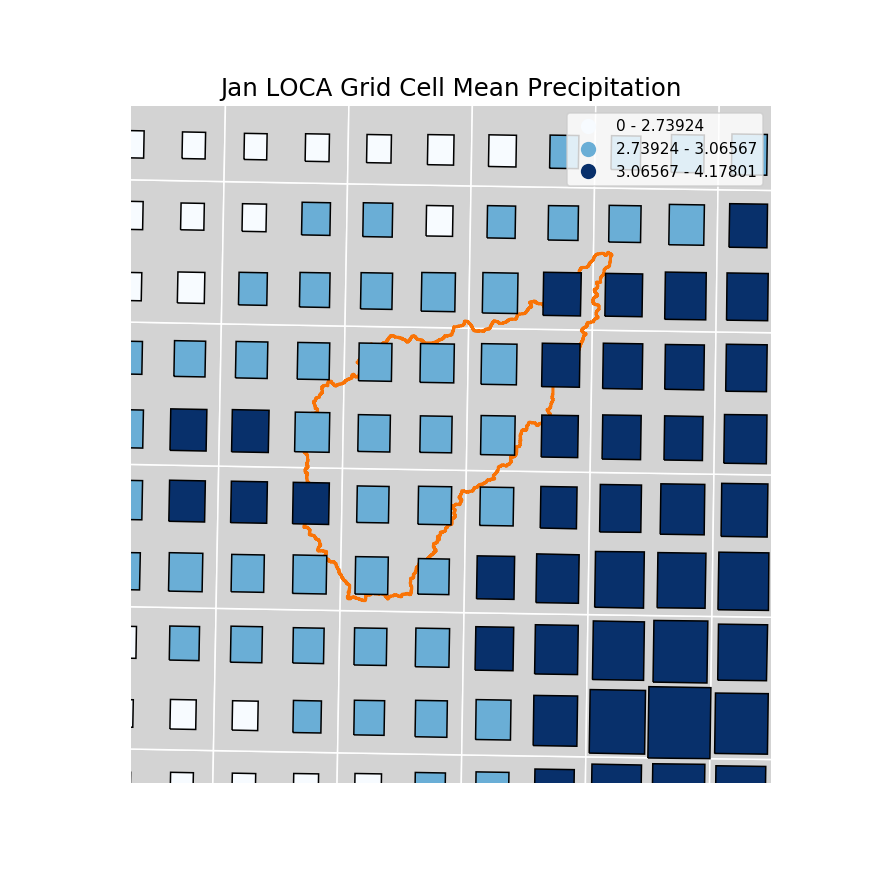

Text(0.5, 1.0, 'Jan LOCA Grid Cell Mean Precipitation')

In [64]:
Monther = "Jan"
VarType = "Mean"
Fig1 = plt.figure()
Fig1.set_size_inches(8.0, 8.0)
ax11 = Fig1.add_subplot(111)
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
gplt.cartogram( gpdJanDF.loc[:BCCA_START], scale="Mean", hue="Mean", cmap="Blues", ax=ax11,
                legend=True, legend_var='hue', k=3 )
gplt.polyplot( gpdJanDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("%s LOCA Grid Cell %s Precipitation" % (Monther, VarType), fontsize=16 )

<IPython.core.display.Javascript object>


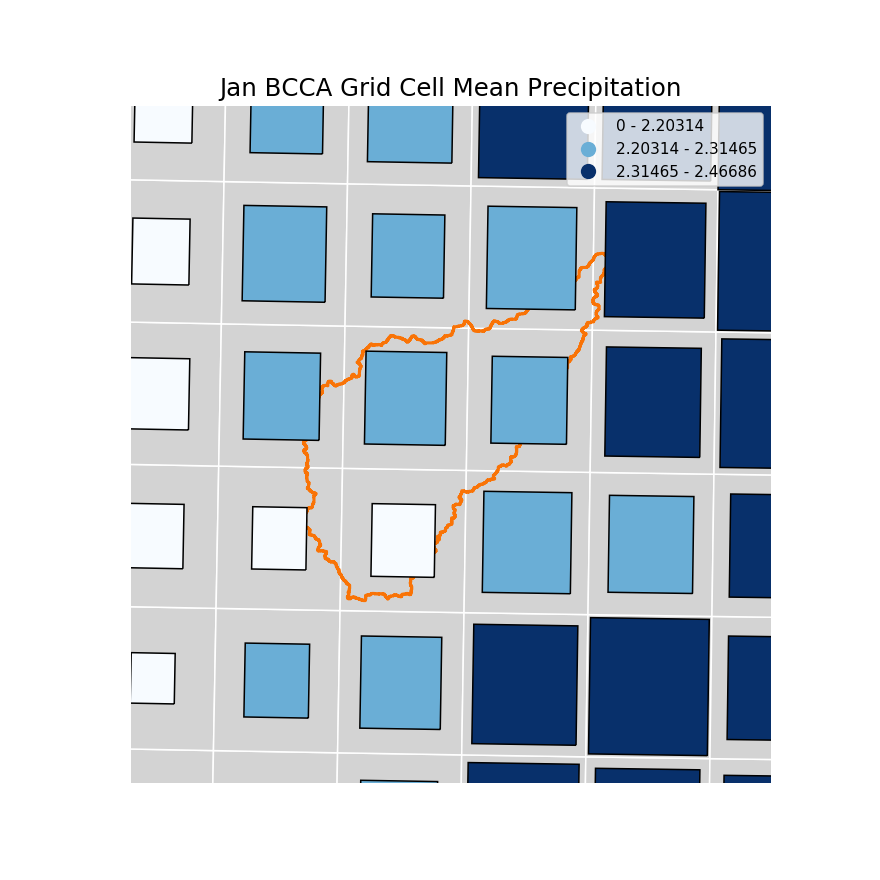

Text(0.5, 1.0, 'Jan BCCA Grid Cell Mean Precipitation')

In [65]:
Monther = "Jan"
VarType = "Mean"
Fig1 = plt.figure()
Fig1.set_size_inches(8.0, 8.0)
ax11 = Fig1.add_subplot(111)
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
gplt.cartogram( gpdJanDF.loc[BCCA_START:], scale="Mean", hue="Mean", cmap="Blues", ax=ax11,
                legend=True, legend_var='hue', k=3 )
gplt.polyplot( gpdJanDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("%s BCCA Grid Cell %s Precipitation" % (Monther, VarType), fontsize=16 )

In [66]:
PlotColumnsList = [ "Mean", "Median", "Max", "StDev", "Skewness", "Kurtosis",
                    "l_2", "l_3", "l_4", "L-CV", "L-Skewness", "L-Kurtosis", ]
PlotCmapsList = [ "Blues", "Purples", "Greens", "Oranges", "Reds", "Greys",
                  "viridis", "plasma", "inferno", "magma", "YlOrBr", "BuPu" ]

In [67]:
NumPlotTypes = len( PlotColumnsList )
NumK = 3

<IPython.core.display.Javascript object>


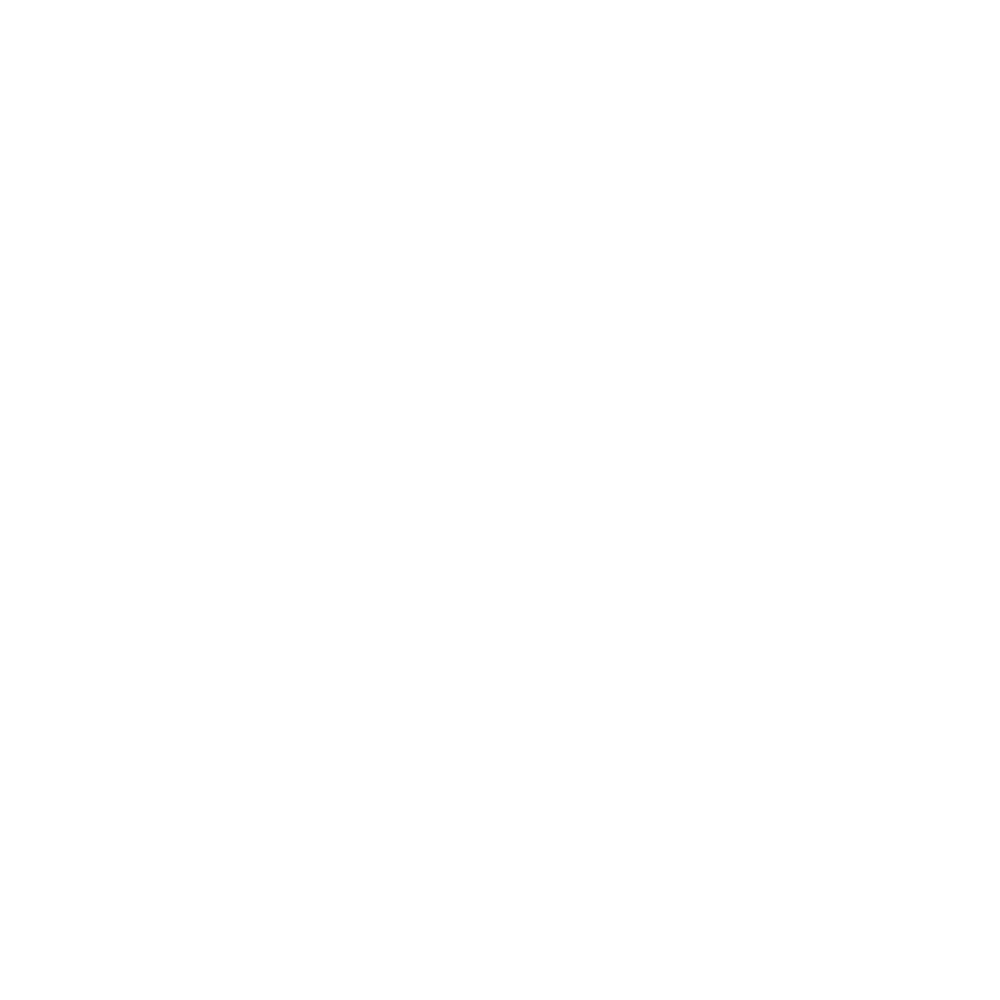

<IPython.core.display.Javascript object>


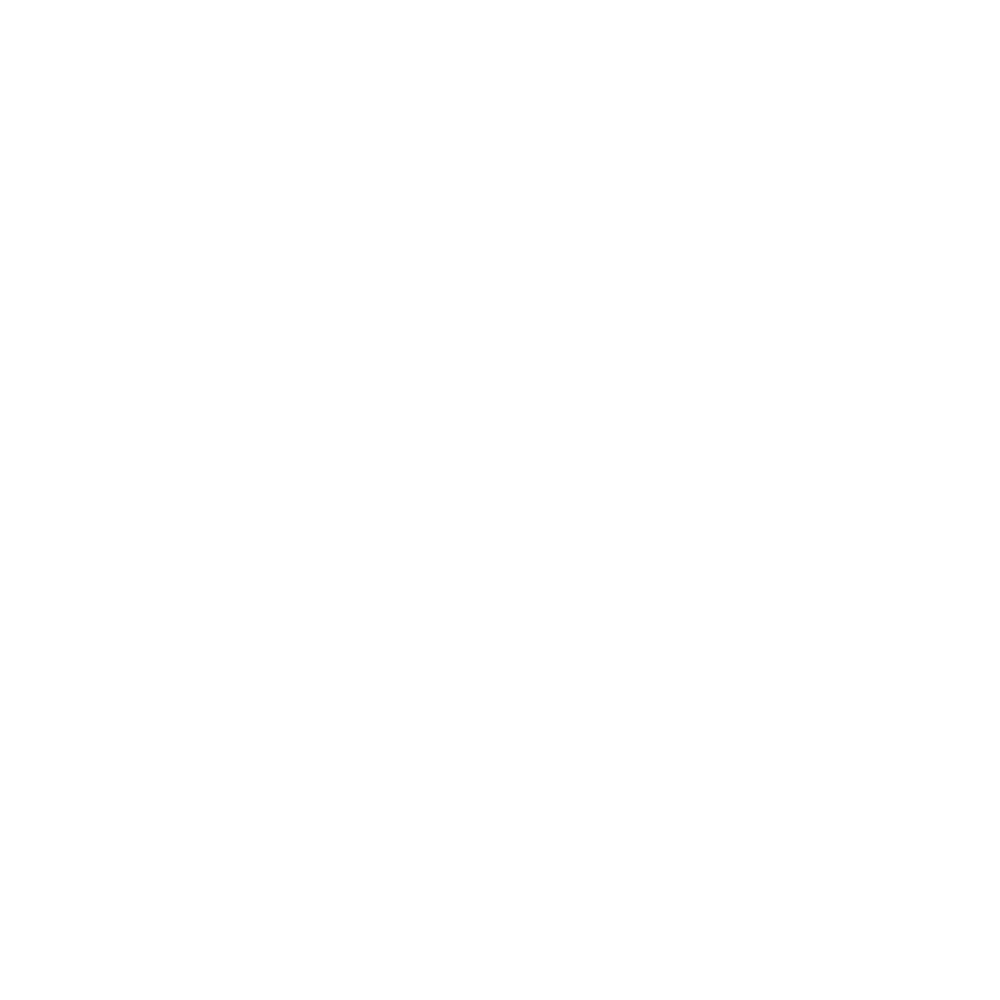

<IPython.core.display.Javascript object>


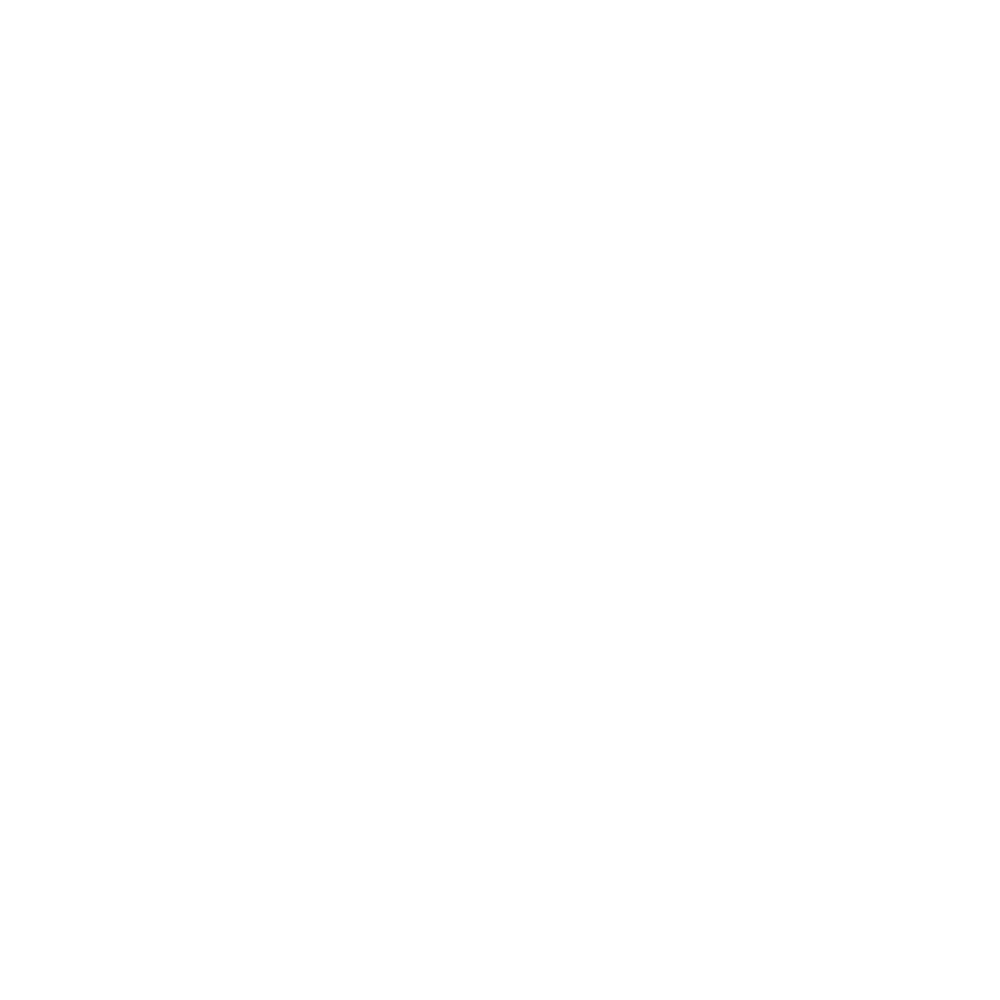

<IPython.core.display.Javascript object>


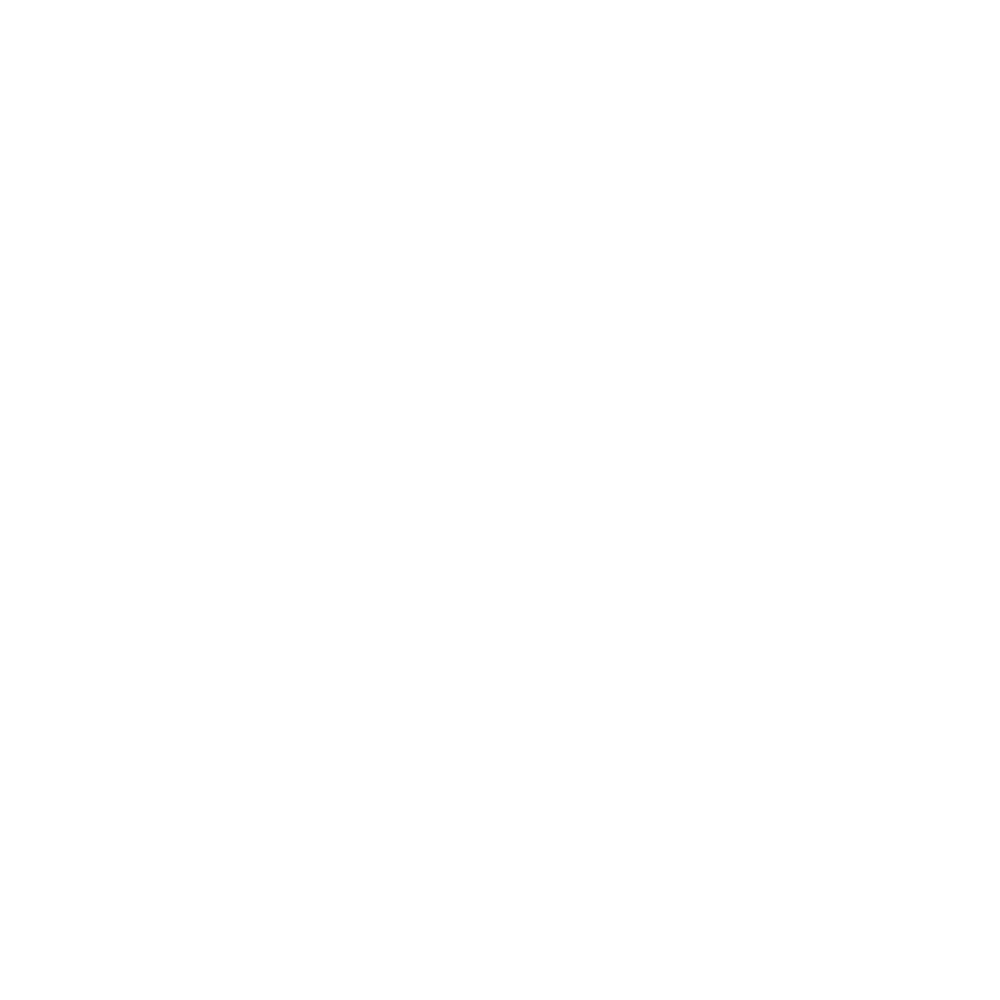

<IPython.core.display.Javascript object>


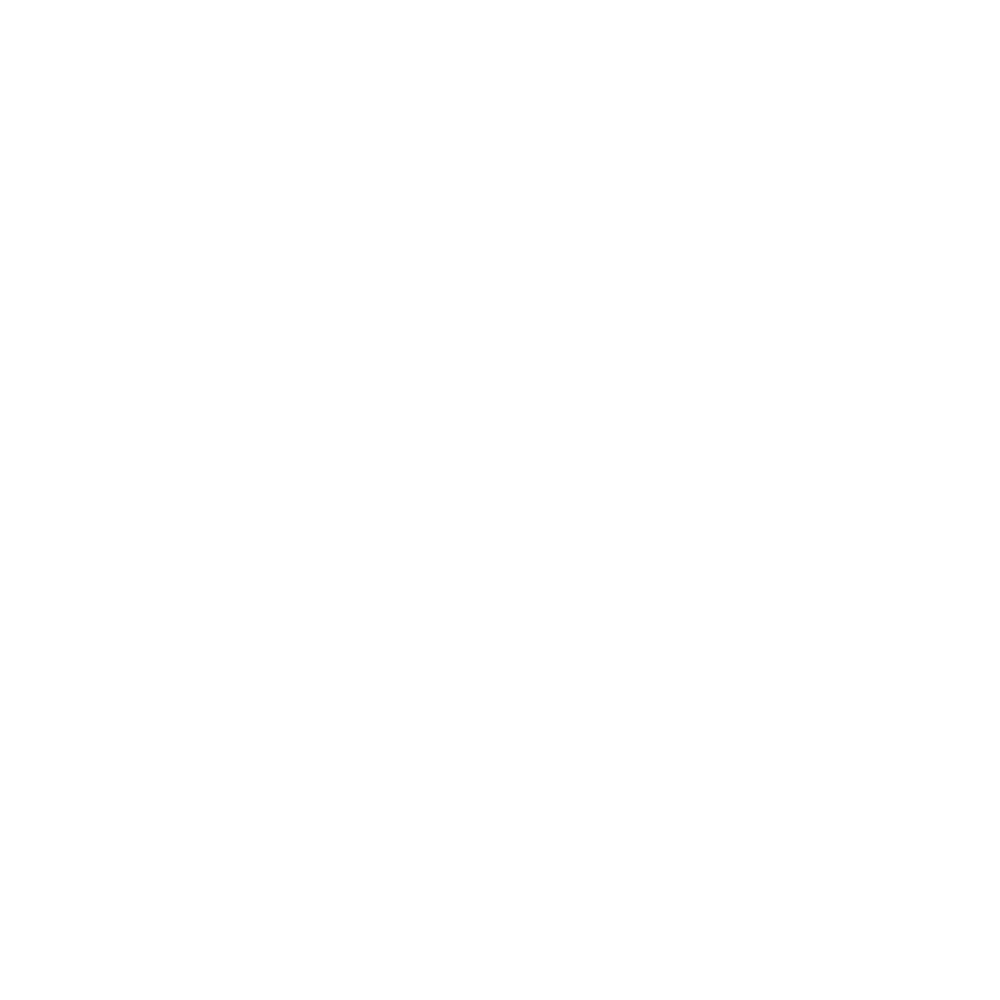

<IPython.core.display.Javascript object>


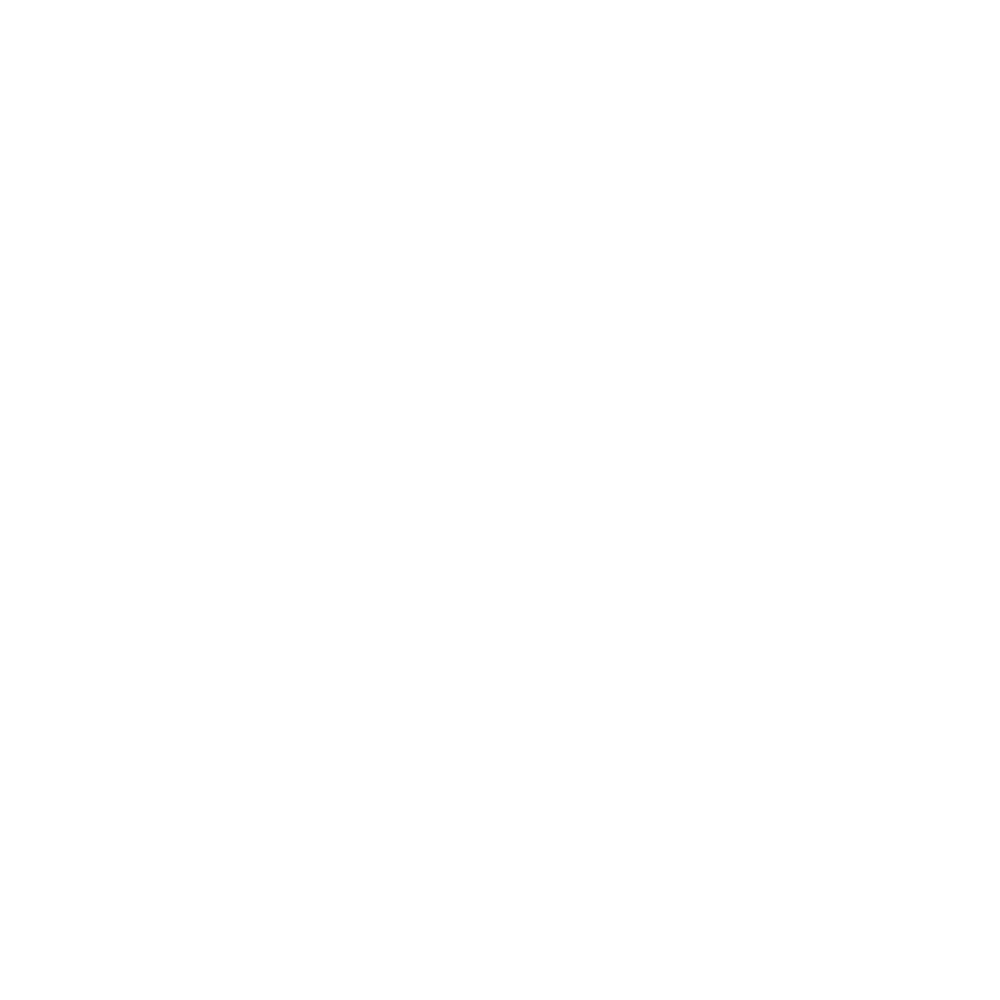

<IPython.core.display.Javascript object>


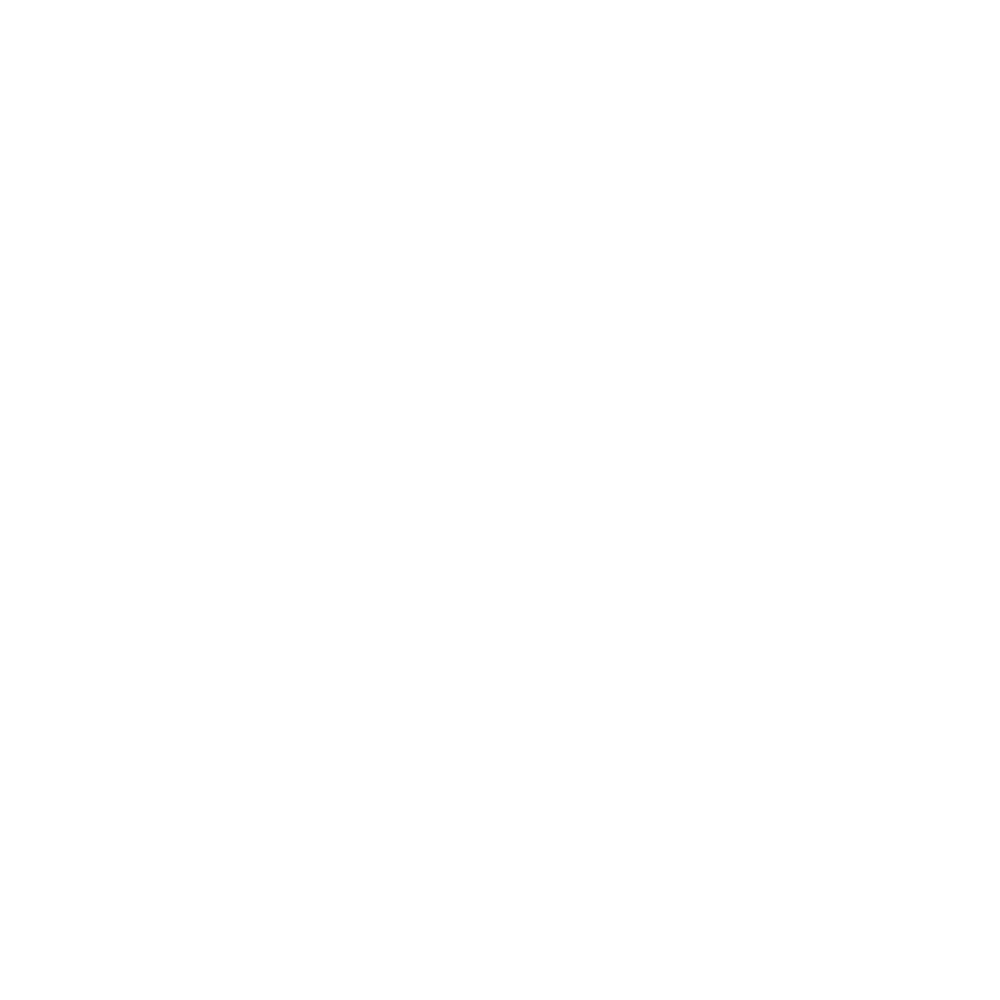

<IPython.core.display.Javascript object>


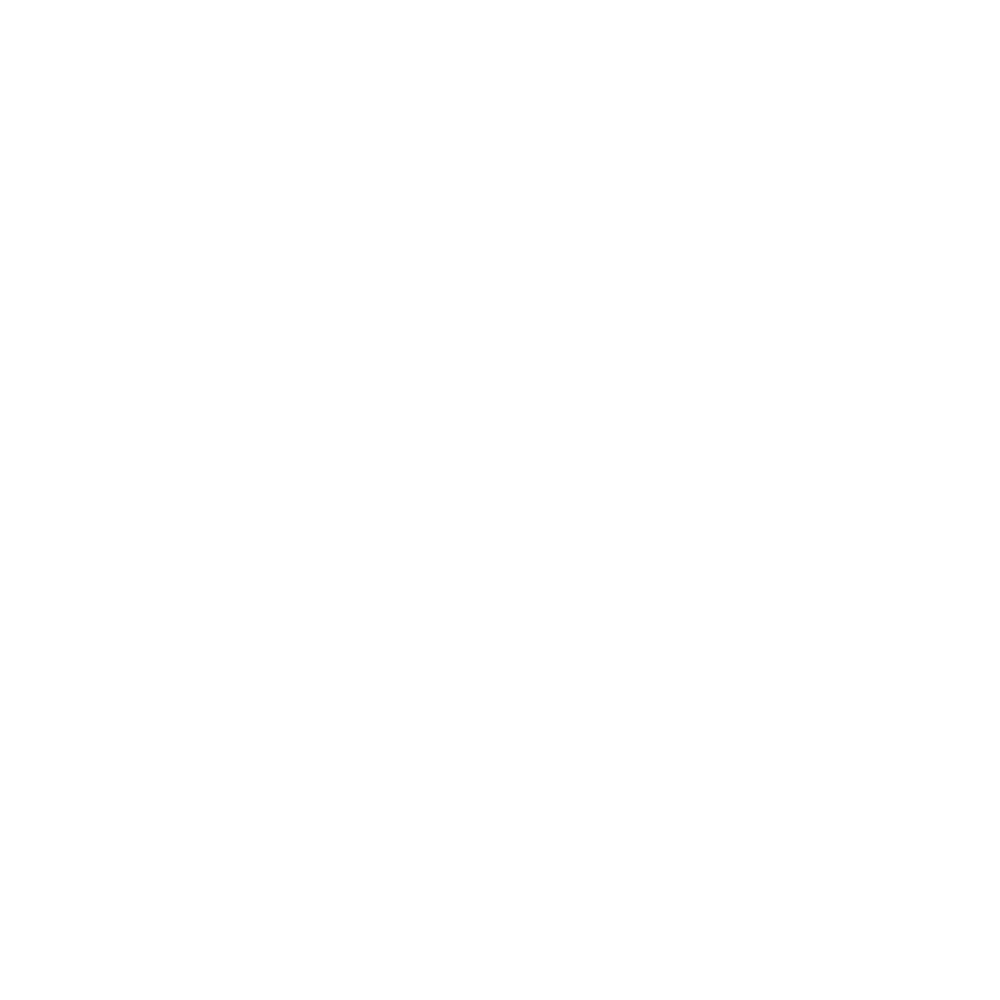

<IPython.core.display.Javascript object>


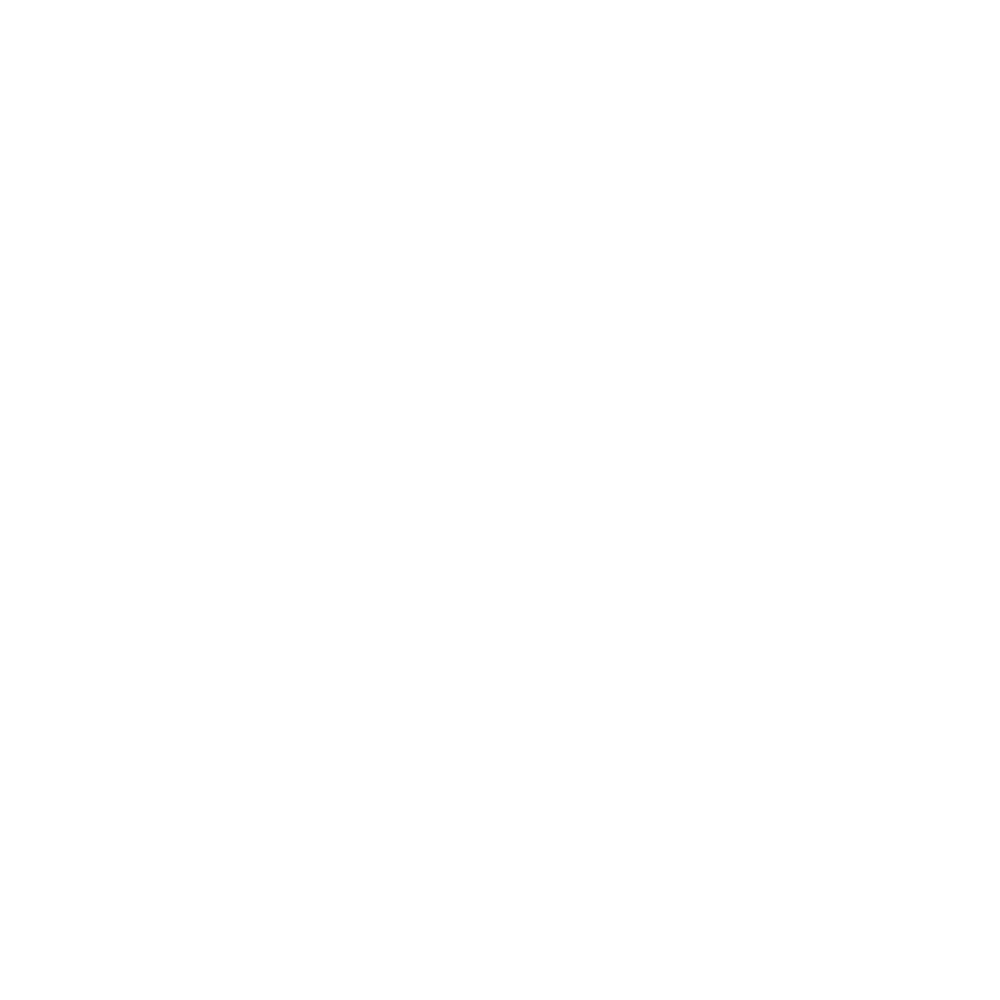

<IPython.core.display.Javascript object>


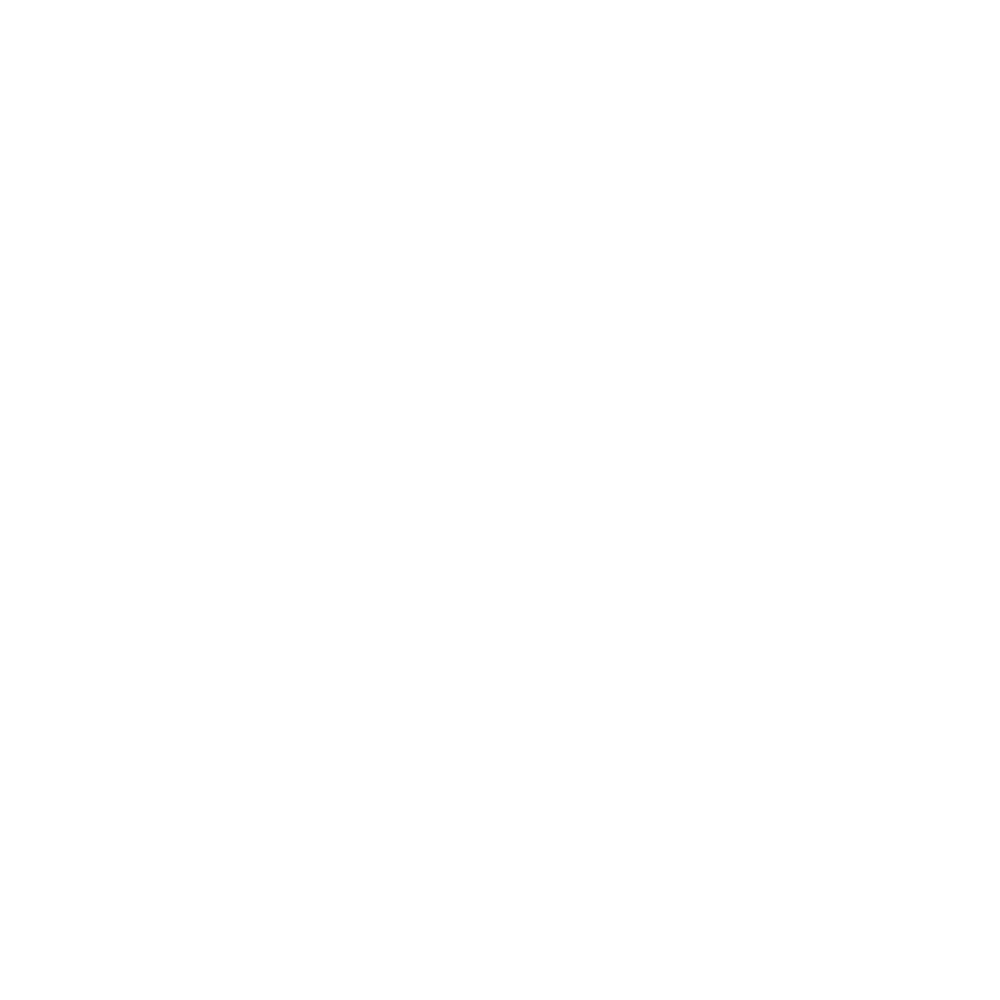

<IPython.core.display.Javascript object>


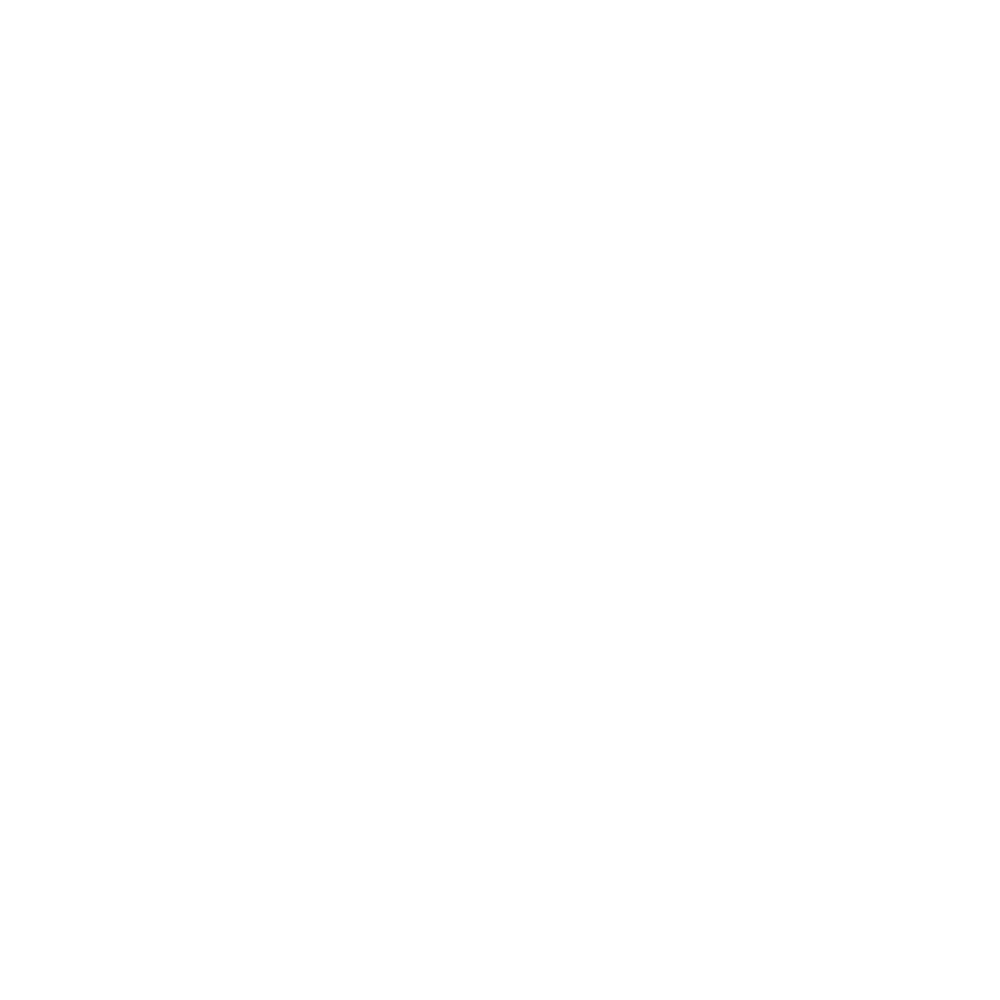

<IPython.core.display.Javascript object>


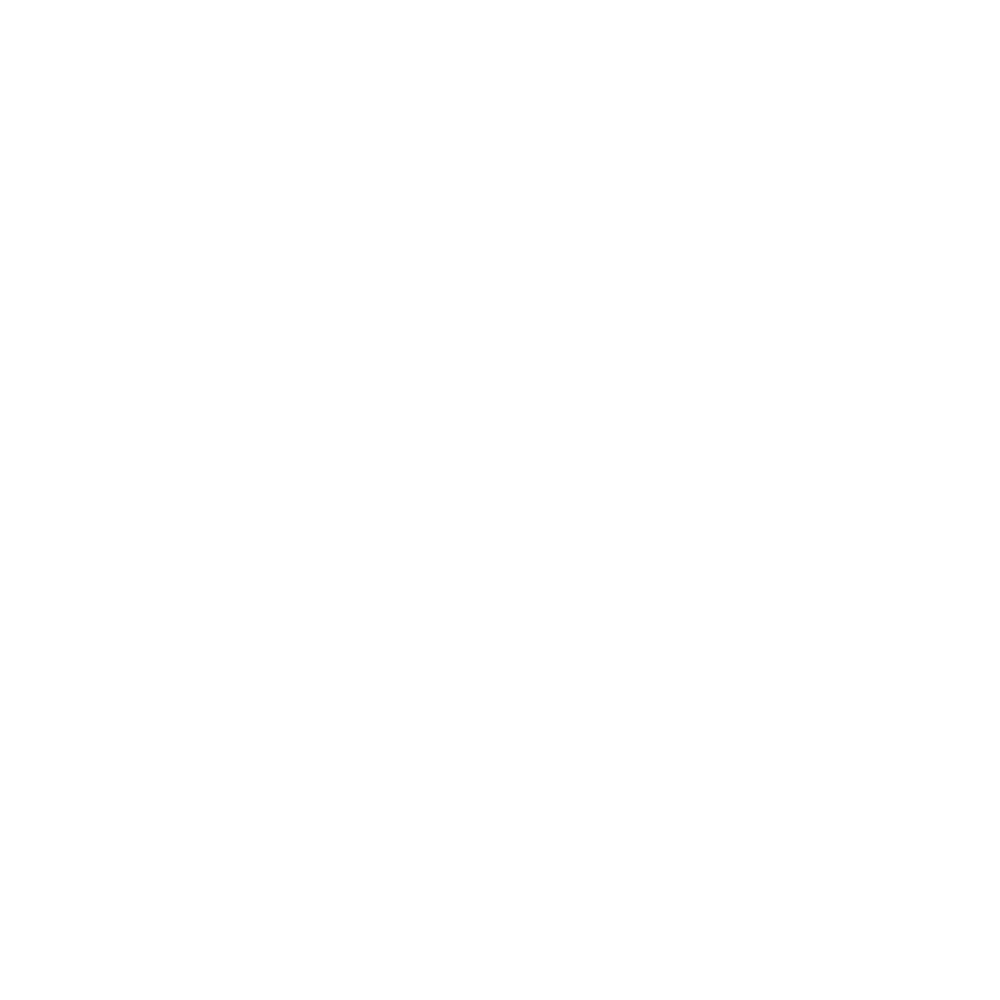

<IPython.core.display.Javascript object>


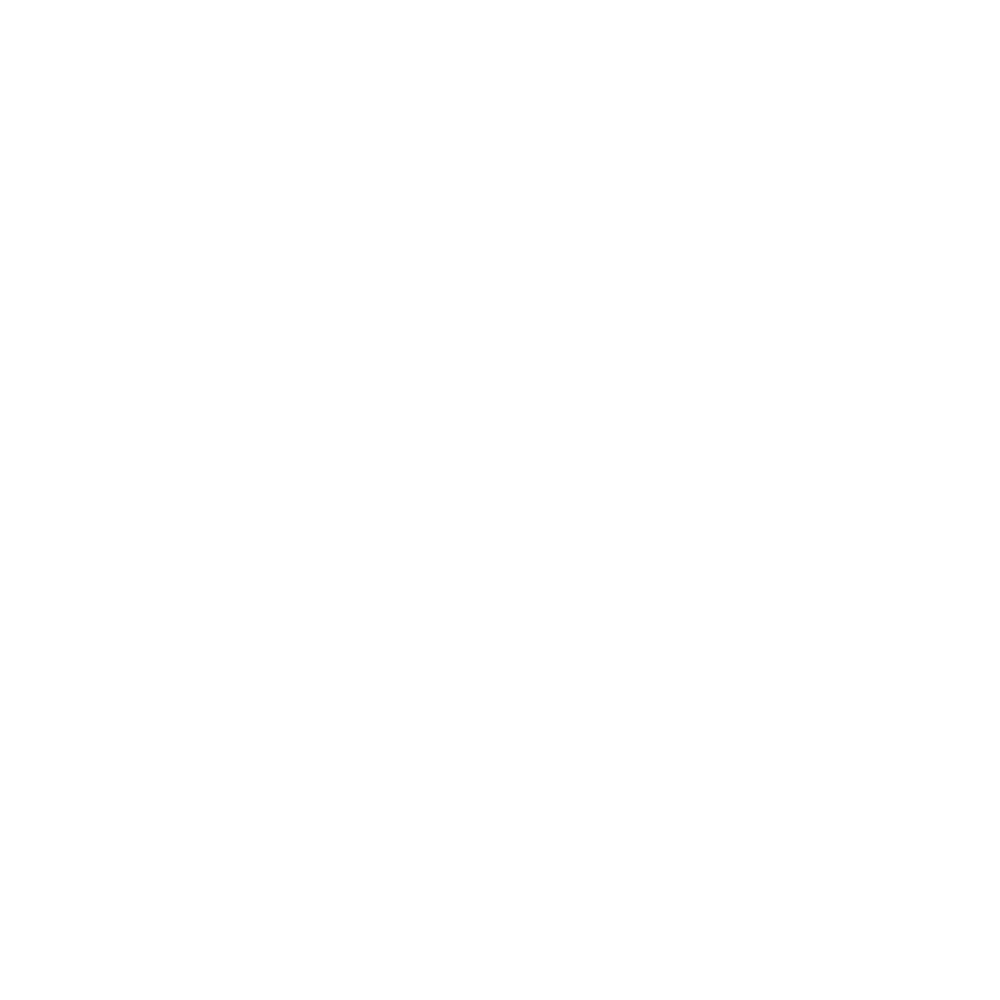

<IPython.core.display.Javascript object>


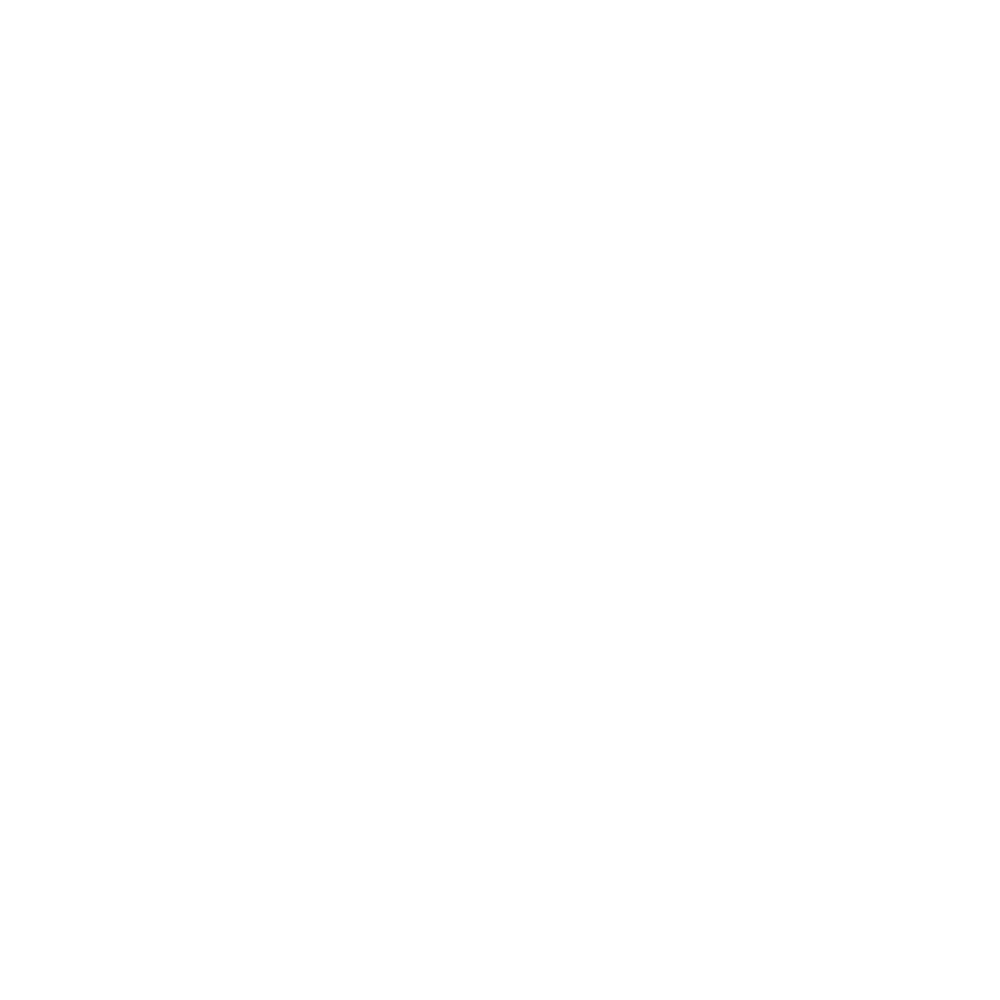

<IPython.core.display.Javascript object>


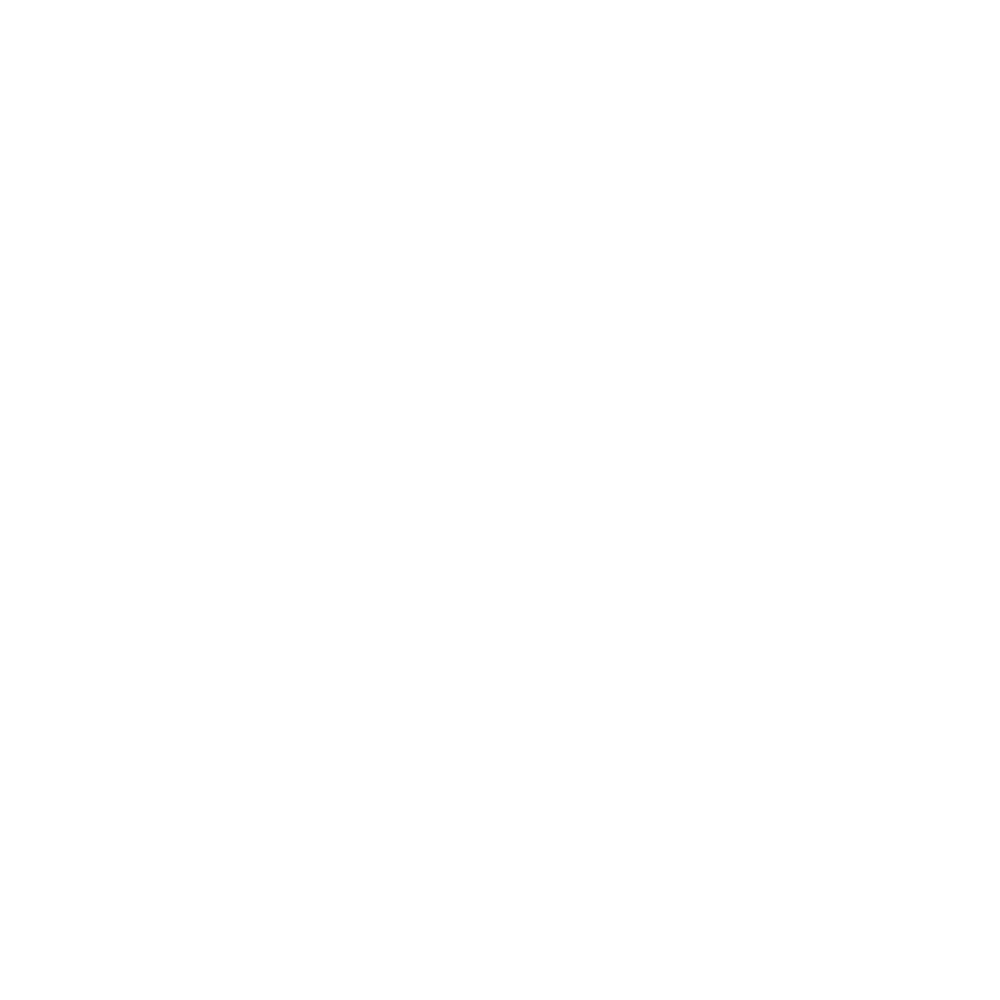

<IPython.core.display.Javascript object>


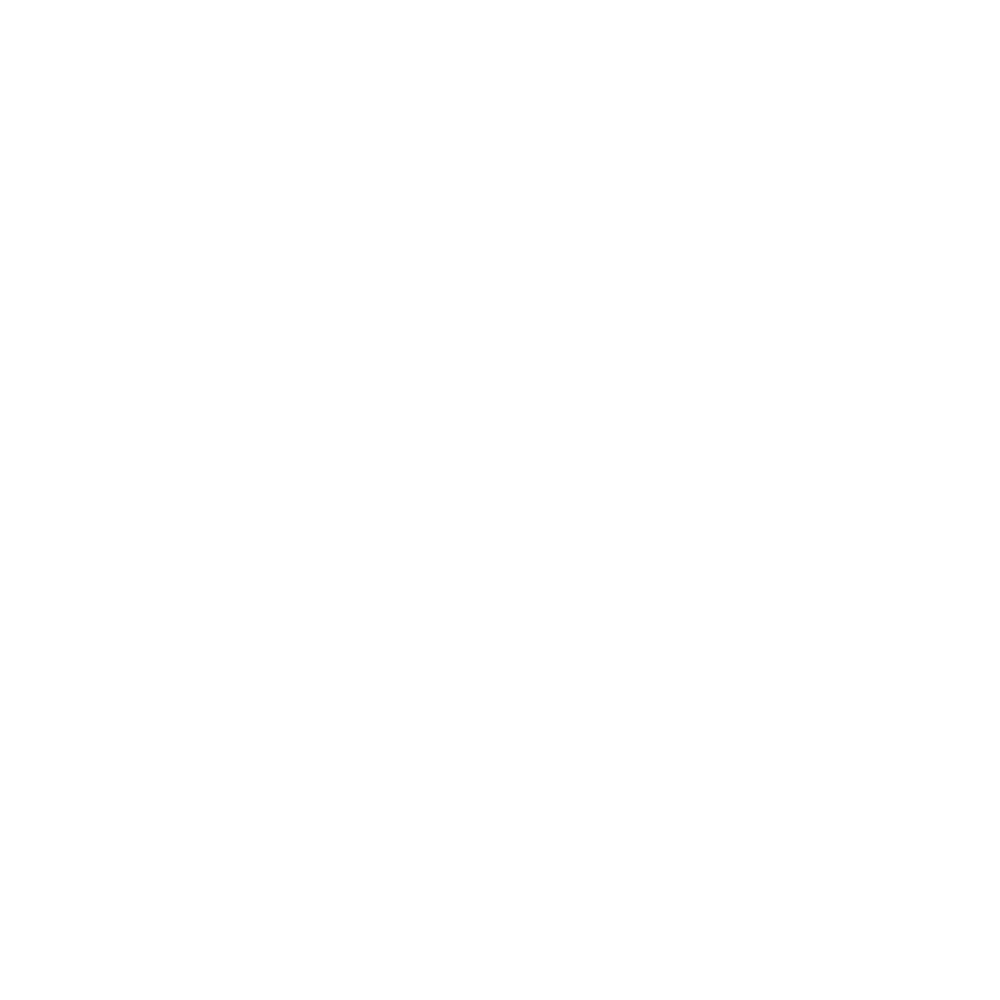

<IPython.core.display.Javascript object>


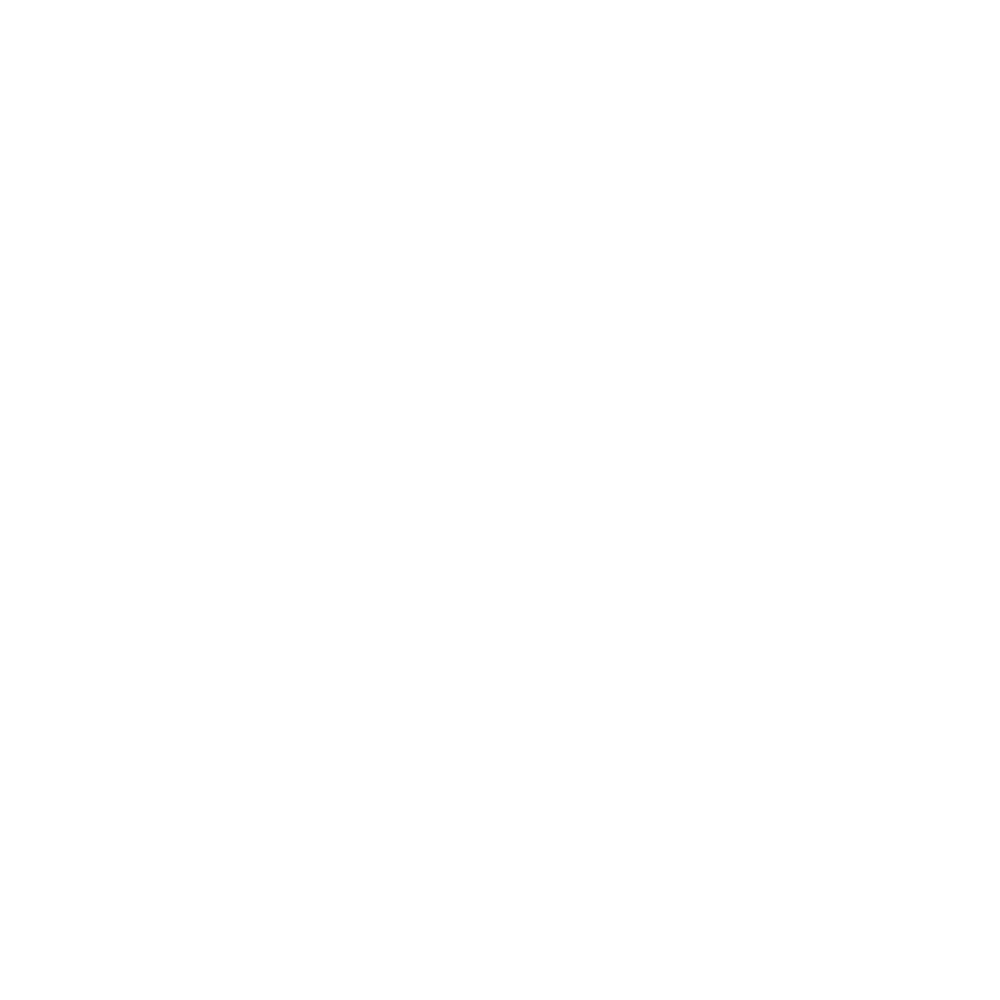

<IPython.core.display.Javascript object>


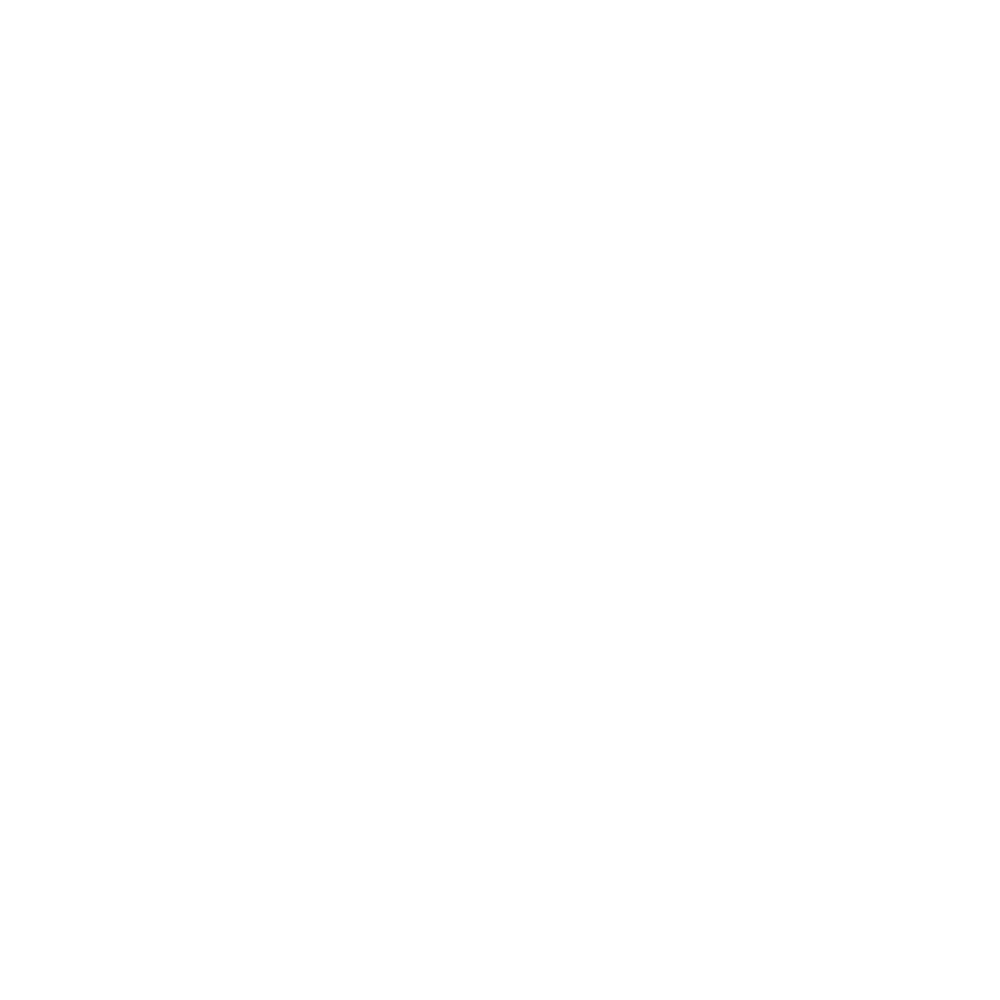

<IPython.core.display.Javascript object>


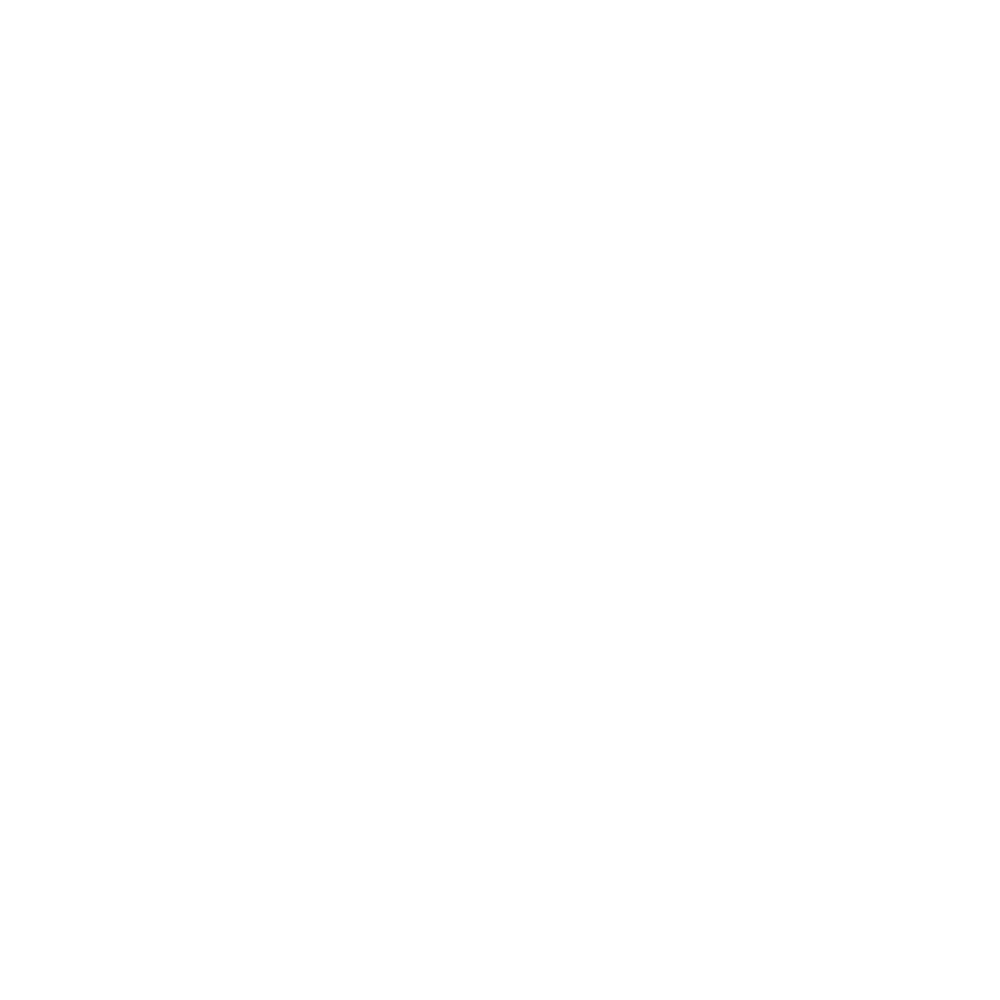

<IPython.core.display.Javascript object>


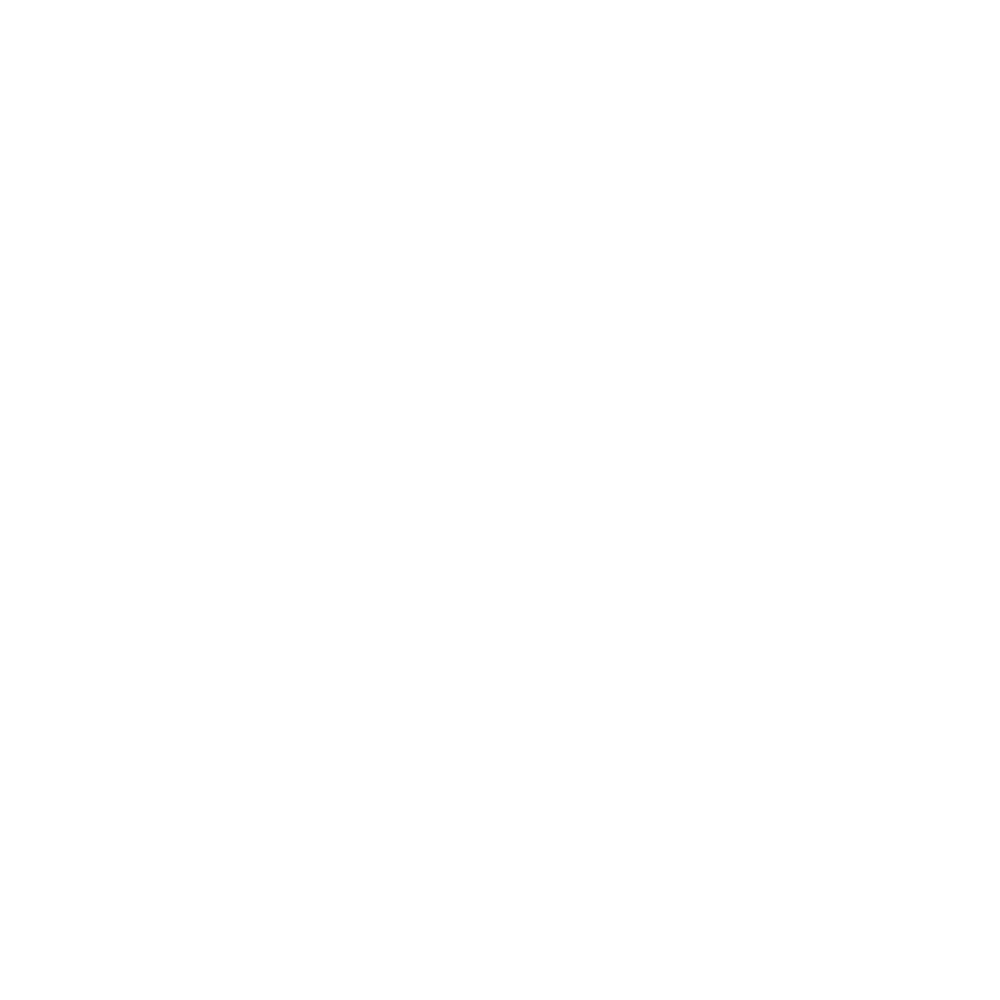

<IPython.core.display.Javascript object>


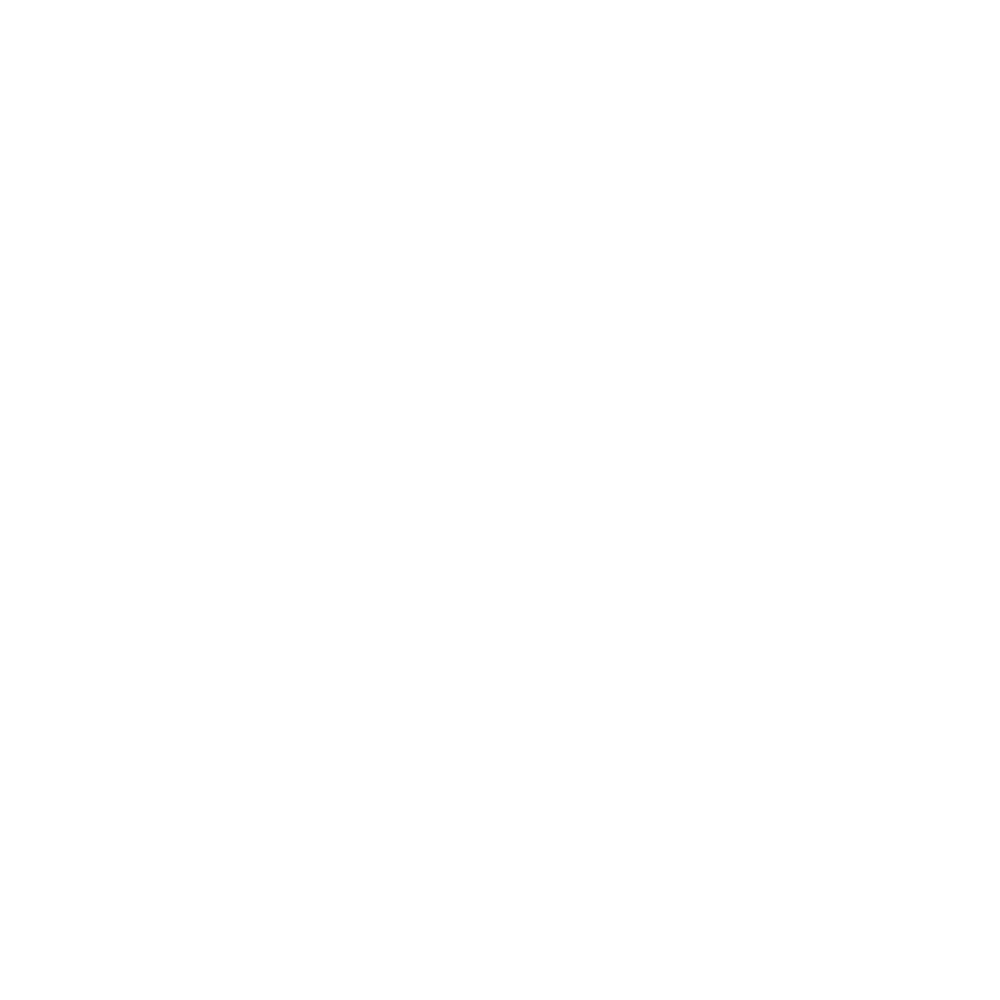

<IPython.core.display.Javascript object>


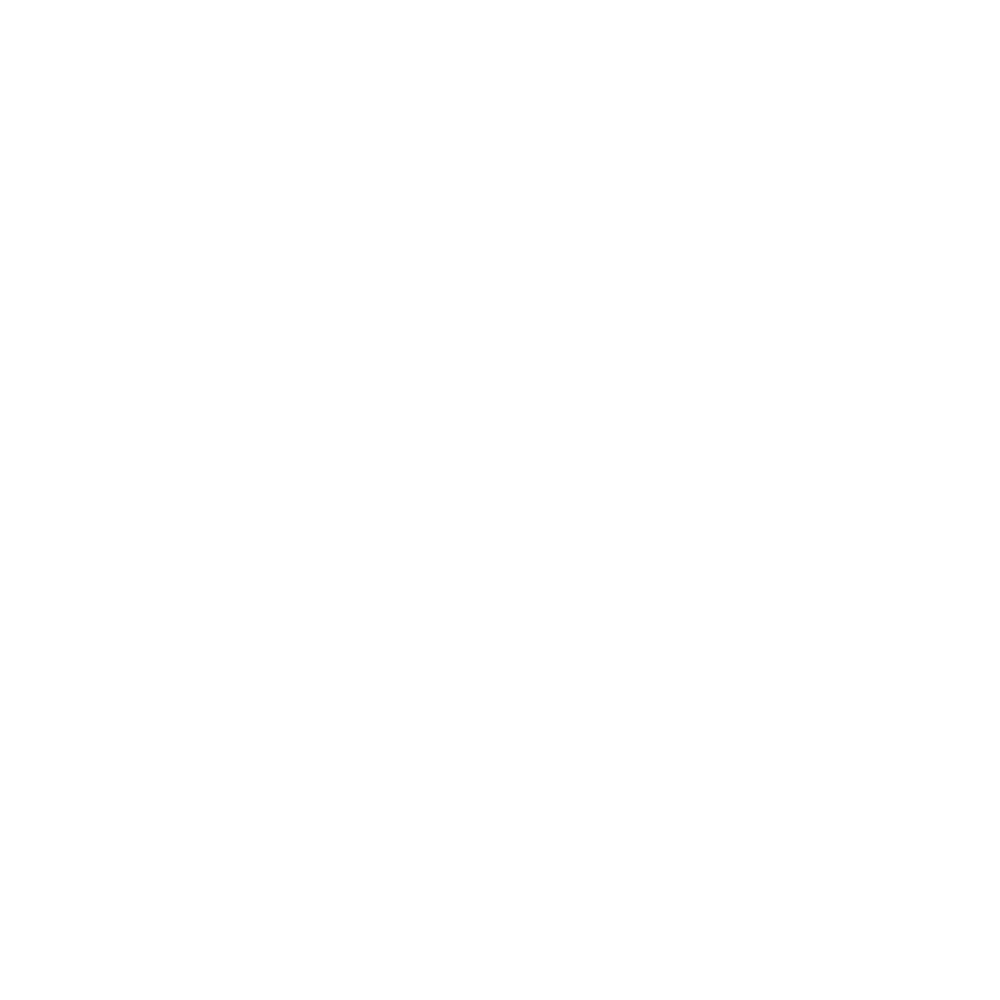

<IPython.core.display.Javascript object>


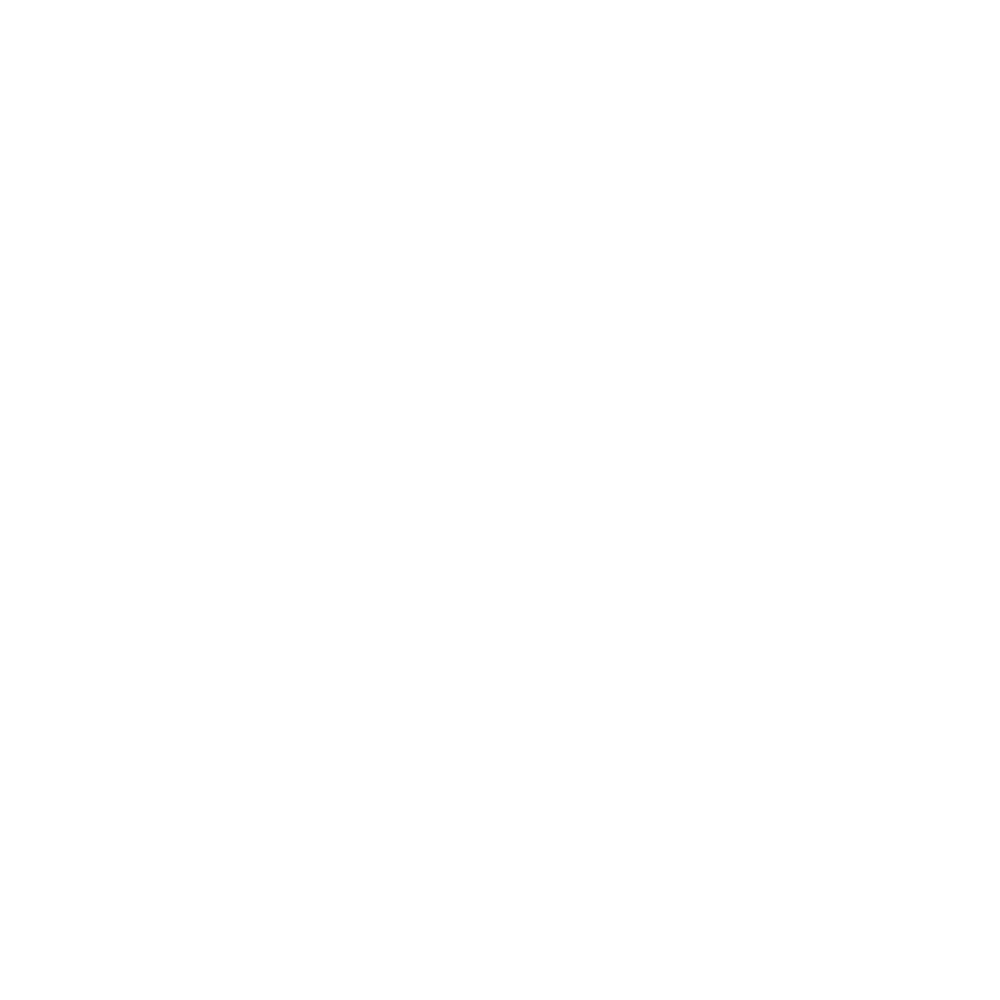

<IPython.core.display.Javascript object>


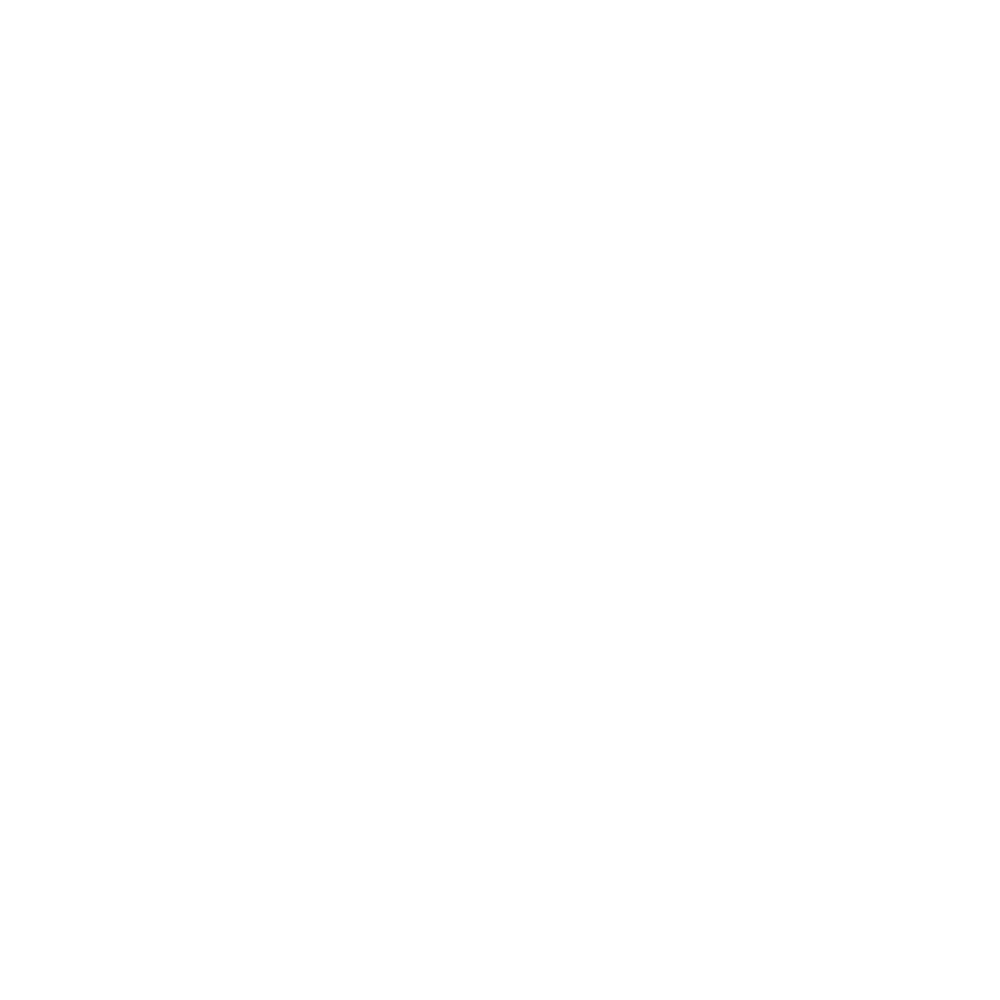

<IPython.core.display.Javascript object>


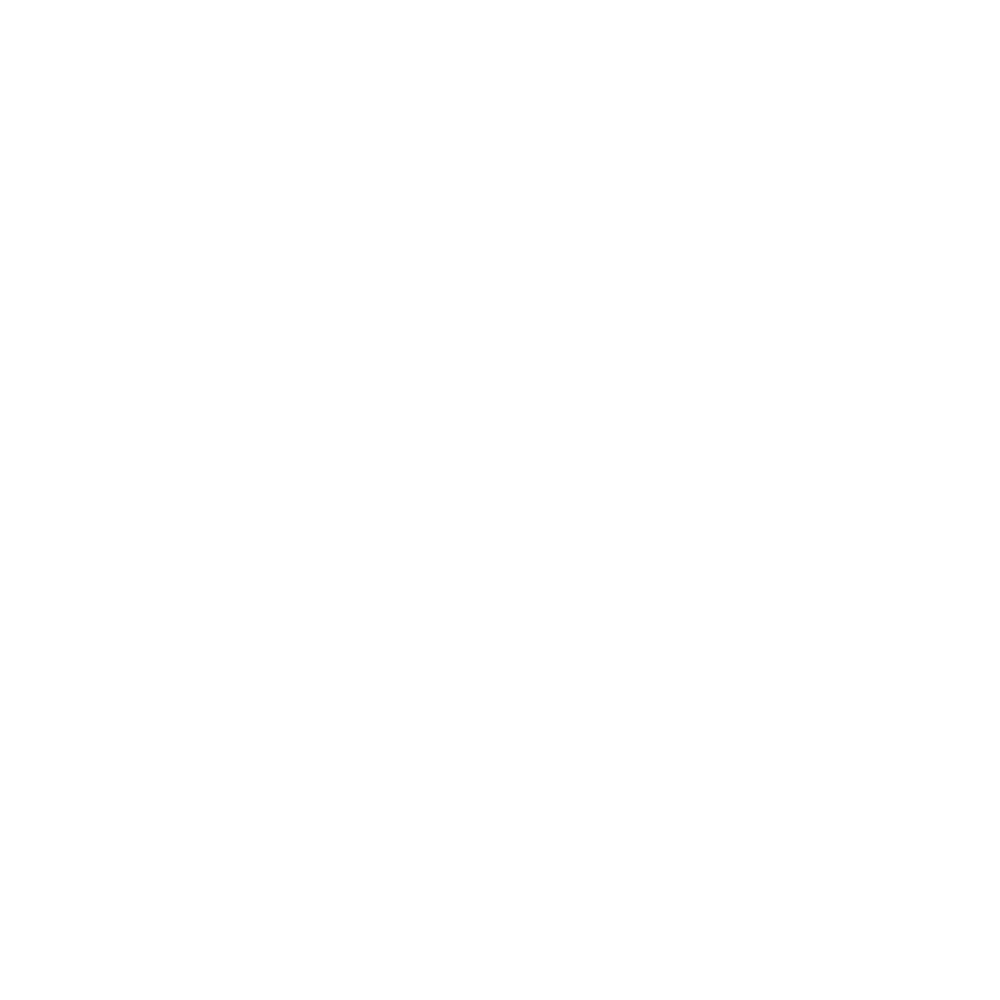

<IPython.core.display.Javascript object>


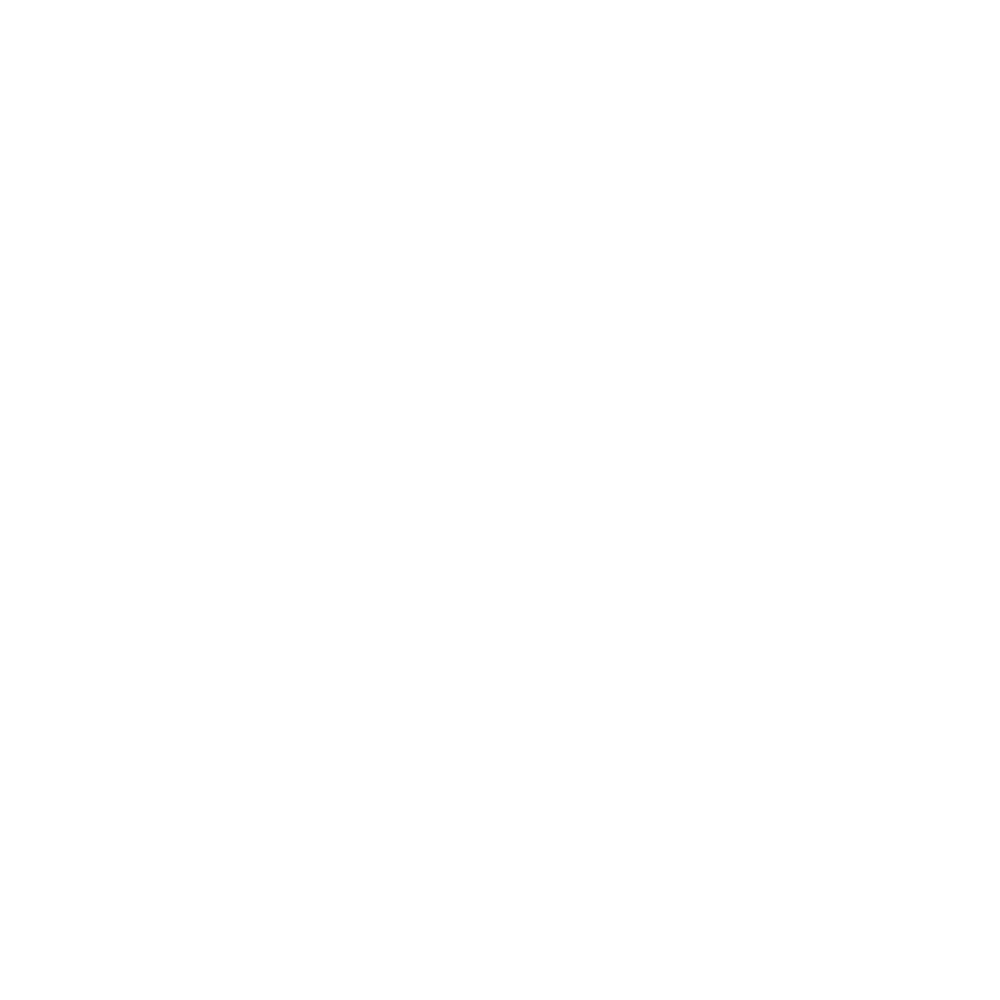

<IPython.core.display.Javascript object>


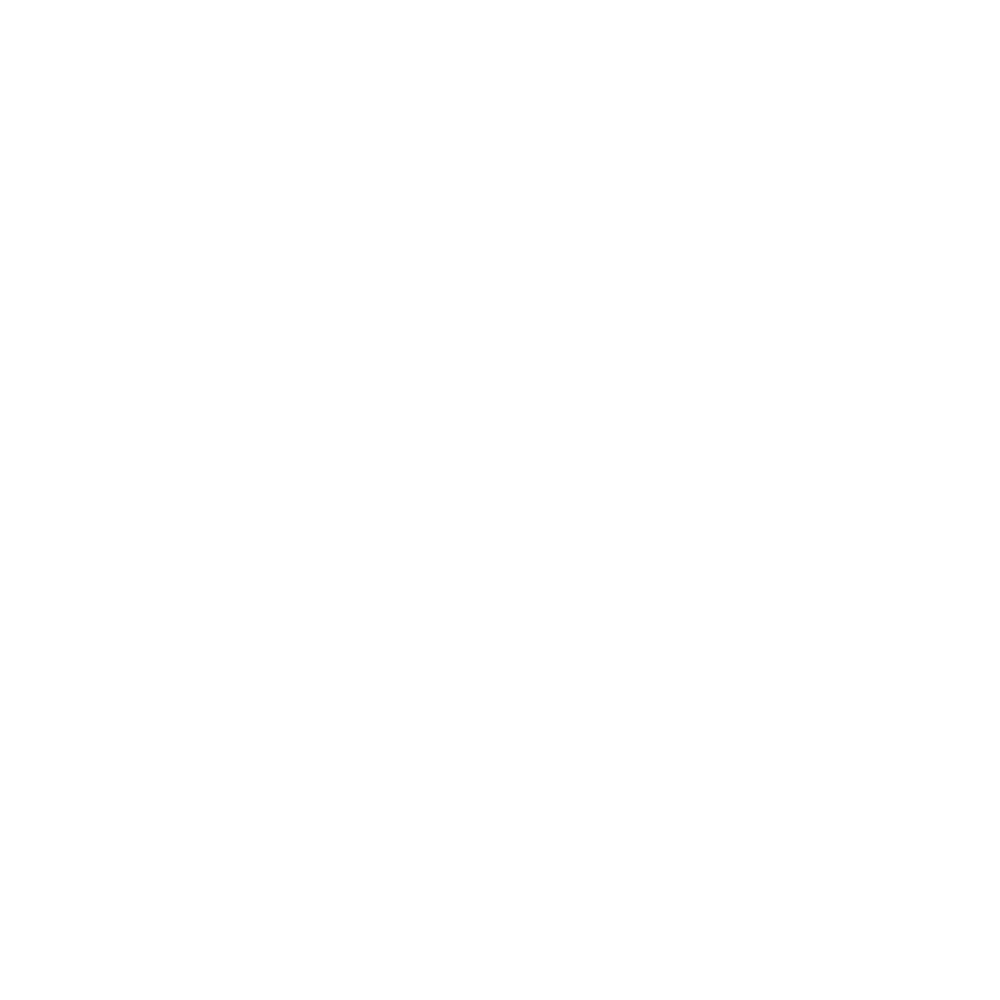

<IPython.core.display.Javascript object>


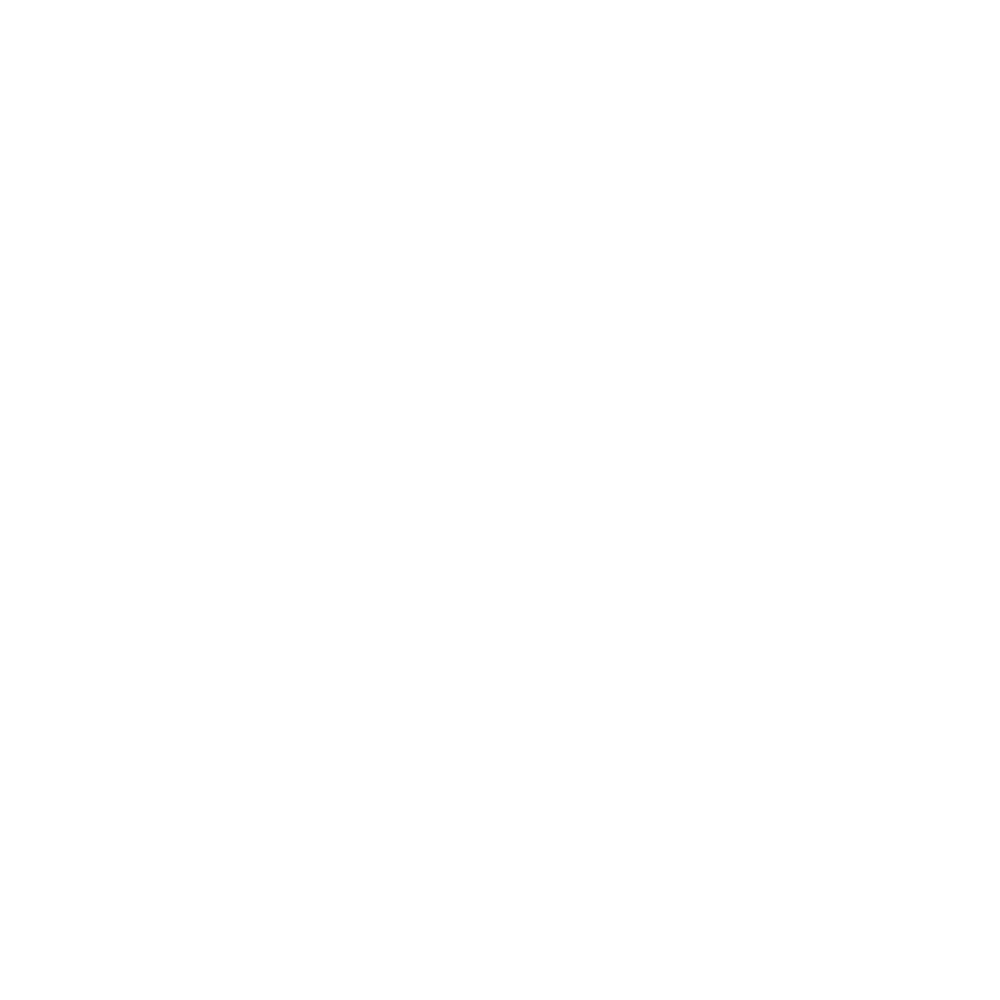

<IPython.core.display.Javascript object>


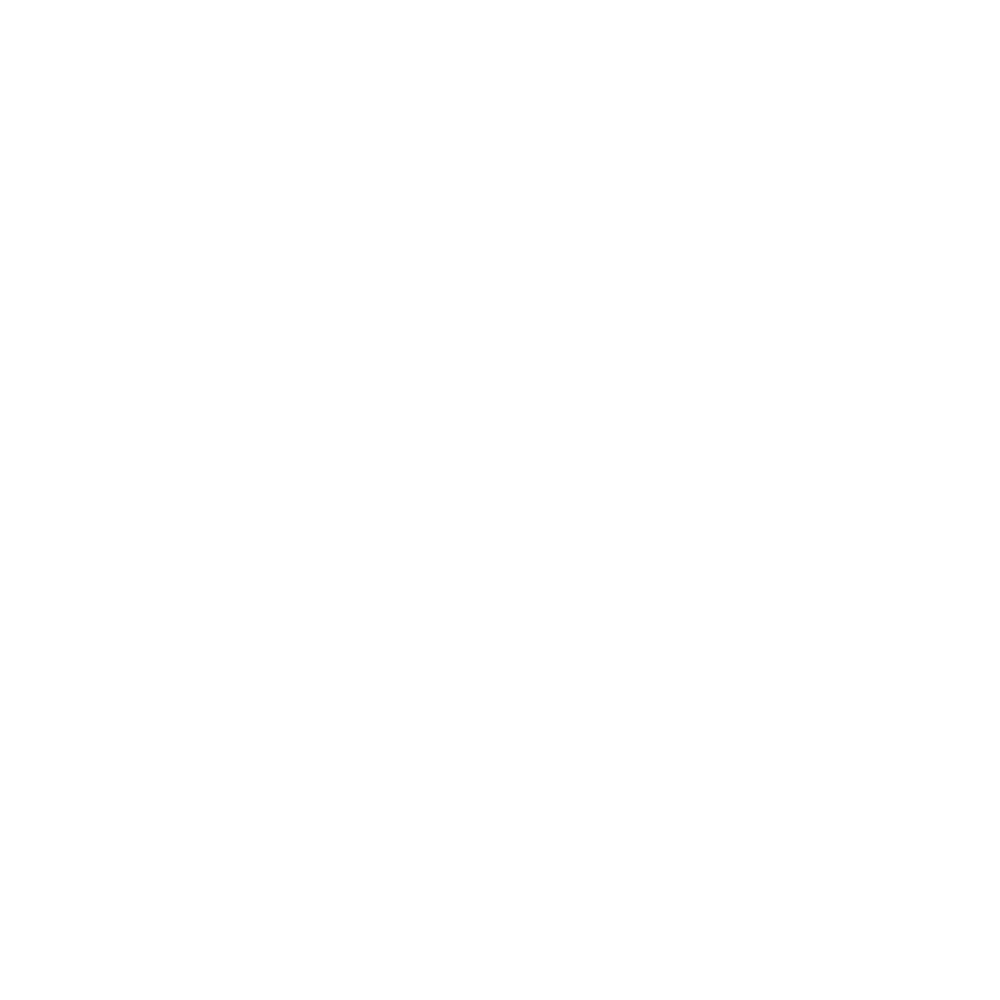

<IPython.core.display.Javascript object>


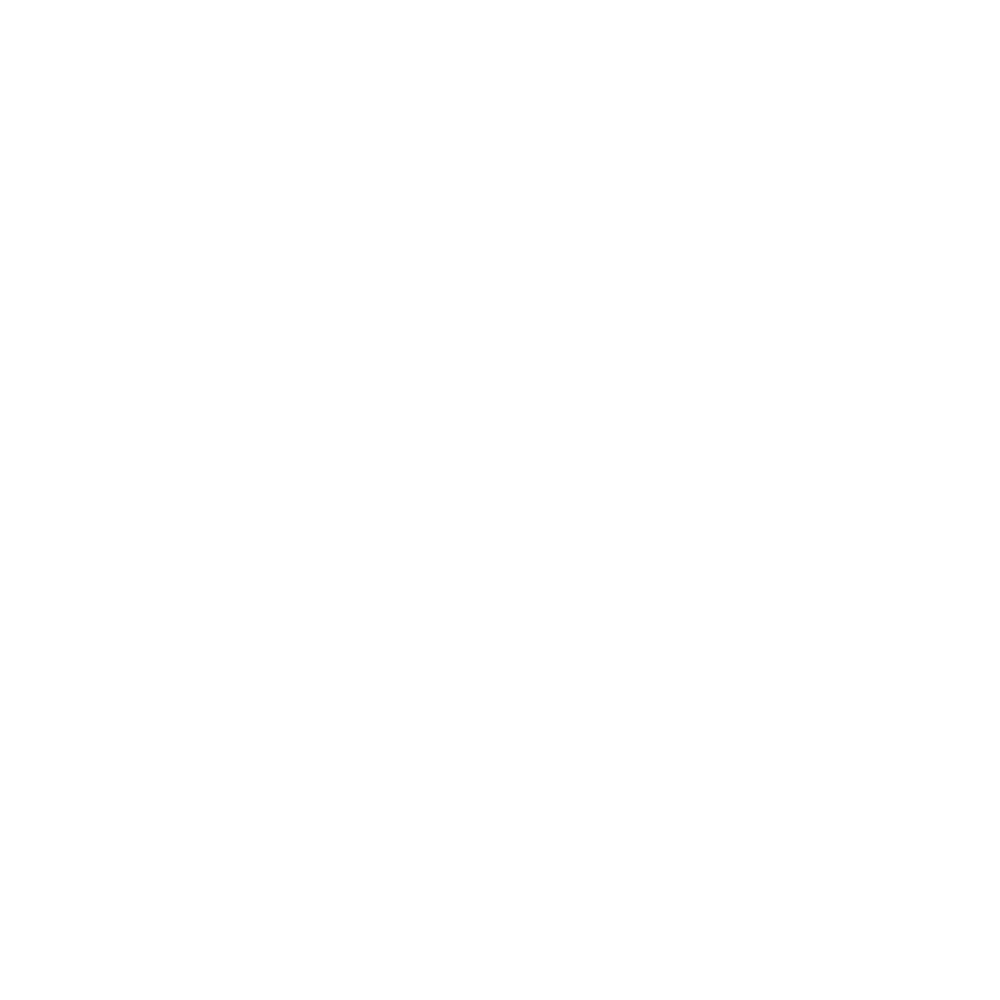

<IPython.core.display.Javascript object>


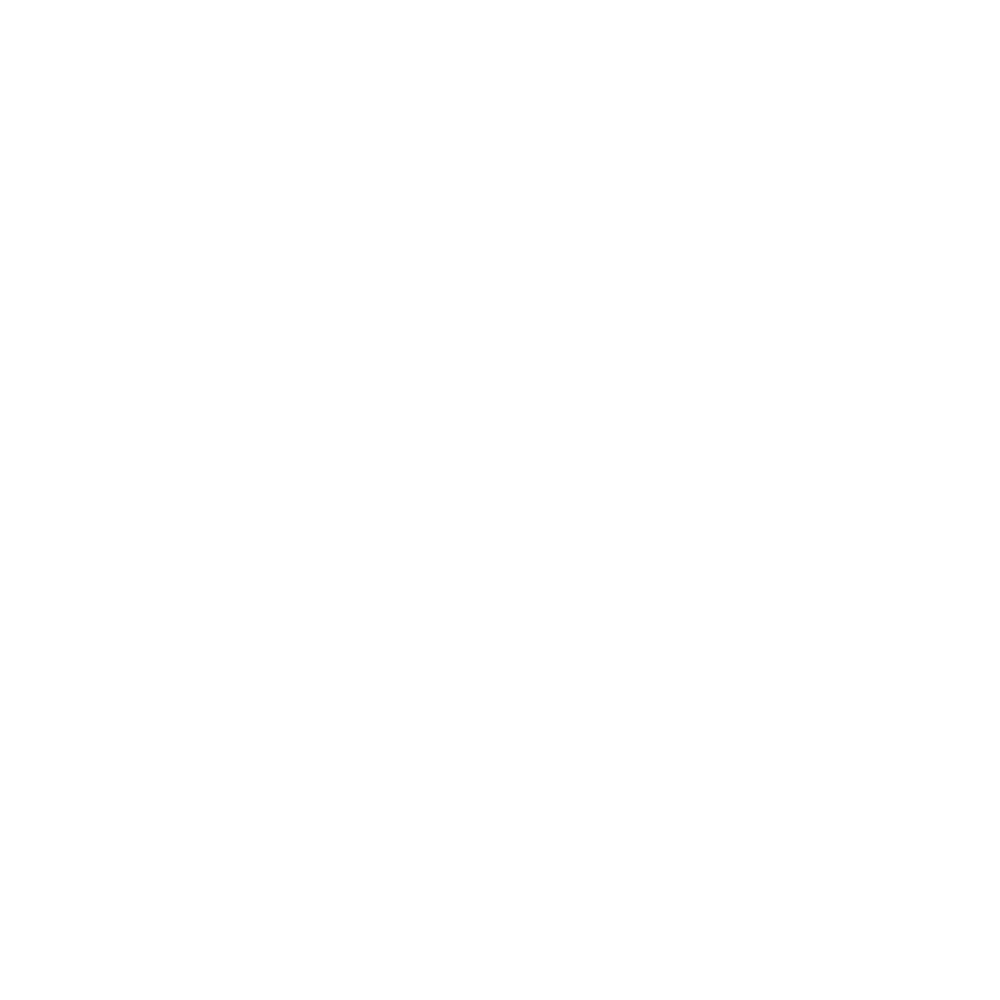

<IPython.core.display.Javascript object>


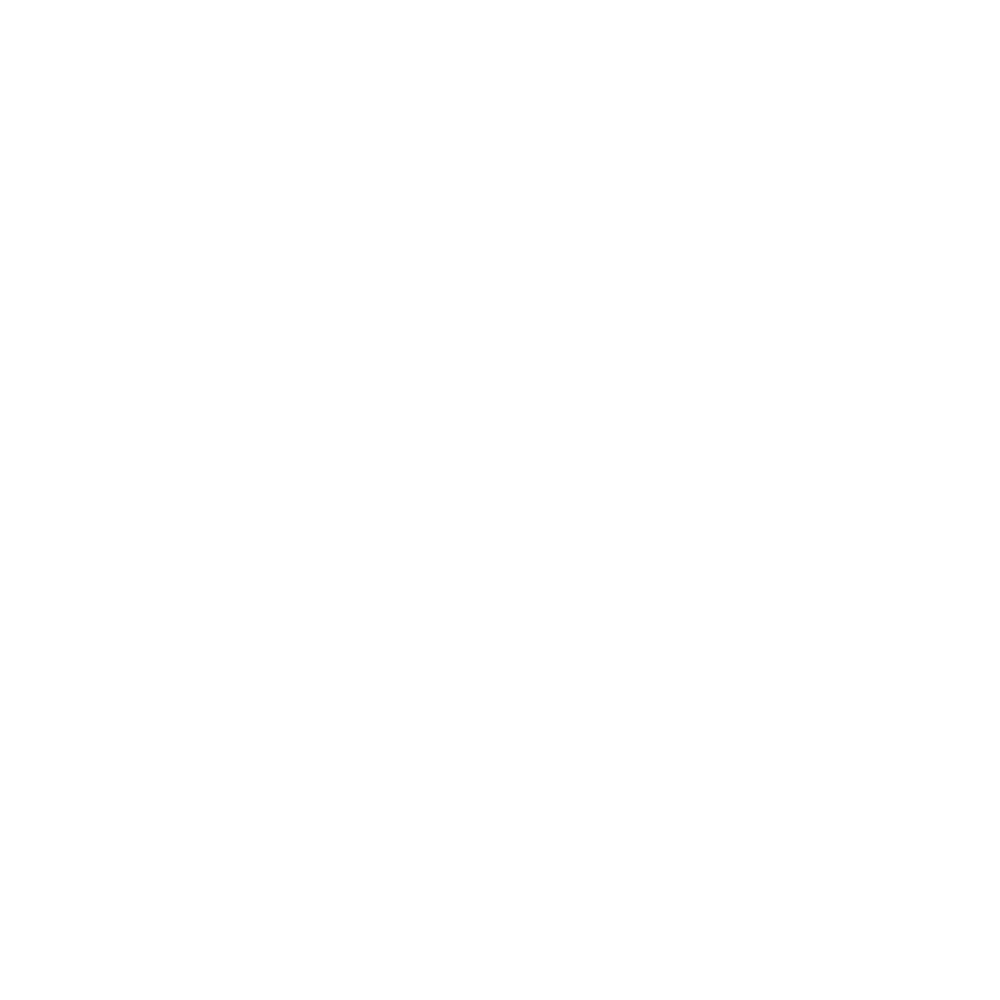

<IPython.core.display.Javascript object>


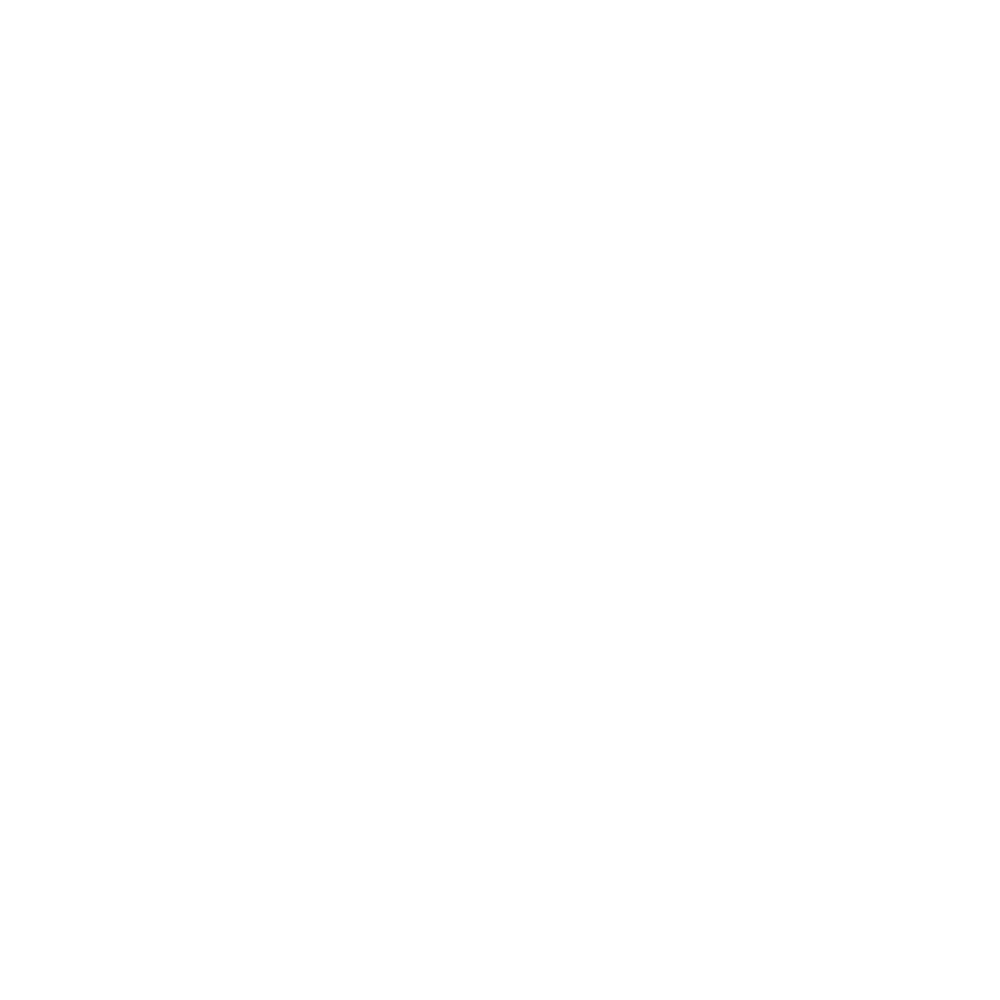

<IPython.core.display.Javascript object>


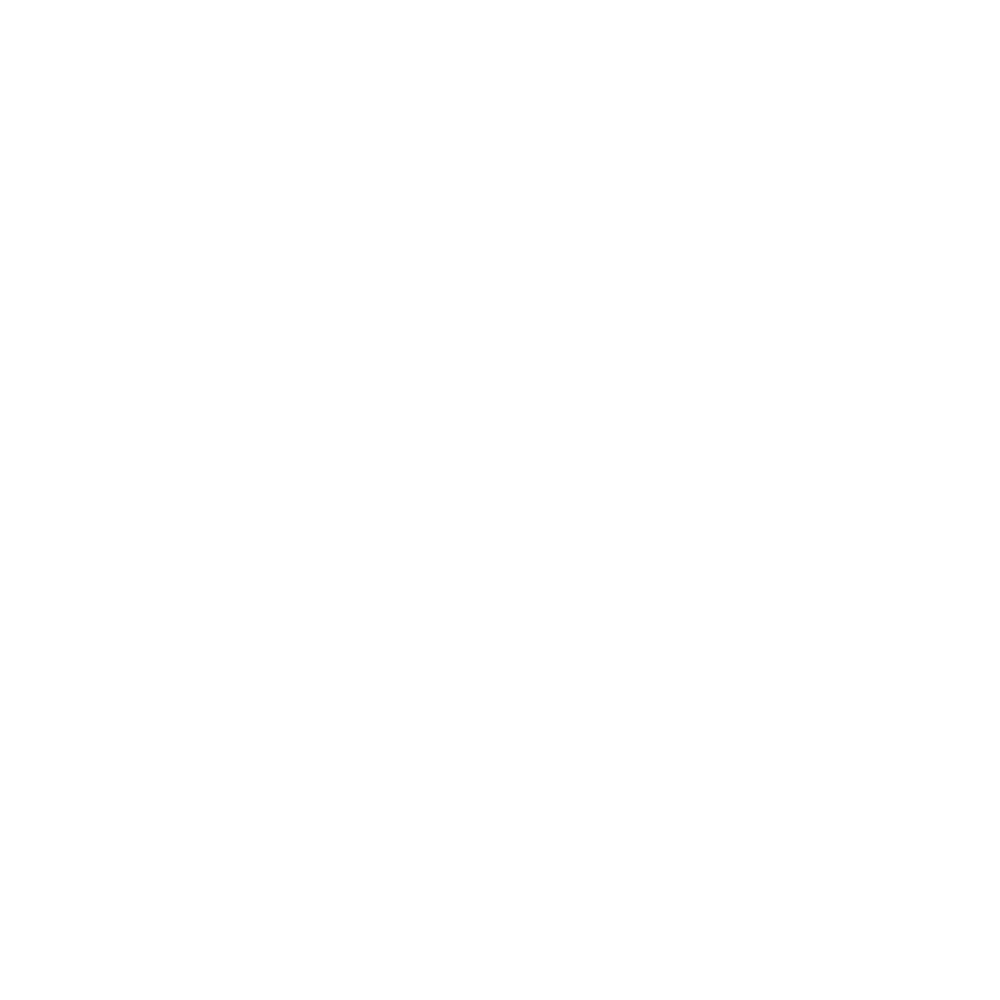

<IPython.core.display.Javascript object>


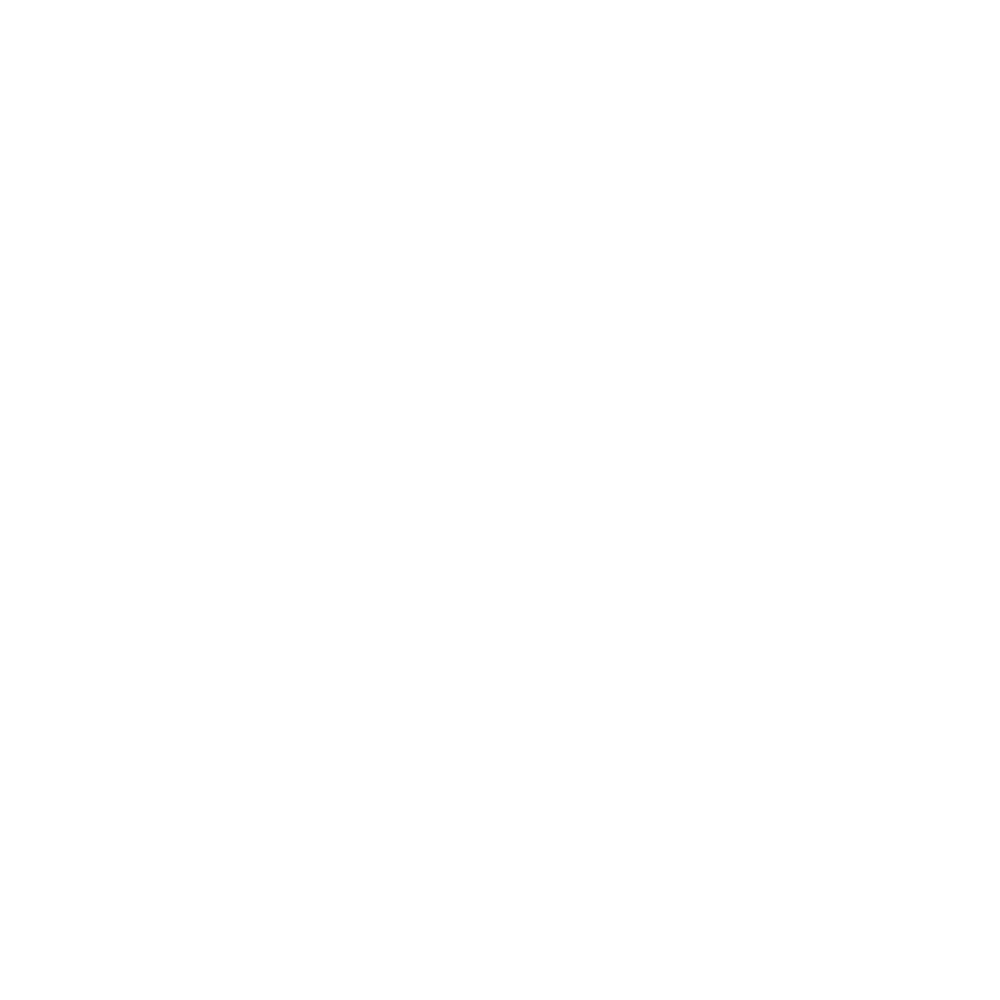

<IPython.core.display.Javascript object>


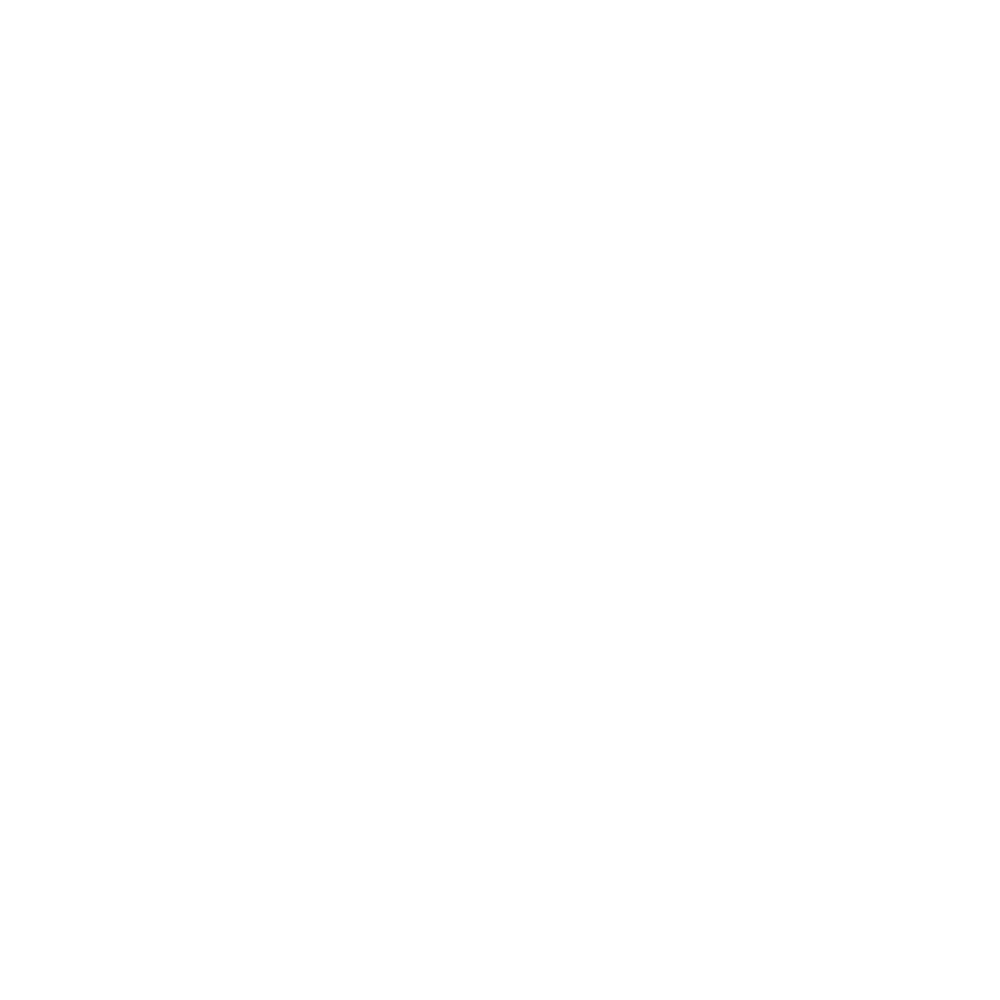

<IPython.core.display.Javascript object>


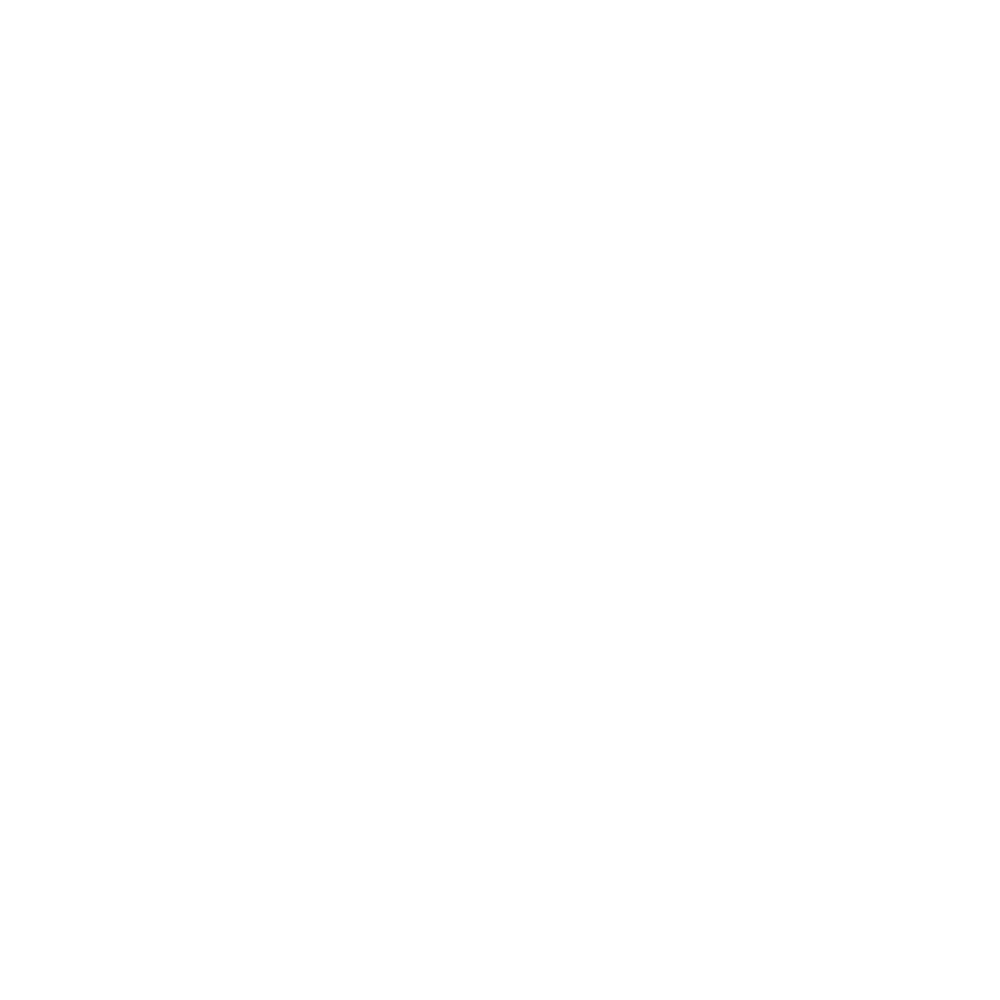

<IPython.core.display.Javascript object>


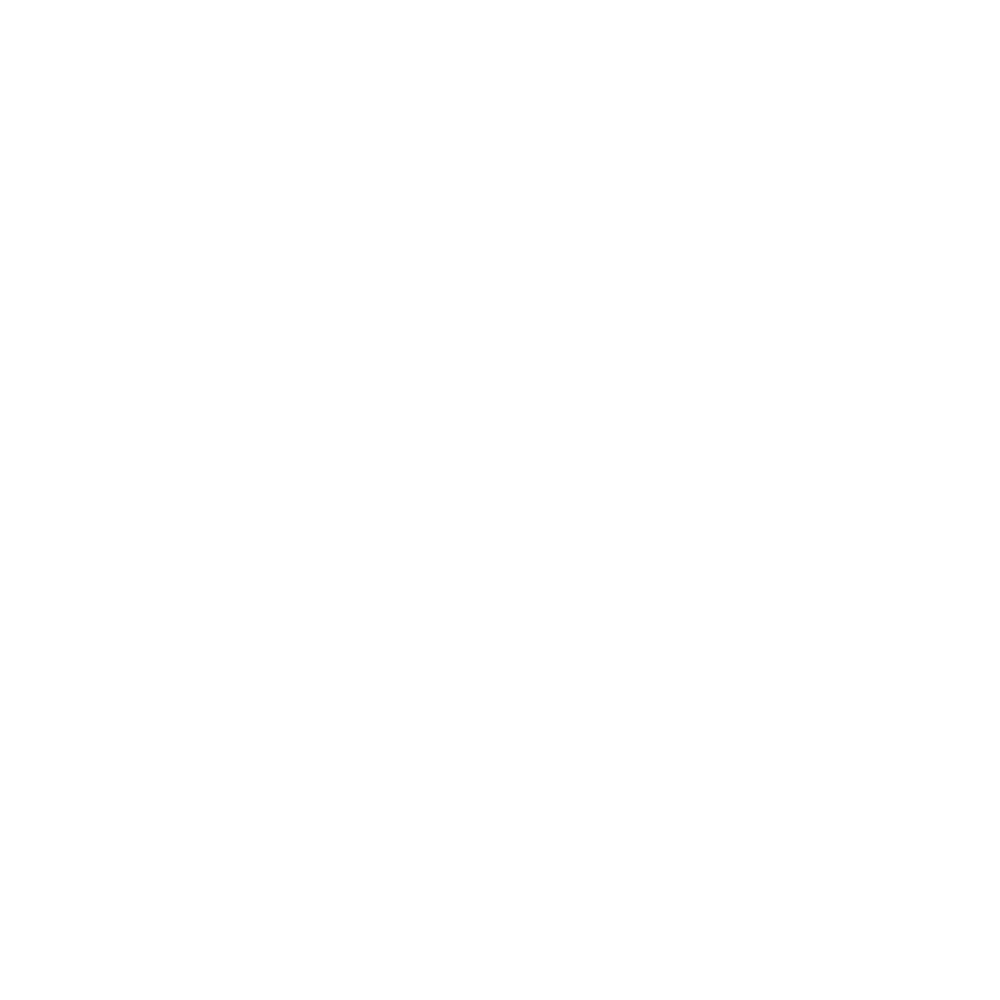

<IPython.core.display.Javascript object>


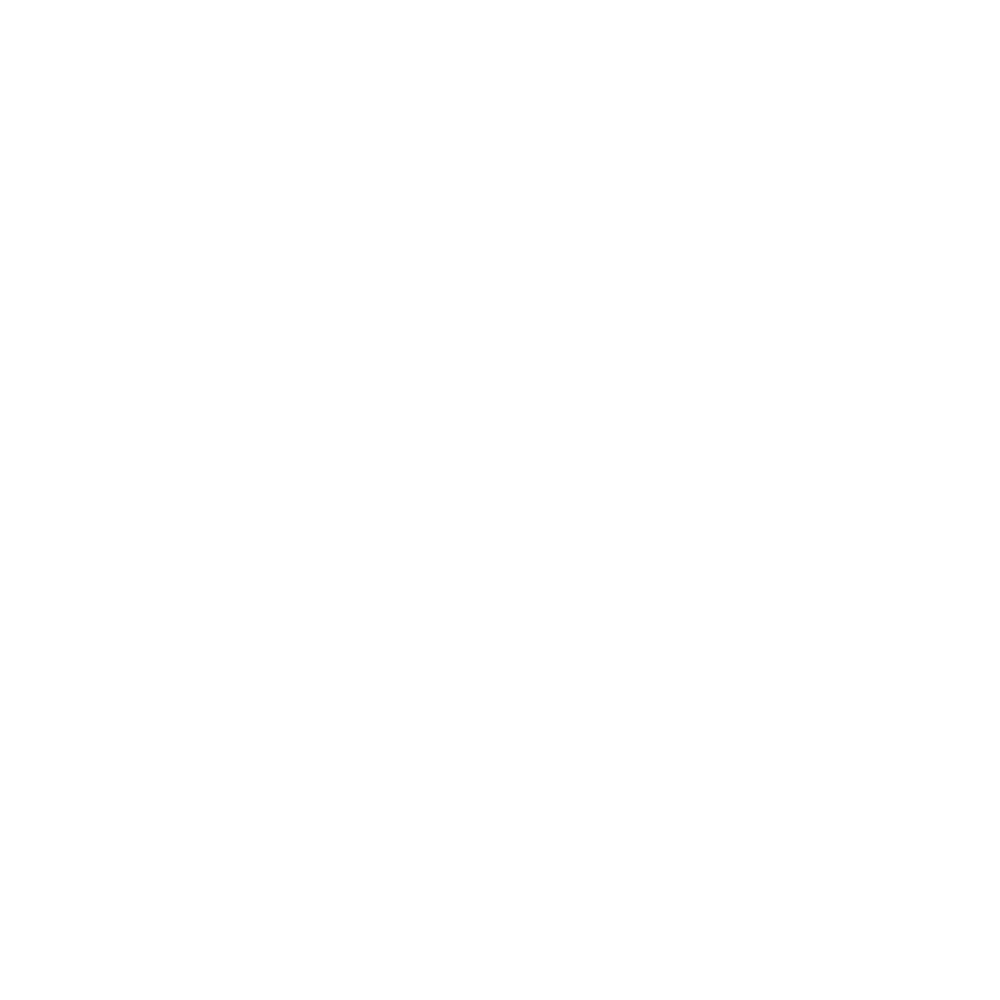

<IPython.core.display.Javascript object>


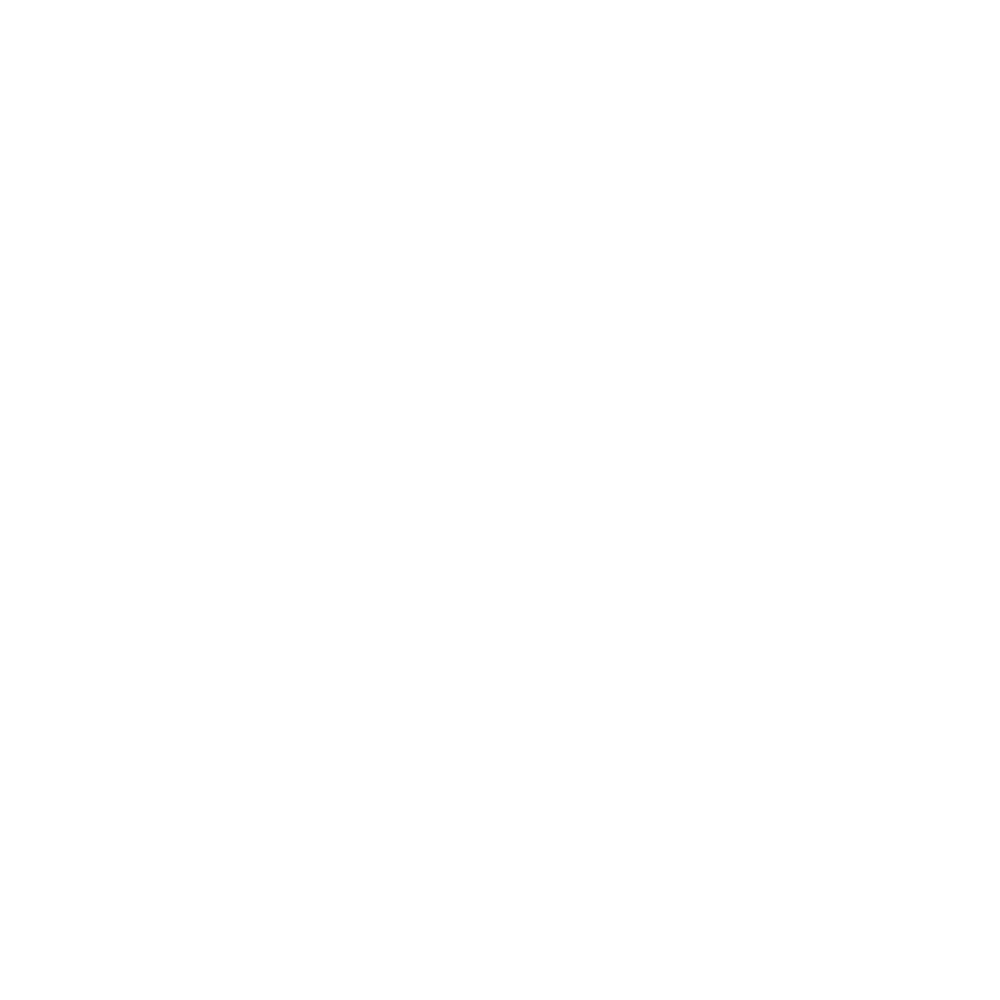

<IPython.core.display.Javascript object>


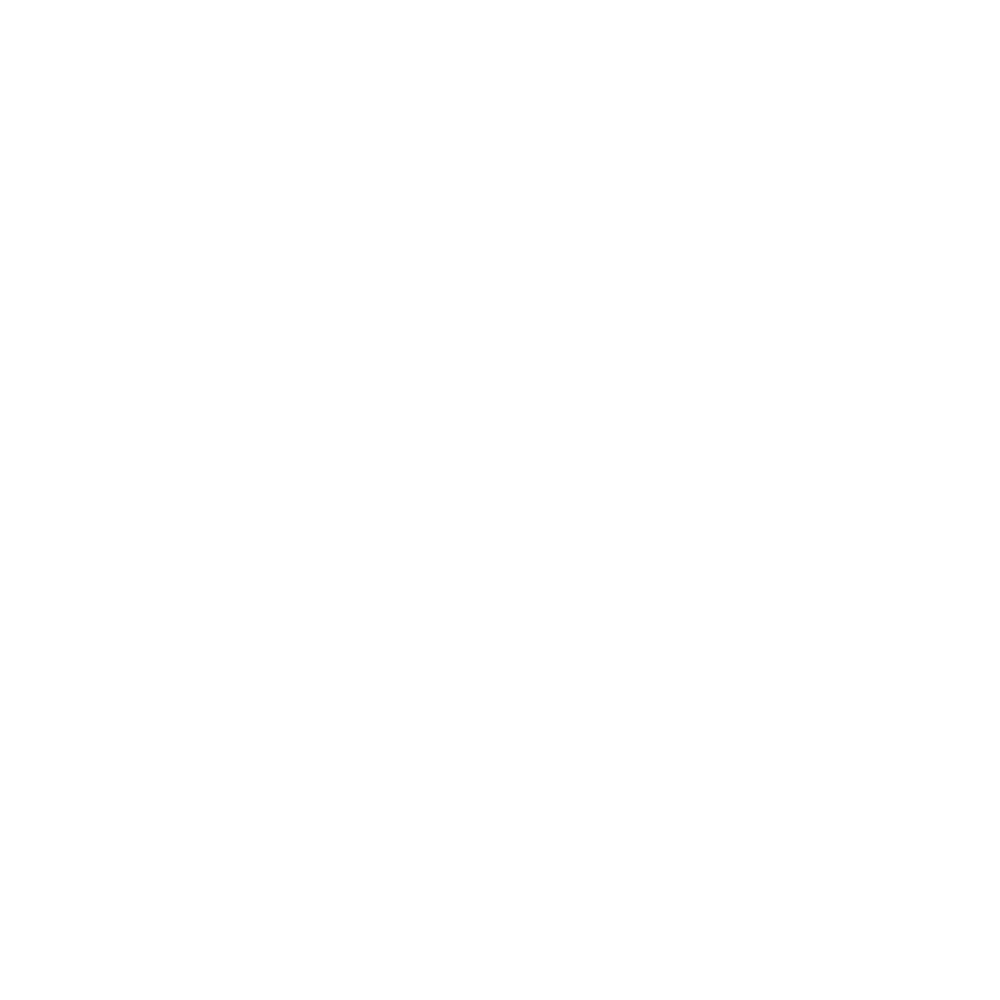

<IPython.core.display.Javascript object>


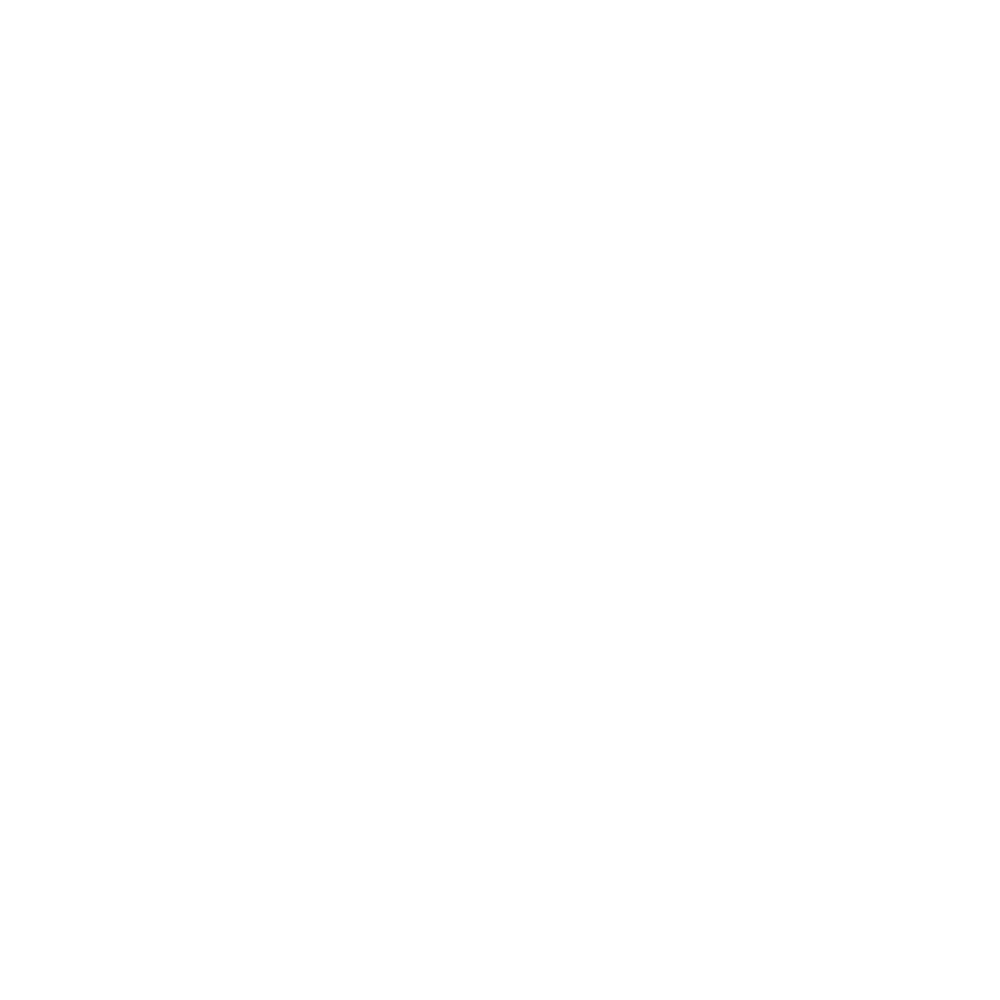

<IPython.core.display.Javascript object>


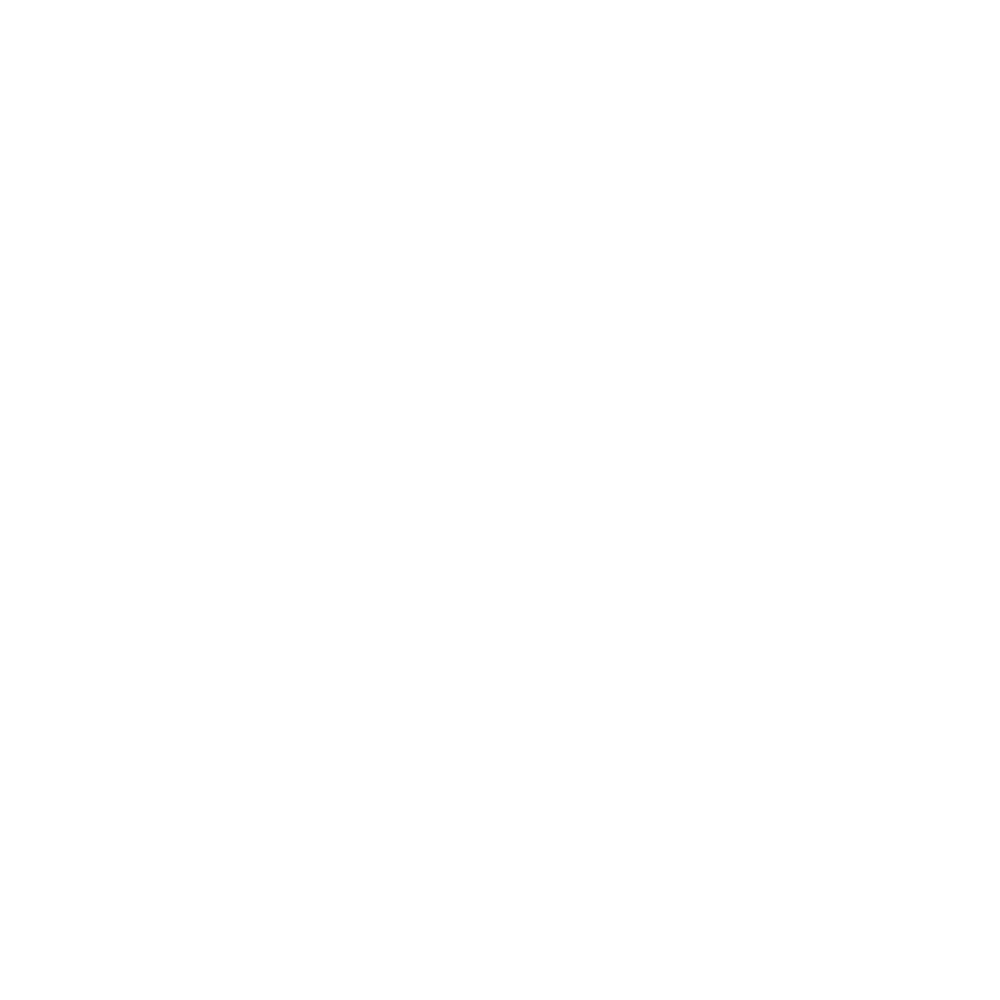

<IPython.core.display.Javascript object>


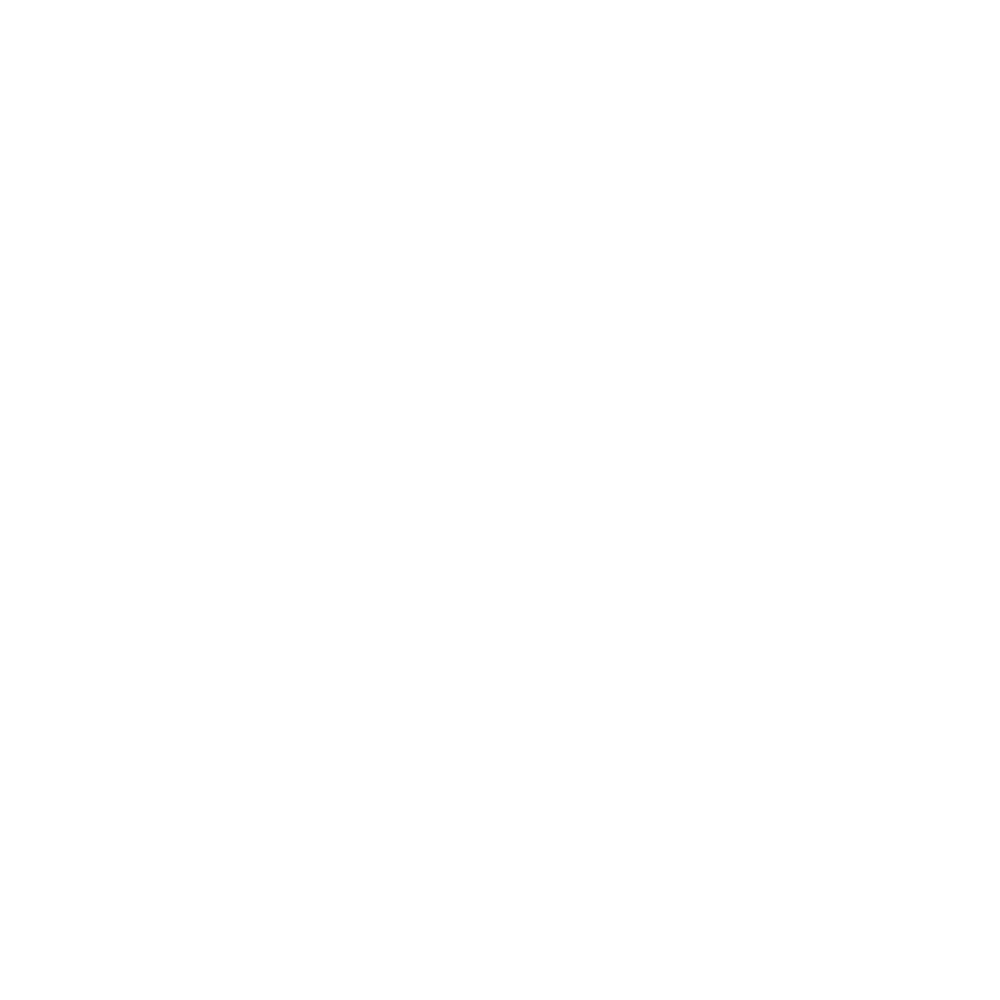

<IPython.core.display.Javascript object>


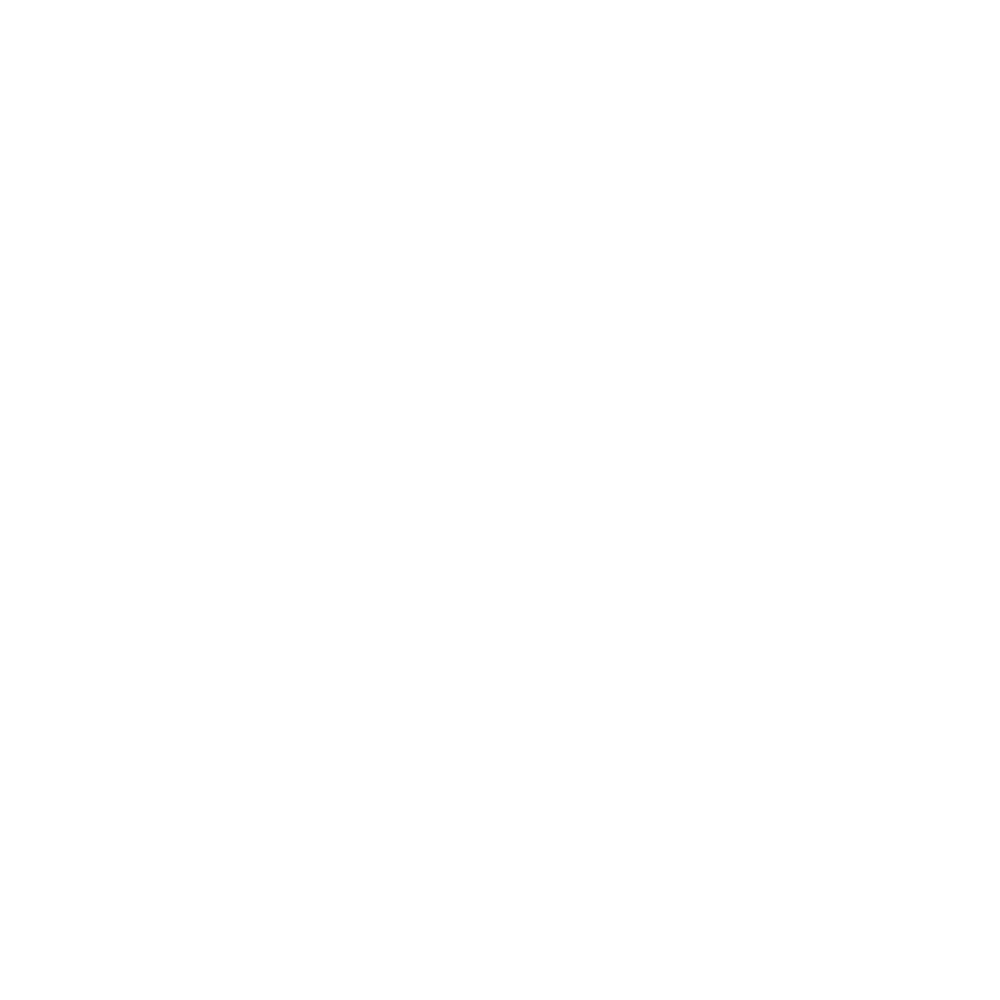

<IPython.core.display.Javascript object>


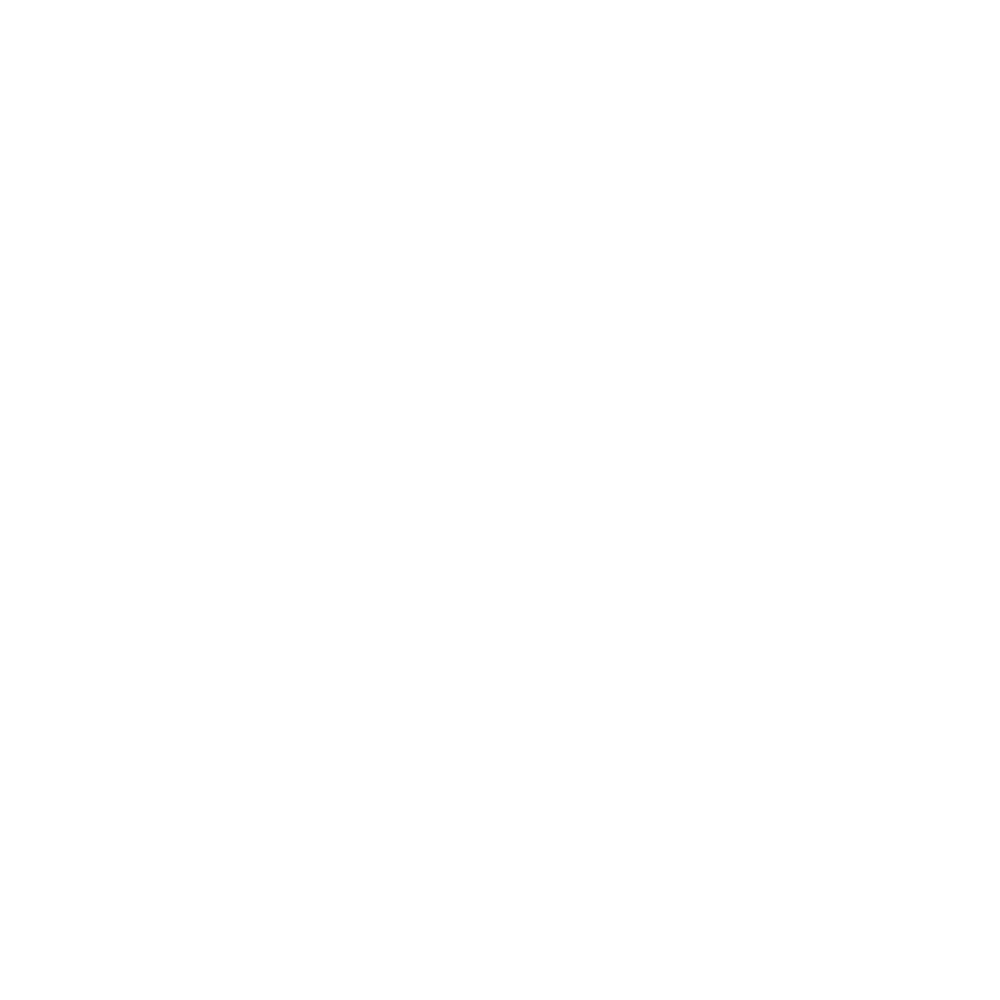

<IPython.core.display.Javascript object>


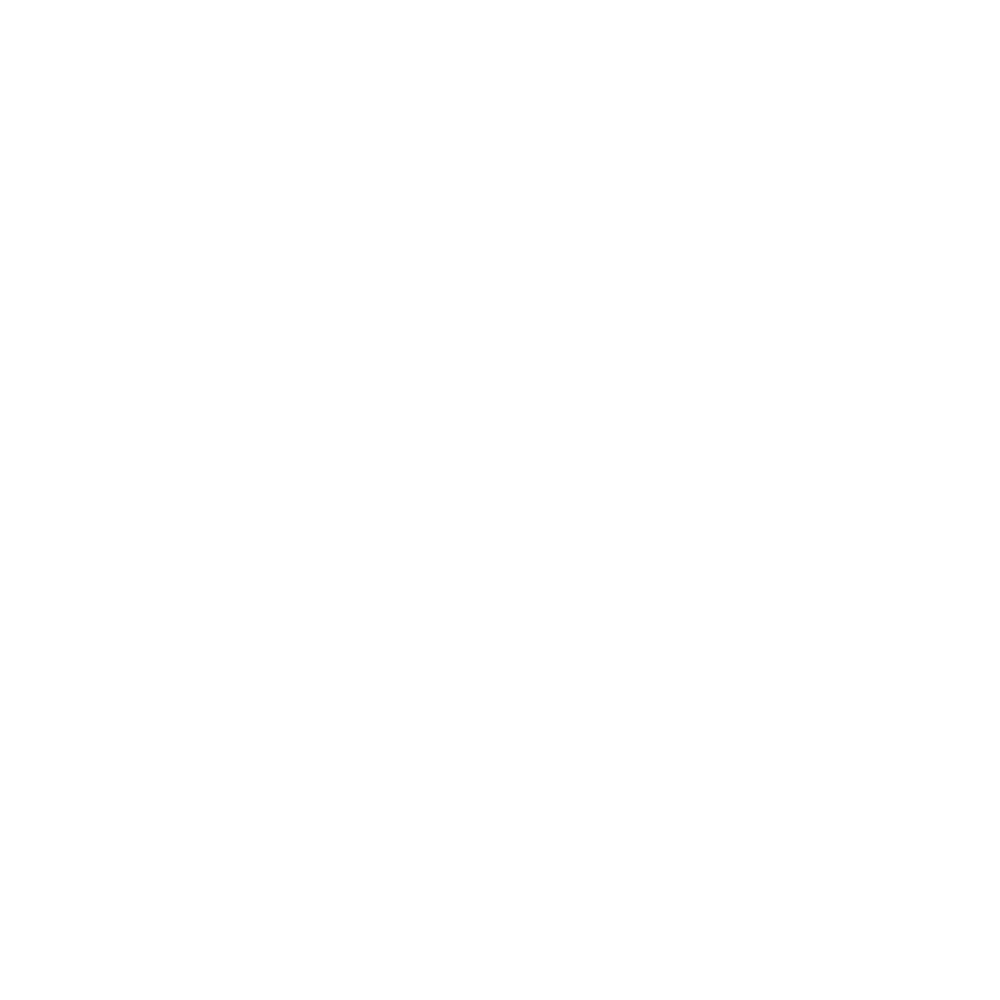

<IPython.core.display.Javascript object>


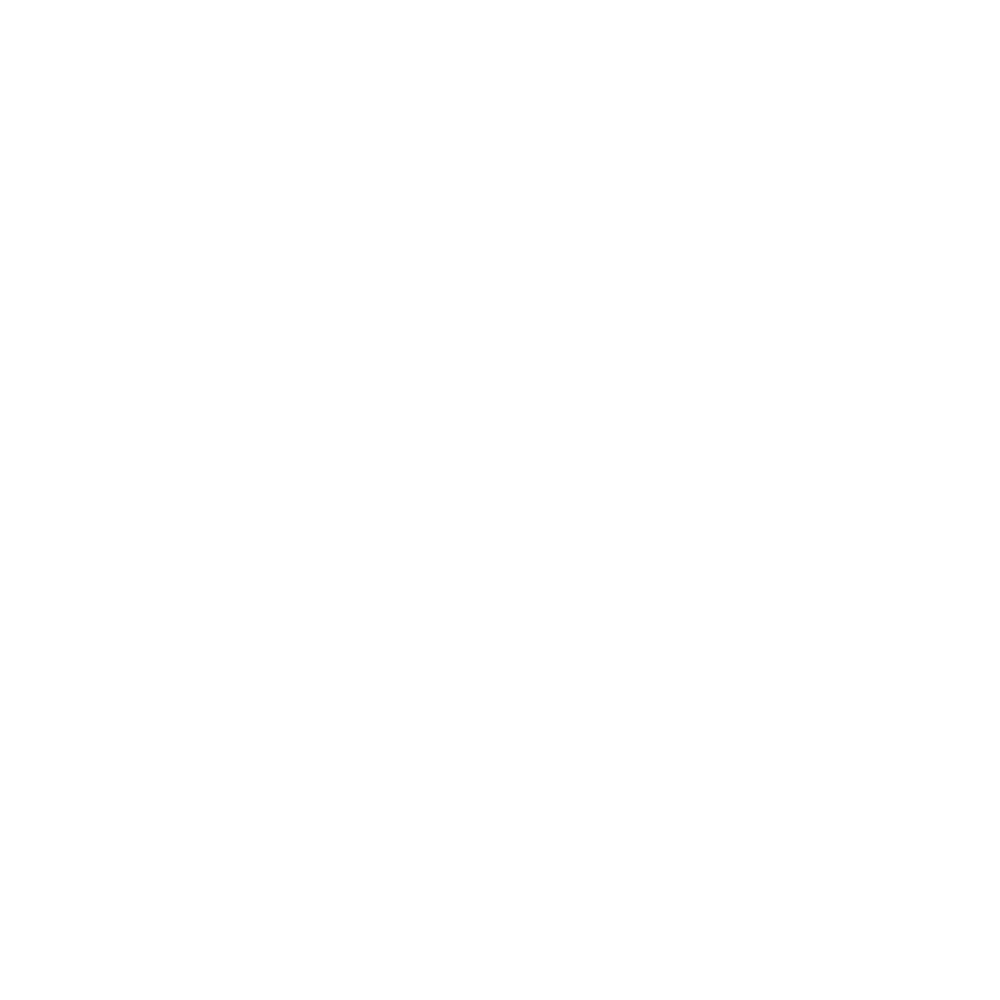

<IPython.core.display.Javascript object>


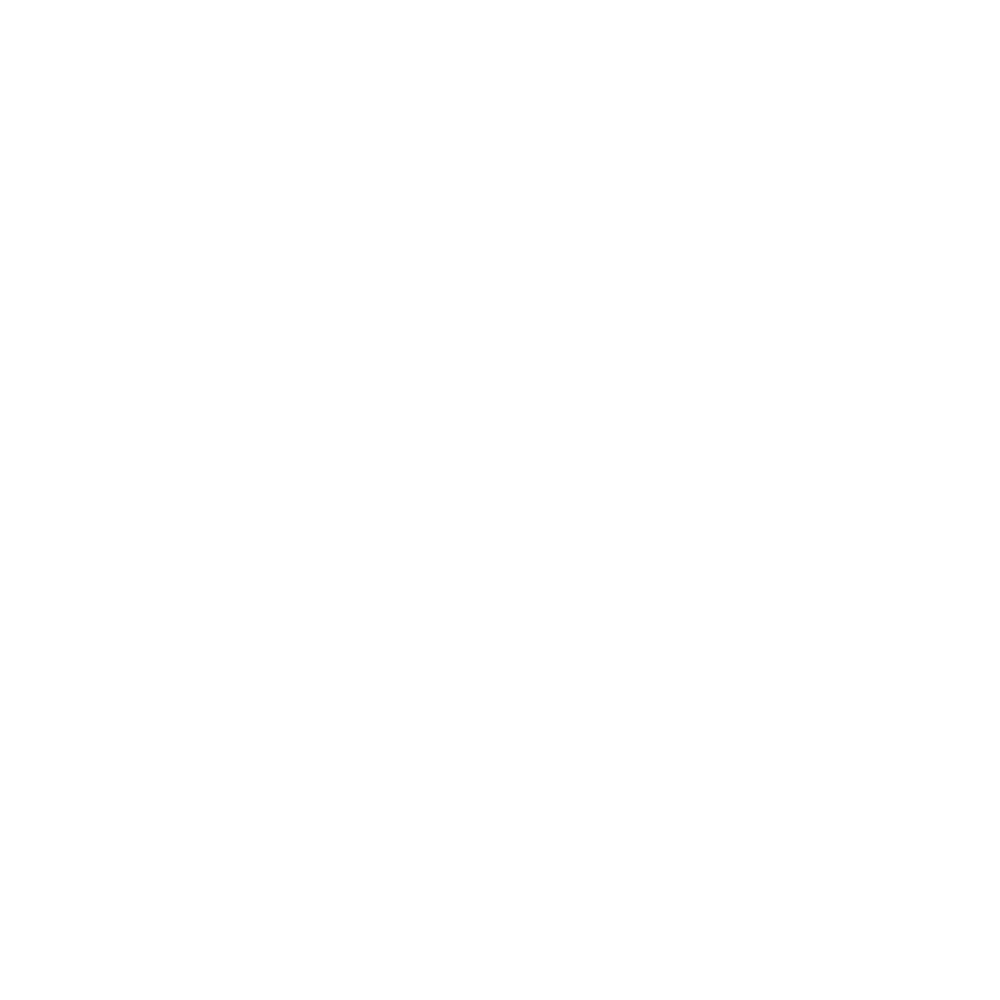

<IPython.core.display.Javascript object>


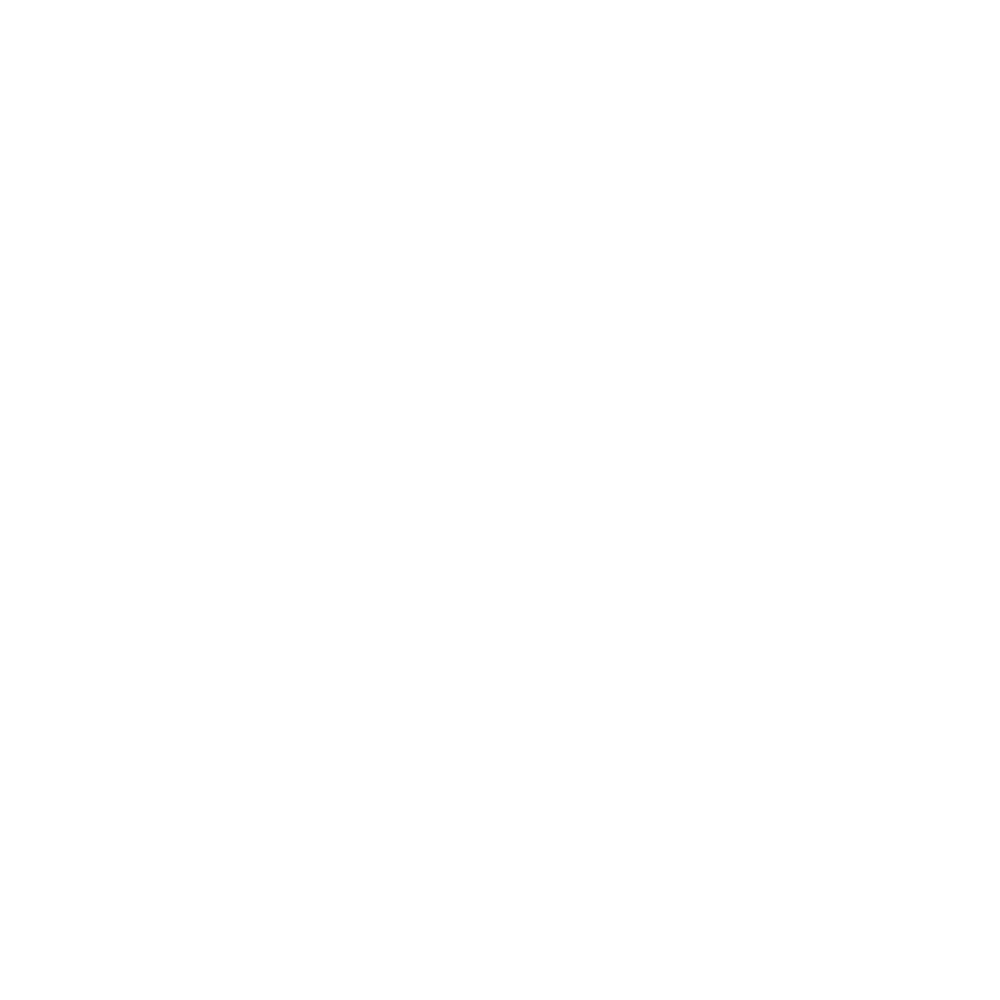

<IPython.core.display.Javascript object>


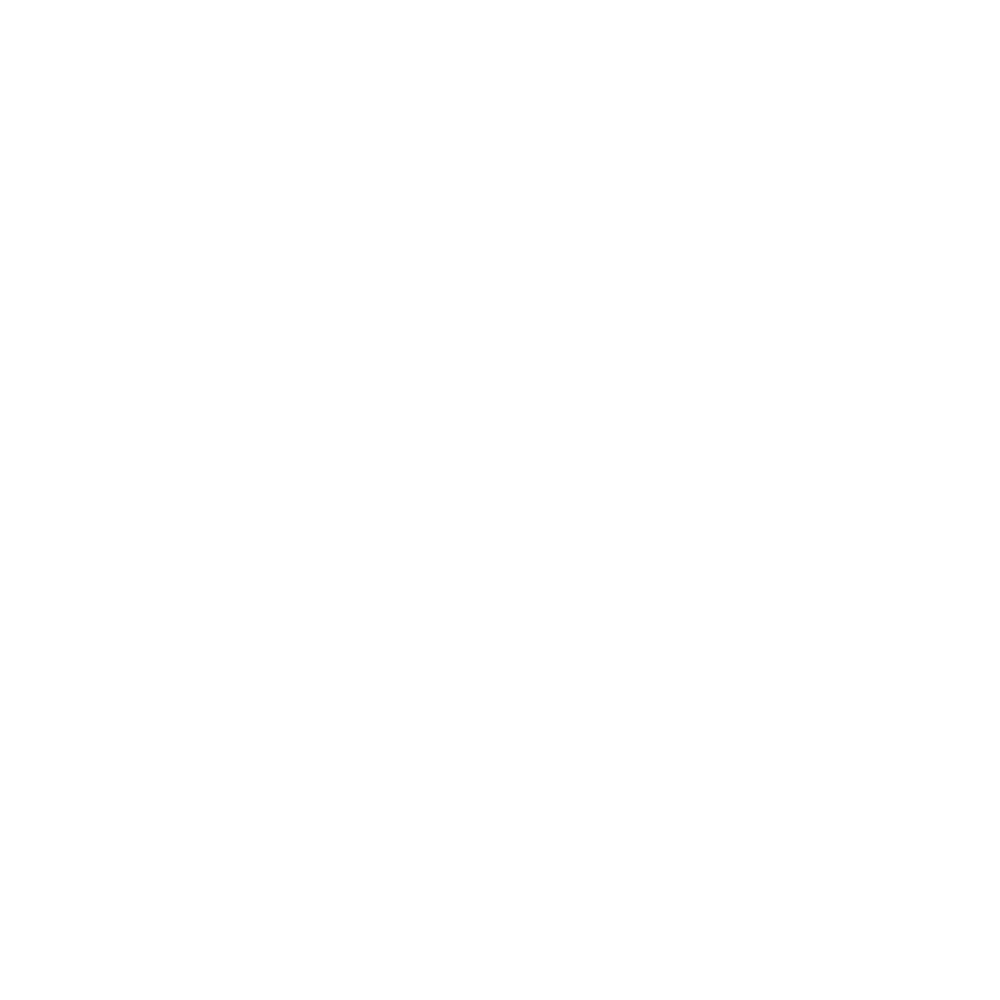

<IPython.core.display.Javascript object>


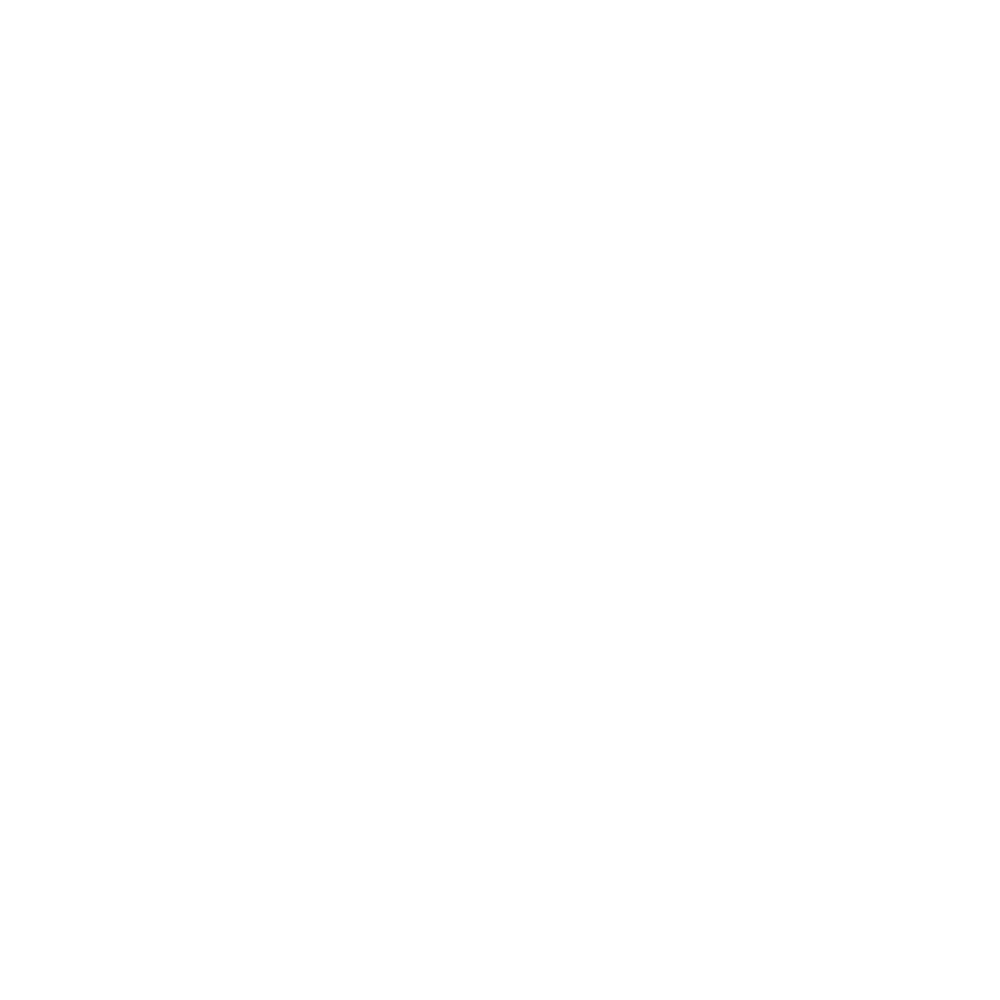

<IPython.core.display.Javascript object>


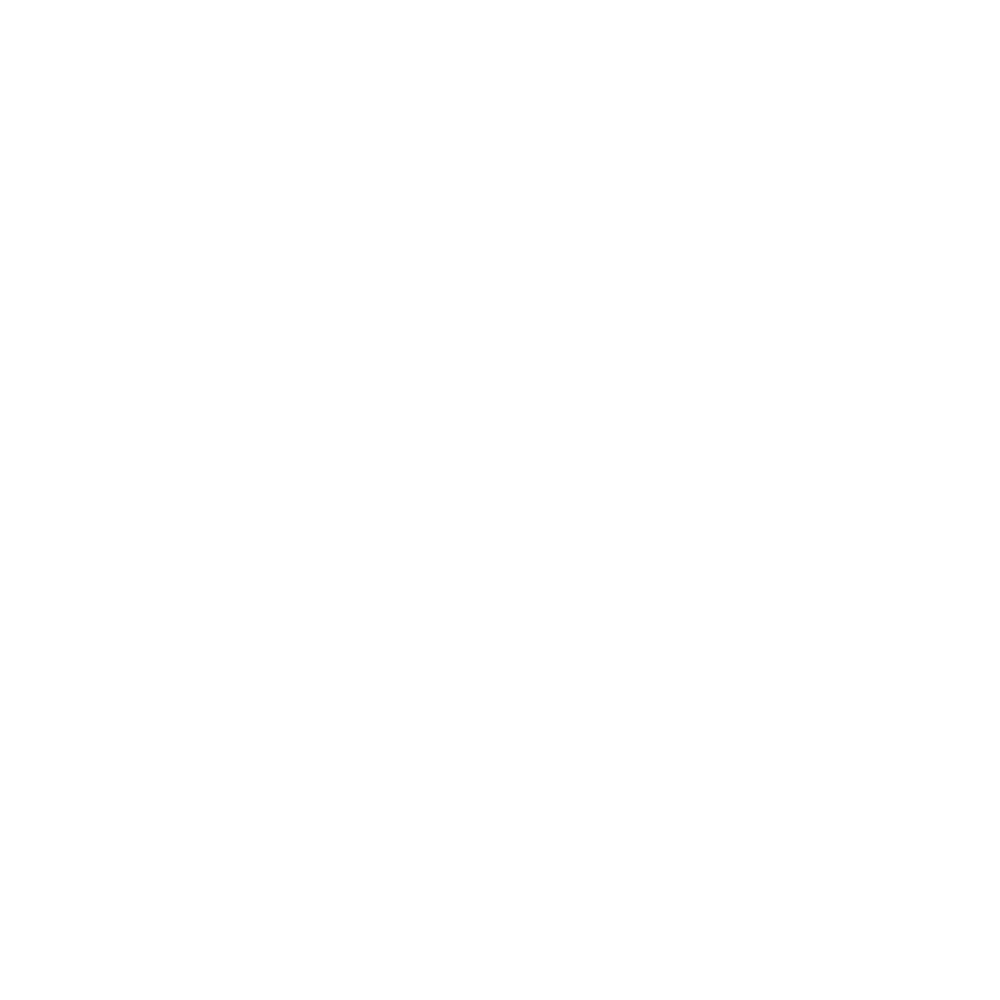

<IPython.core.display.Javascript object>


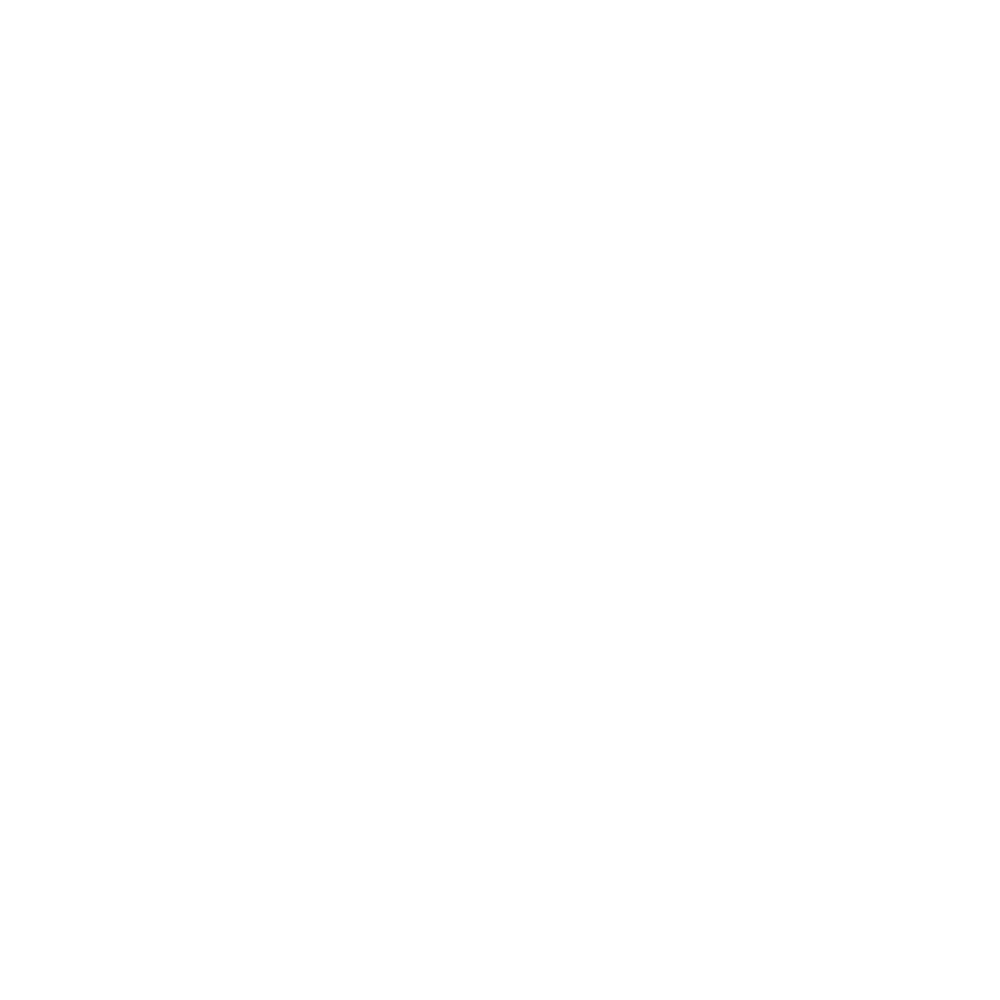

<IPython.core.display.Javascript object>


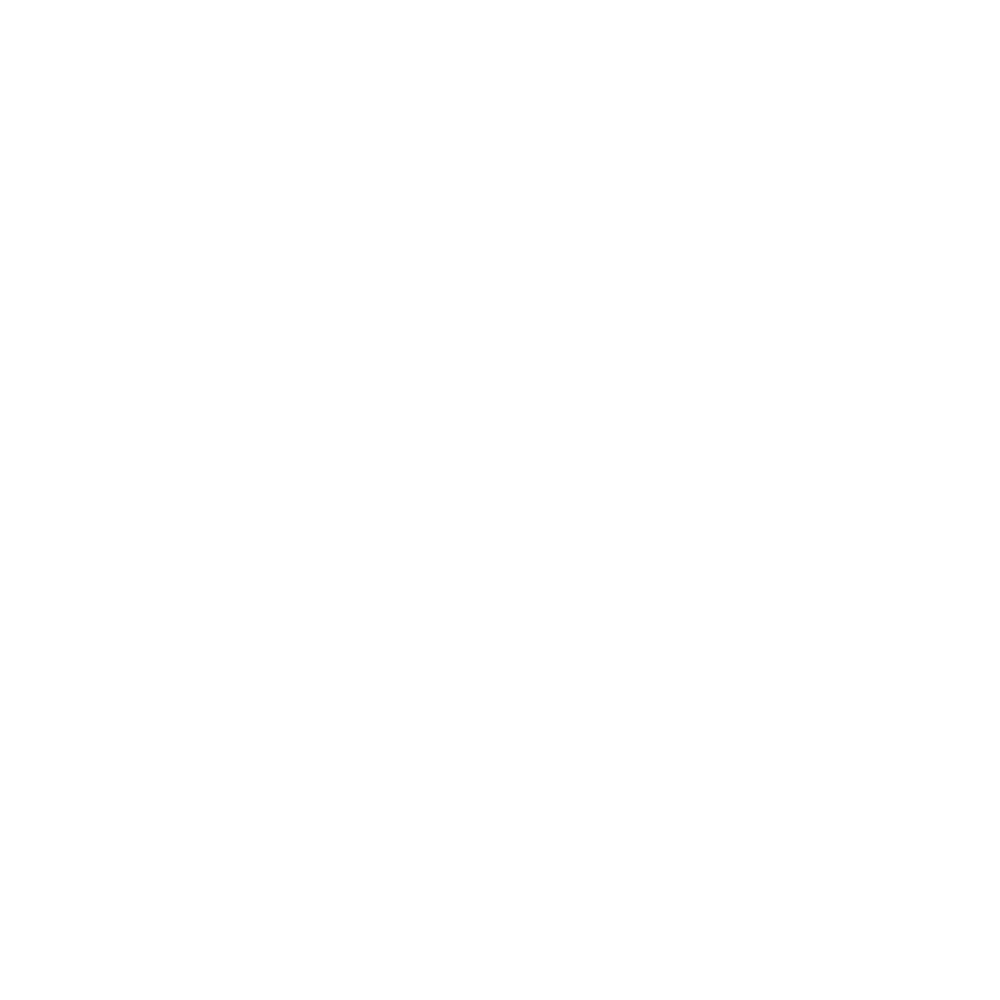

<IPython.core.display.Javascript object>


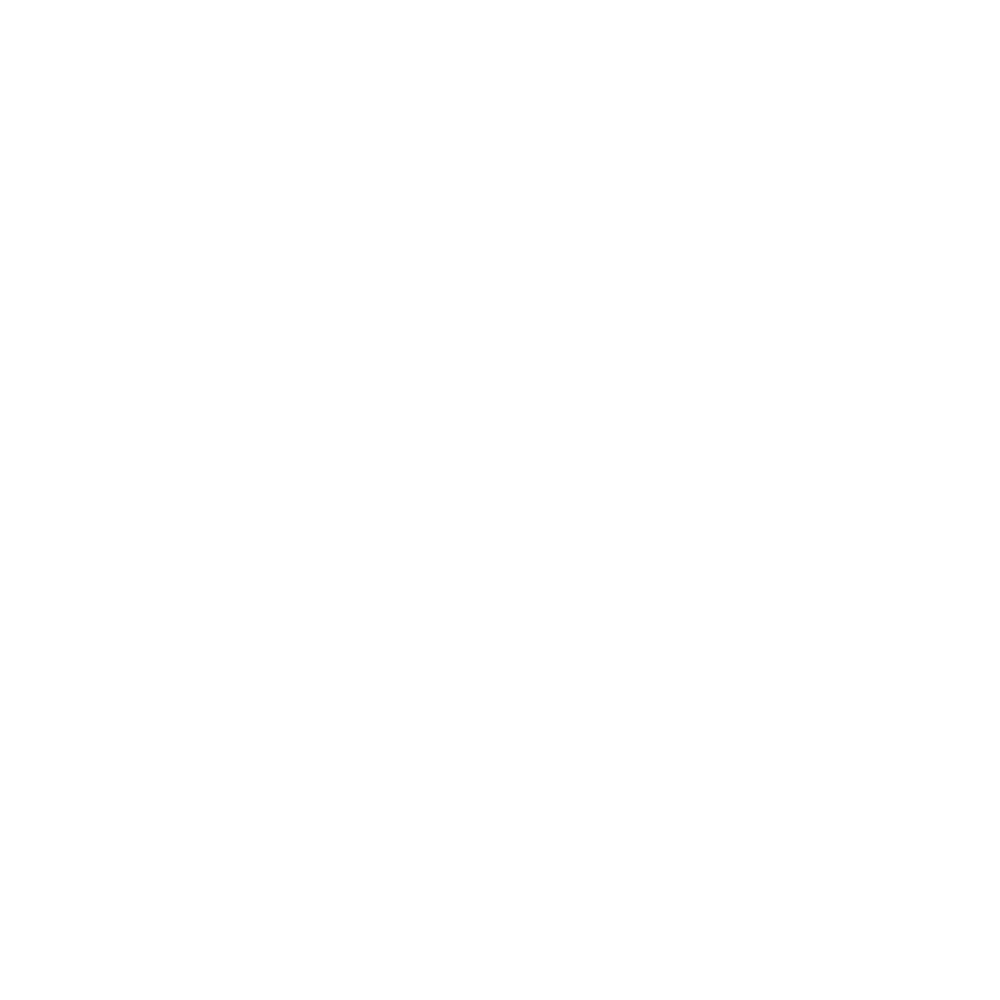

<IPython.core.display.Javascript object>


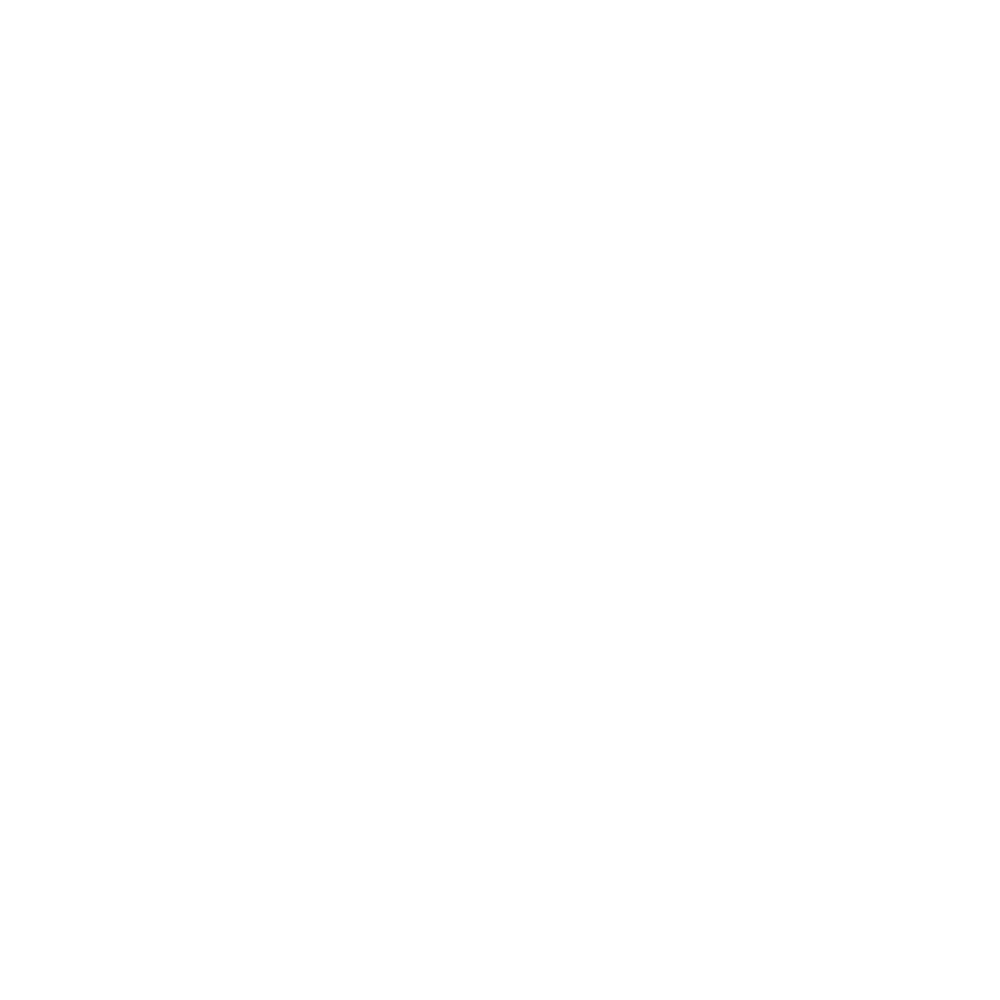

<IPython.core.display.Javascript object>


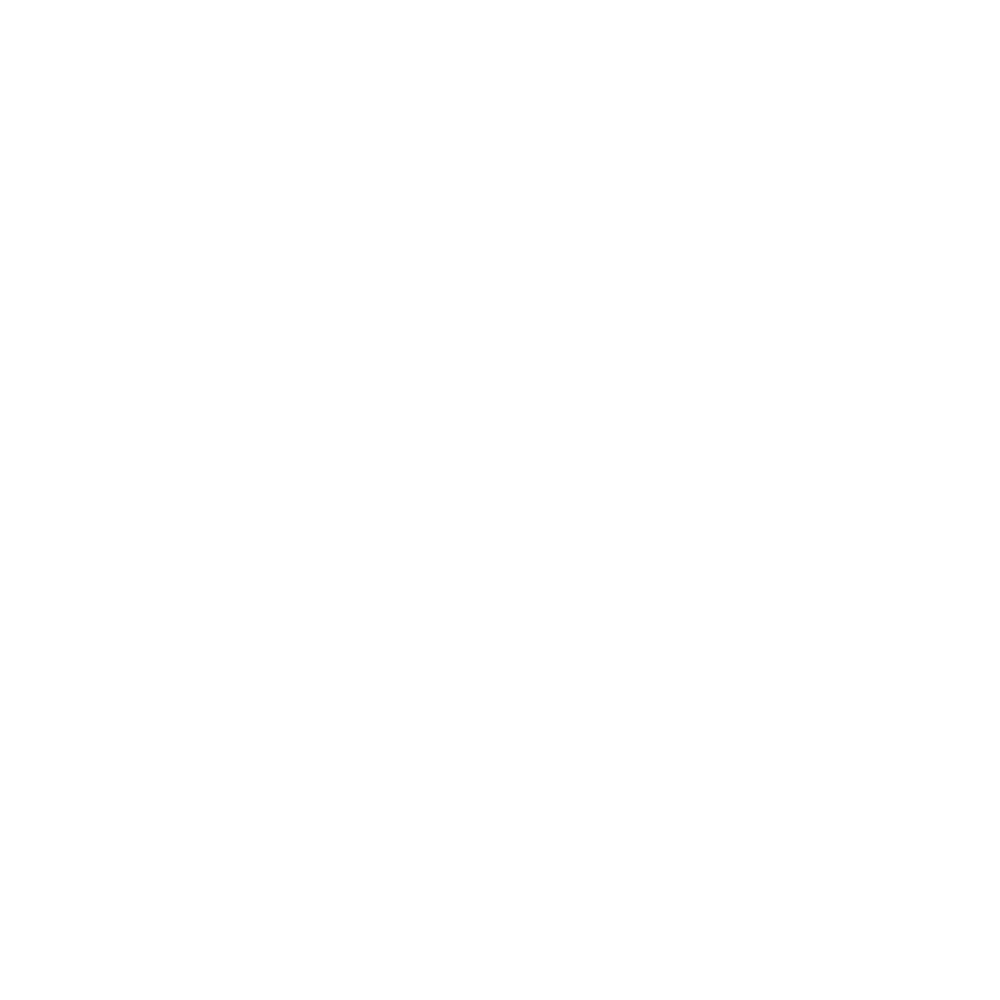

<IPython.core.display.Javascript object>


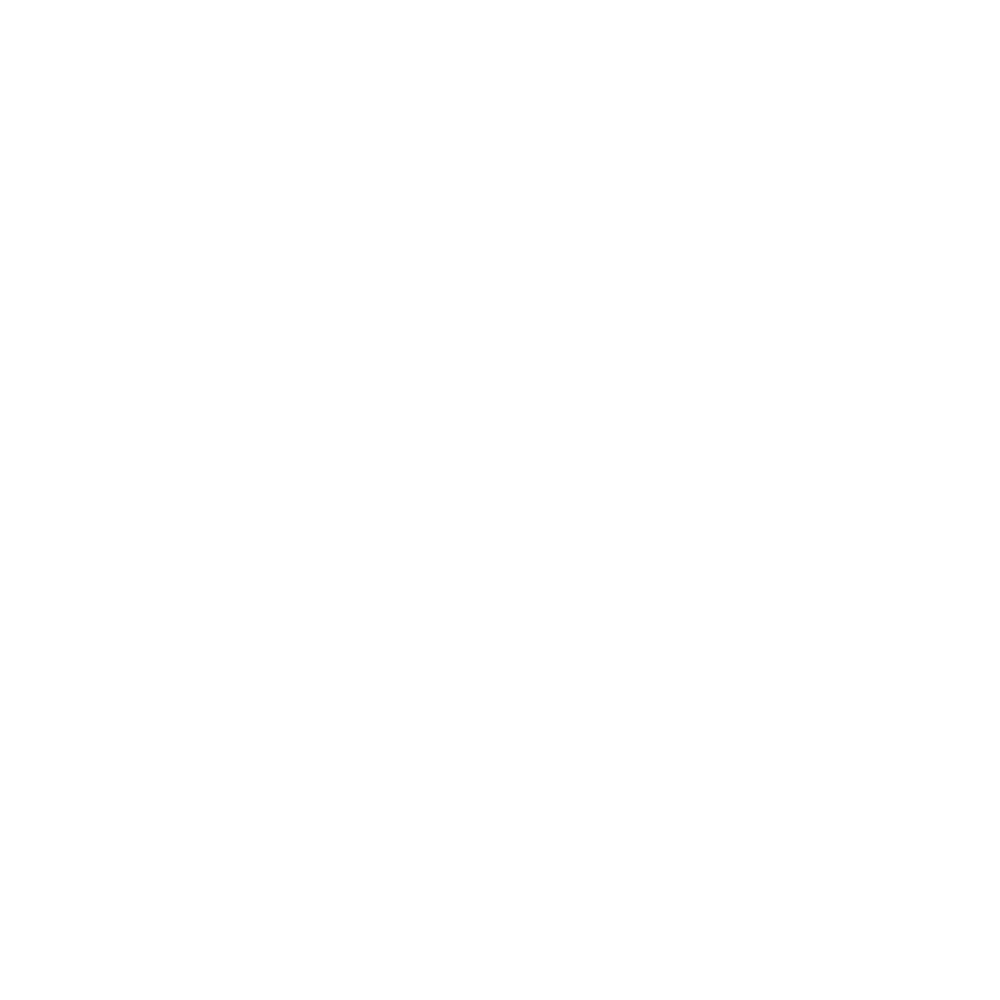

<IPython.core.display.Javascript object>


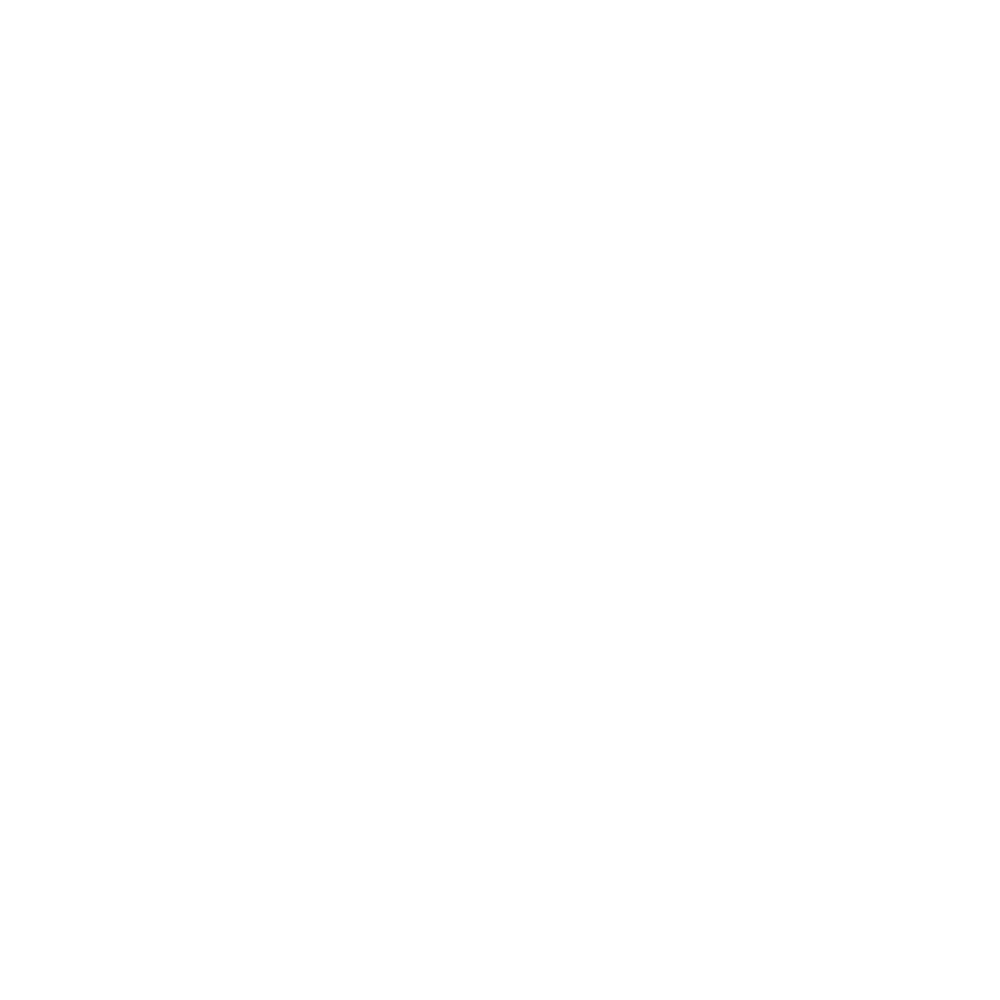

<IPython.core.display.Javascript object>


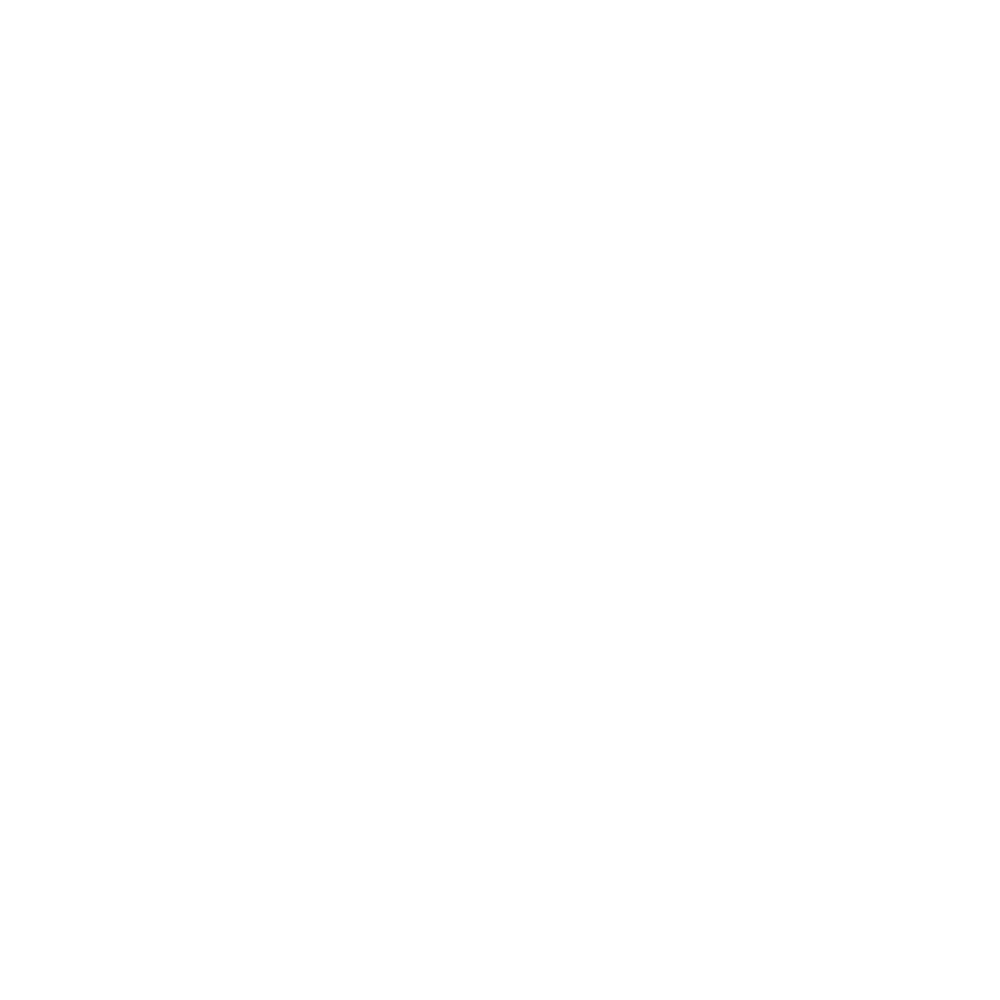

<IPython.core.display.Javascript object>


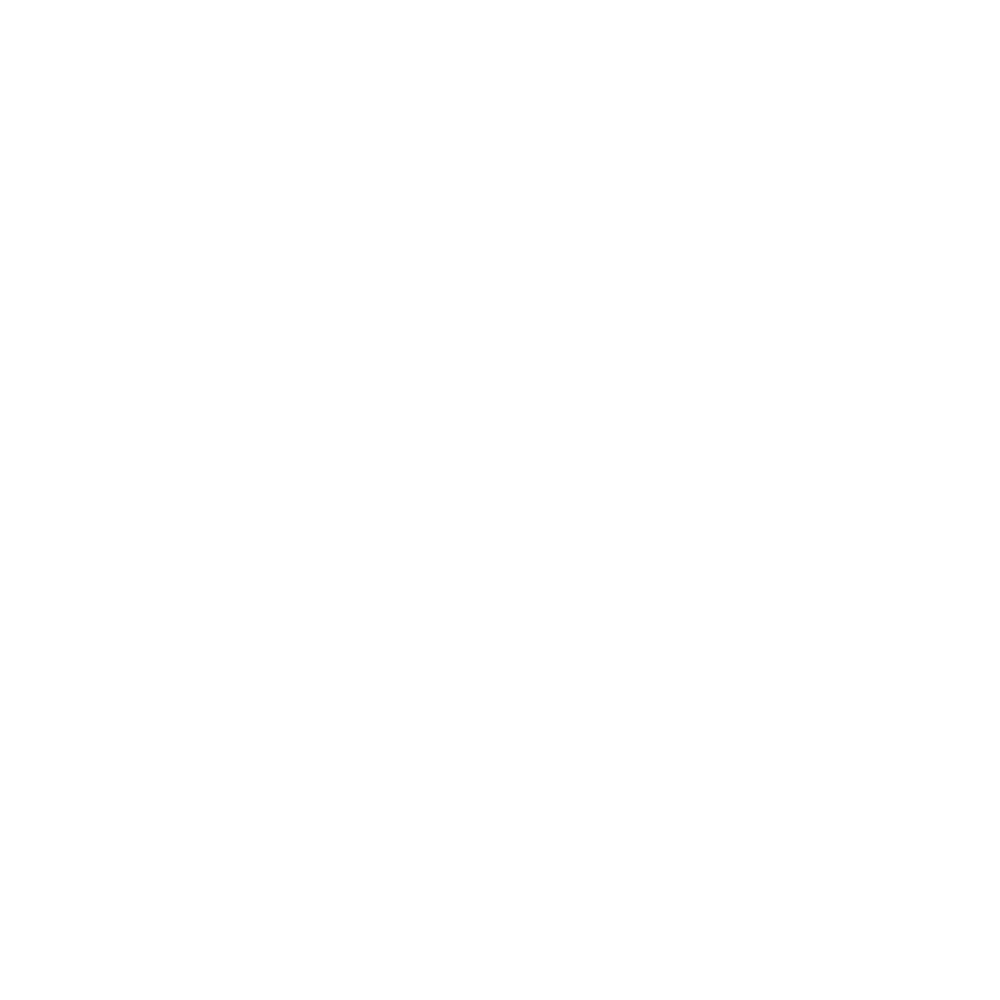

<IPython.core.display.Javascript object>


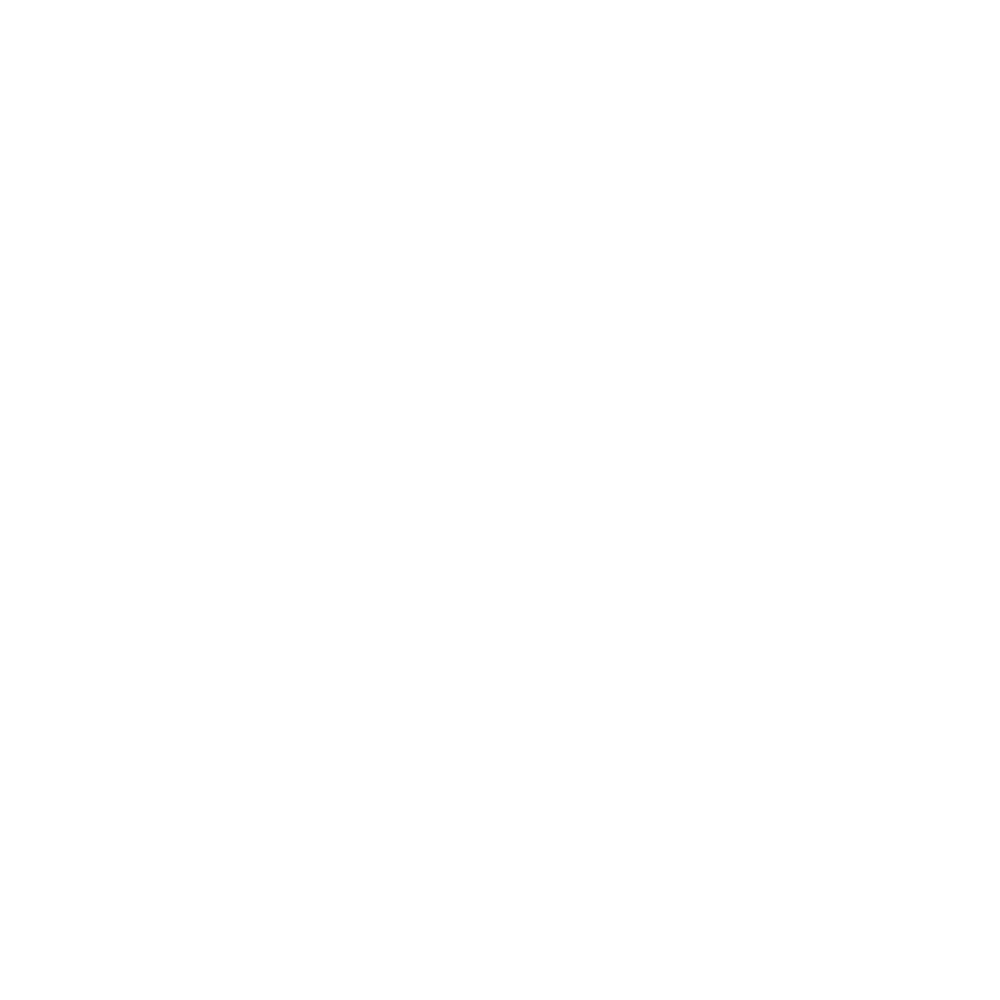

<IPython.core.display.Javascript object>


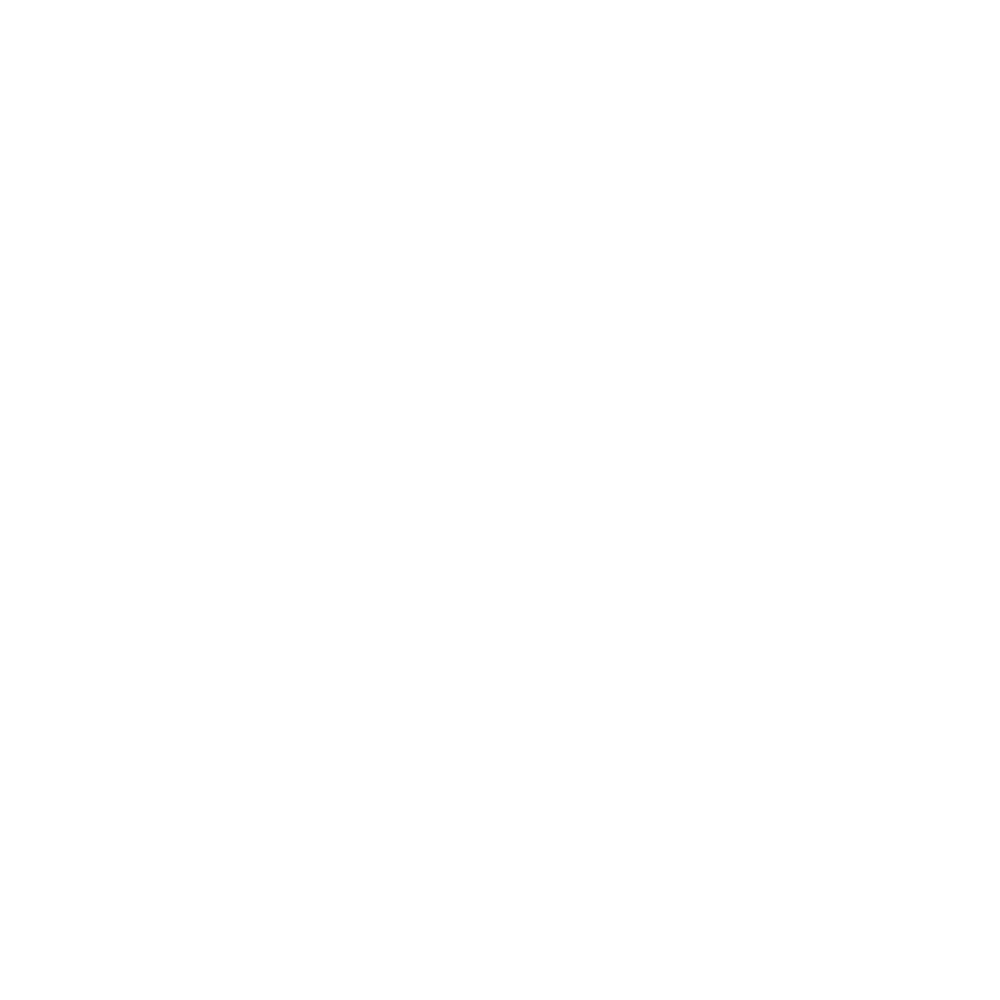

<IPython.core.display.Javascript object>


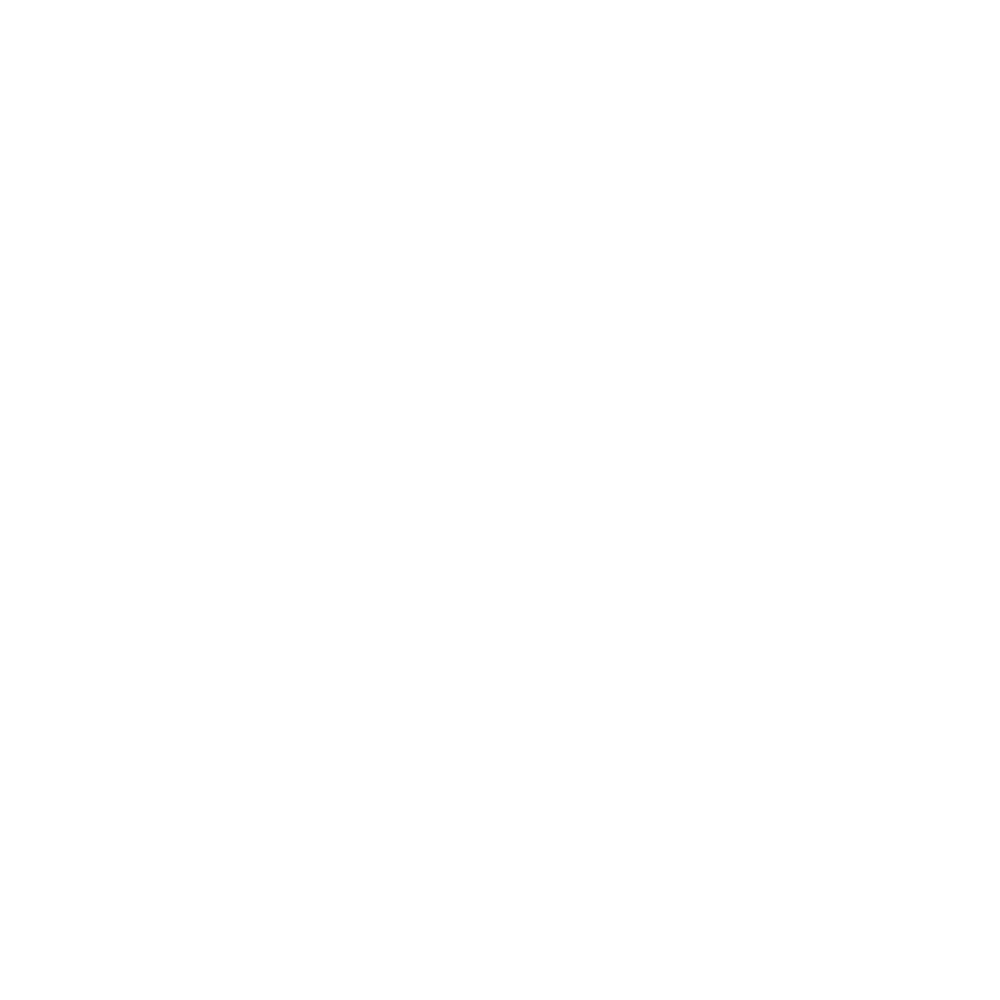

<IPython.core.display.Javascript object>


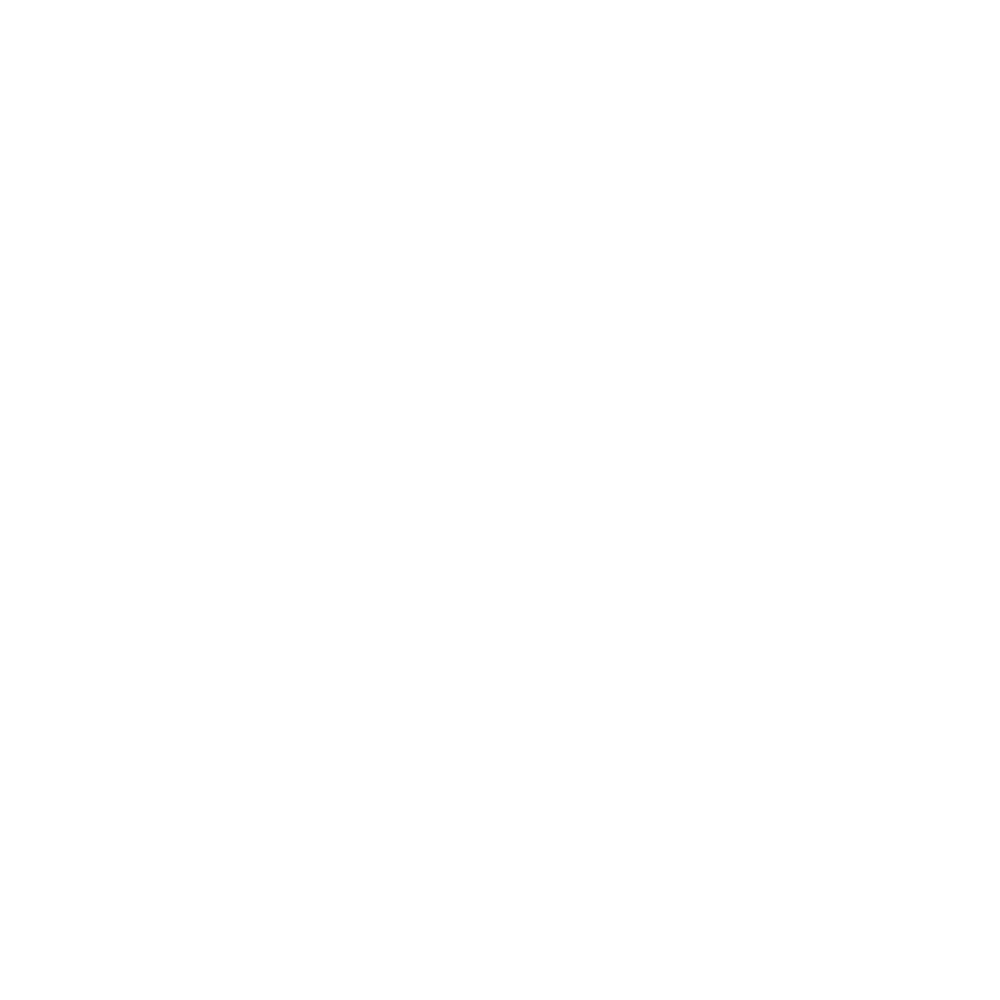

<IPython.core.display.Javascript object>


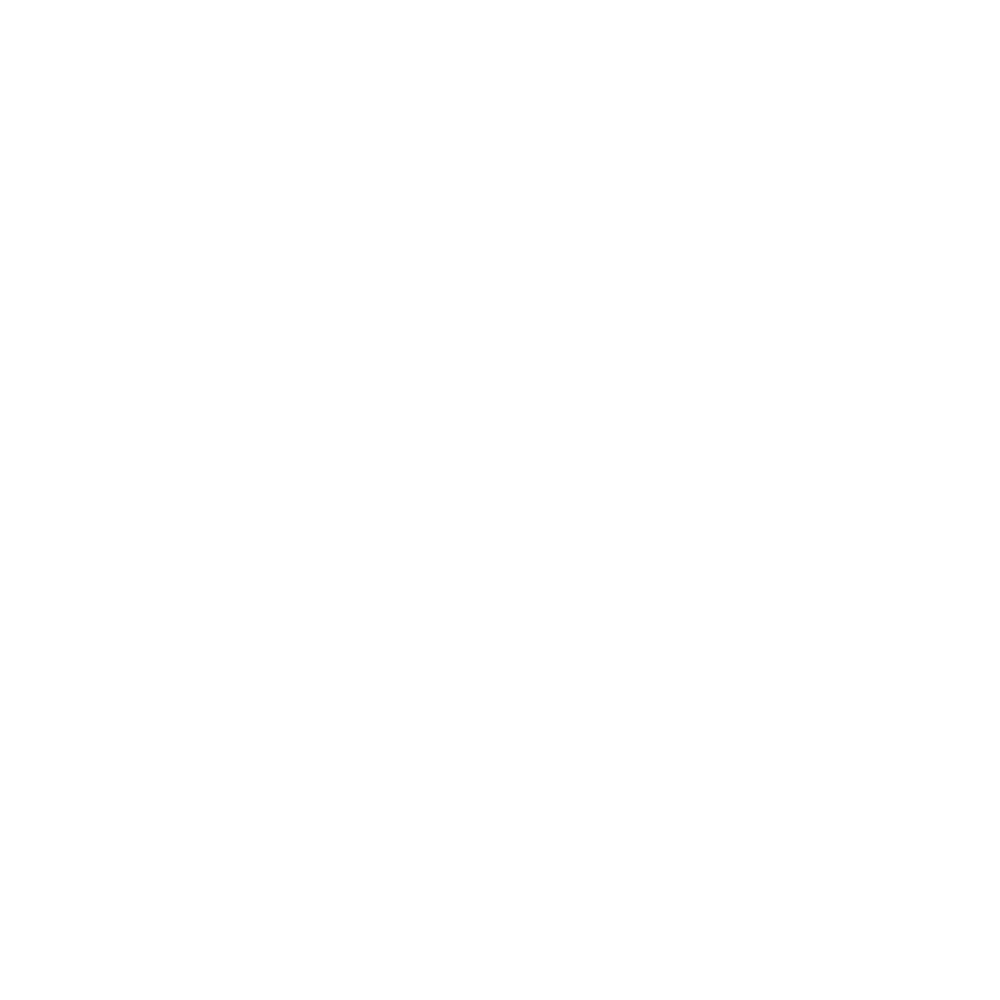

<IPython.core.display.Javascript object>


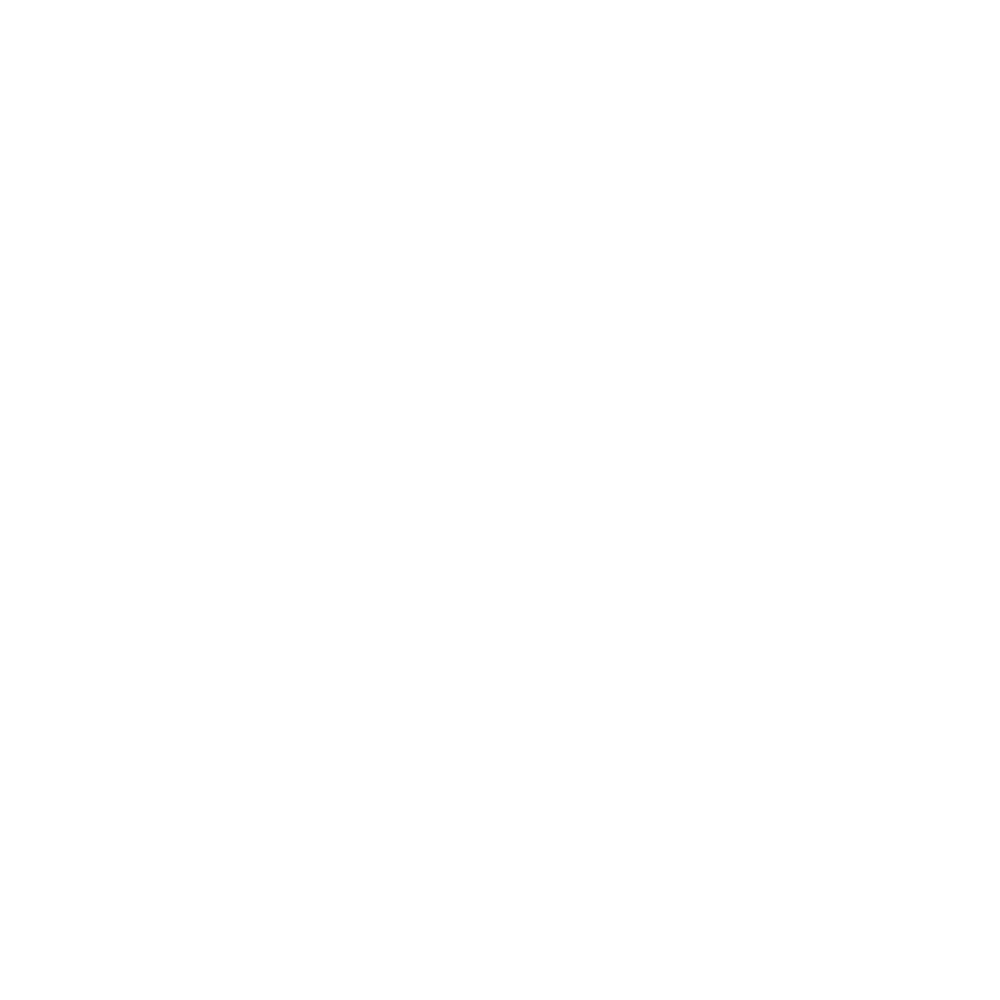

<IPython.core.display.Javascript object>


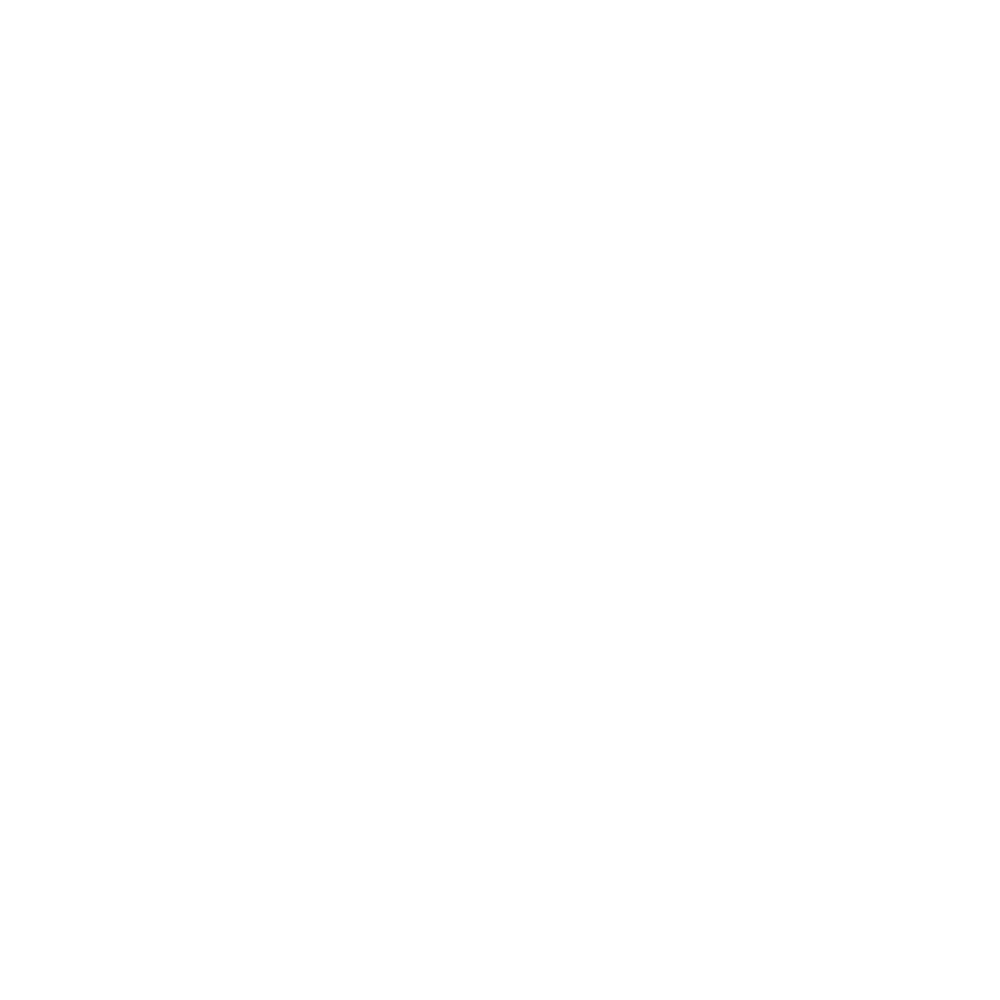

<IPython.core.display.Javascript object>


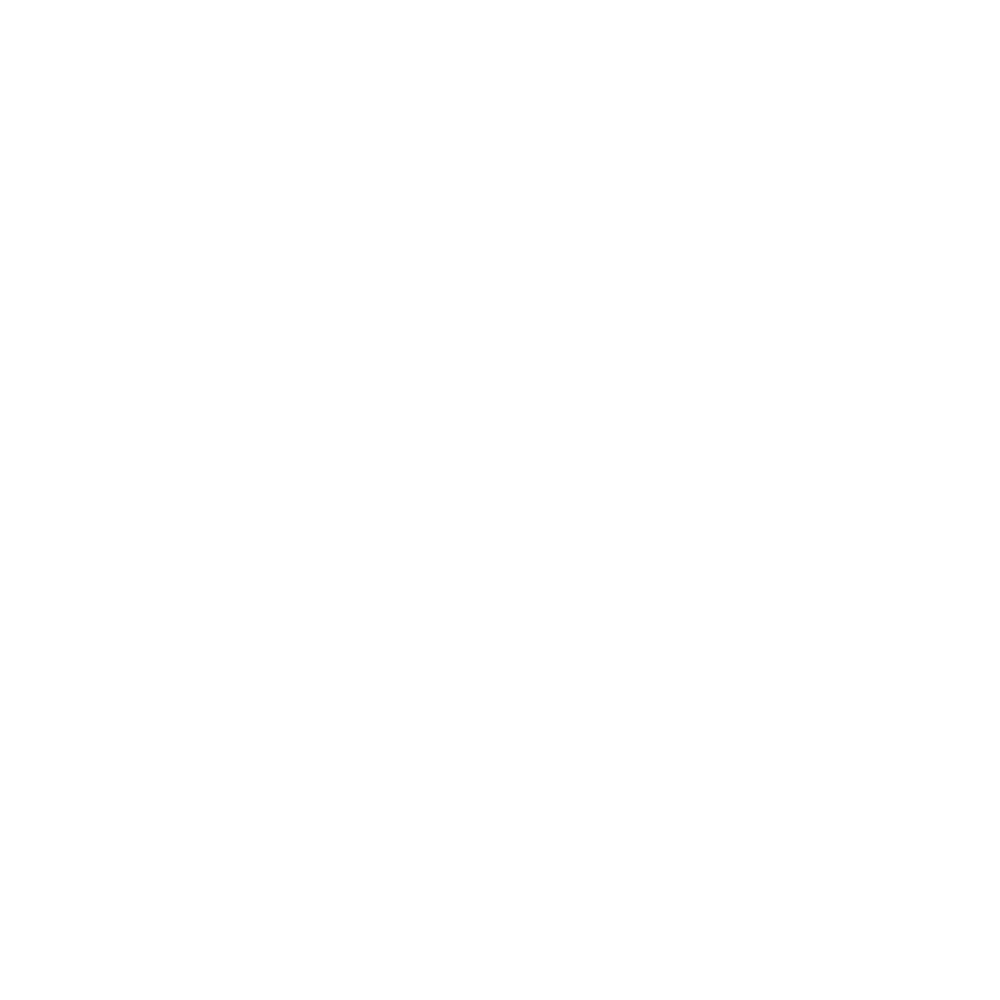

<IPython.core.display.Javascript object>


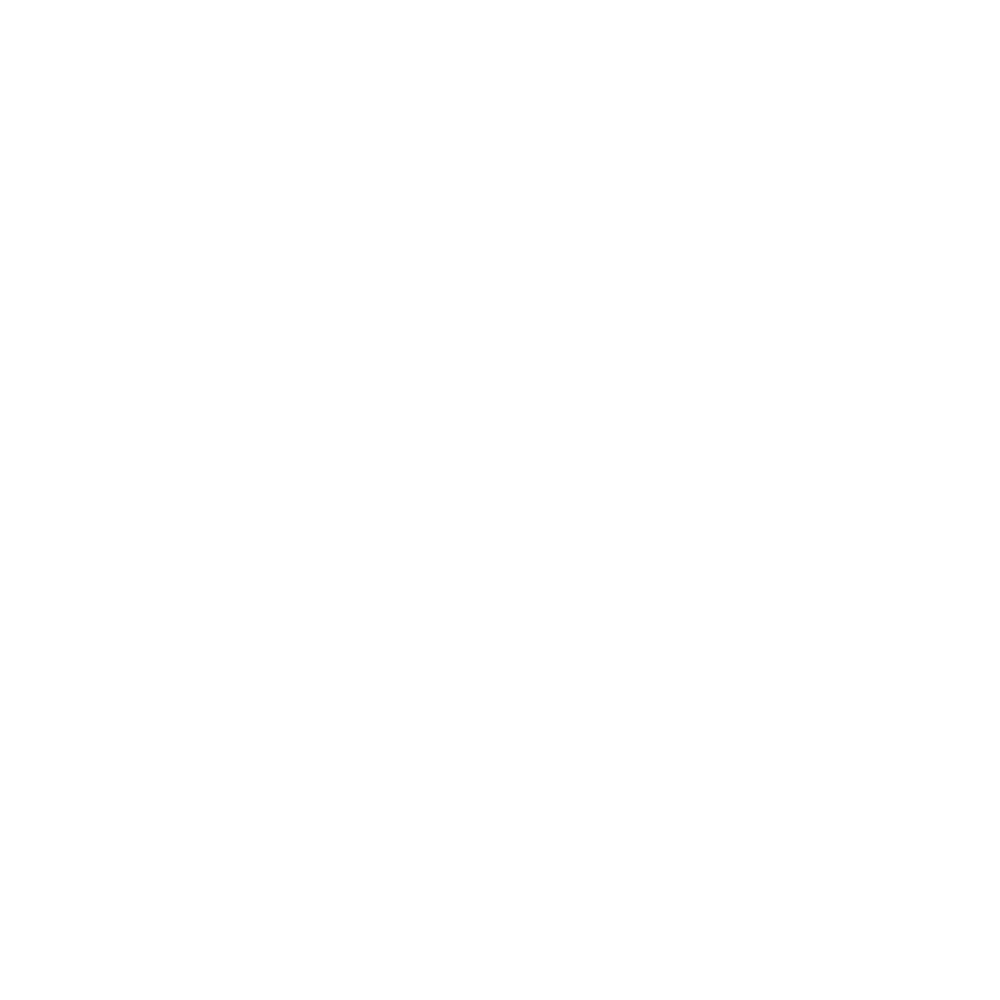

<IPython.core.display.Javascript object>


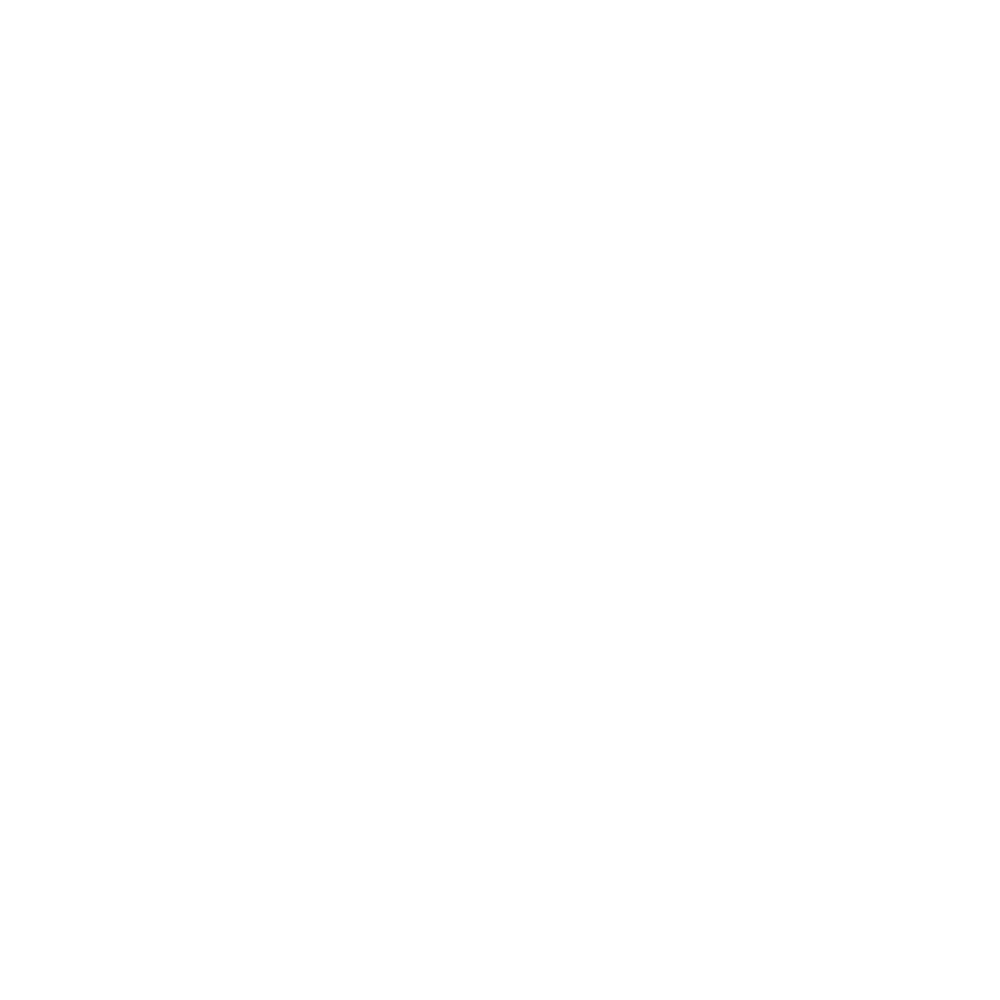

<IPython.core.display.Javascript object>


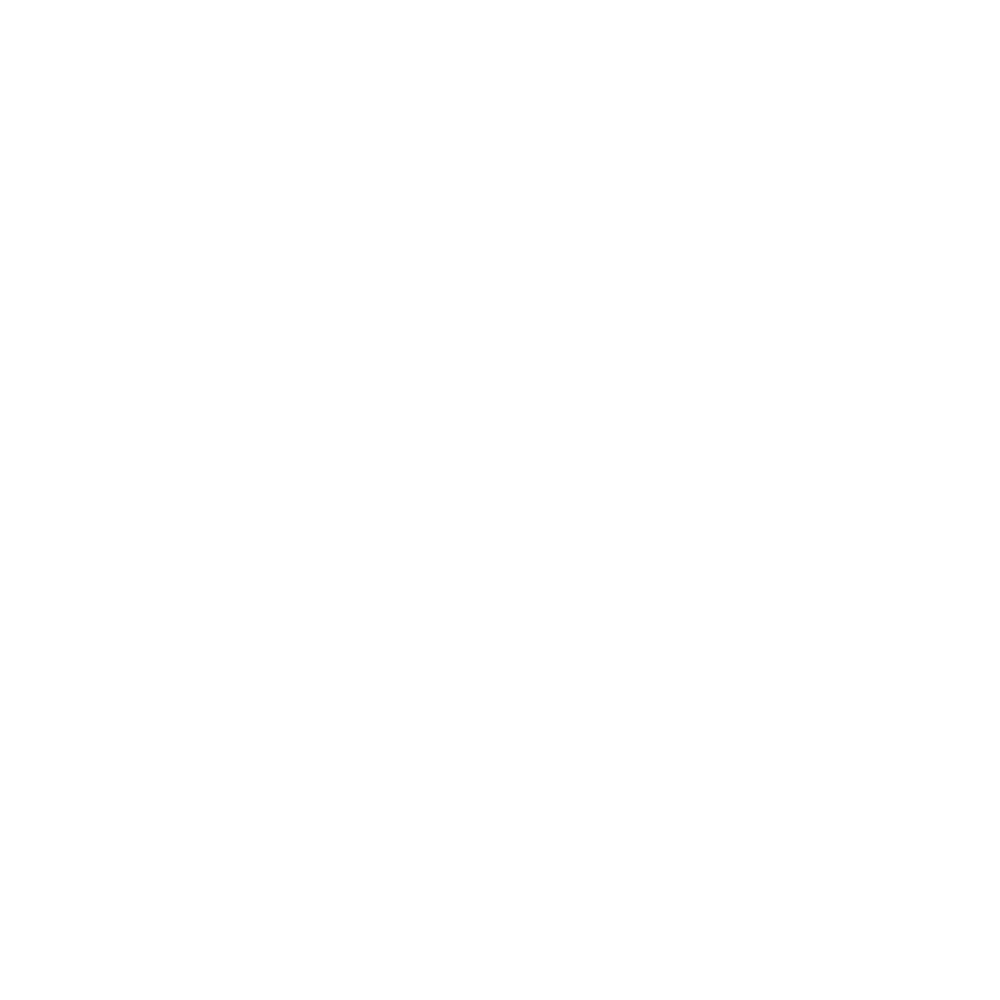

<IPython.core.display.Javascript object>


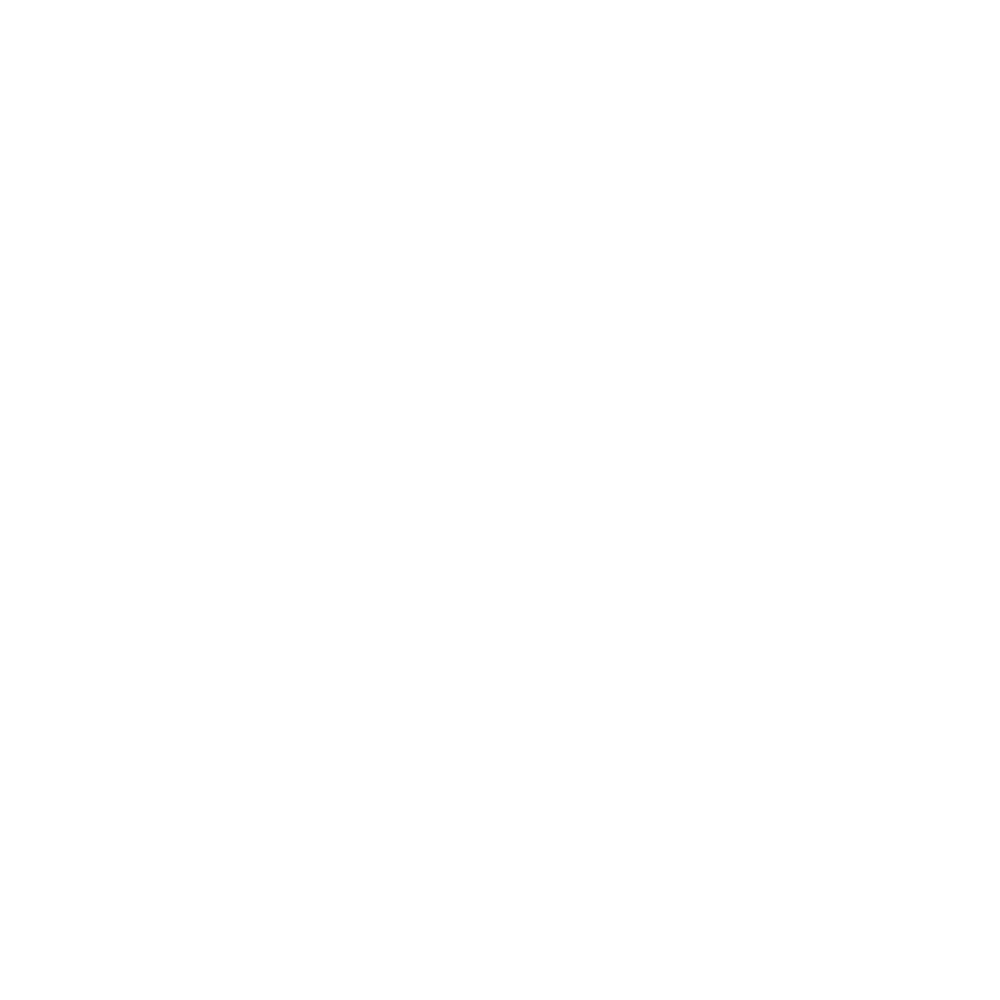

<IPython.core.display.Javascript object>


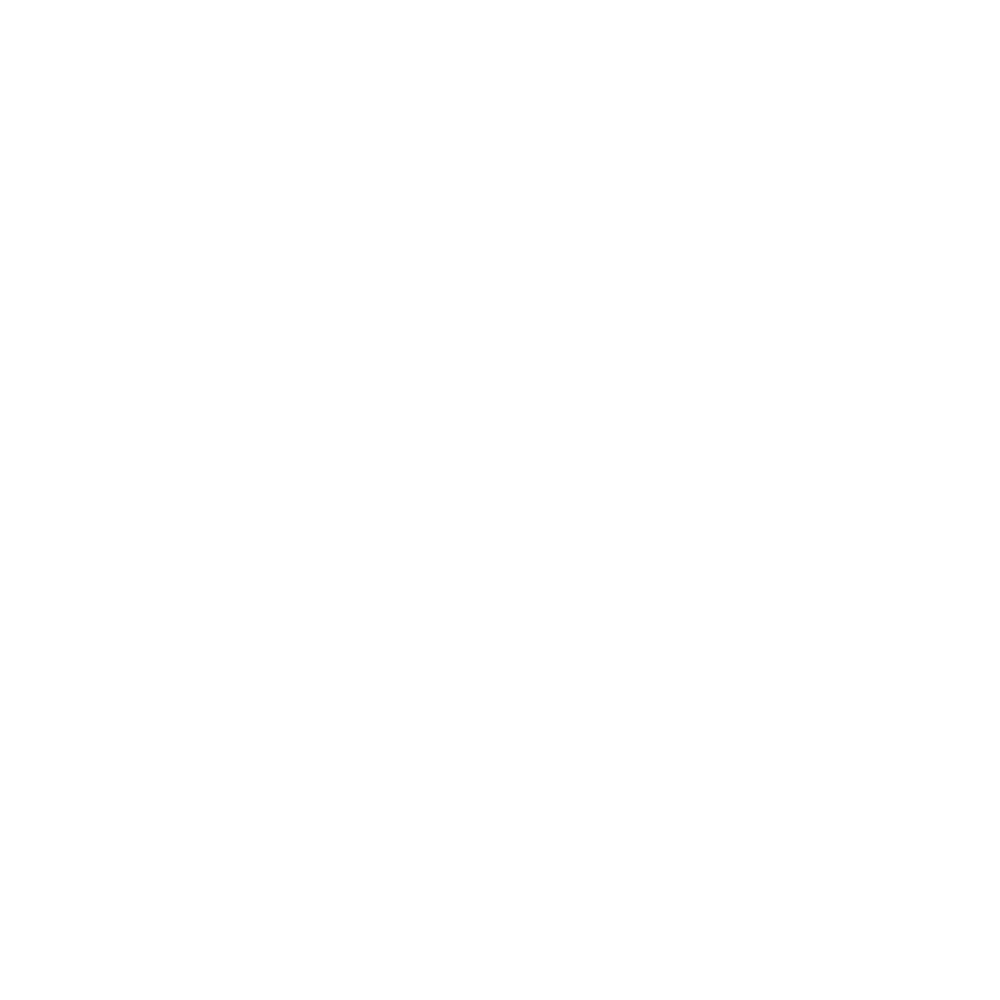

<IPython.core.display.Javascript object>


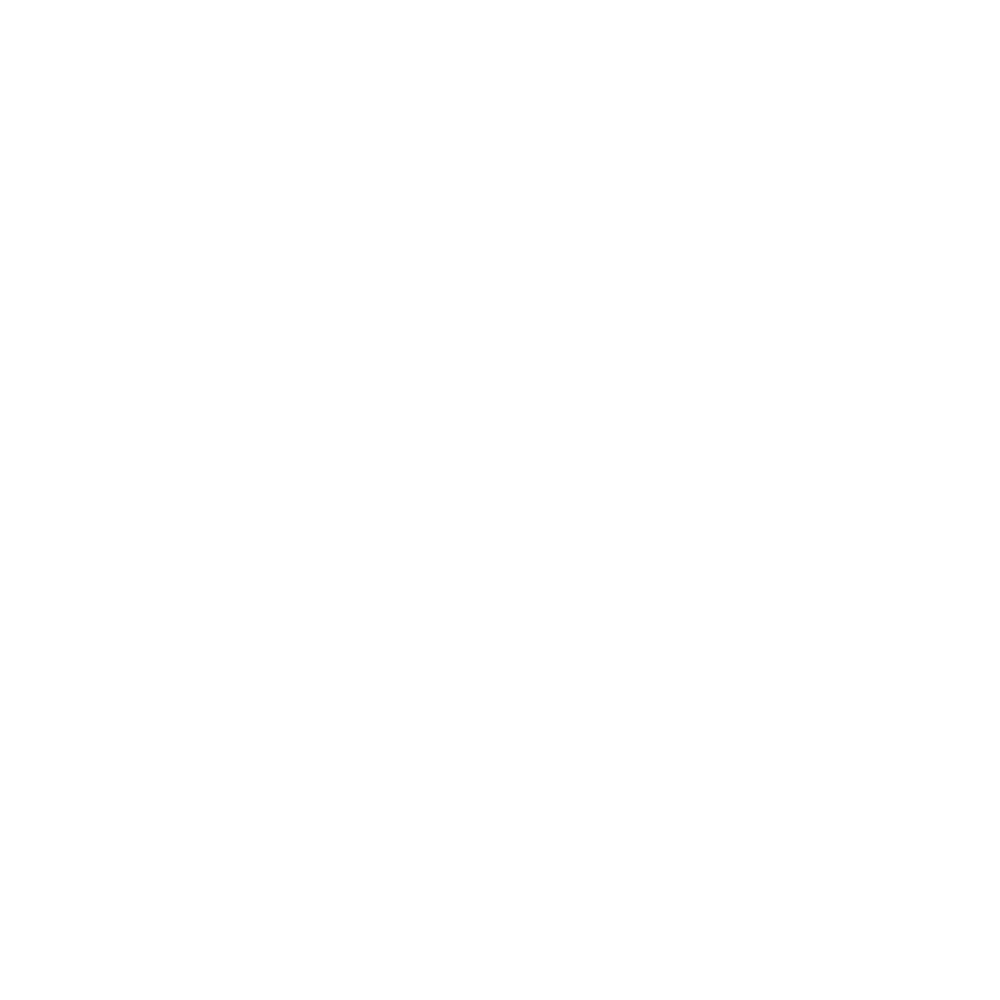

<IPython.core.display.Javascript object>


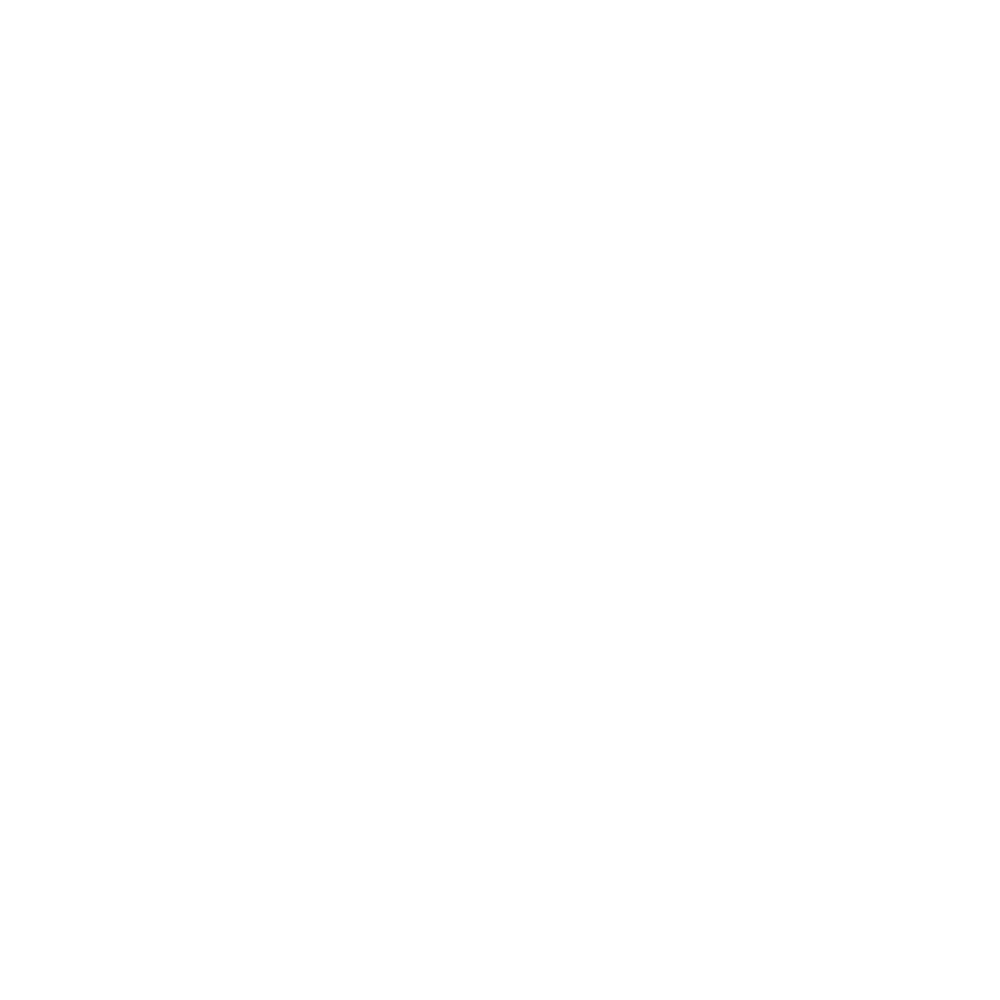

<IPython.core.display.Javascript object>


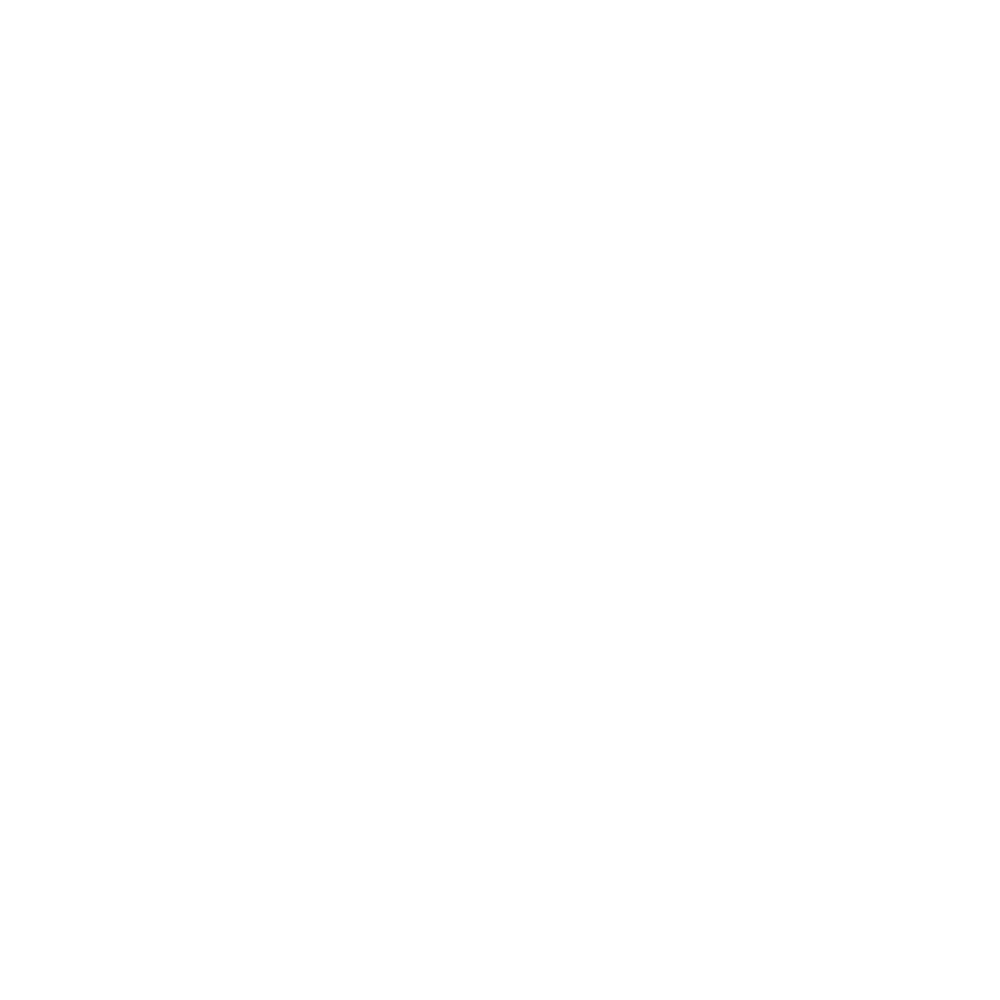

<IPython.core.display.Javascript object>


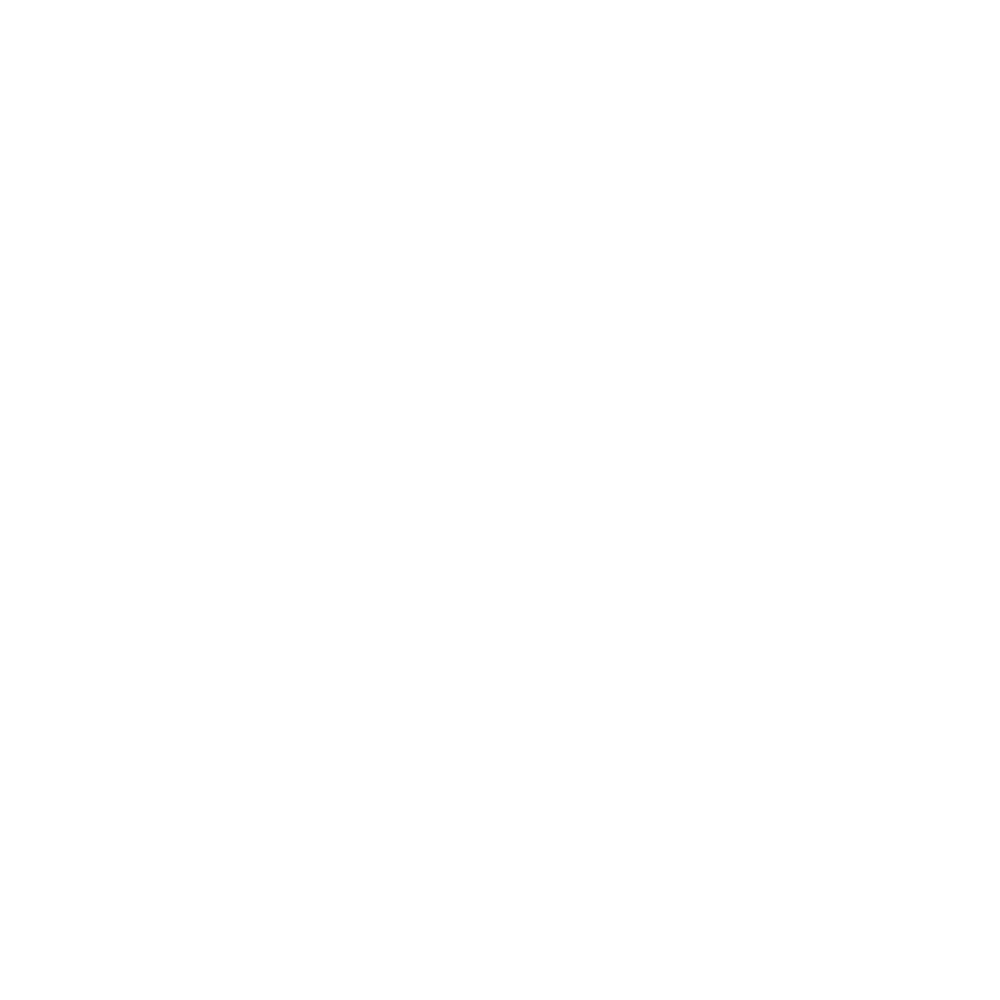

<IPython.core.display.Javascript object>


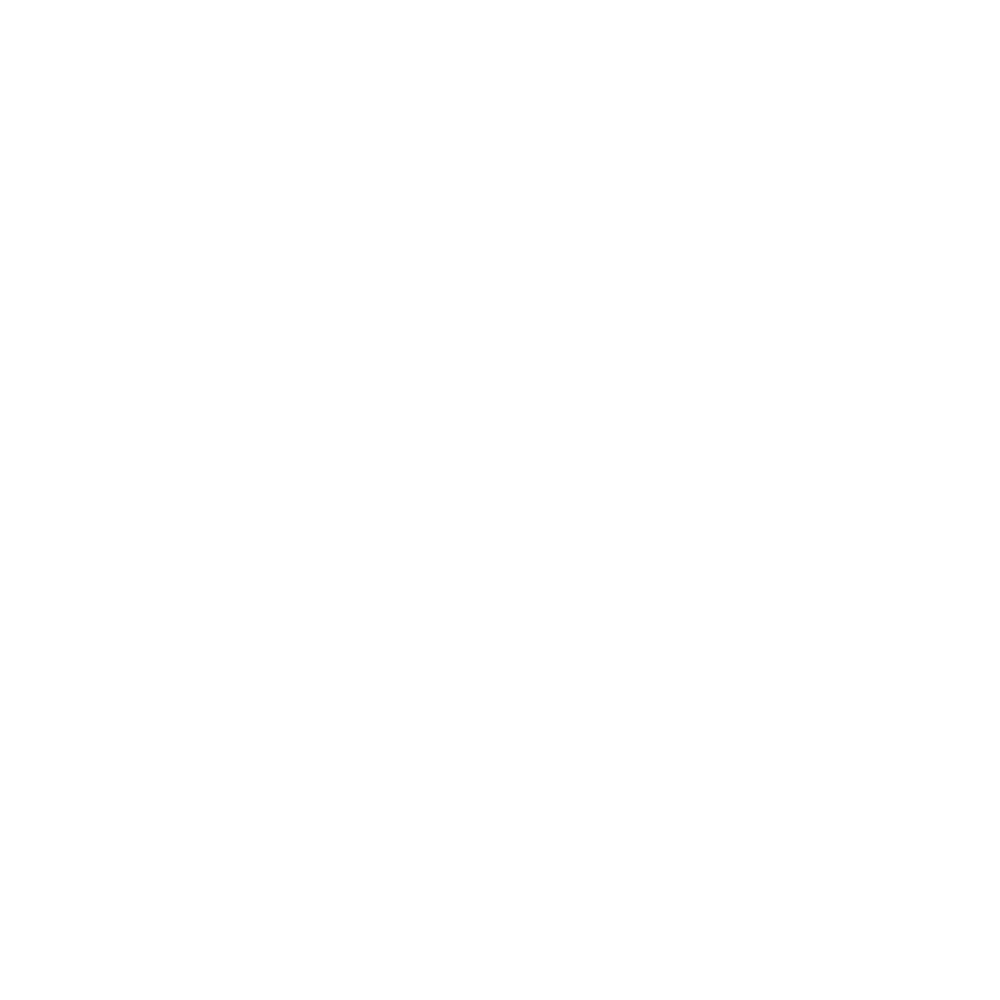

<IPython.core.display.Javascript object>


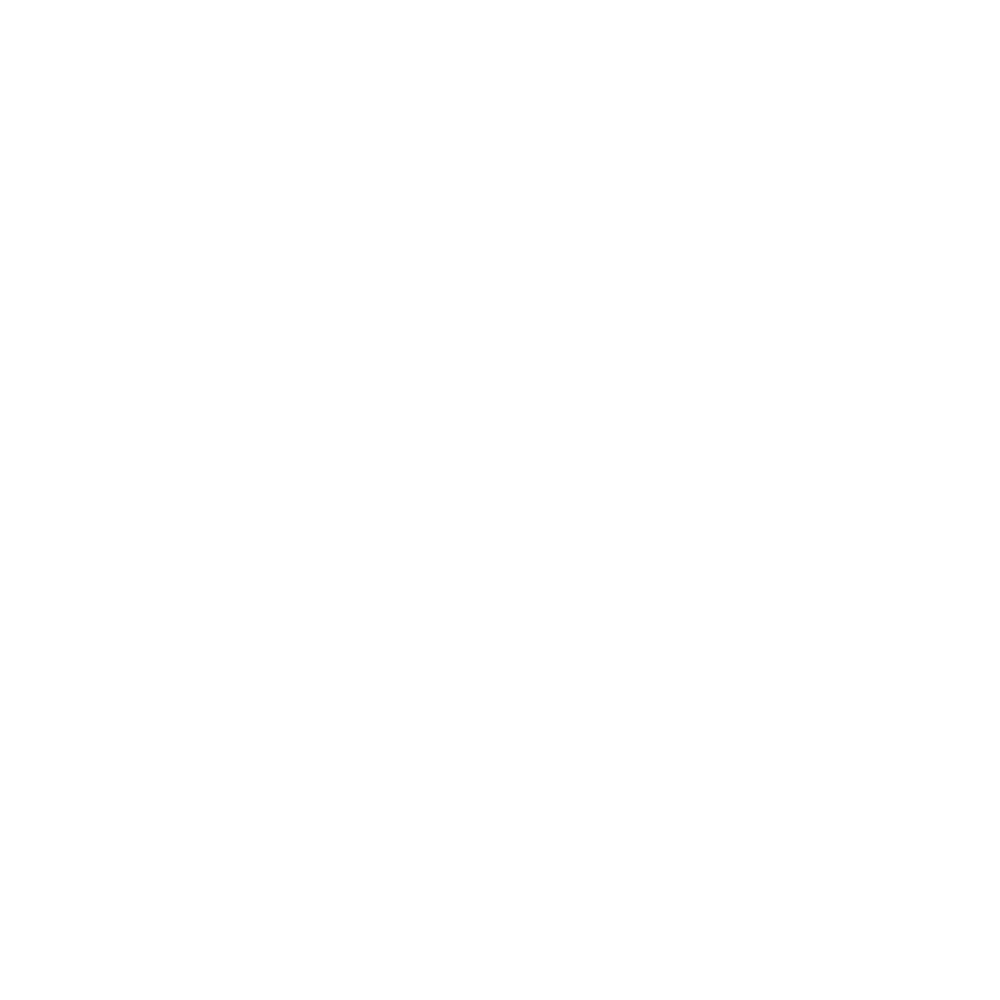

<IPython.core.display.Javascript object>


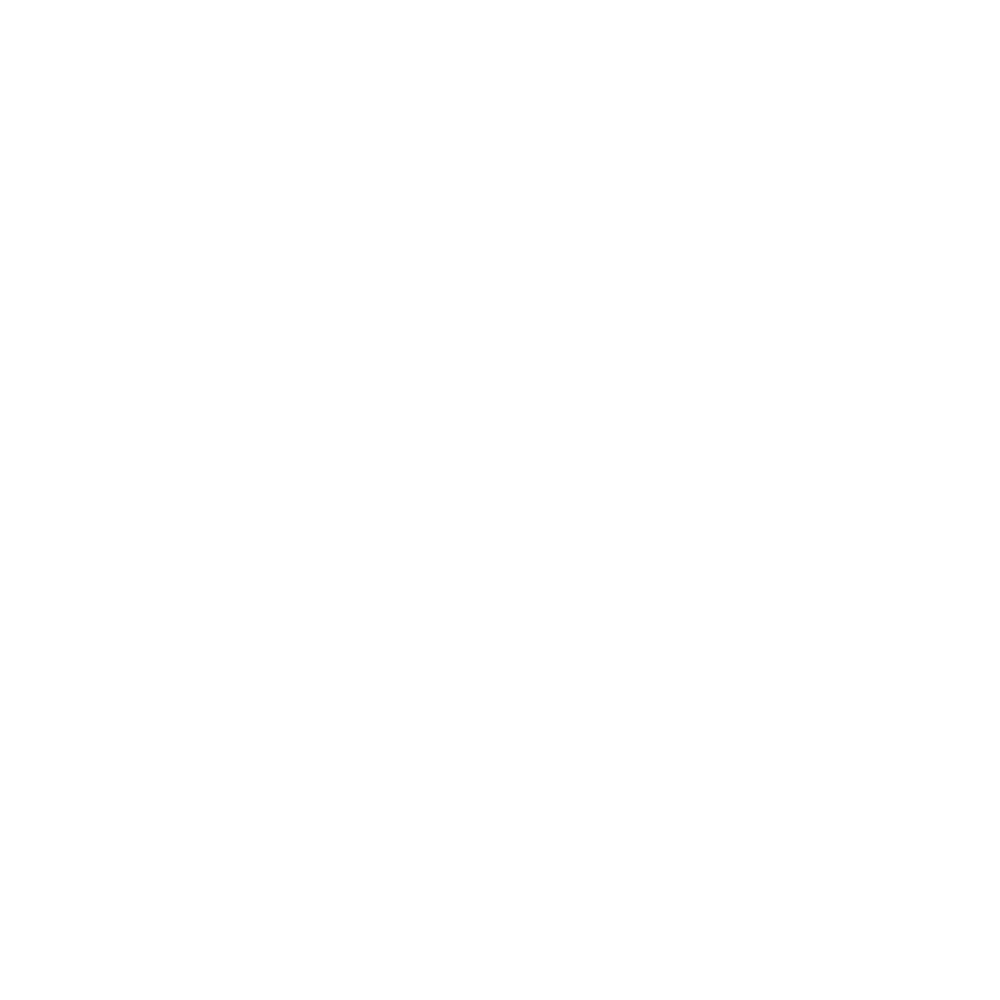

<IPython.core.display.Javascript object>


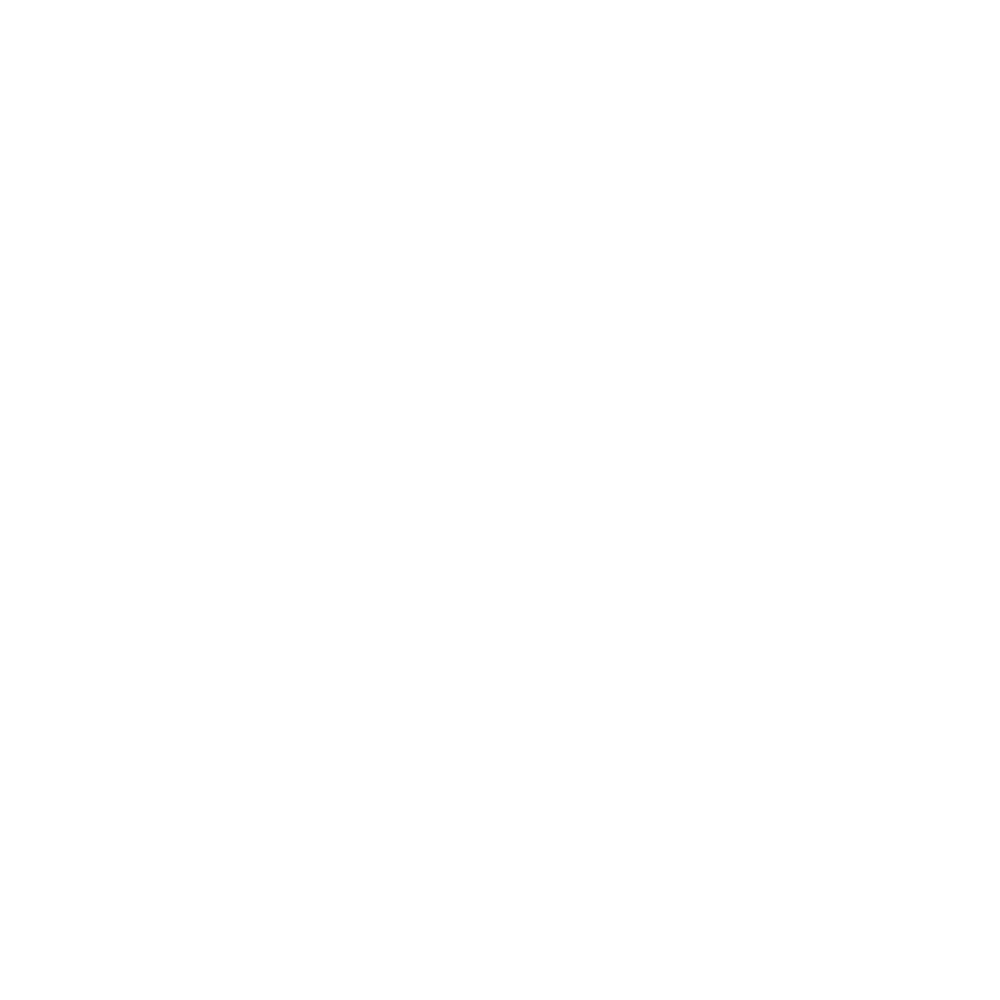

<IPython.core.display.Javascript object>


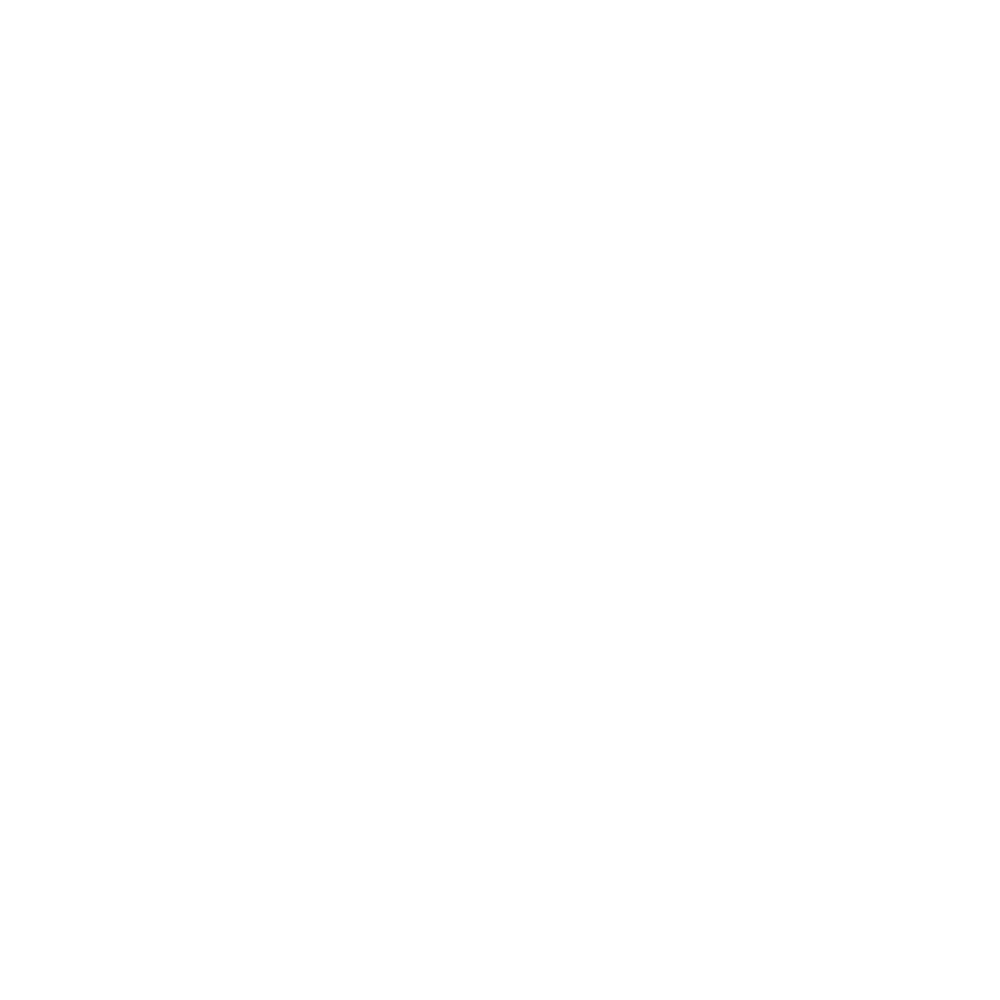

<IPython.core.display.Javascript object>


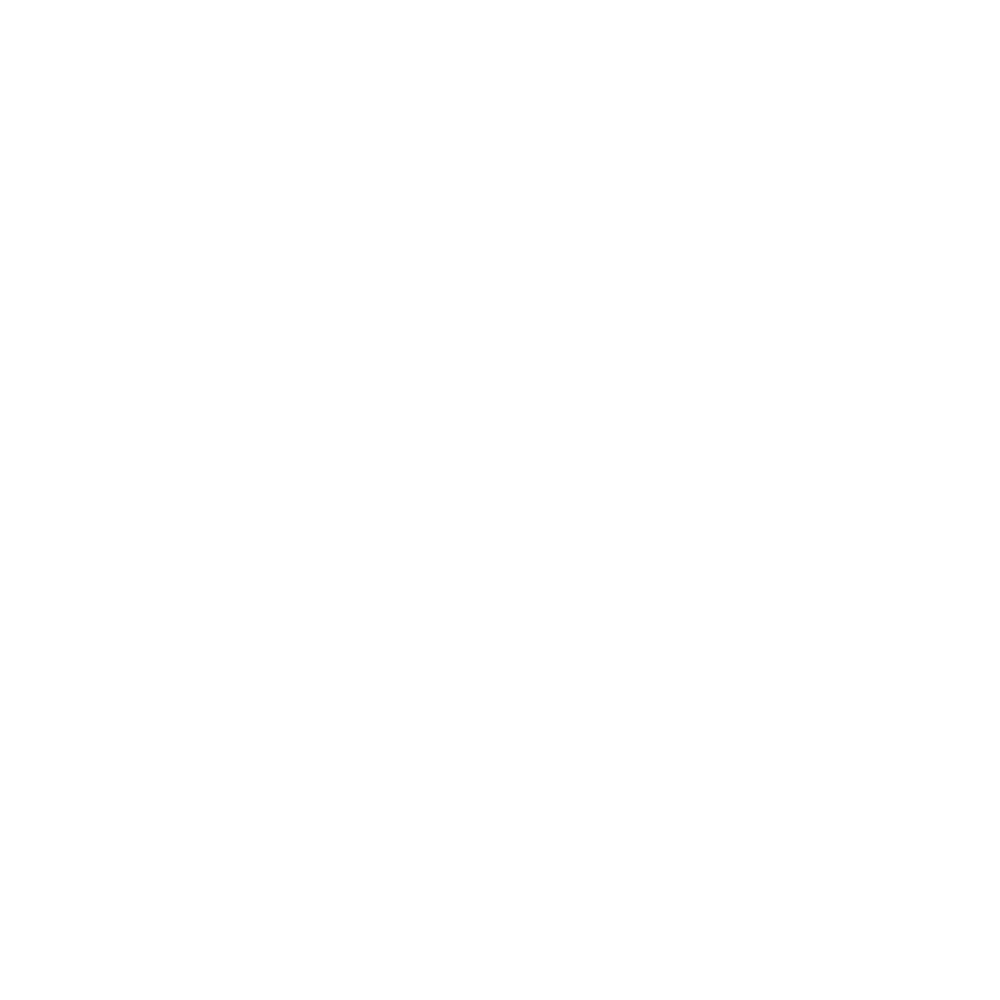

<IPython.core.display.Javascript object>


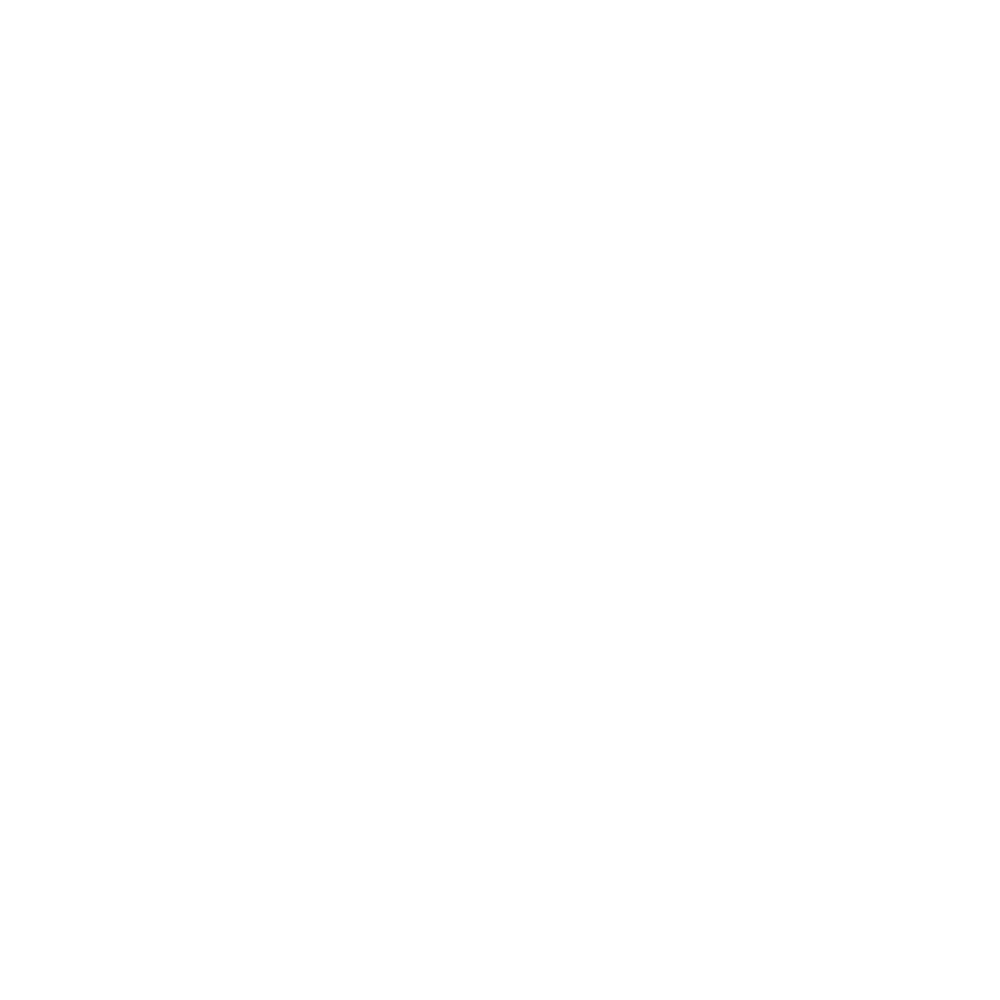

<IPython.core.display.Javascript object>


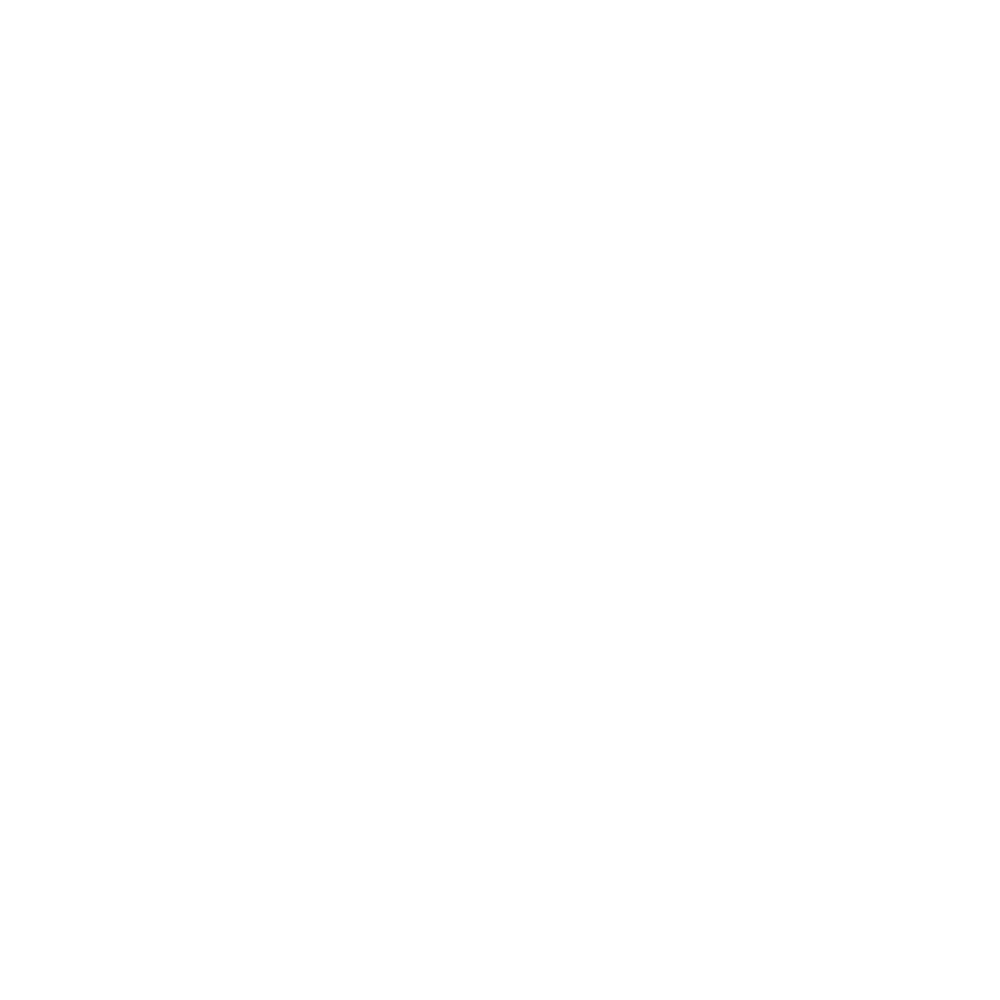

<IPython.core.display.Javascript object>


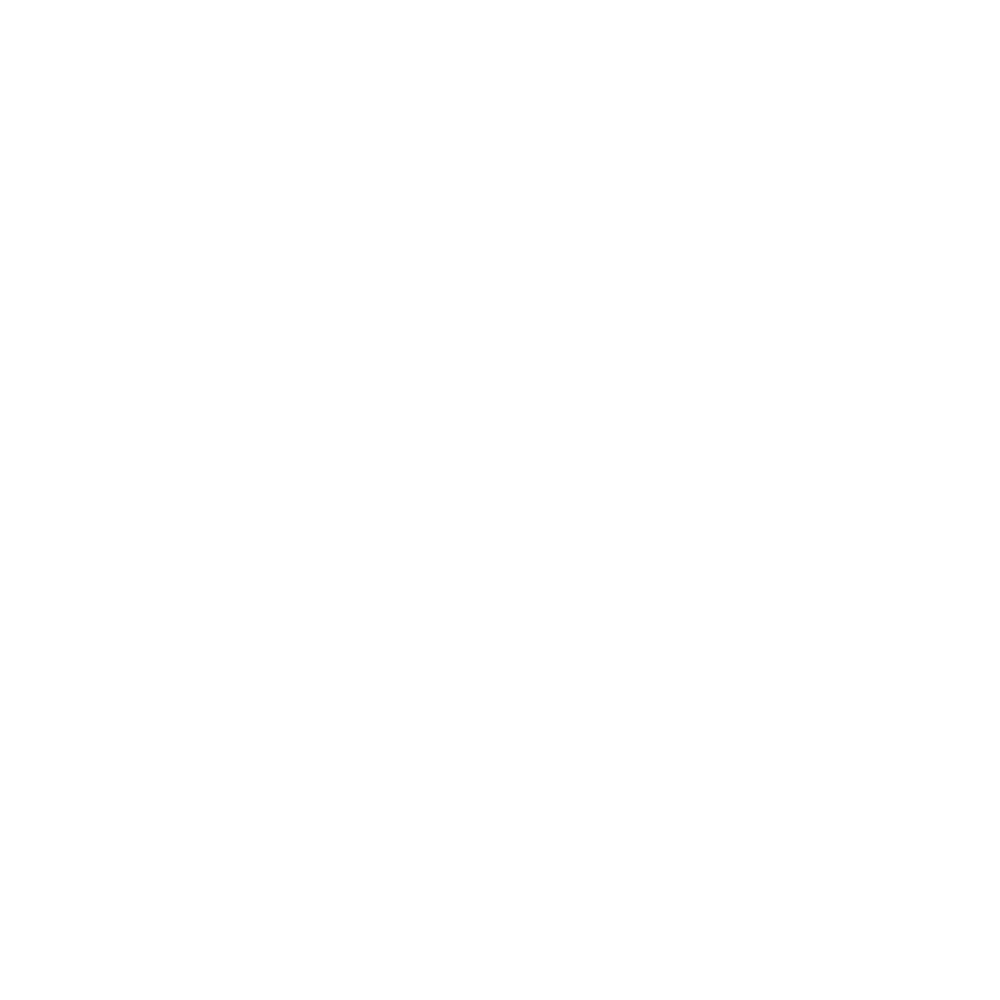

<IPython.core.display.Javascript object>


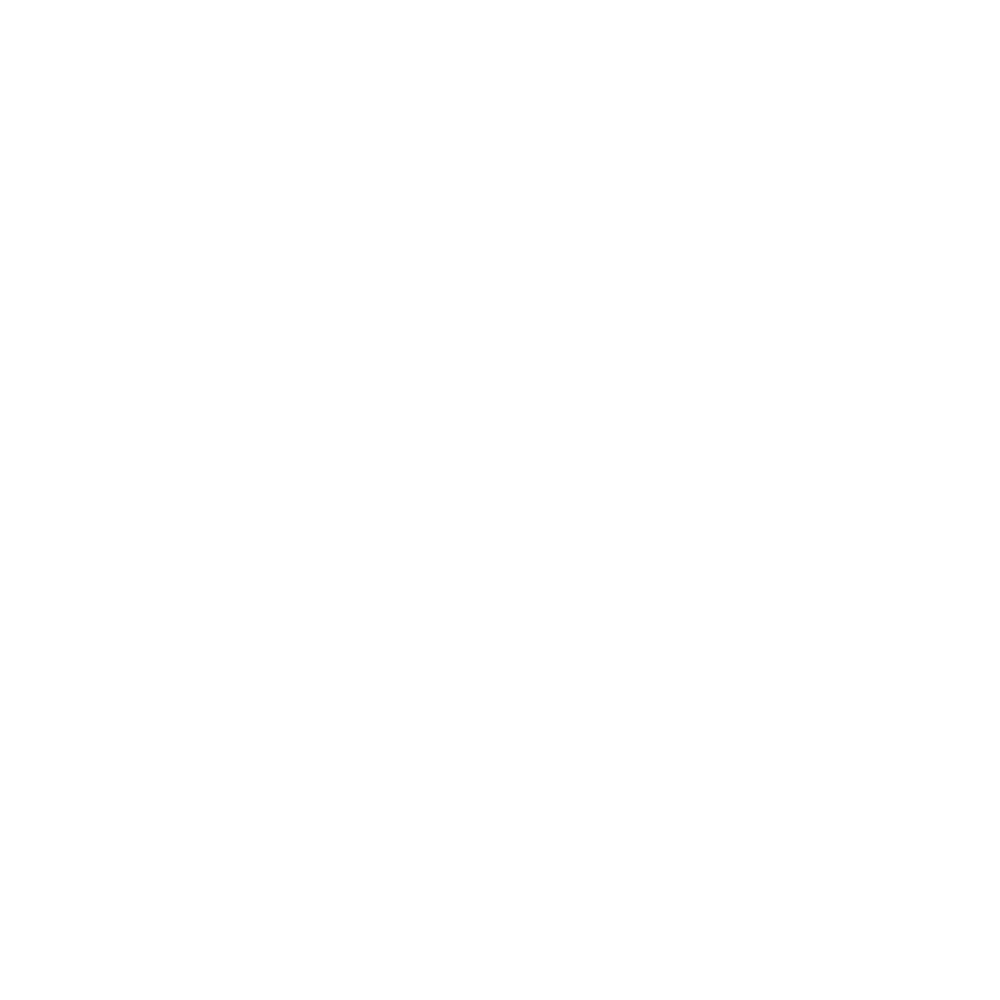

<IPython.core.display.Javascript object>


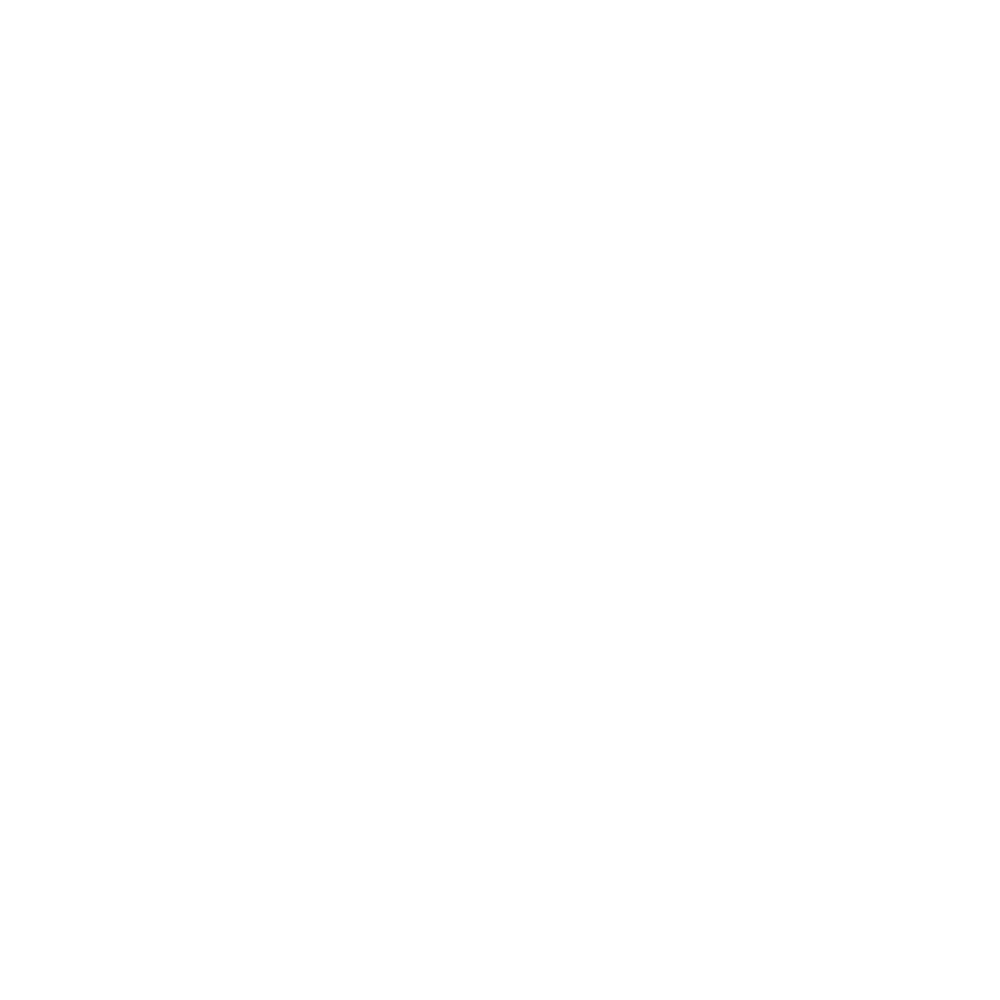

<IPython.core.display.Javascript object>


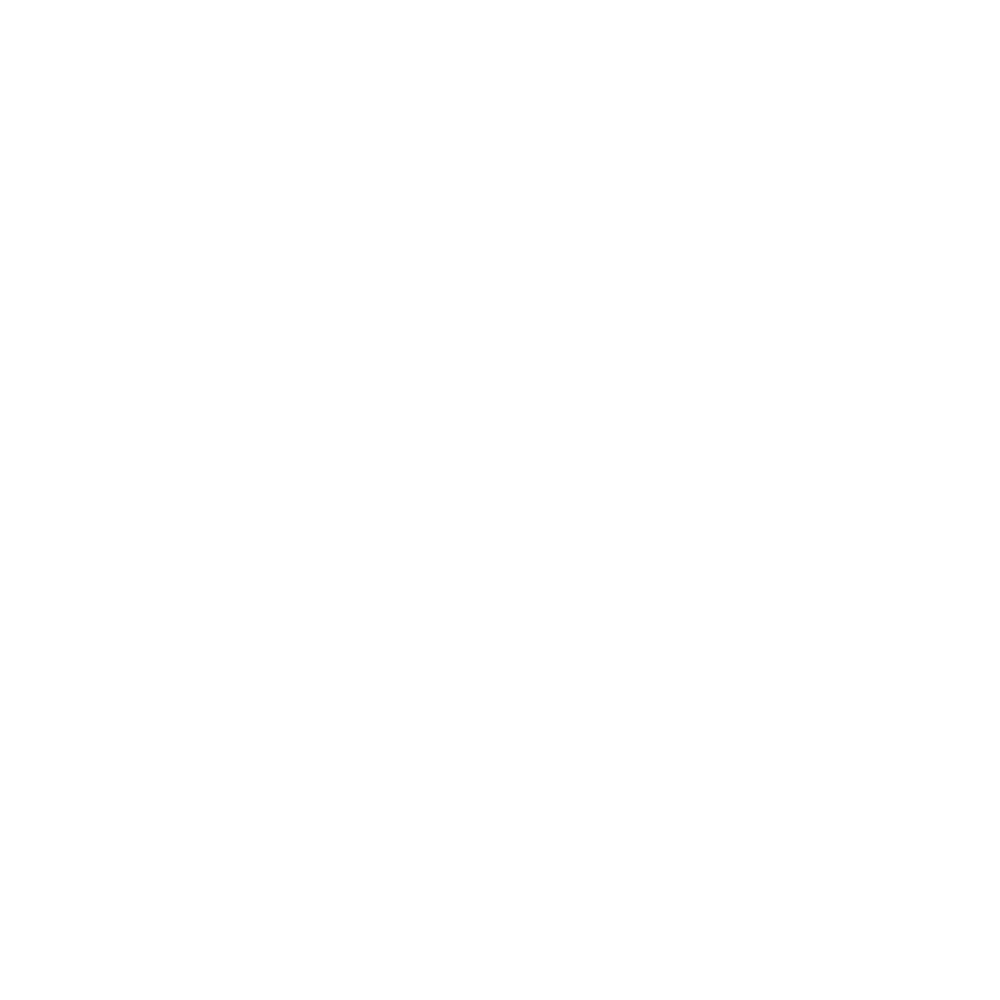

<IPython.core.display.Javascript object>


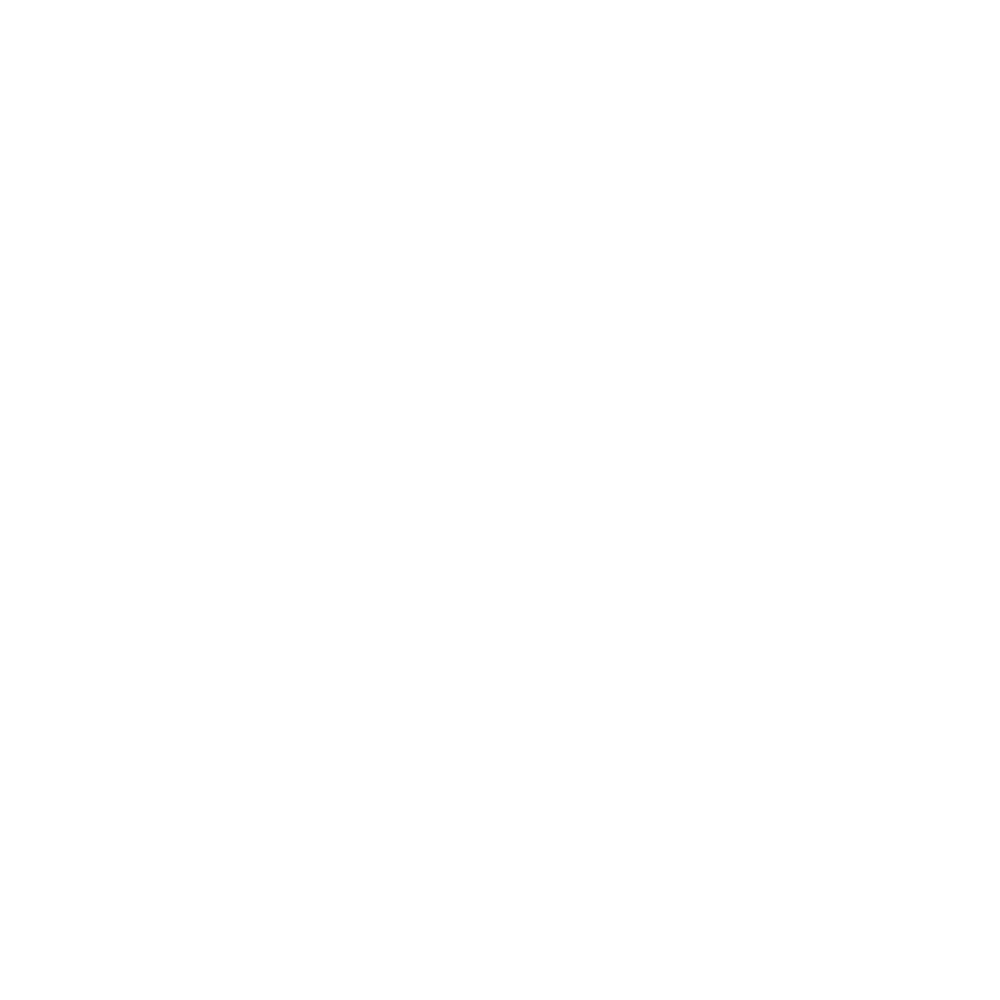

<IPython.core.display.Javascript object>


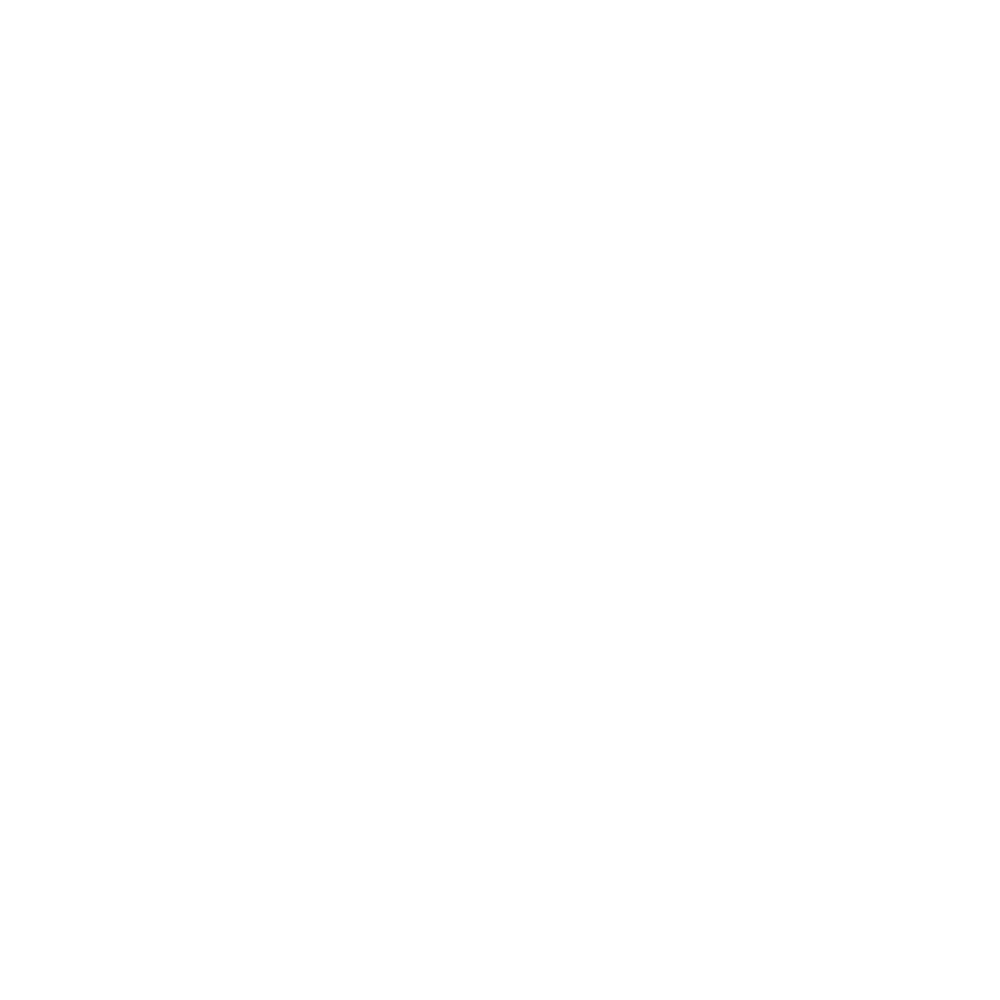

<IPython.core.display.Javascript object>


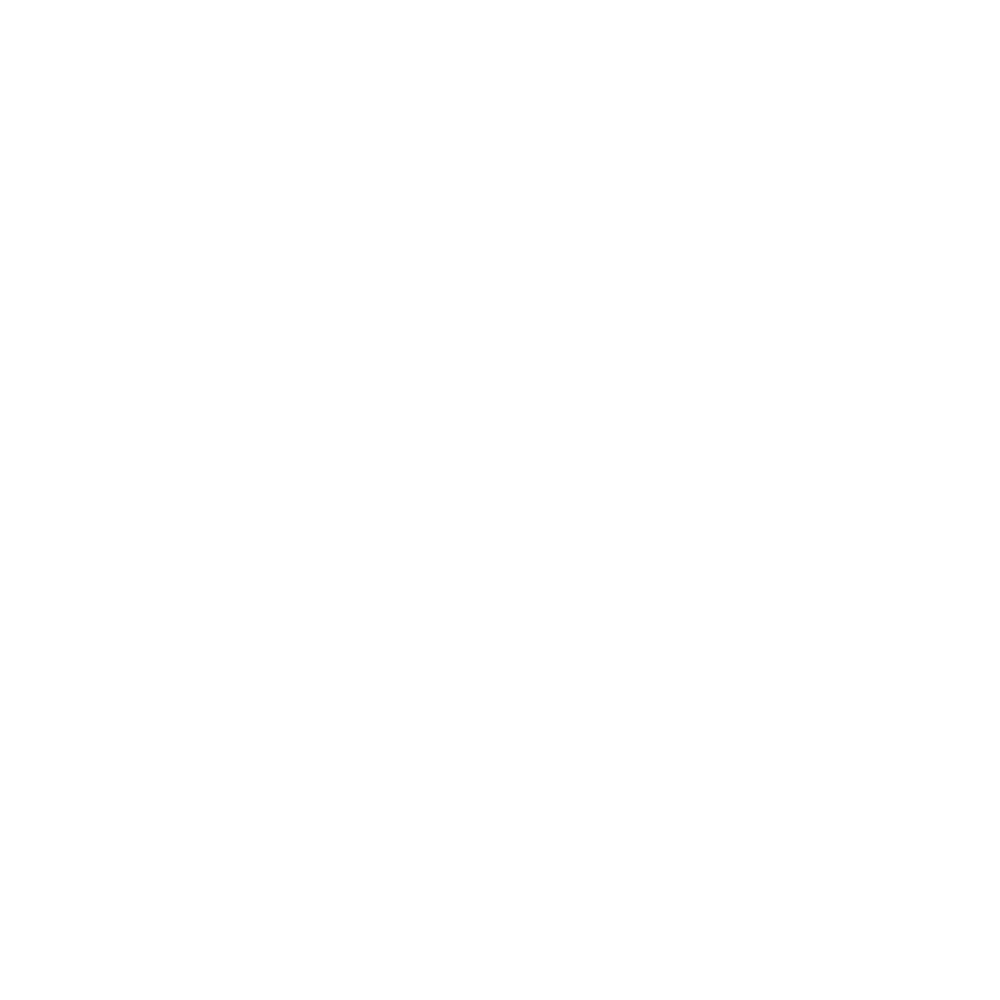

<IPython.core.display.Javascript object>


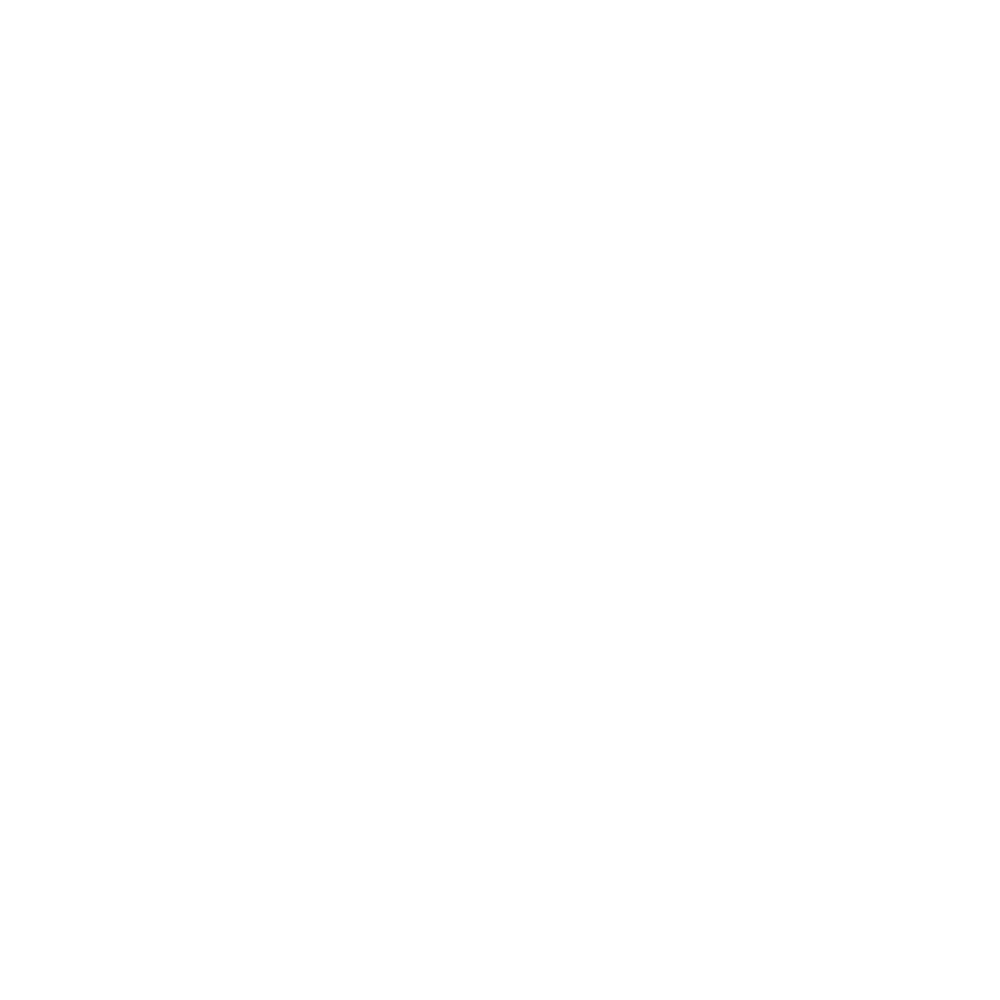

<IPython.core.display.Javascript object>


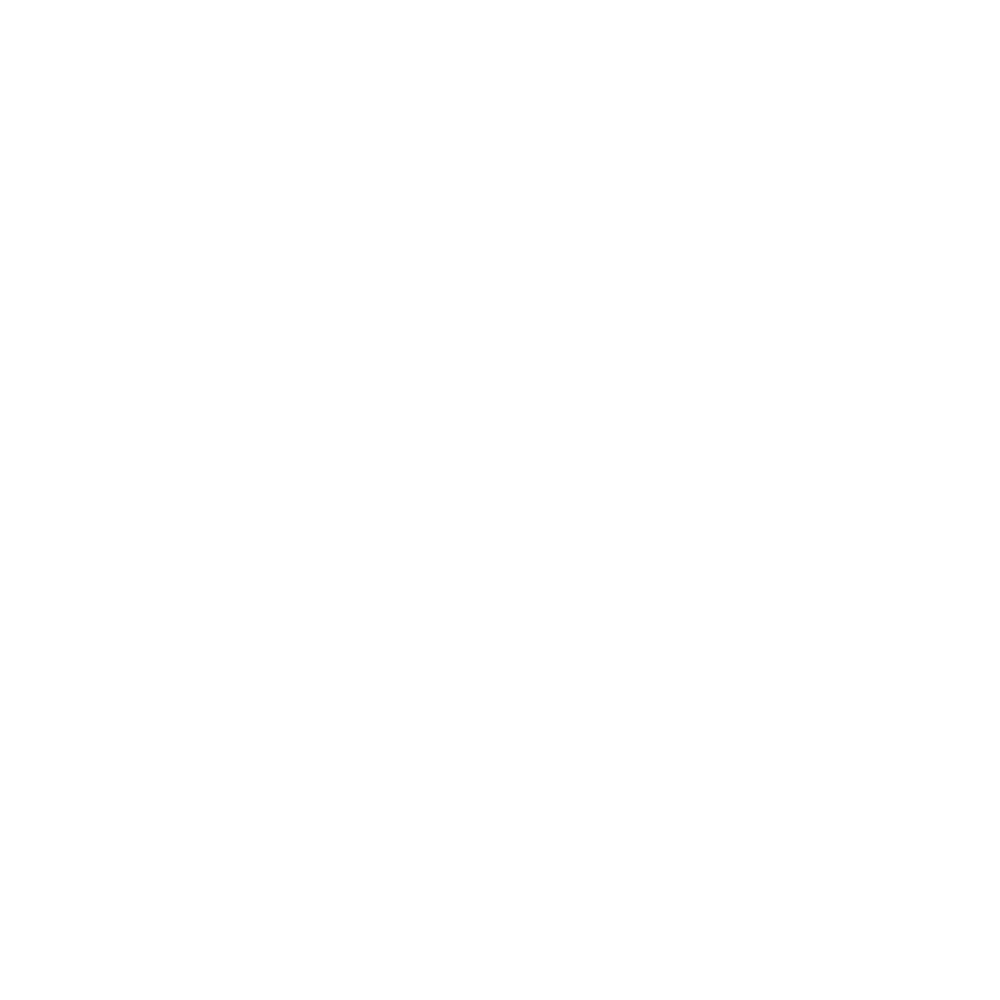

<IPython.core.display.Javascript object>


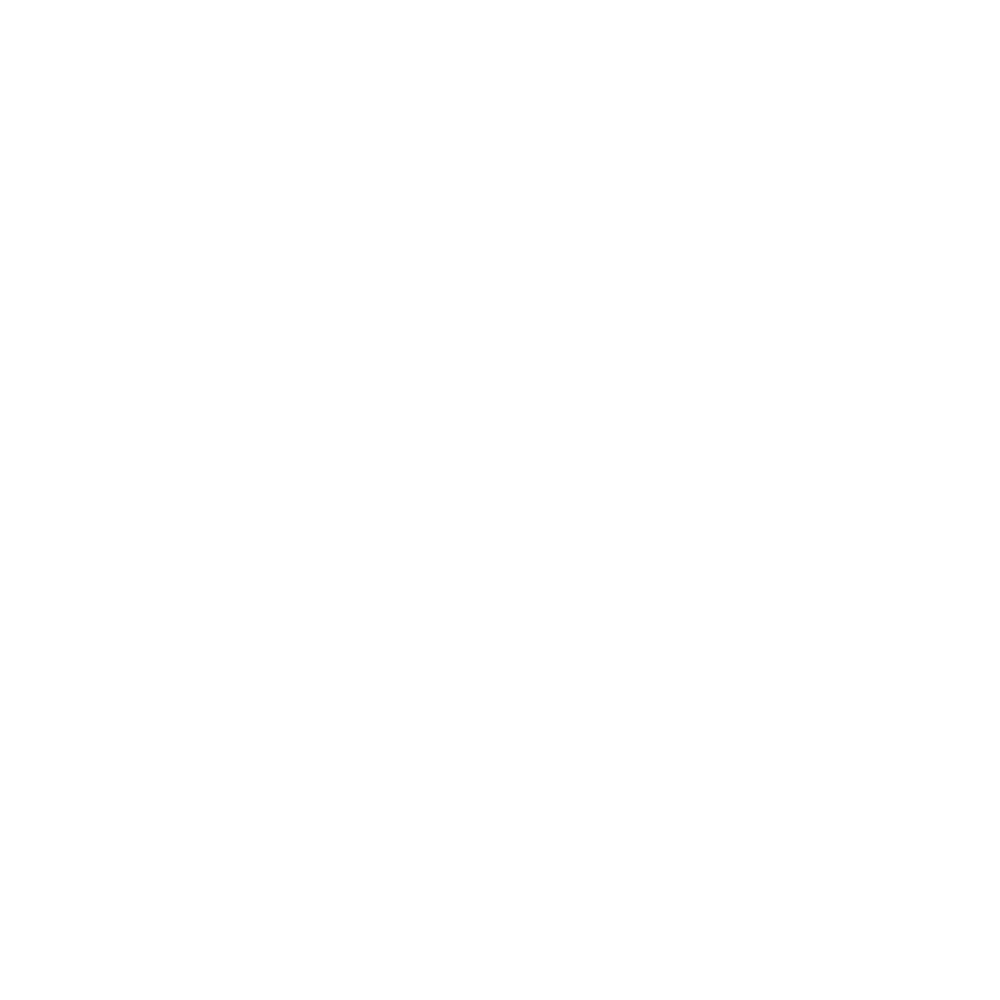

<IPython.core.display.Javascript object>


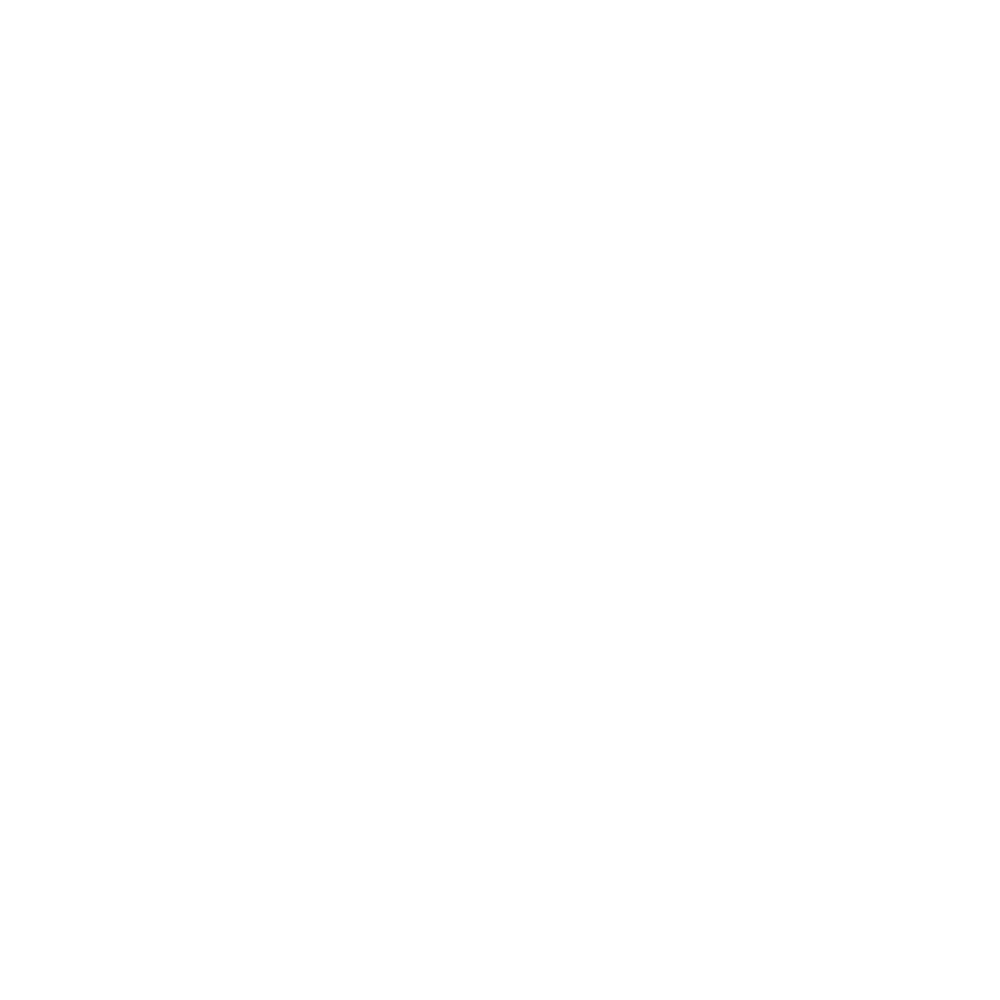

<IPython.core.display.Javascript object>


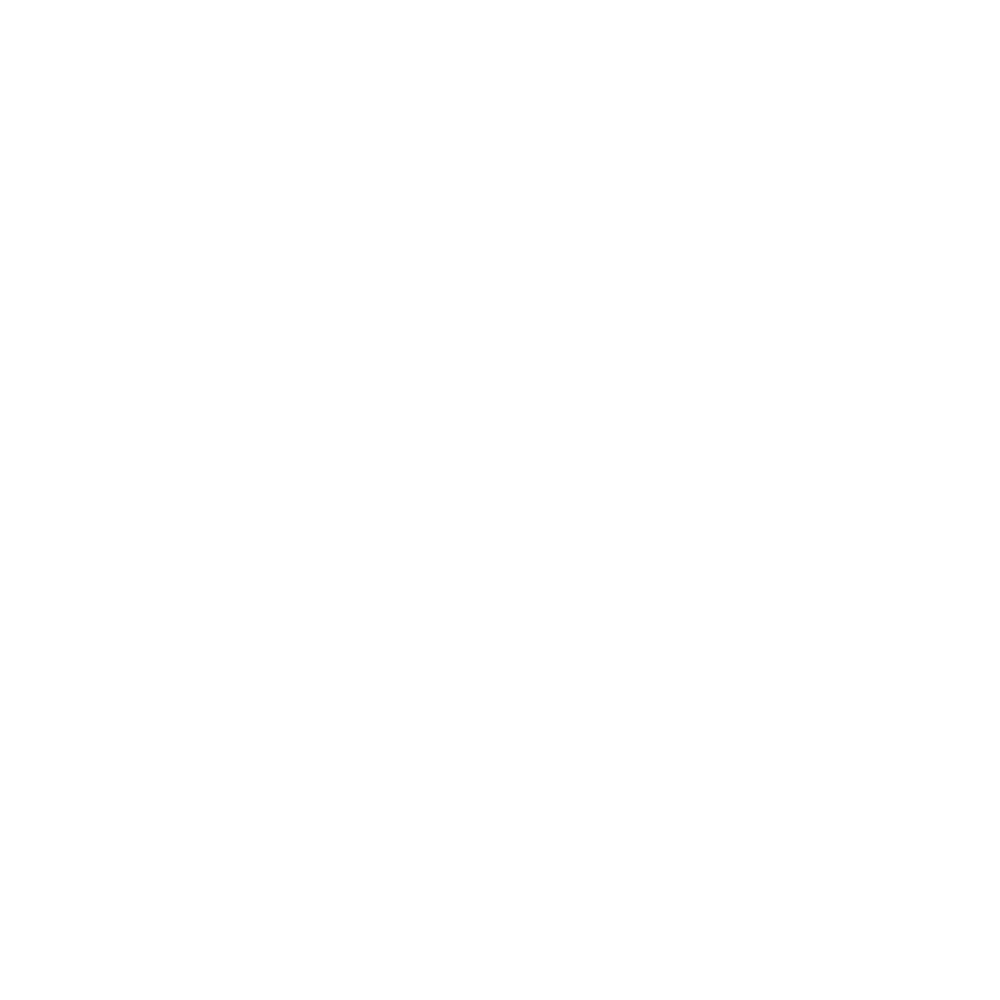

<IPython.core.display.Javascript object>


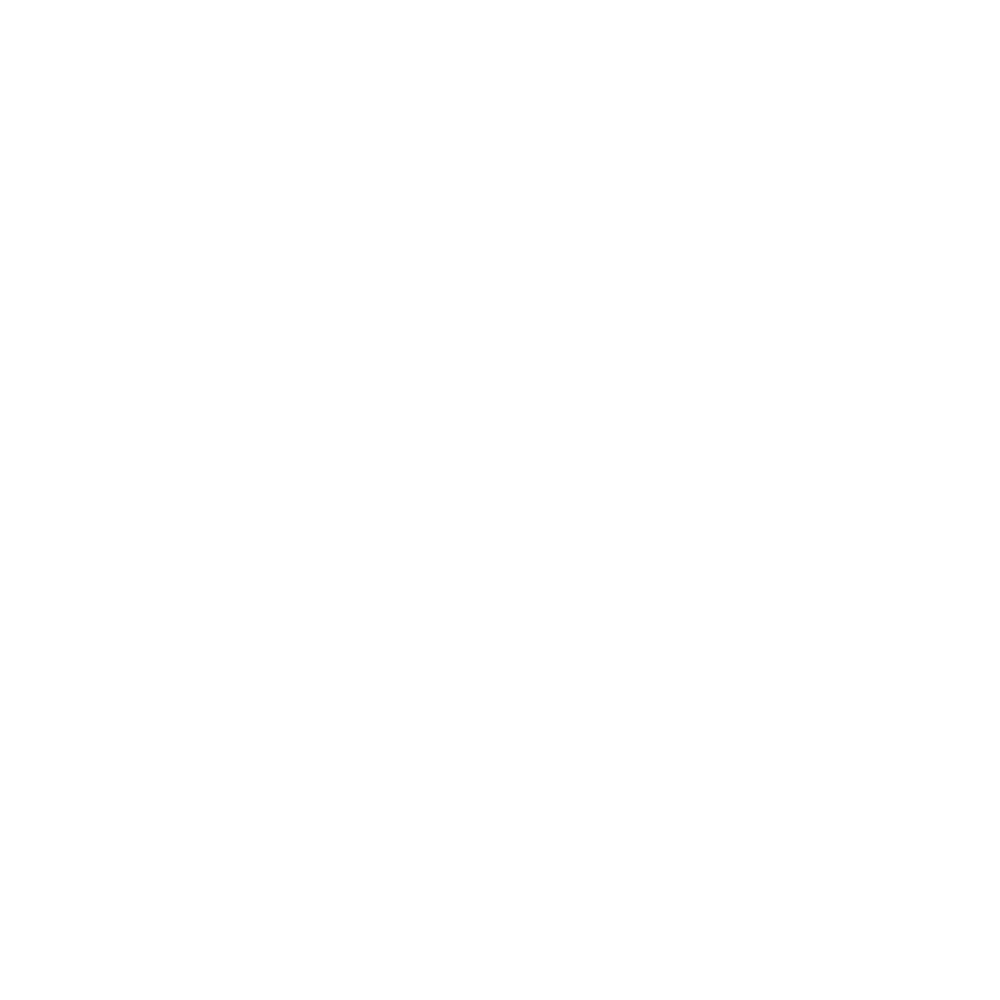

<IPython.core.display.Javascript object>


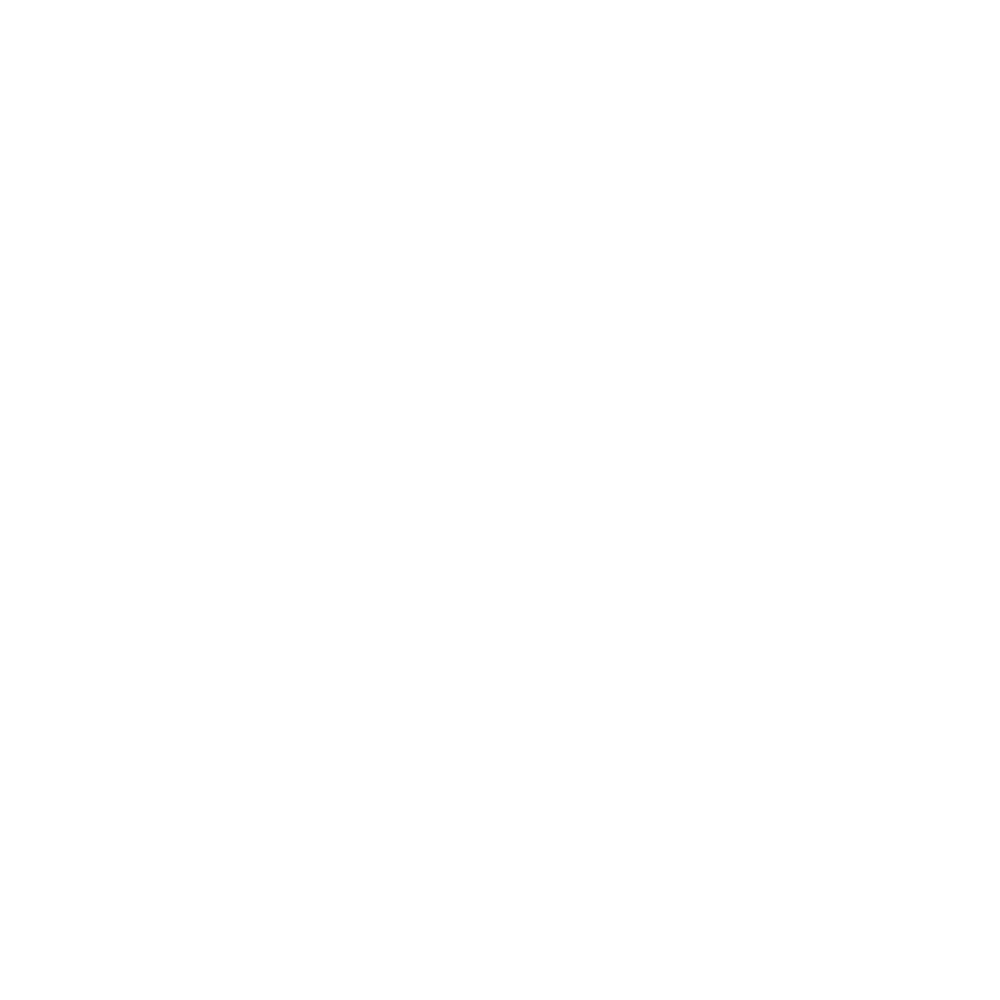

<IPython.core.display.Javascript object>


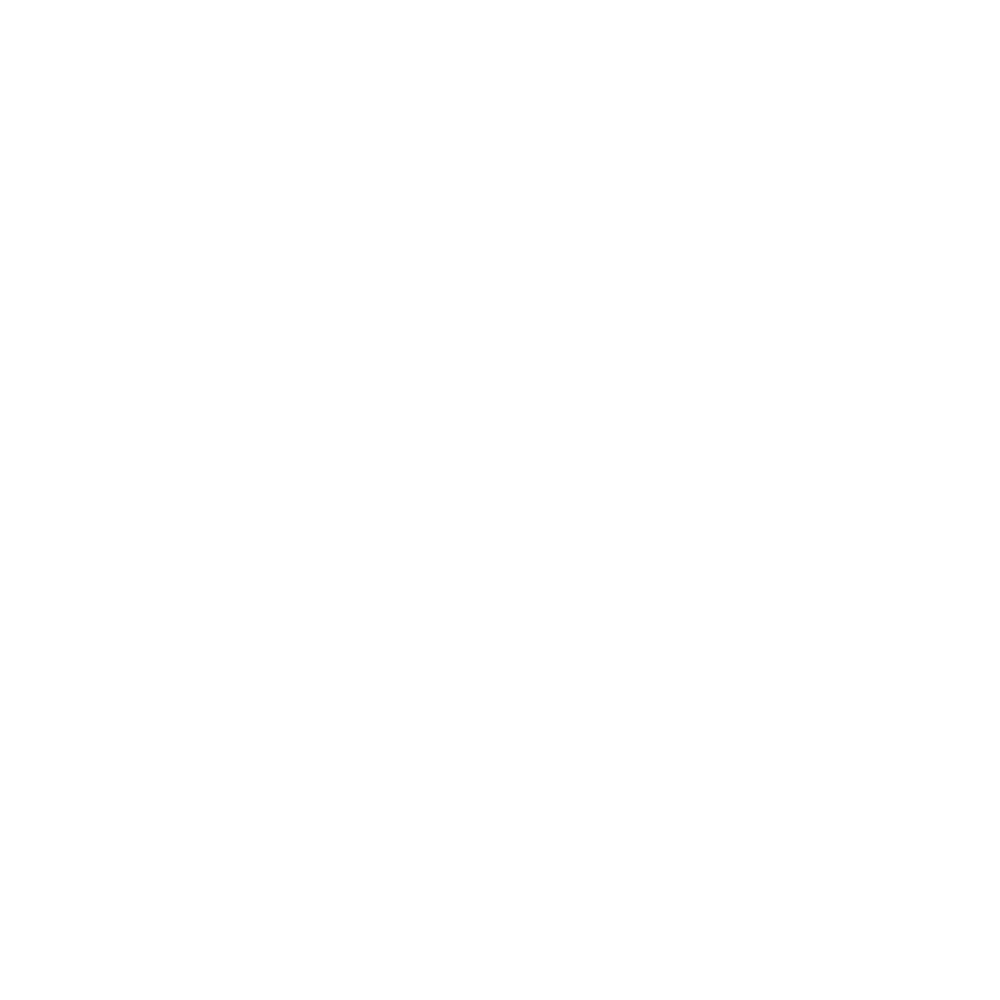

<IPython.core.display.Javascript object>


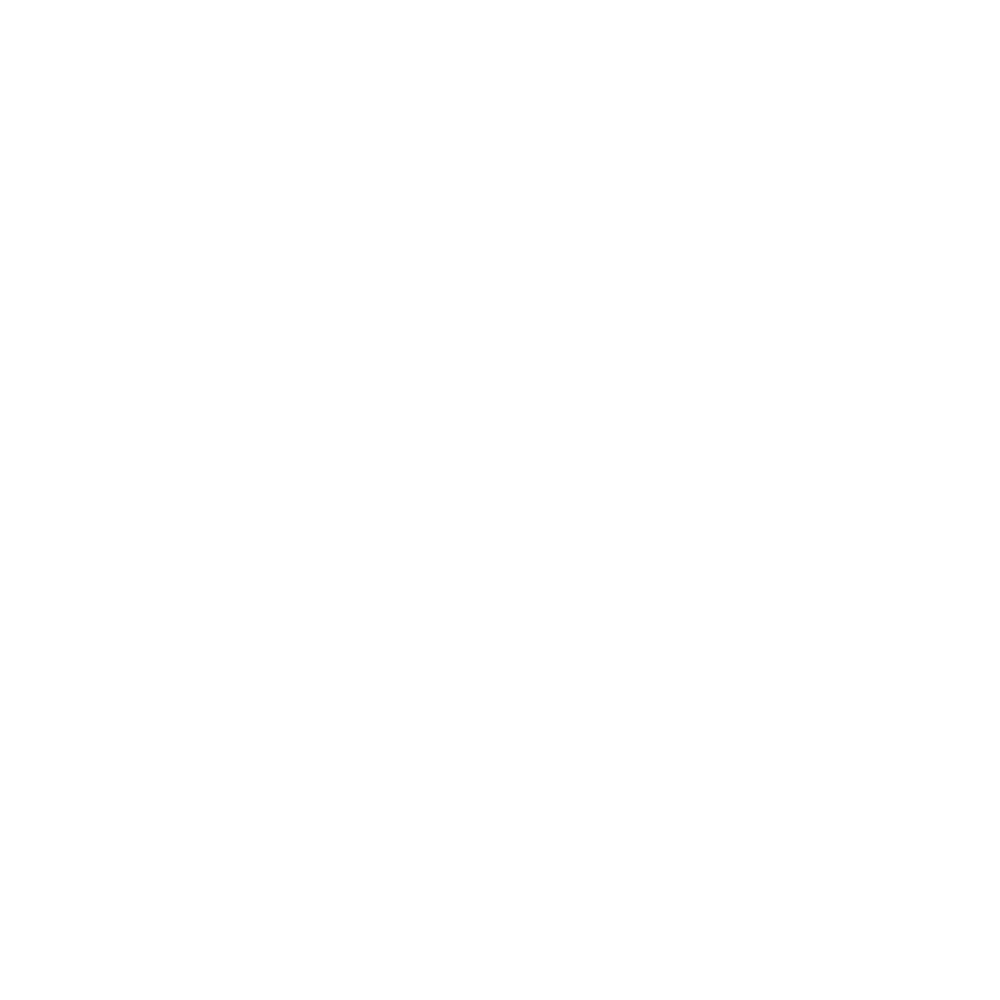

<IPython.core.display.Javascript object>


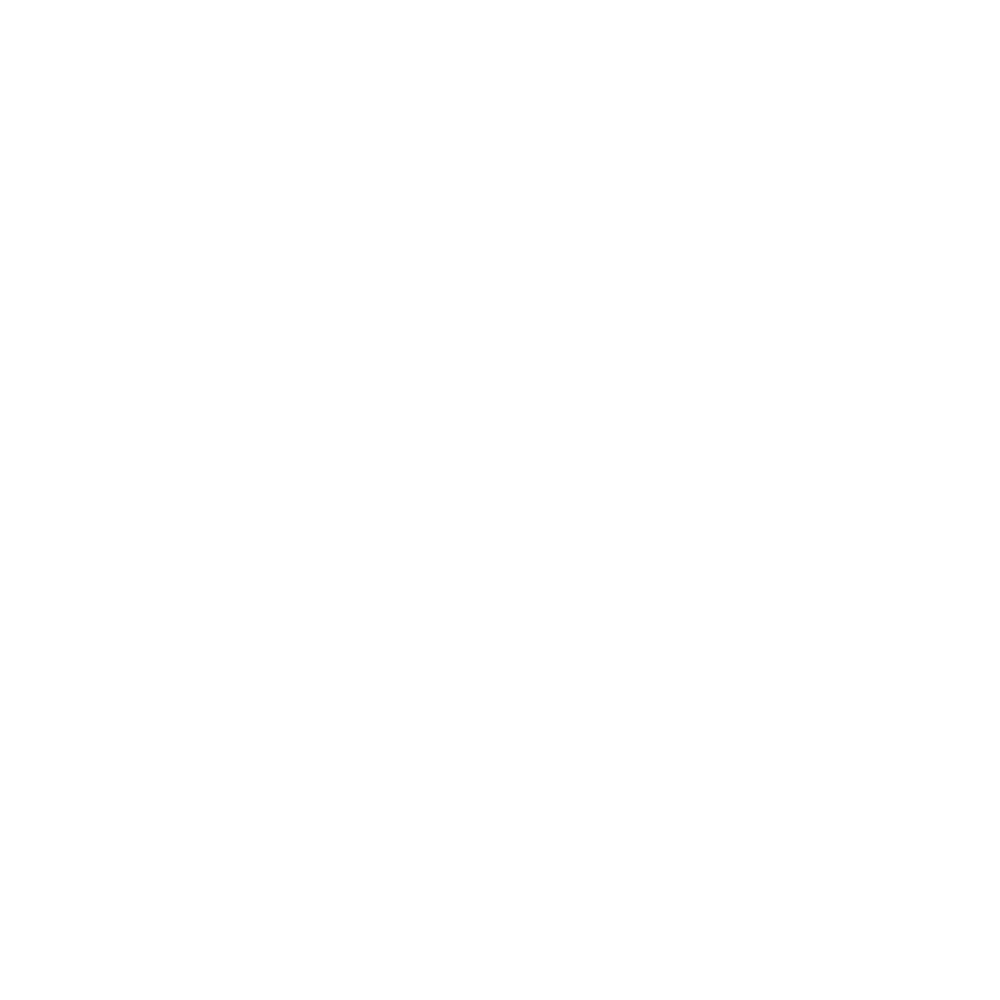

<IPython.core.display.Javascript object>


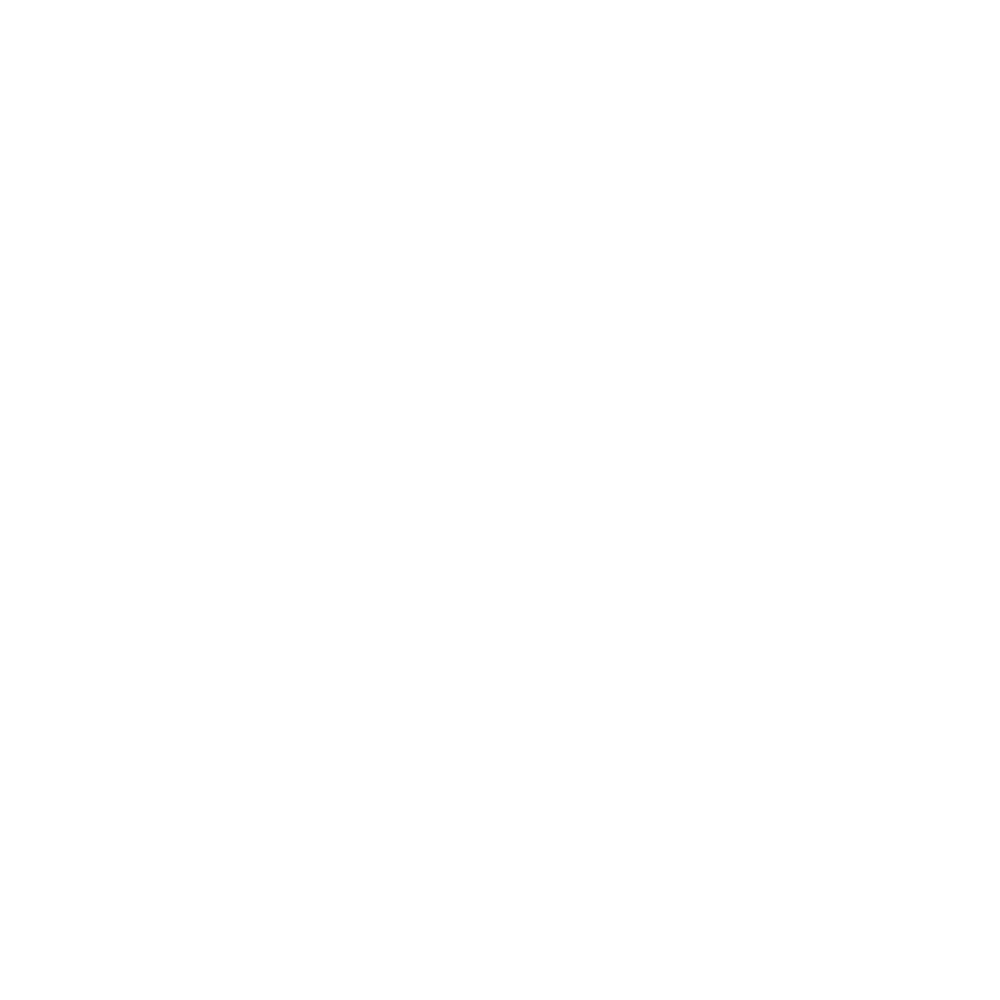

<IPython.core.display.Javascript object>


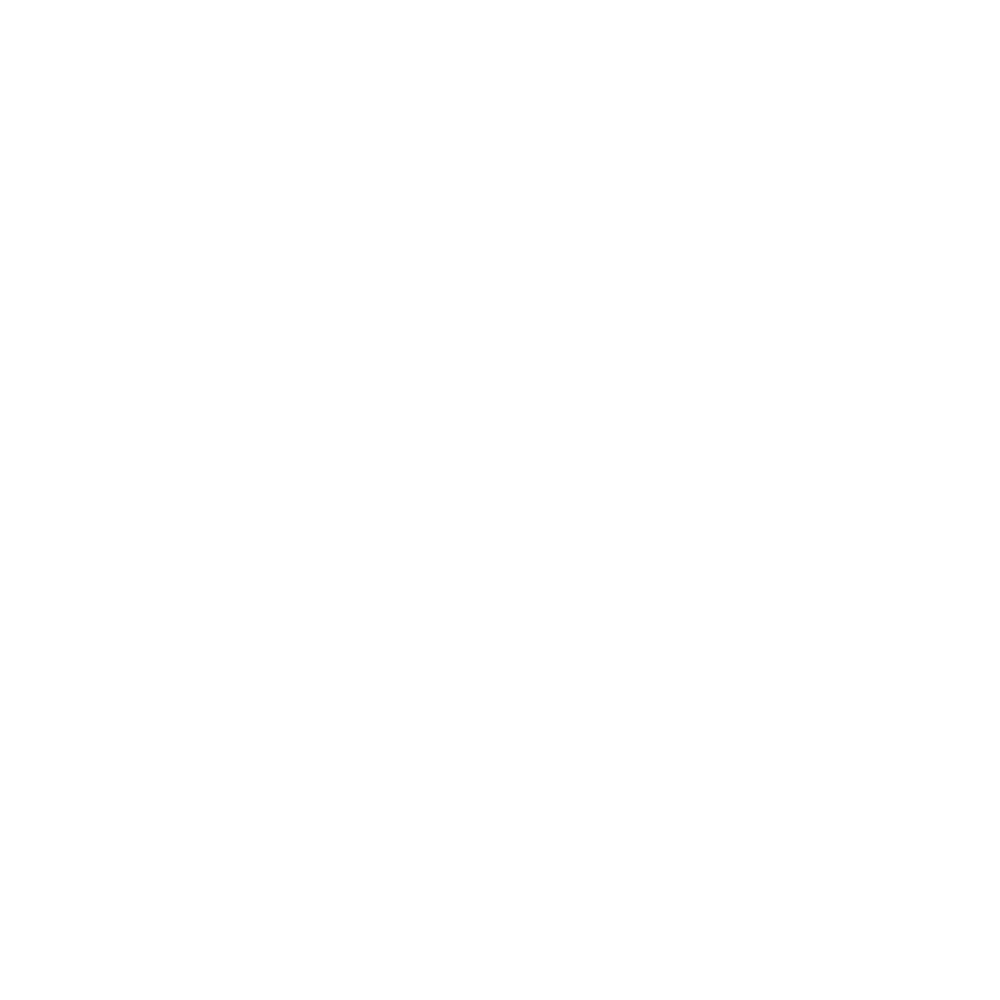

<IPython.core.display.Javascript object>


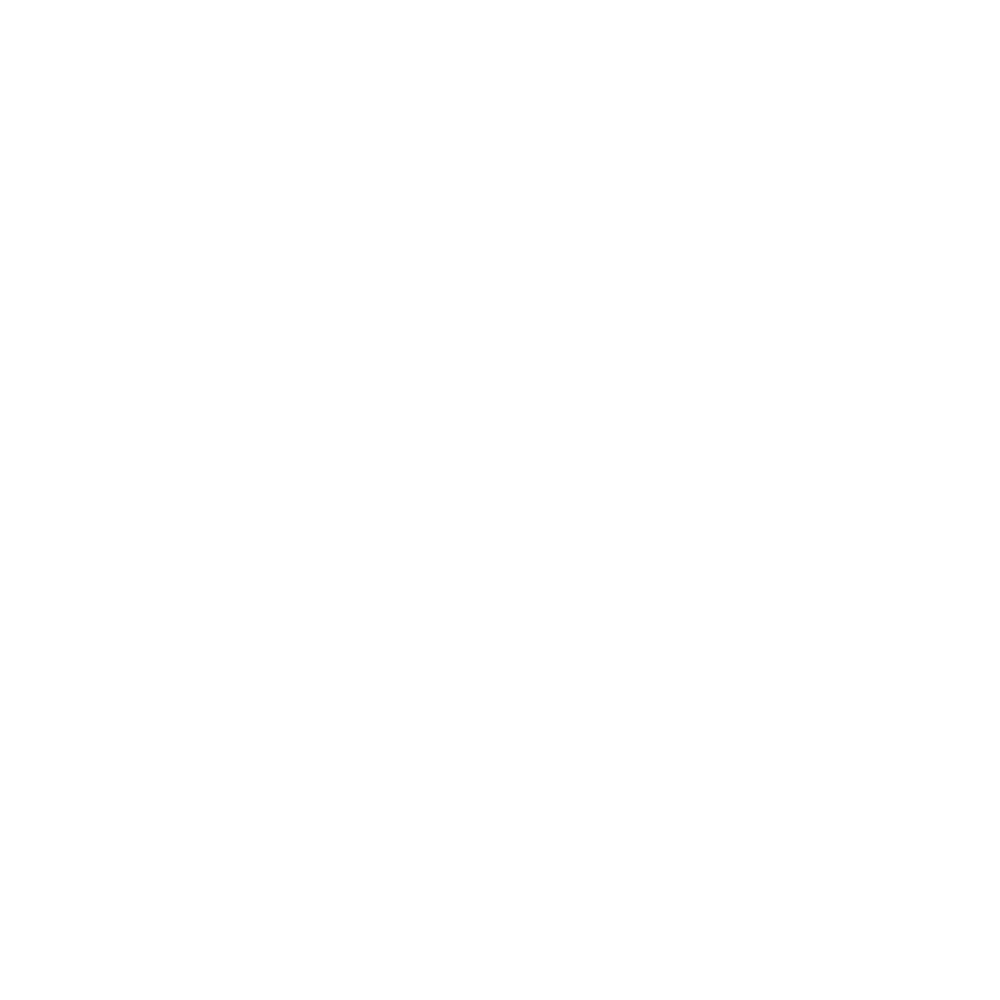

<IPython.core.display.Javascript object>


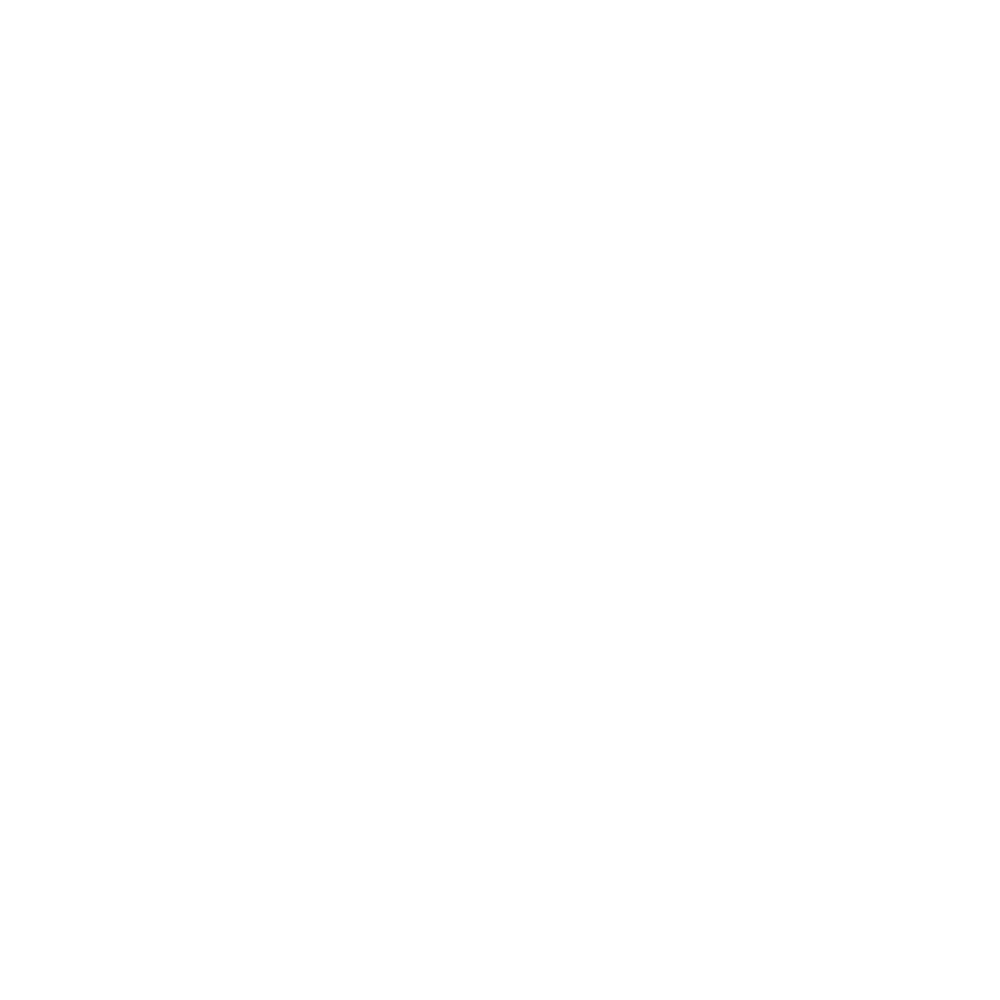

<IPython.core.display.Javascript object>


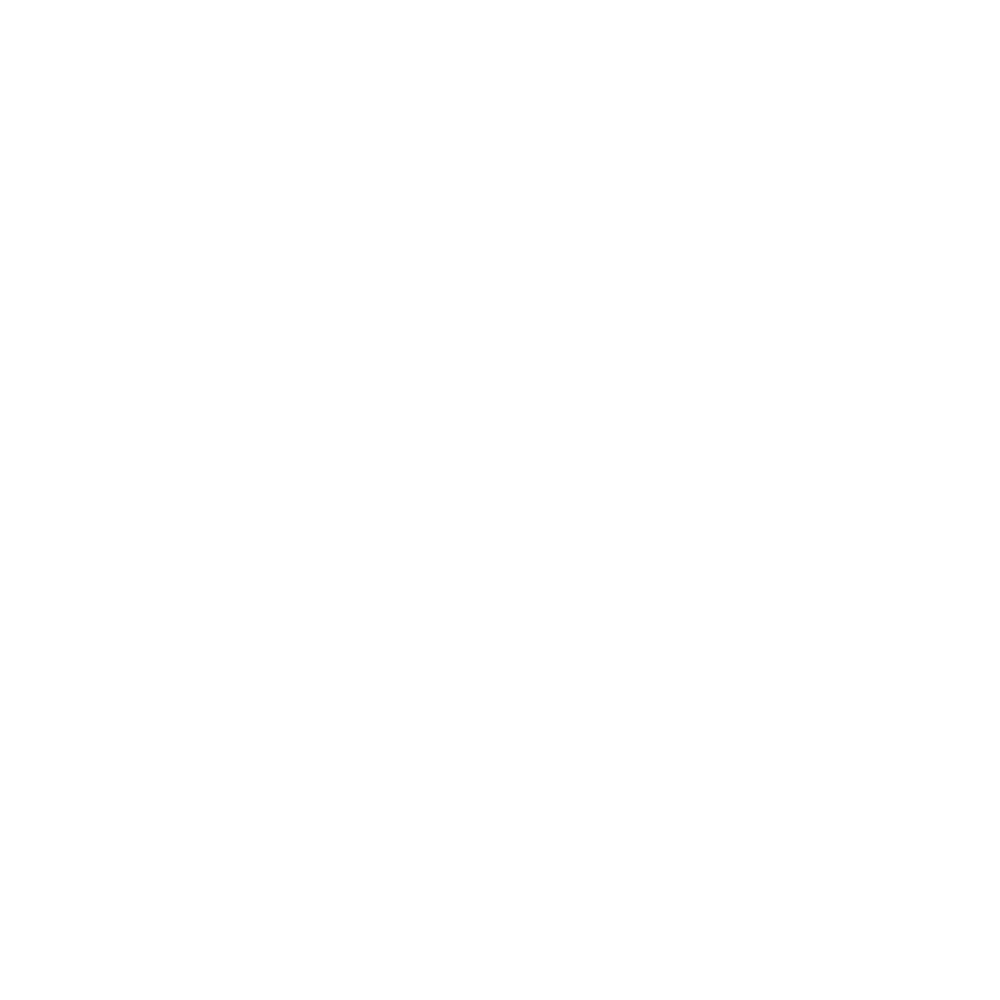

<IPython.core.display.Javascript object>


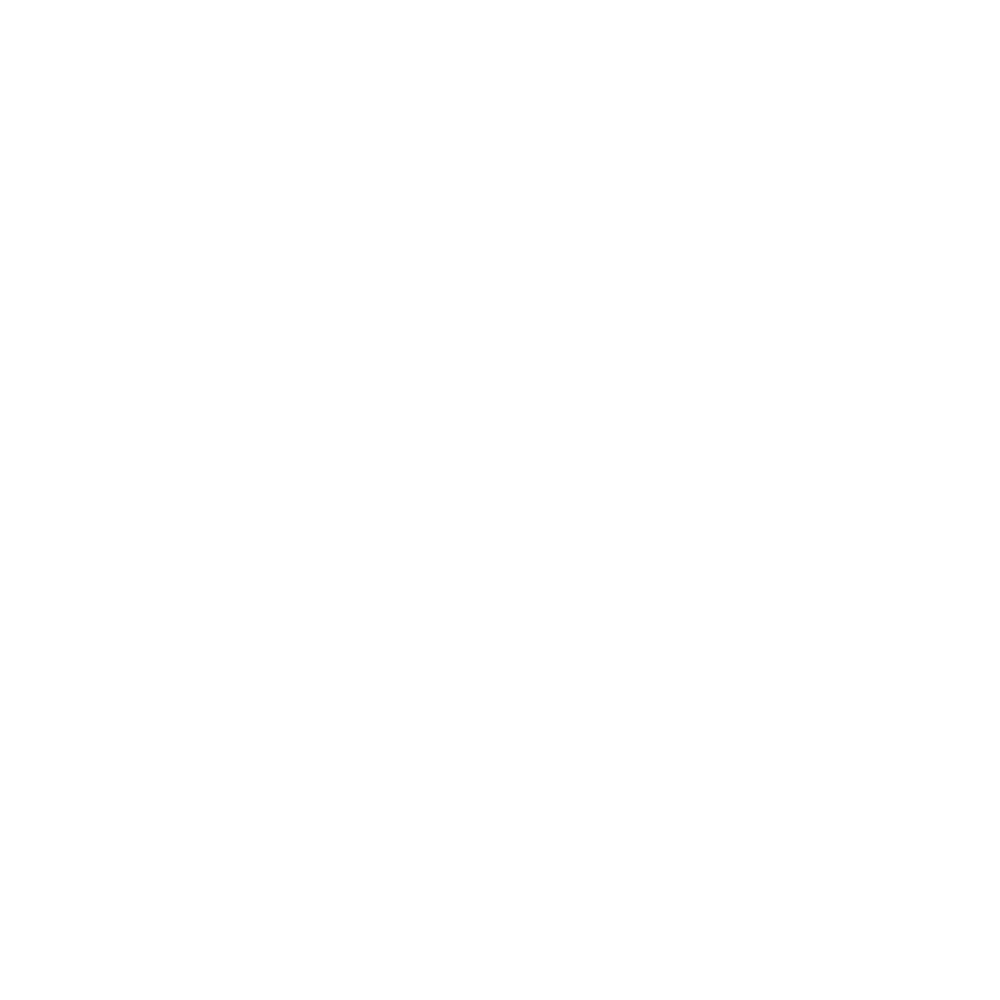

<IPython.core.display.Javascript object>


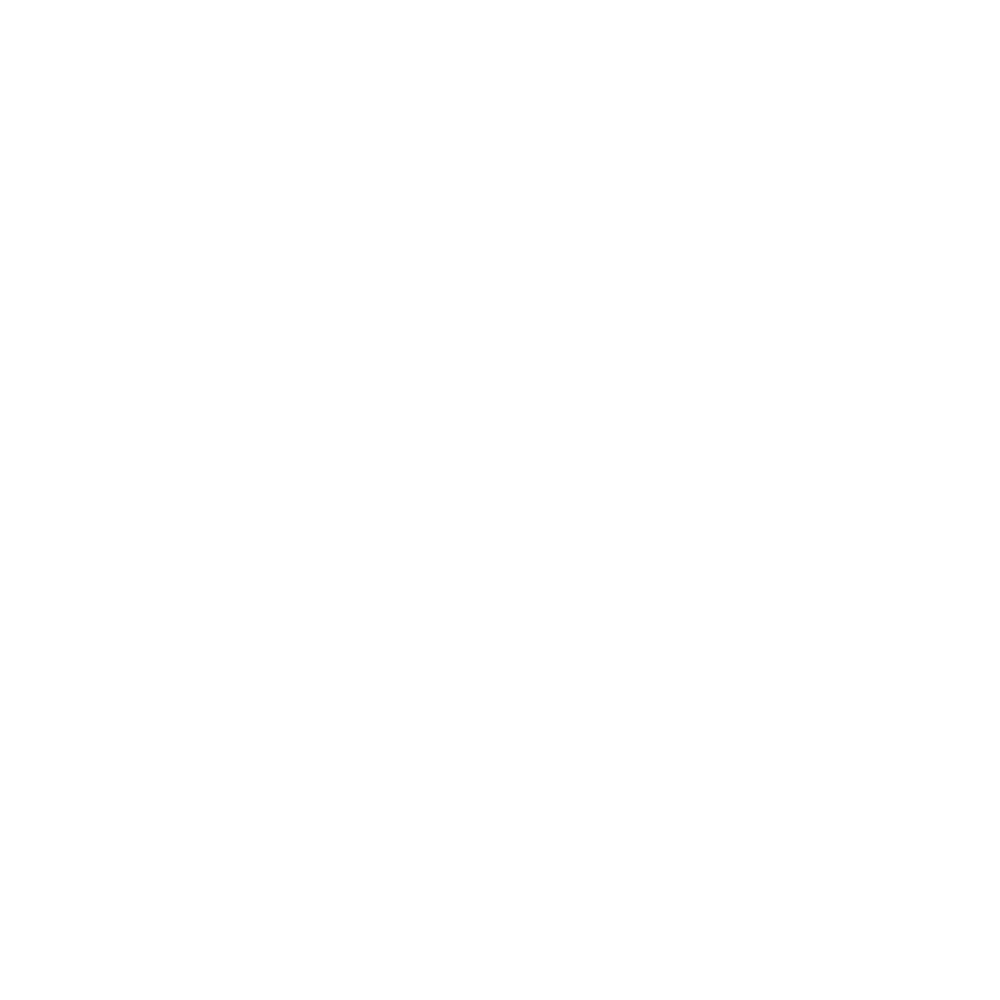

<IPython.core.display.Javascript object>


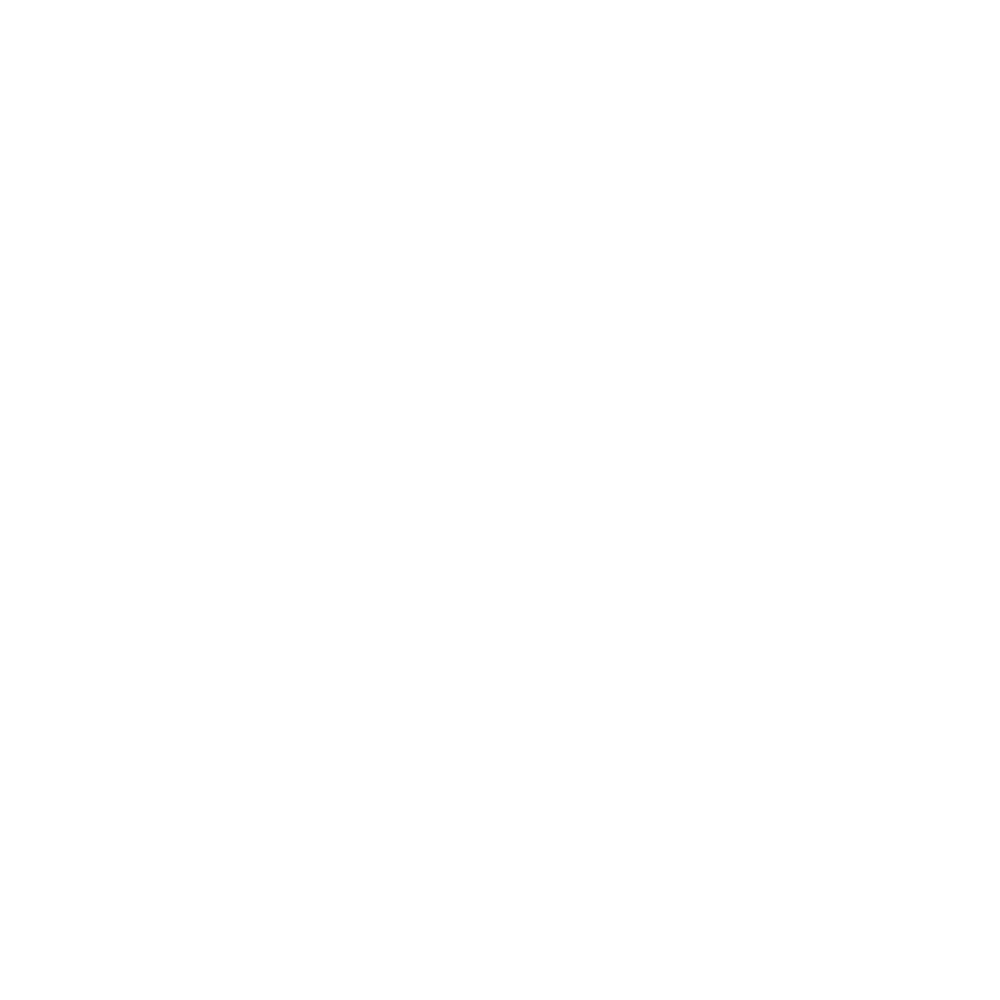

<IPython.core.display.Javascript object>


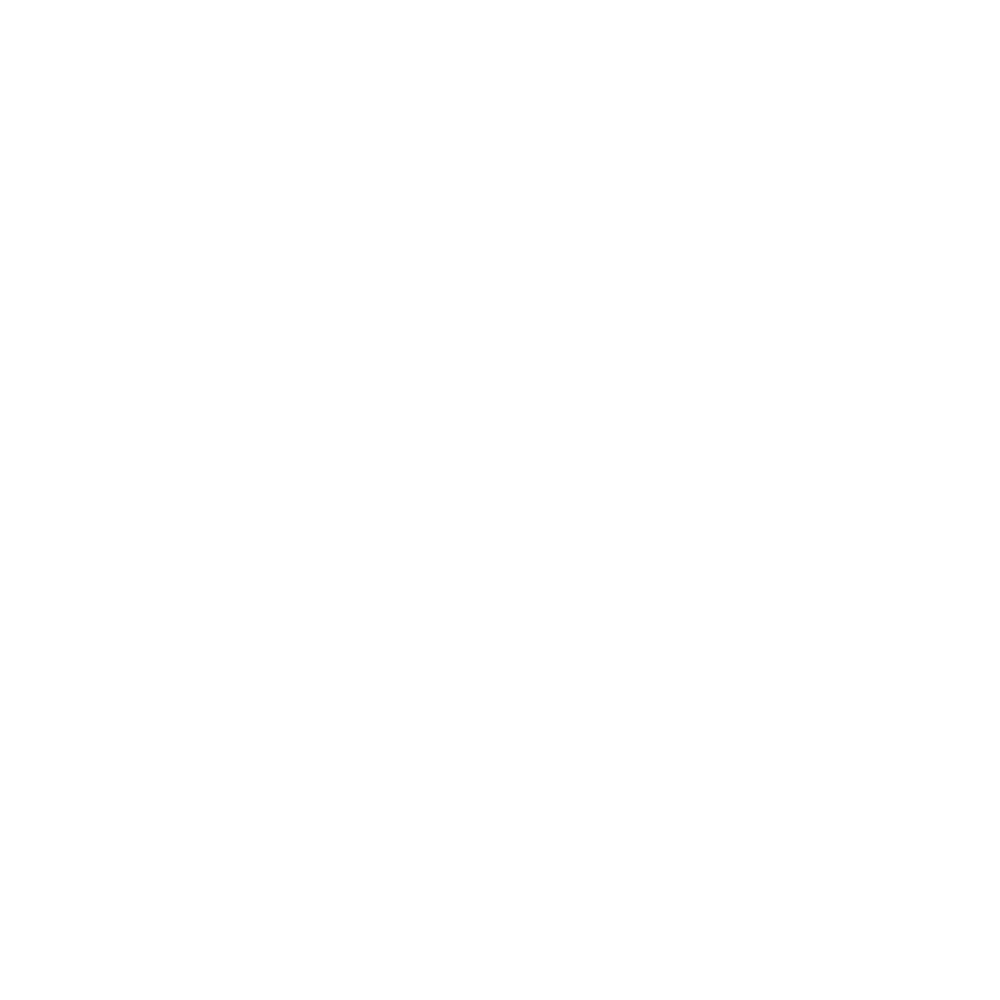

<IPython.core.display.Javascript object>


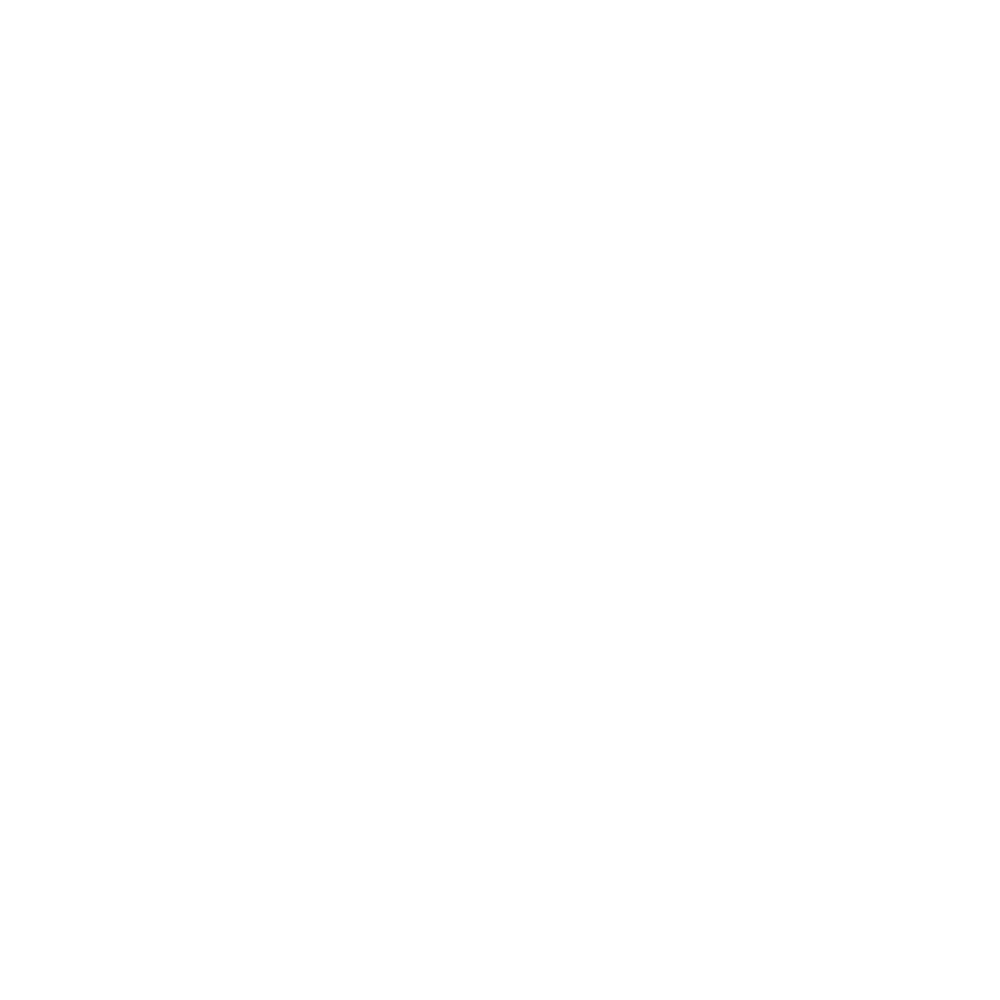

<IPython.core.display.Javascript object>


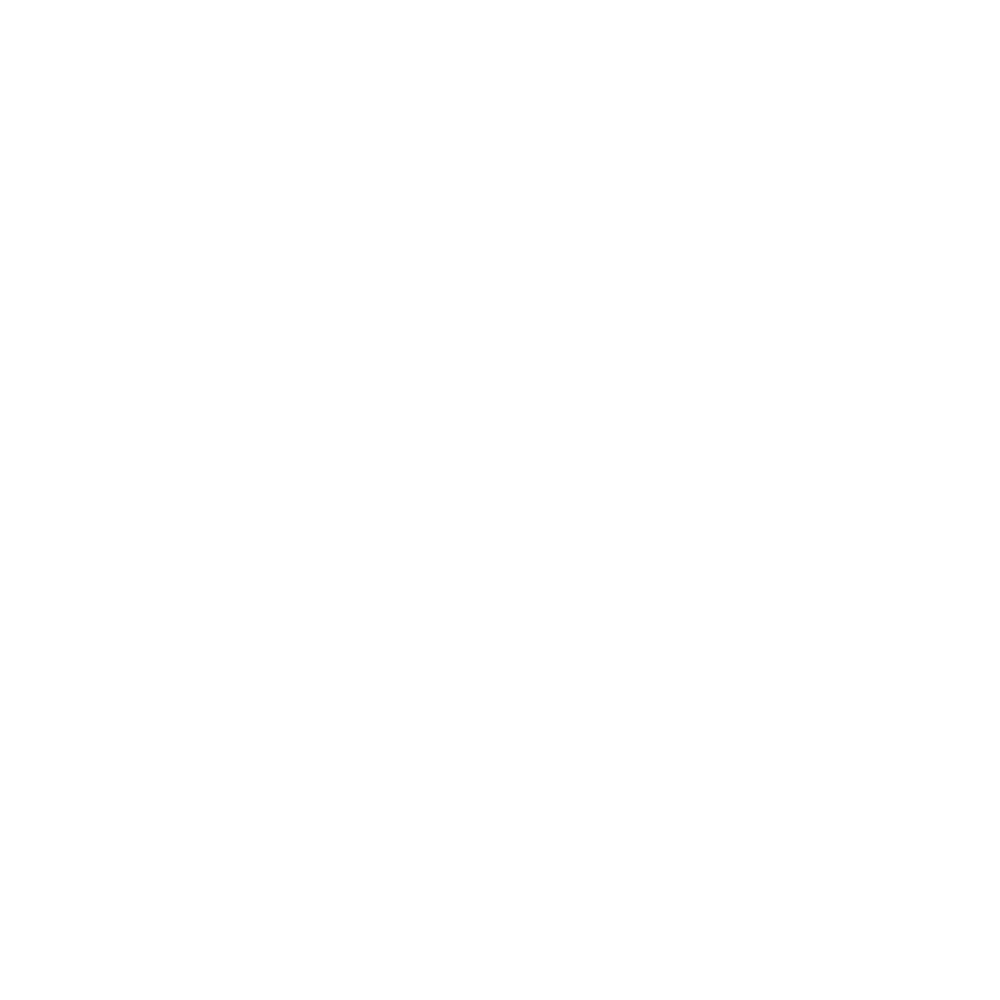

<IPython.core.display.Javascript object>


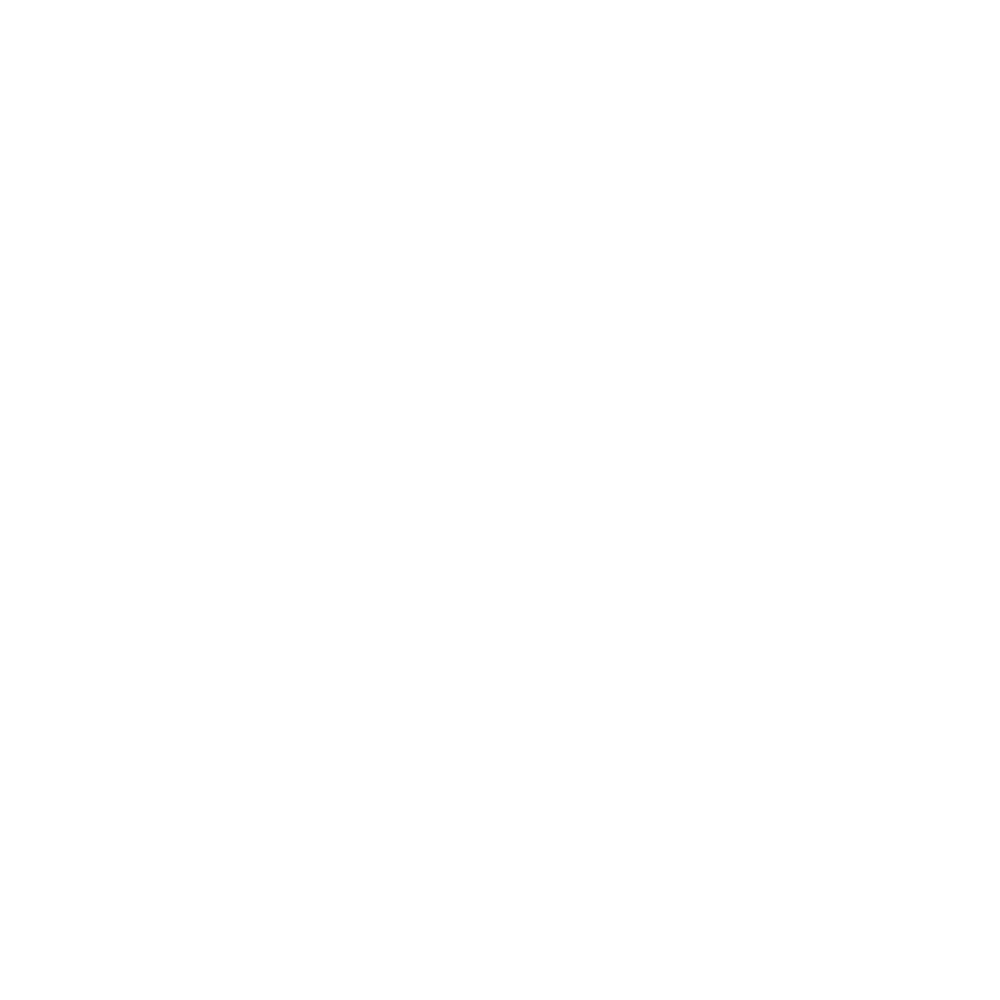

<IPython.core.display.Javascript object>


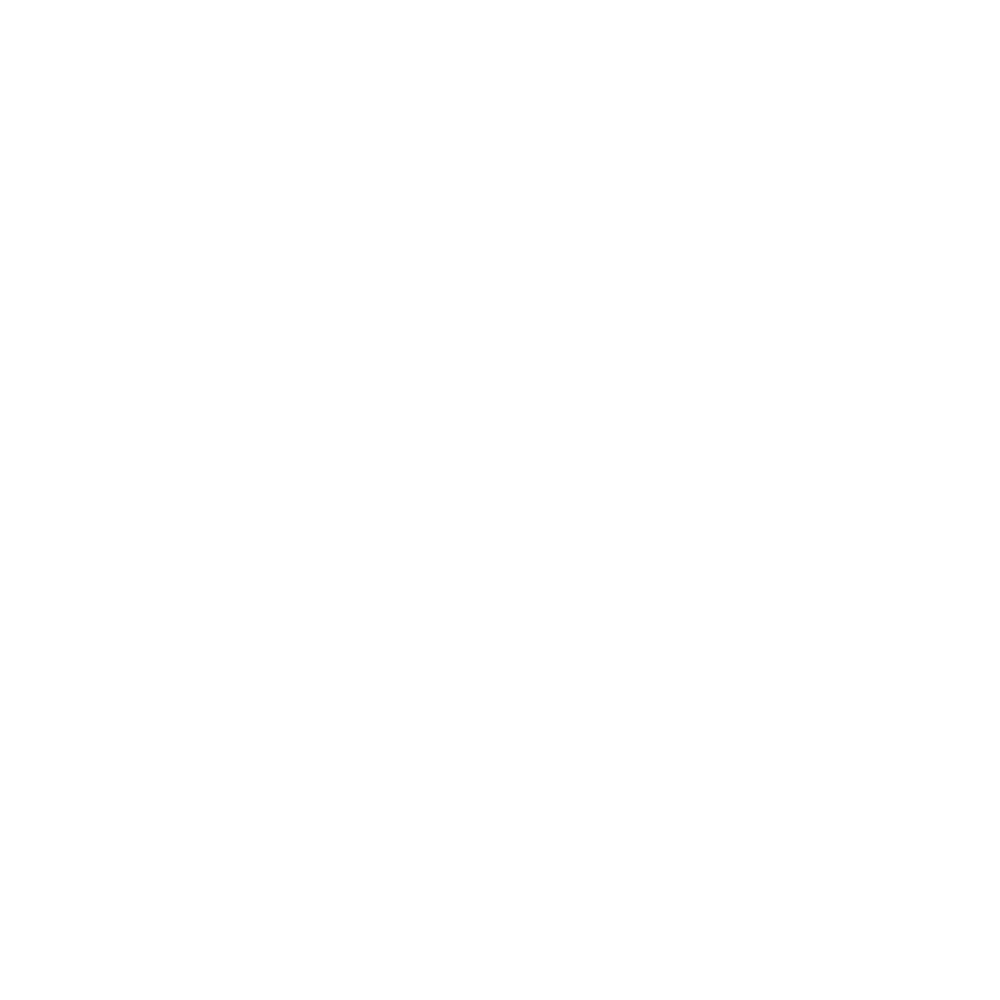

<IPython.core.display.Javascript object>


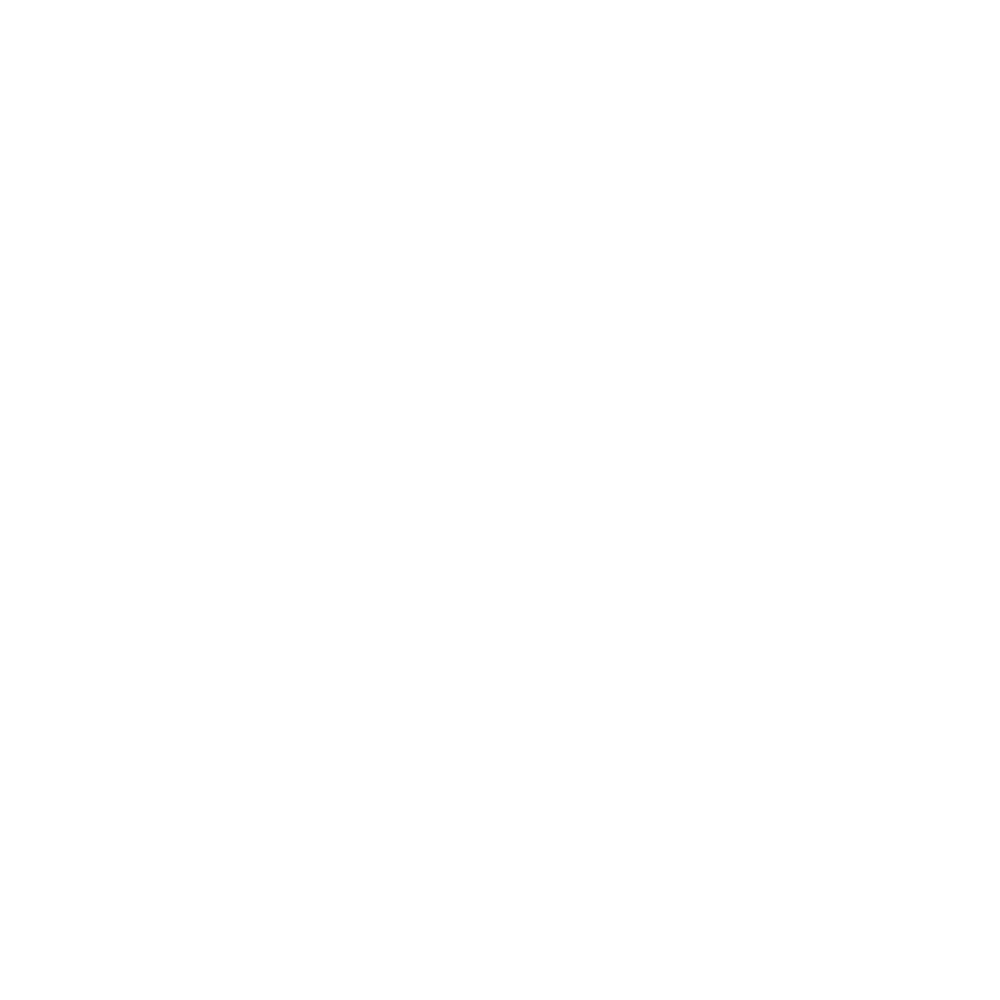

<IPython.core.display.Javascript object>


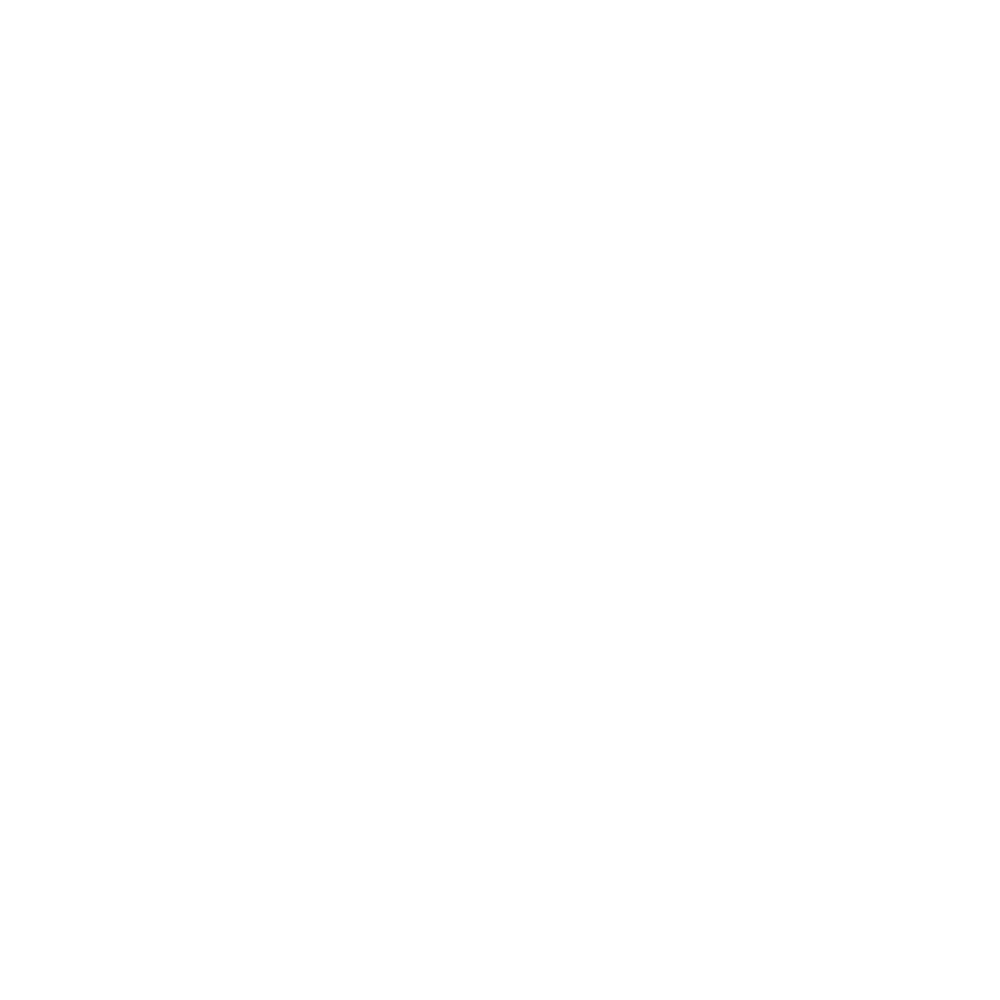

<IPython.core.display.Javascript object>


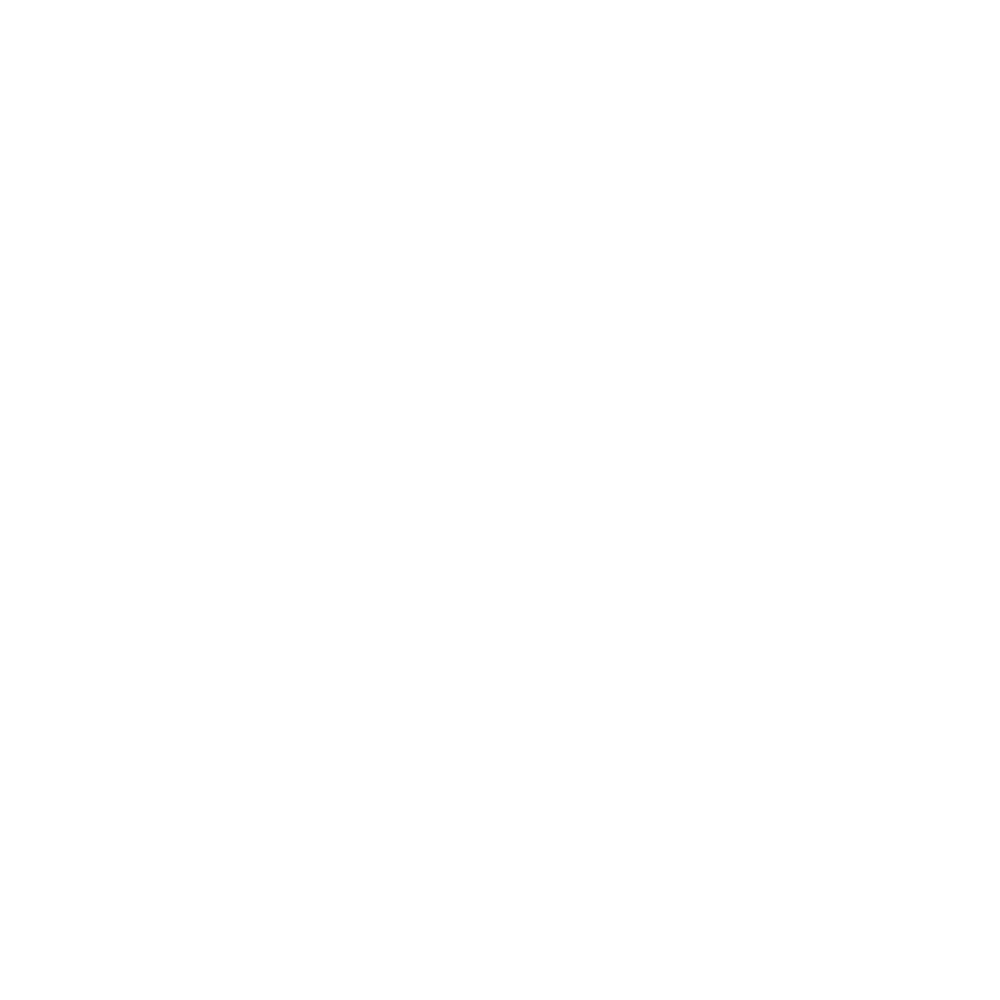

<IPython.core.display.Javascript object>


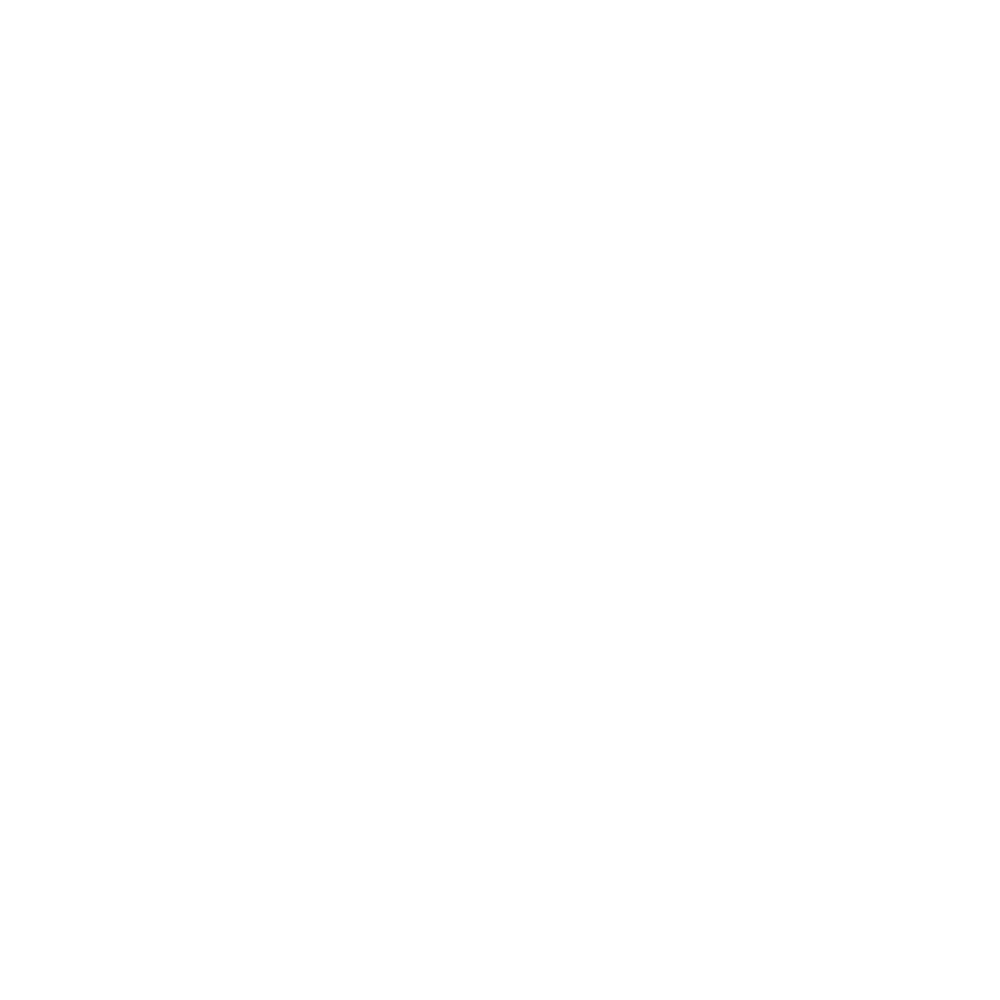

<IPython.core.display.Javascript object>


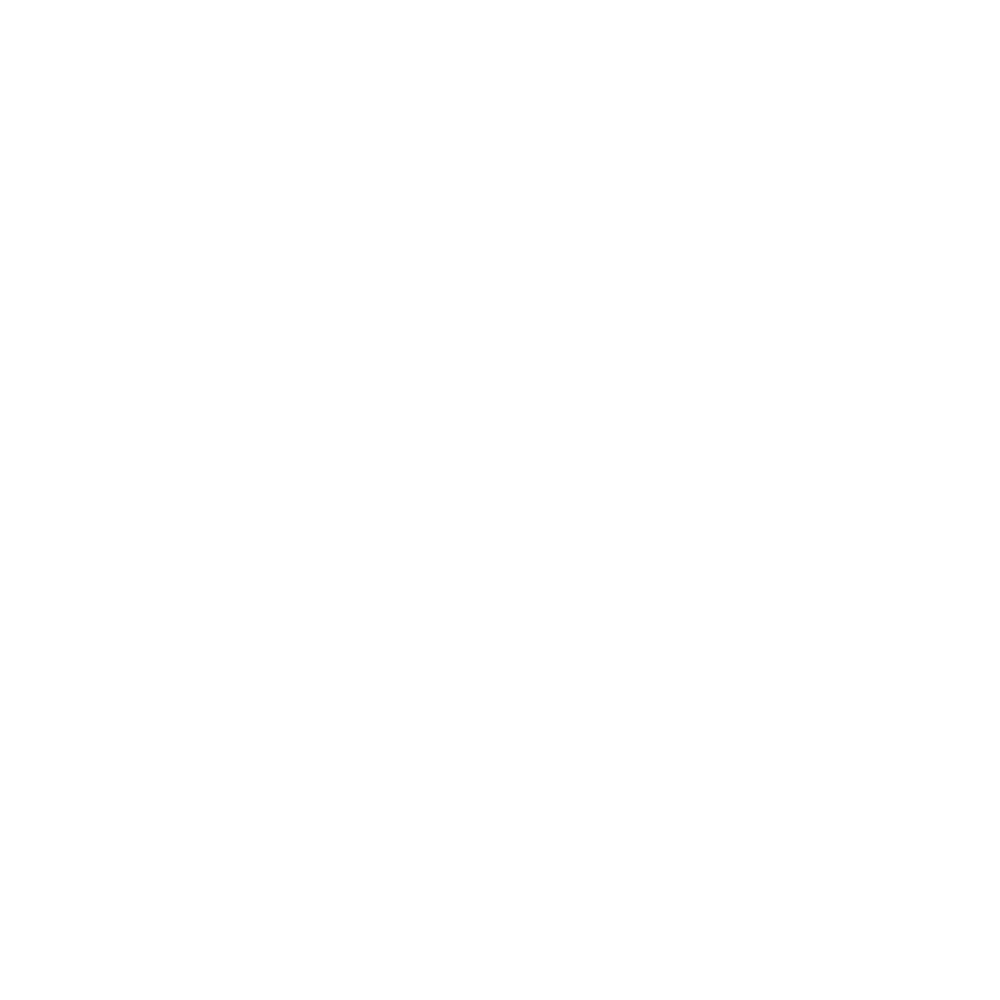

<IPython.core.display.Javascript object>


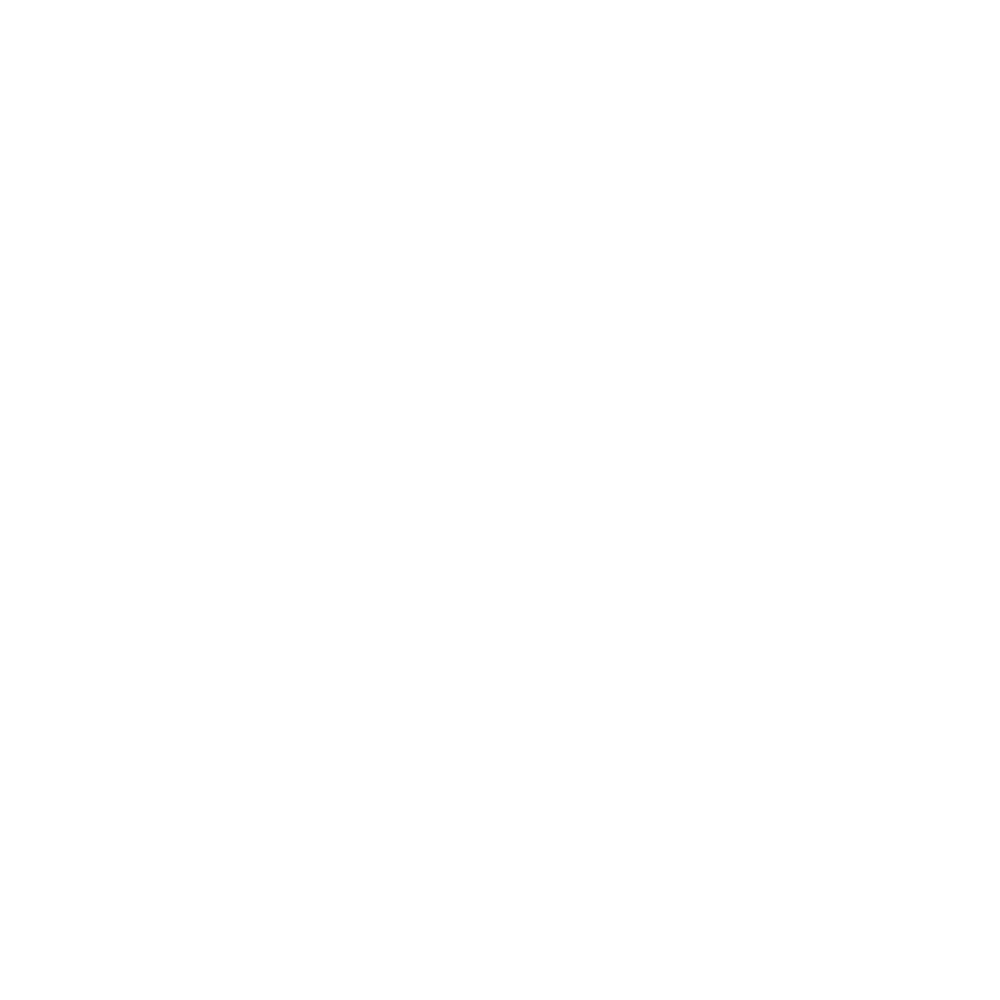

<IPython.core.display.Javascript object>


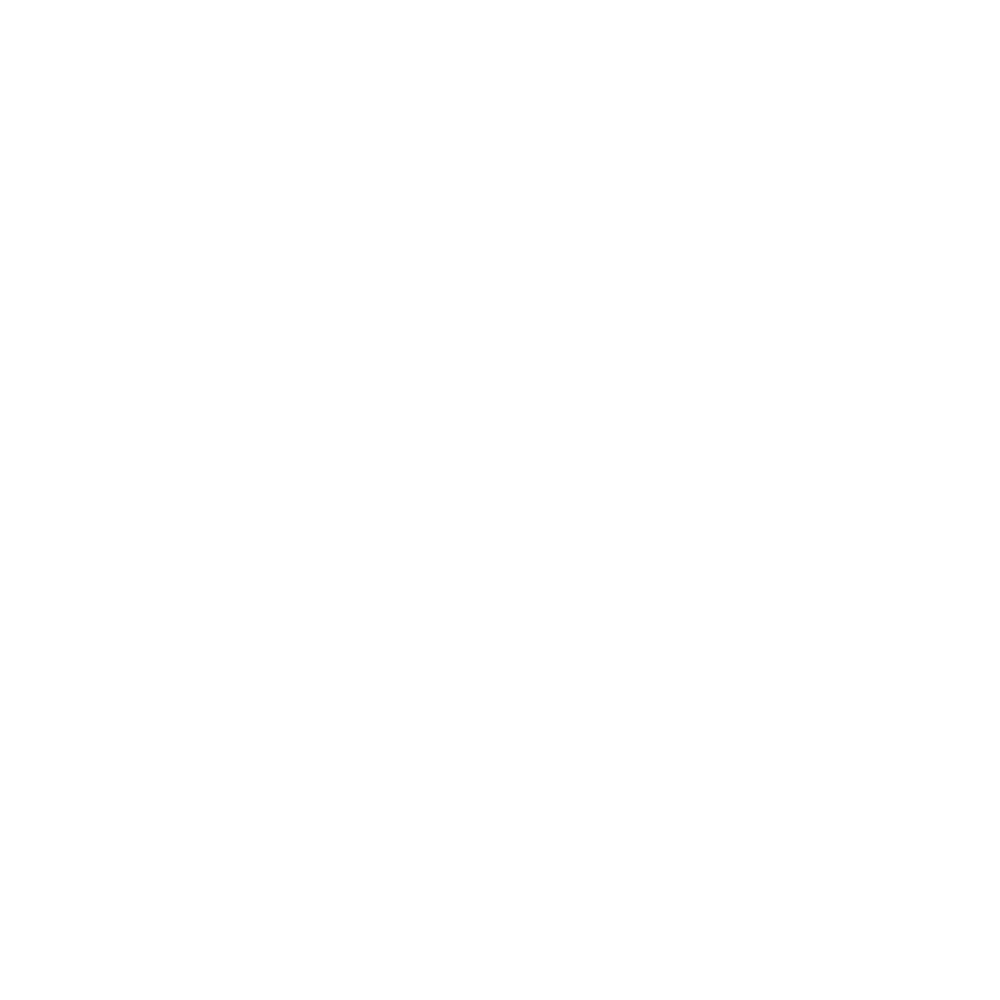

<IPython.core.display.Javascript object>


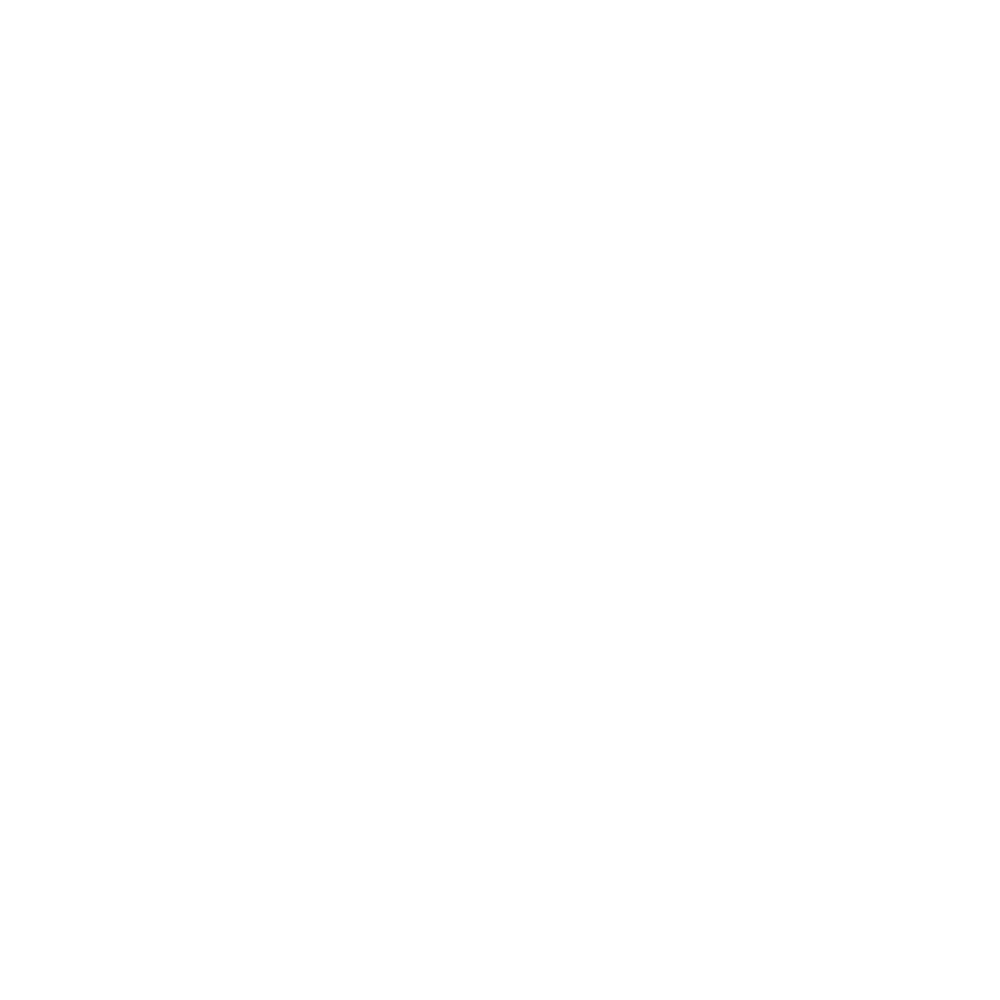

<IPython.core.display.Javascript object>


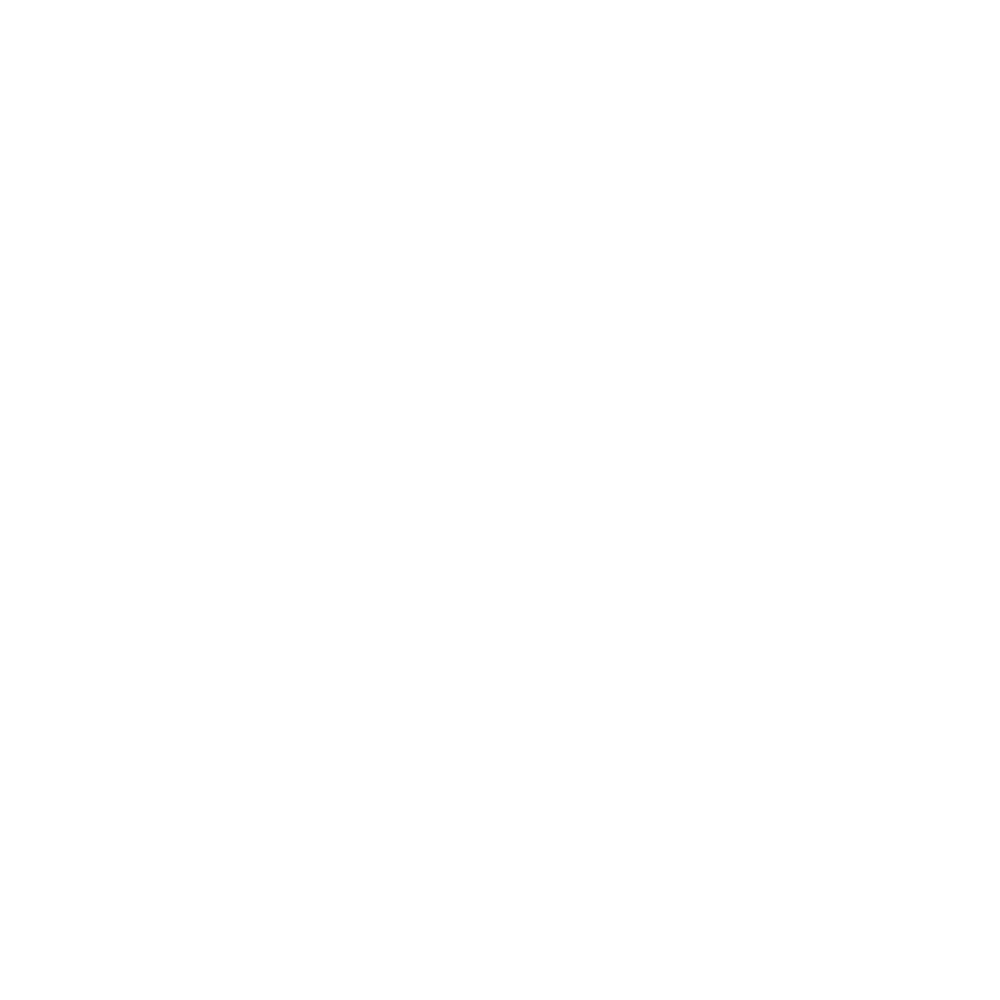

<IPython.core.display.Javascript object>


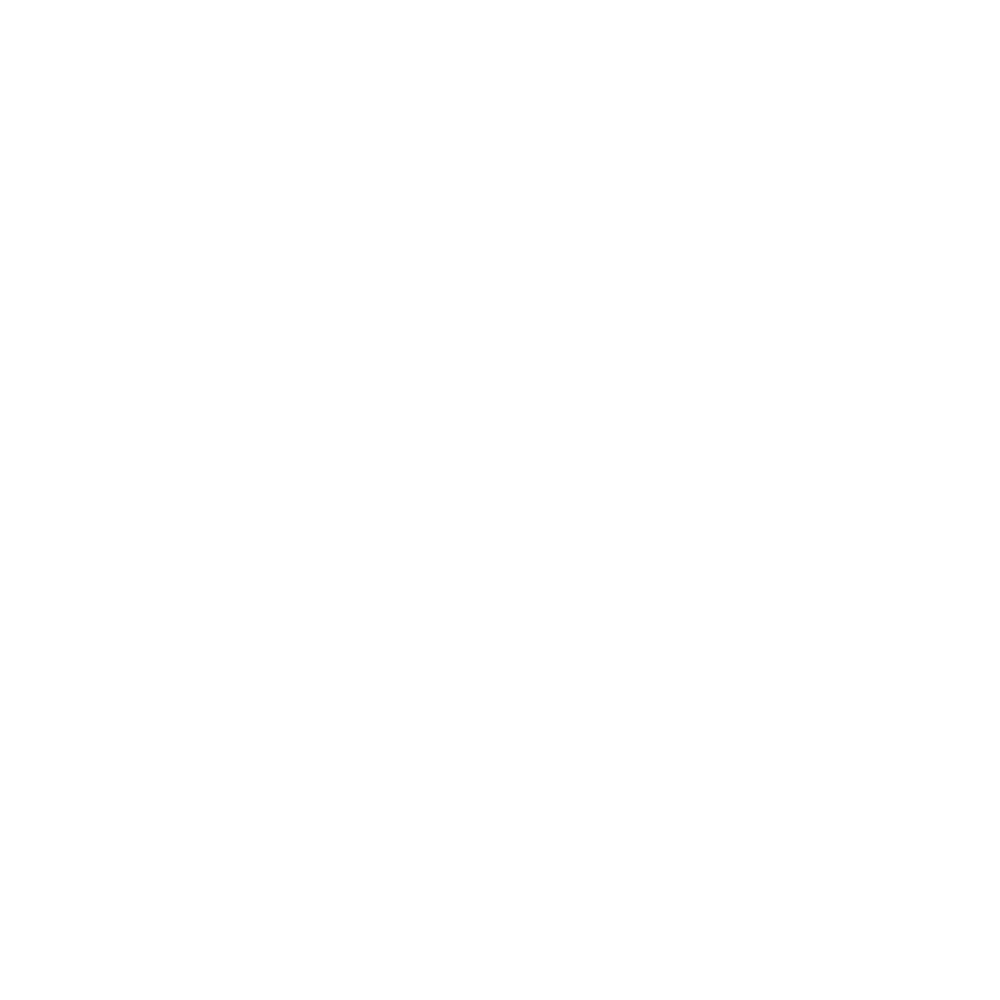

<IPython.core.display.Javascript object>


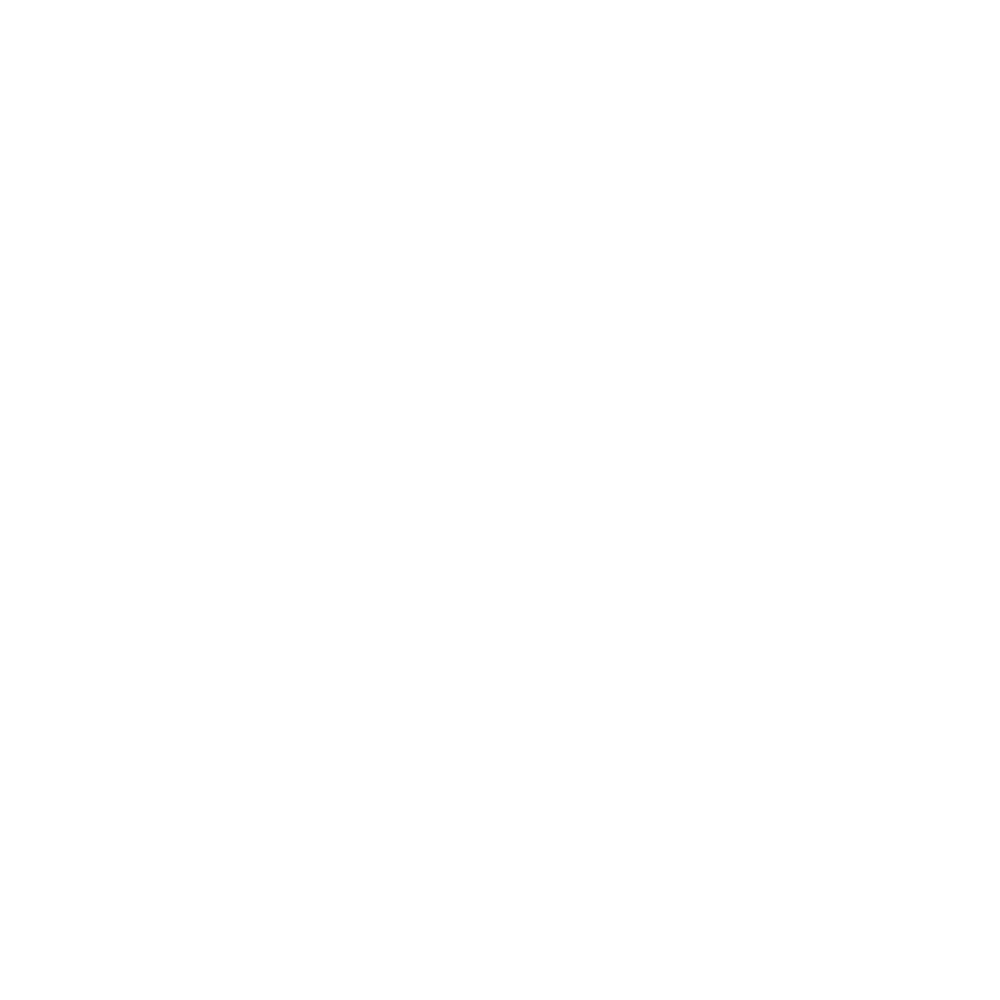

<IPython.core.display.Javascript object>


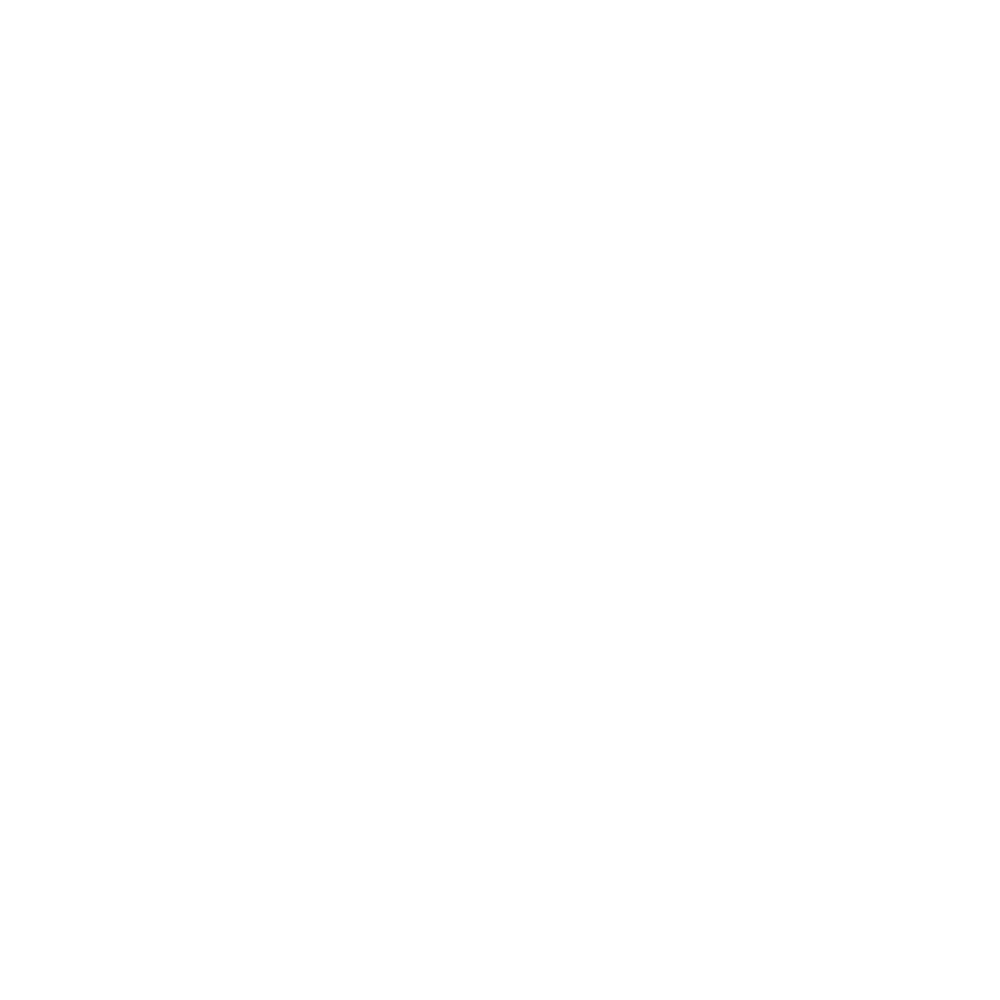

<IPython.core.display.Javascript object>


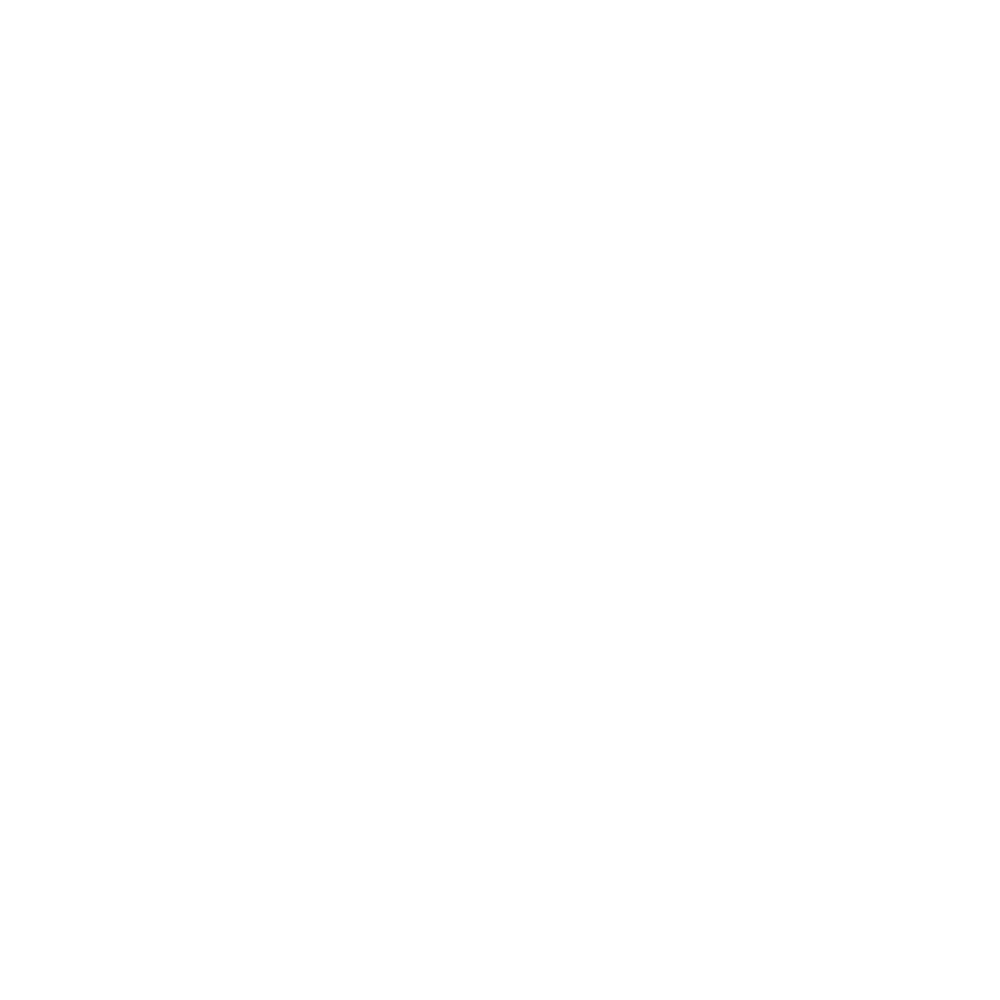

<IPython.core.display.Javascript object>


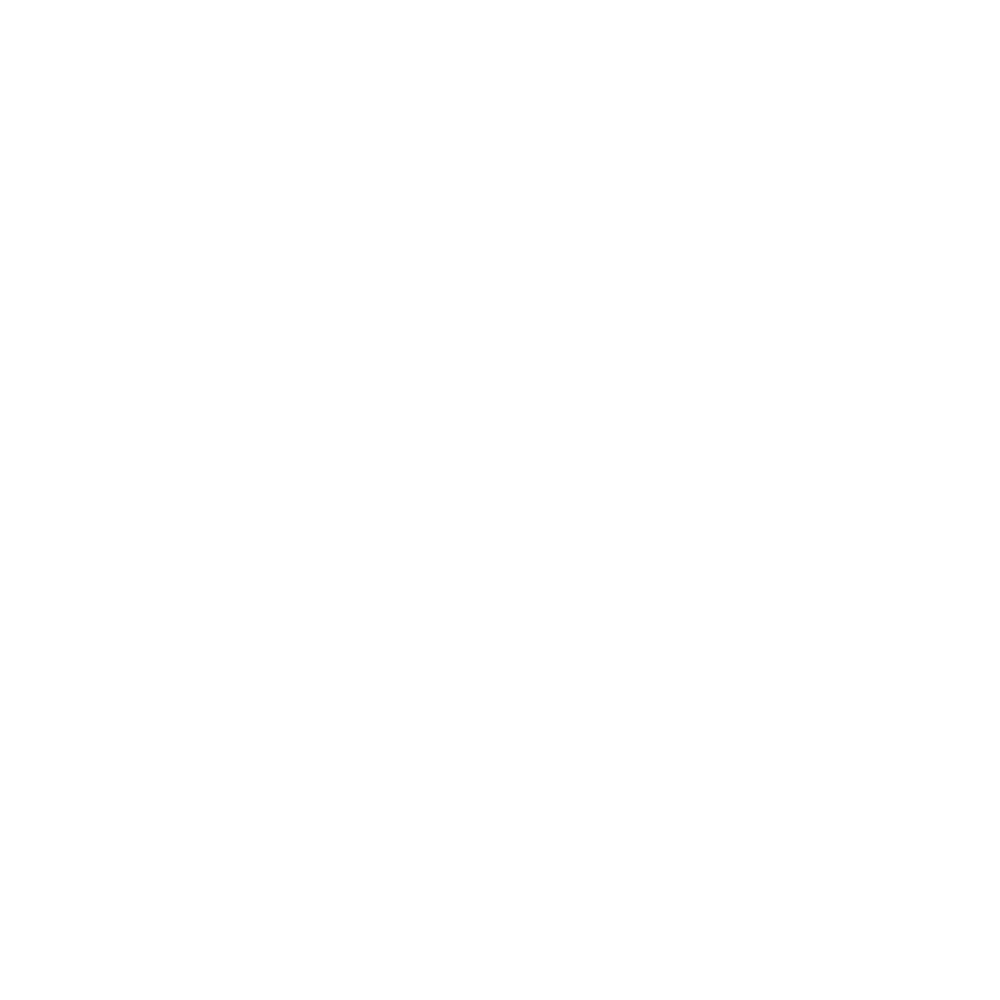

<IPython.core.display.Javascript object>


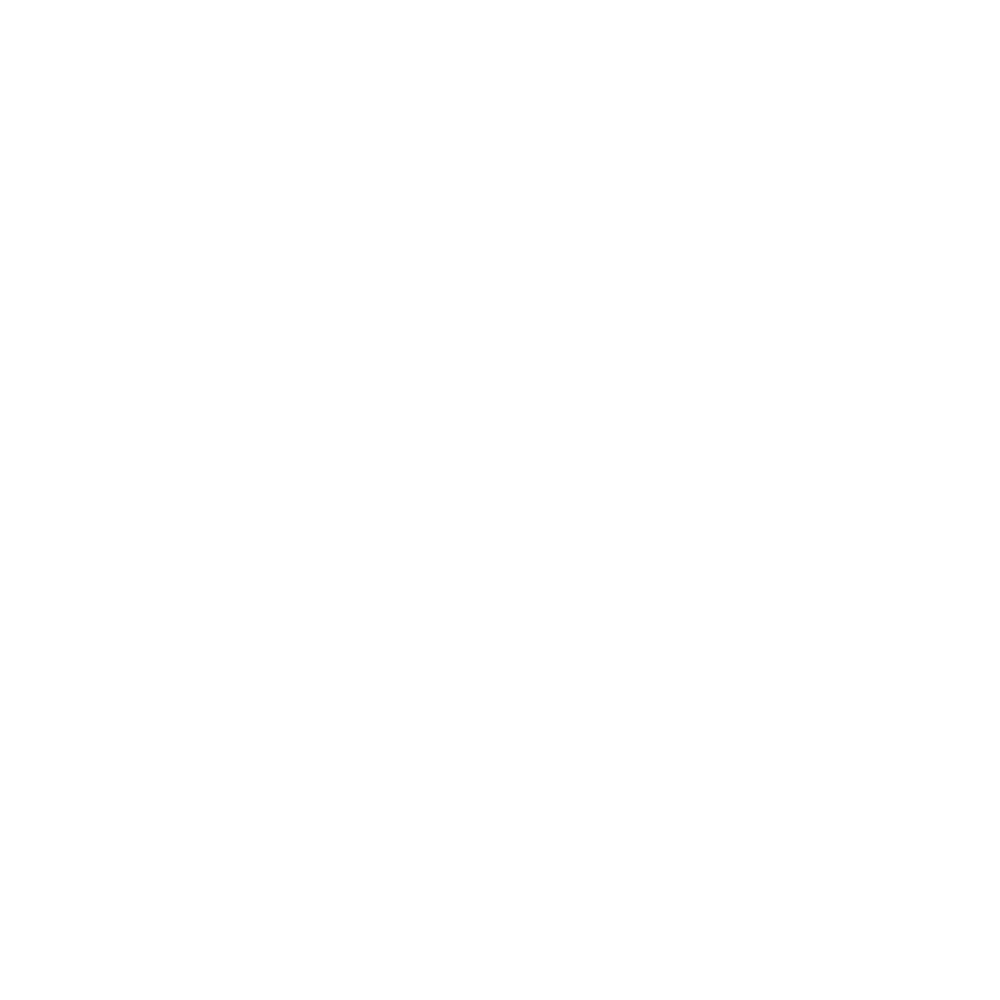

<IPython.core.display.Javascript object>


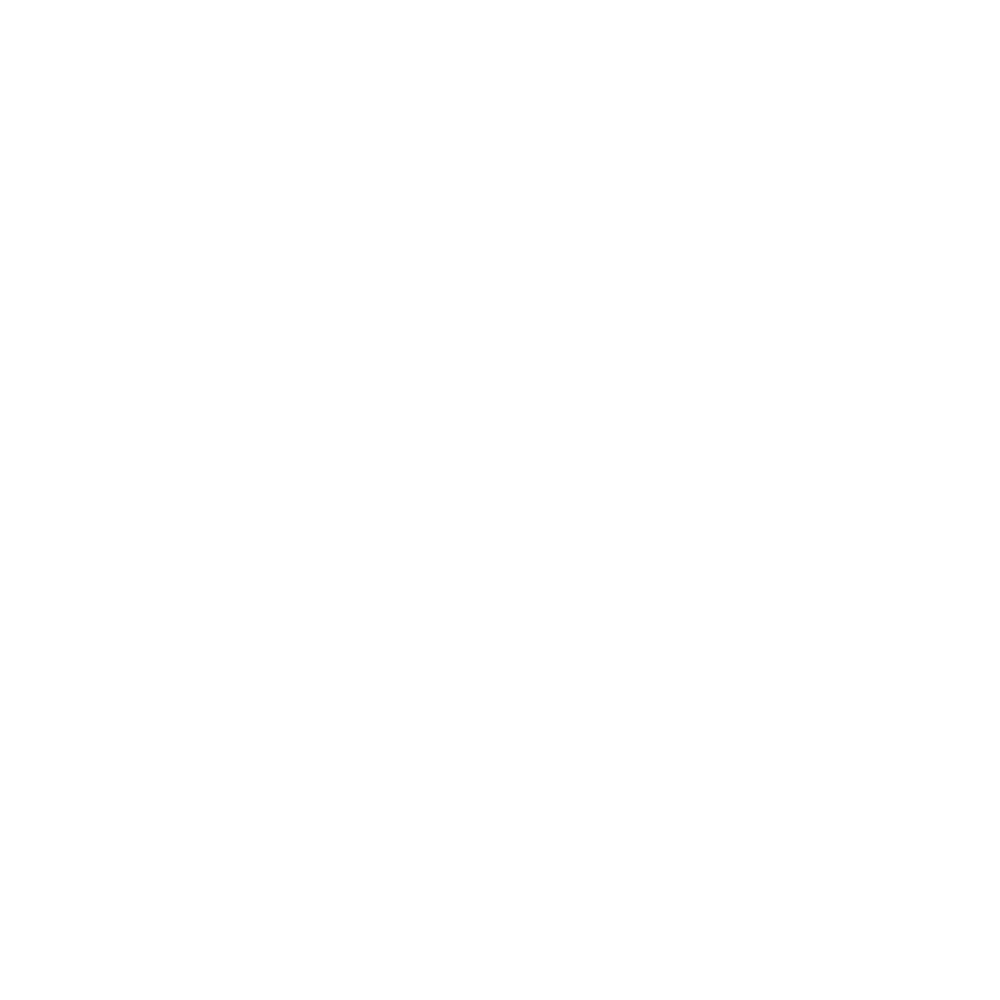

<IPython.core.display.Javascript object>


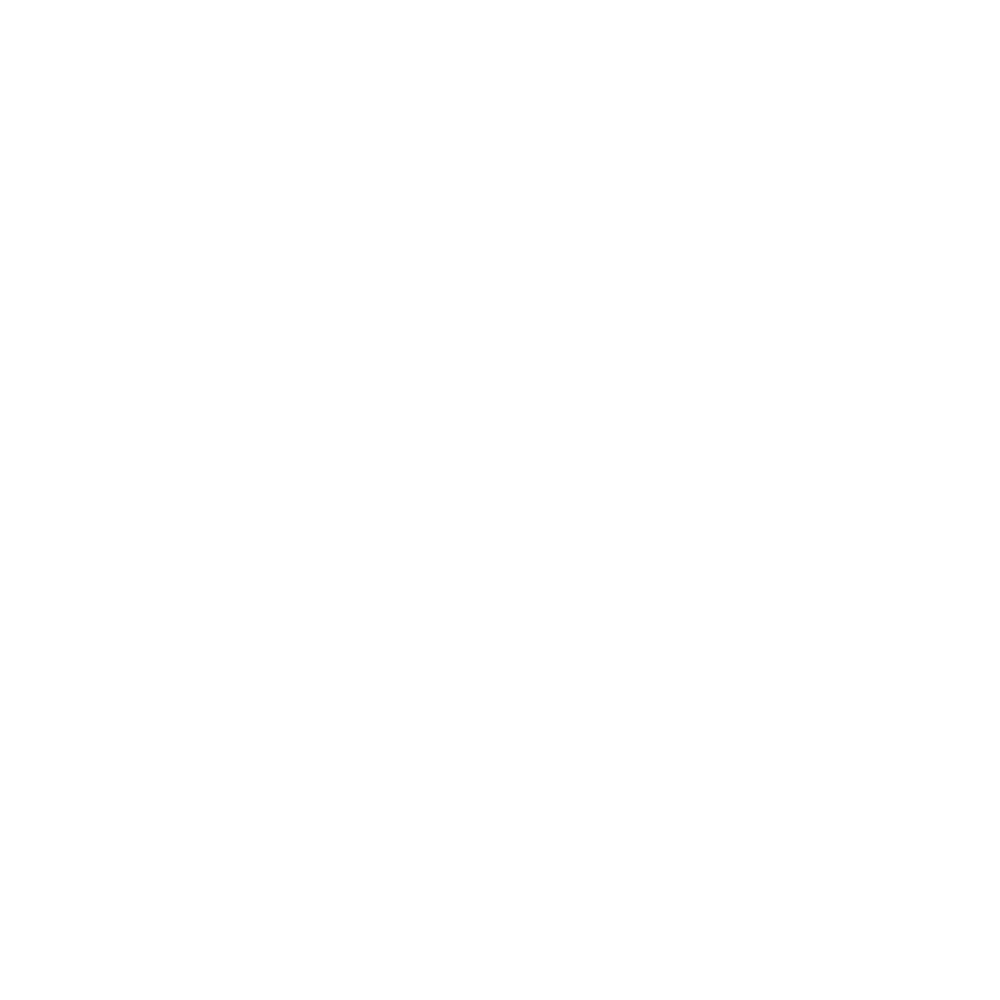

<IPython.core.display.Javascript object>


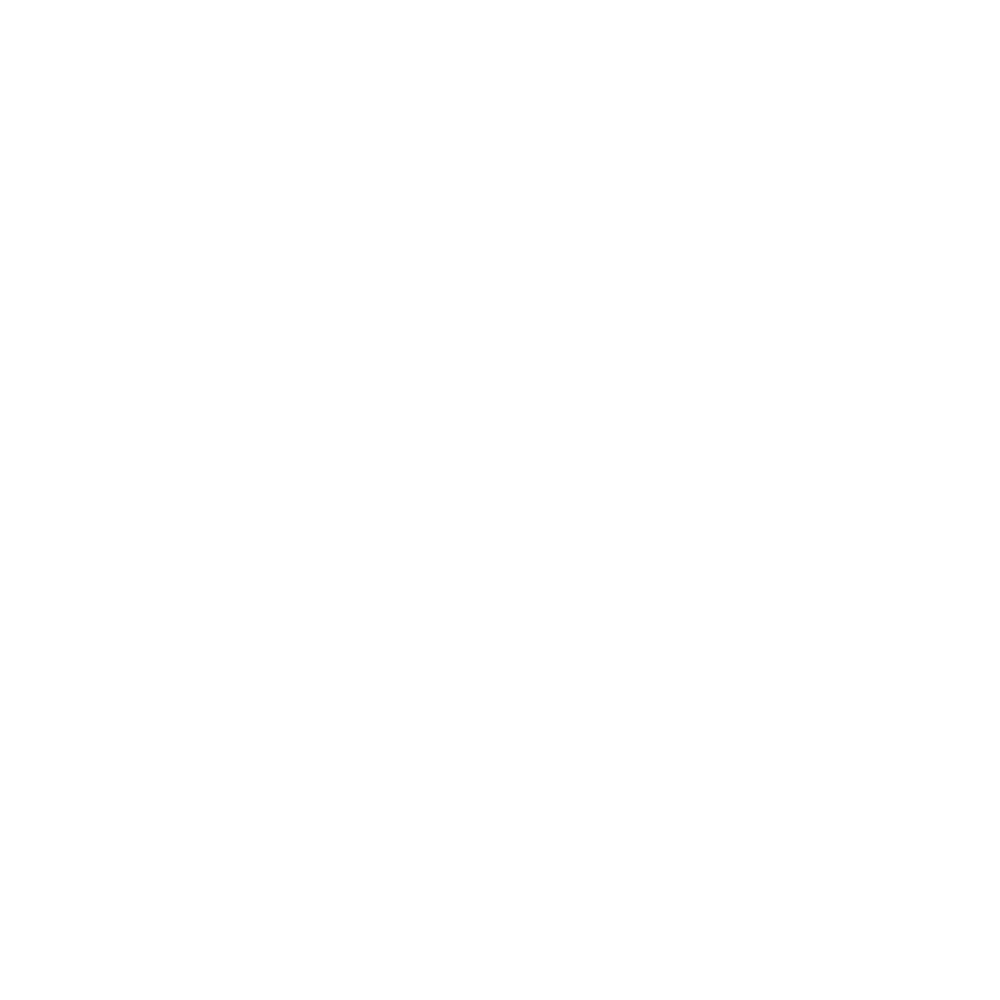

<IPython.core.display.Javascript object>


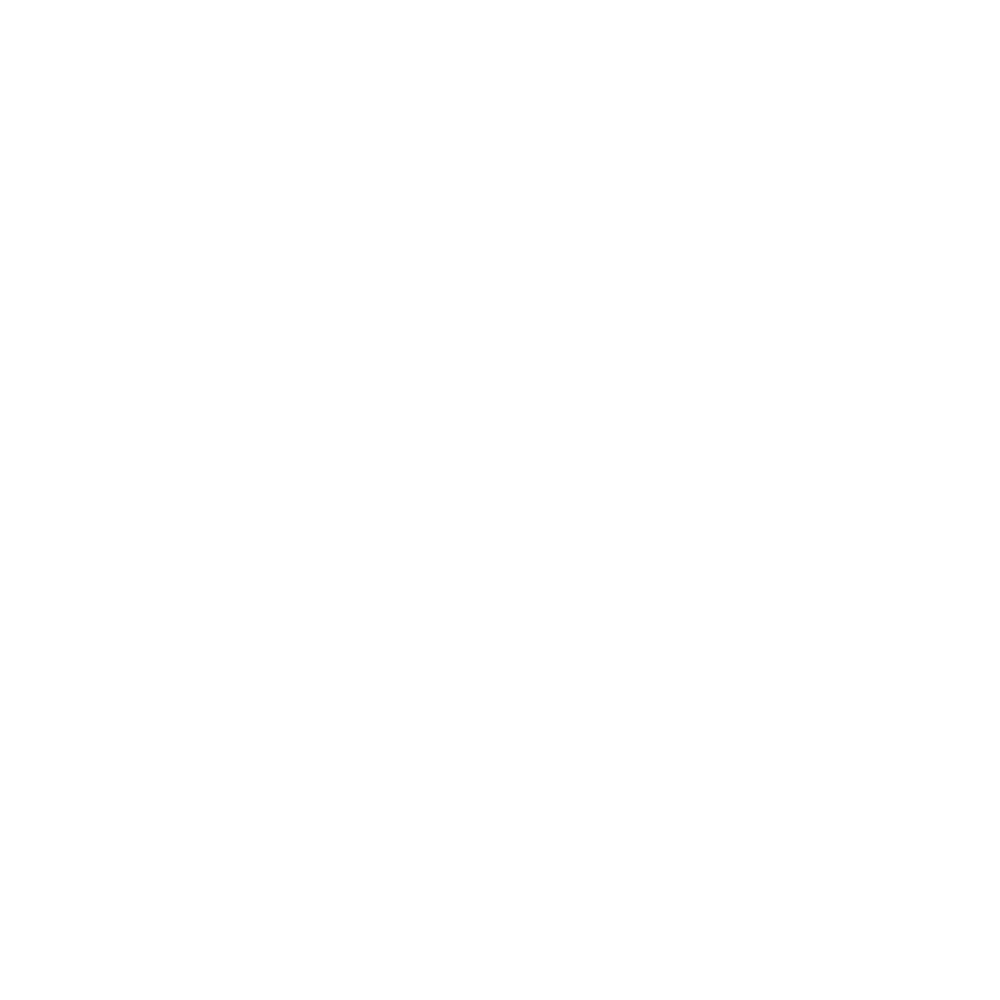

<IPython.core.display.Javascript object>


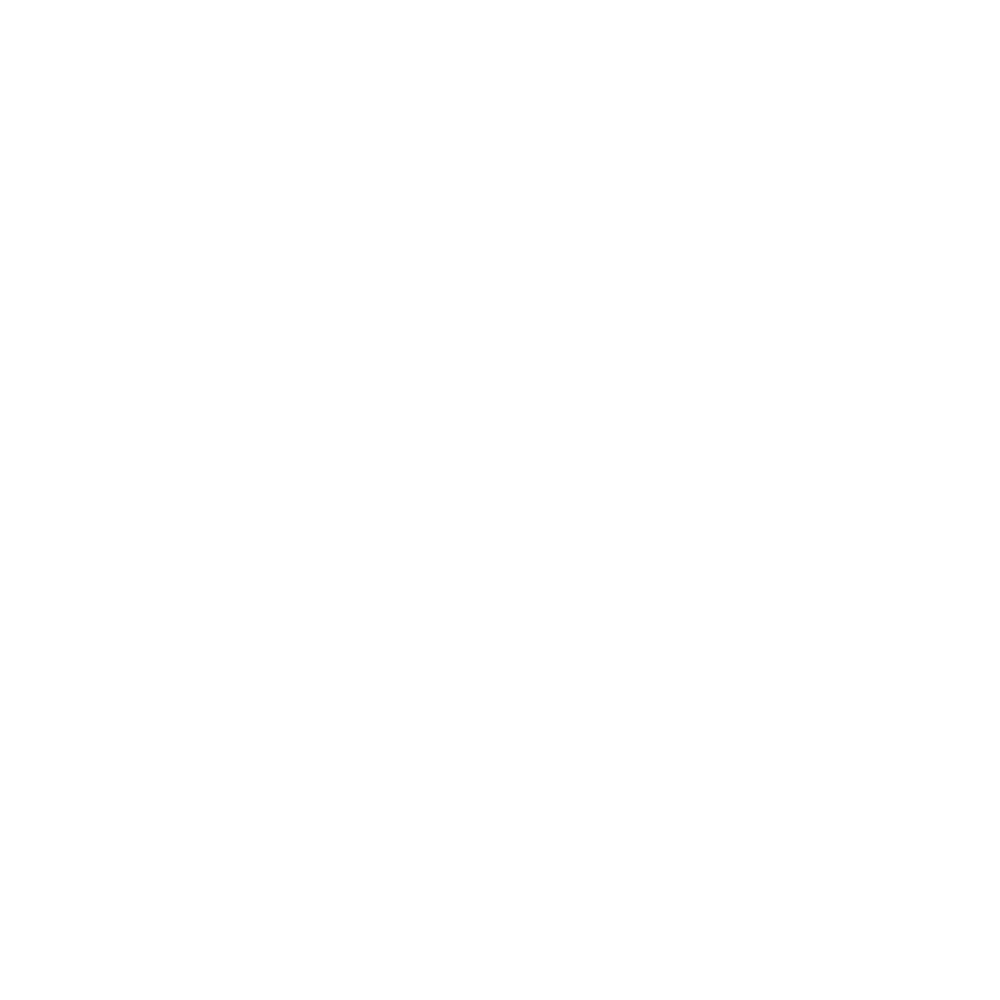

<IPython.core.display.Javascript object>


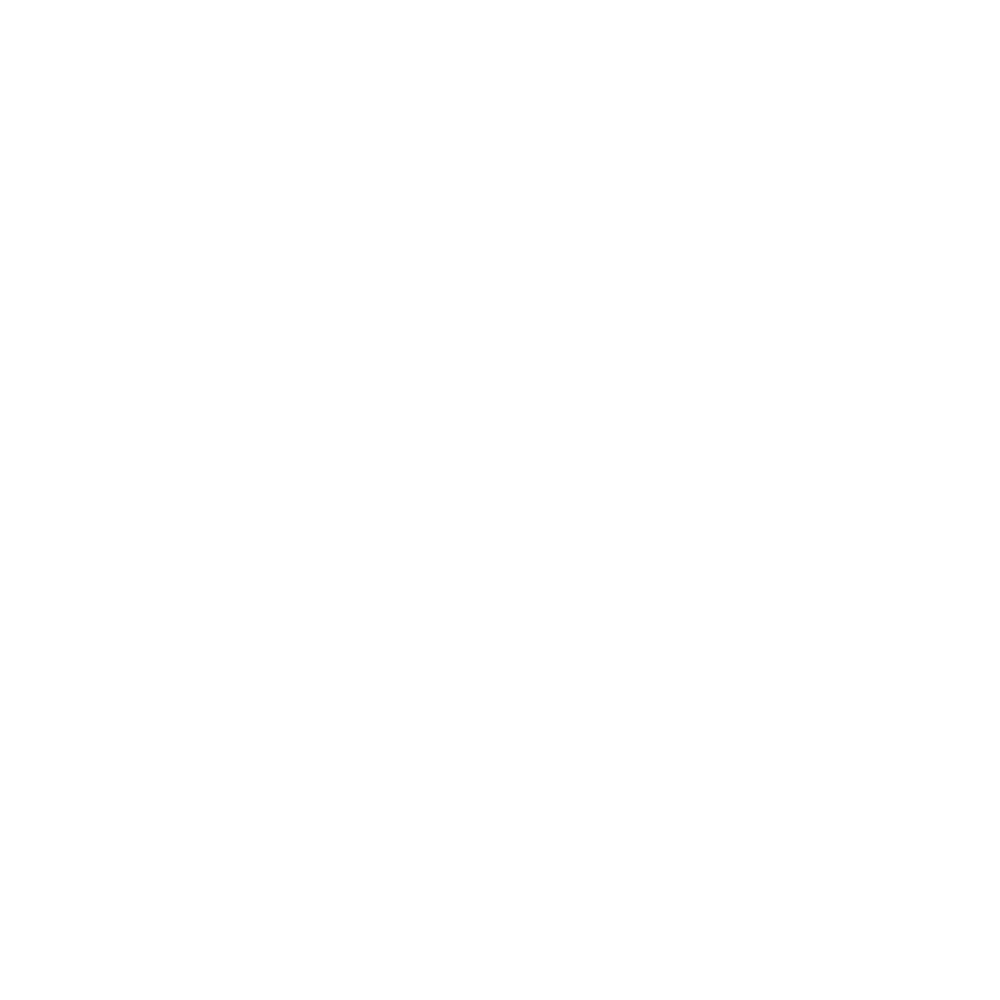

<IPython.core.display.Javascript object>


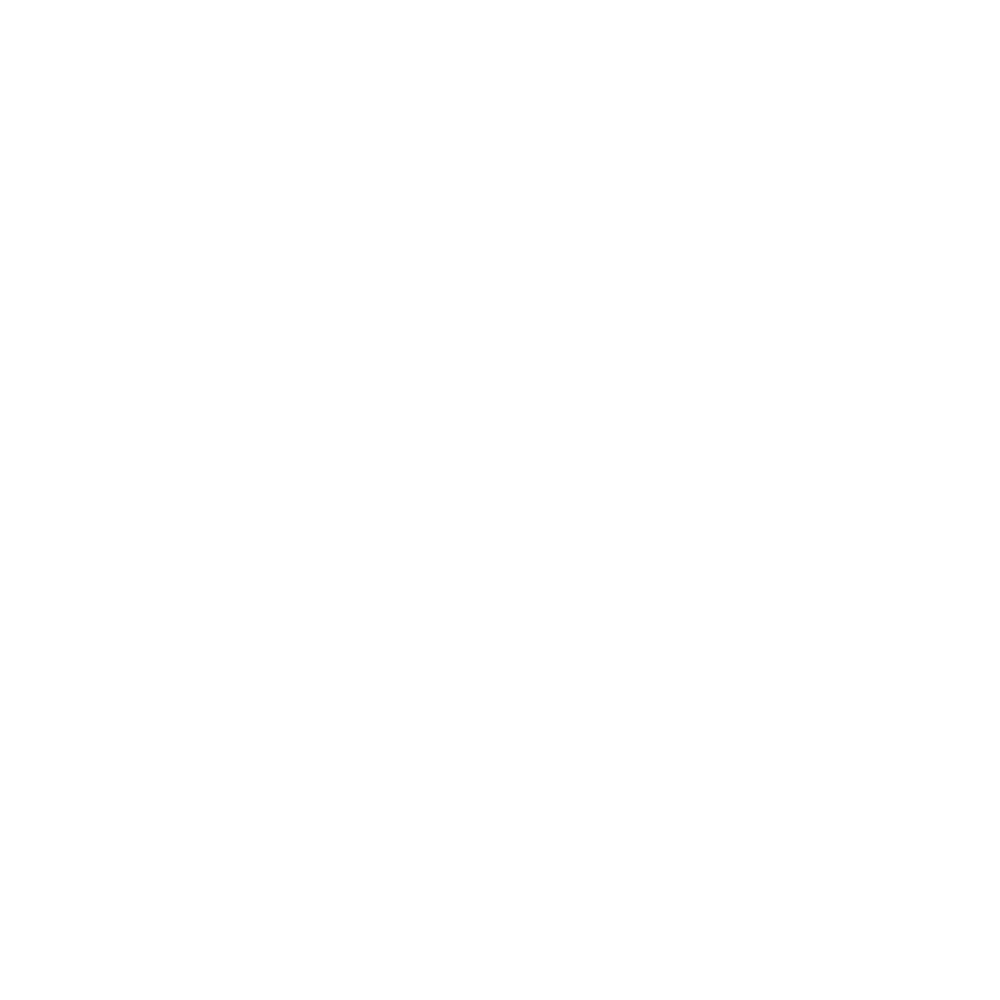

<IPython.core.display.Javascript object>


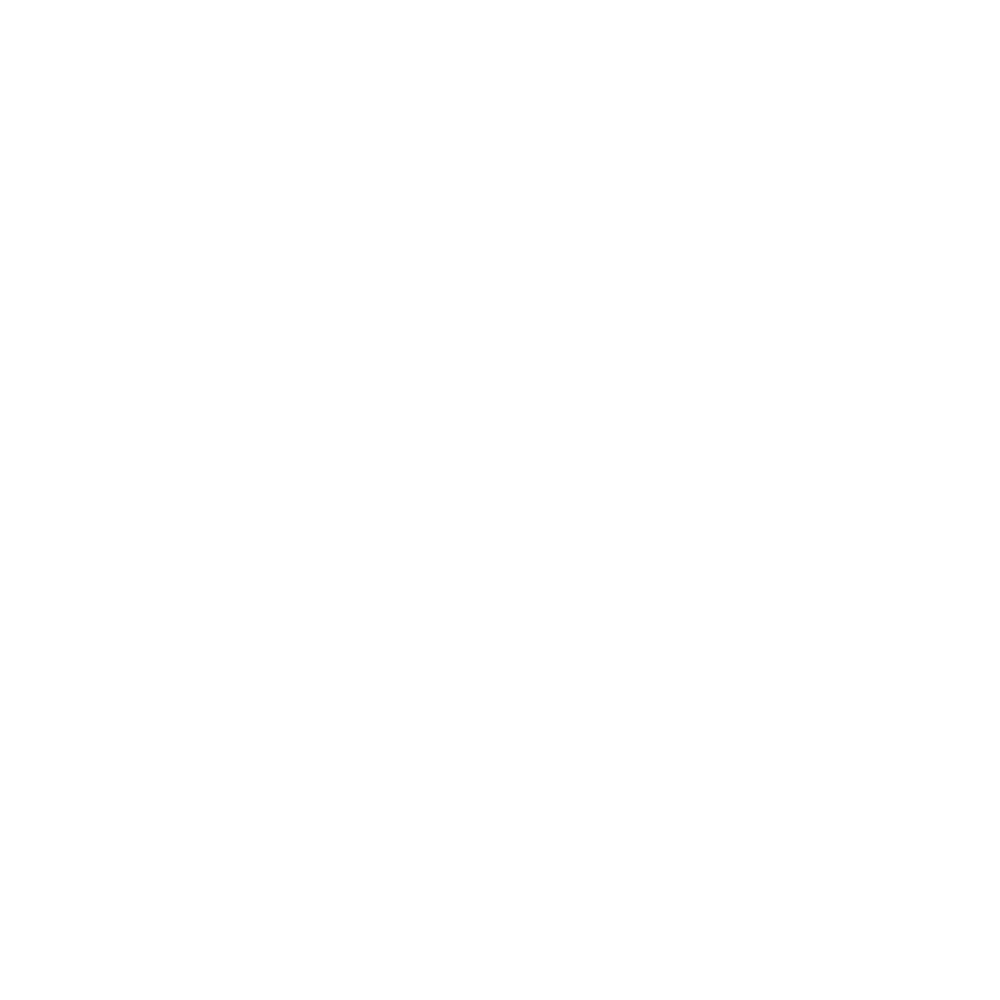

<IPython.core.display.Javascript object>


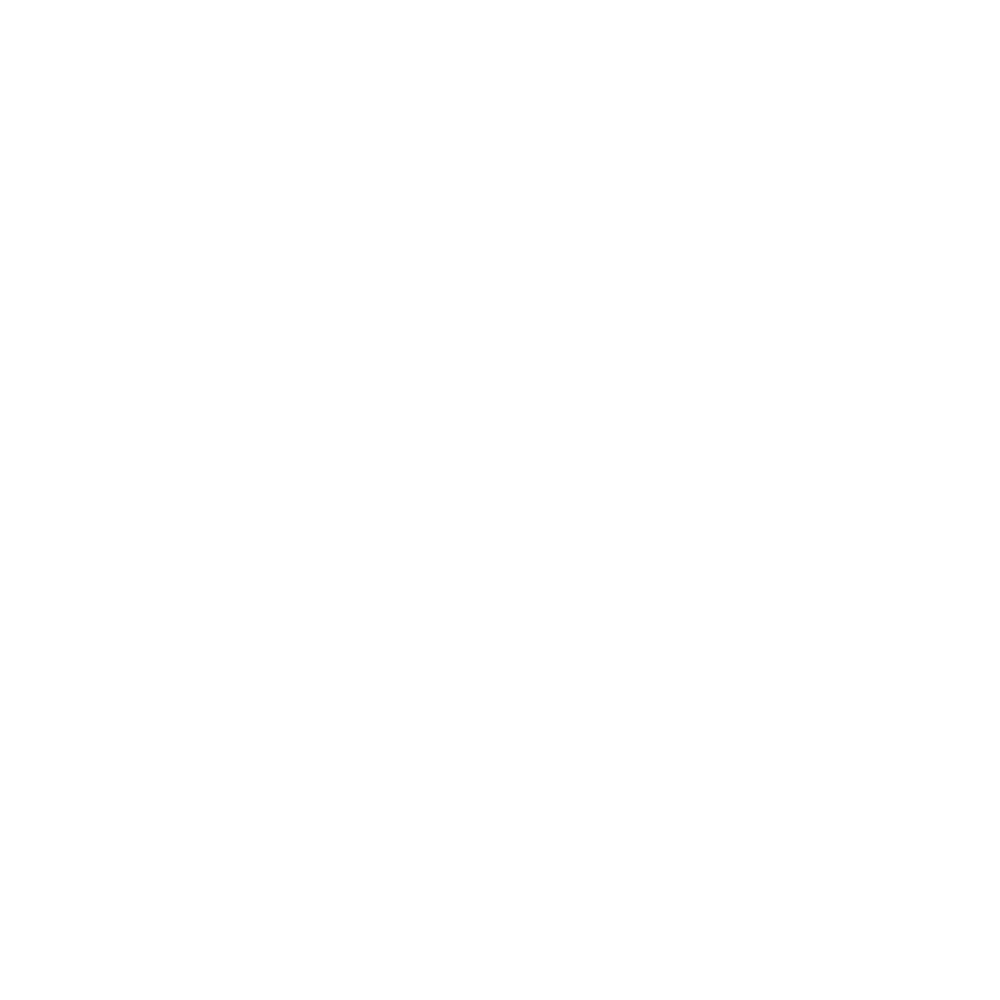

<IPython.core.display.Javascript object>


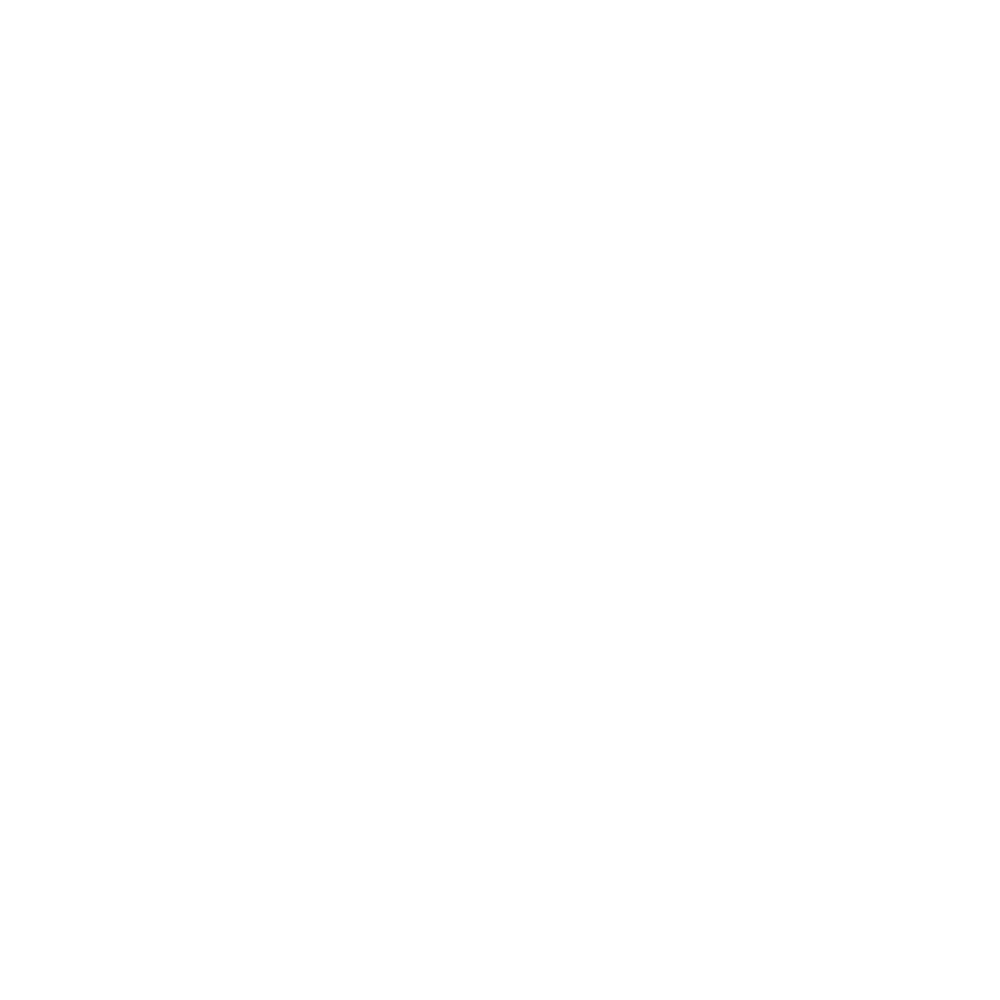

<IPython.core.display.Javascript object>


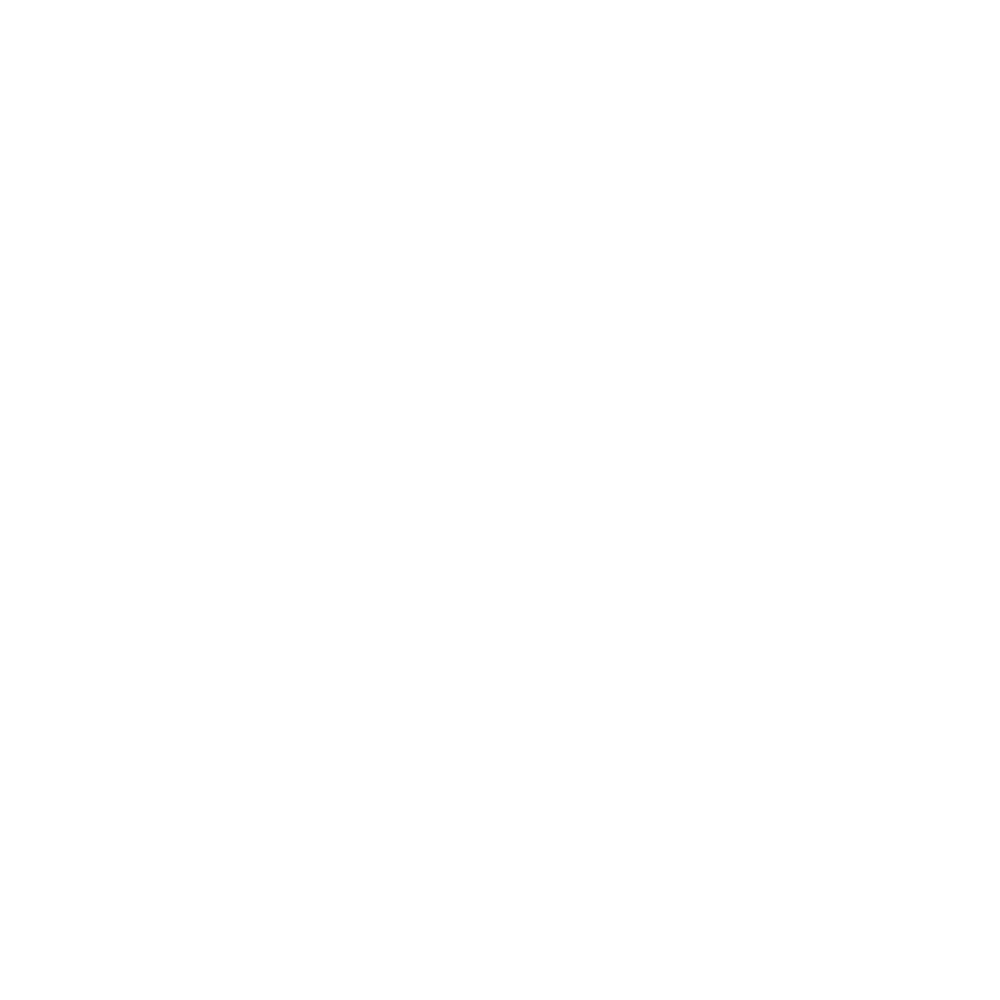

<IPython.core.display.Javascript object>


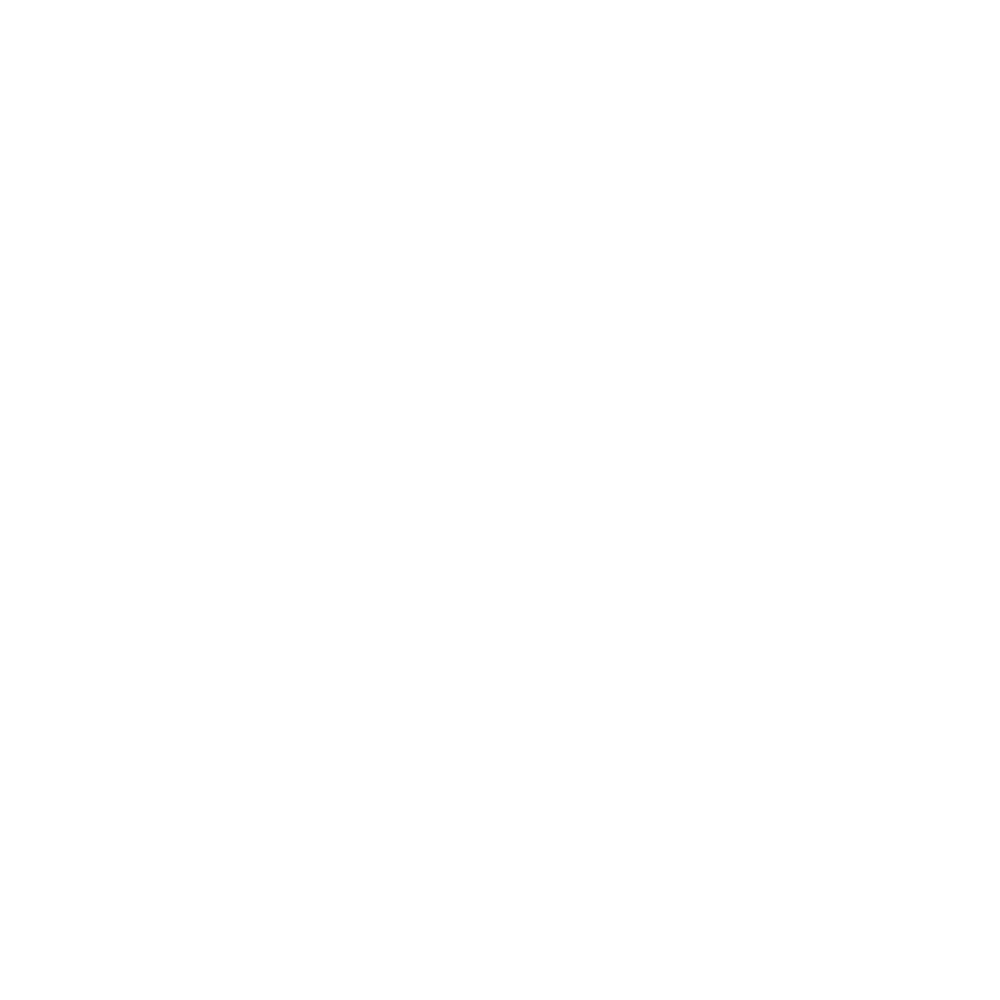

<IPython.core.display.Javascript object>


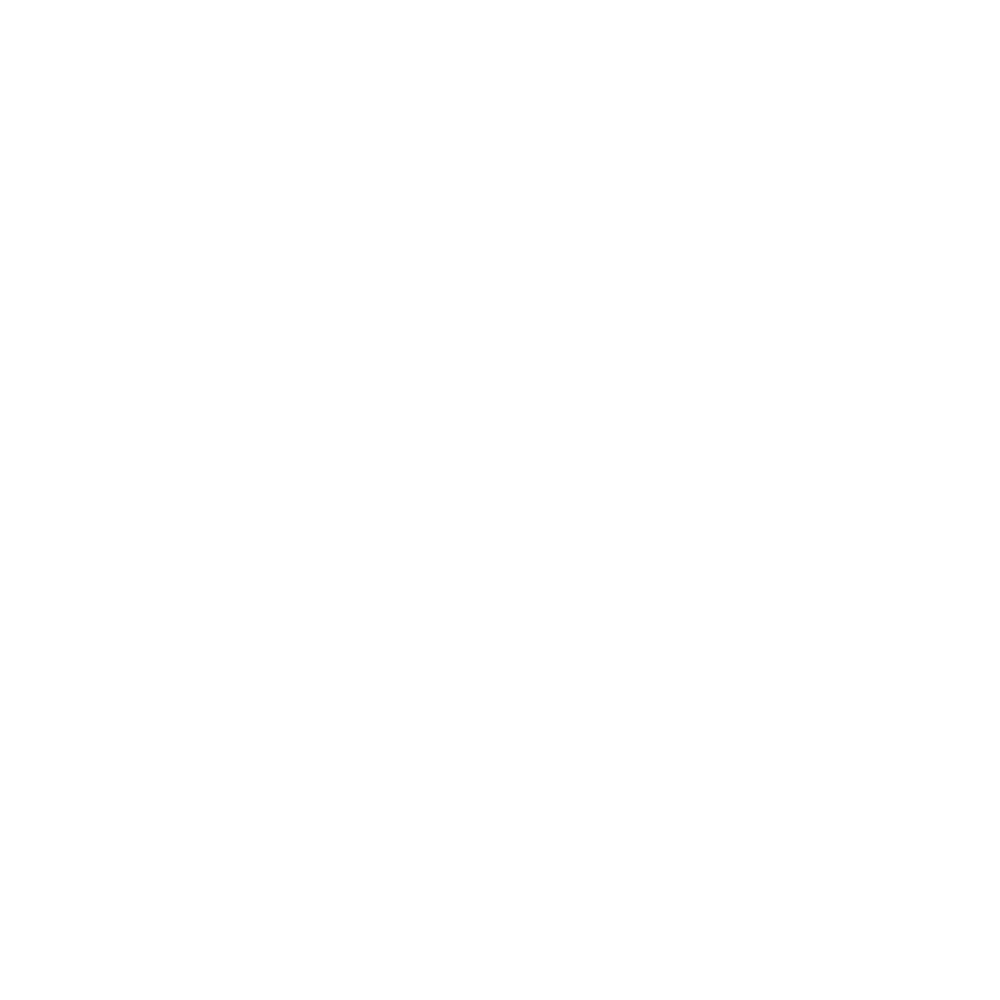

<IPython.core.display.Javascript object>


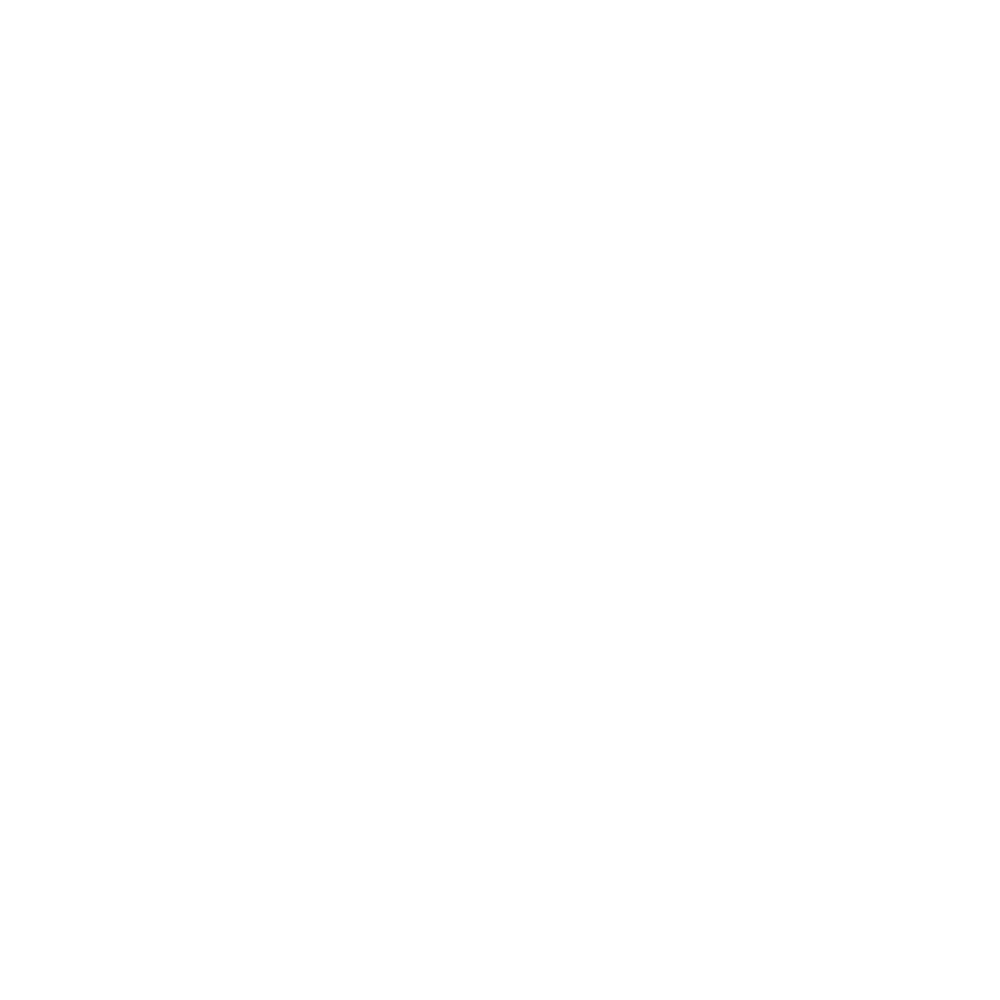

<IPython.core.display.Javascript object>


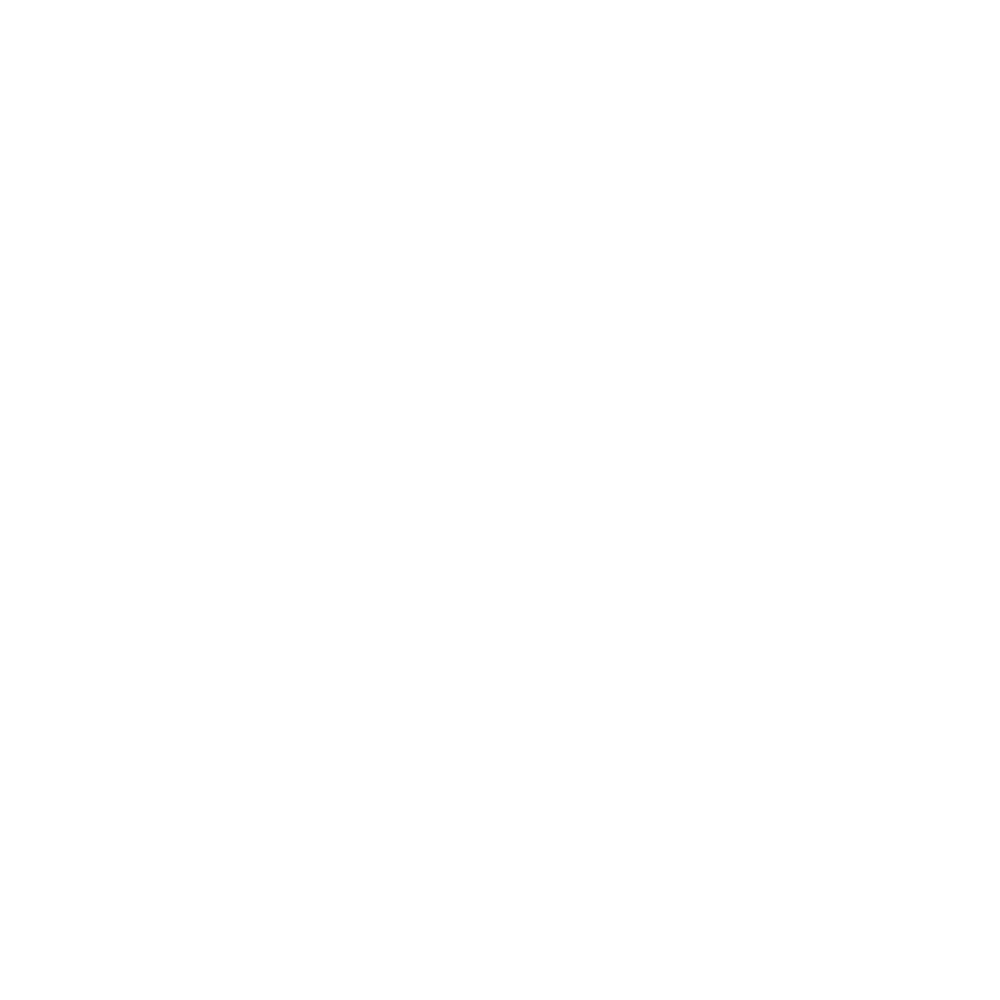

<IPython.core.display.Javascript object>


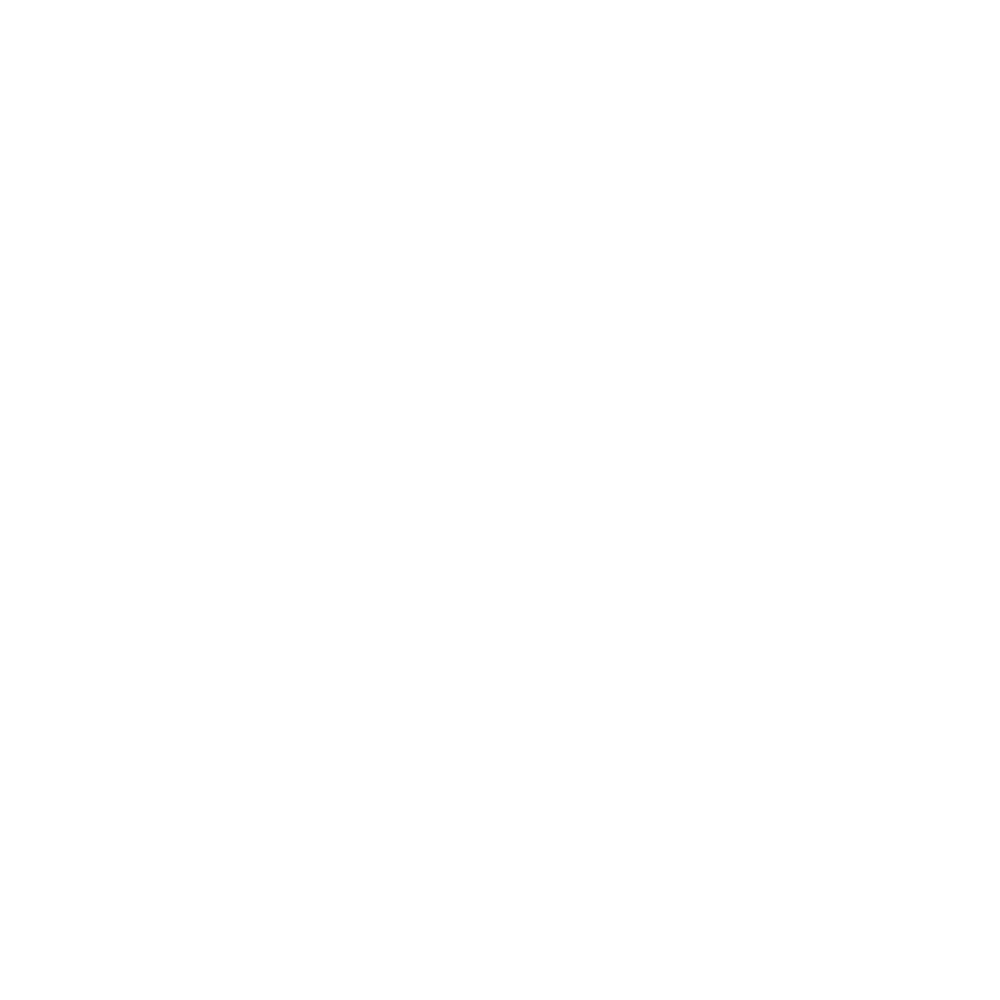

<IPython.core.display.Javascript object>


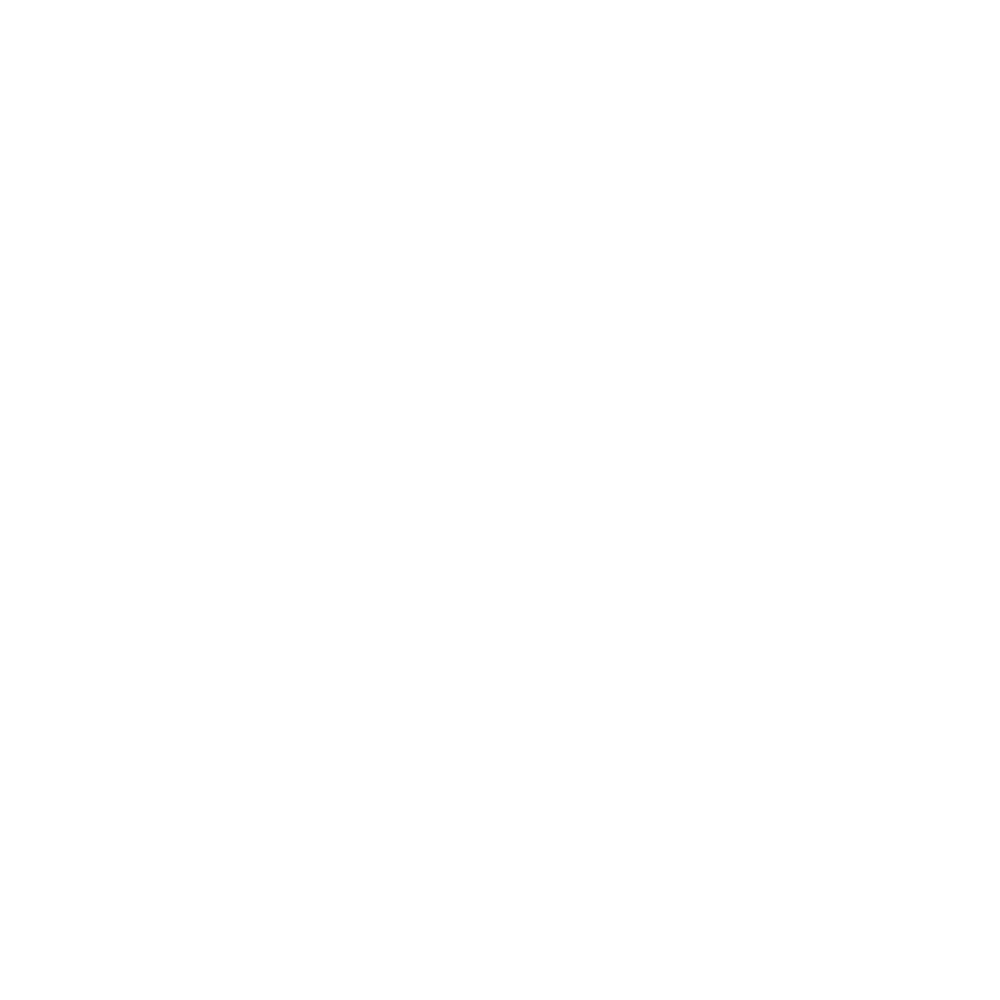

<IPython.core.display.Javascript object>


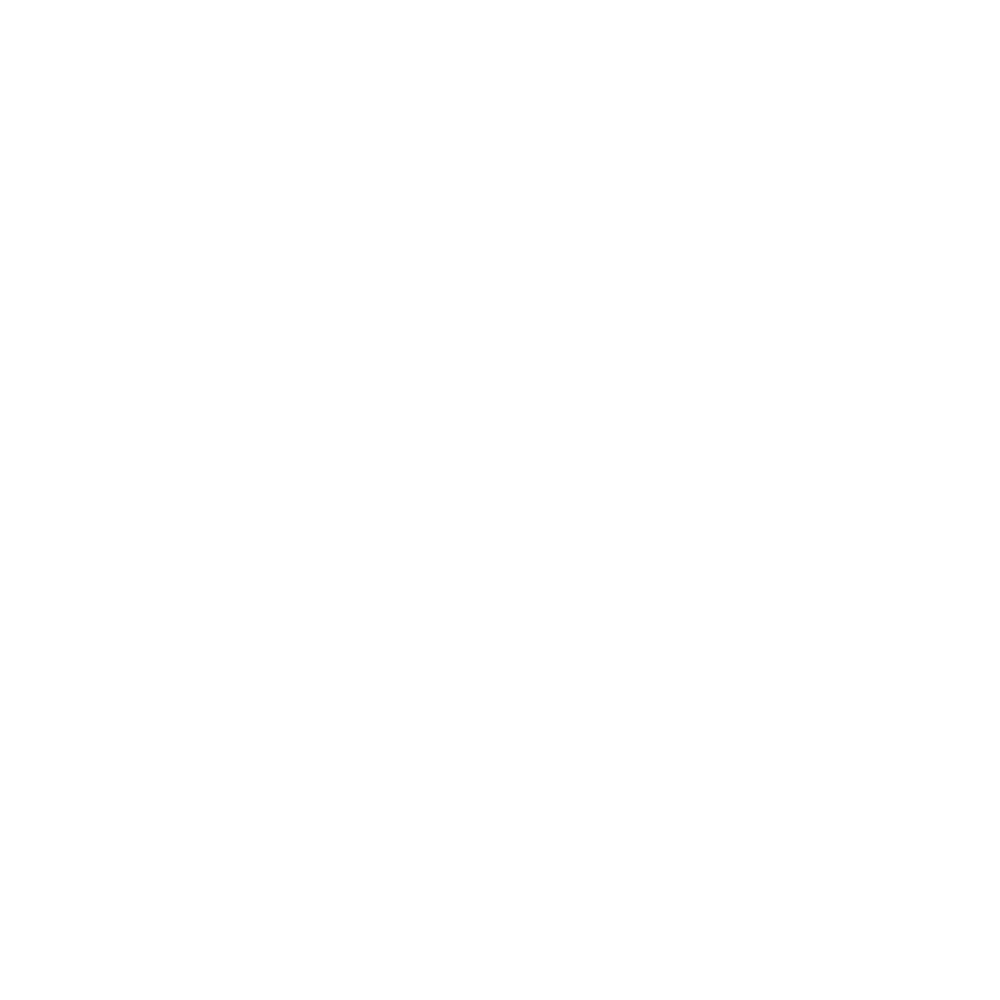

<IPython.core.display.Javascript object>


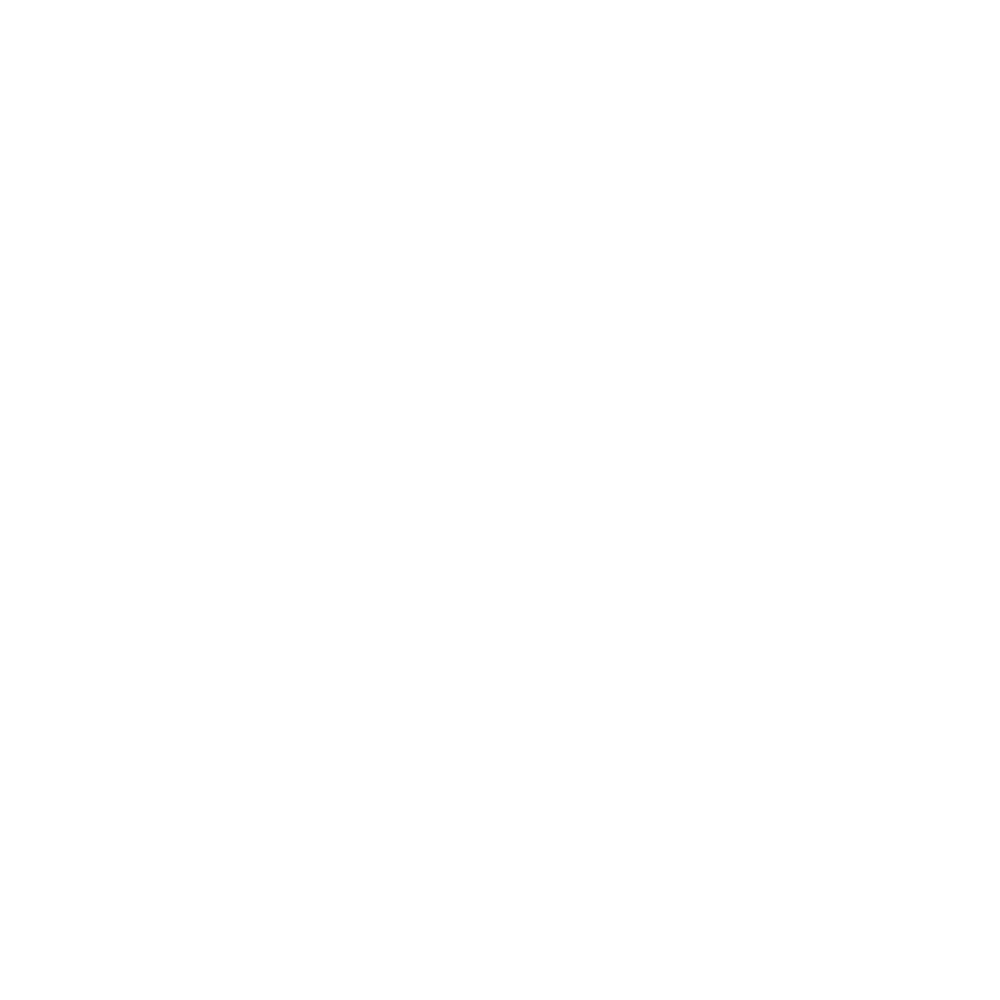

<IPython.core.display.Javascript object>


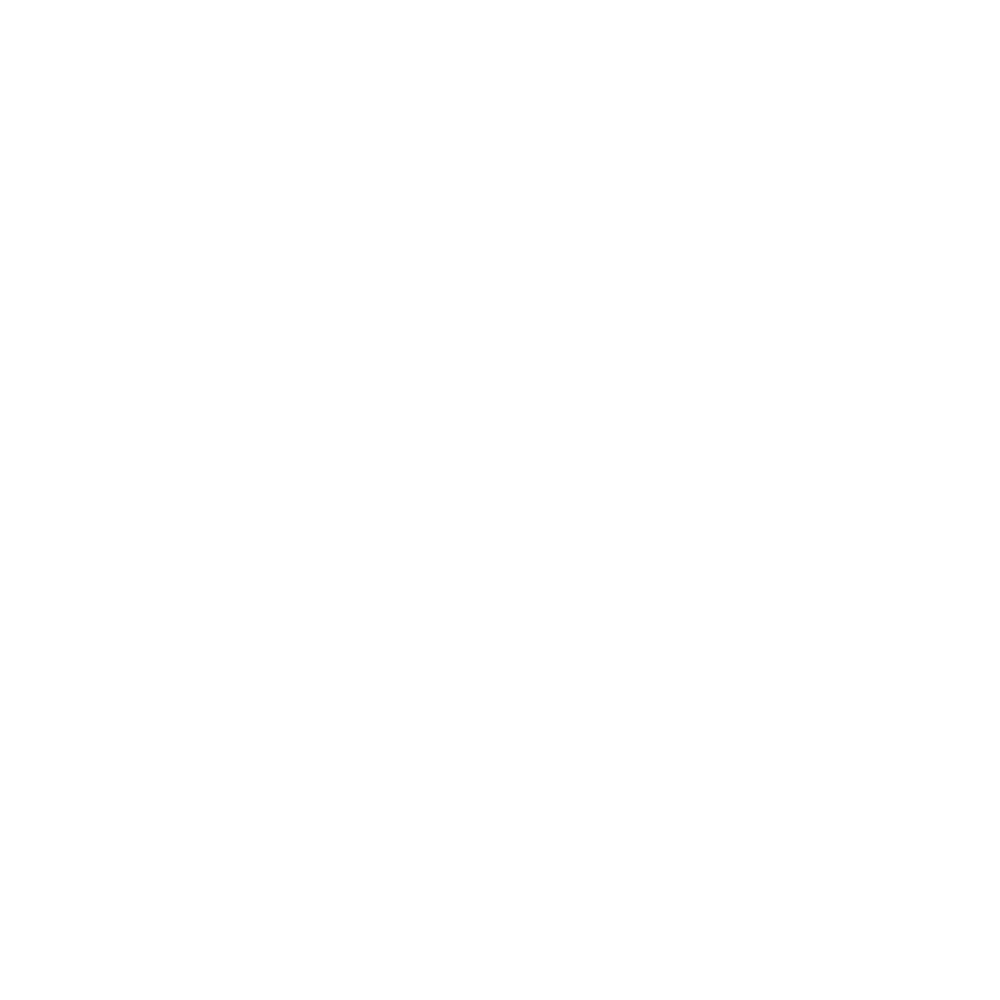

<IPython.core.display.Javascript object>


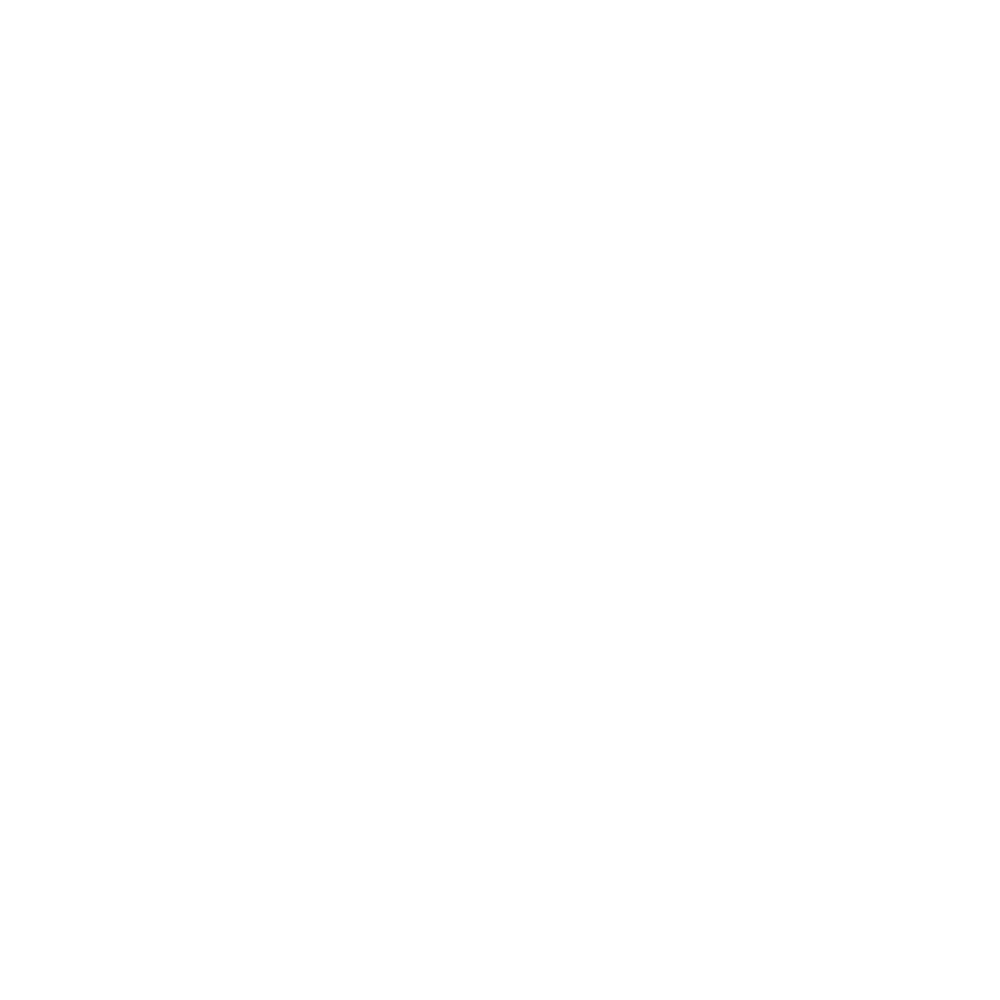

<IPython.core.display.Javascript object>


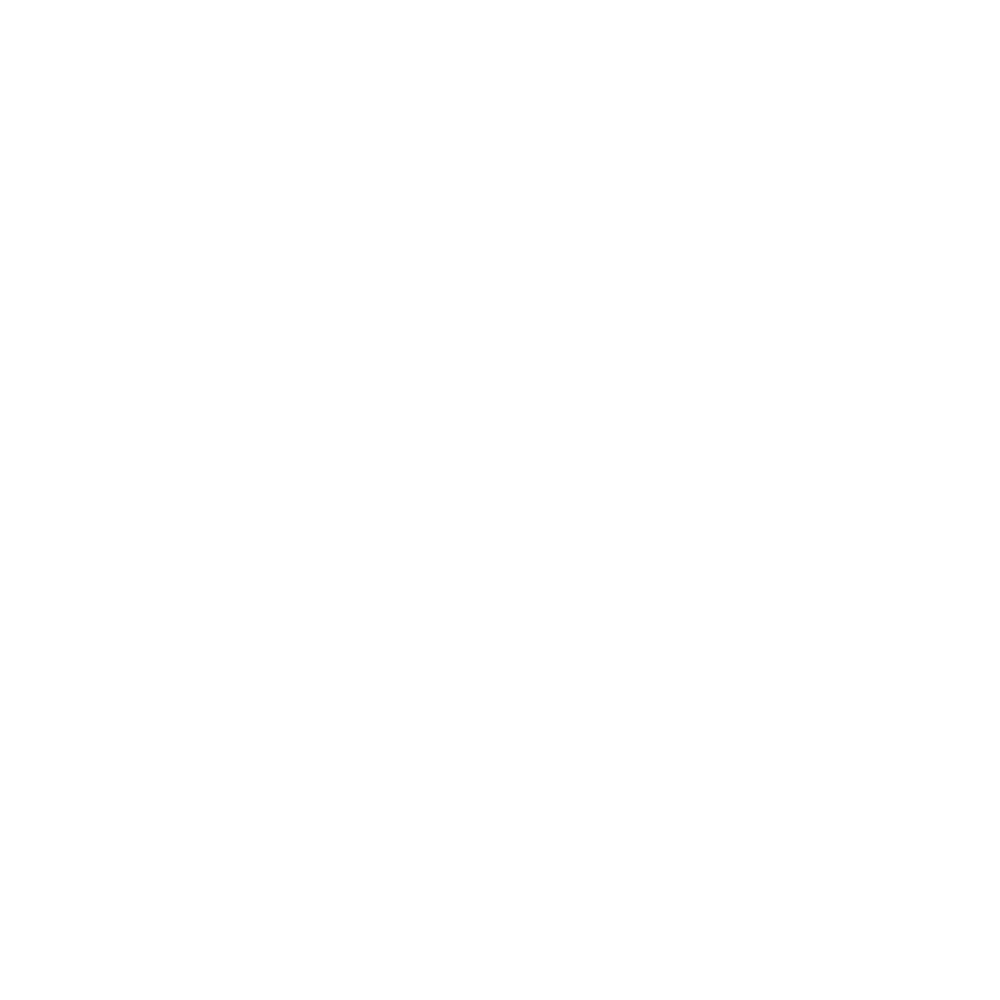

<IPython.core.display.Javascript object>


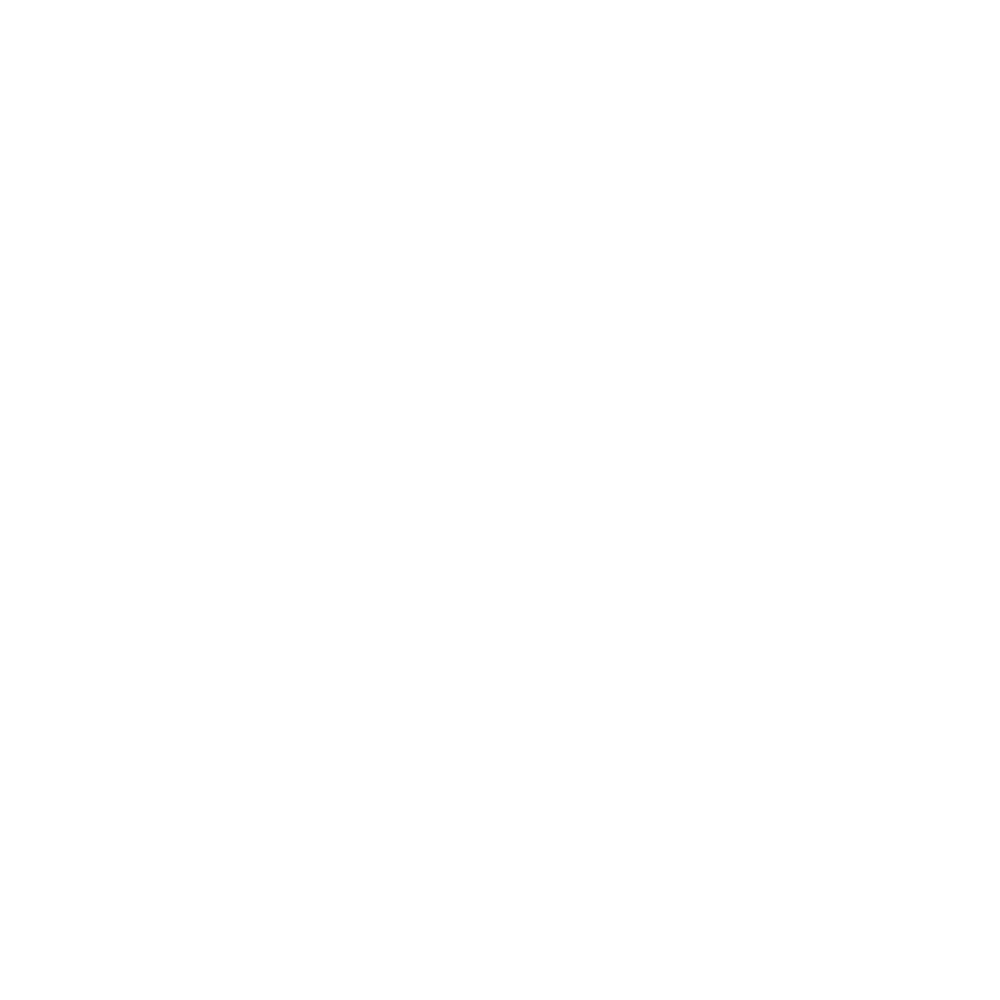

<IPython.core.display.Javascript object>


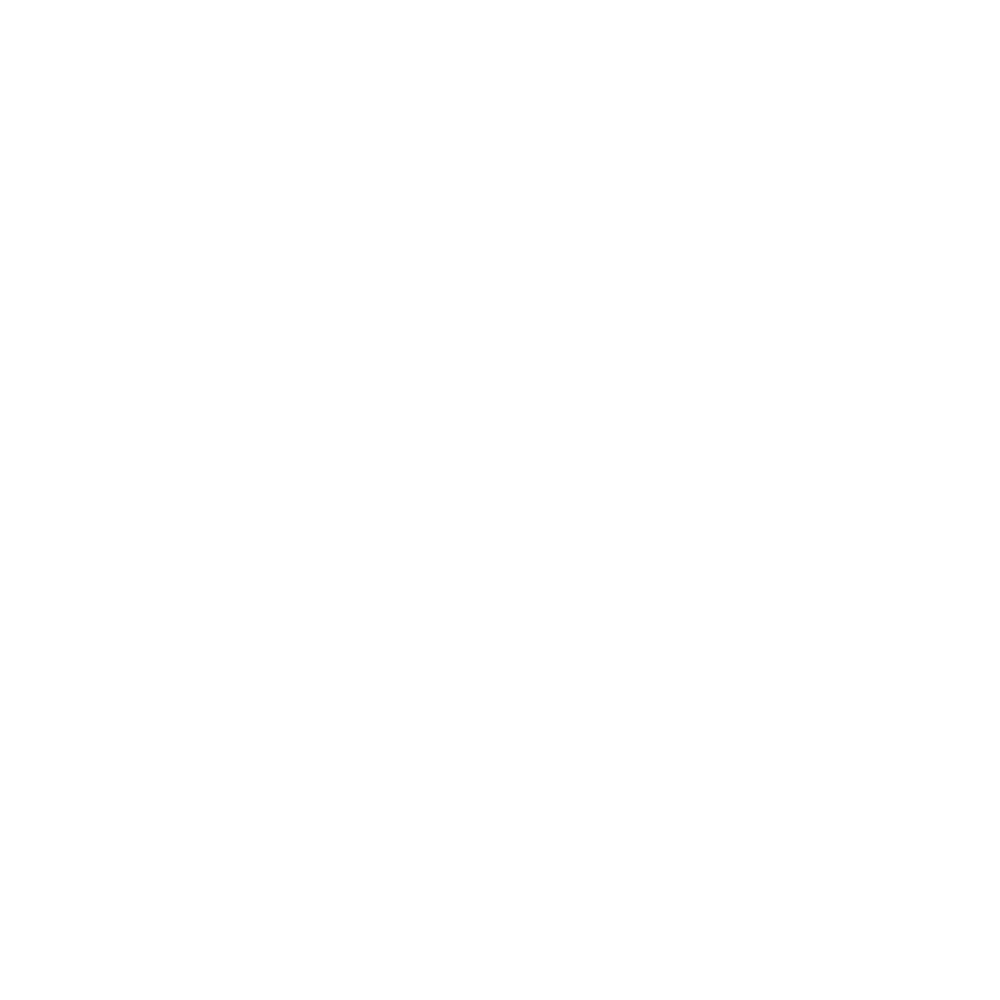

<IPython.core.display.Javascript object>


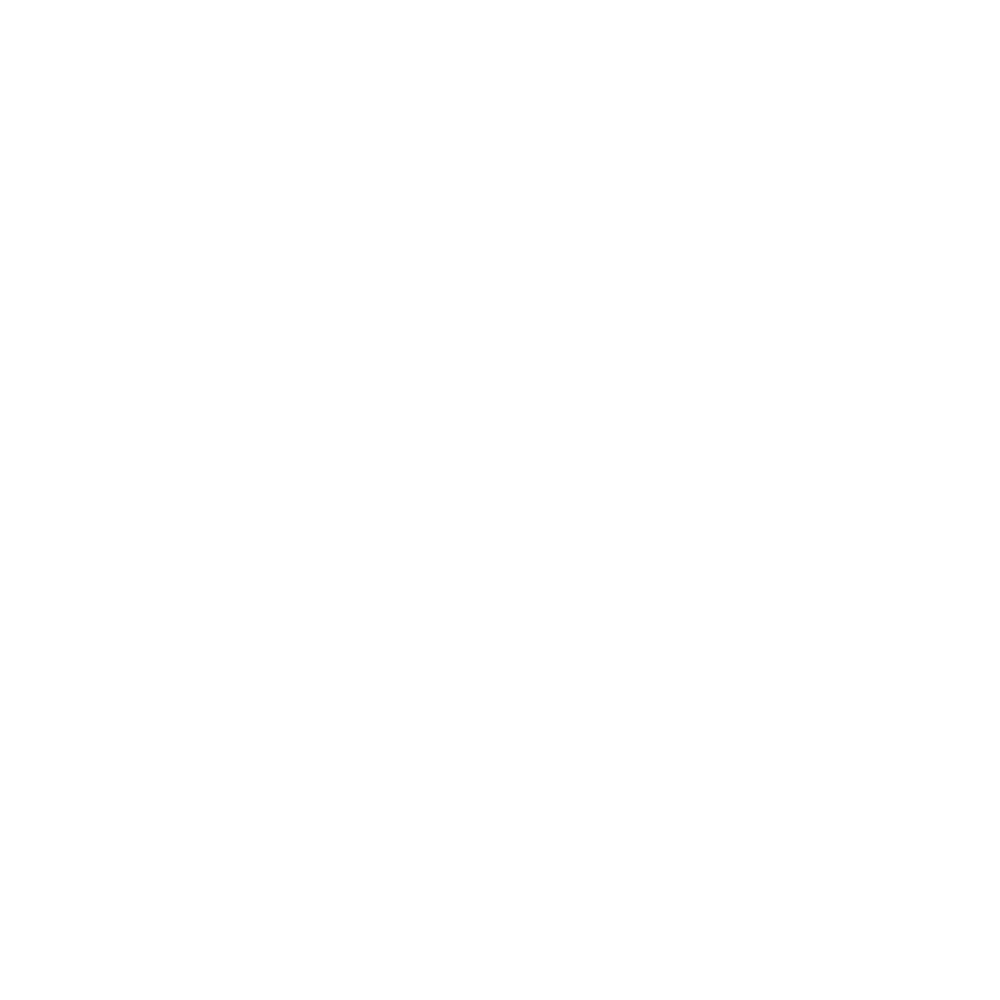

<IPython.core.display.Javascript object>


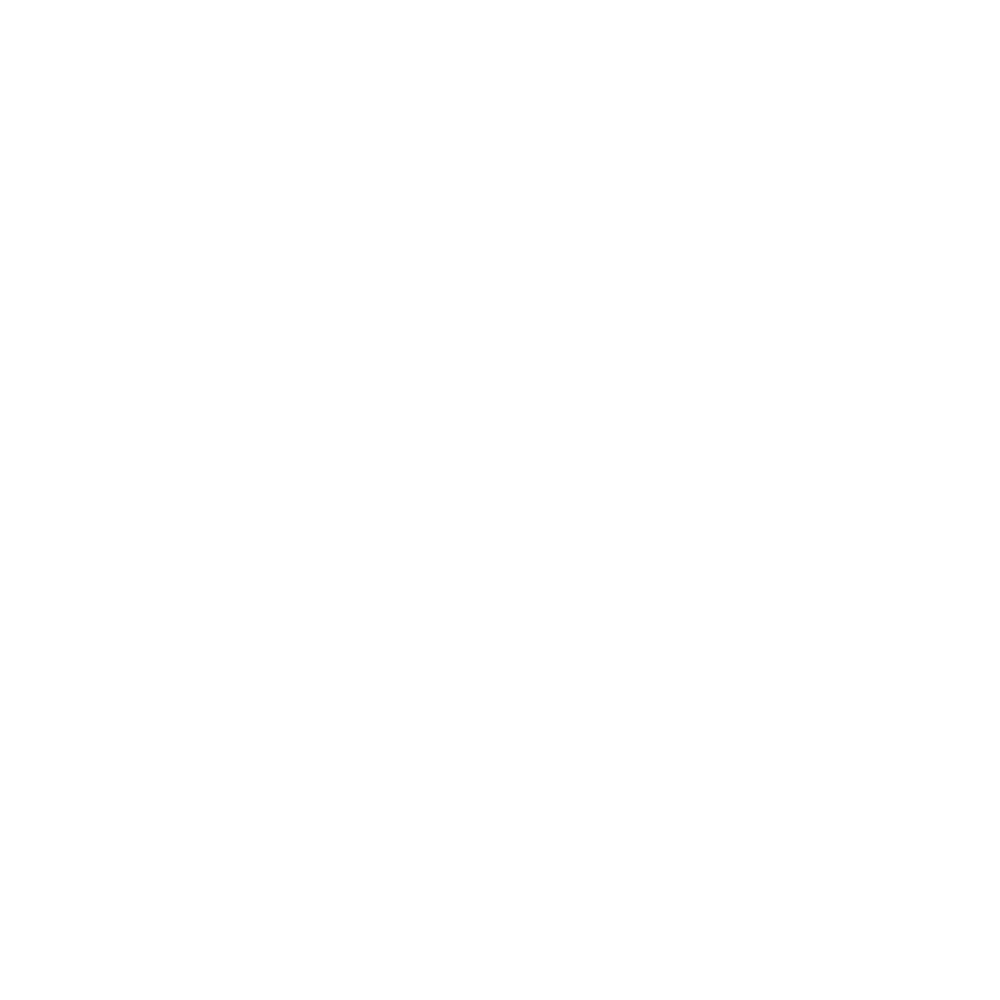

<IPython.core.display.Javascript object>


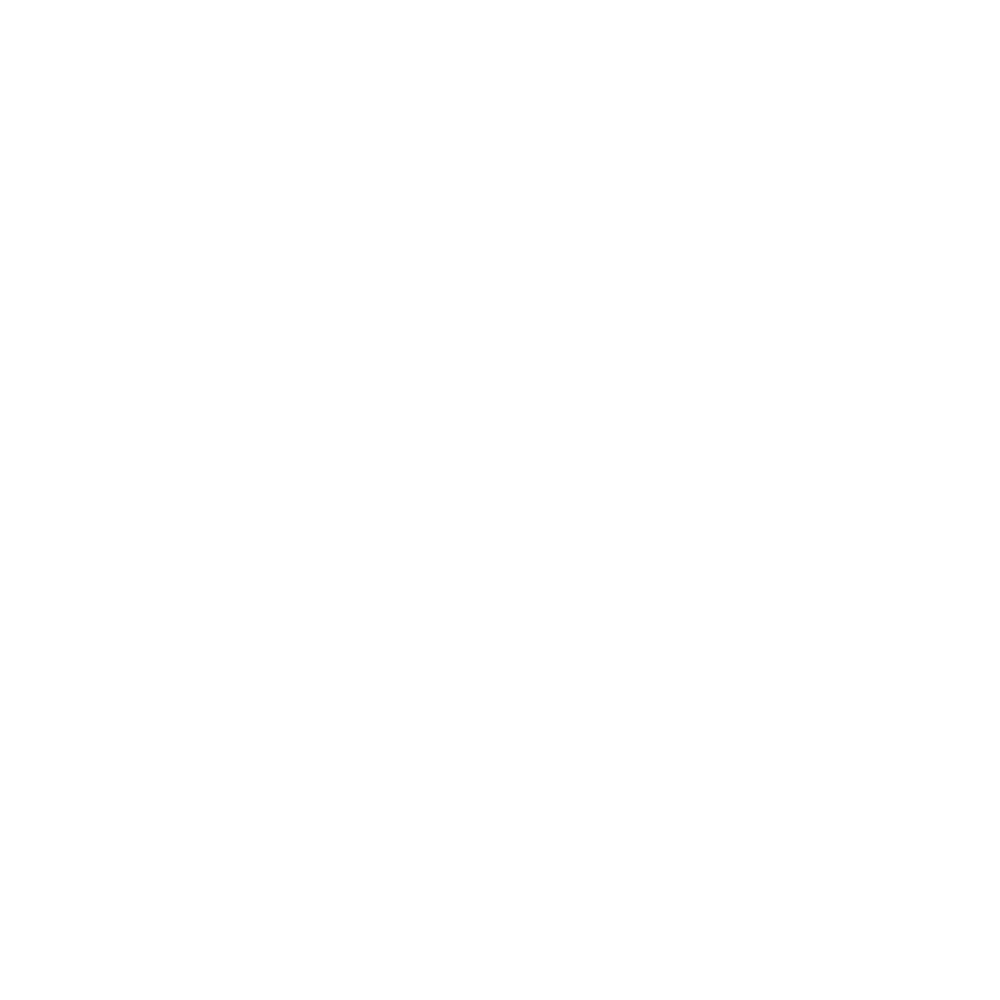

<IPython.core.display.Javascript object>


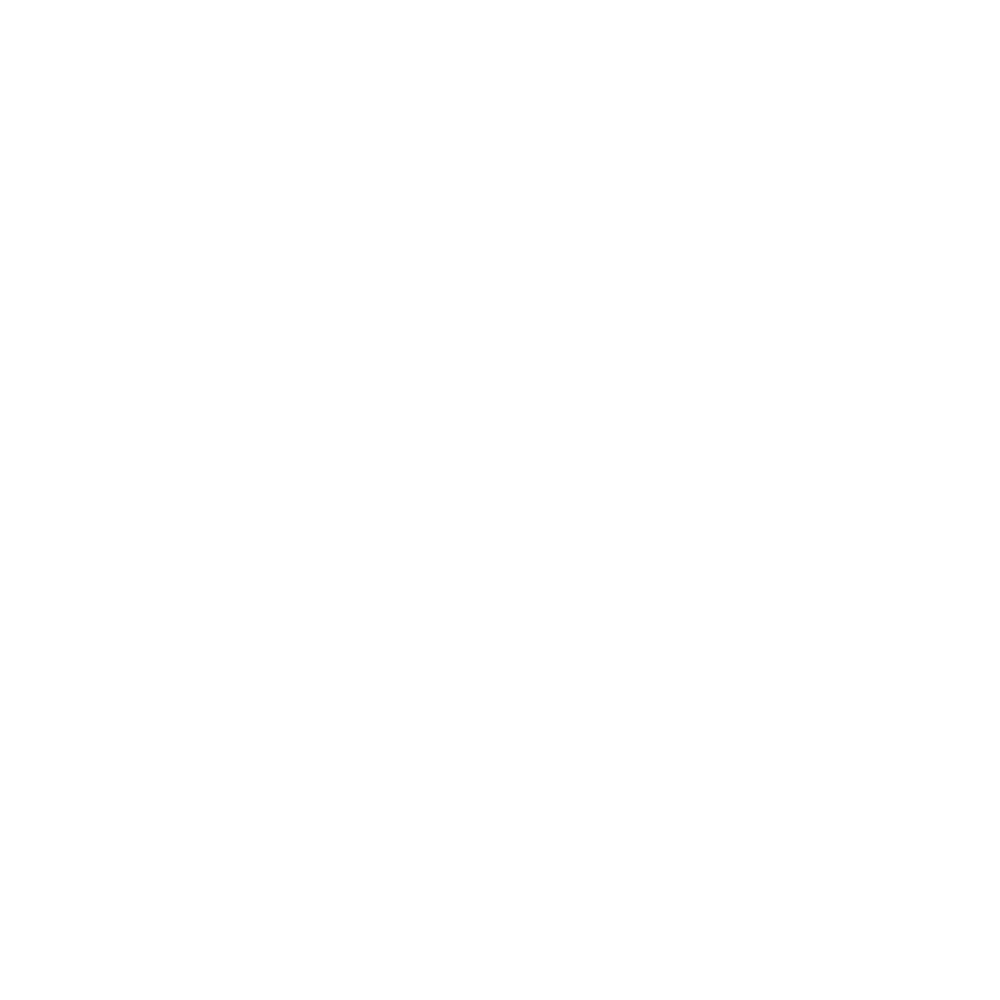

<IPython.core.display.Javascript object>


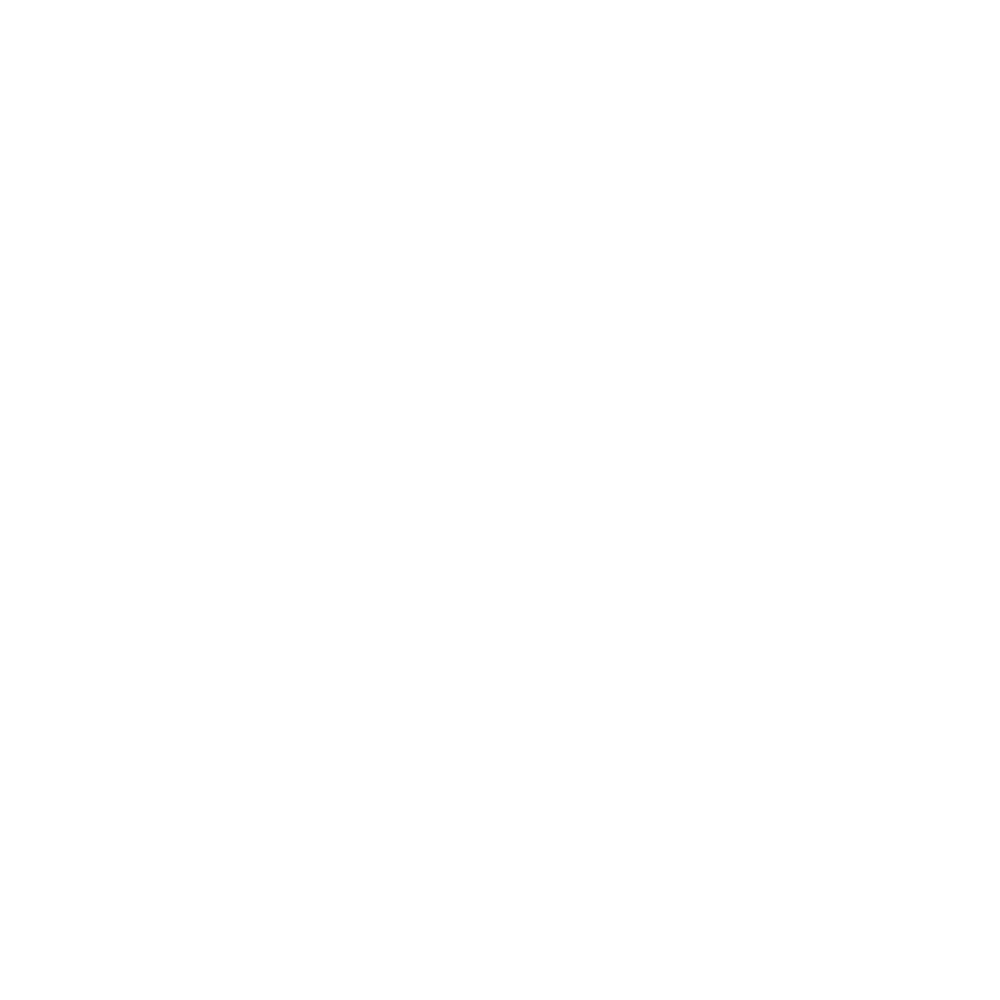

<IPython.core.display.Javascript object>


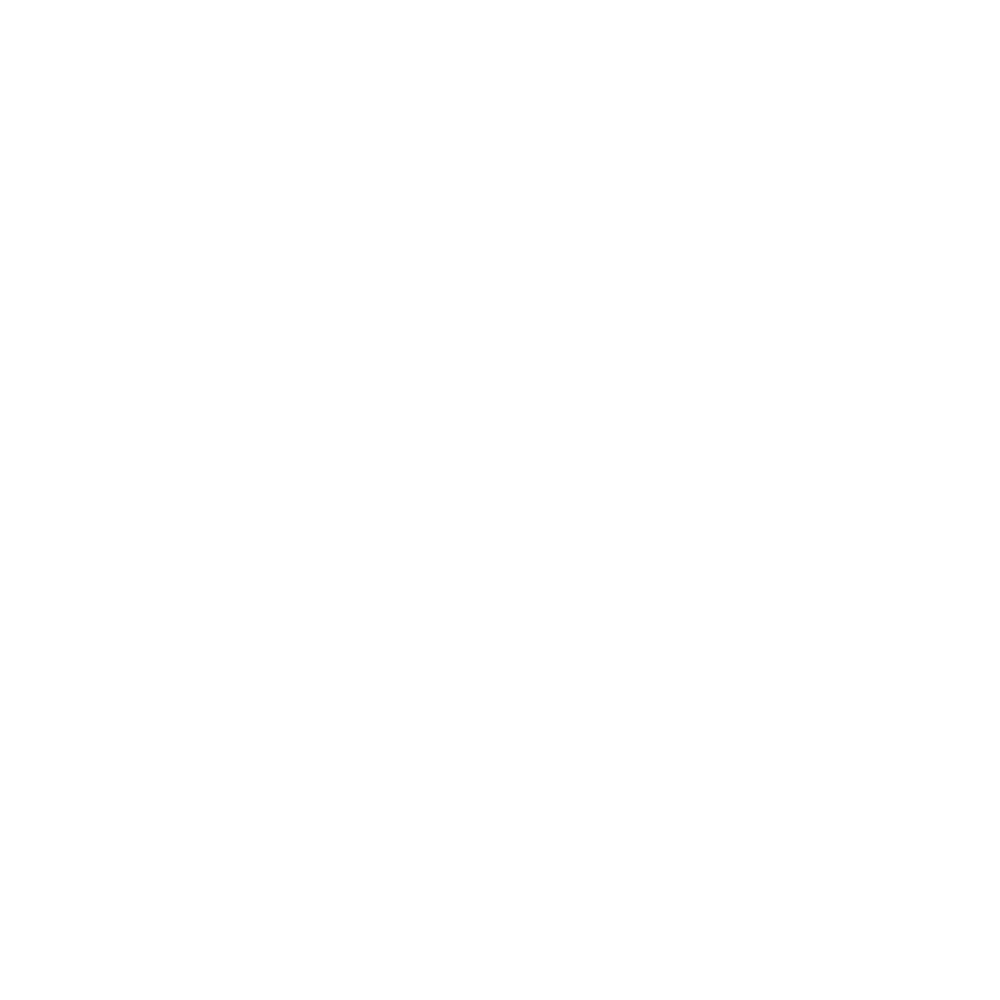

<IPython.core.display.Javascript object>


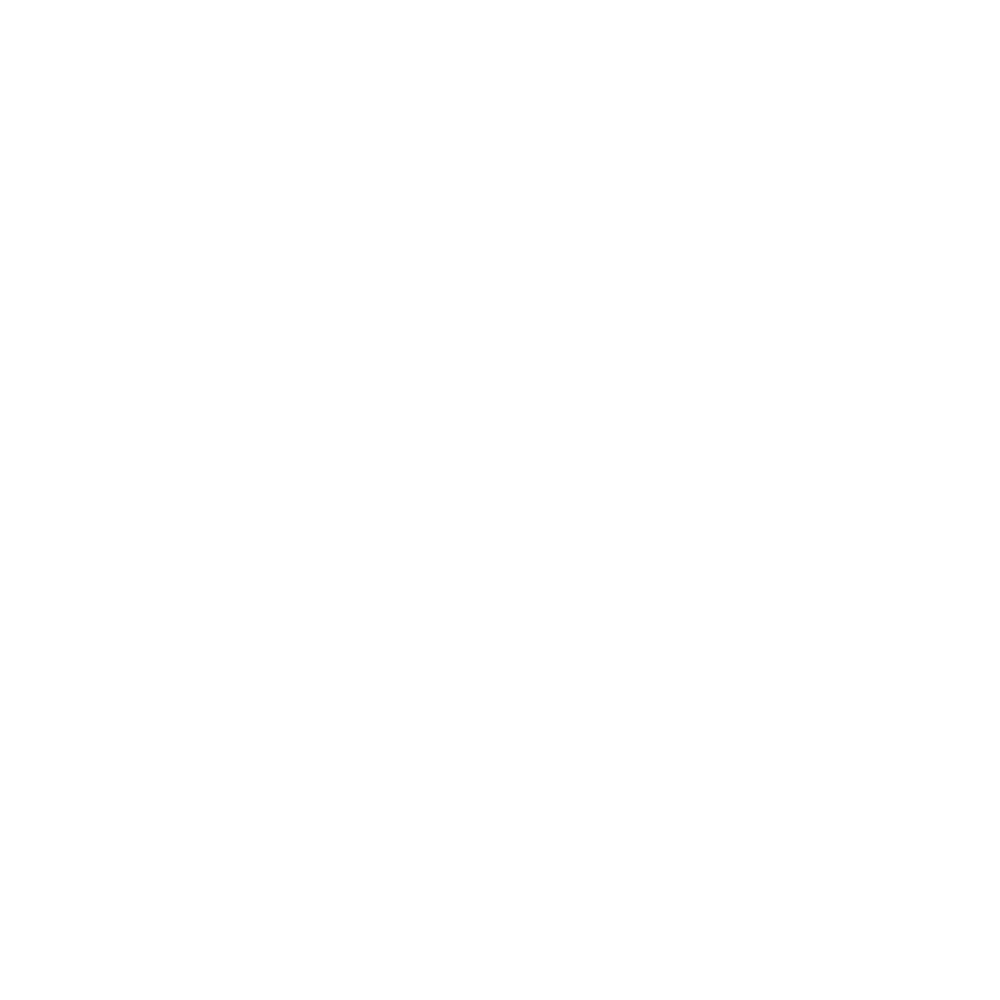

<IPython.core.display.Javascript object>


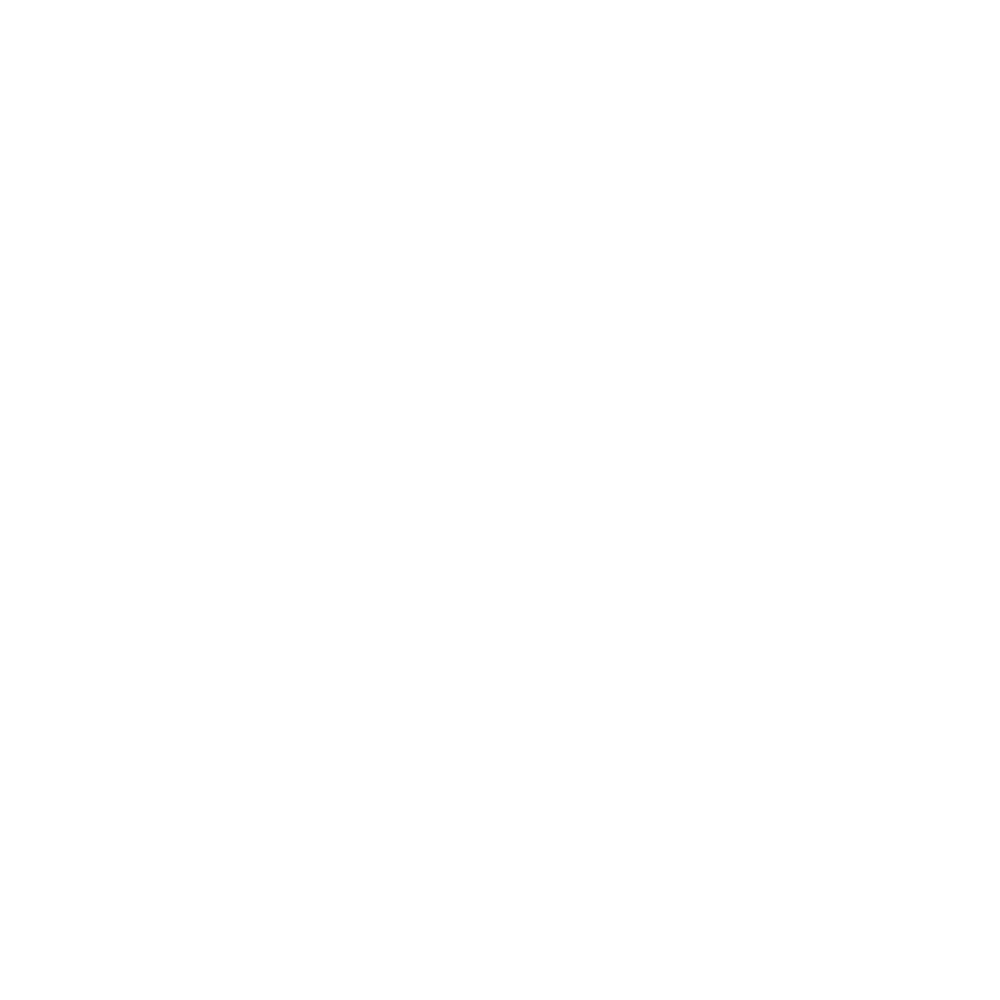

<IPython.core.display.Javascript object>


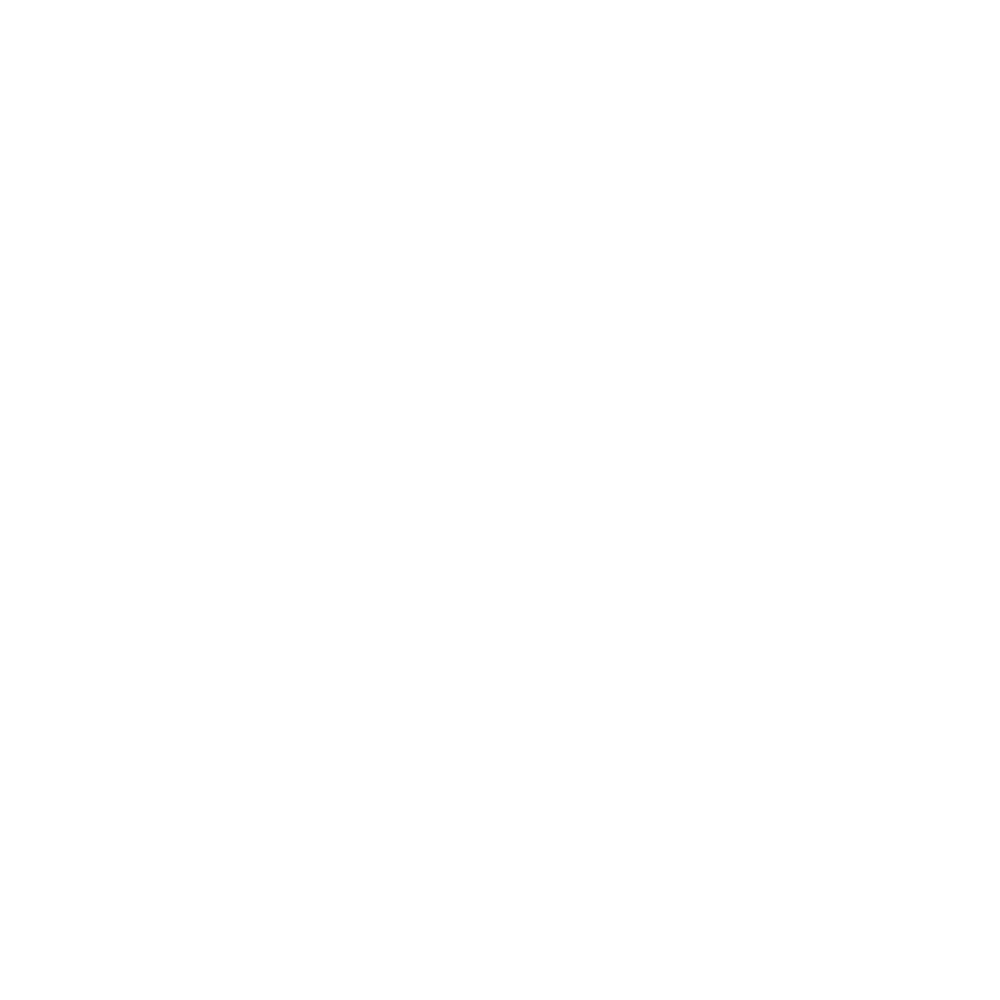

<IPython.core.display.Javascript object>


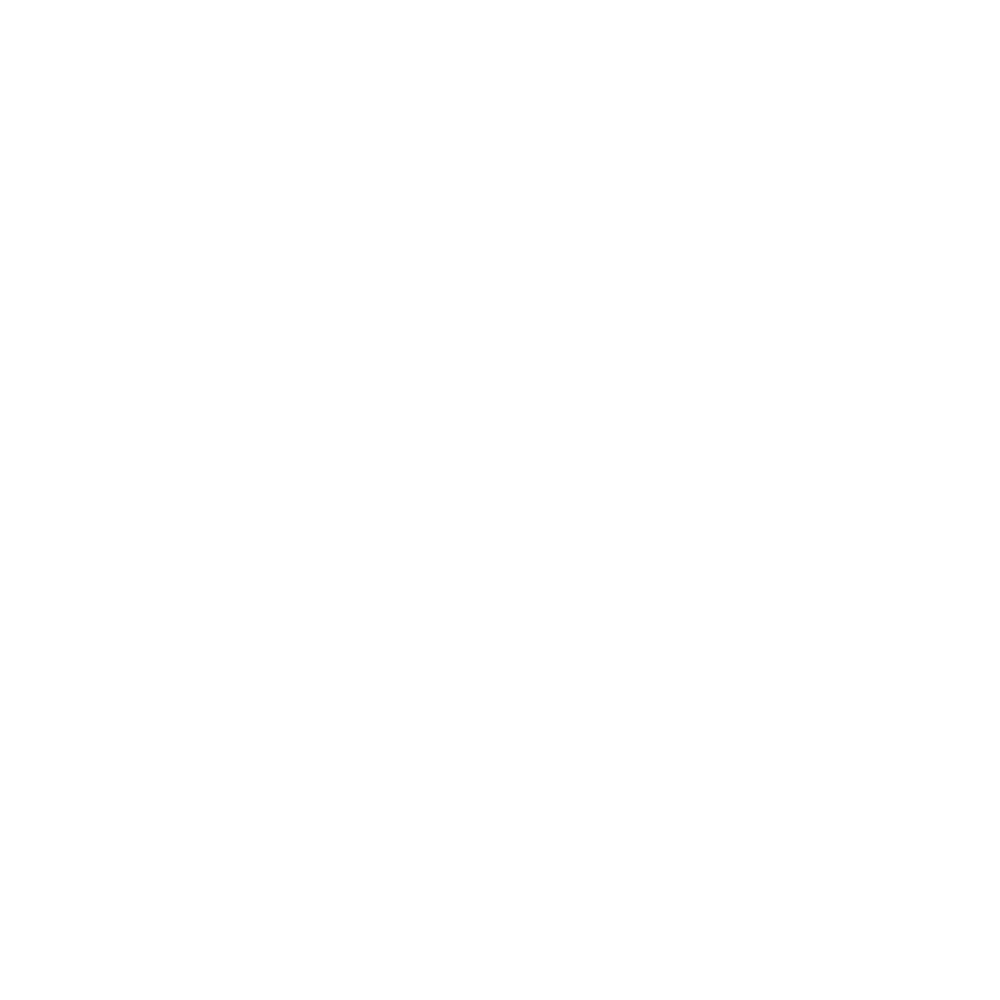

<IPython.core.display.Javascript object>


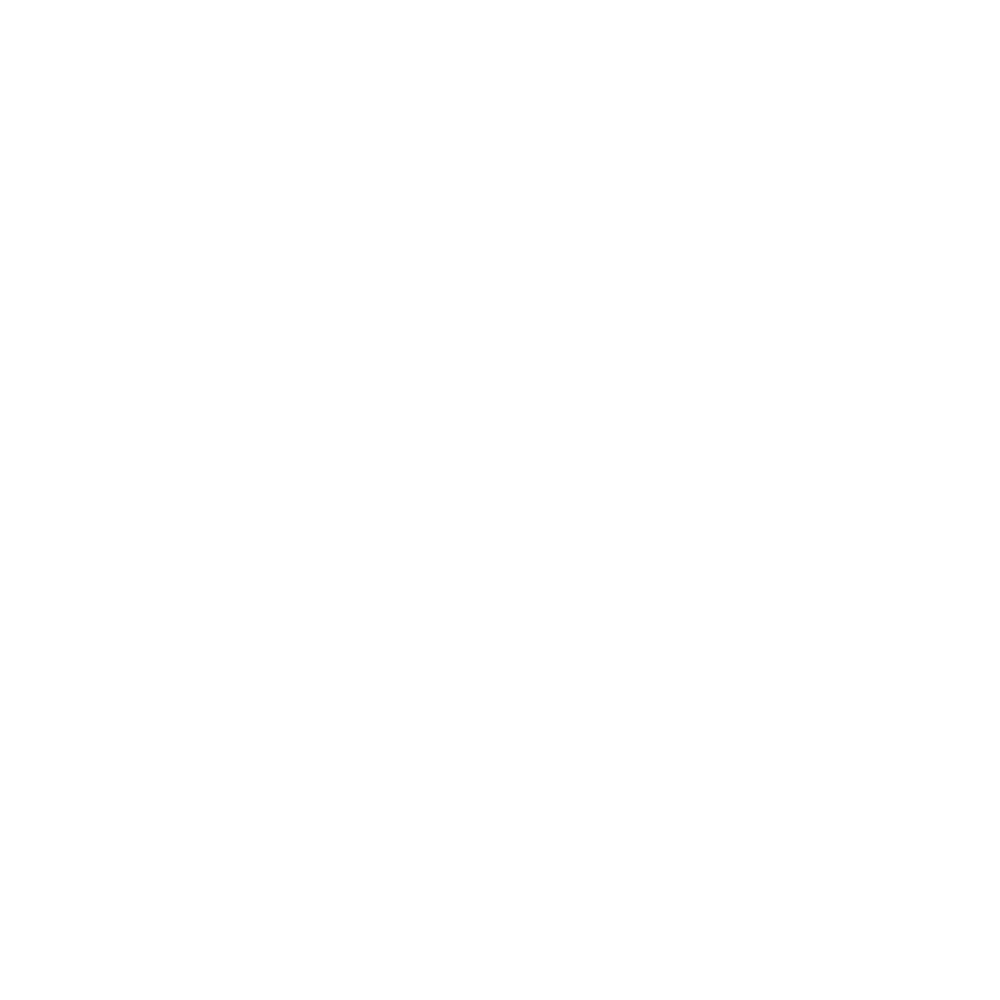

<IPython.core.display.Javascript object>


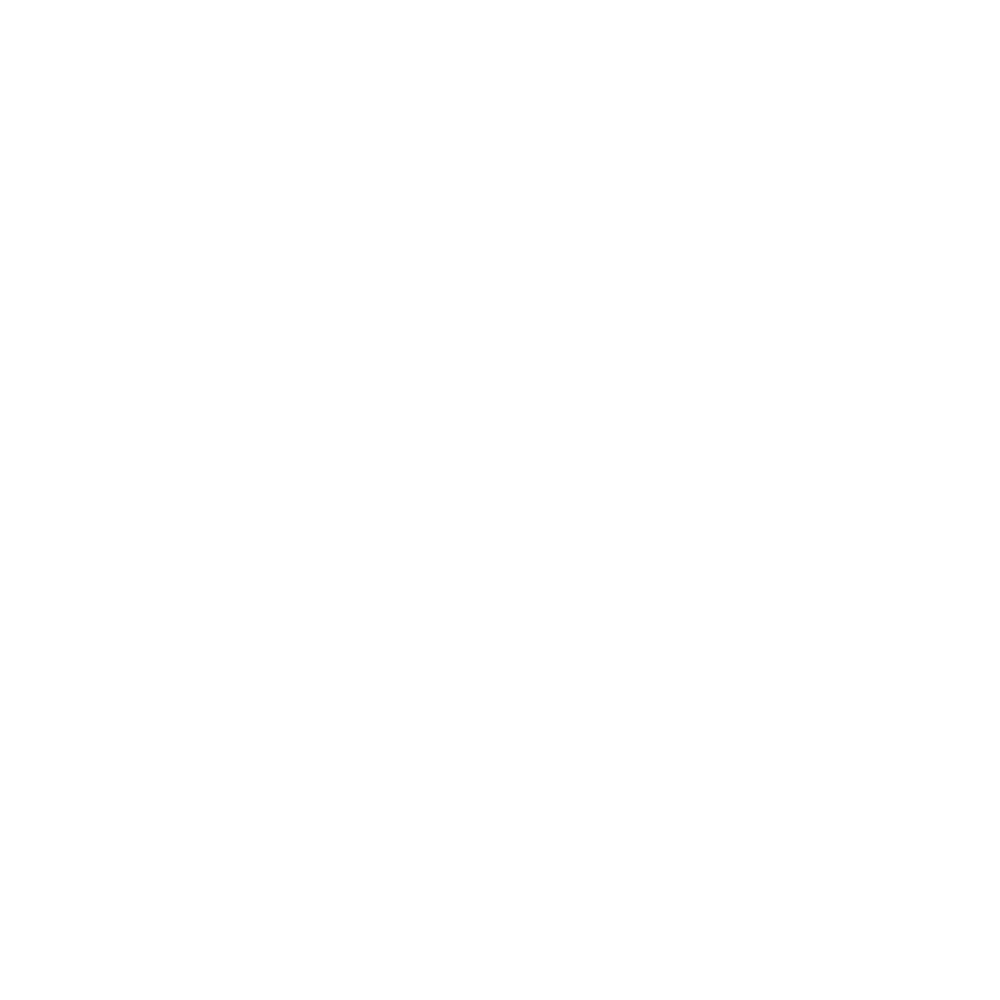

<IPython.core.display.Javascript object>


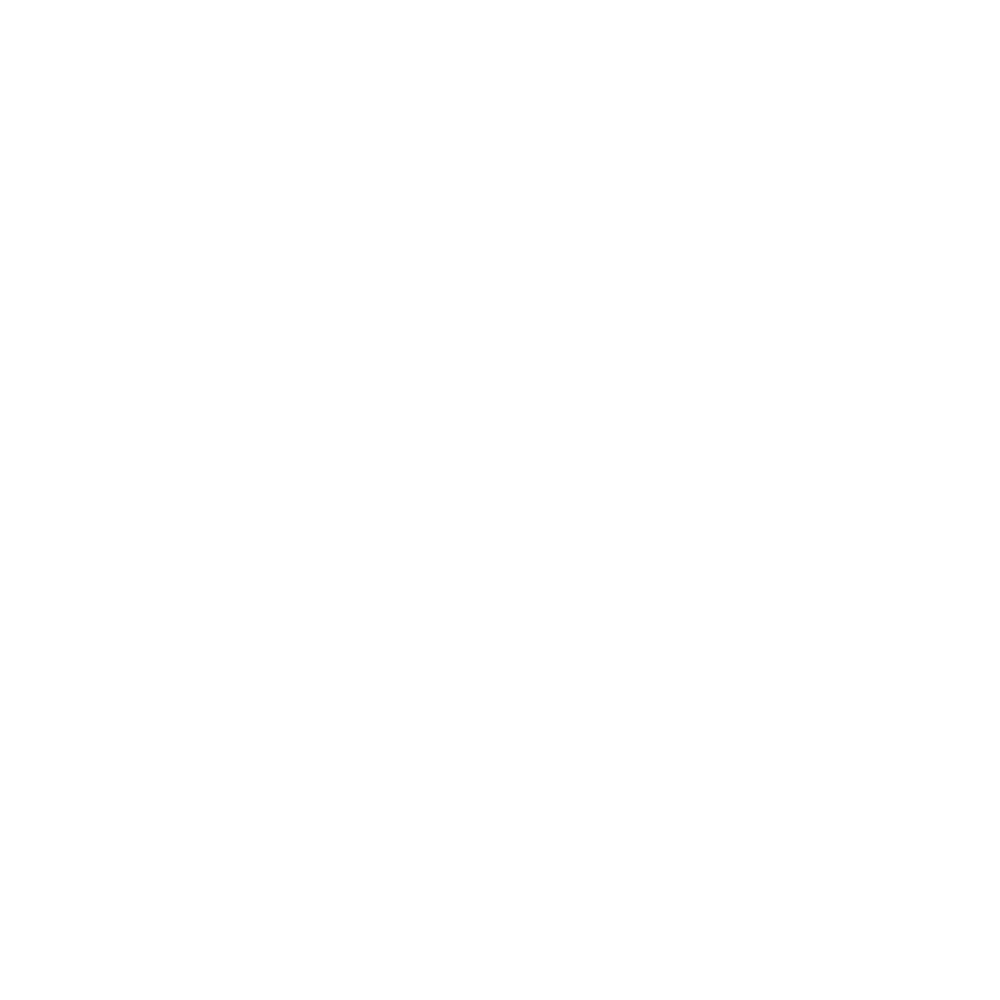

<IPython.core.display.Javascript object>


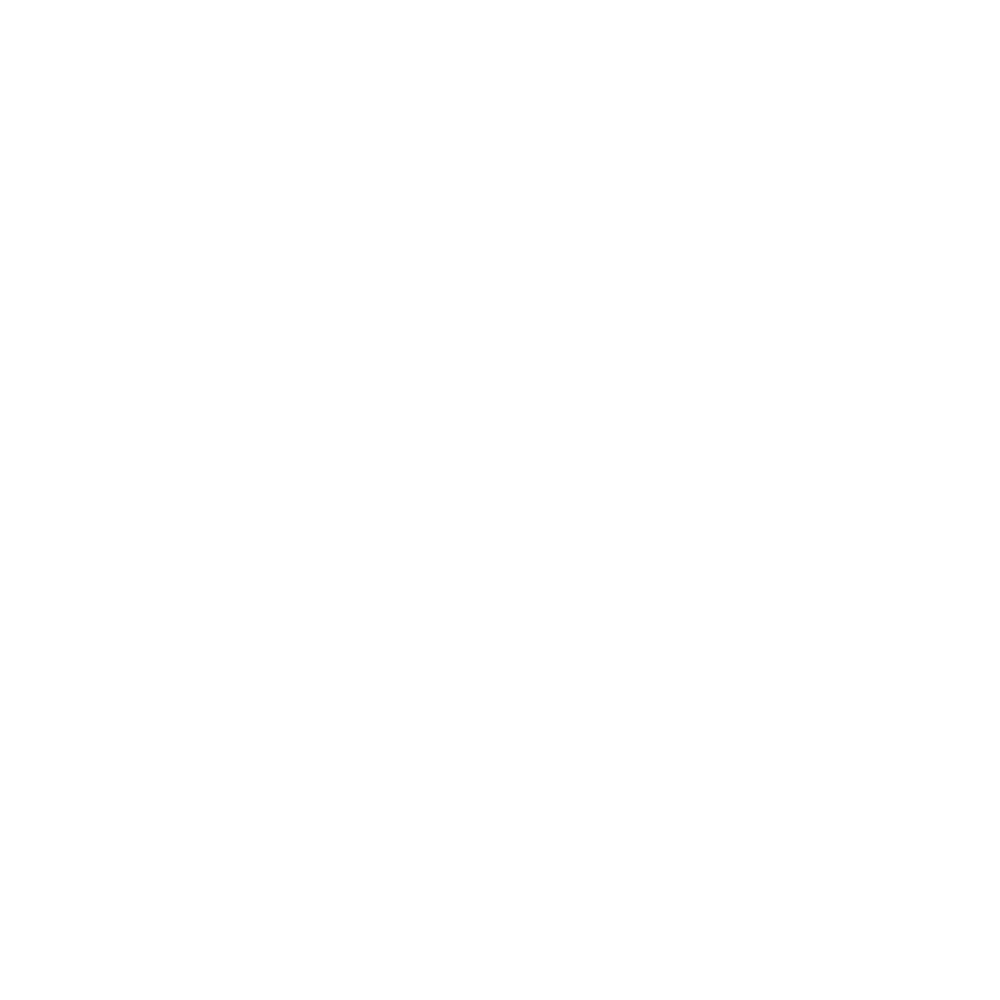

<IPython.core.display.Javascript object>


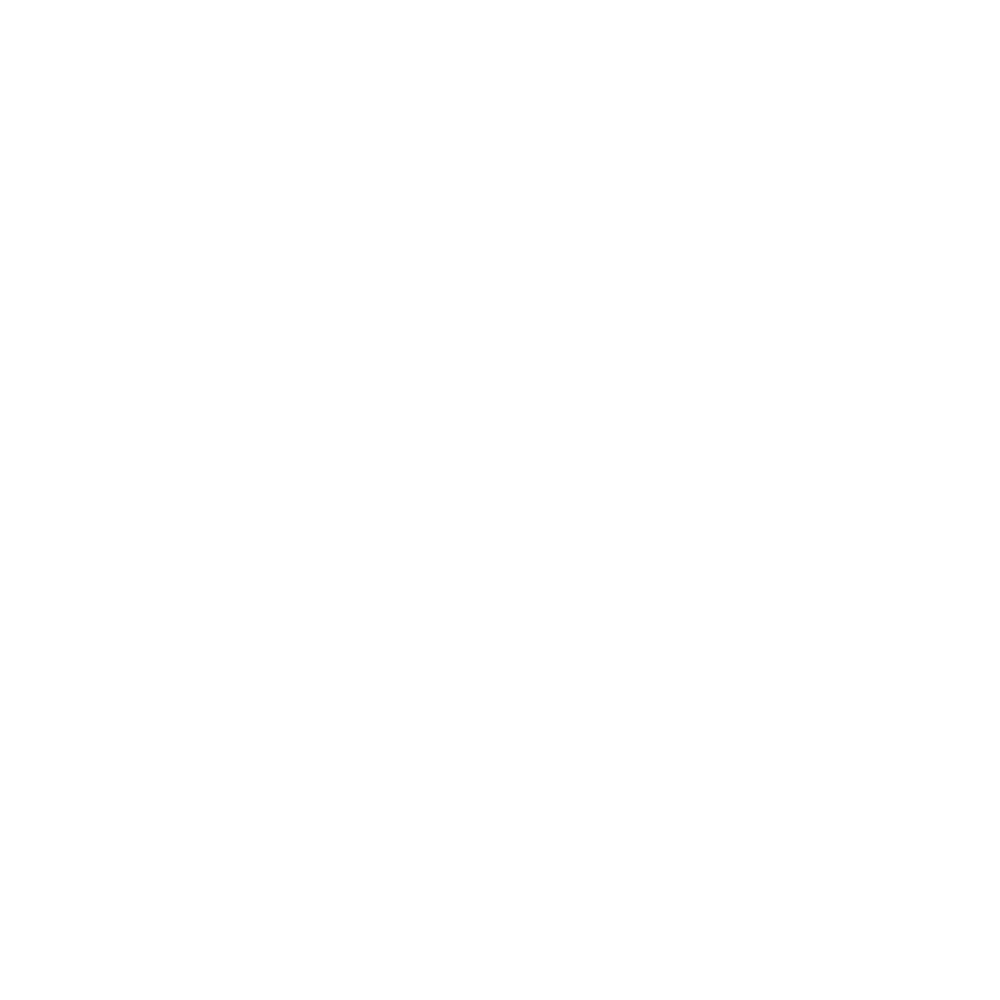

<IPython.core.display.Javascript object>


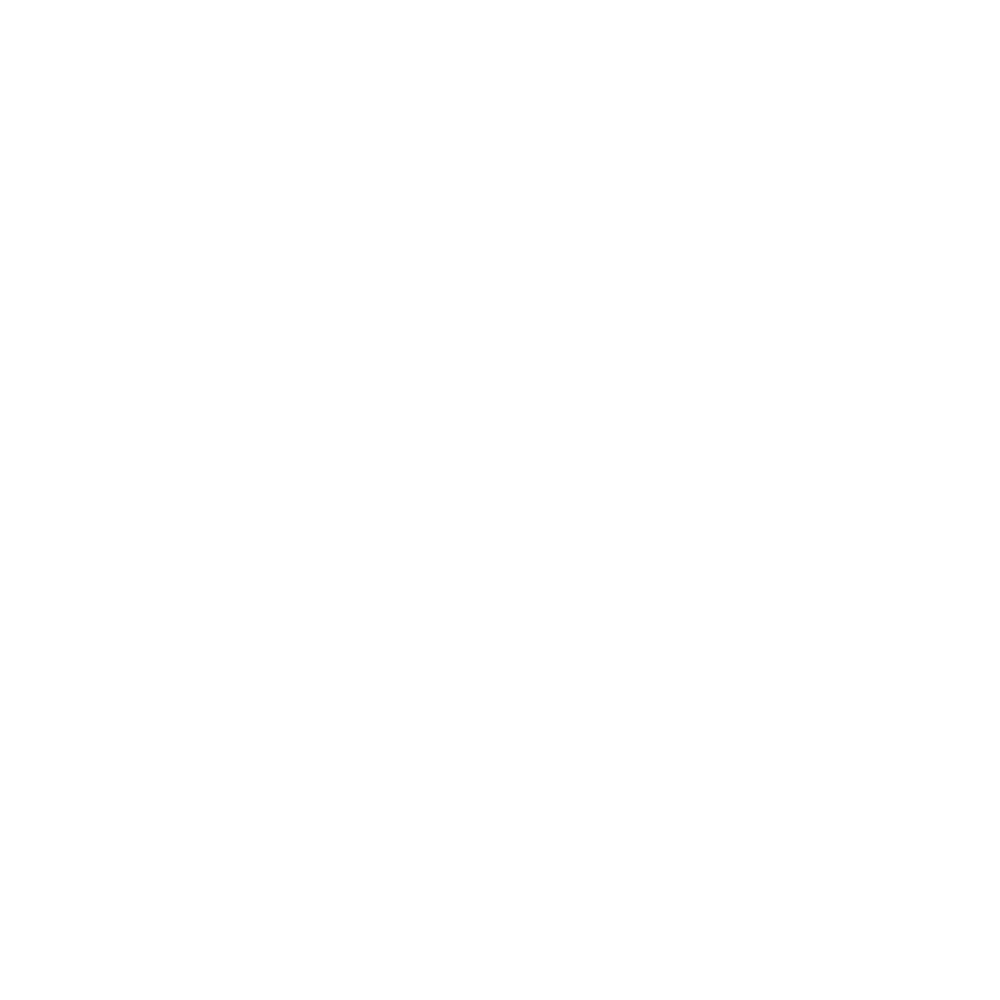

<IPython.core.display.Javascript object>


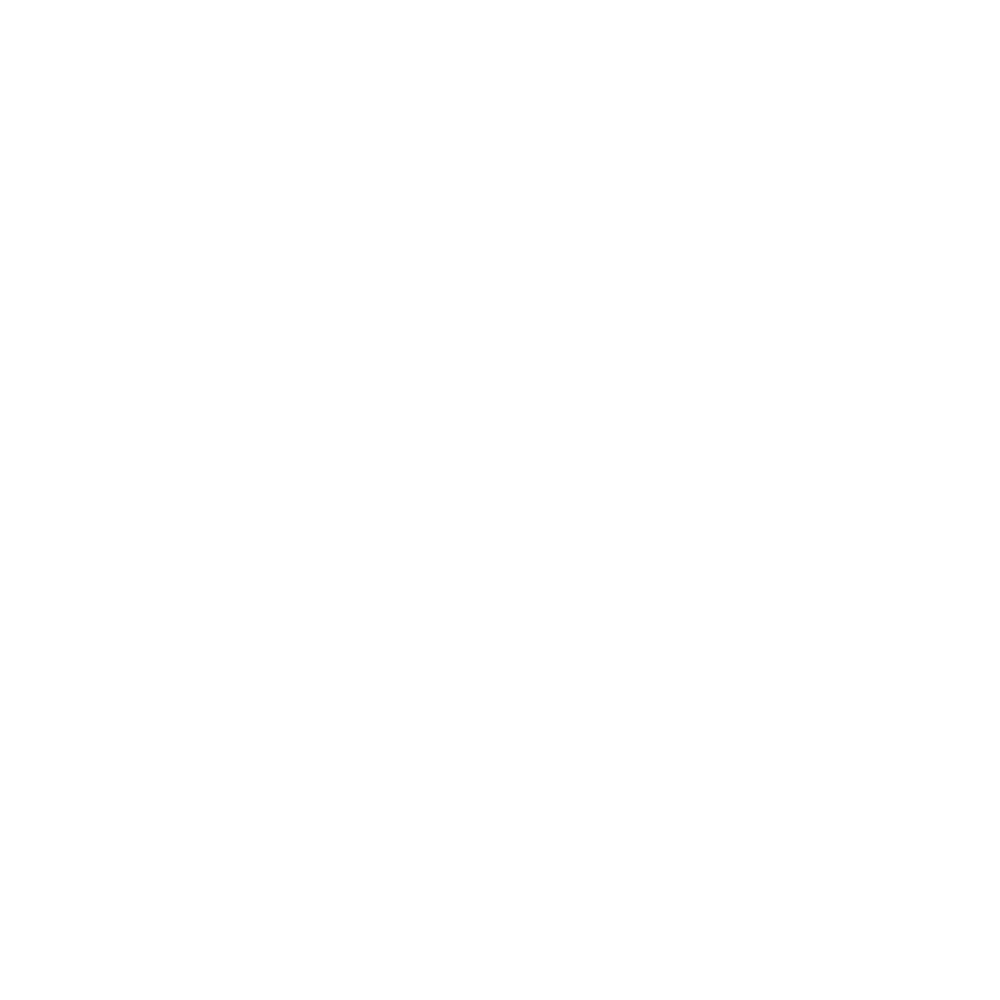

<IPython.core.display.Javascript object>


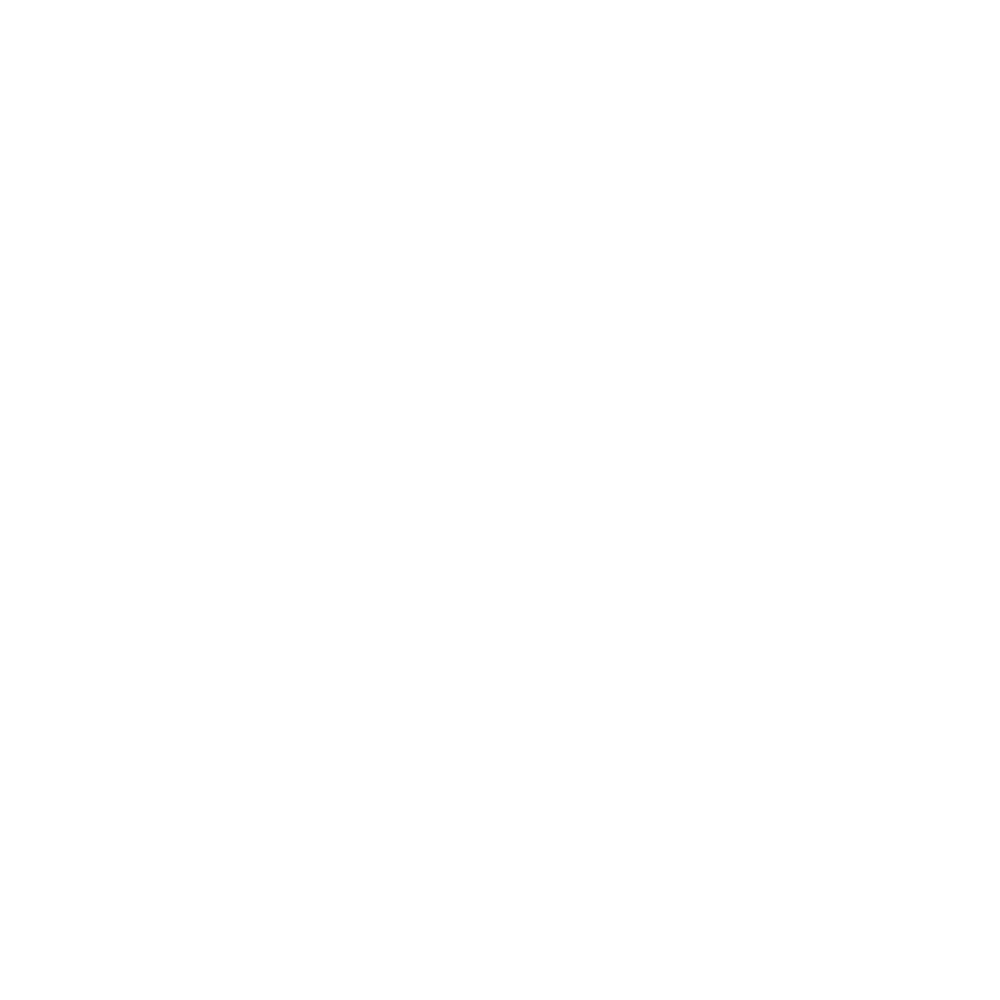

<IPython.core.display.Javascript object>


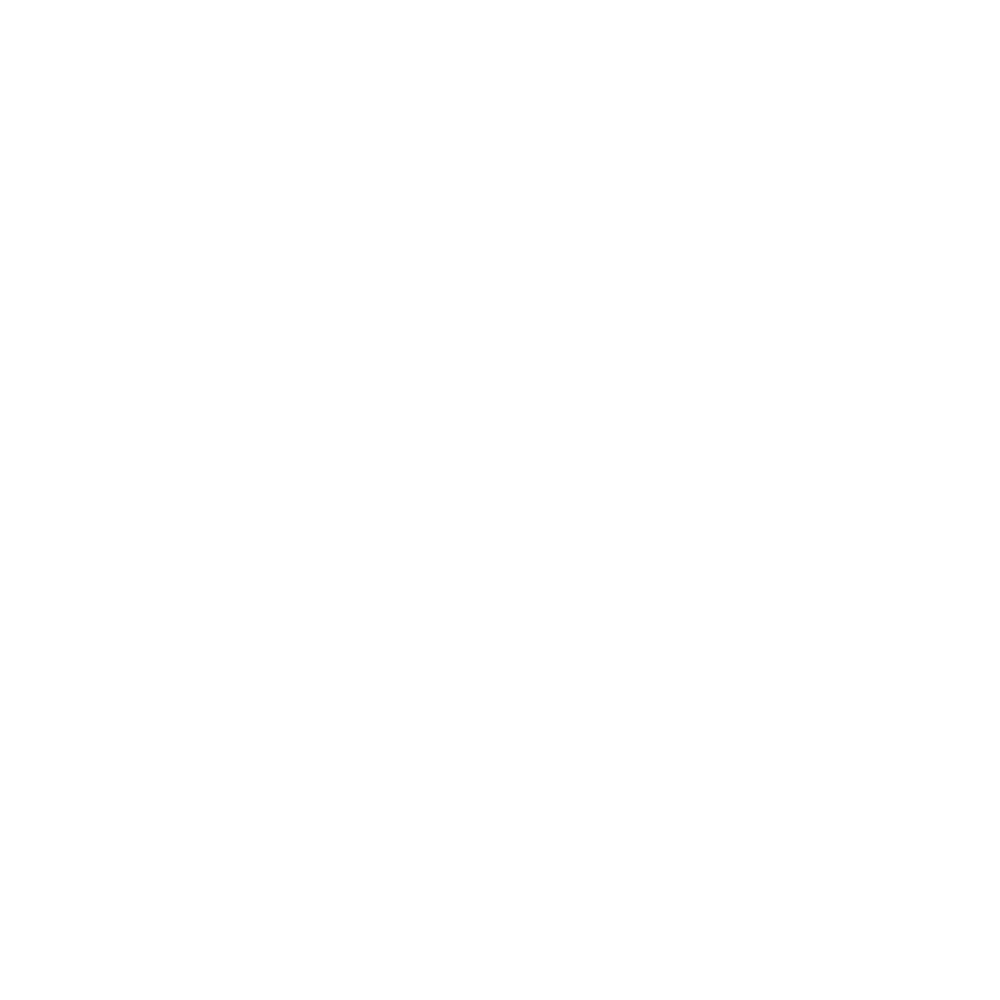

<IPython.core.display.Javascript object>


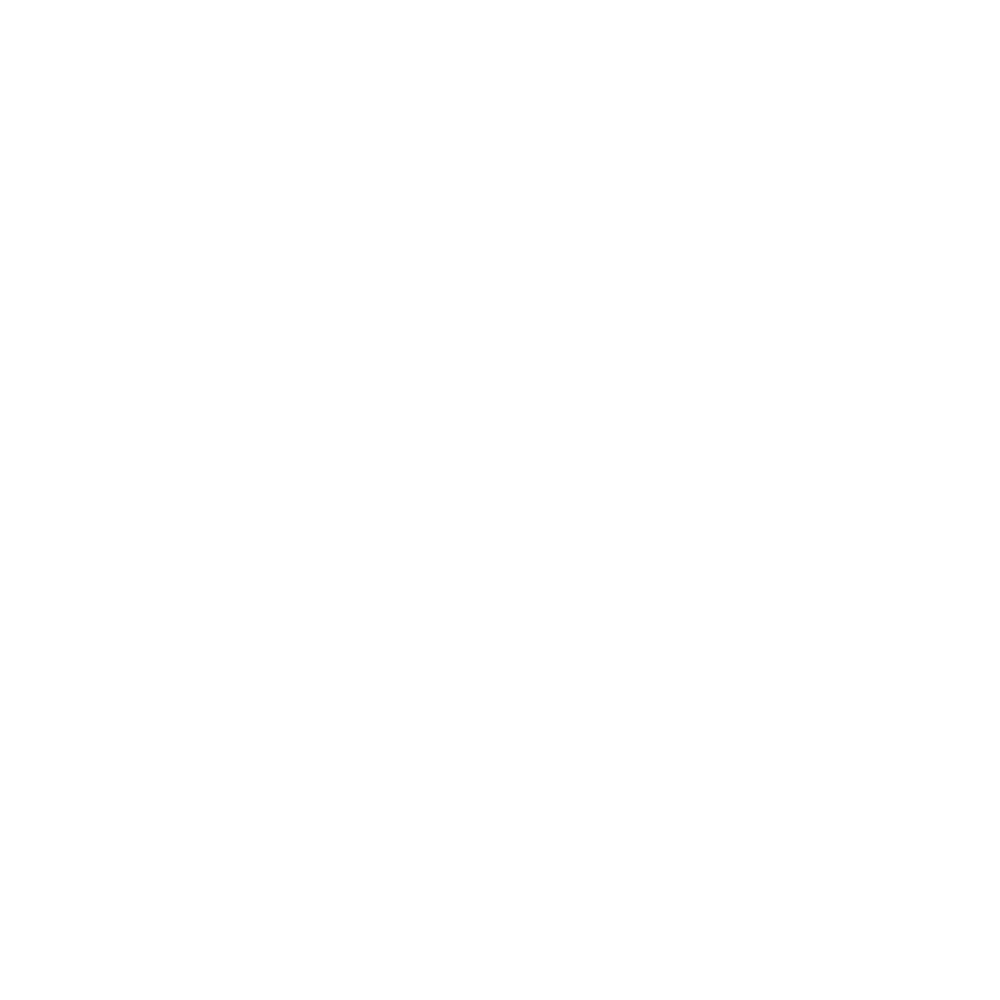

<IPython.core.display.Javascript object>


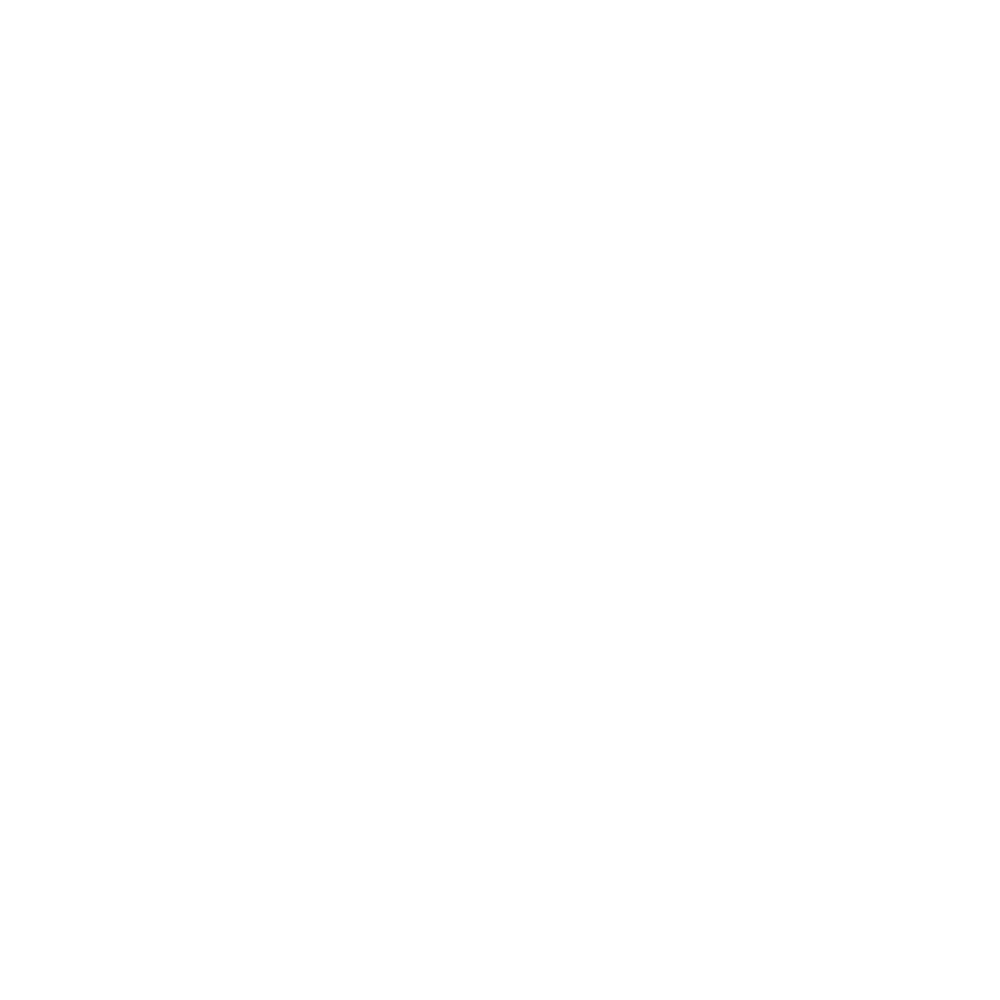

<IPython.core.display.Javascript object>


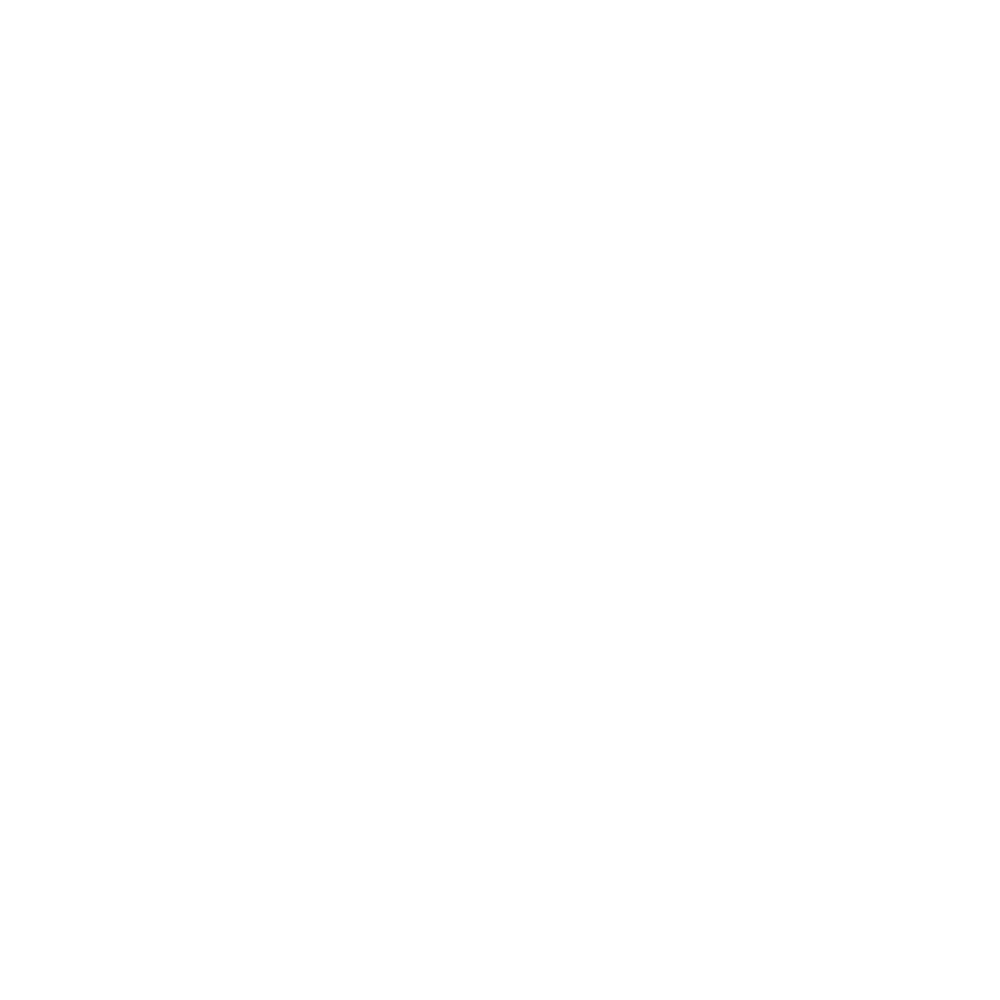

<IPython.core.display.Javascript object>


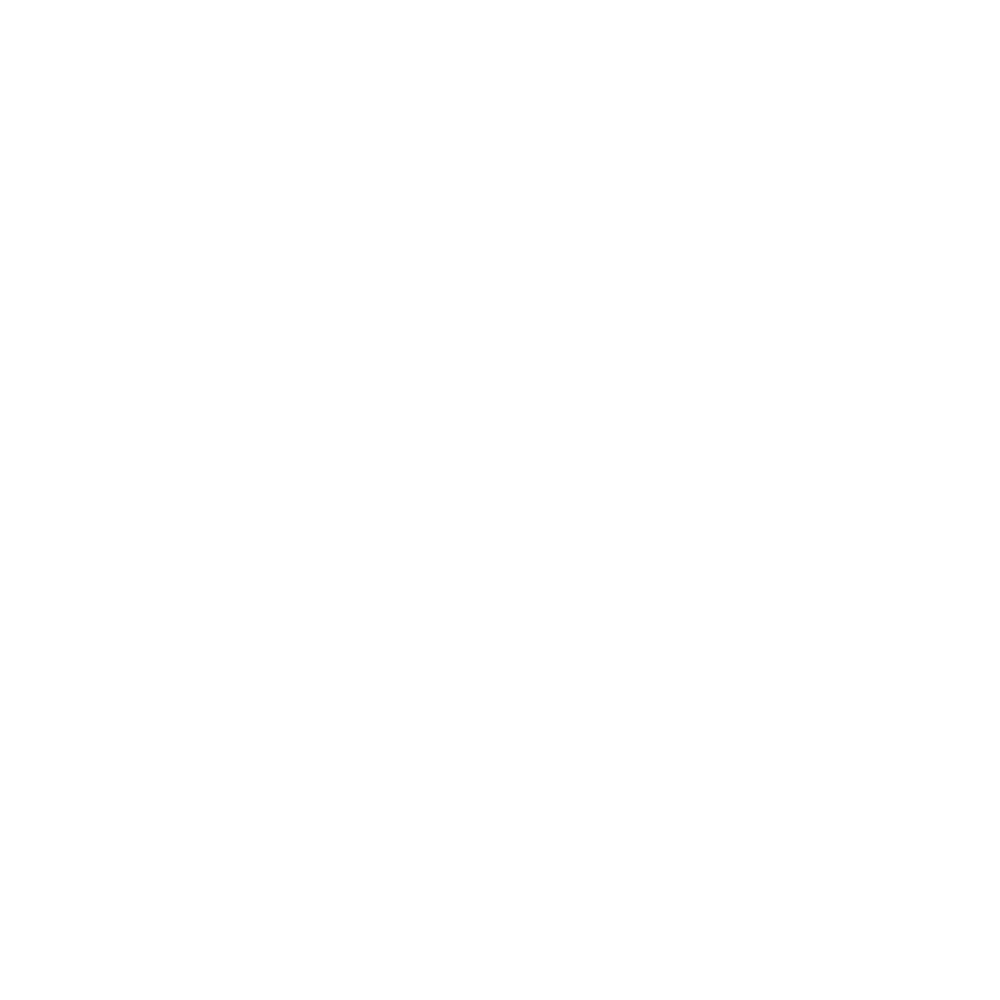

<IPython.core.display.Javascript object>


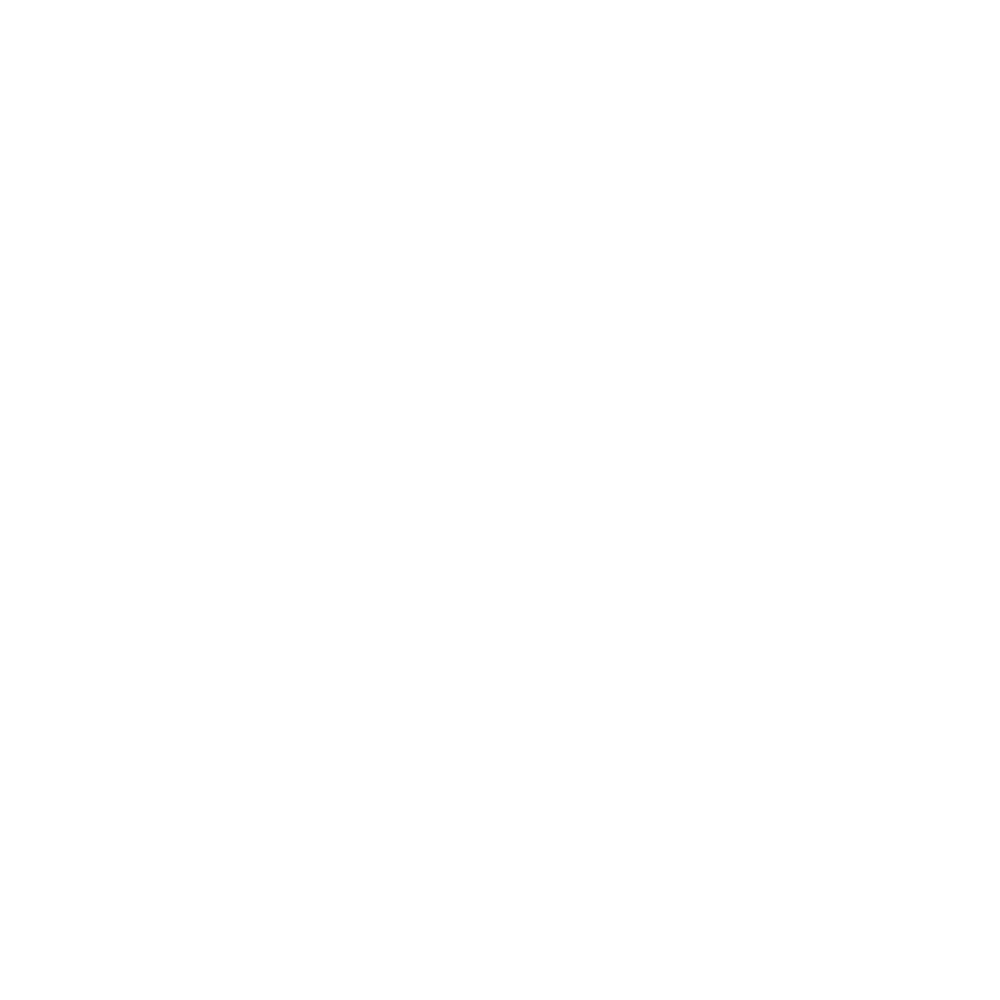

<IPython.core.display.Javascript object>


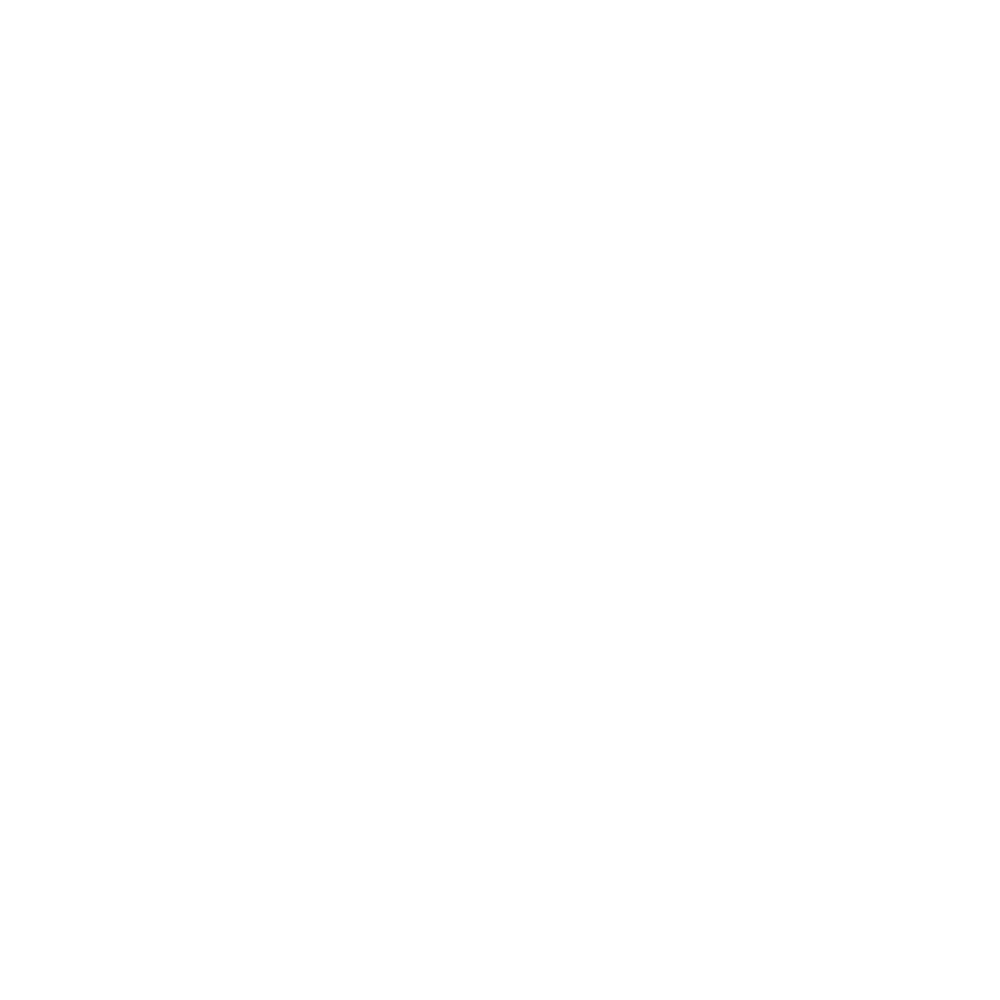

<IPython.core.display.Javascript object>


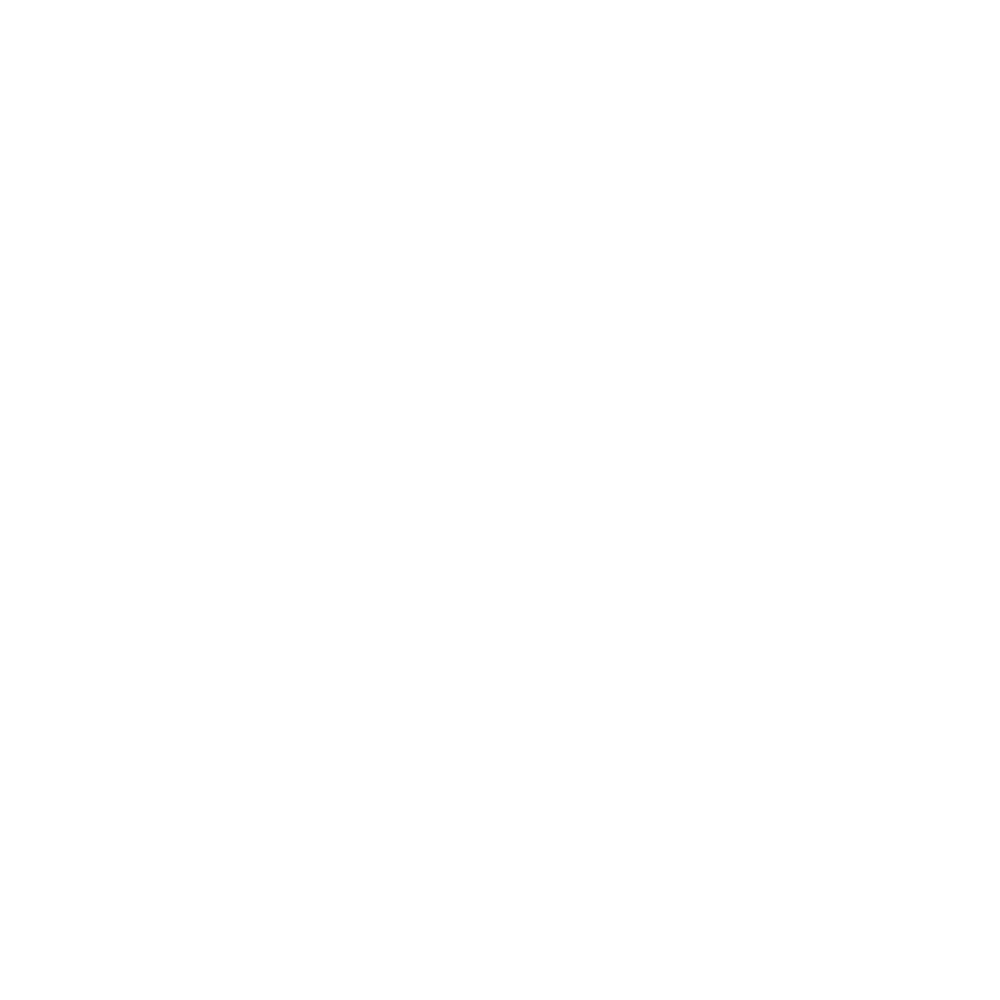

<IPython.core.display.Javascript object>


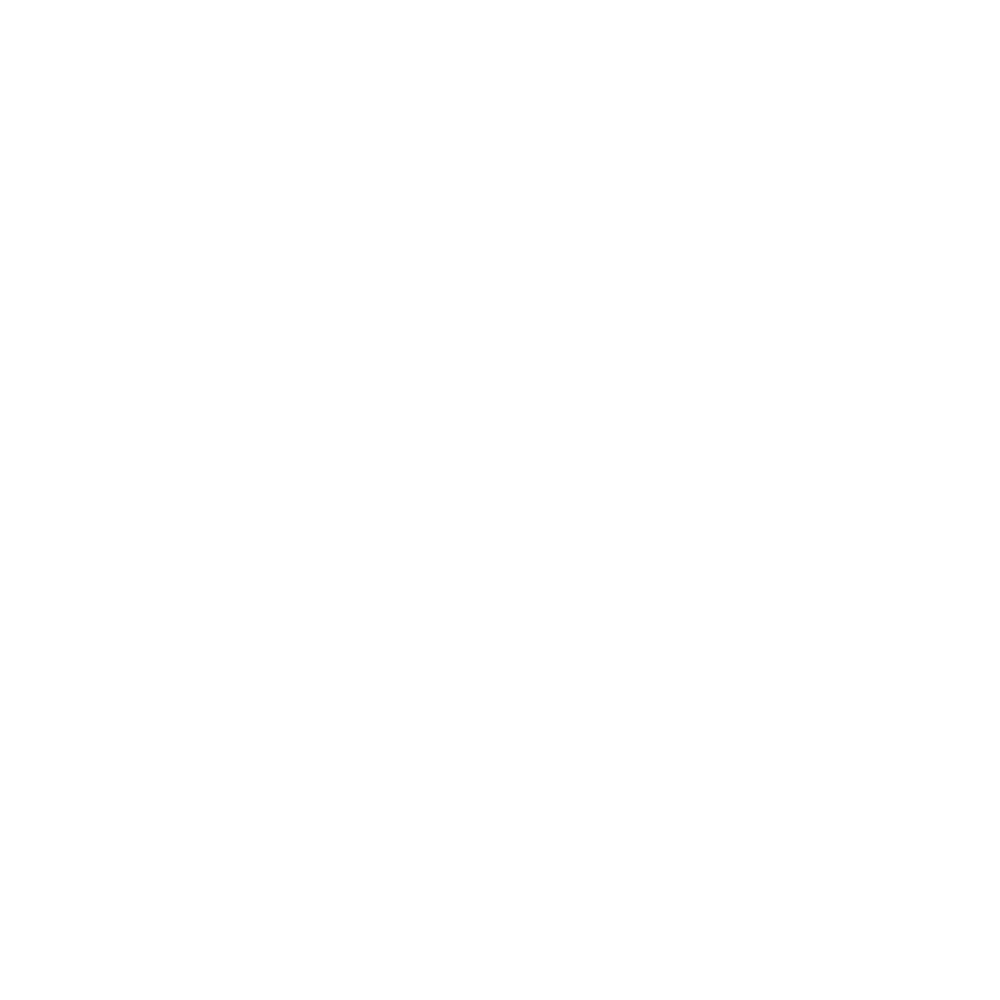

<IPython.core.display.Javascript object>


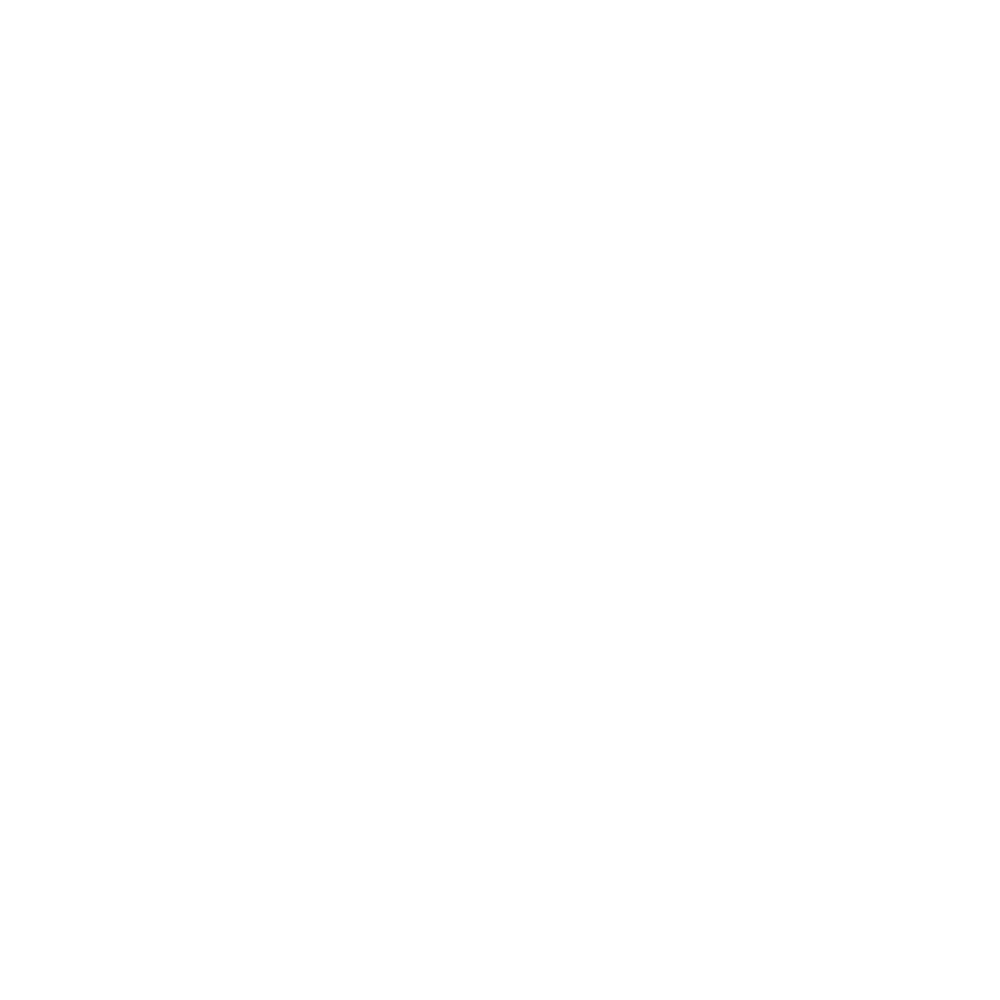

<IPython.core.display.Javascript object>


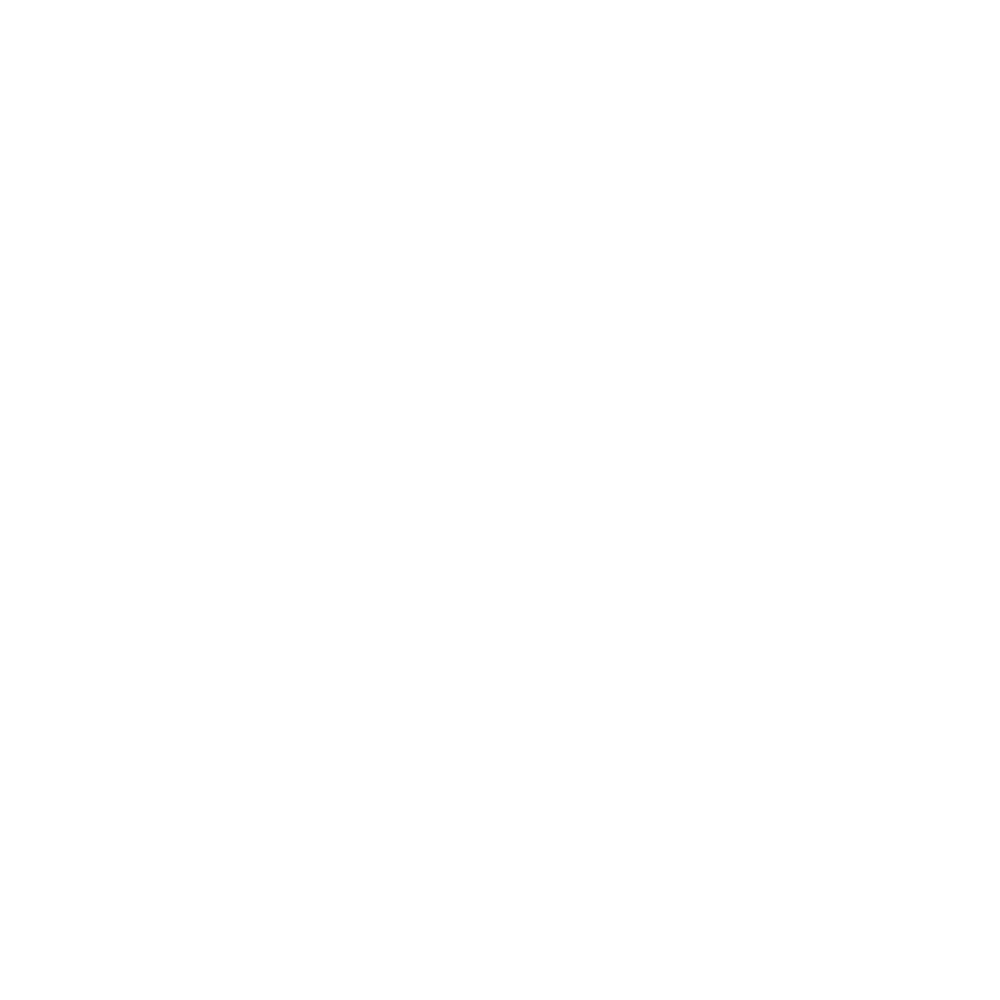

<IPython.core.display.Javascript object>


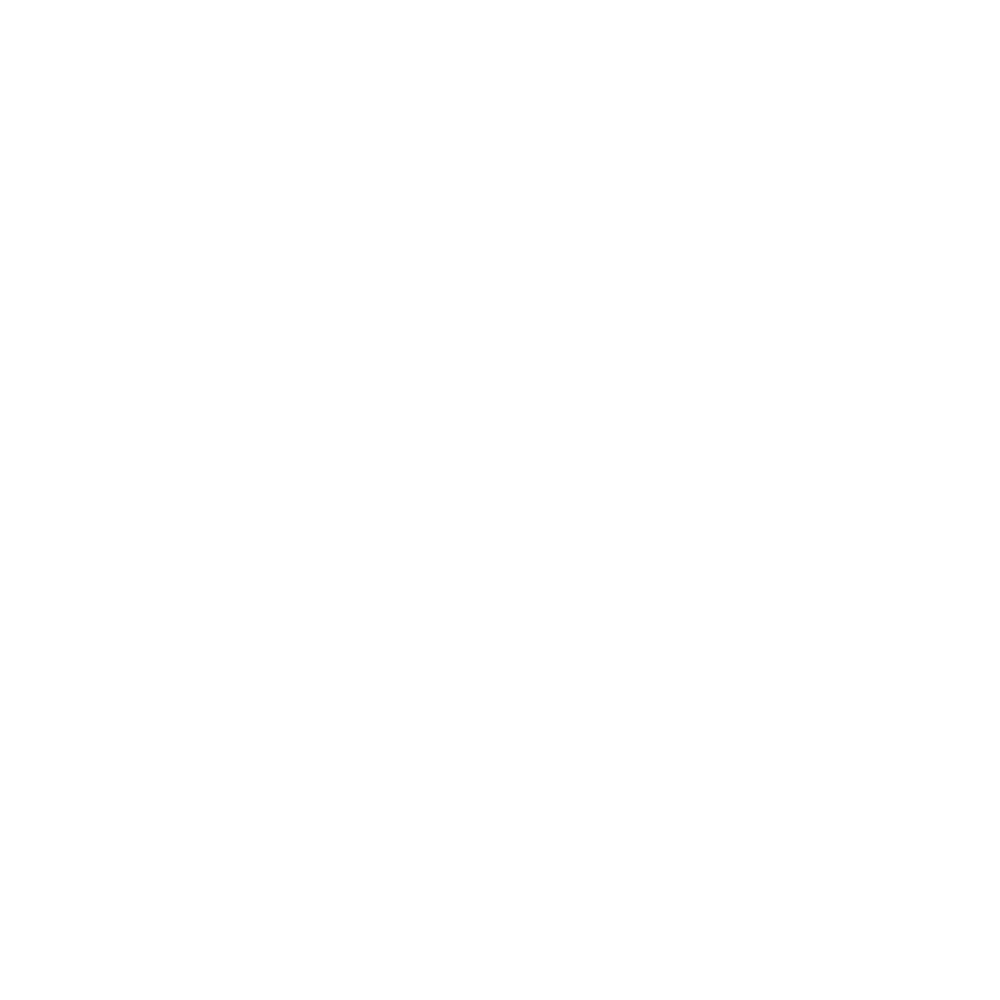

<IPython.core.display.Javascript object>


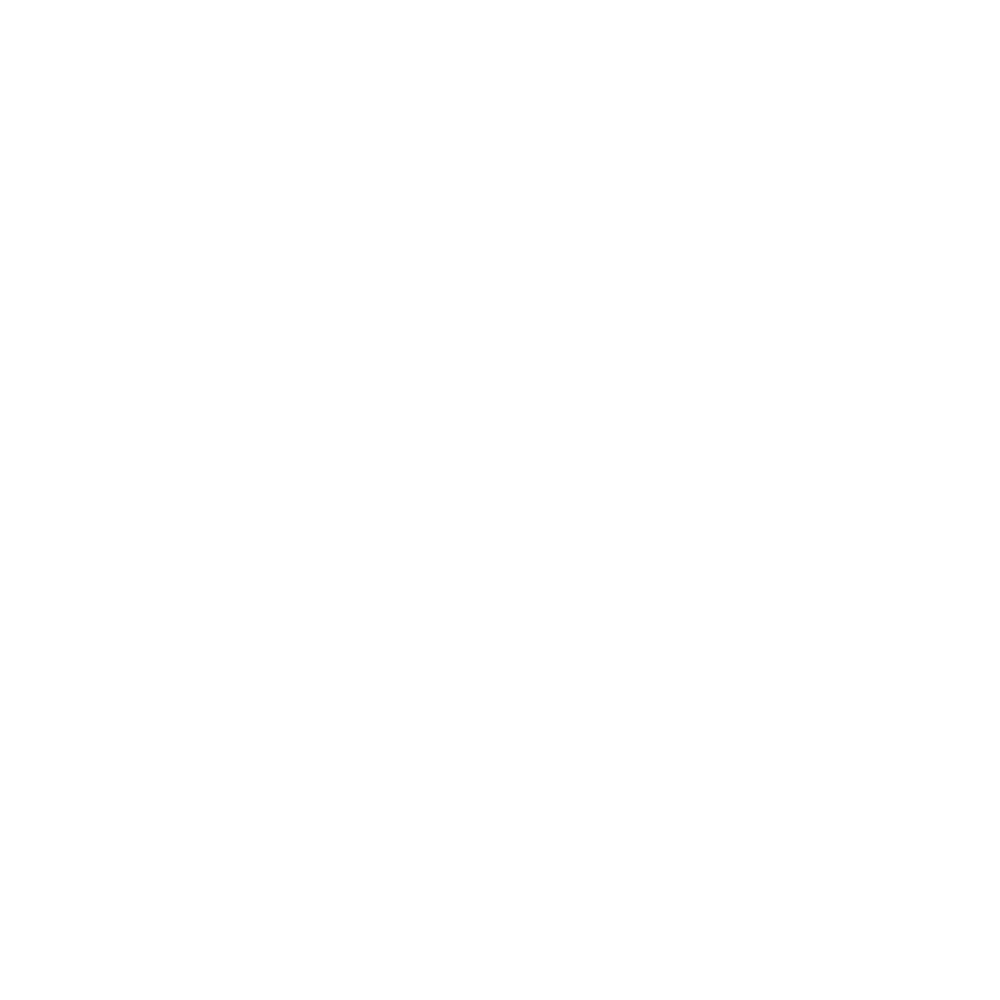

<IPython.core.display.Javascript object>


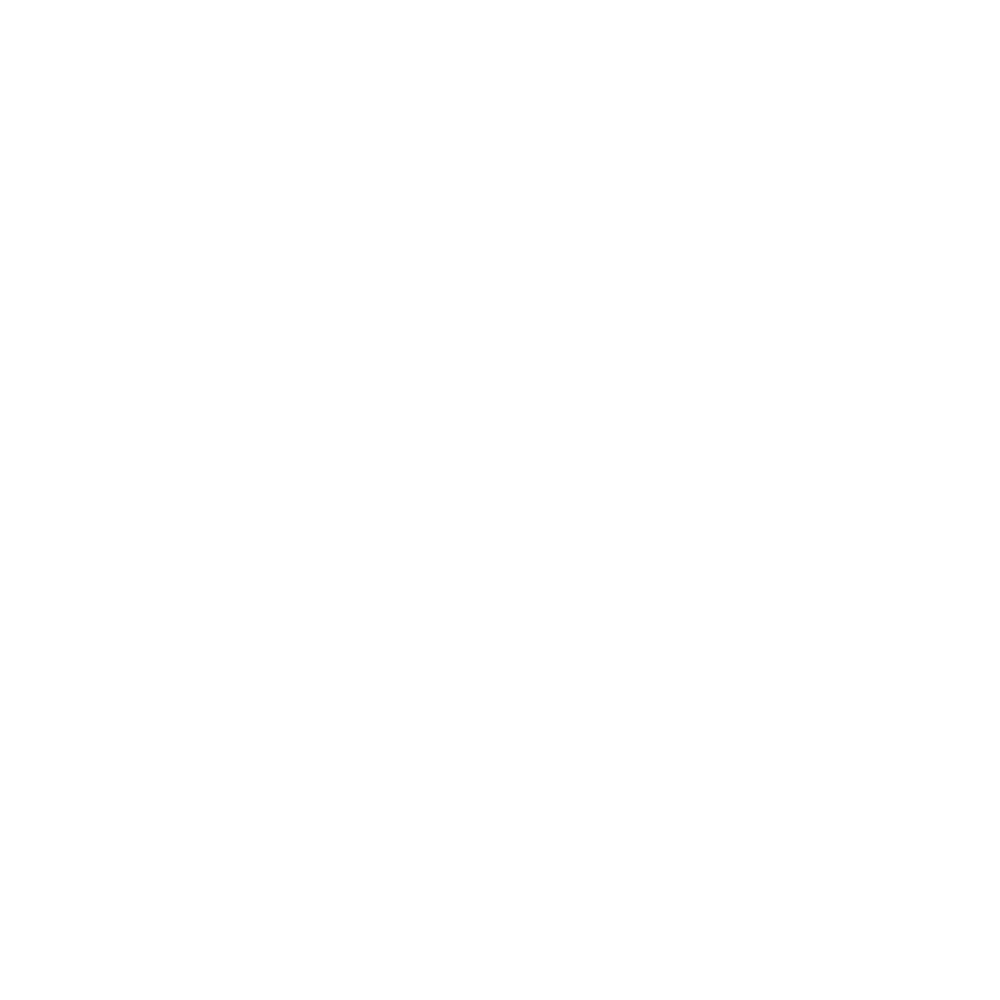

<IPython.core.display.Javascript object>


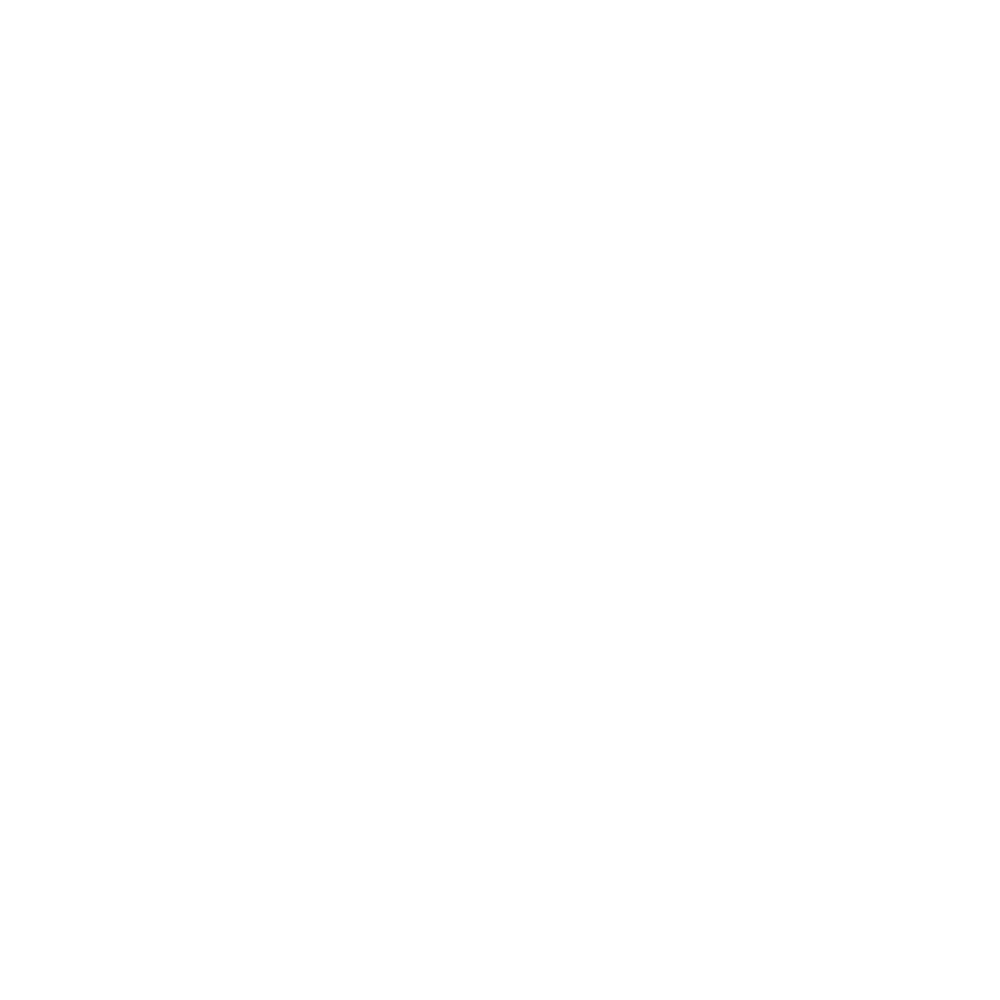

<IPython.core.display.Javascript object>


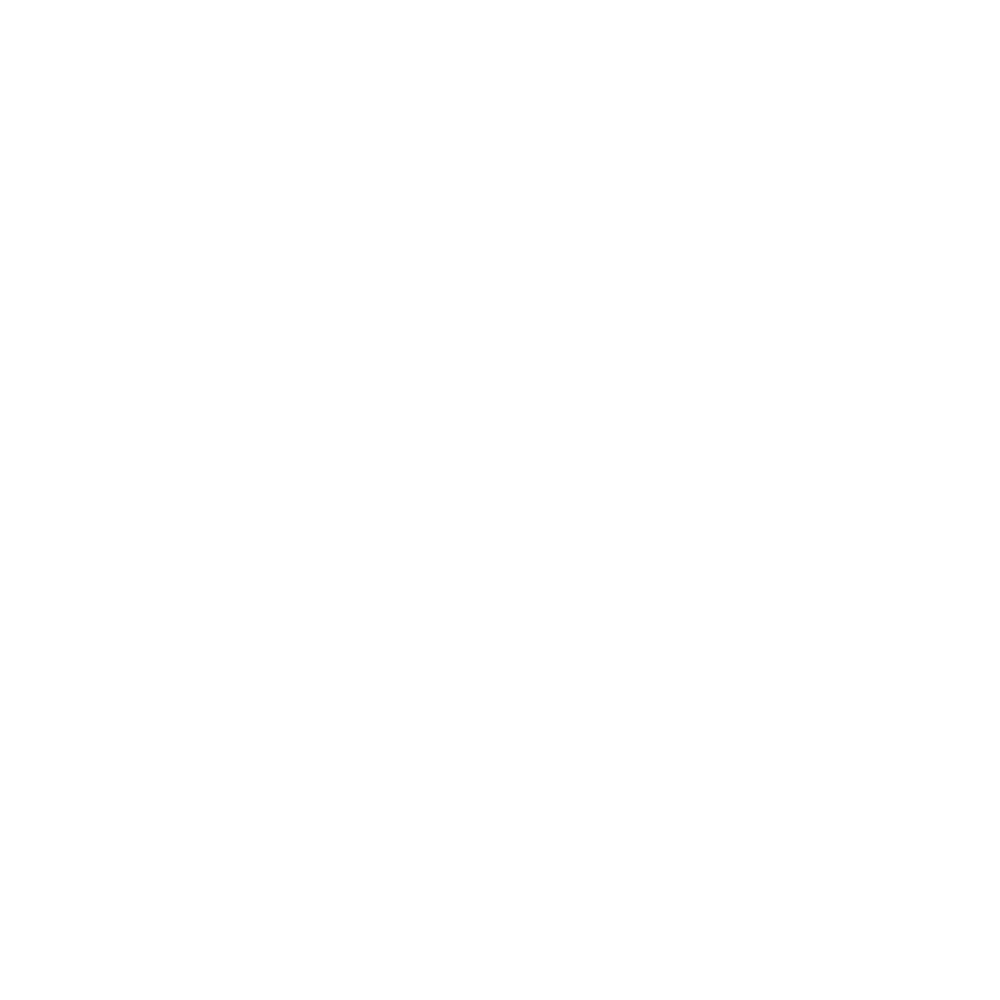

<IPython.core.display.Javascript object>


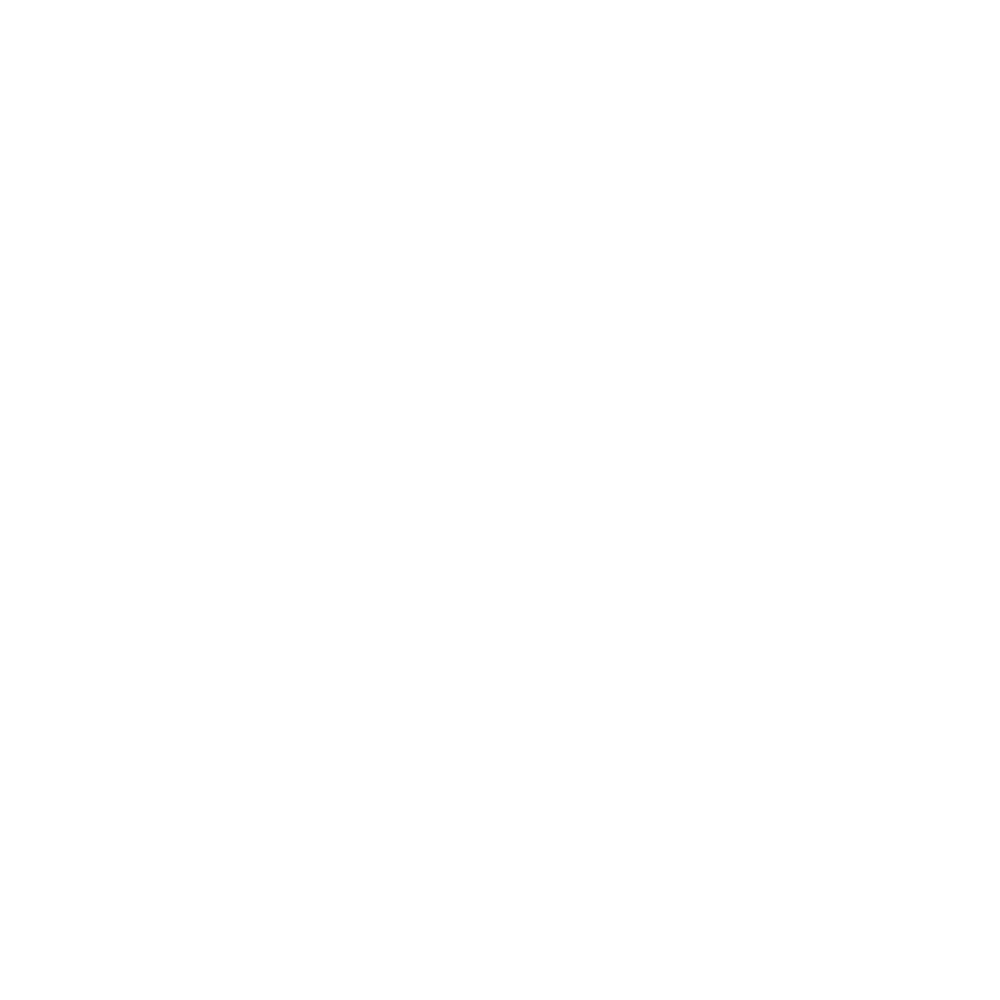

<IPython.core.display.Javascript object>


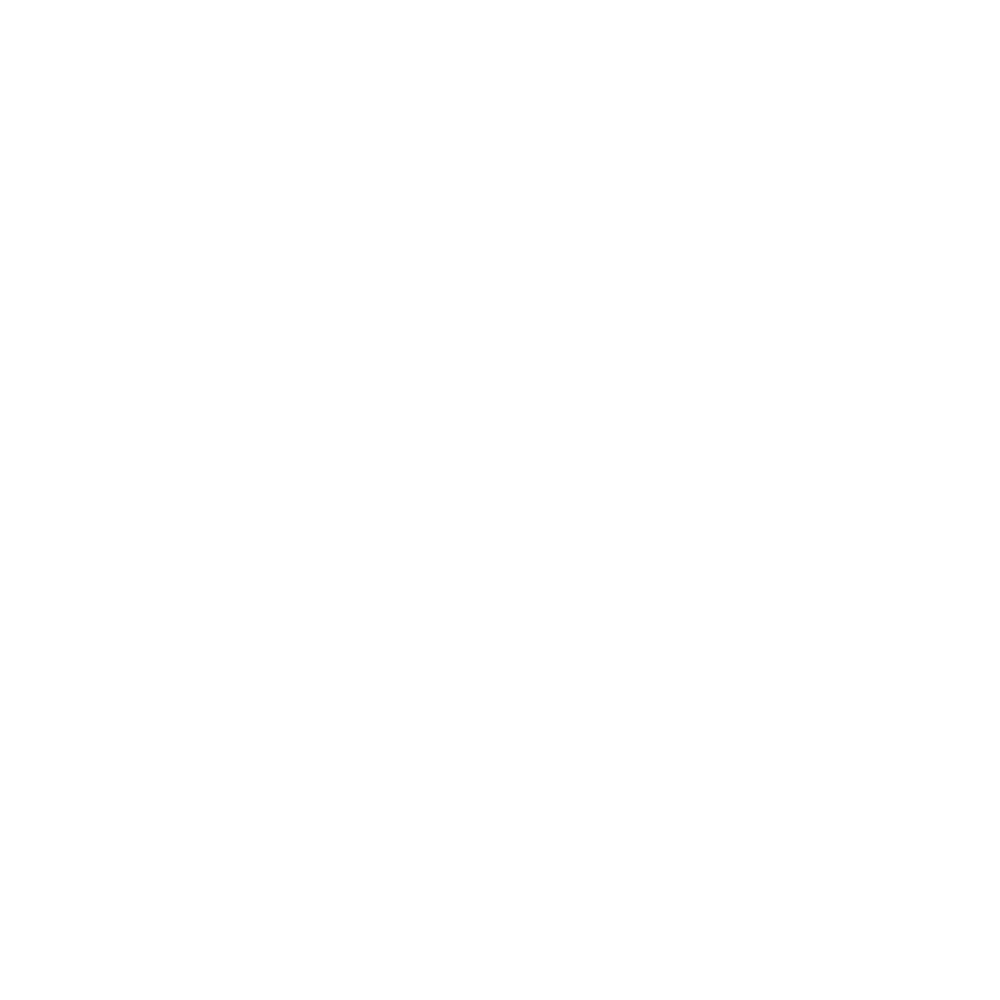

<IPython.core.display.Javascript object>


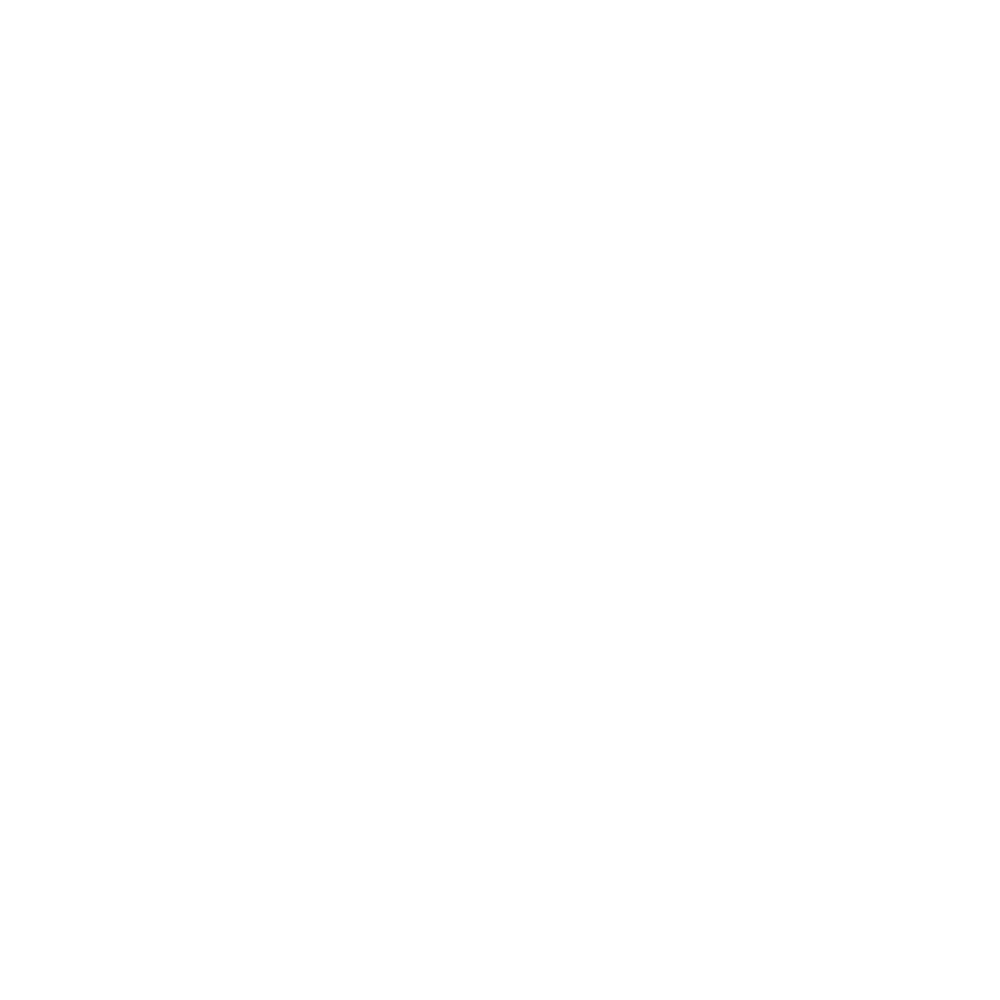

<IPython.core.display.Javascript object>


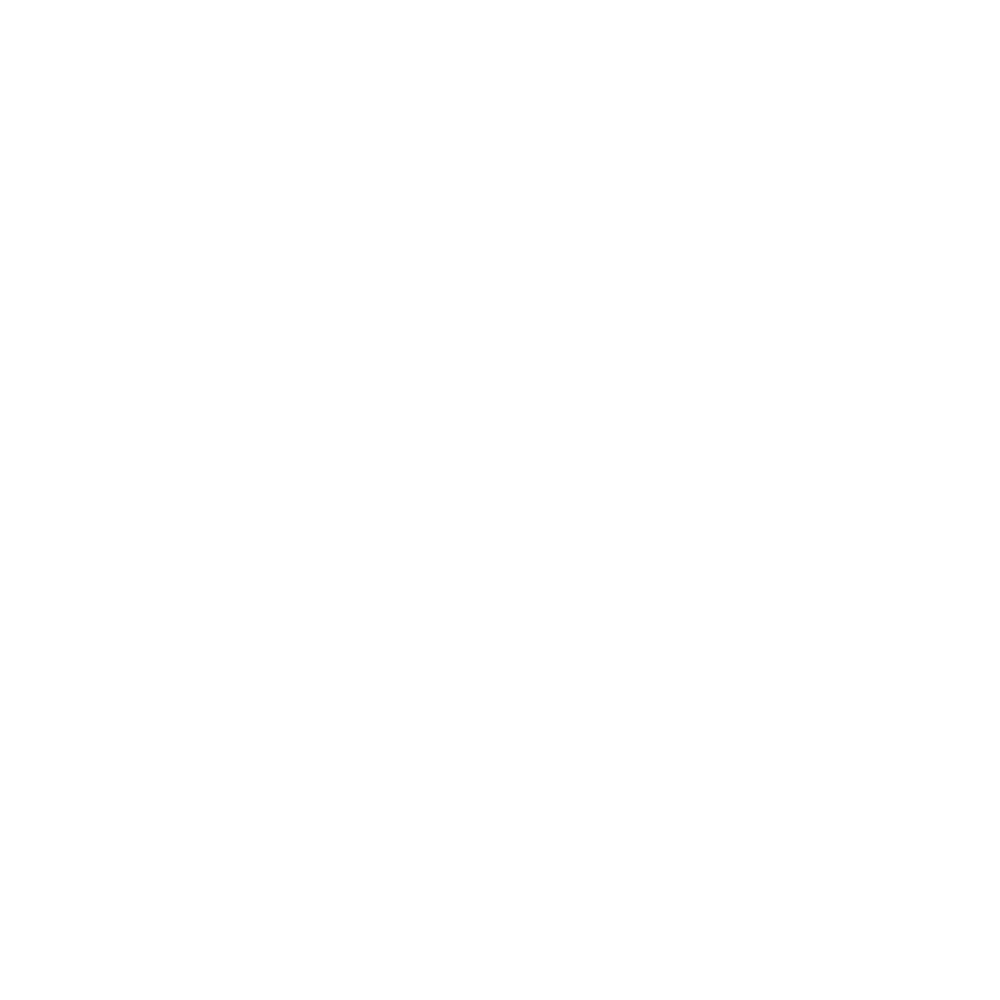

<IPython.core.display.Javascript object>


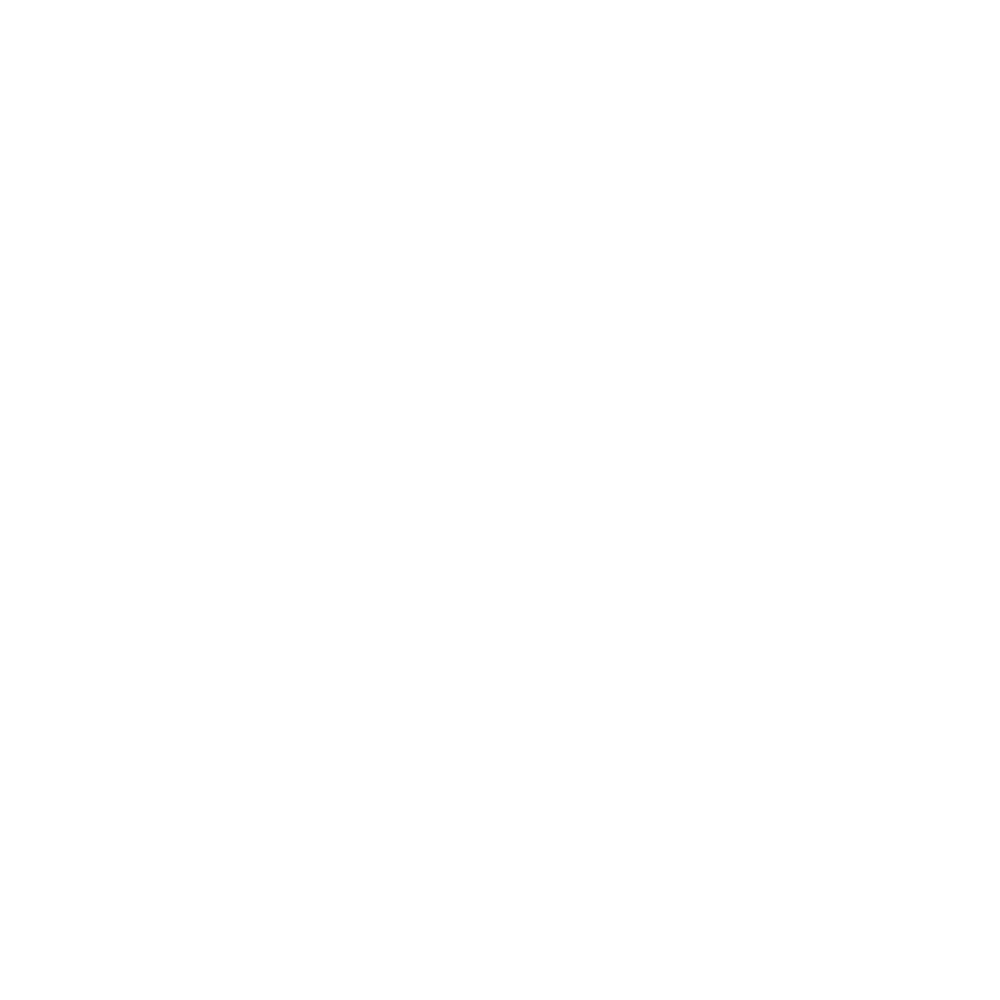

<IPython.core.display.Javascript object>


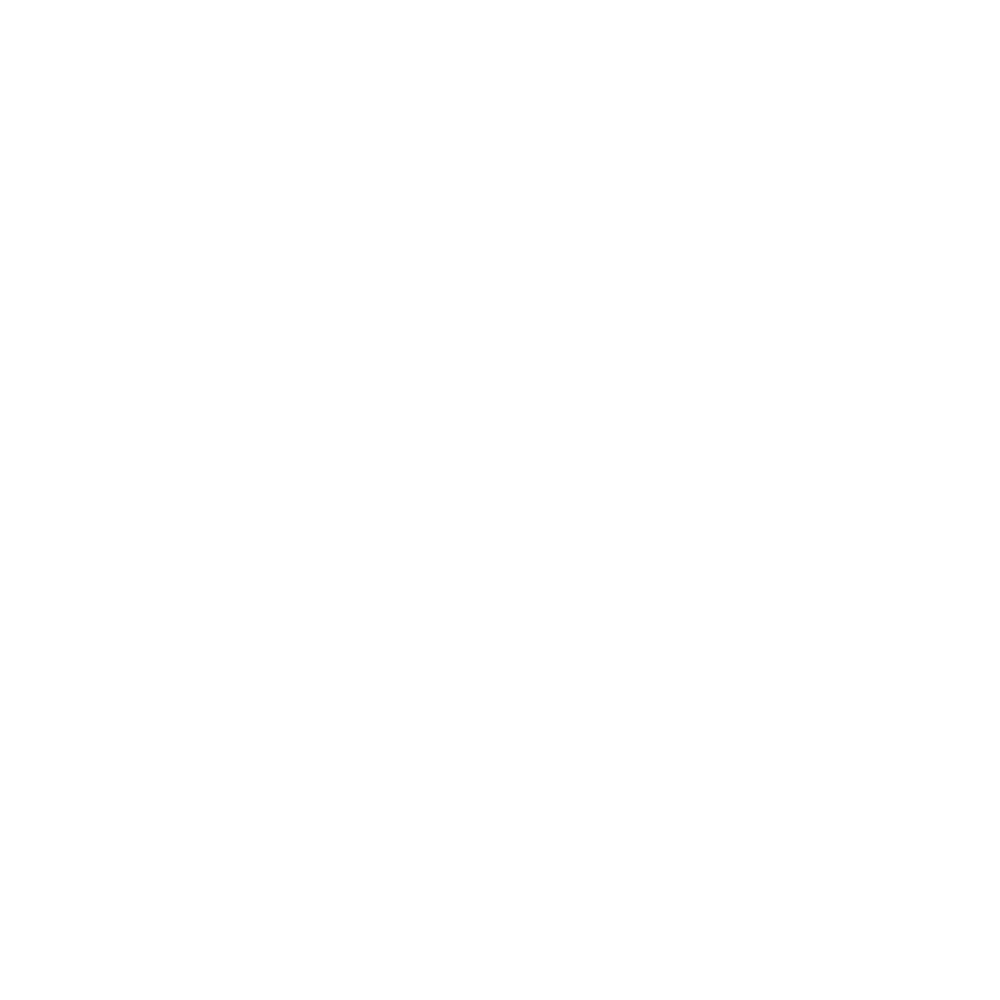

<IPython.core.display.Javascript object>


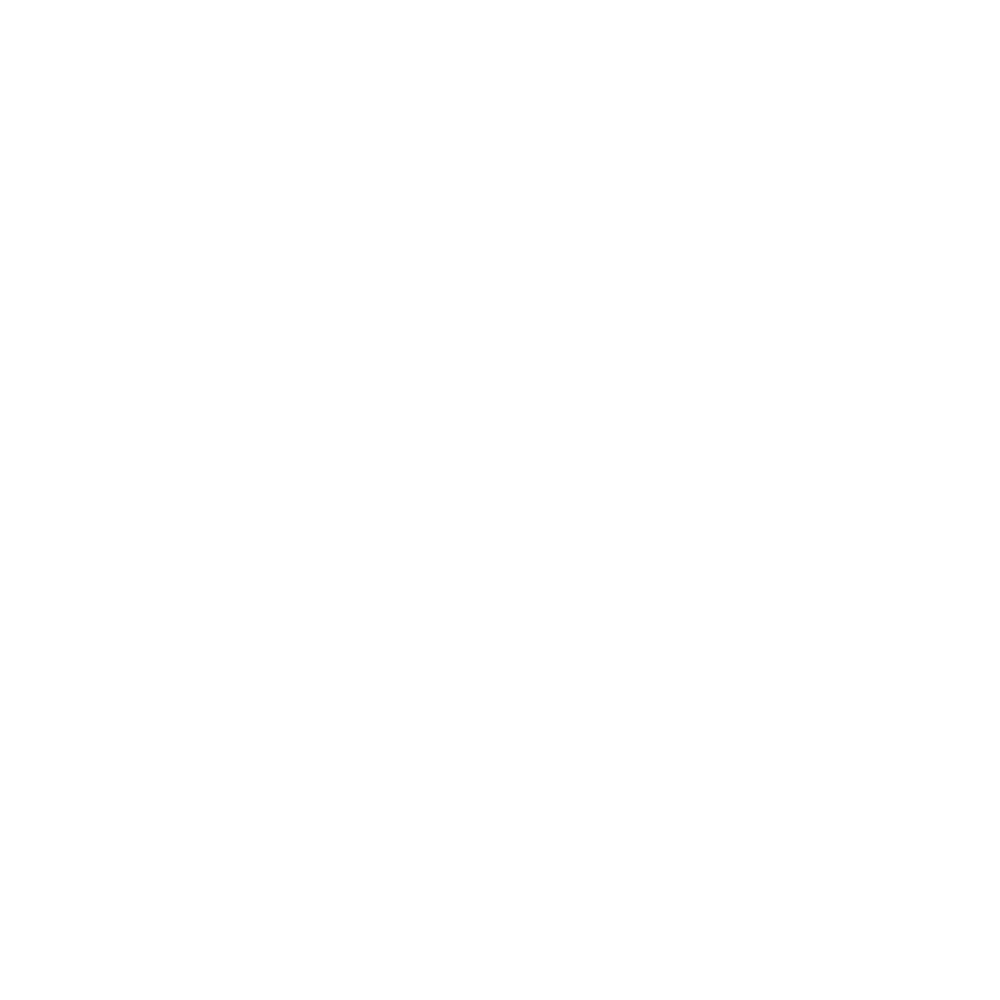

<IPython.core.display.Javascript object>


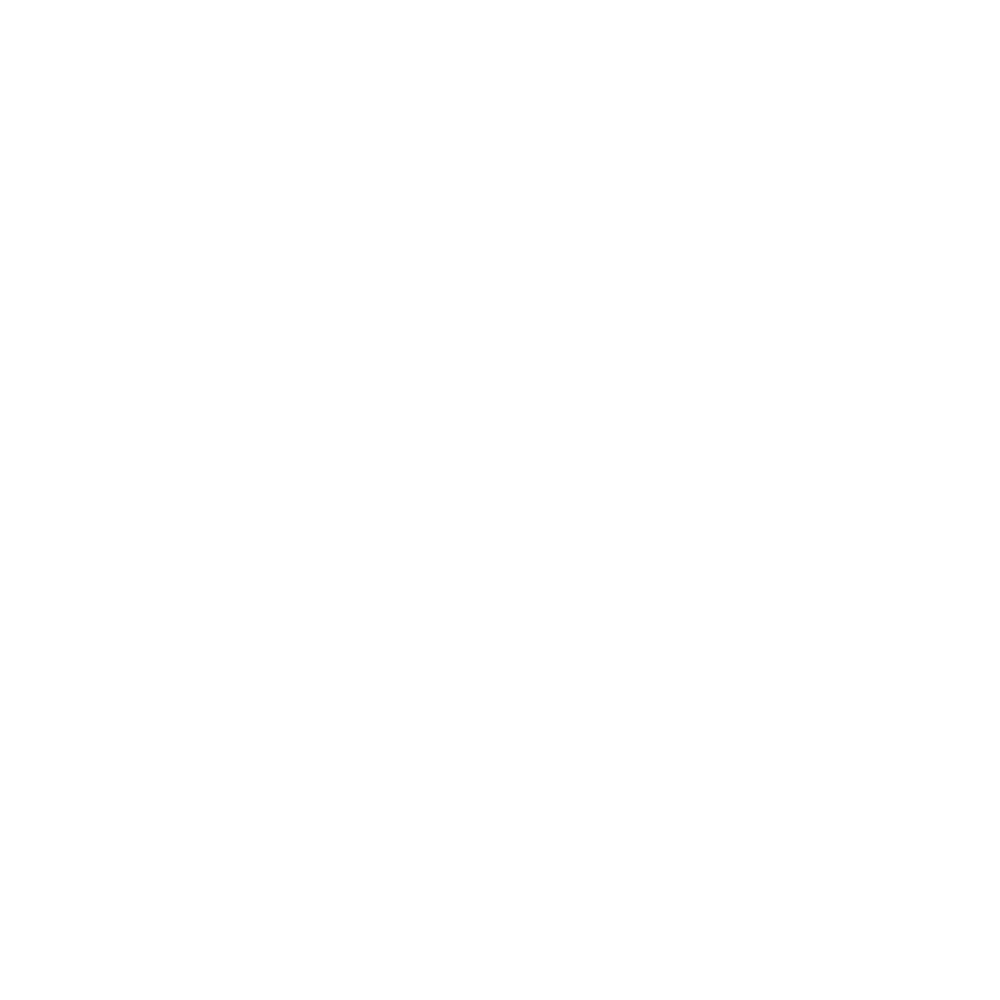

<IPython.core.display.Javascript object>


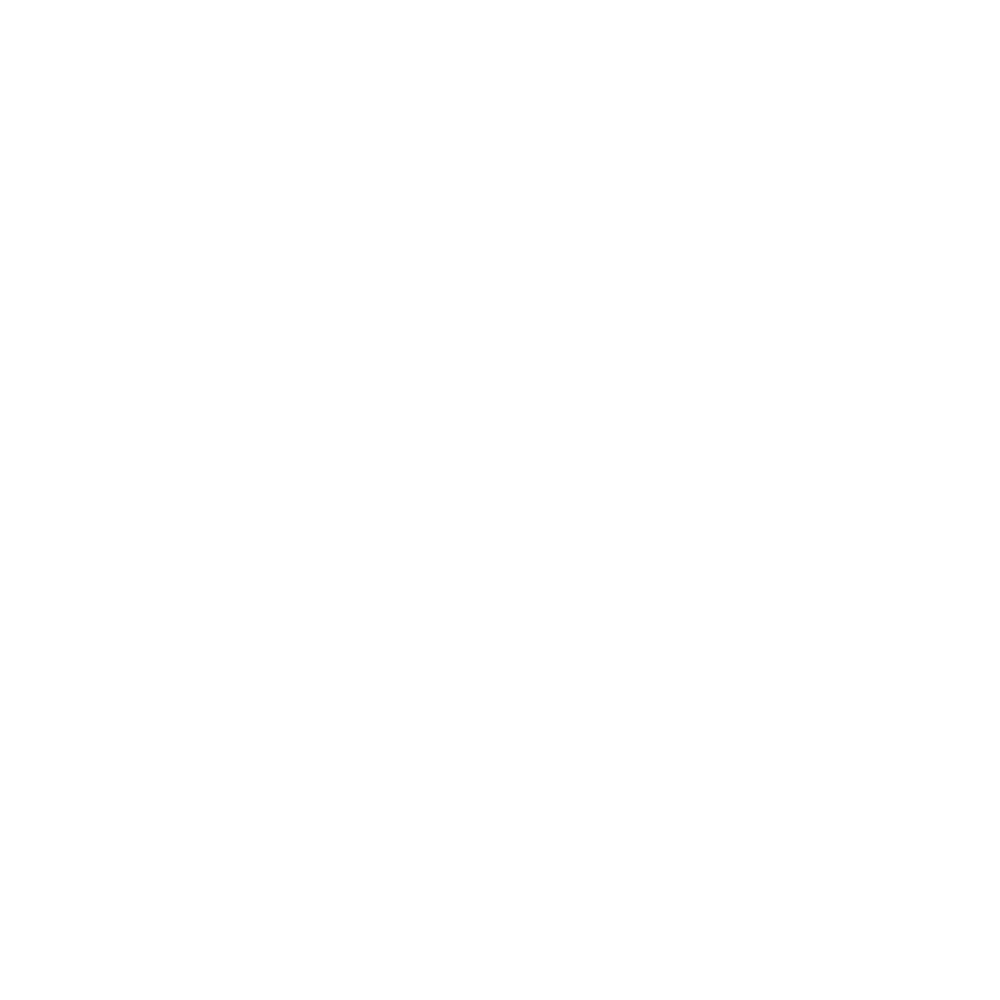

<IPython.core.display.Javascript object>


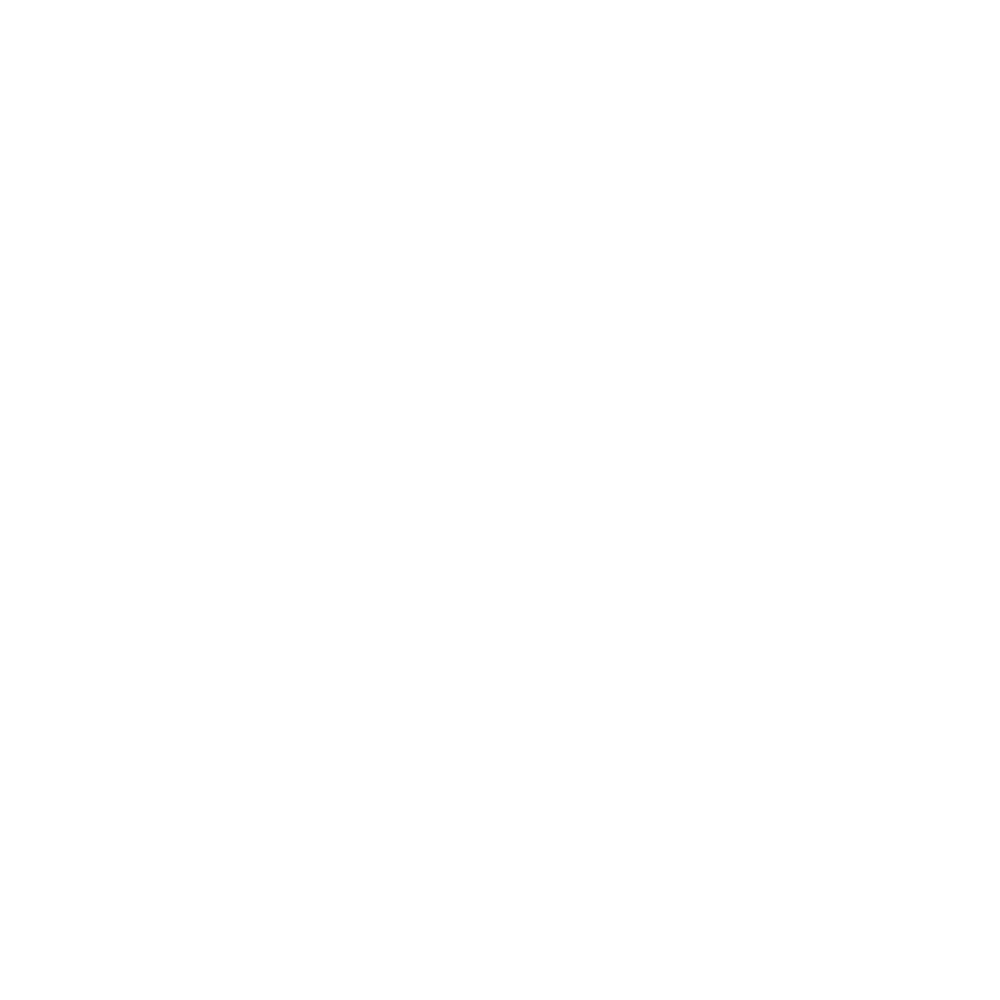

<IPython.core.display.Javascript object>


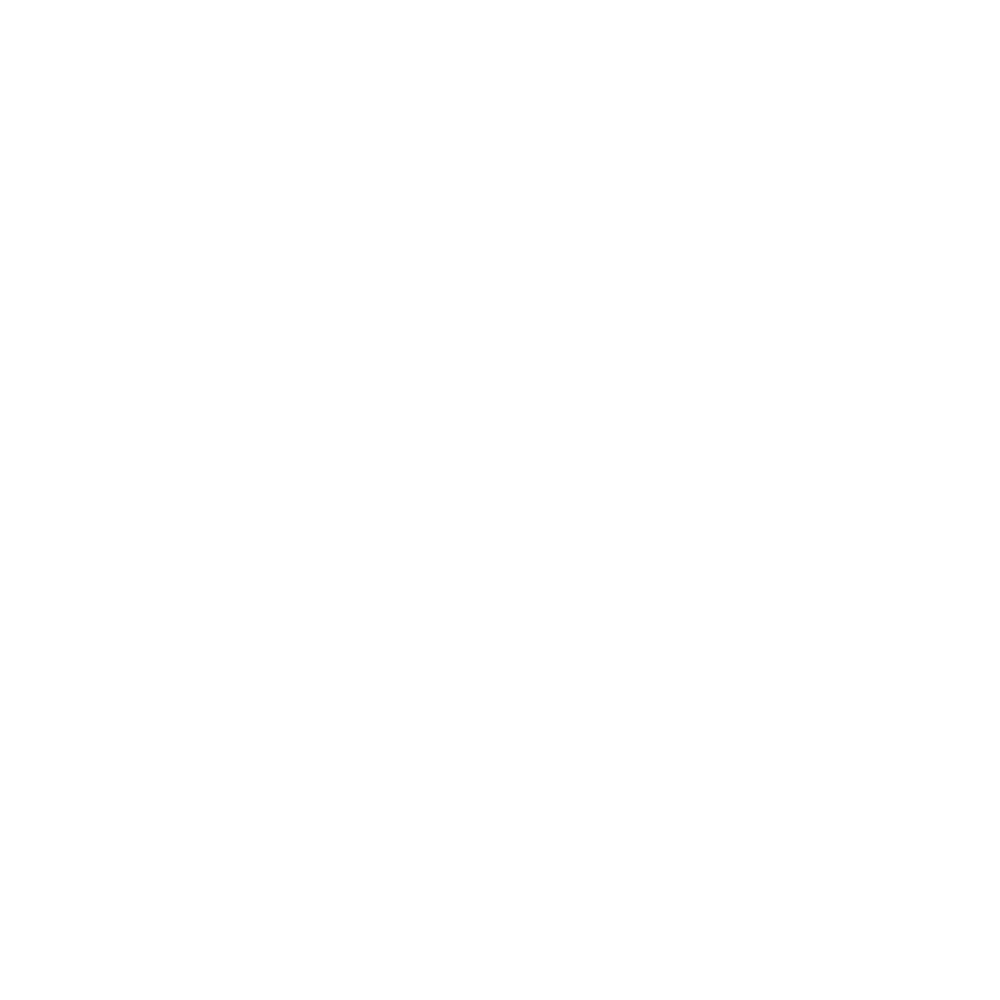

<IPython.core.display.Javascript object>


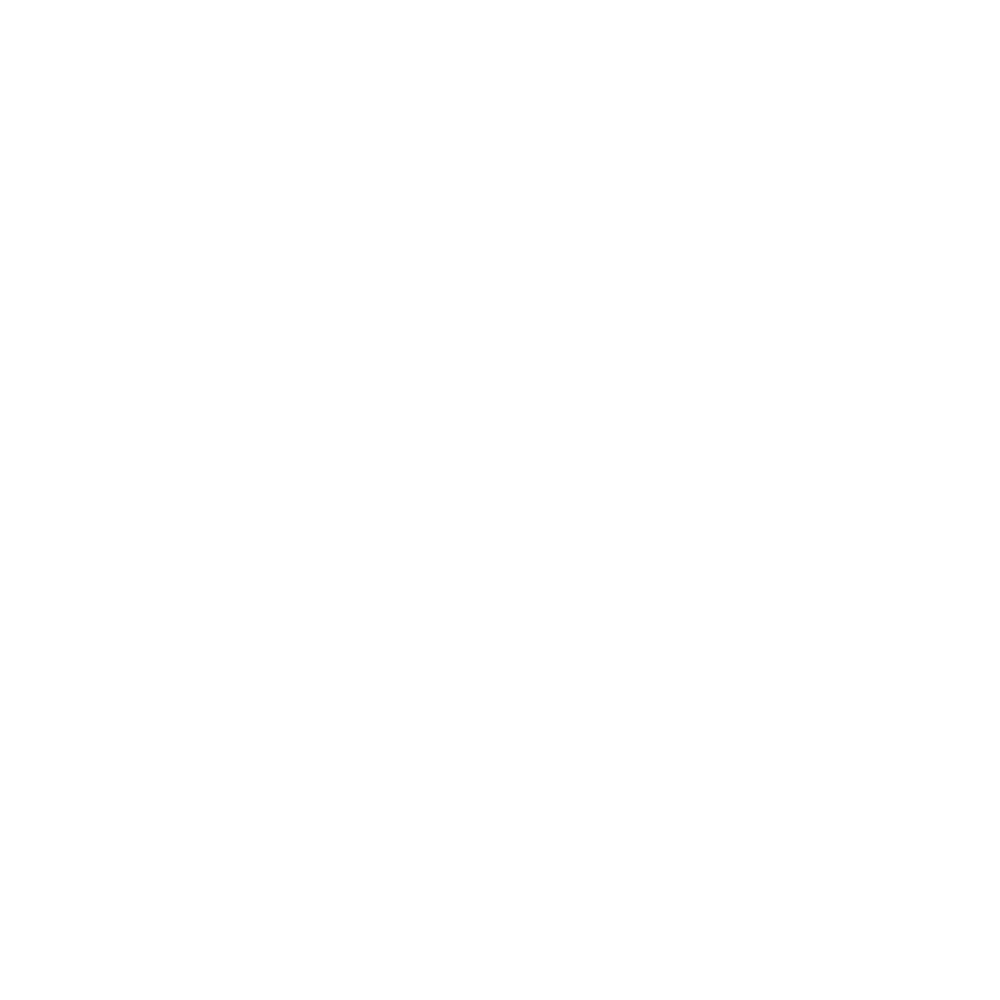

<IPython.core.display.Javascript object>


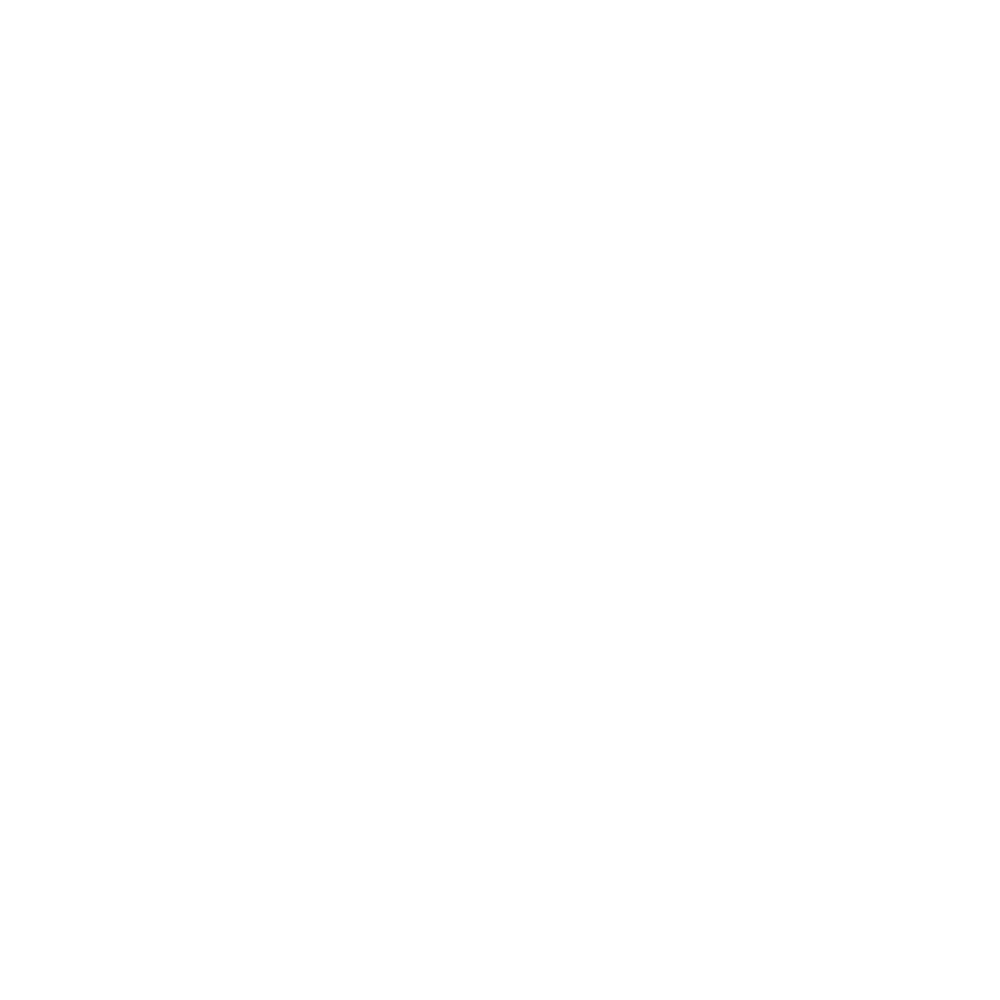

<IPython.core.display.Javascript object>


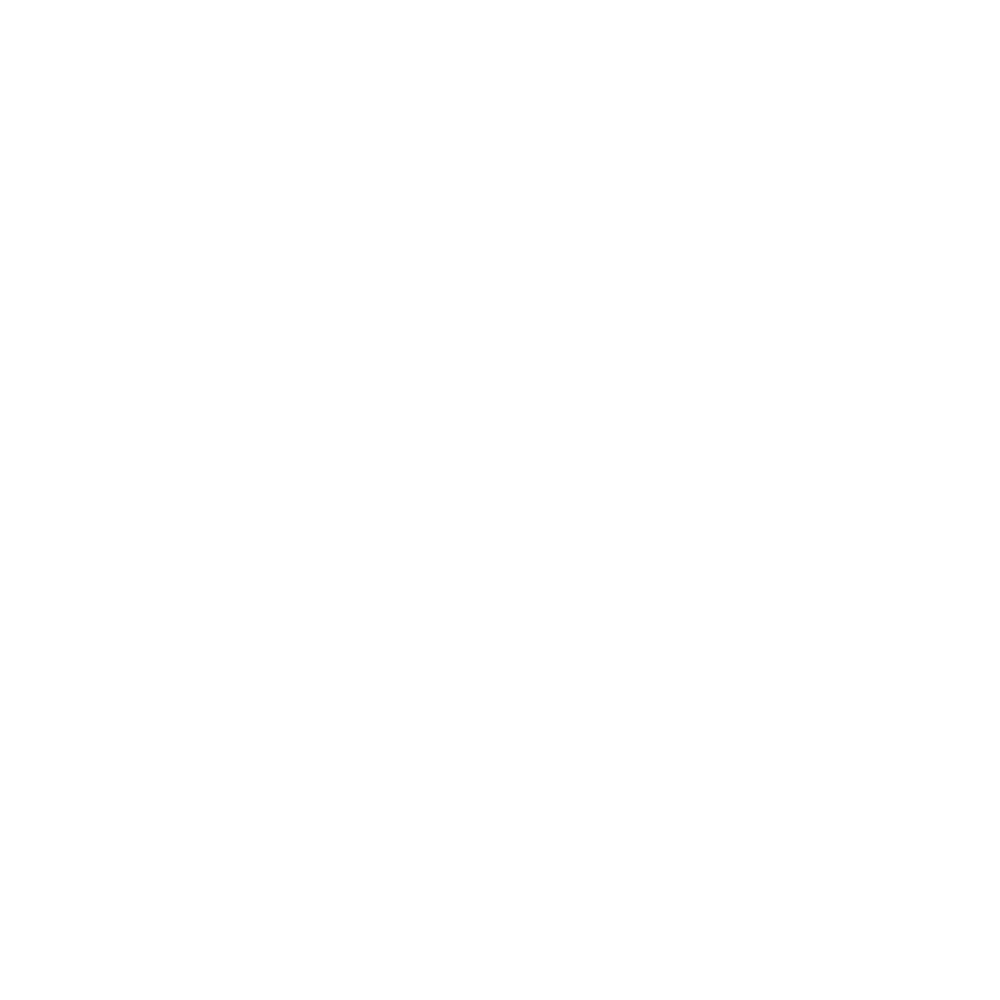

<IPython.core.display.Javascript object>


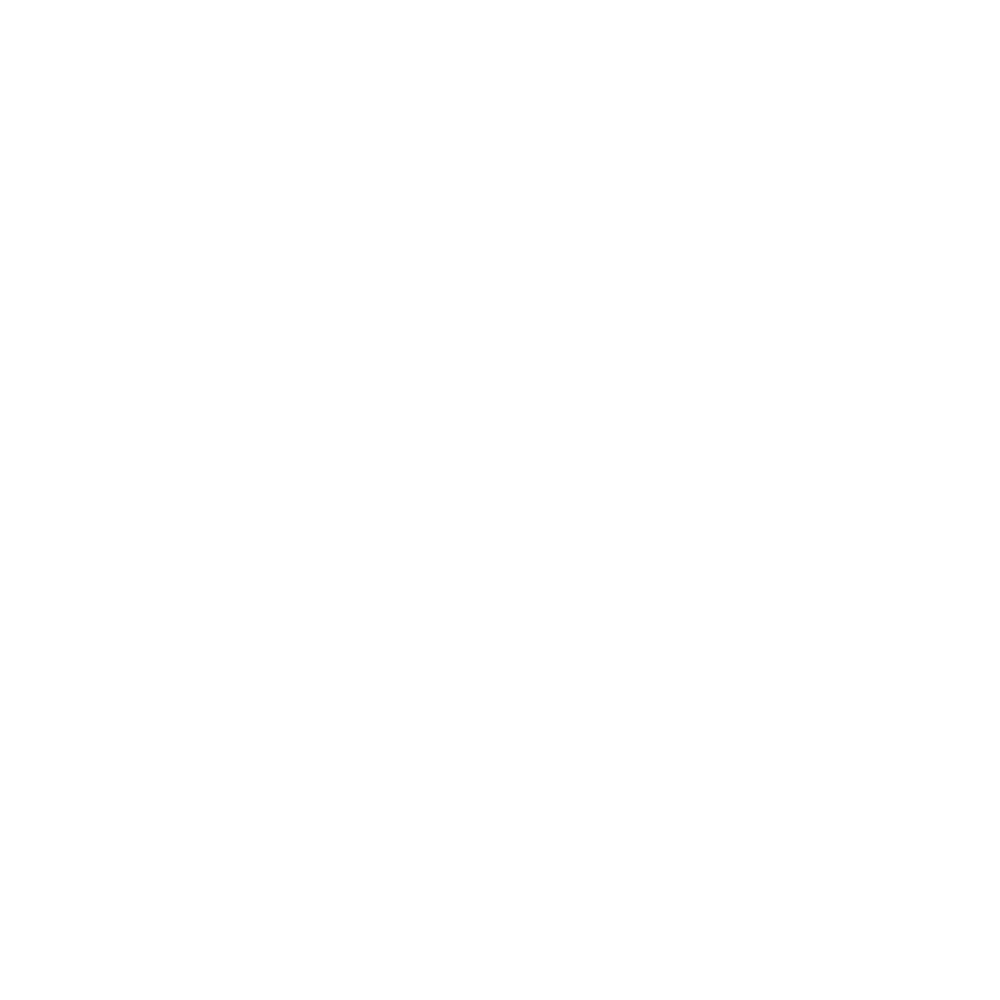

<IPython.core.display.Javascript object>


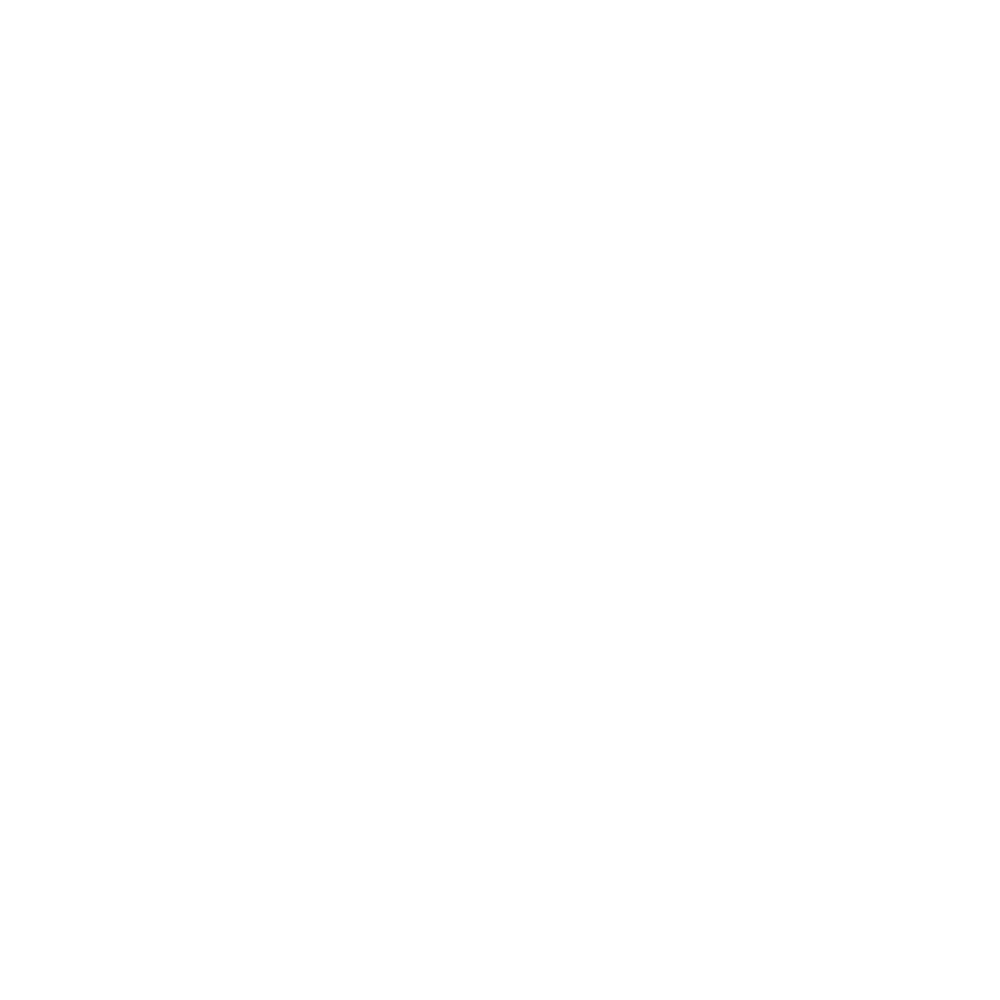

<IPython.core.display.Javascript object>


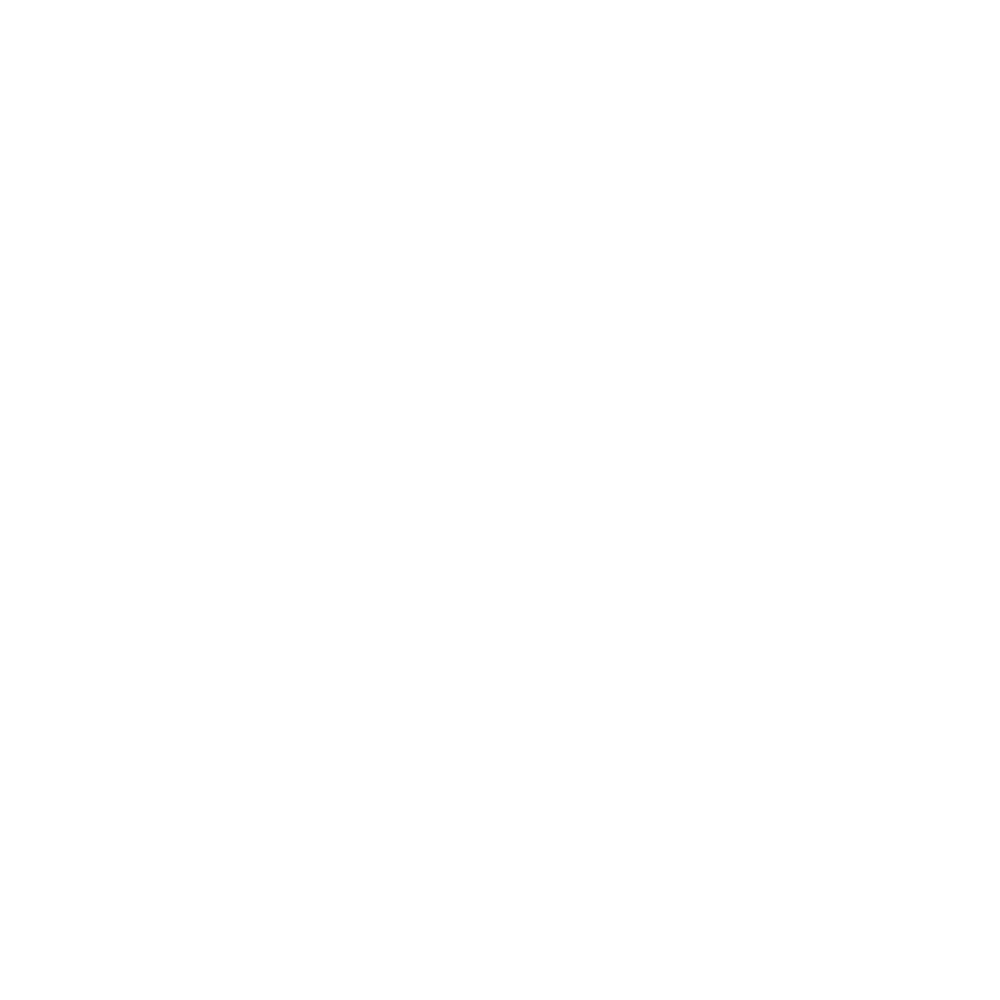

<IPython.core.display.Javascript object>


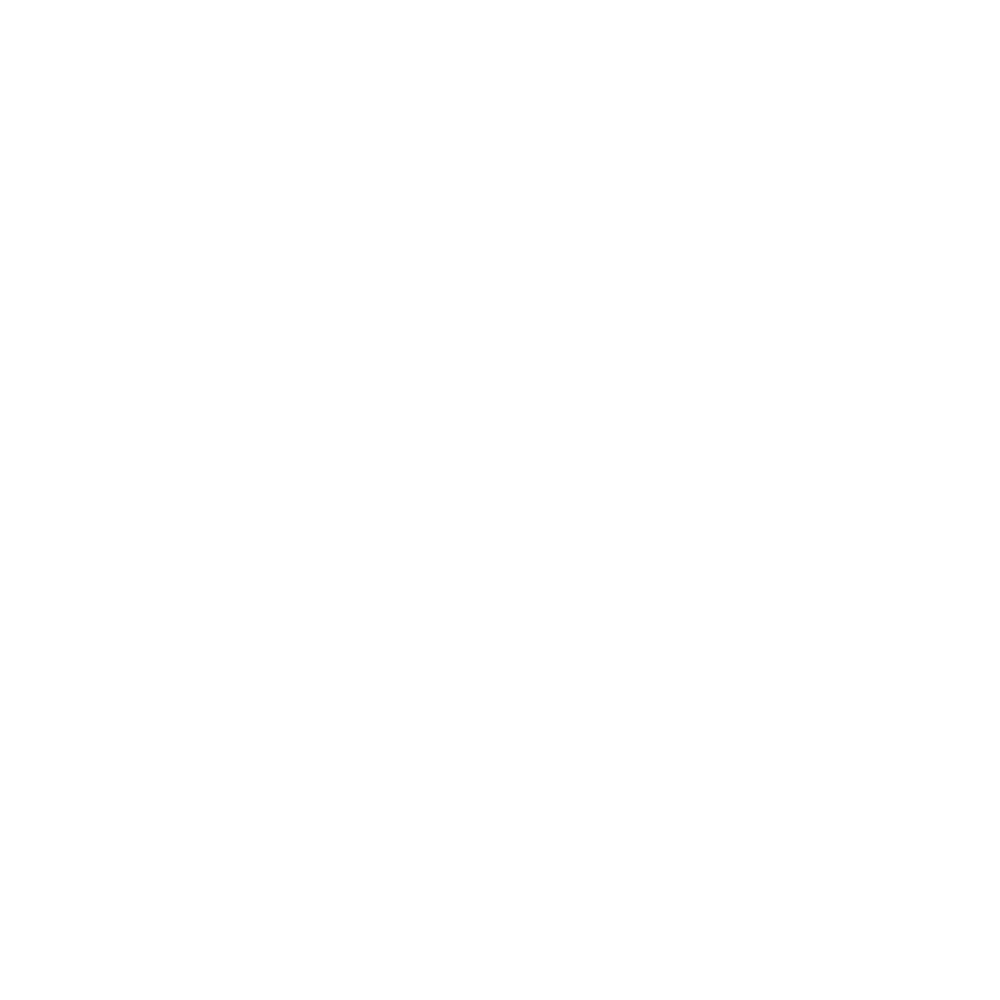

<IPython.core.display.Javascript object>


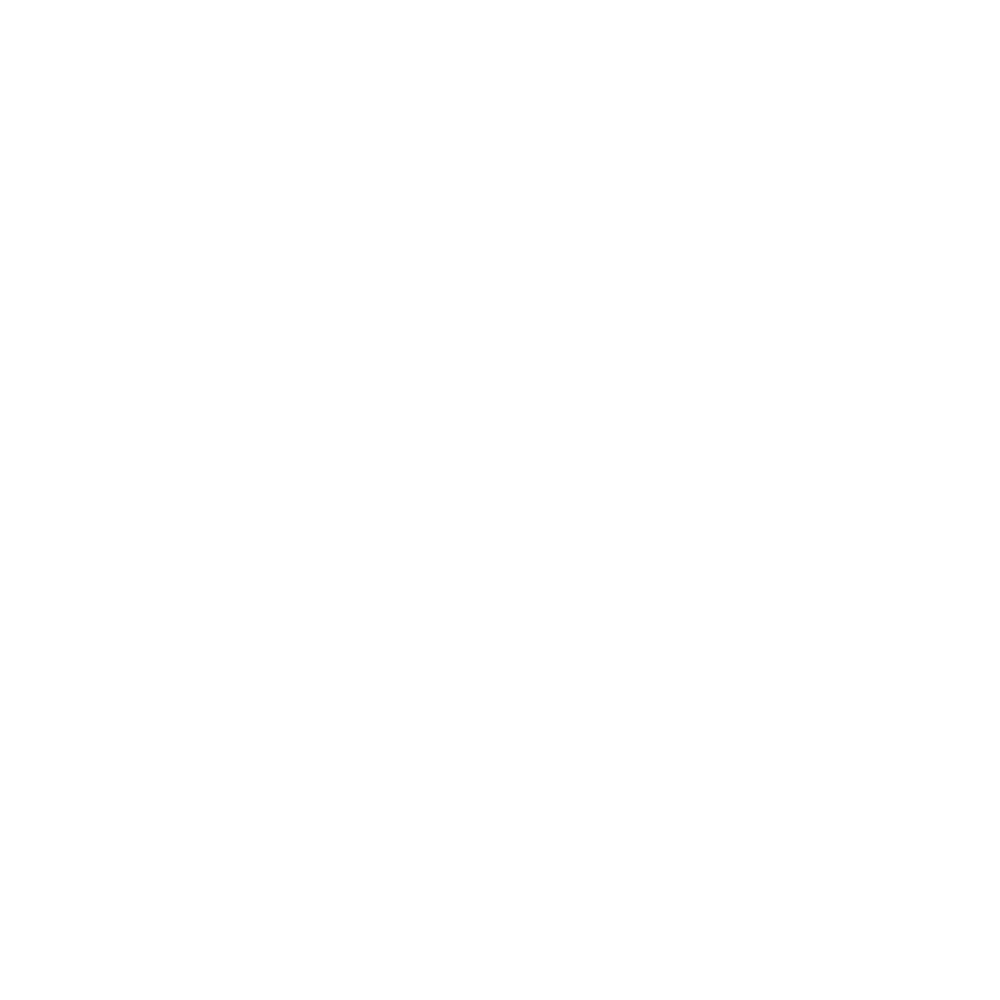

<IPython.core.display.Javascript object>


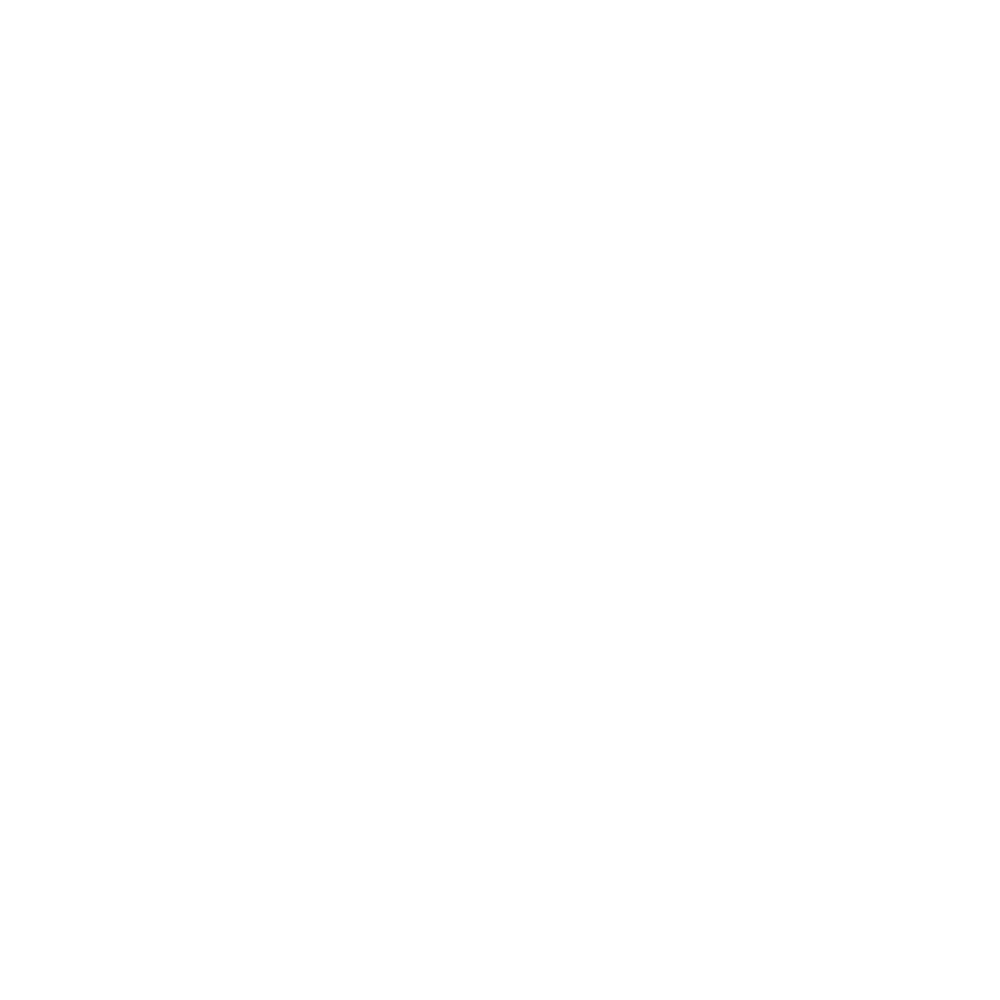

<IPython.core.display.Javascript object>


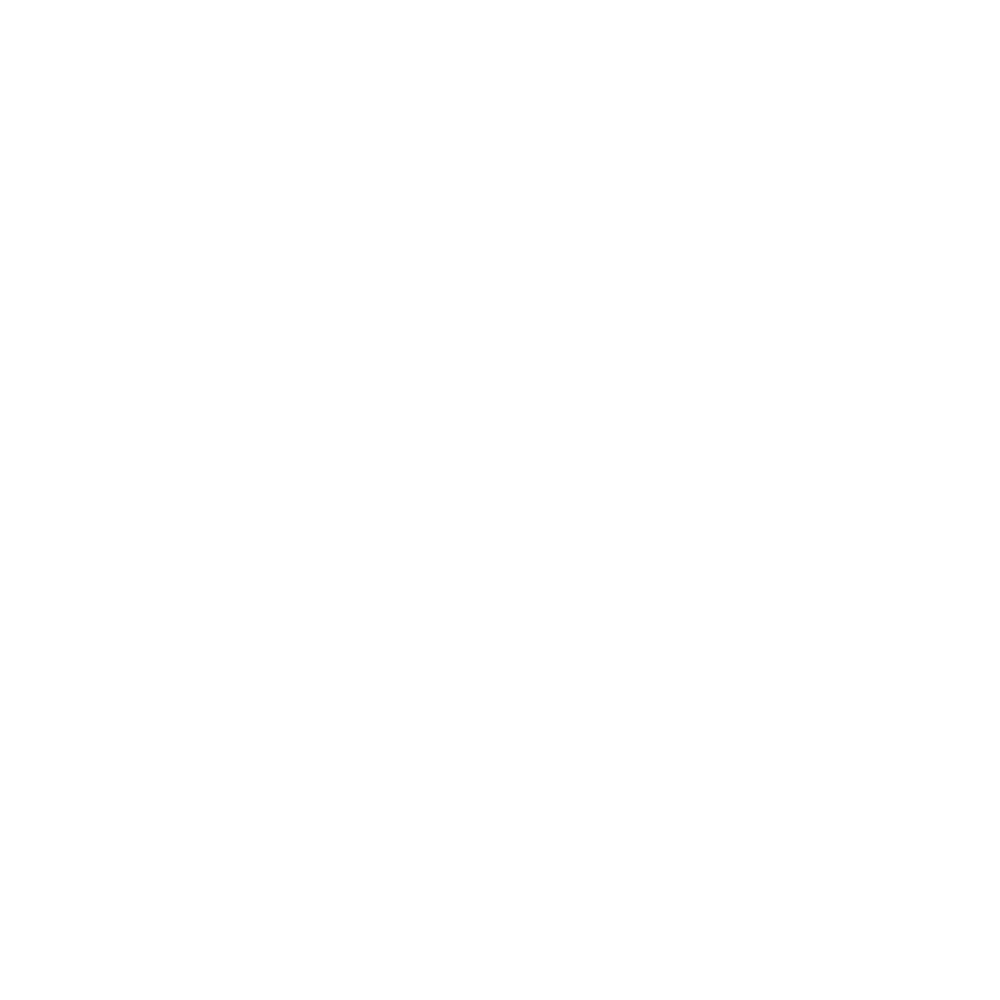

<IPython.core.display.Javascript object>


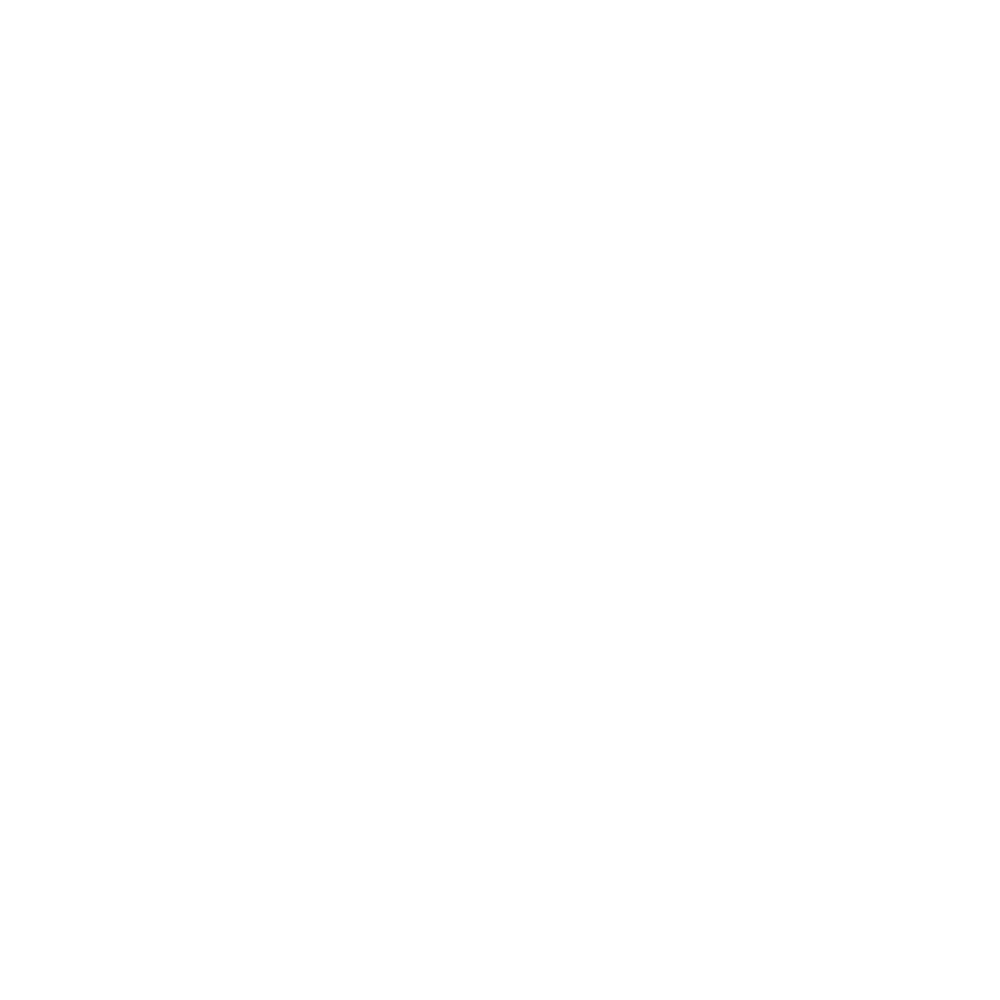

<IPython.core.display.Javascript object>


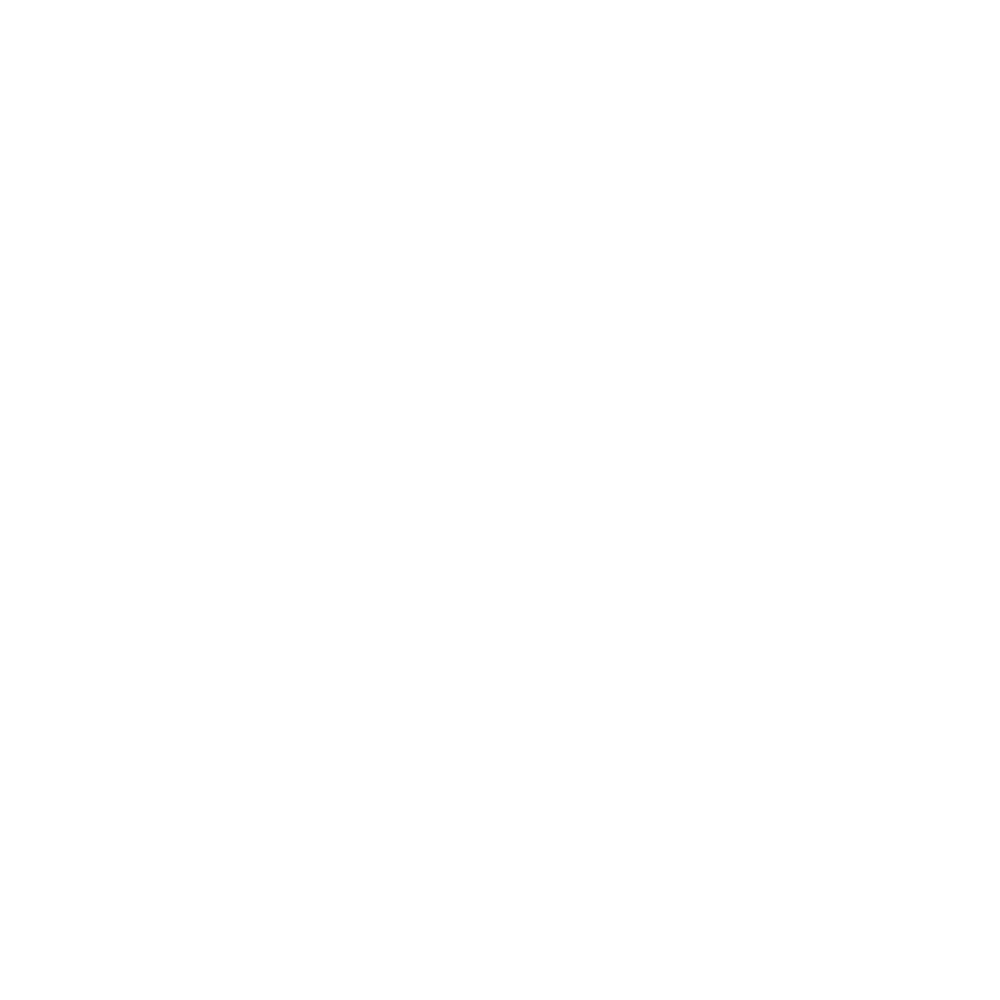

<IPython.core.display.Javascript object>


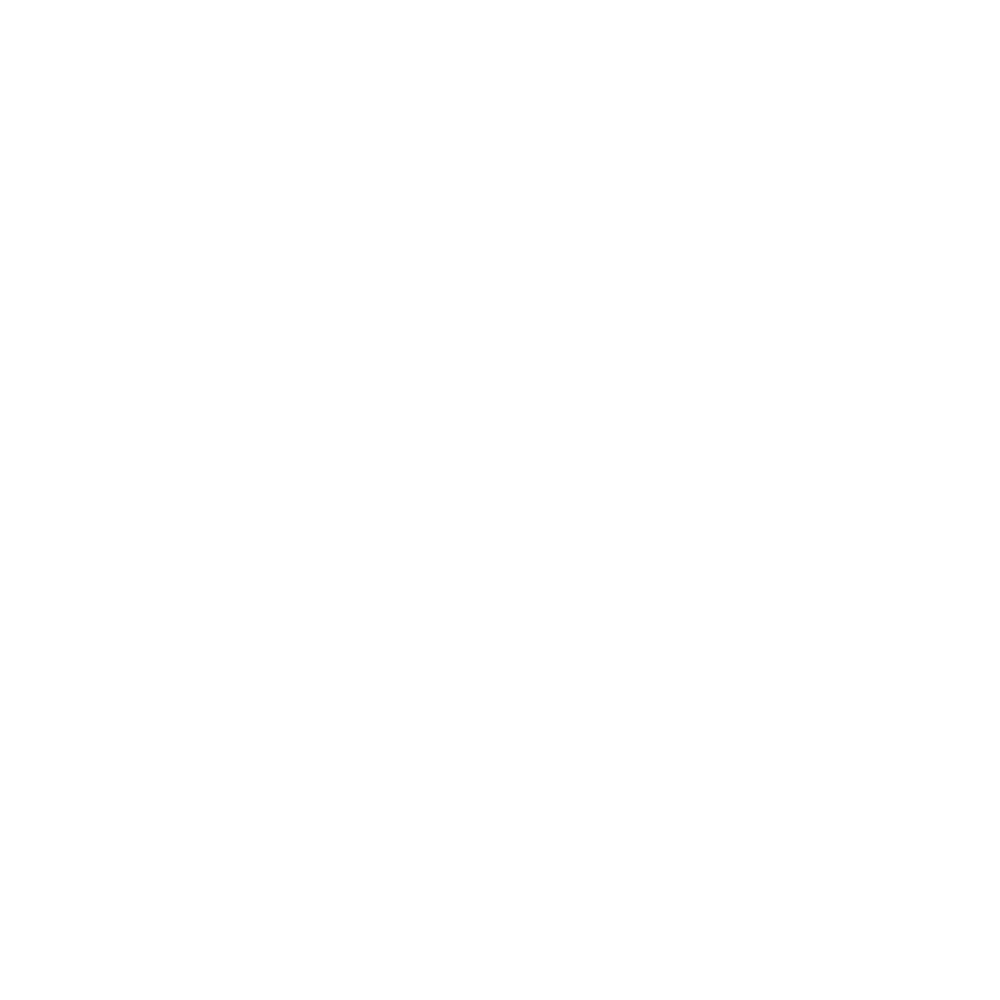

<IPython.core.display.Javascript object>


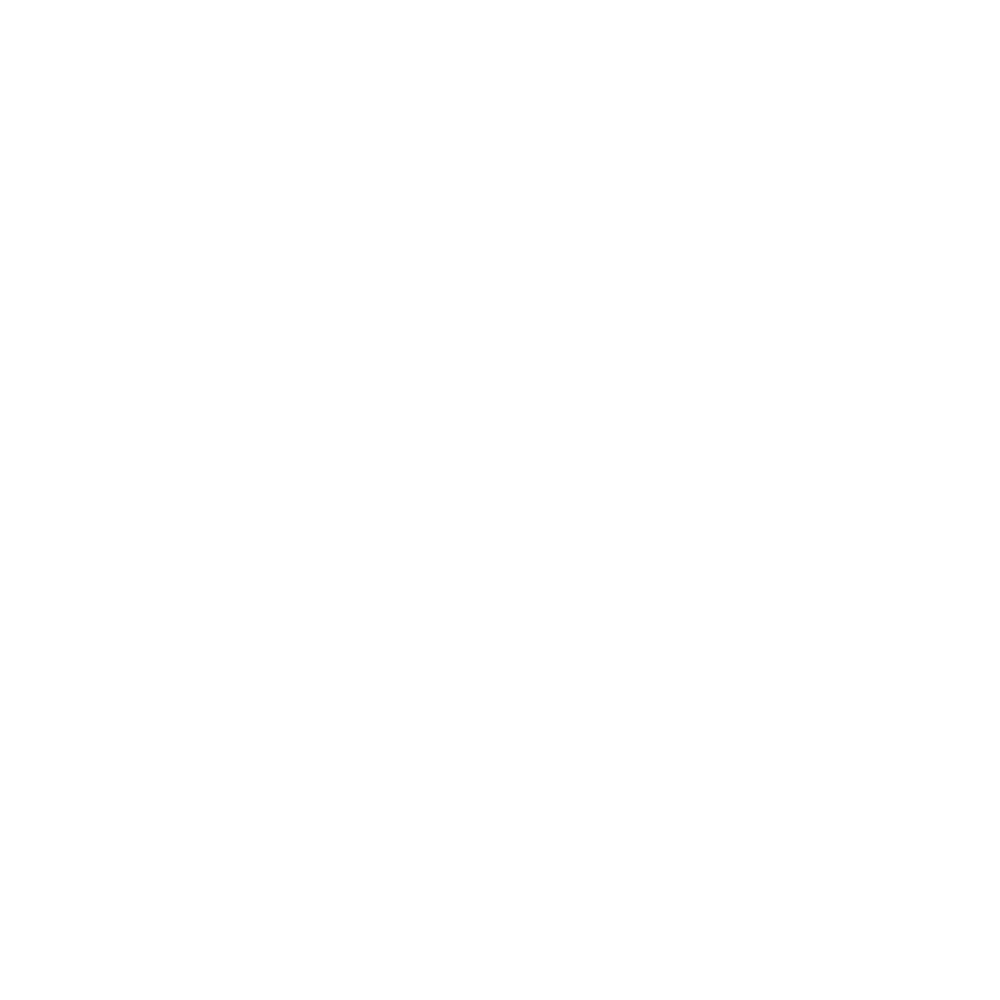

<IPython.core.display.Javascript object>


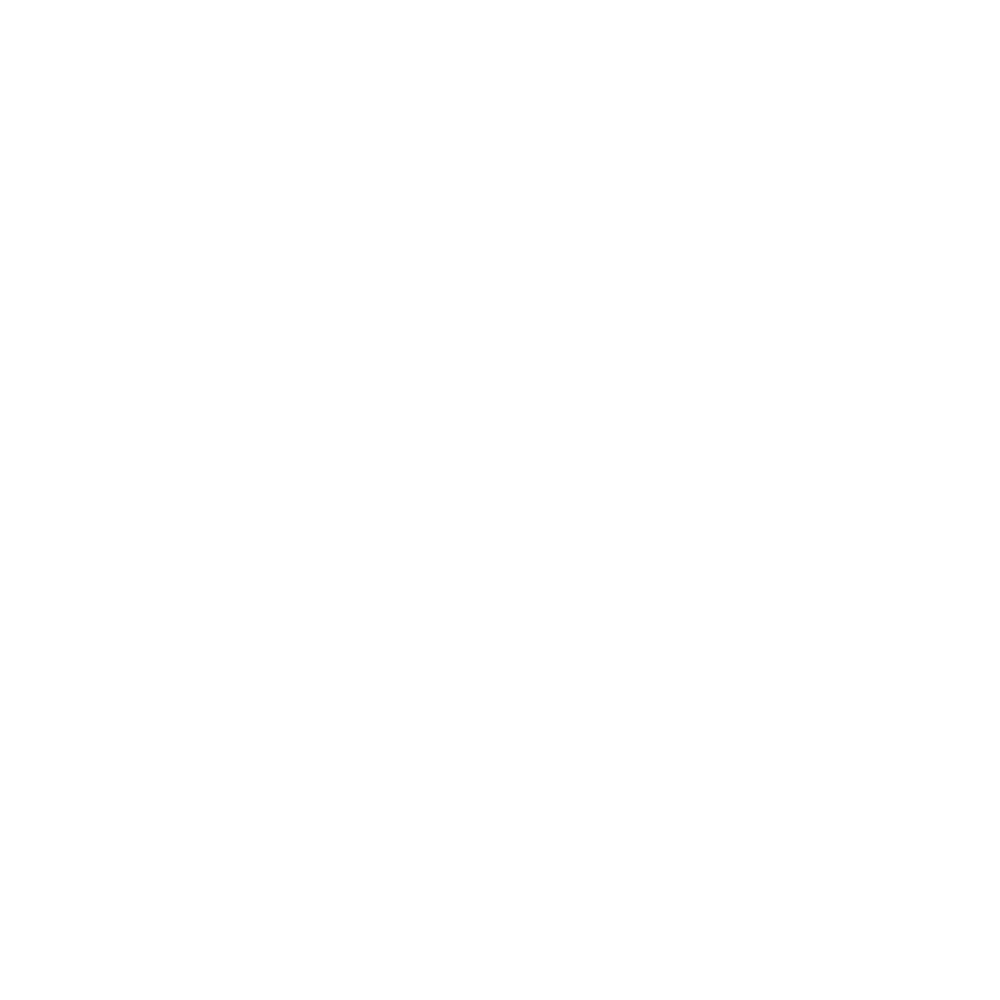

<IPython.core.display.Javascript object>


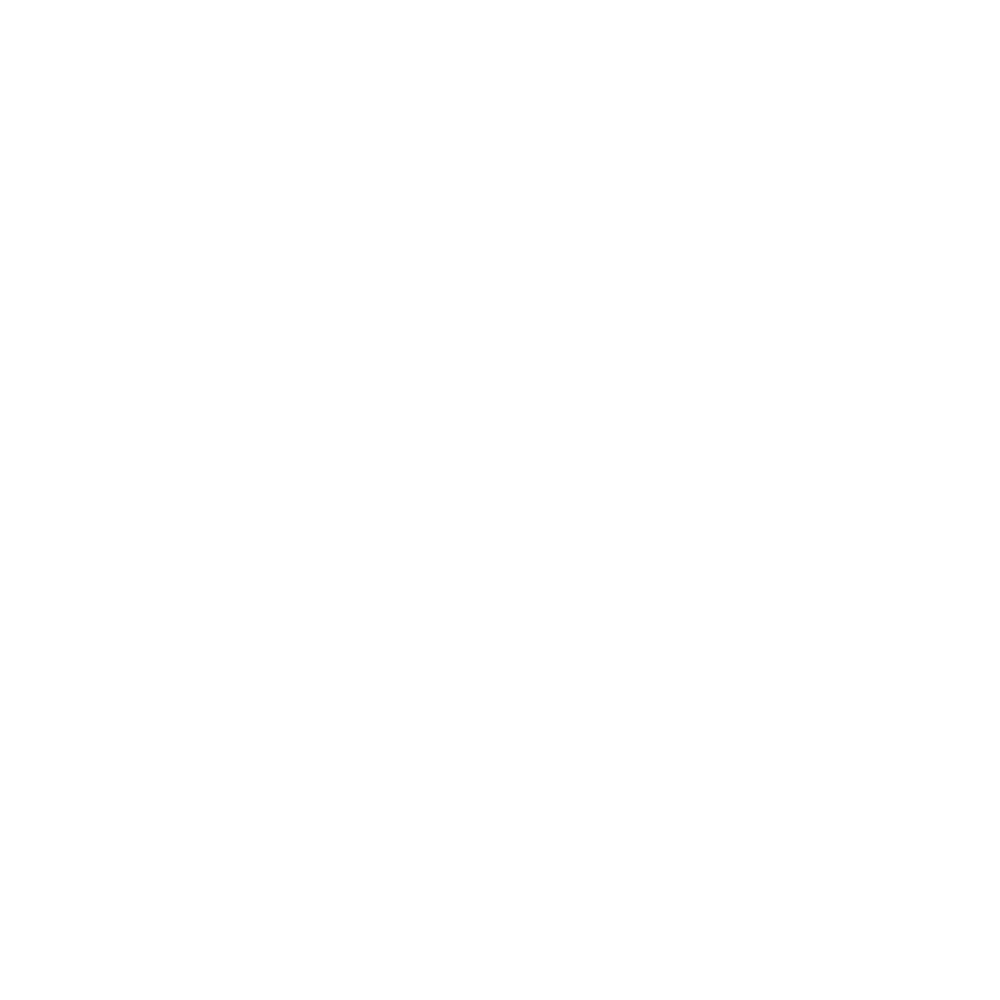

<IPython.core.display.Javascript object>


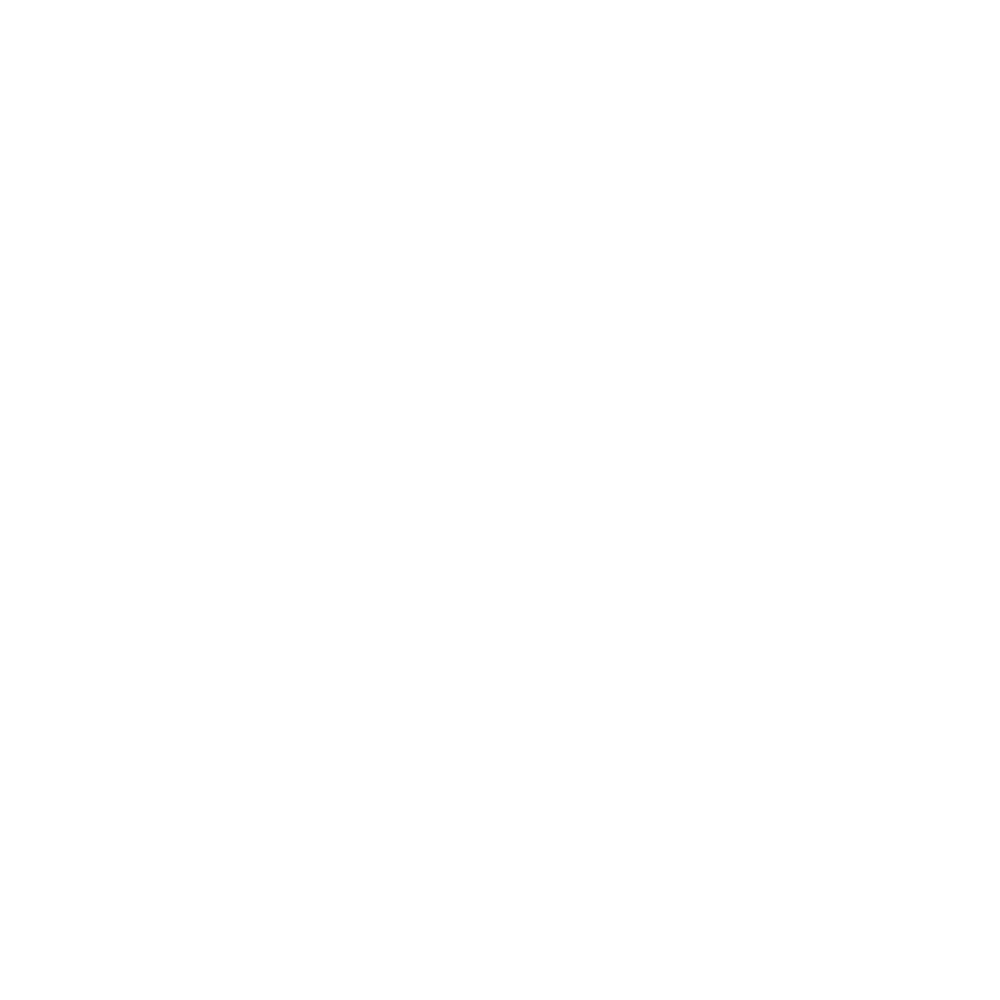

<IPython.core.display.Javascript object>


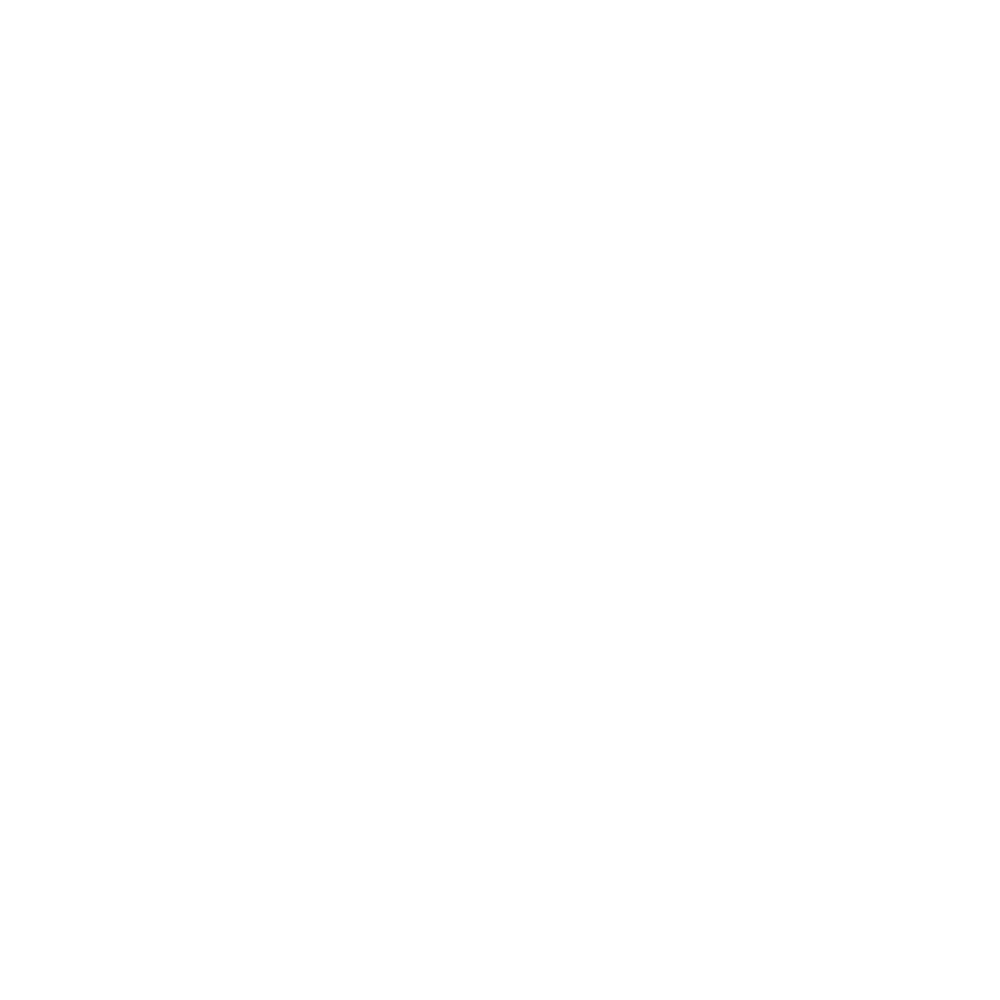

<IPython.core.display.Javascript object>


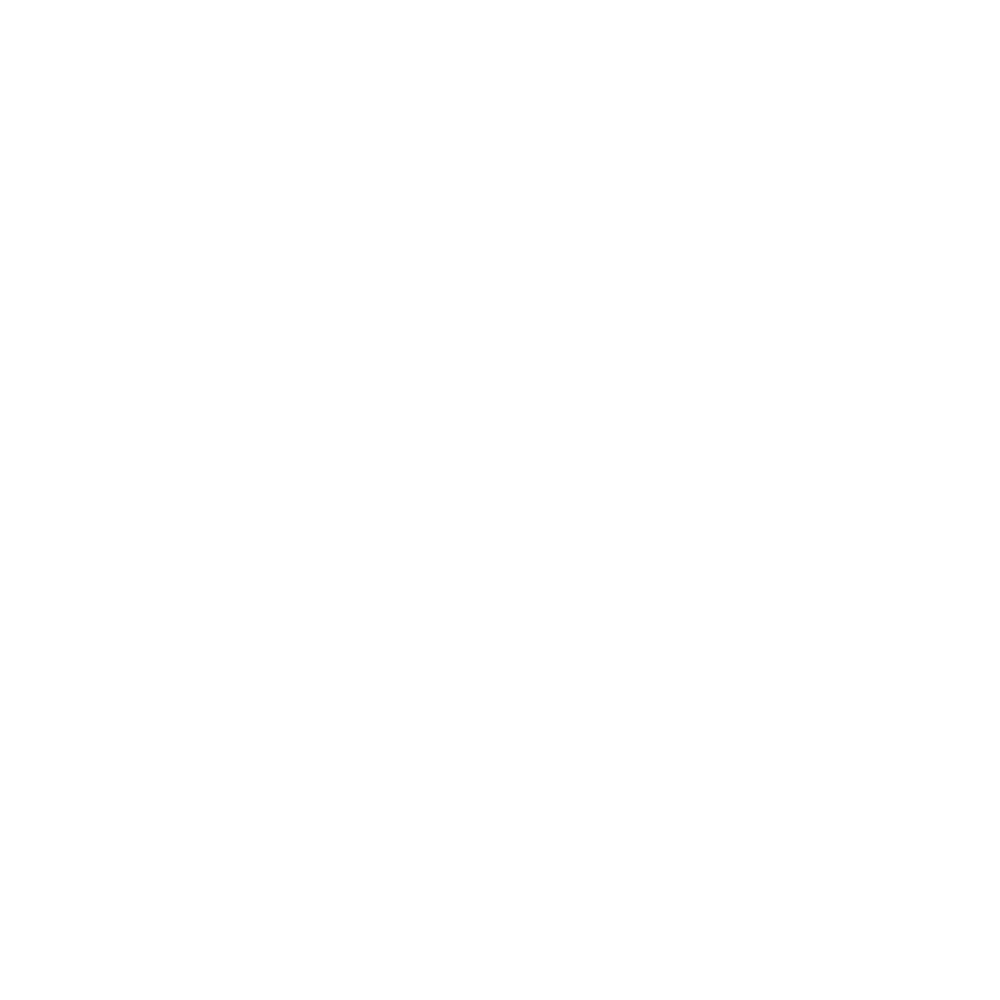

<IPython.core.display.Javascript object>


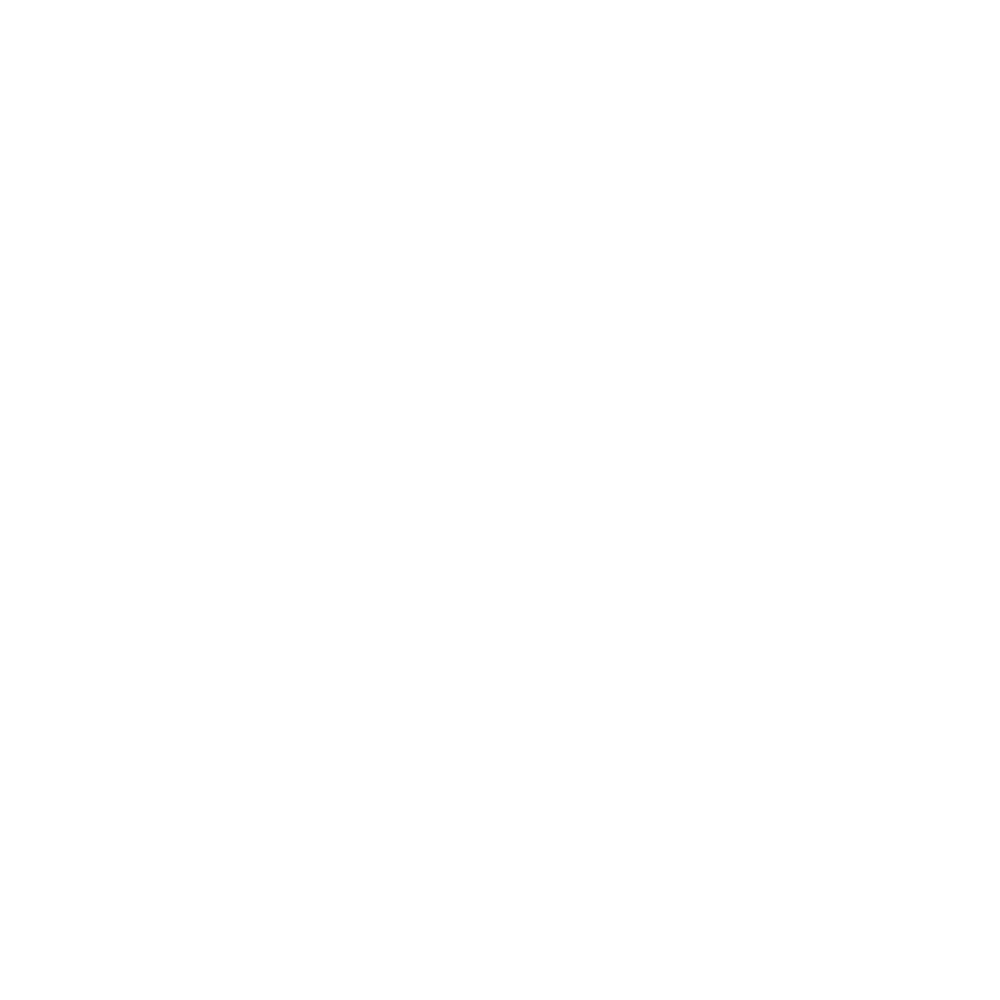

<IPython.core.display.Javascript object>


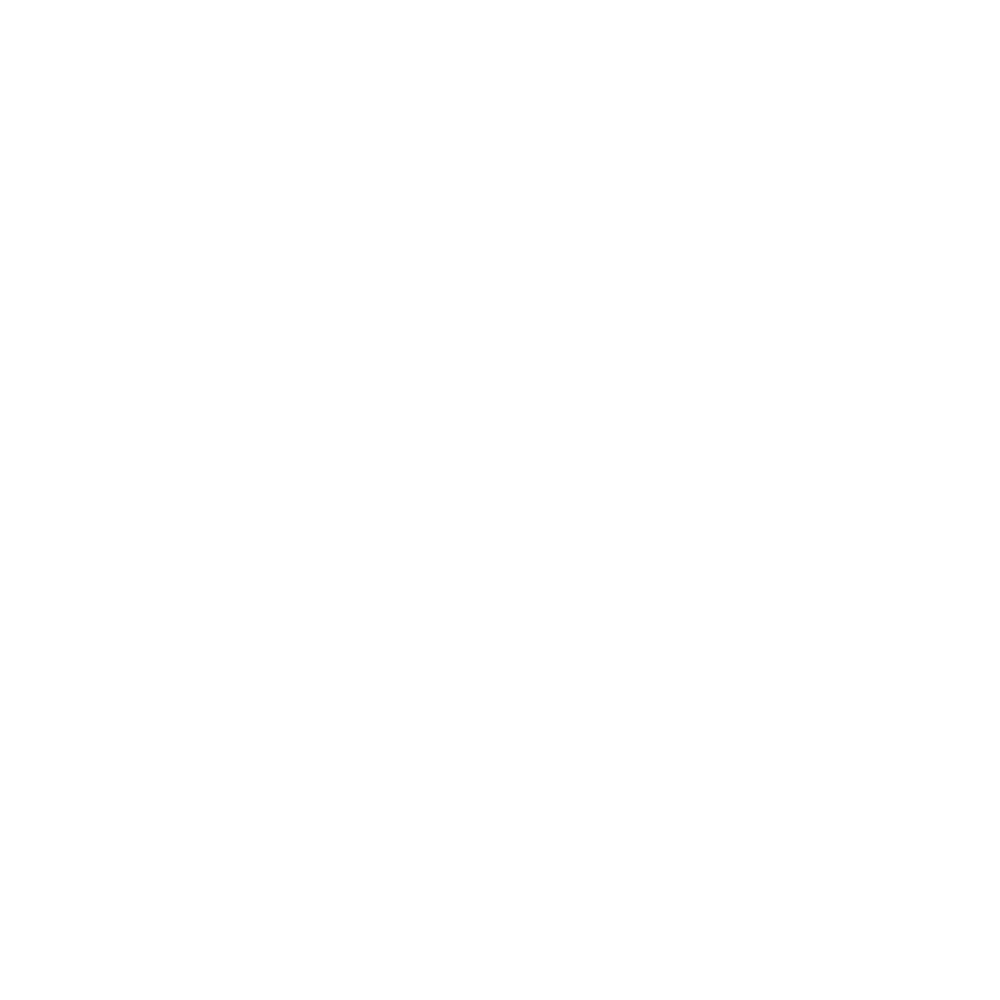

<IPython.core.display.Javascript object>


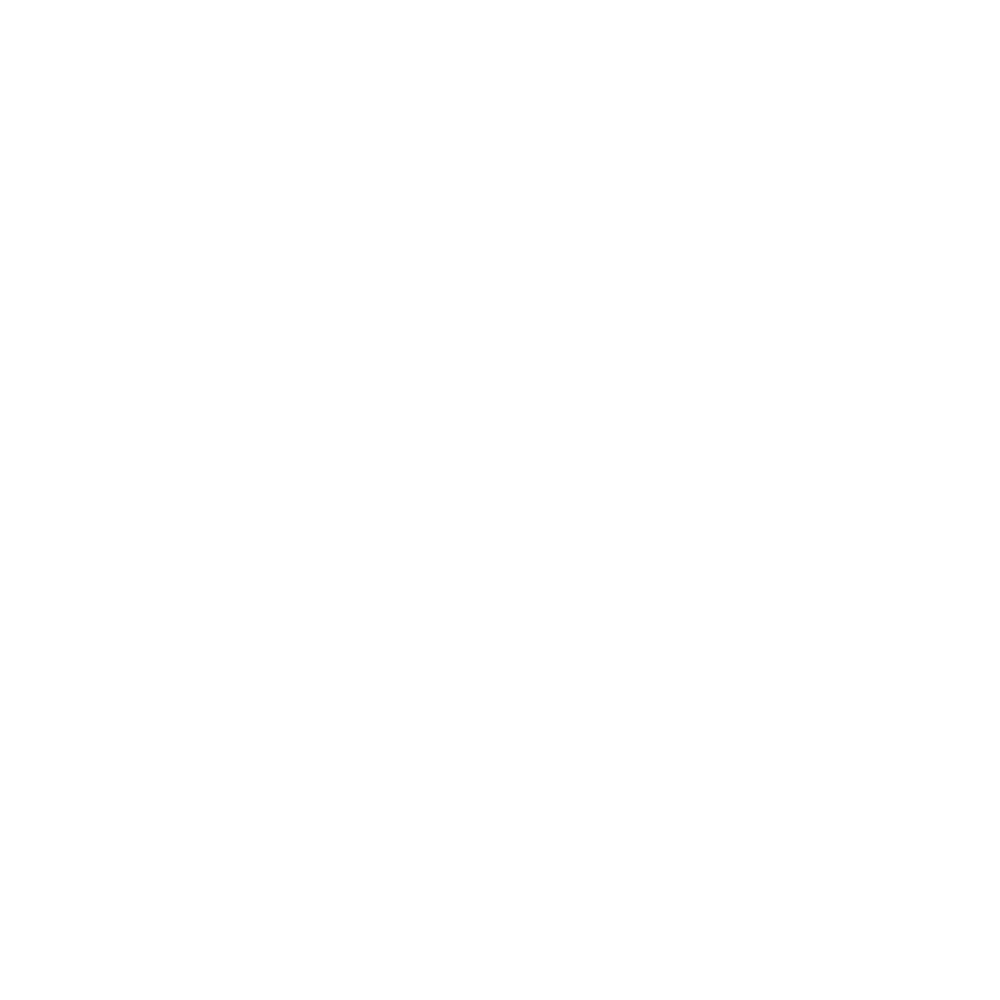

<IPython.core.display.Javascript object>


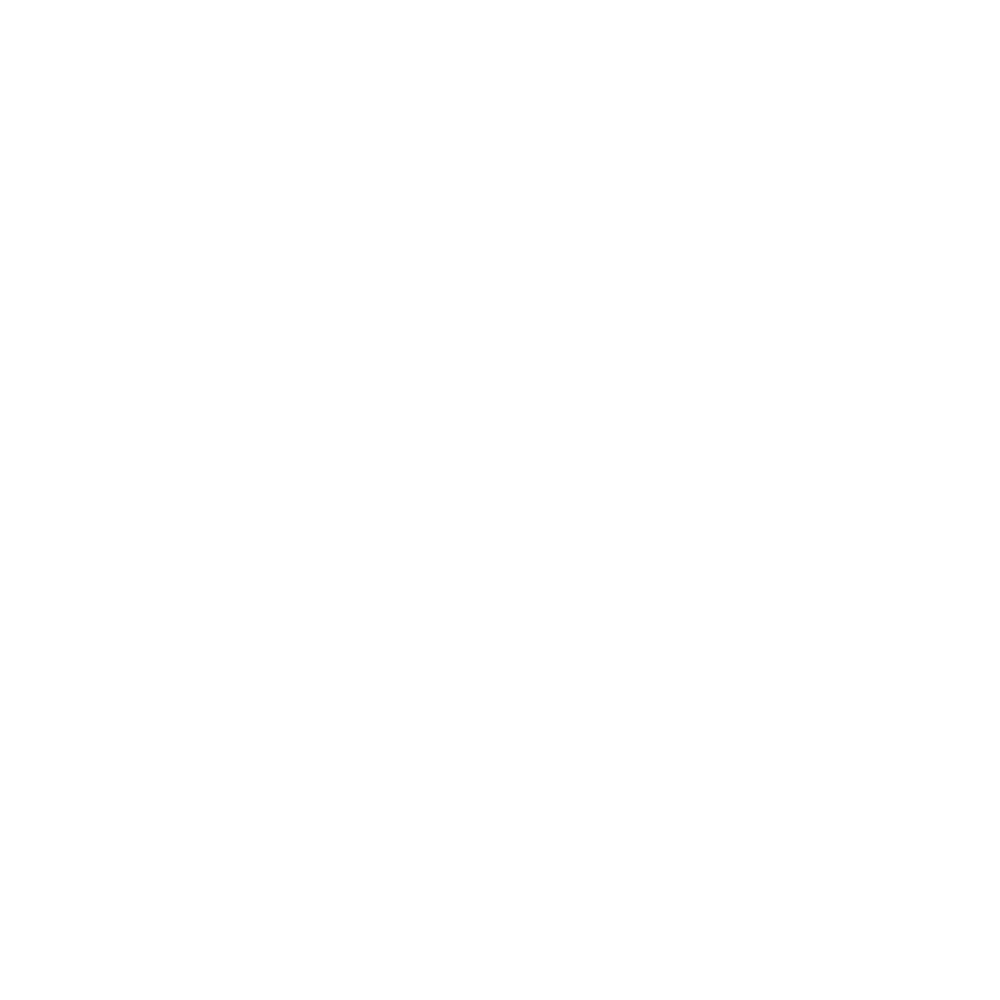

<IPython.core.display.Javascript object>


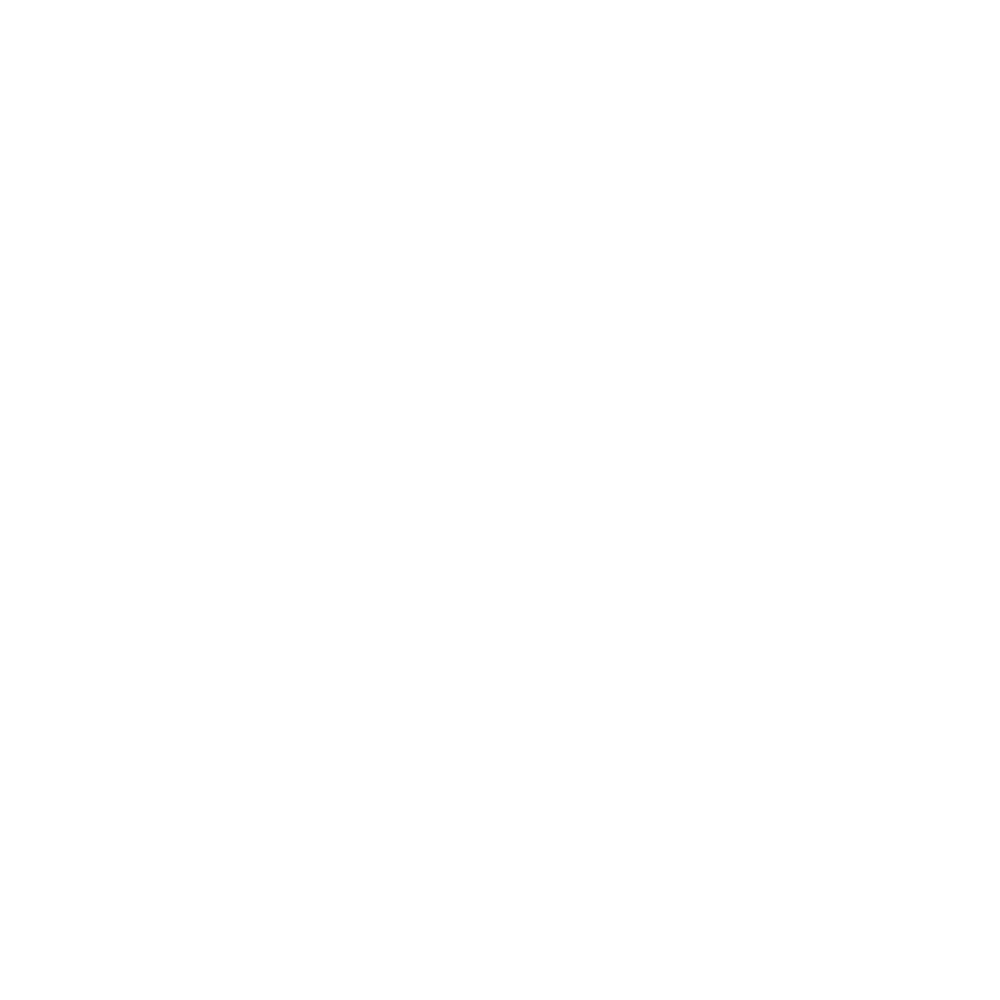

<IPython.core.display.Javascript object>


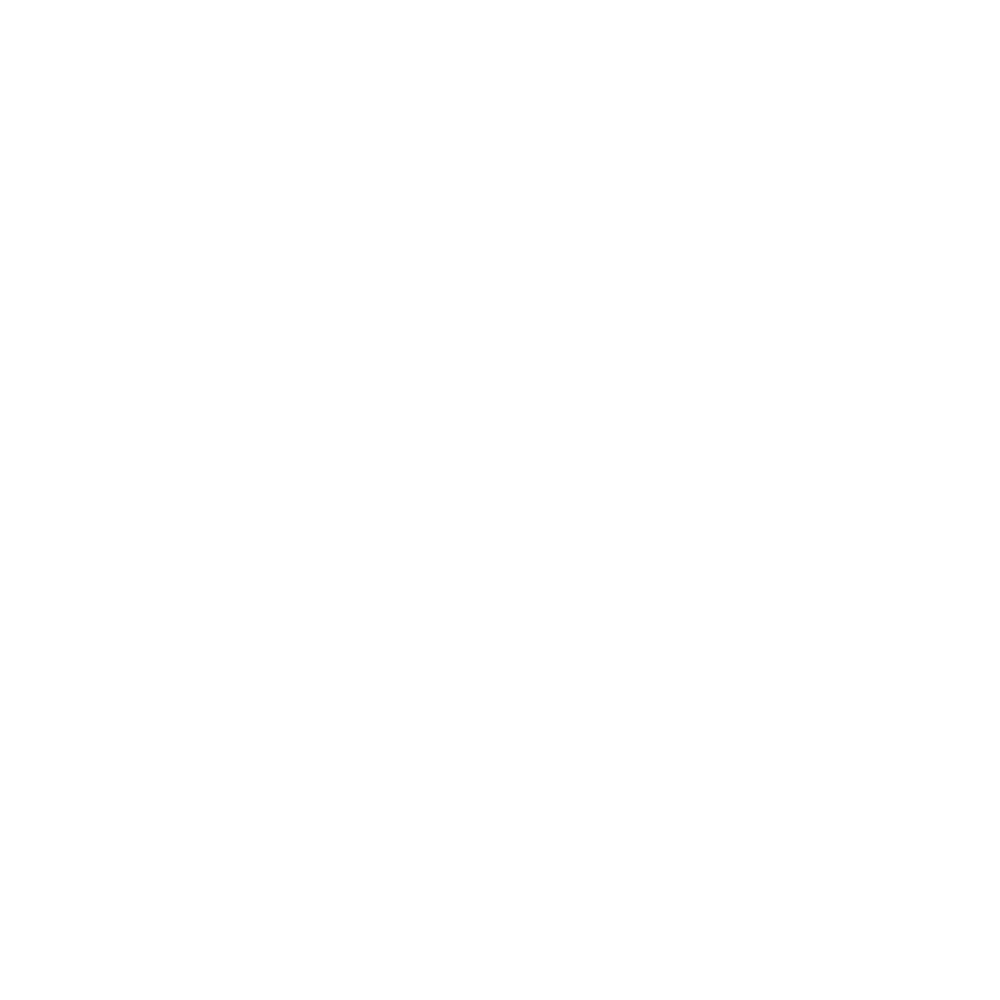

<IPython.core.display.Javascript object>


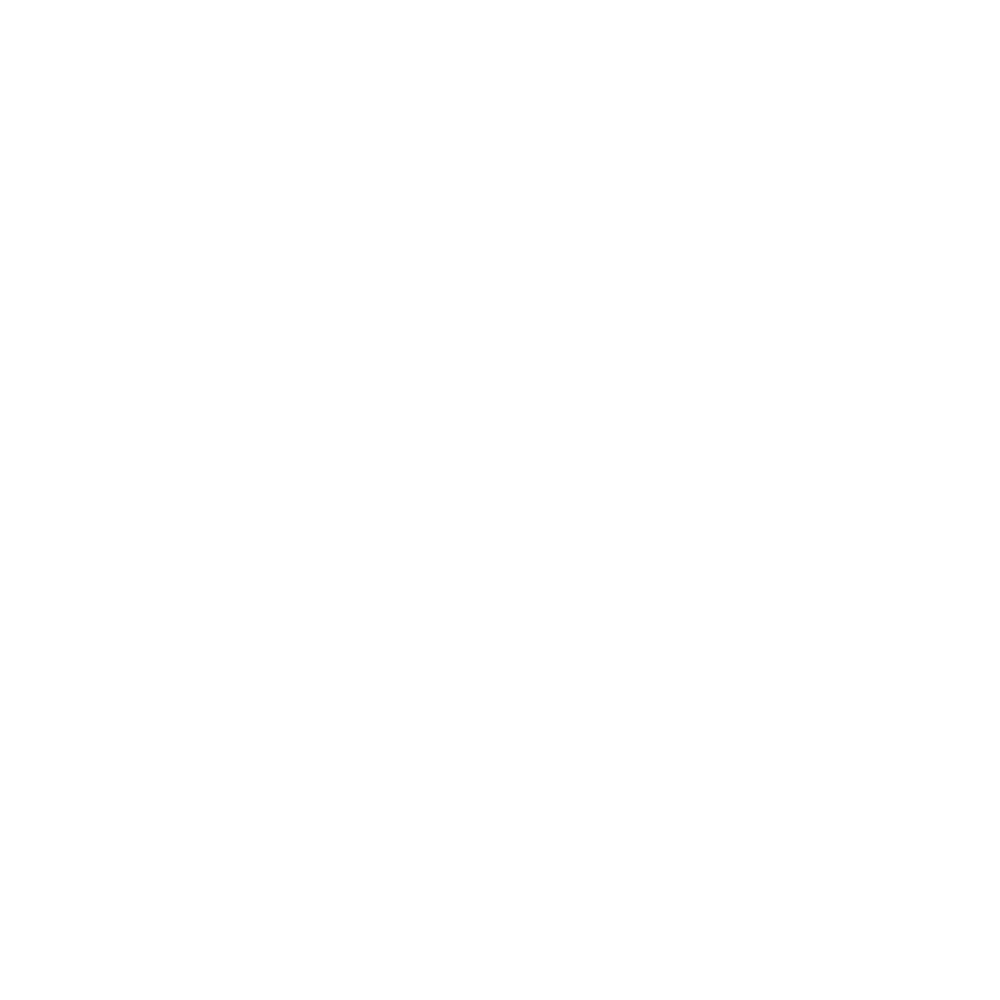

<IPython.core.display.Javascript object>


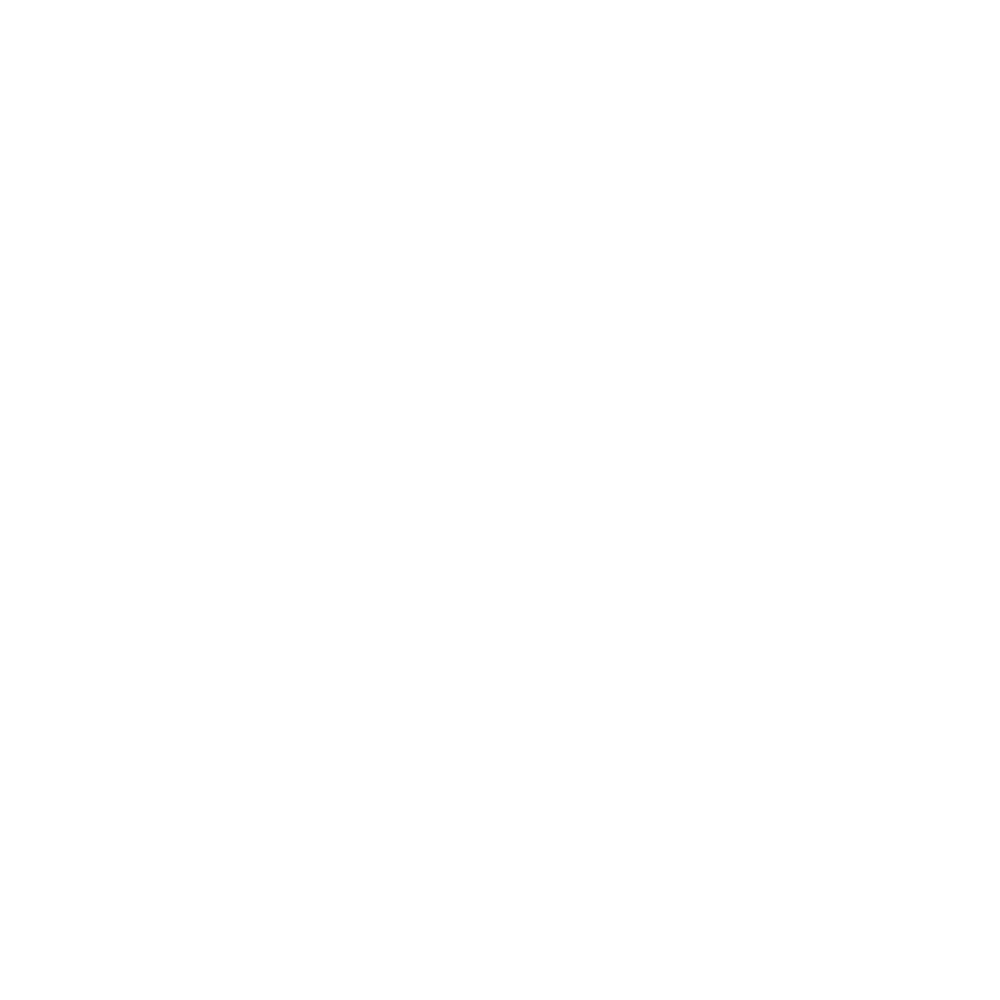

<IPython.core.display.Javascript object>


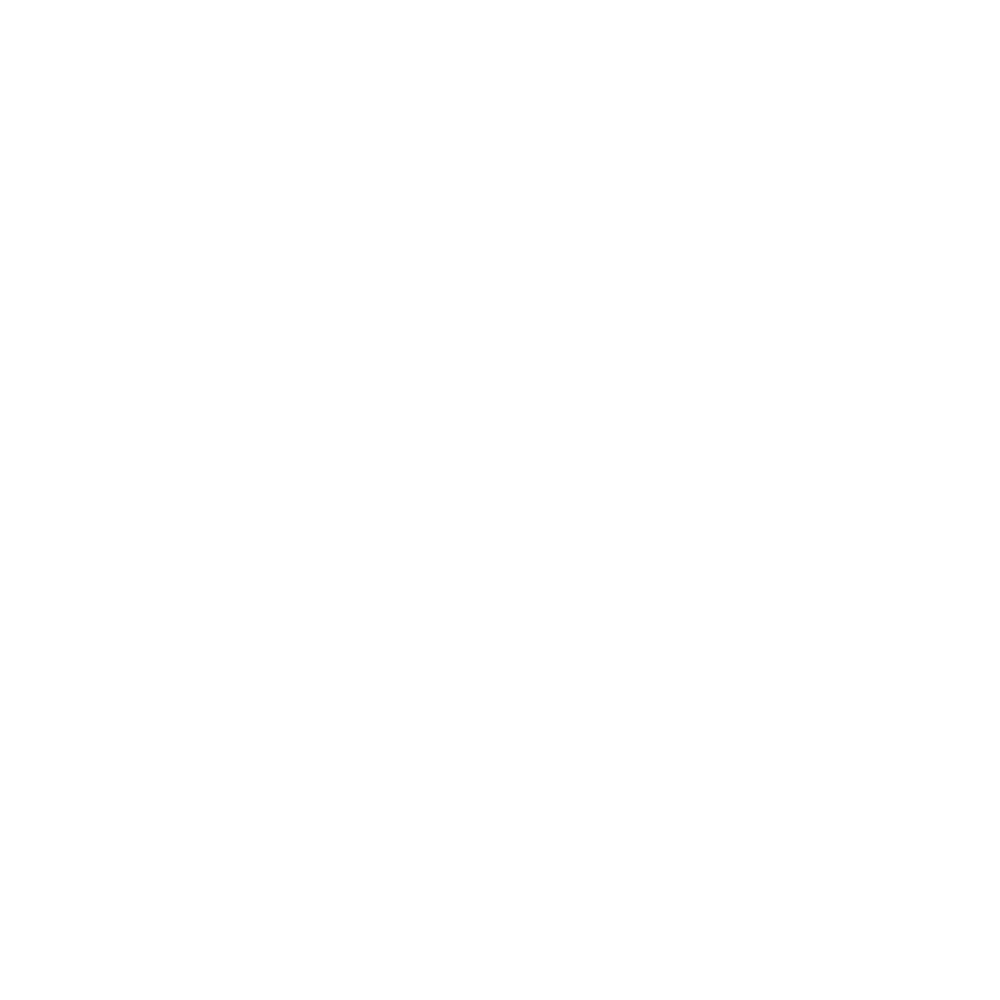

<IPython.core.display.Javascript object>


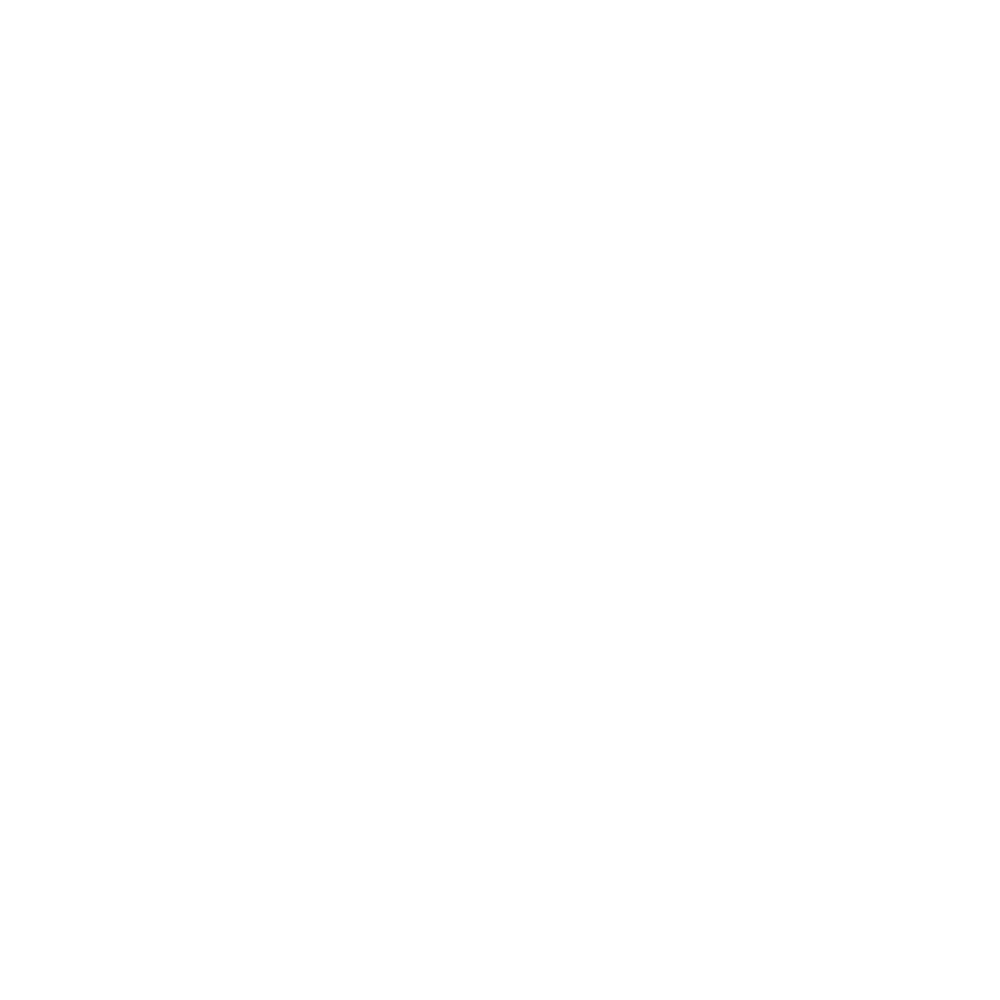

<IPython.core.display.Javascript object>


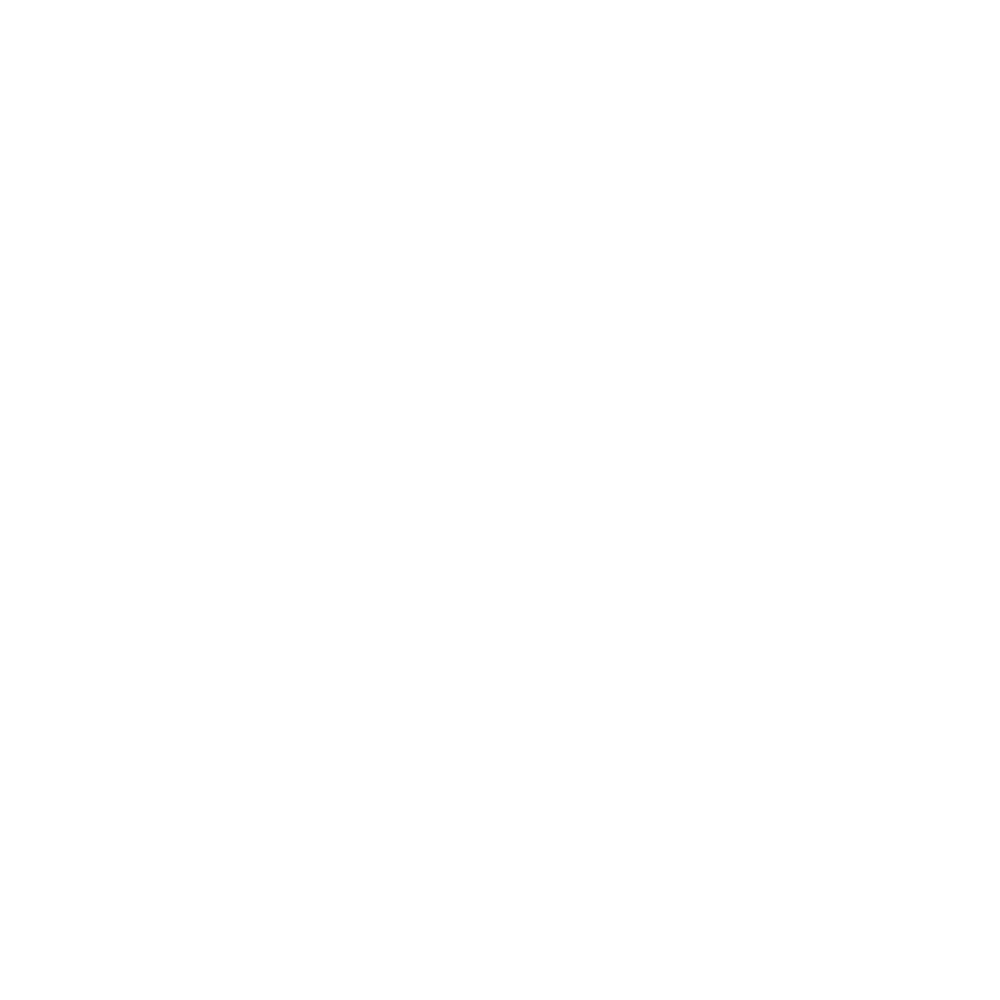

<IPython.core.display.Javascript object>


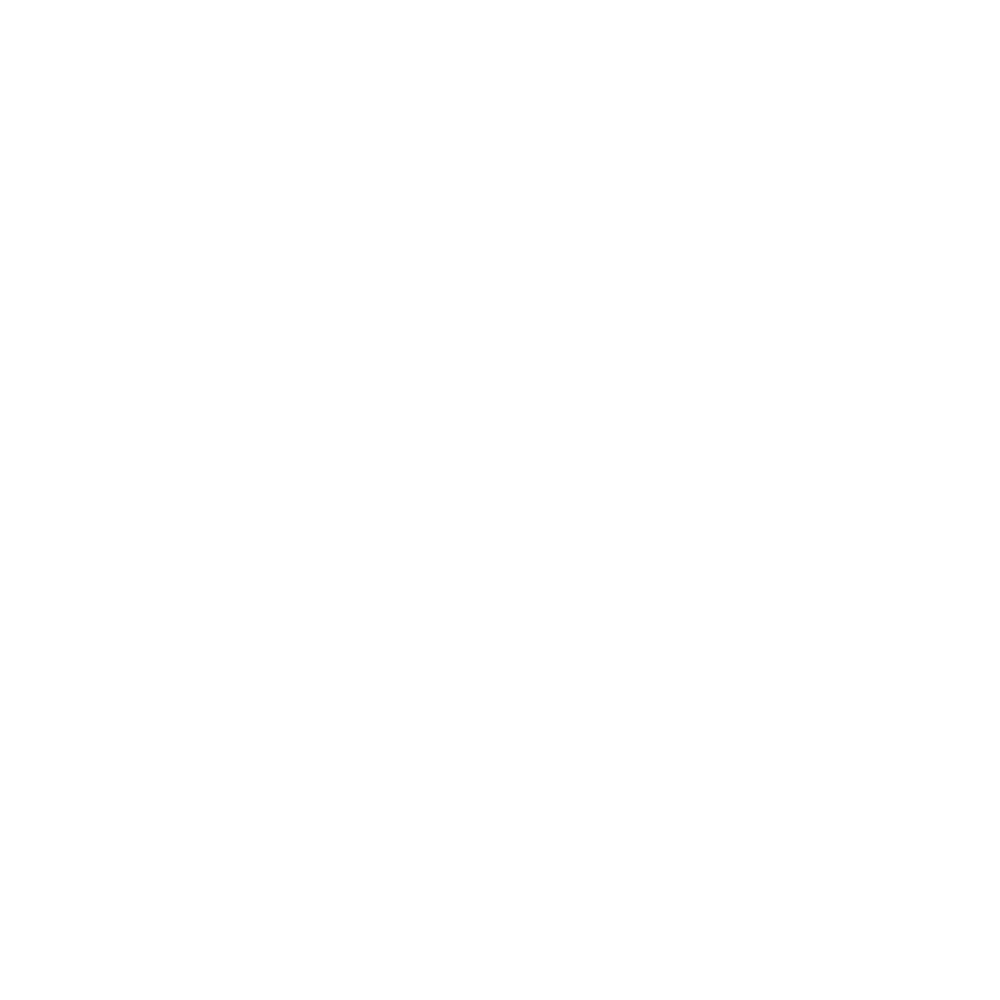

<IPython.core.display.Javascript object>


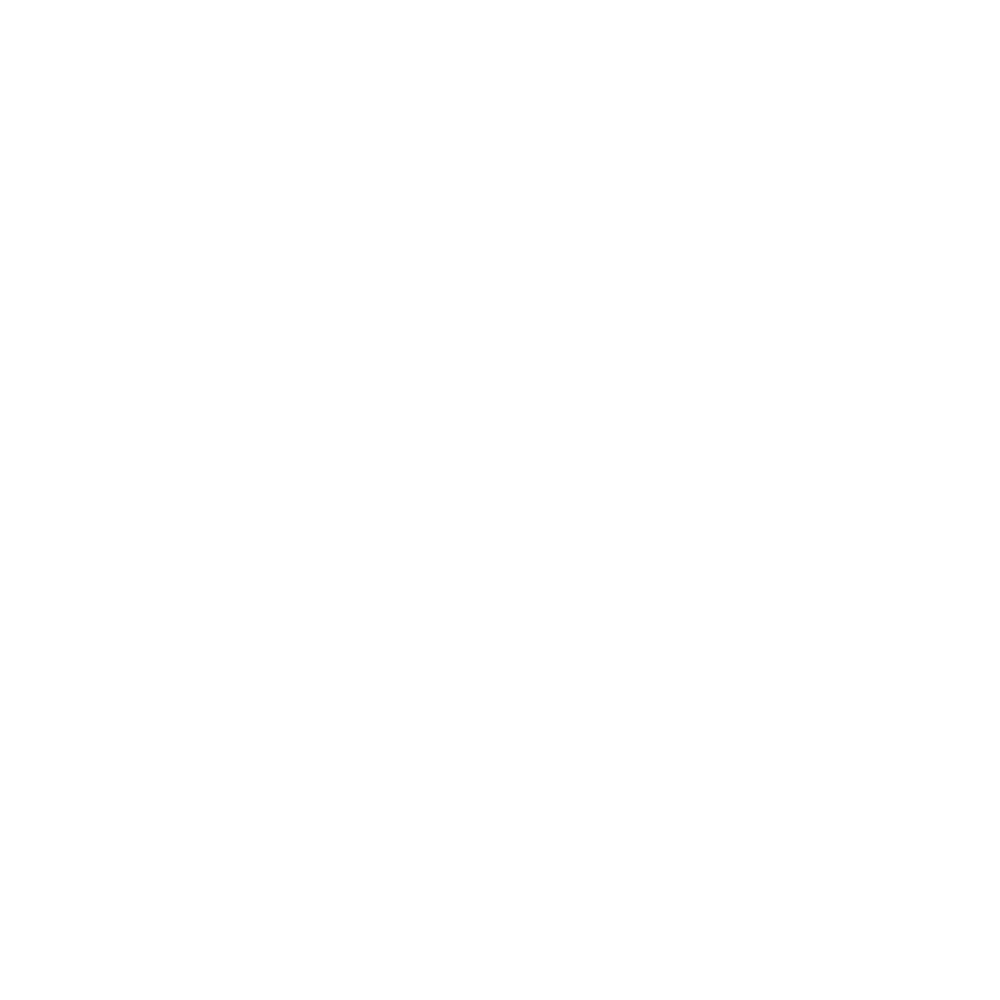

<IPython.core.display.Javascript object>


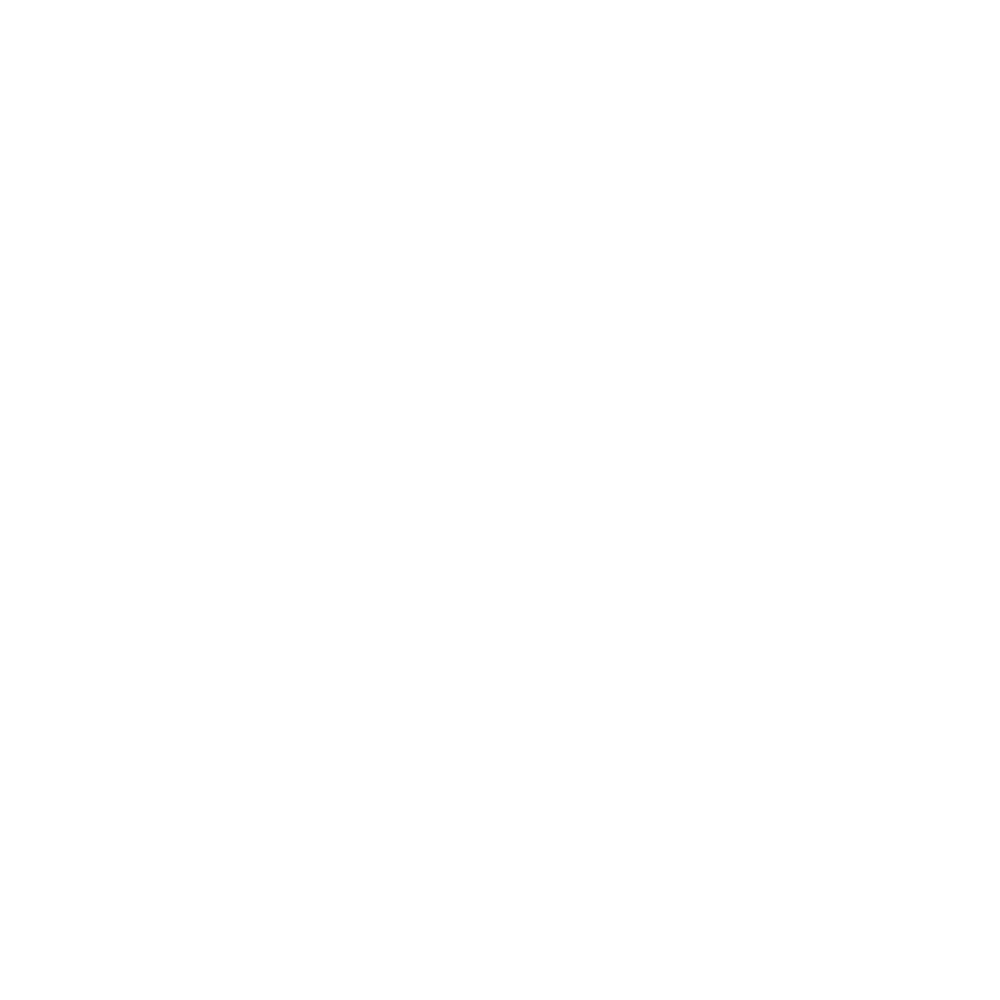

<IPython.core.display.Javascript object>


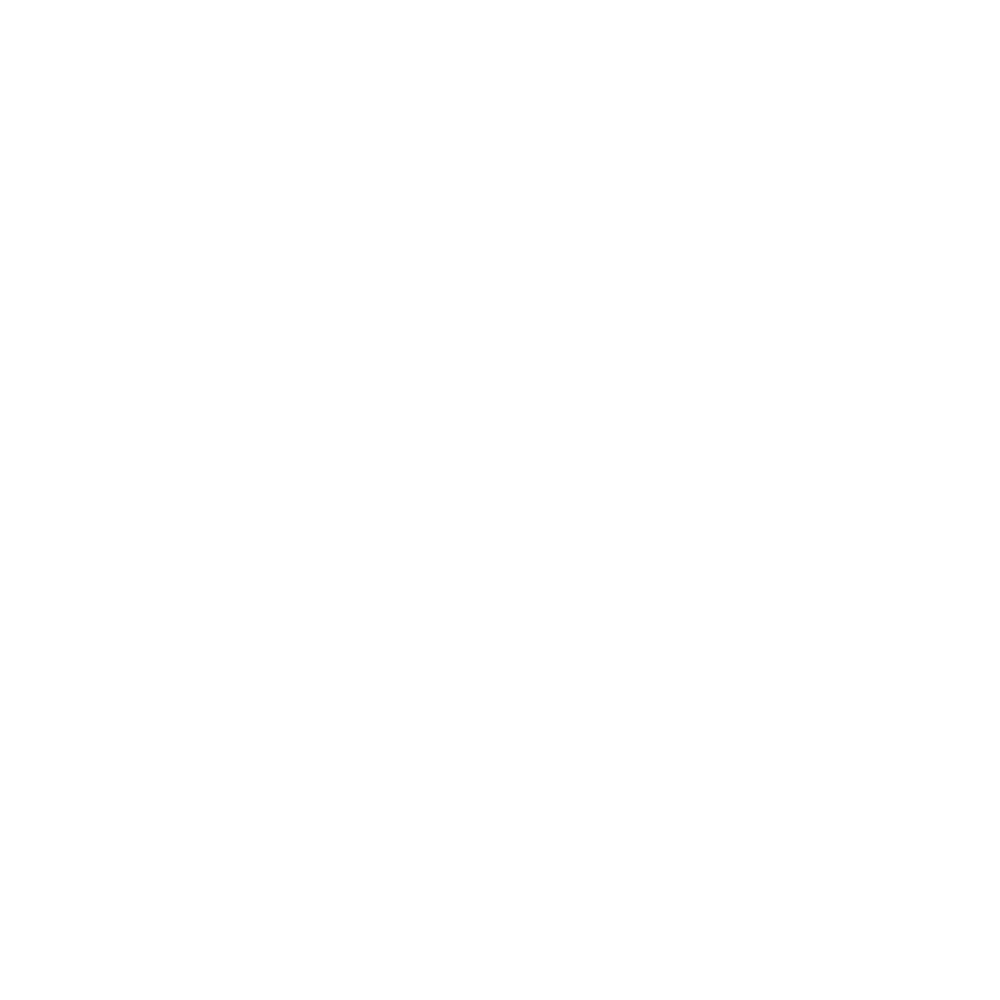

<IPython.core.display.Javascript object>


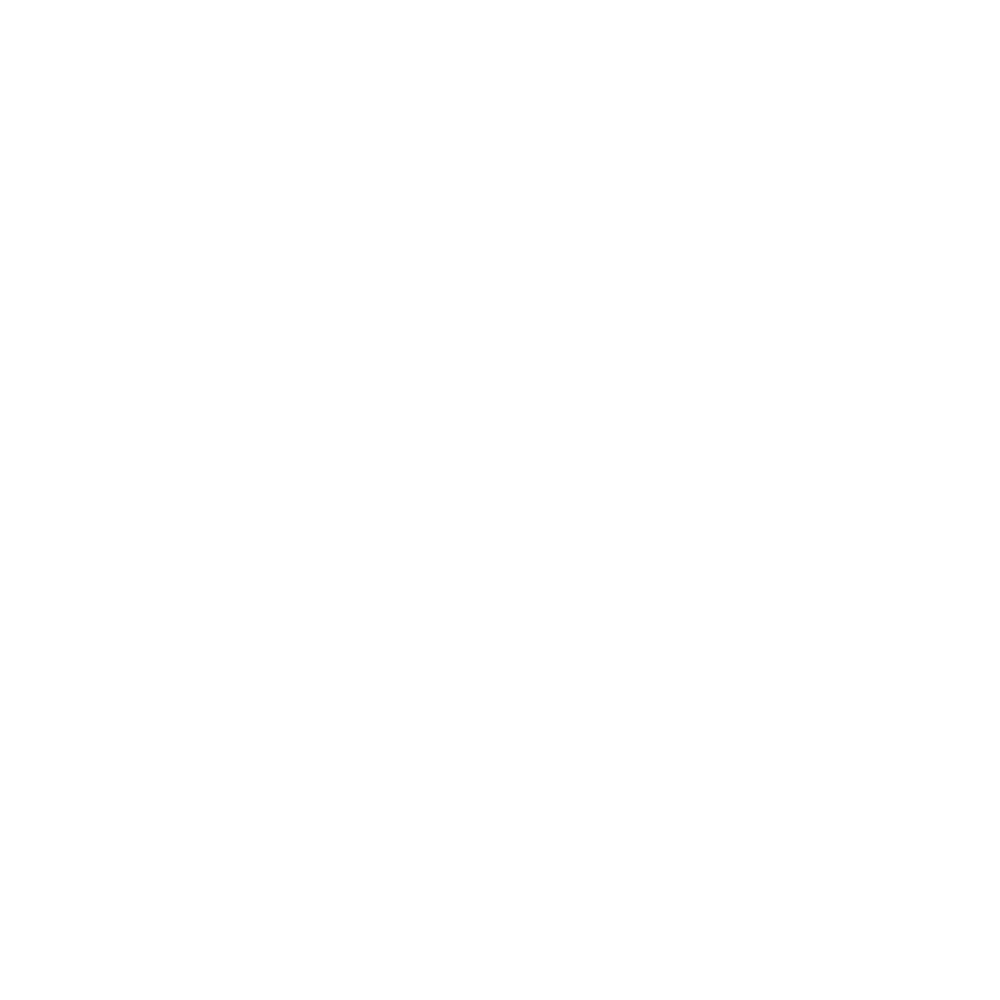

<IPython.core.display.Javascript object>


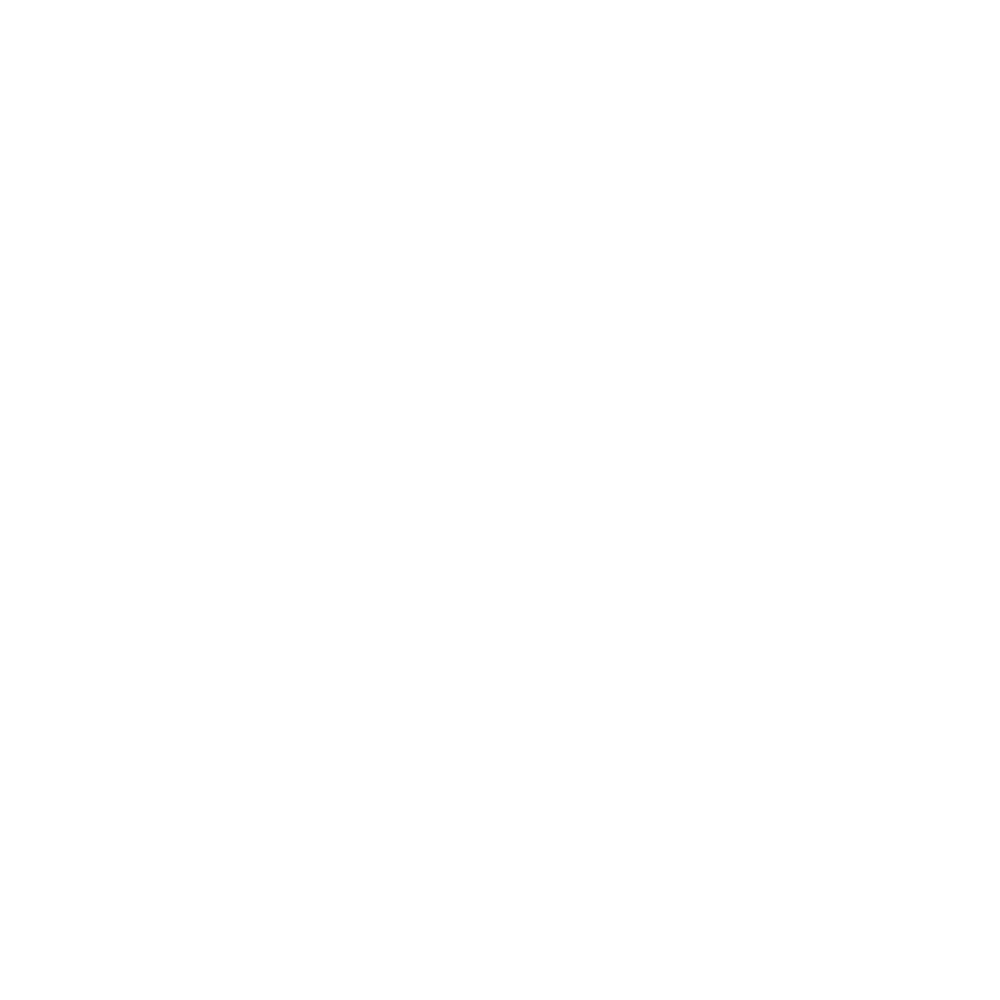

<IPython.core.display.Javascript object>


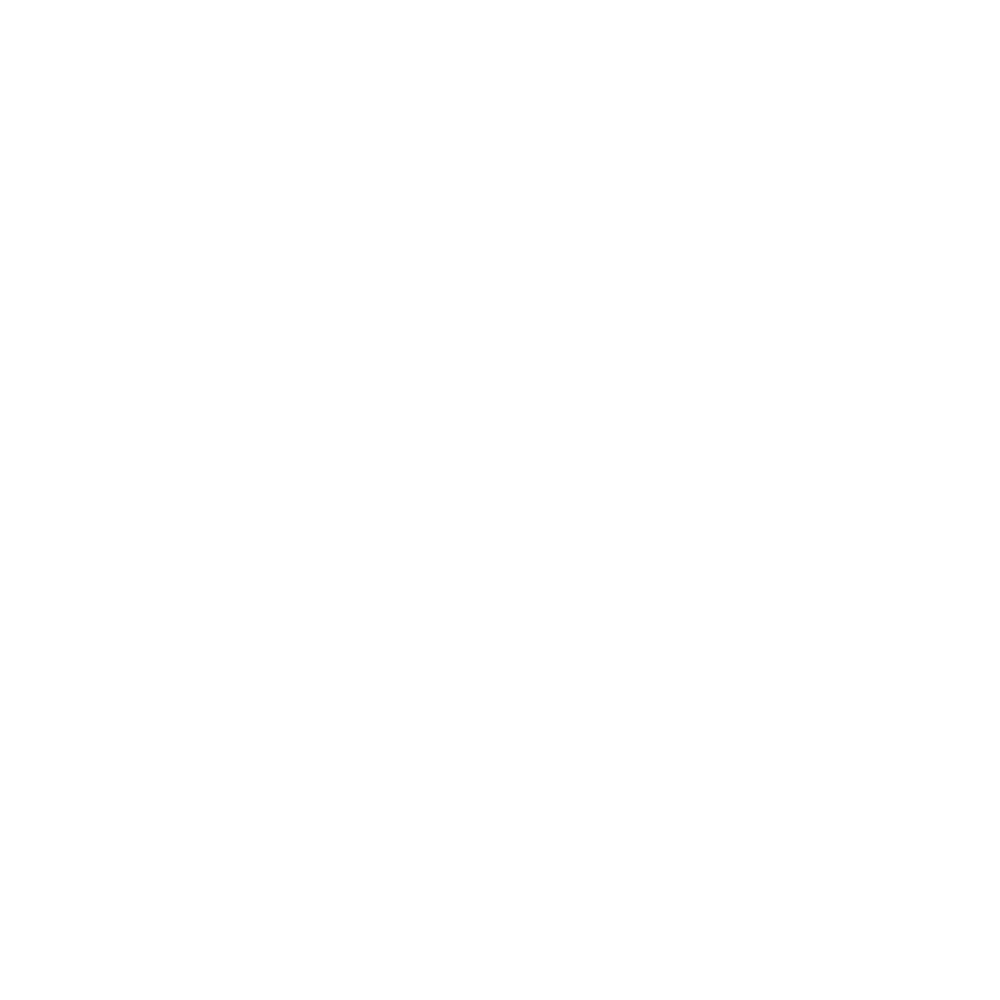

<IPython.core.display.Javascript object>


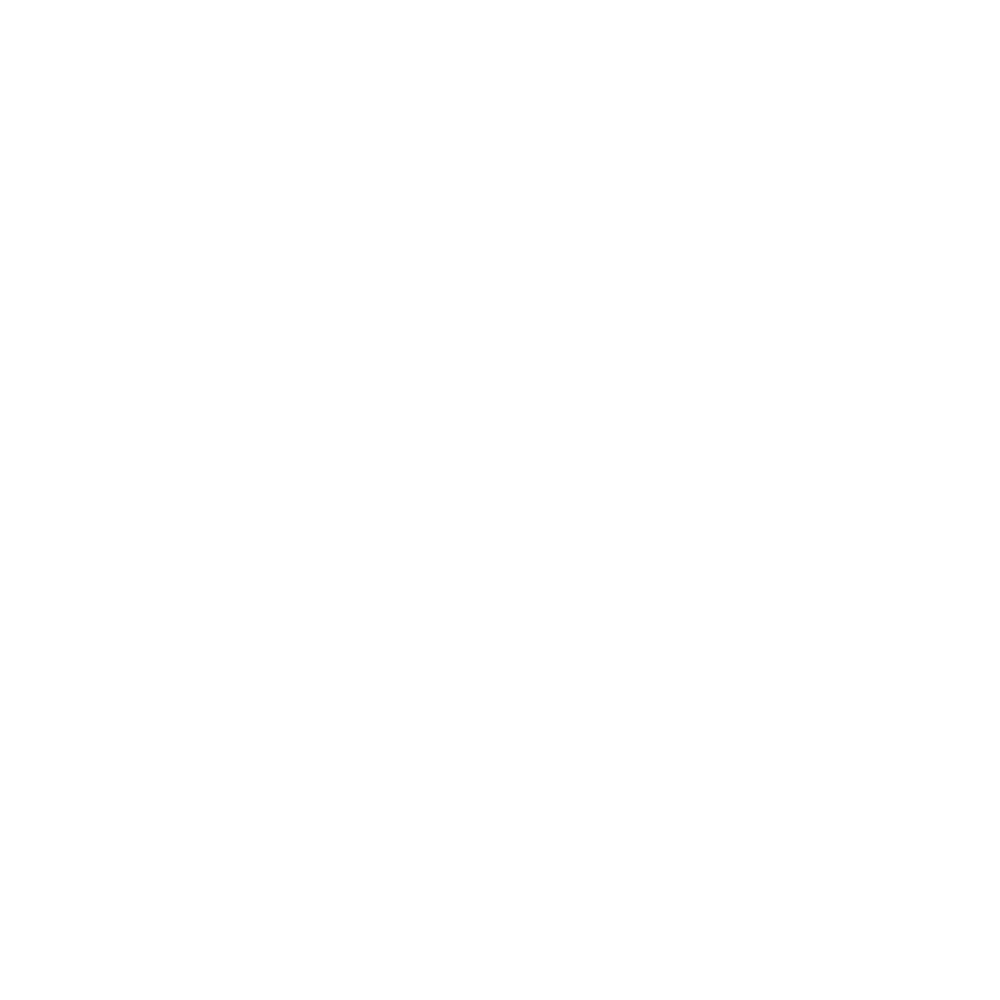

<IPython.core.display.Javascript object>


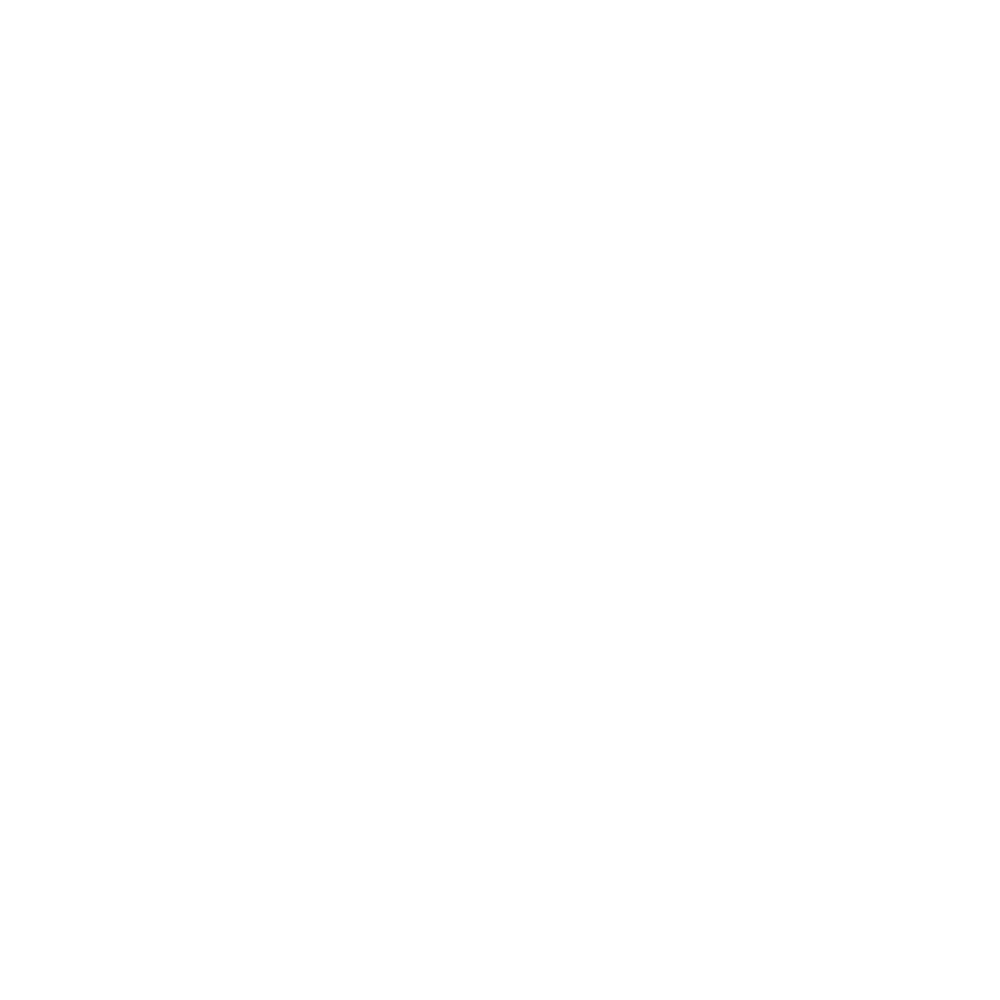

<IPython.core.display.Javascript object>


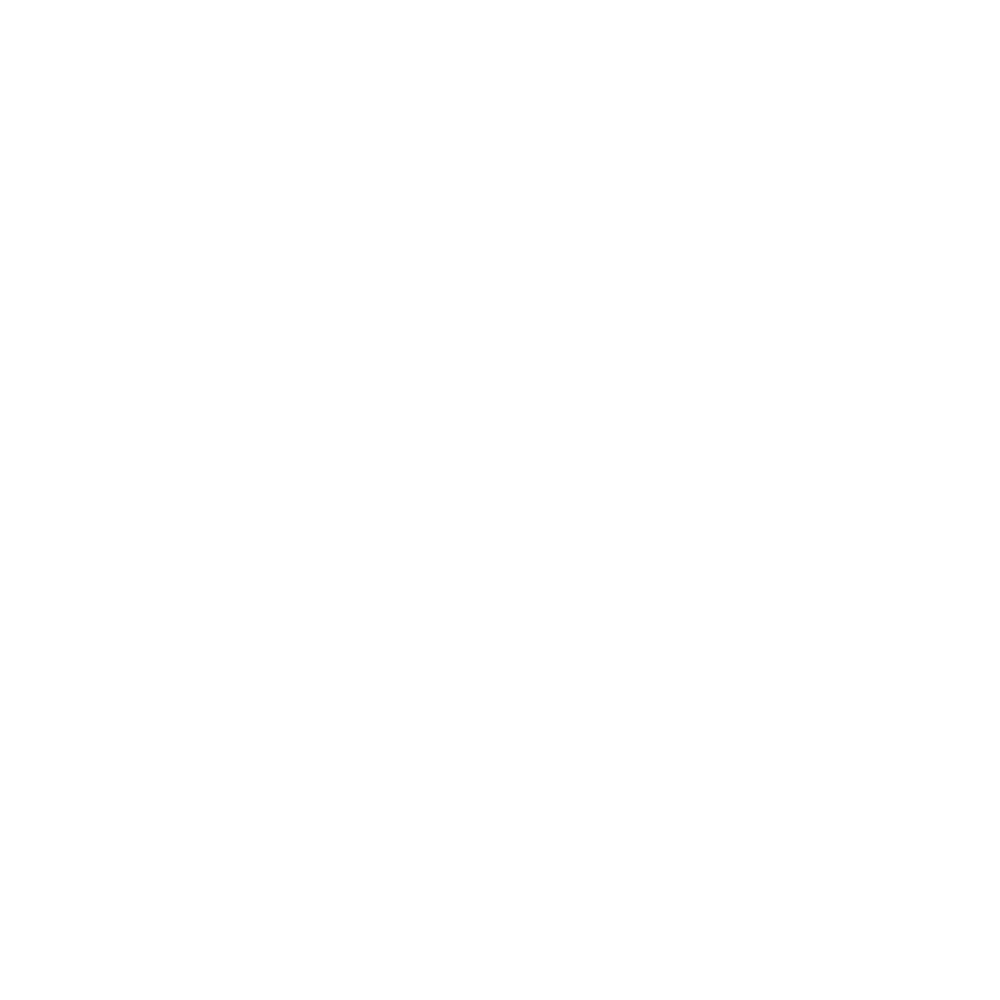

<IPython.core.display.Javascript object>


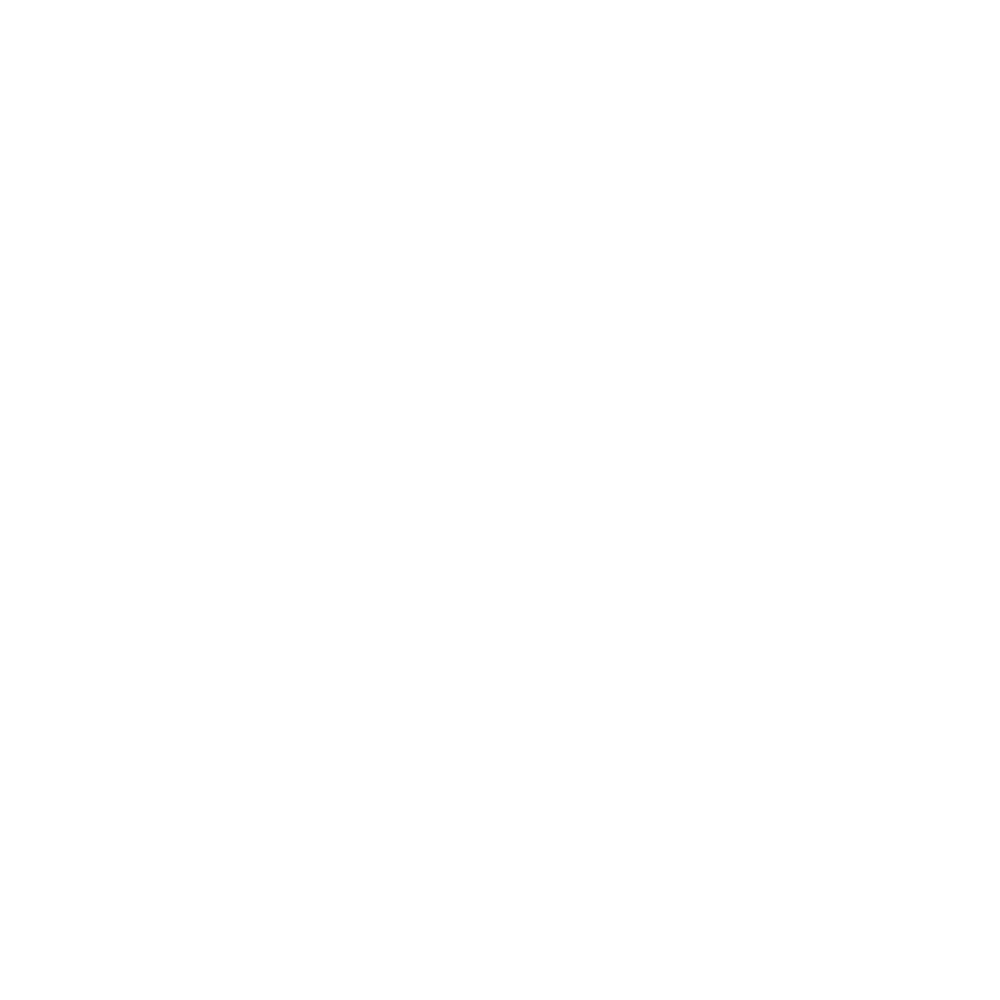

<IPython.core.display.Javascript object>


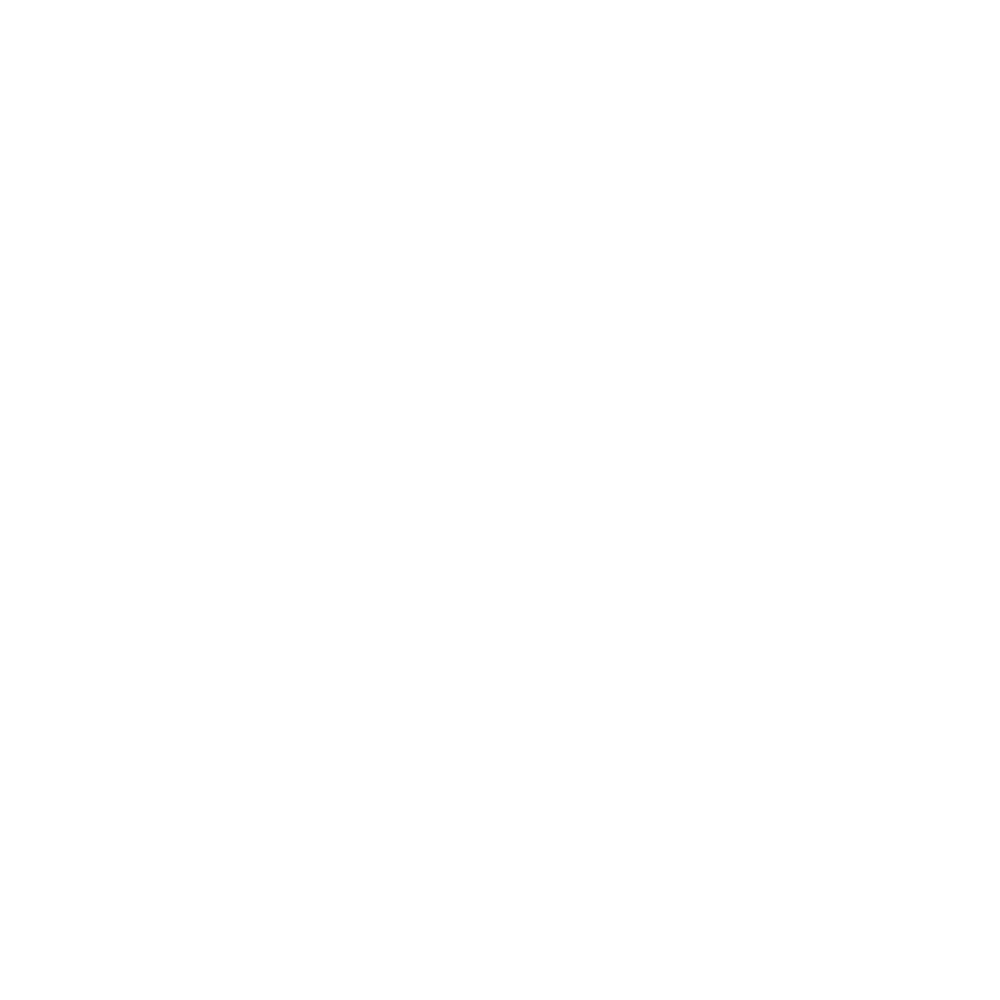

<IPython.core.display.Javascript object>


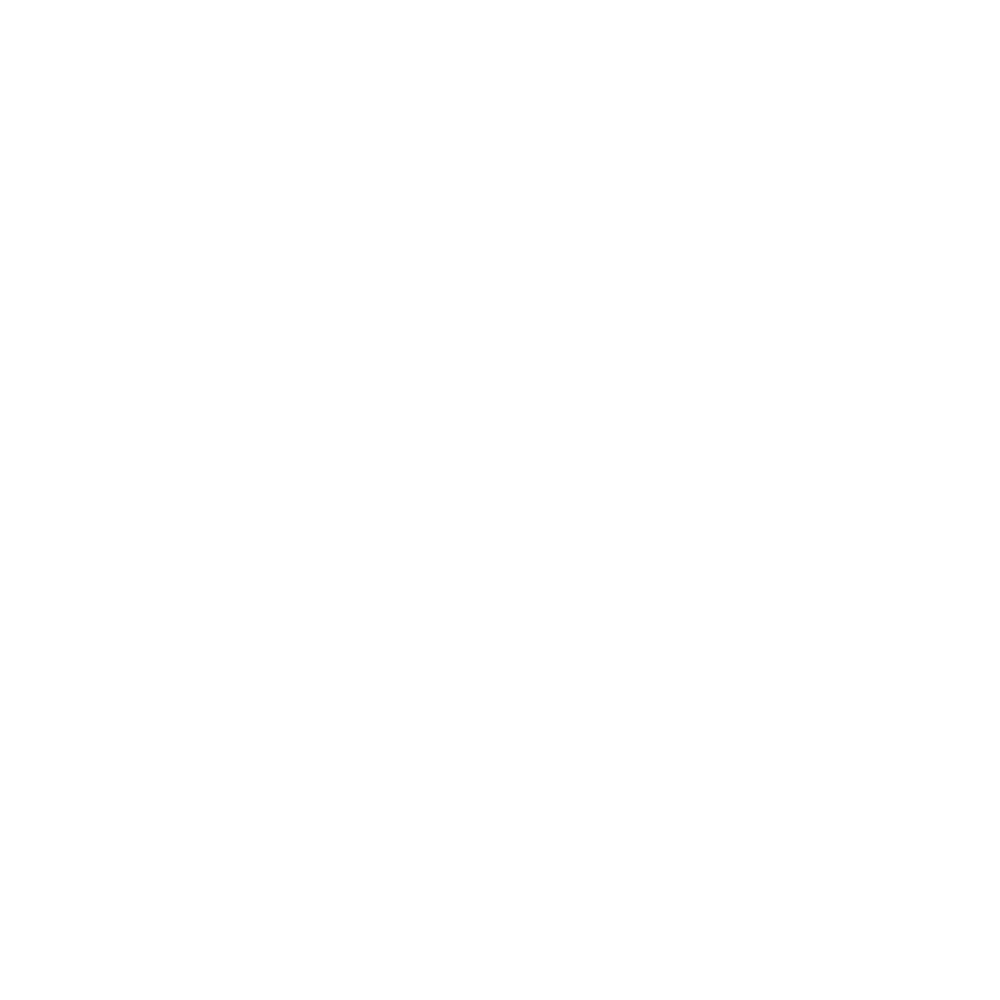

<IPython.core.display.Javascript object>


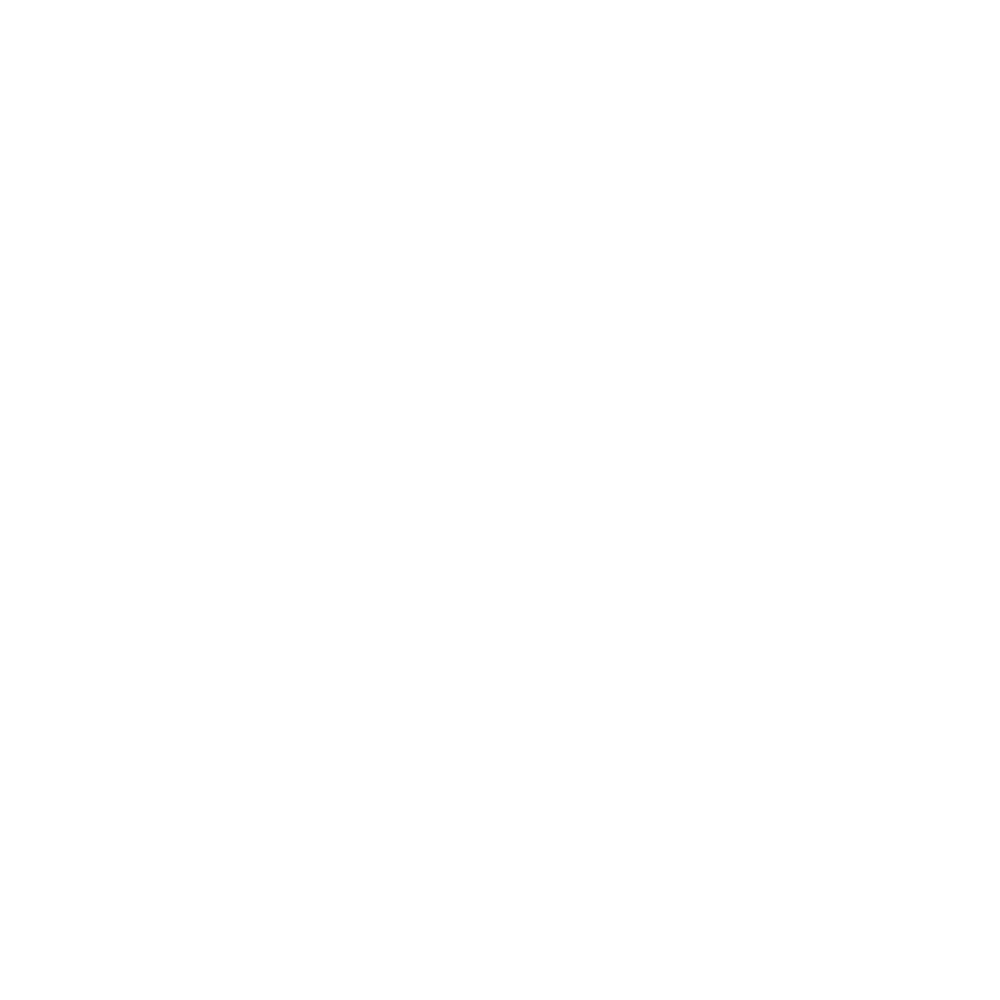

<IPython.core.display.Javascript object>


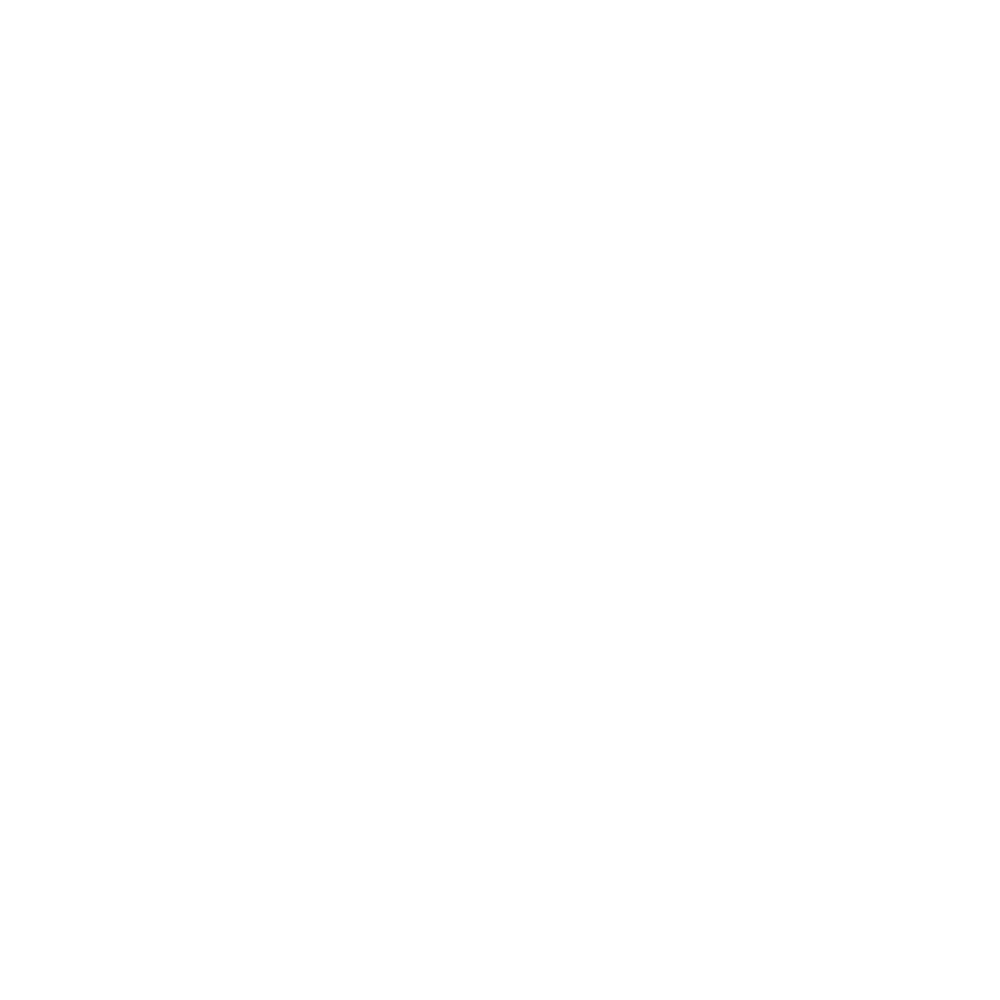

<IPython.core.display.Javascript object>


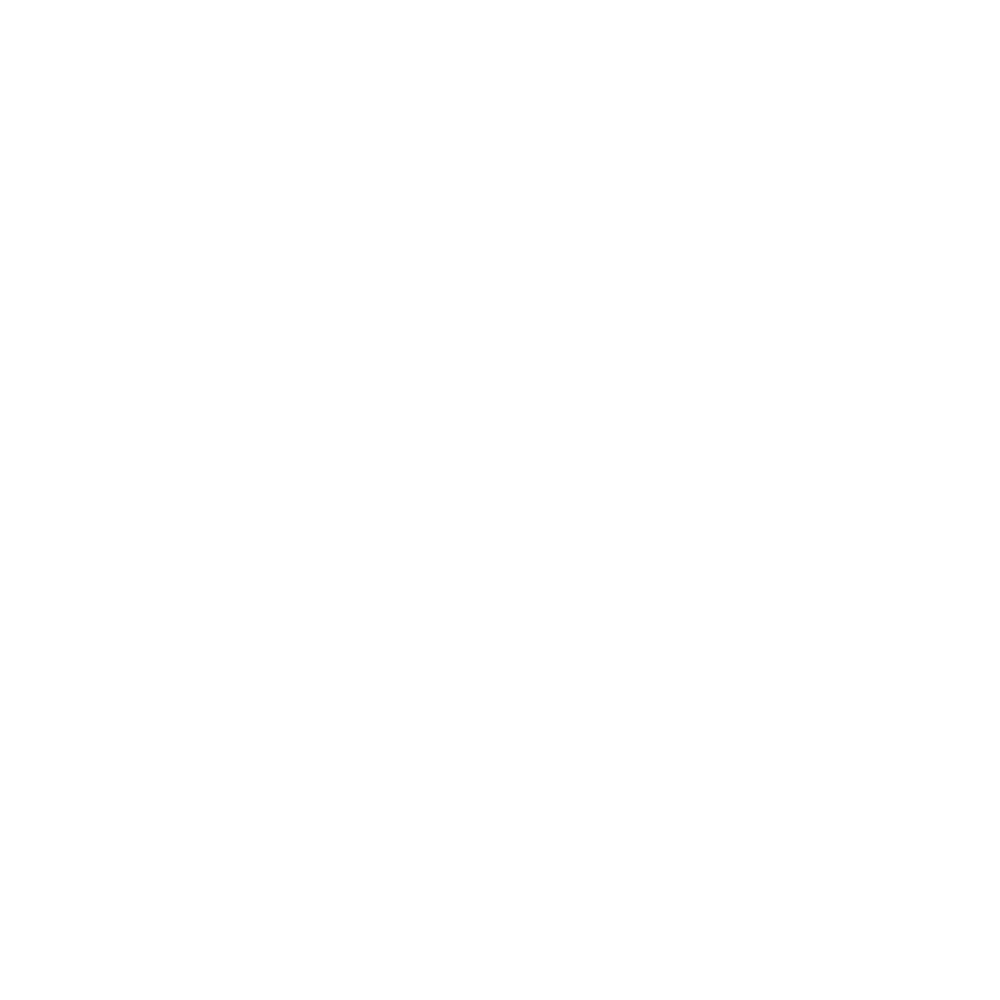

<IPython.core.display.Javascript object>


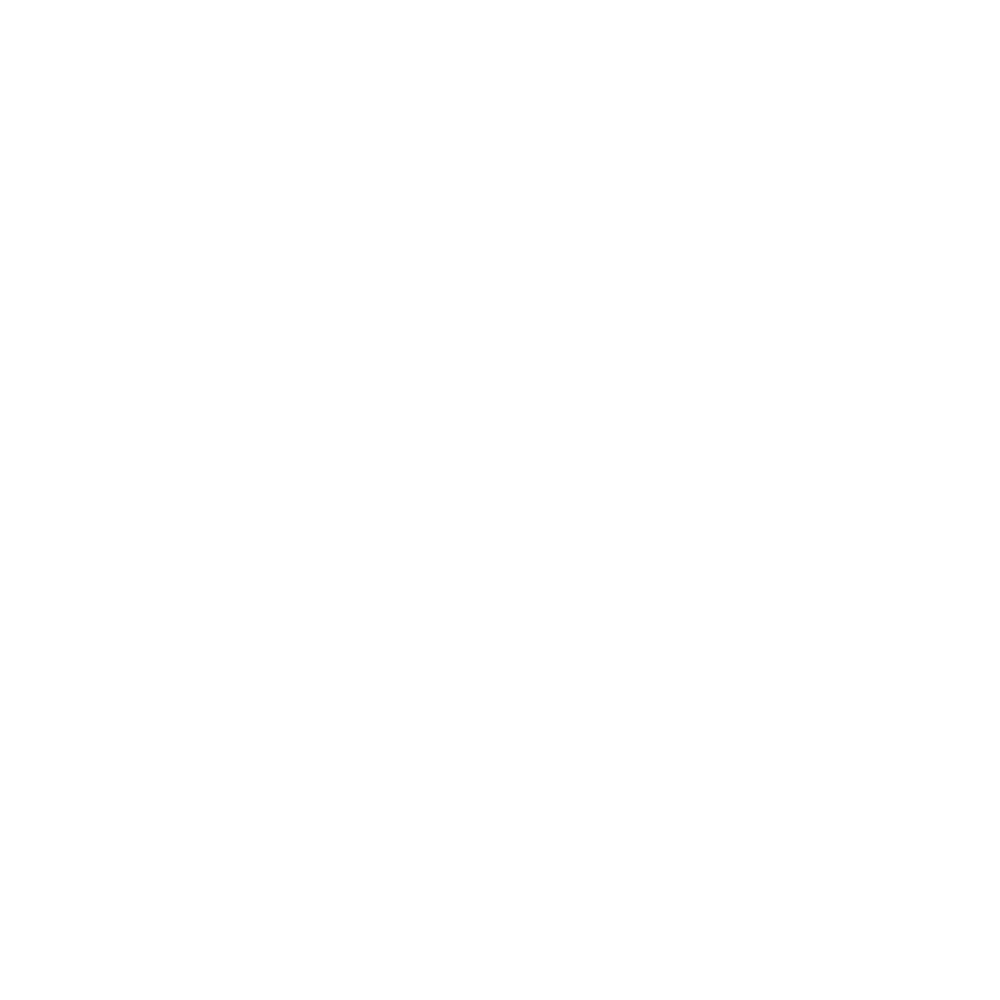

<IPython.core.display.Javascript object>


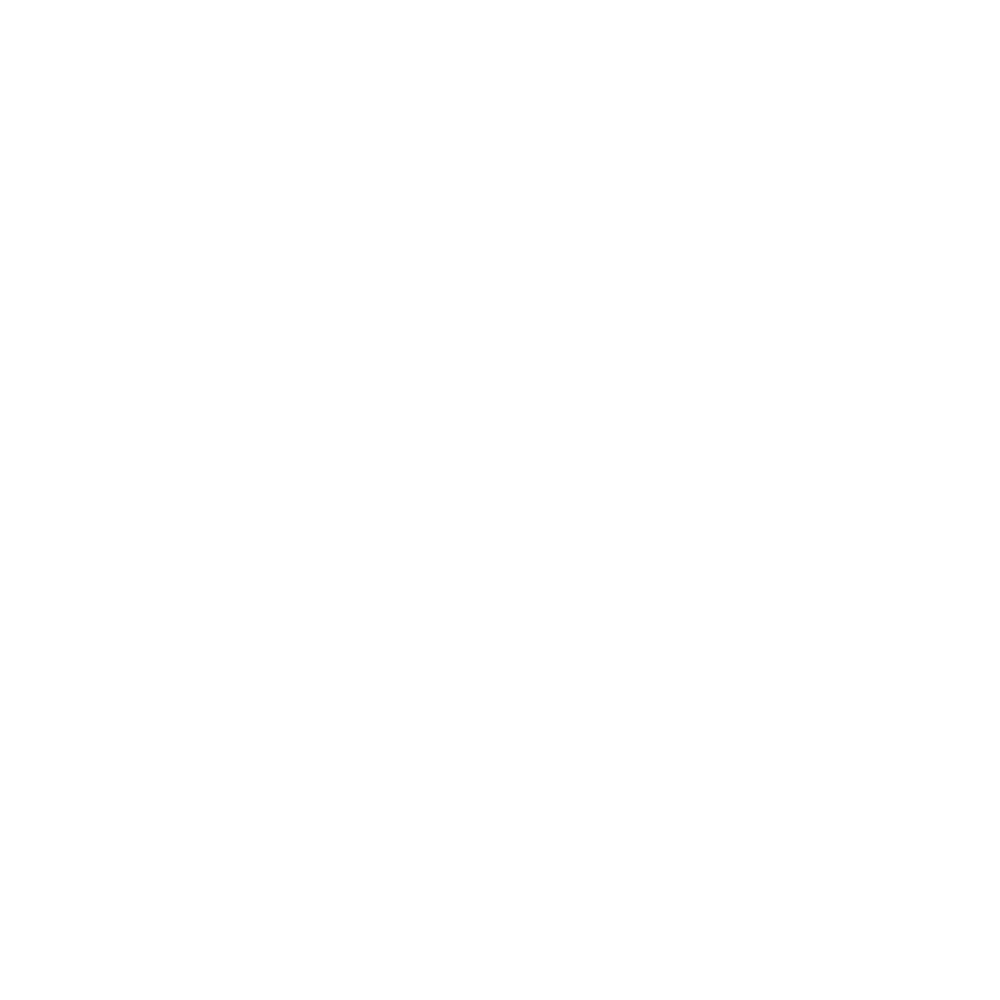

<IPython.core.display.Javascript object>


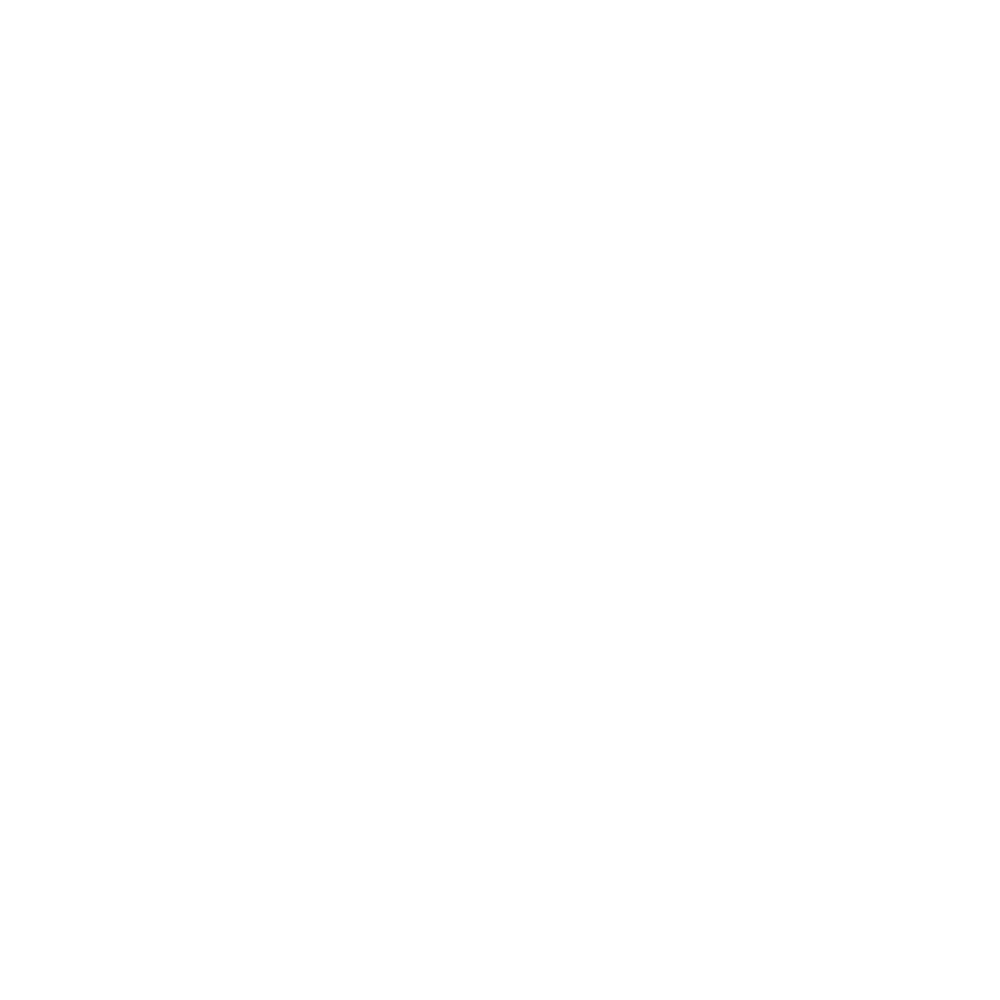

<IPython.core.display.Javascript object>


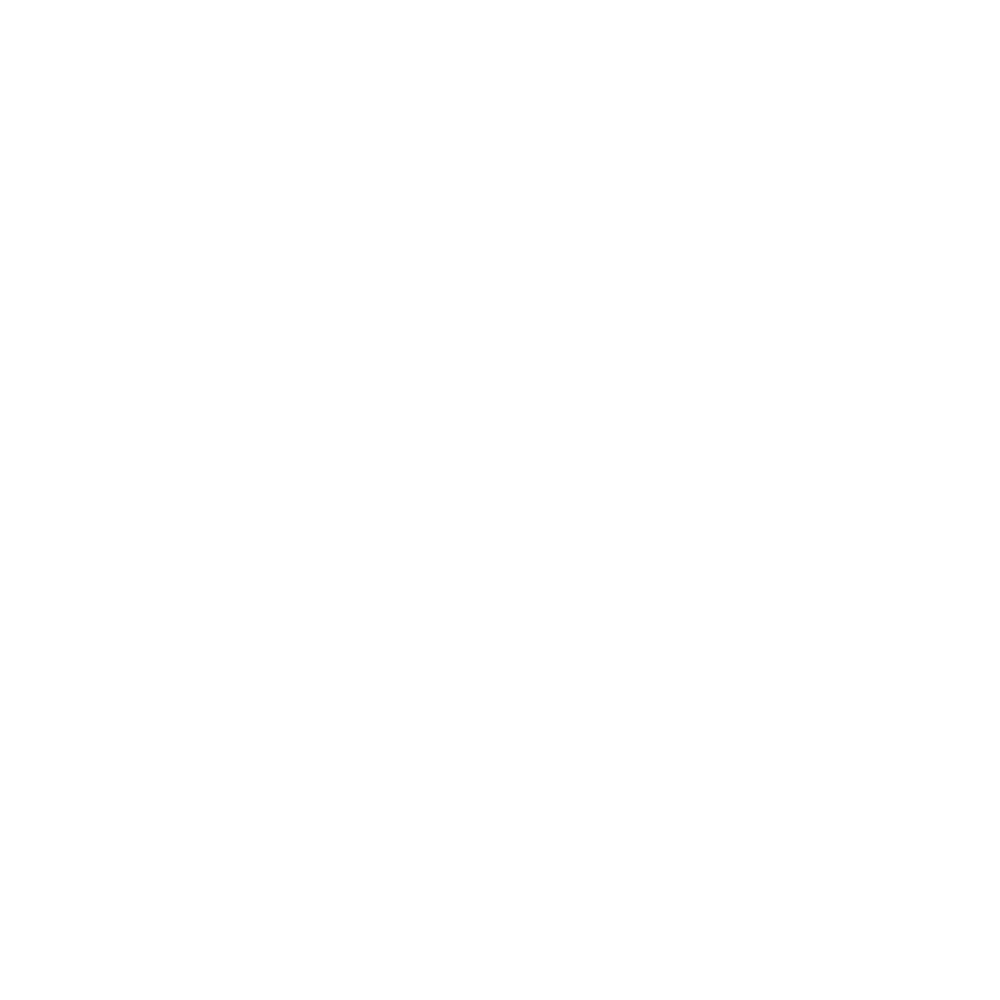

<IPython.core.display.Javascript object>


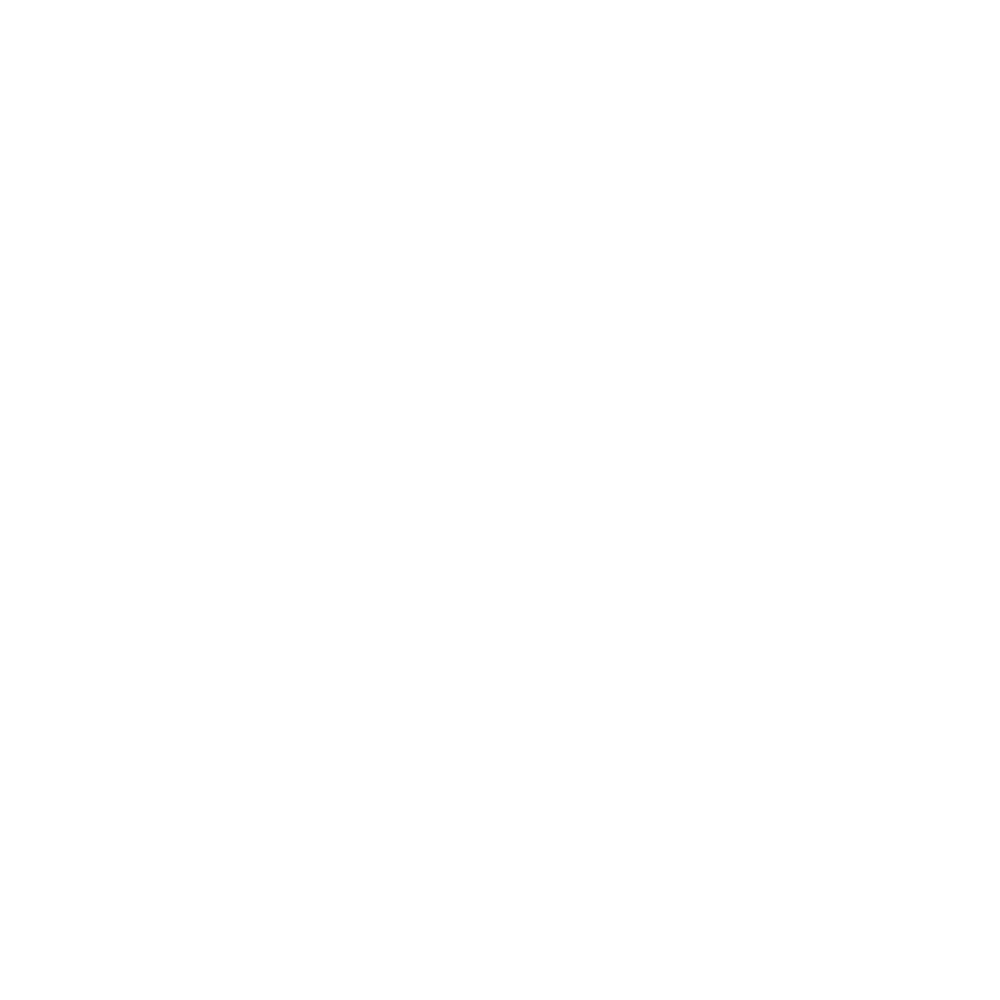

<IPython.core.display.Javascript object>


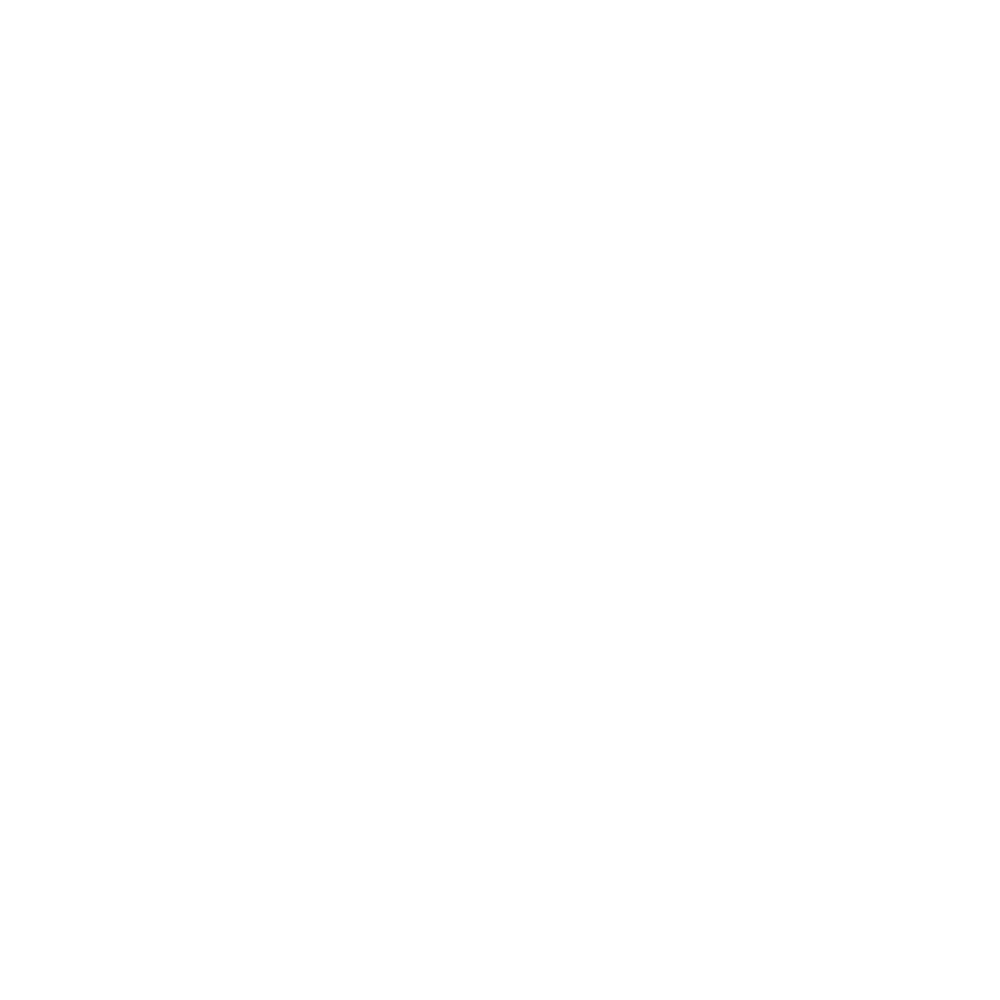

<IPython.core.display.Javascript object>


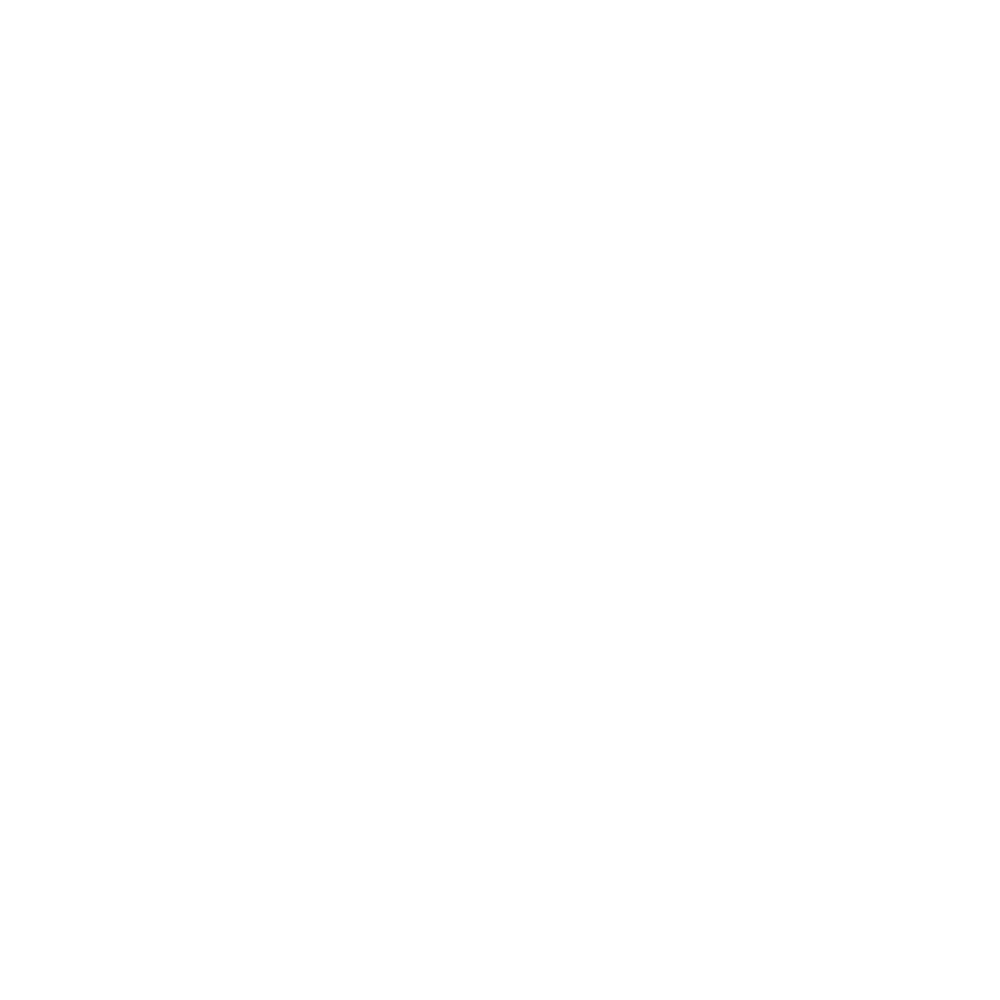

<IPython.core.display.Javascript object>


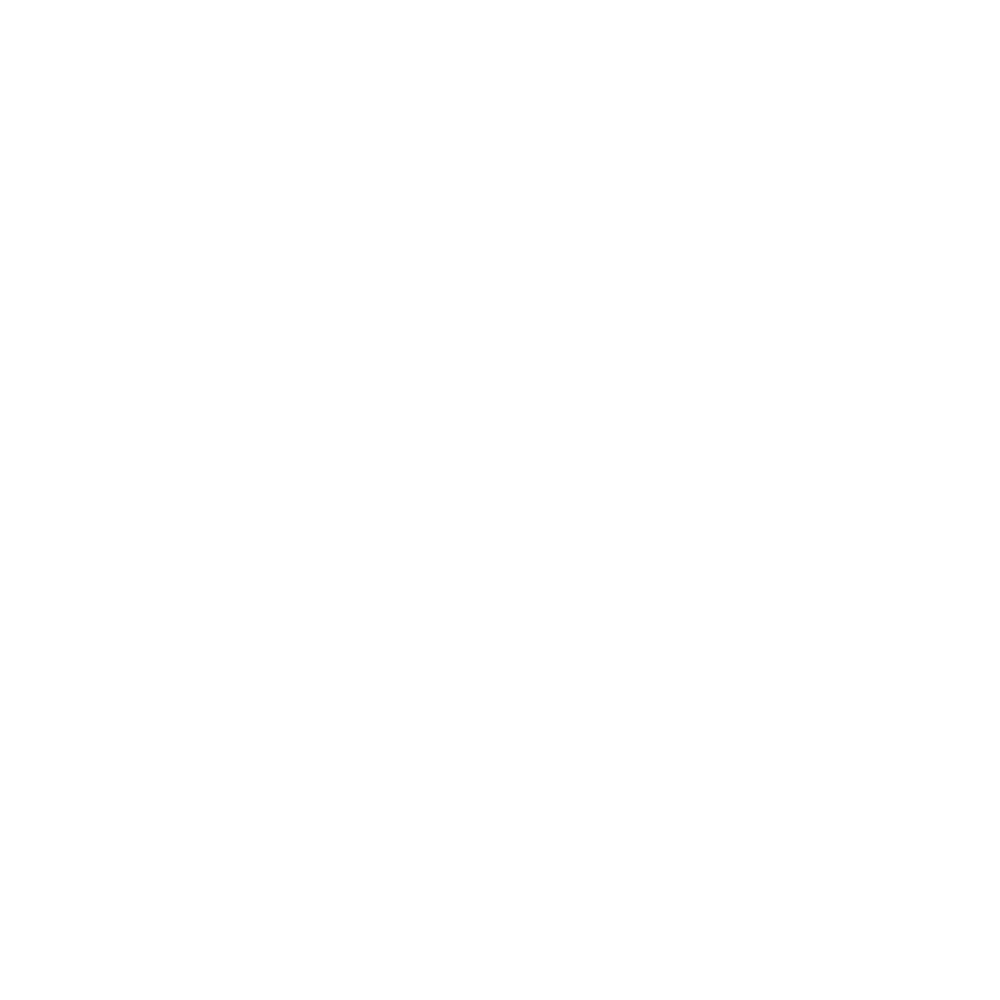

<IPython.core.display.Javascript object>


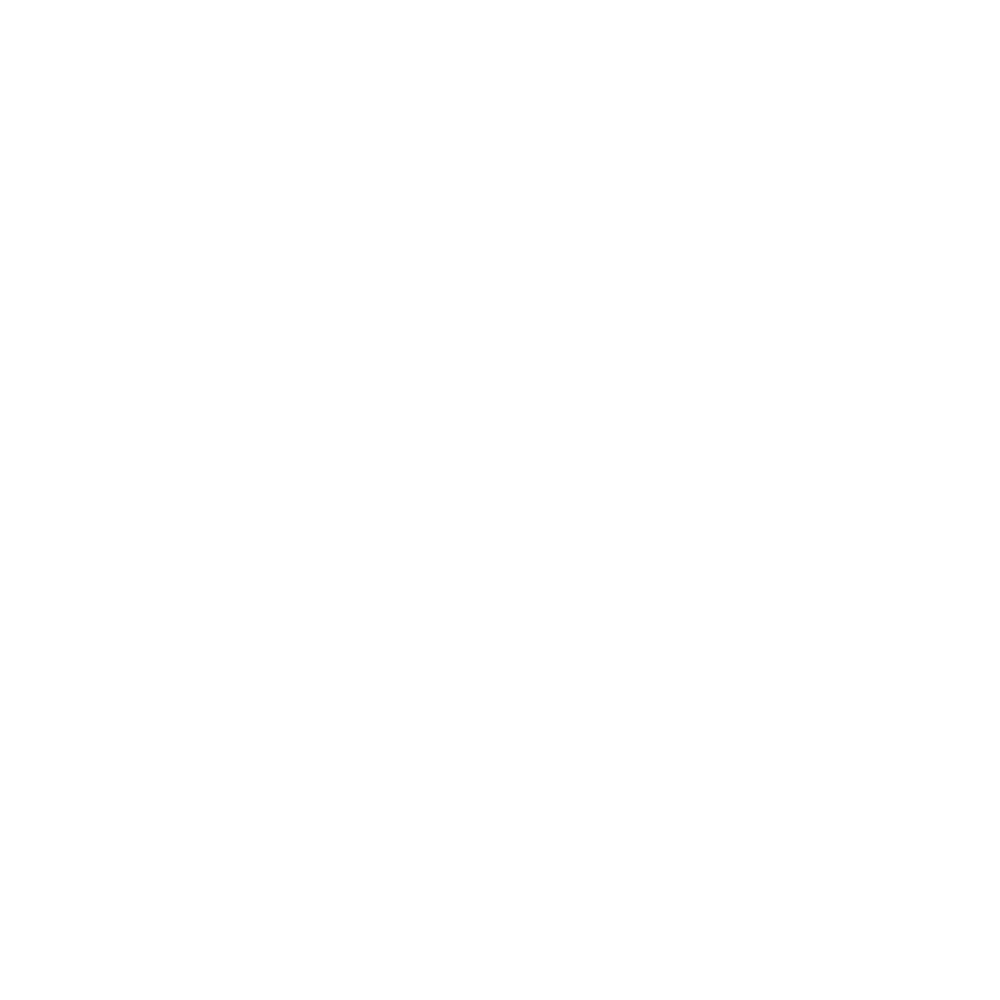

<IPython.core.display.Javascript object>


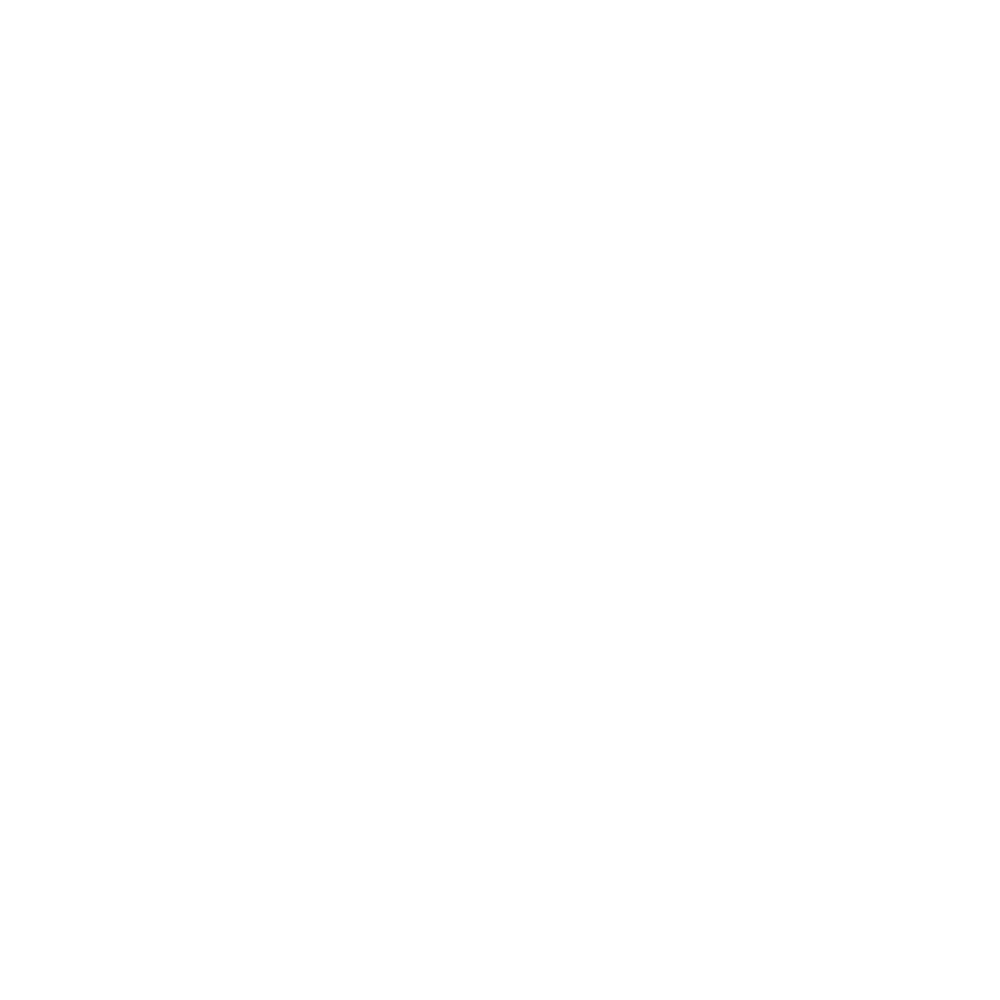

<IPython.core.display.Javascript object>


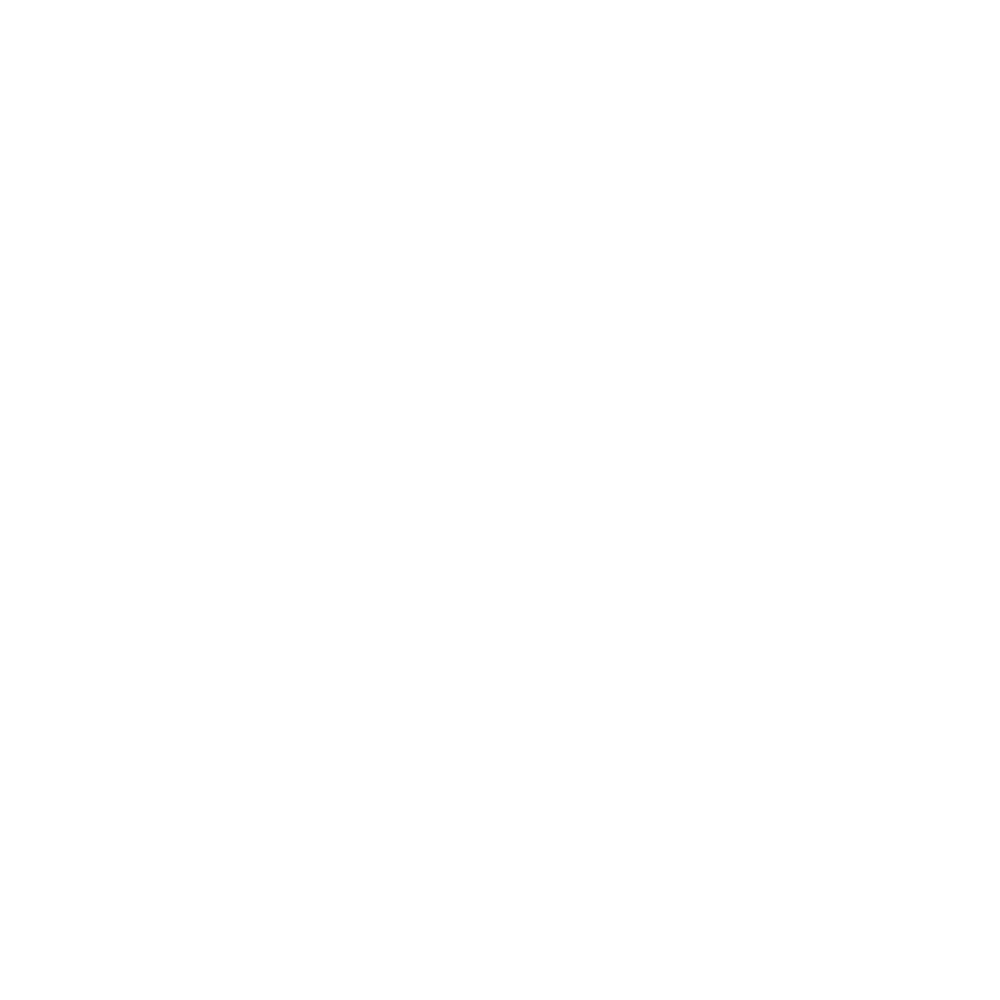

<IPython.core.display.Javascript object>


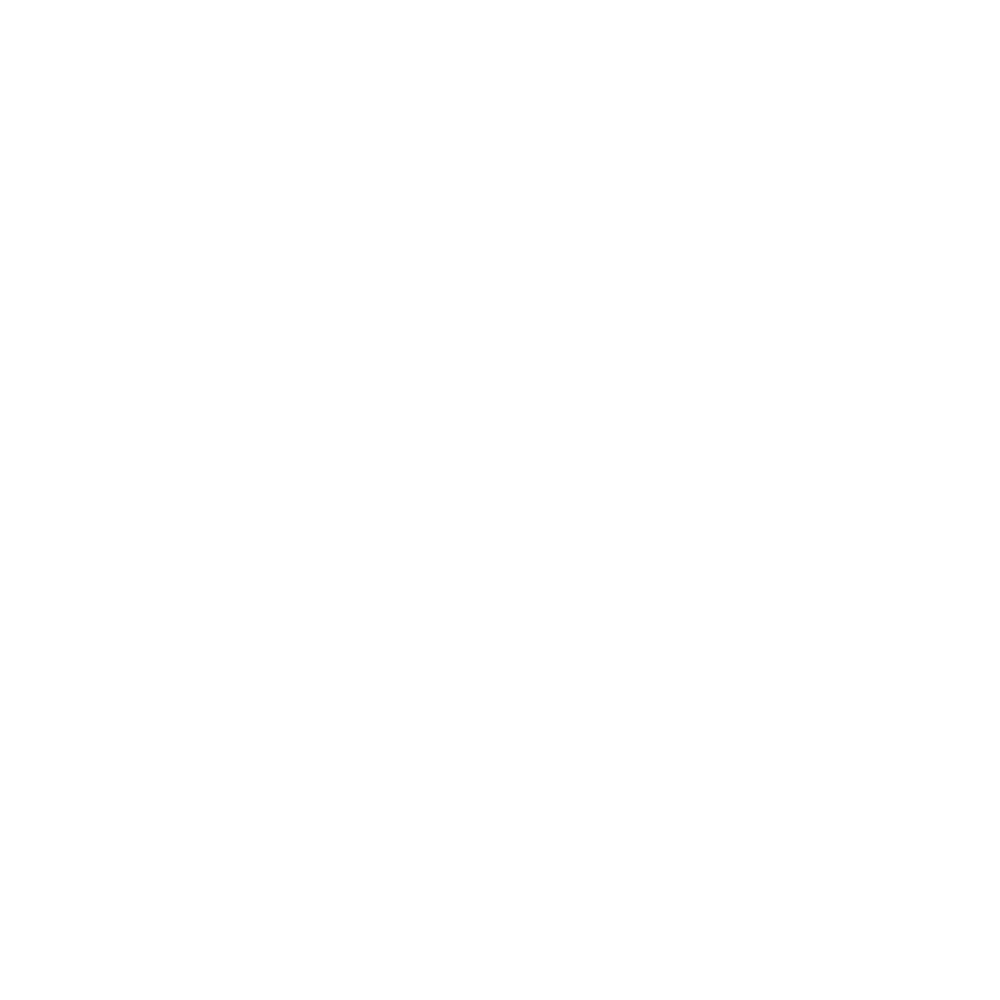

<IPython.core.display.Javascript object>


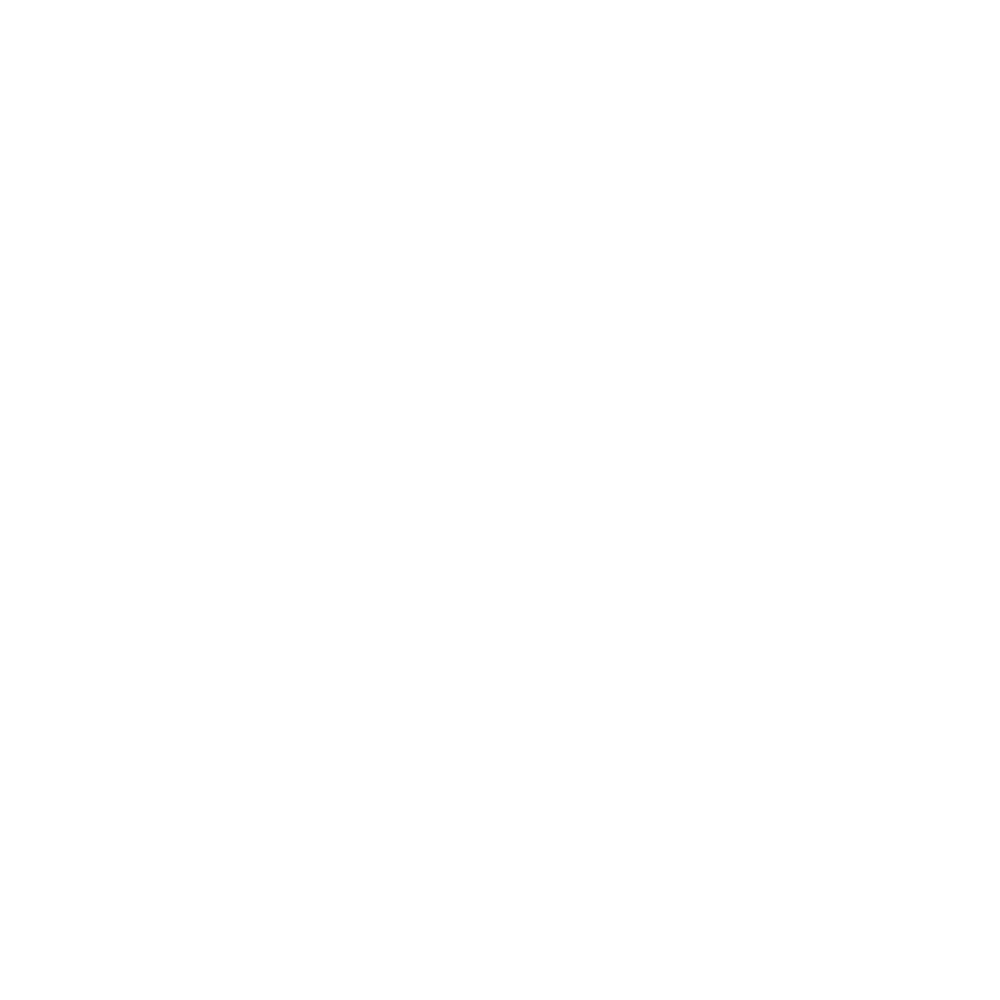

<IPython.core.display.Javascript object>


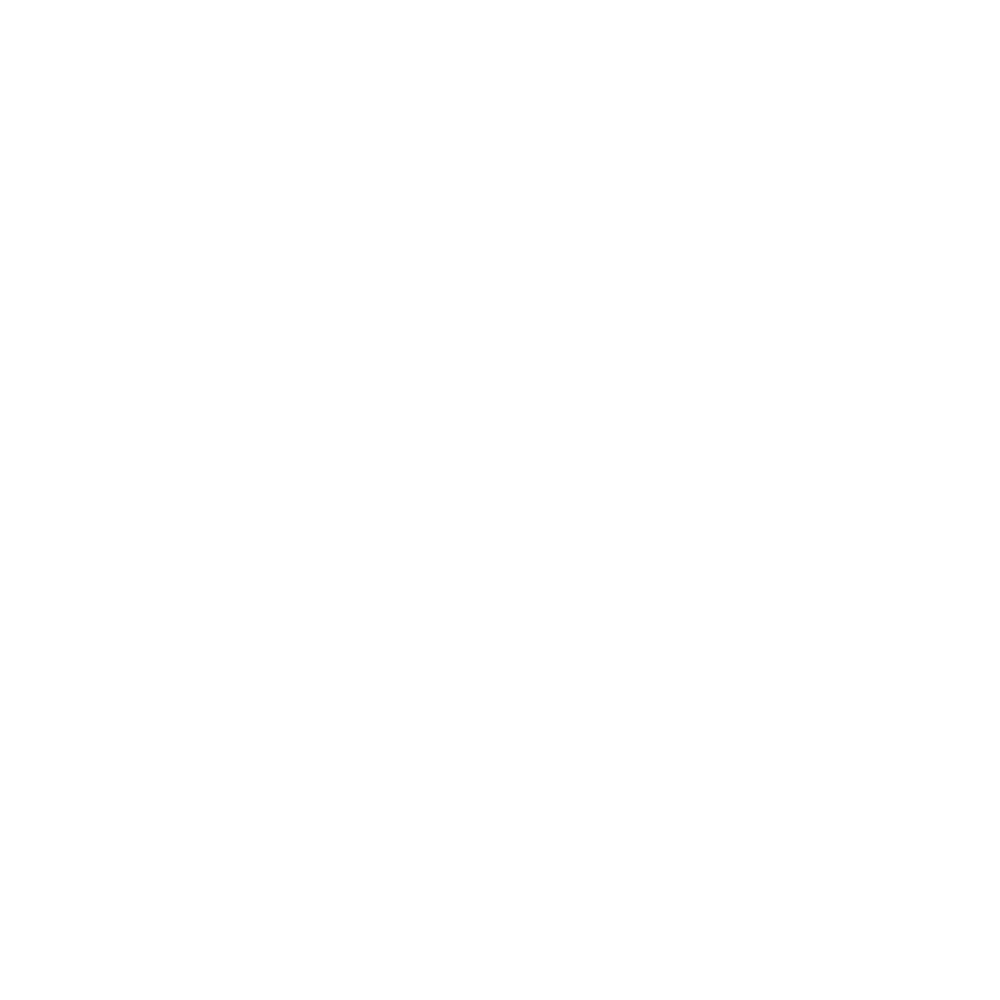

<IPython.core.display.Javascript object>


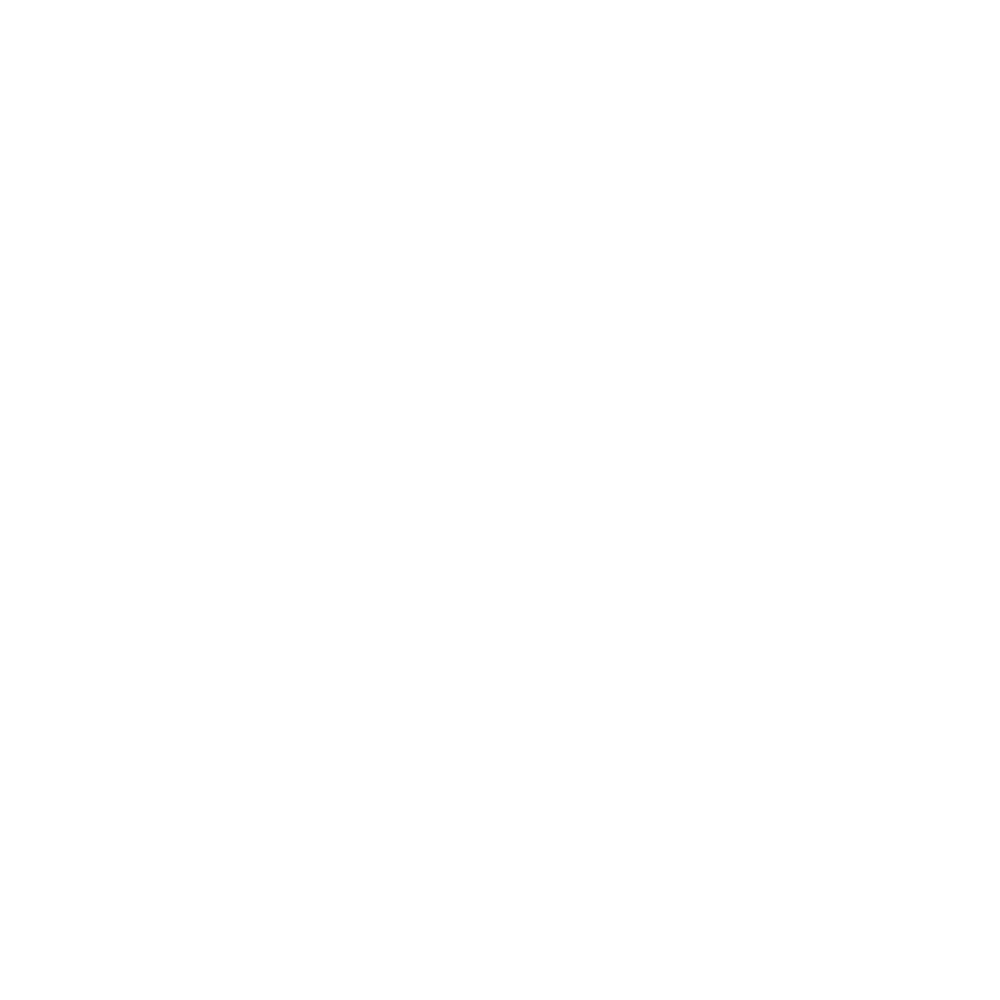

<IPython.core.display.Javascript object>


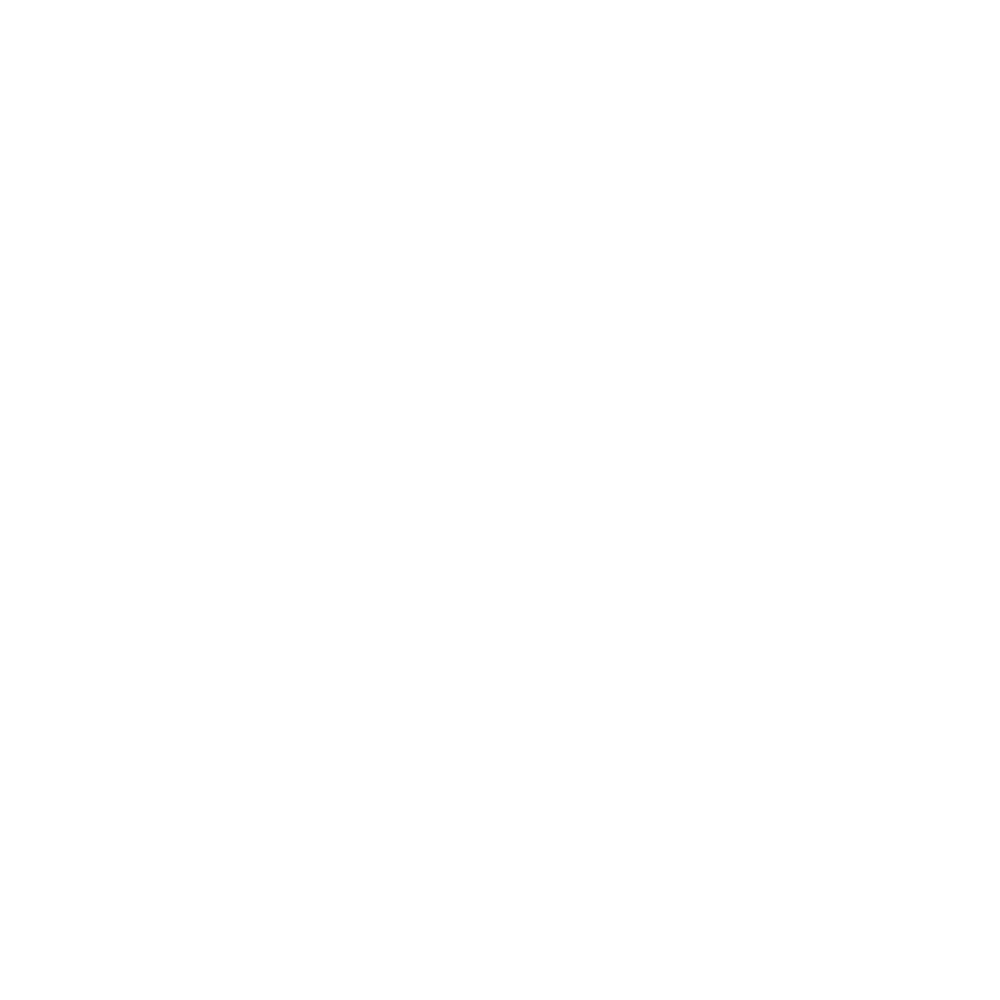

<IPython.core.display.Javascript object>


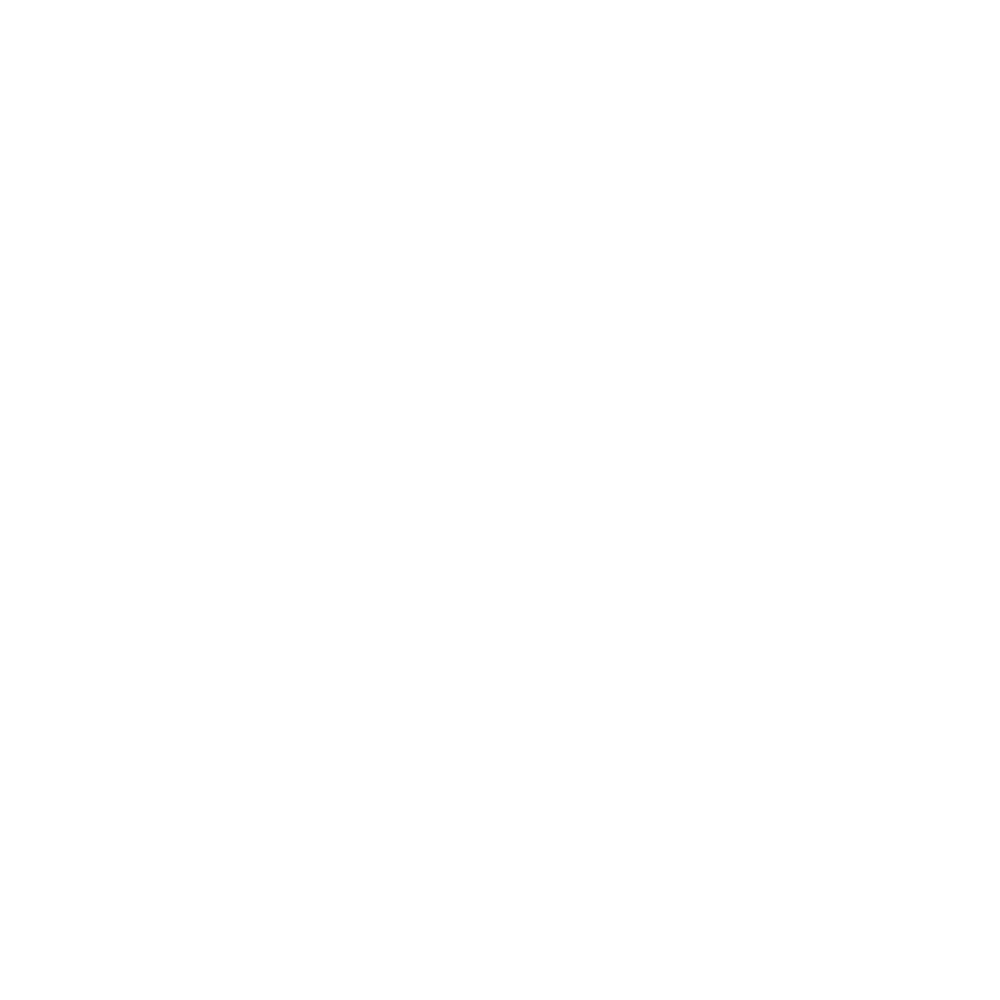

<IPython.core.display.Javascript object>


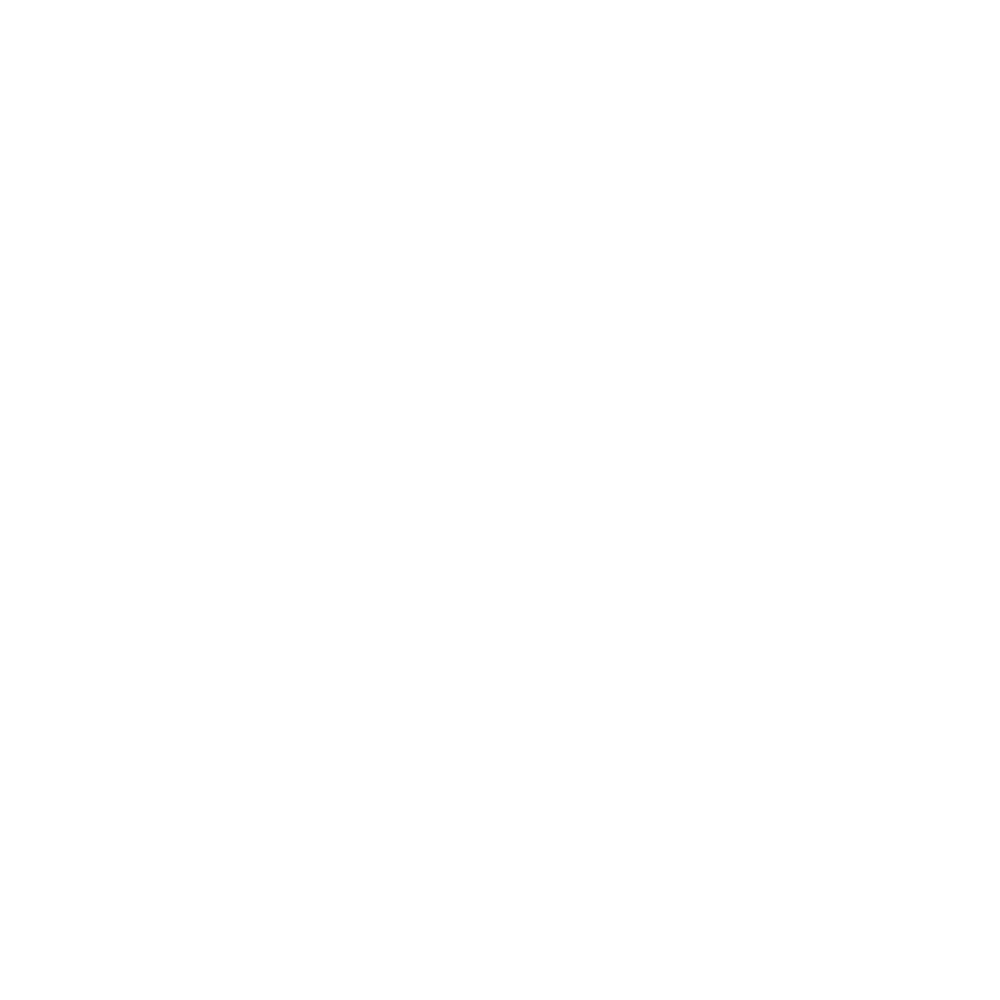

<IPython.core.display.Javascript object>


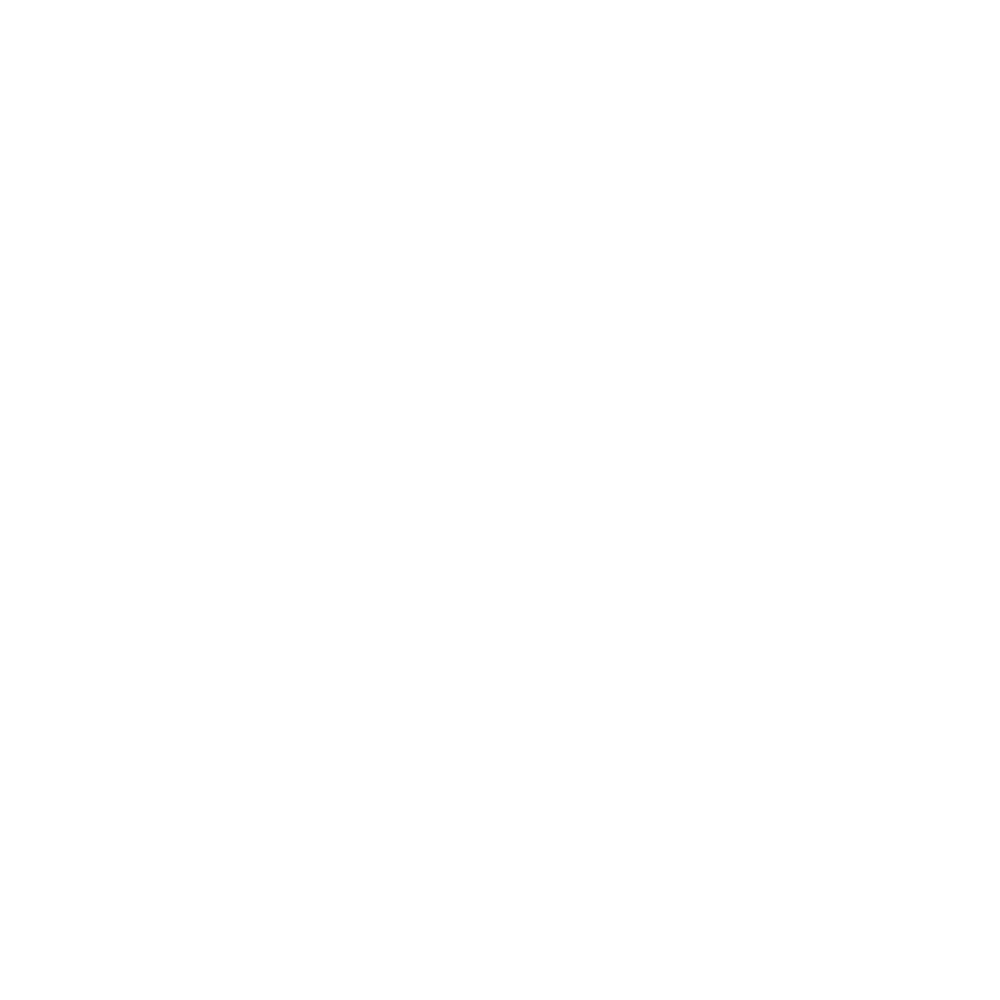

<IPython.core.display.Javascript object>


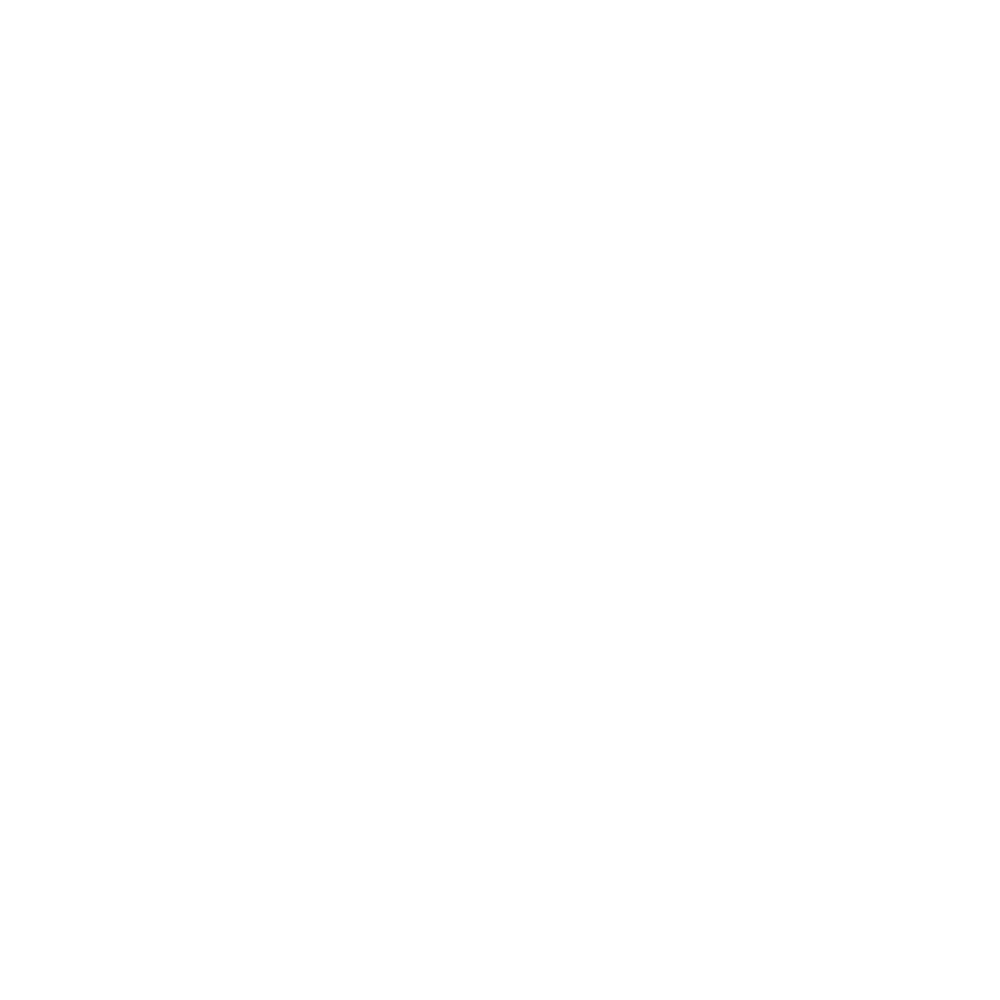

<IPython.core.display.Javascript object>


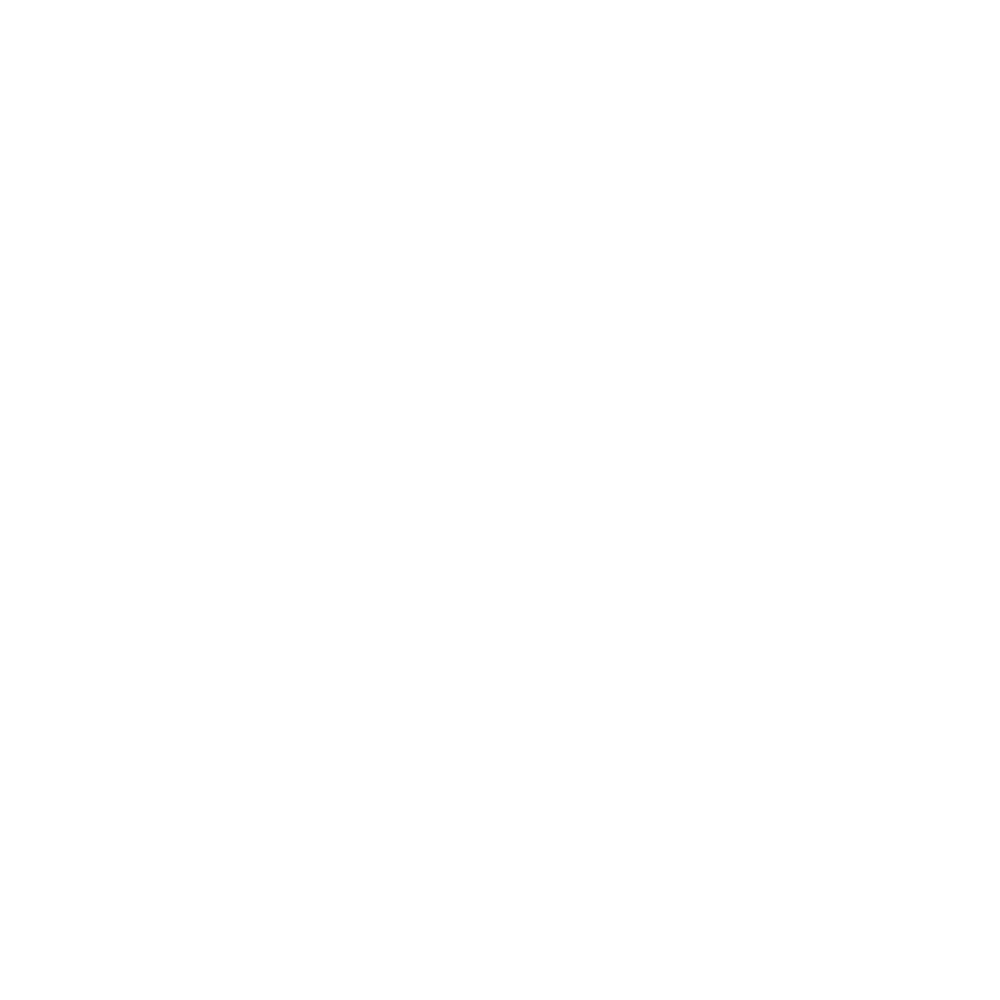

<IPython.core.display.Javascript object>


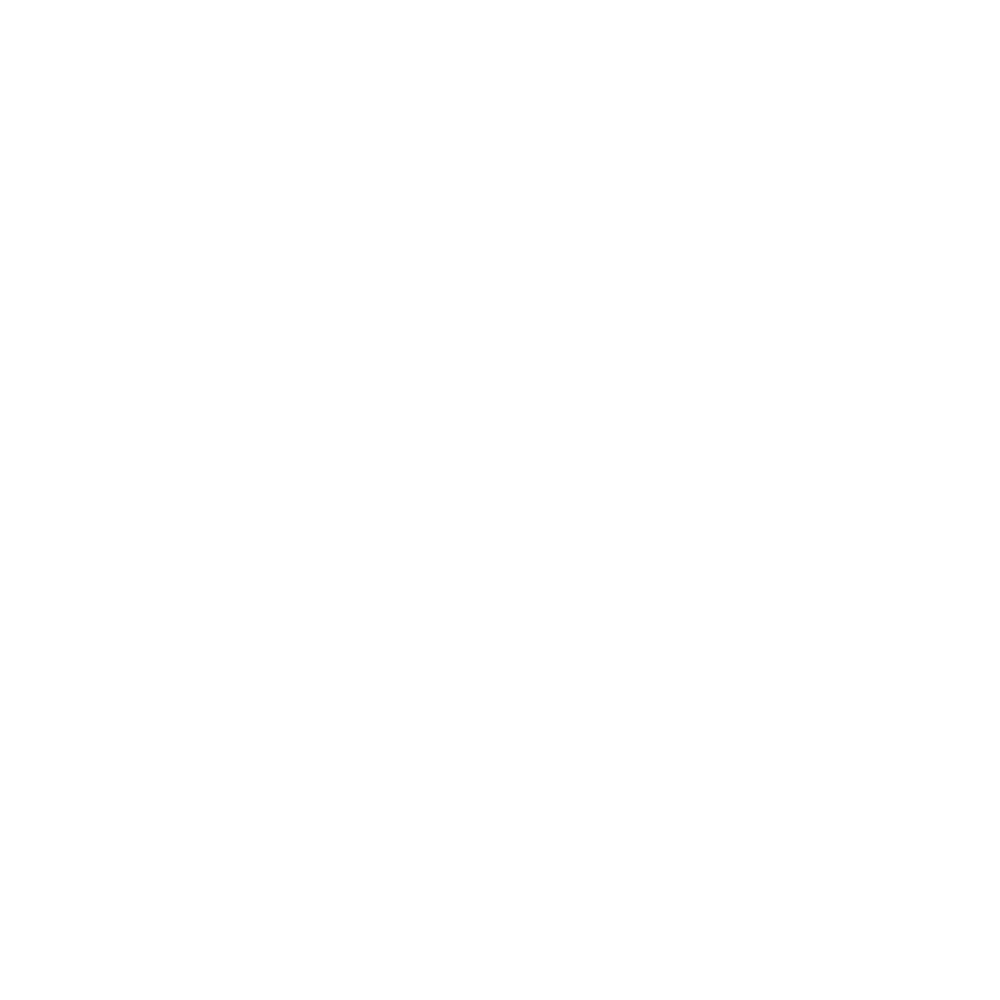

<IPython.core.display.Javascript object>


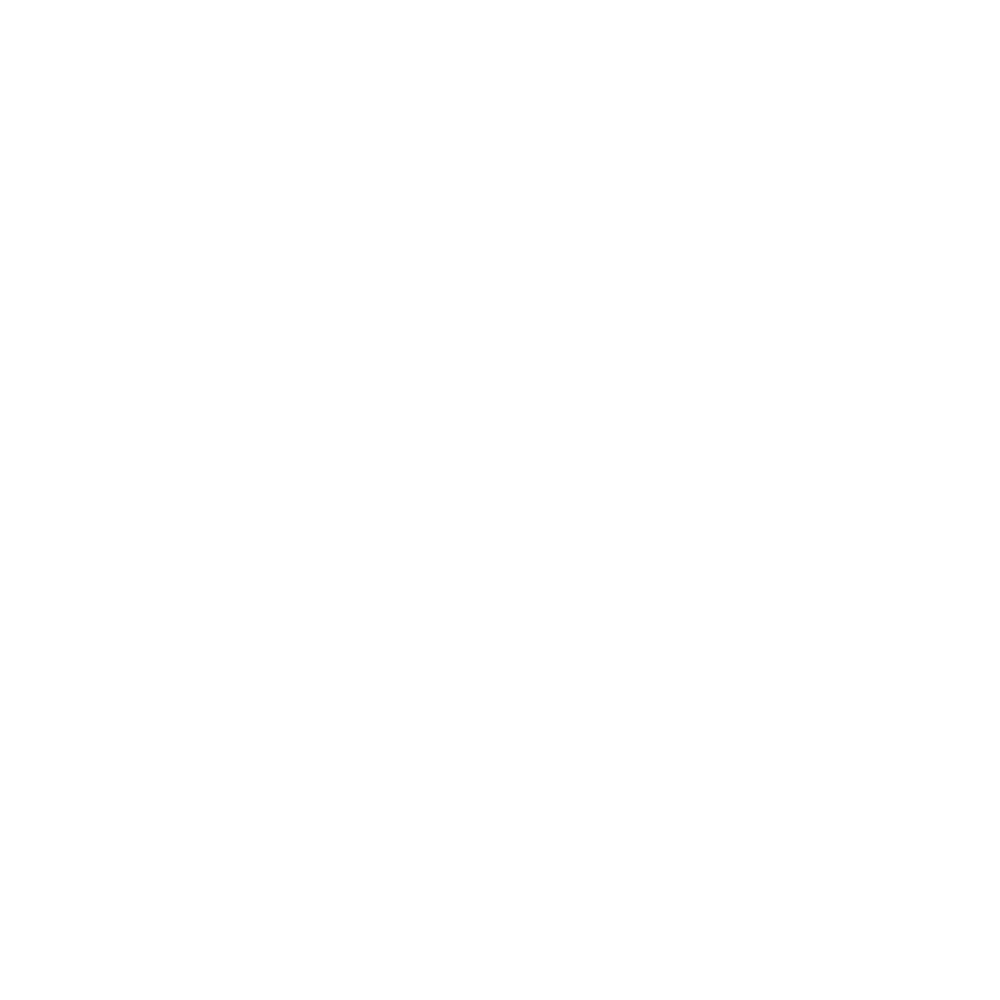

<IPython.core.display.Javascript object>


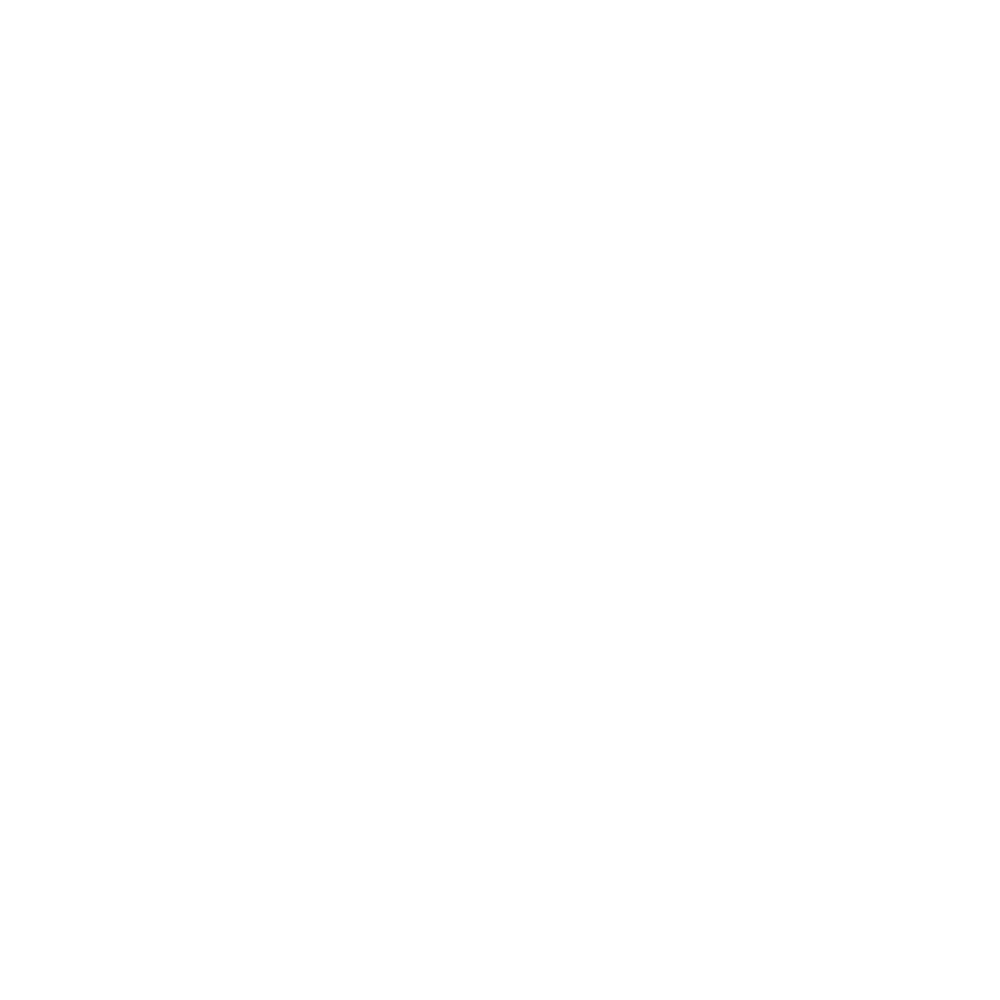

<IPython.core.display.Javascript object>


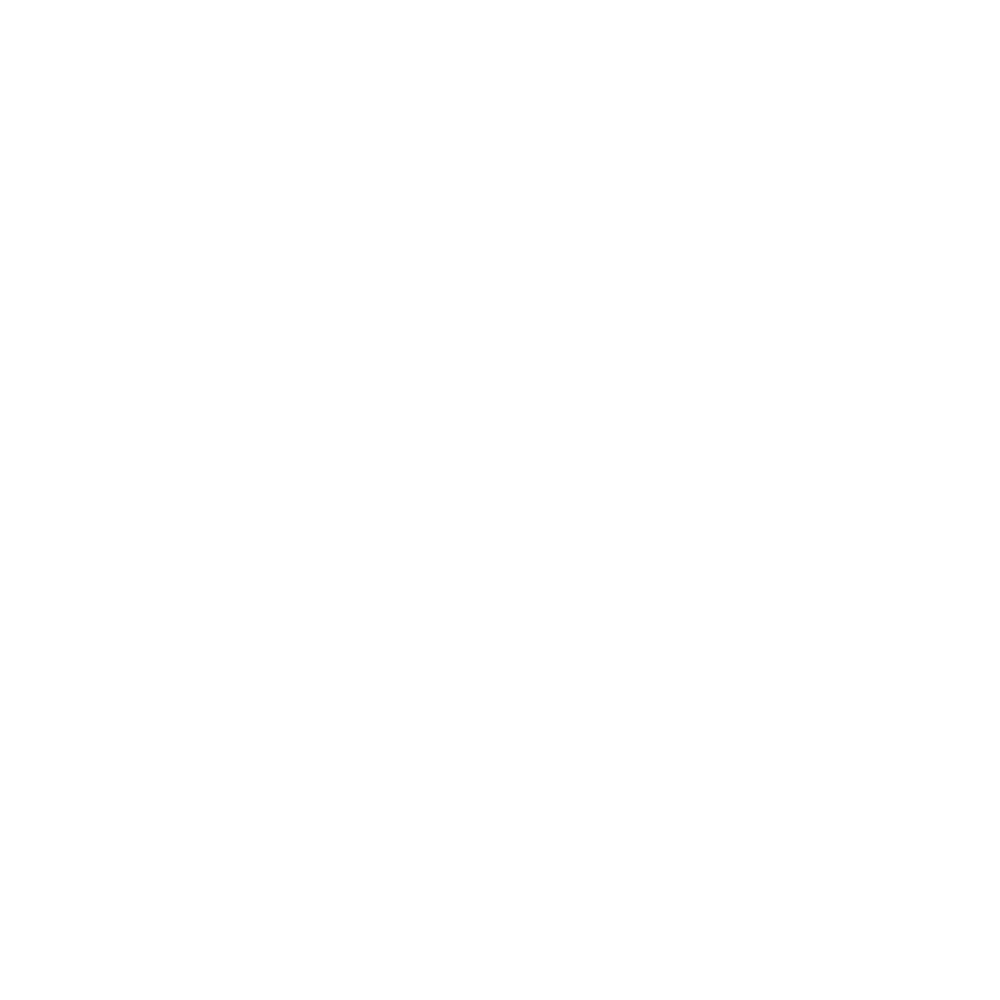

<IPython.core.display.Javascript object>


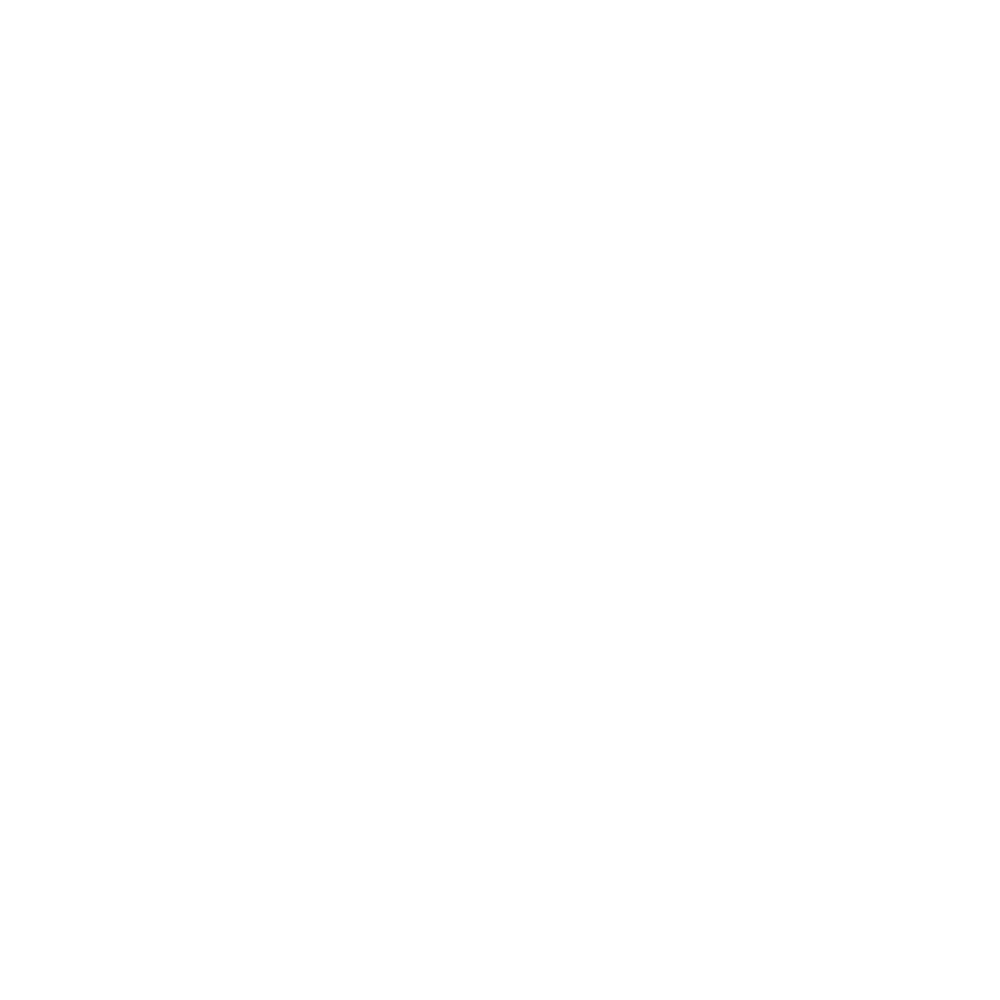

<IPython.core.display.Javascript object>


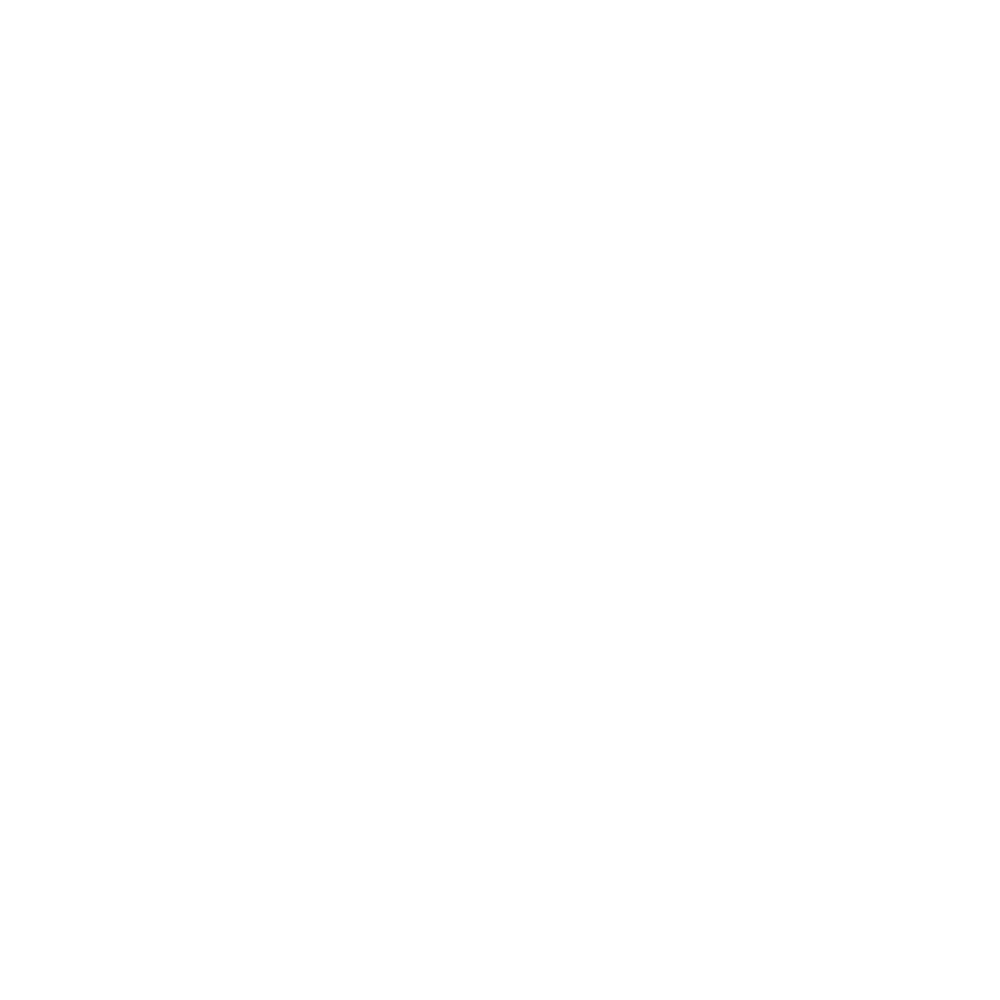

<IPython.core.display.Javascript object>


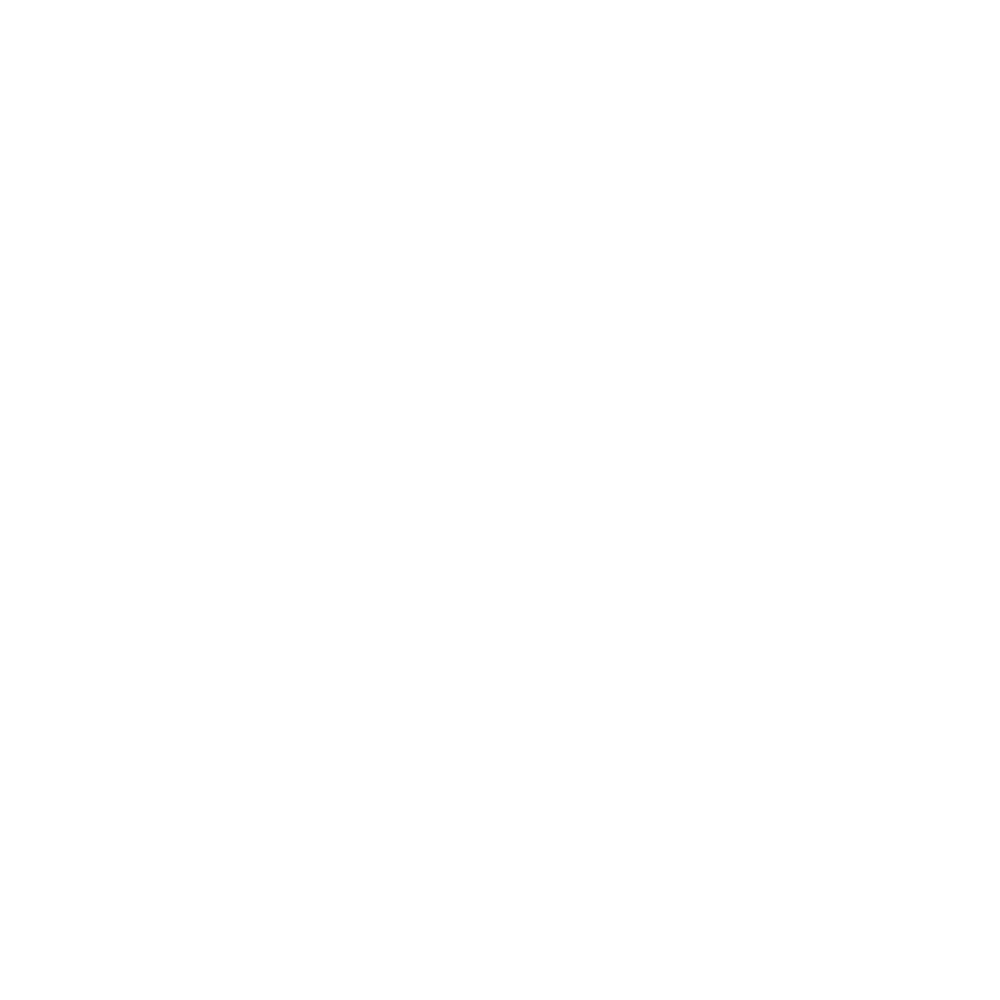

<IPython.core.display.Javascript object>


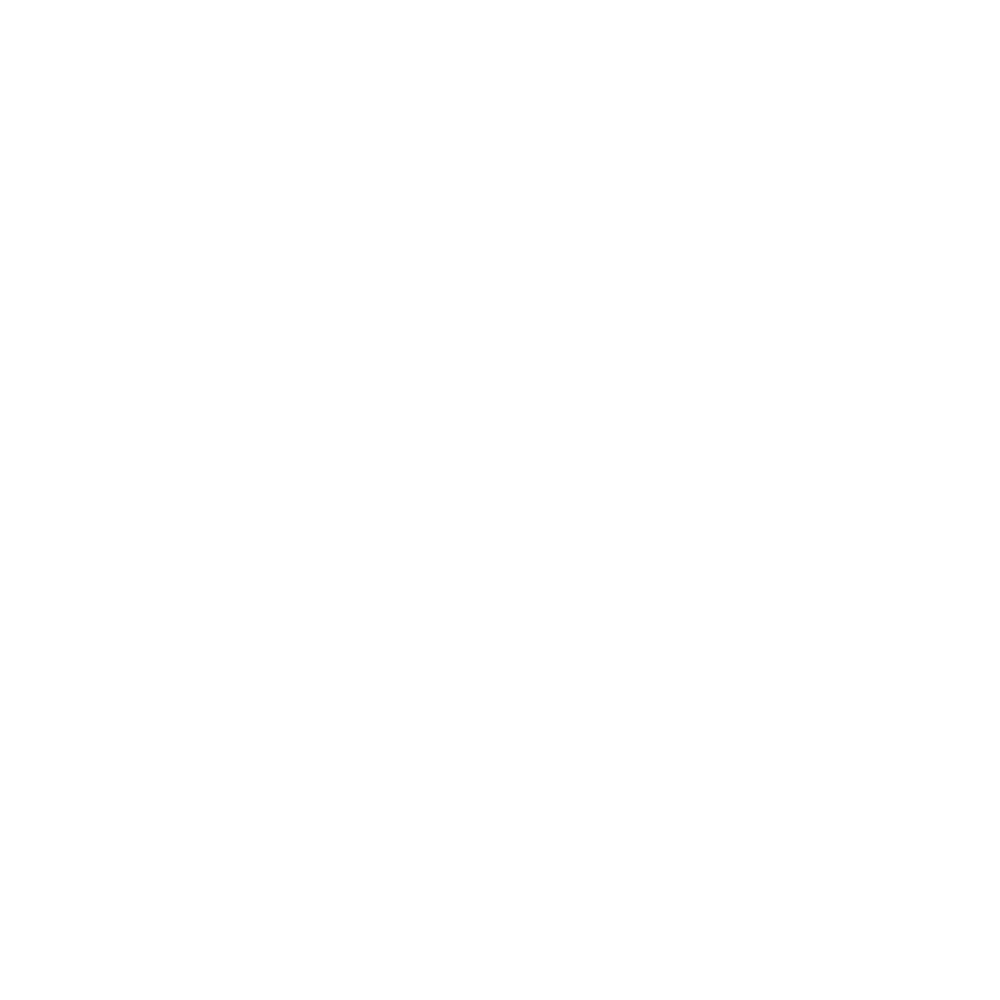

<IPython.core.display.Javascript object>


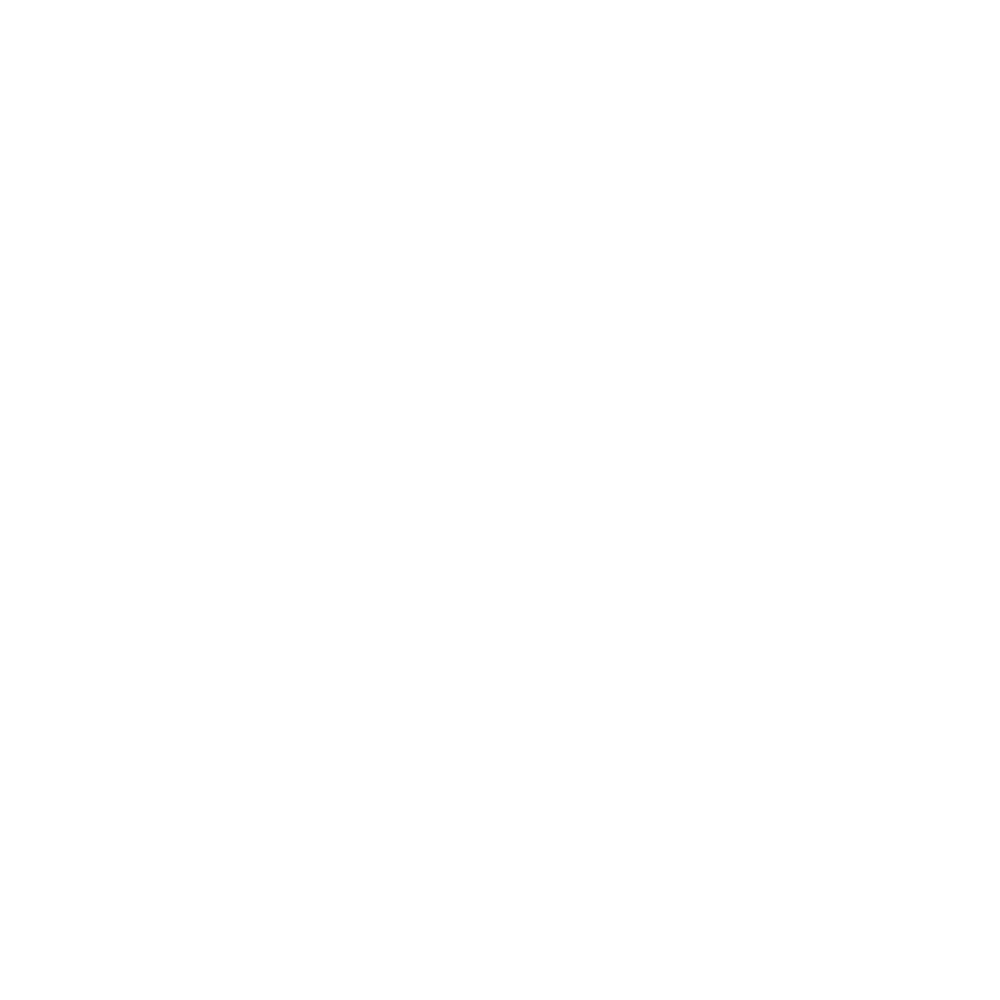

<IPython.core.display.Javascript object>


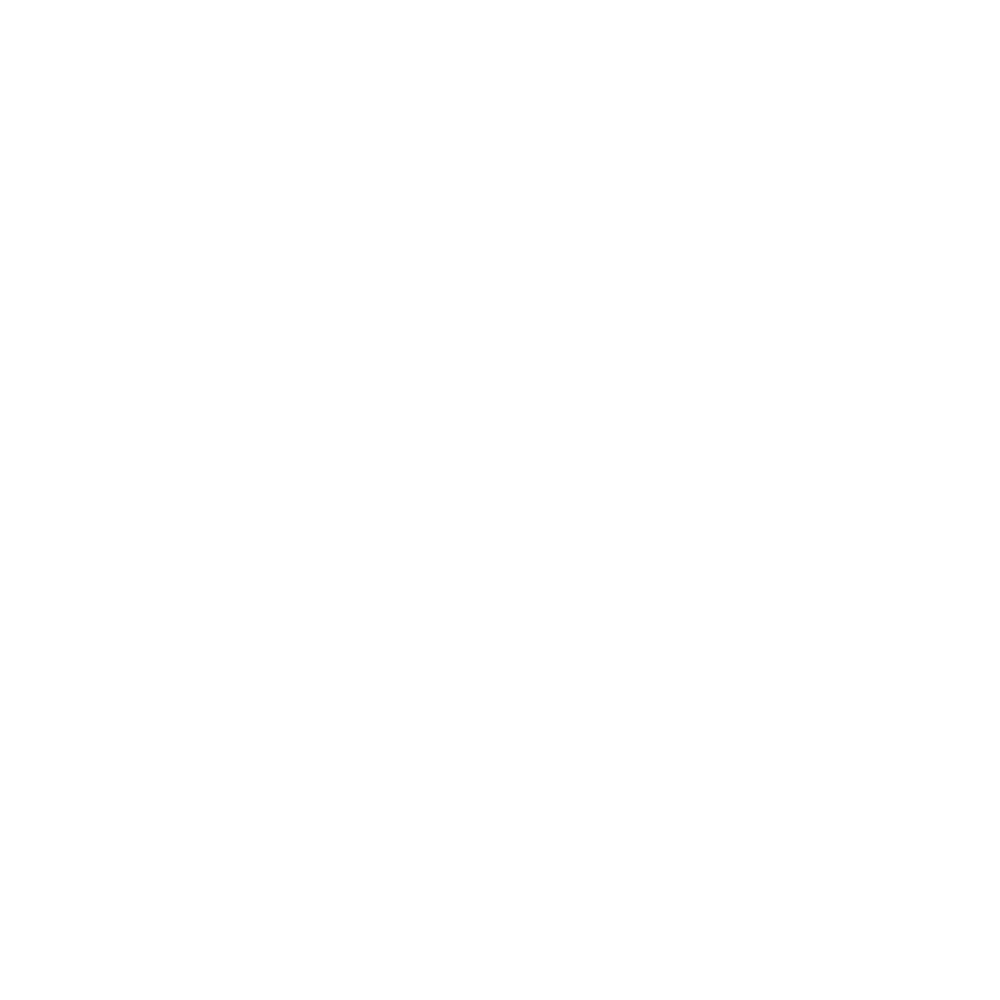

<IPython.core.display.Javascript object>


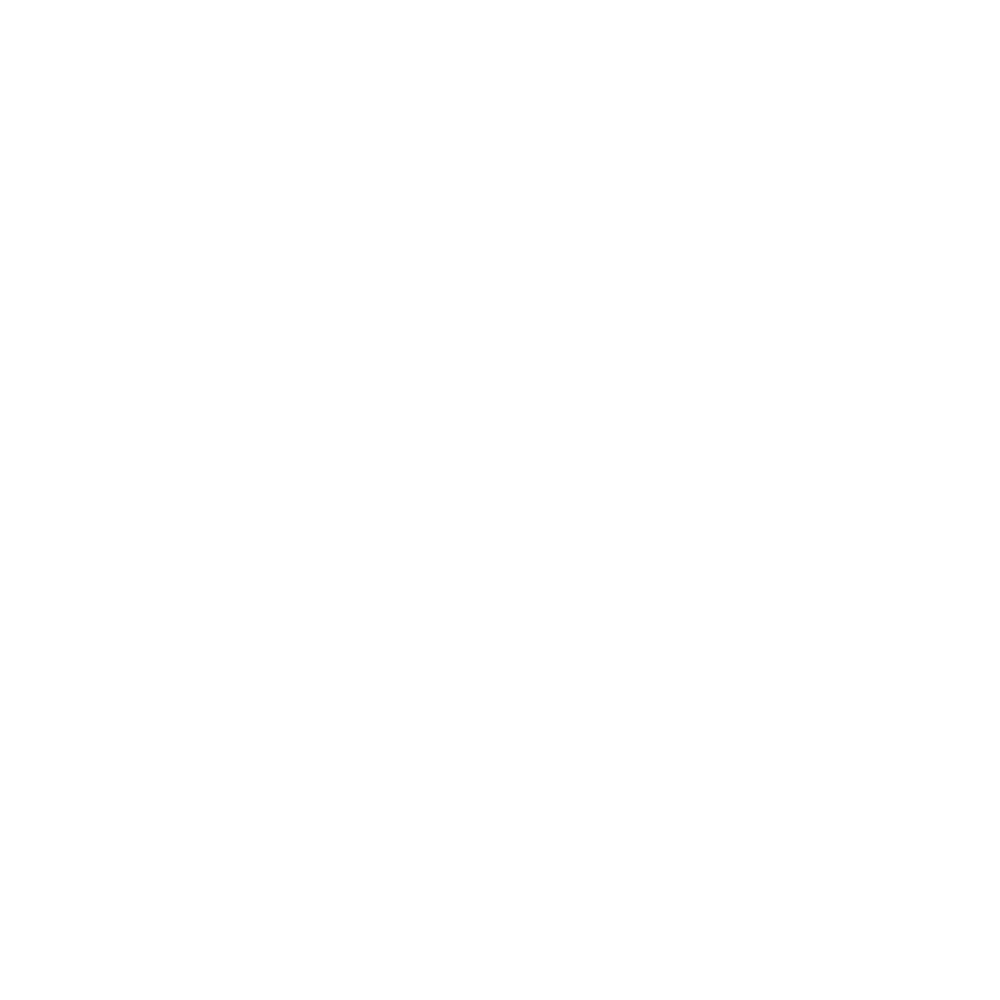

<IPython.core.display.Javascript object>


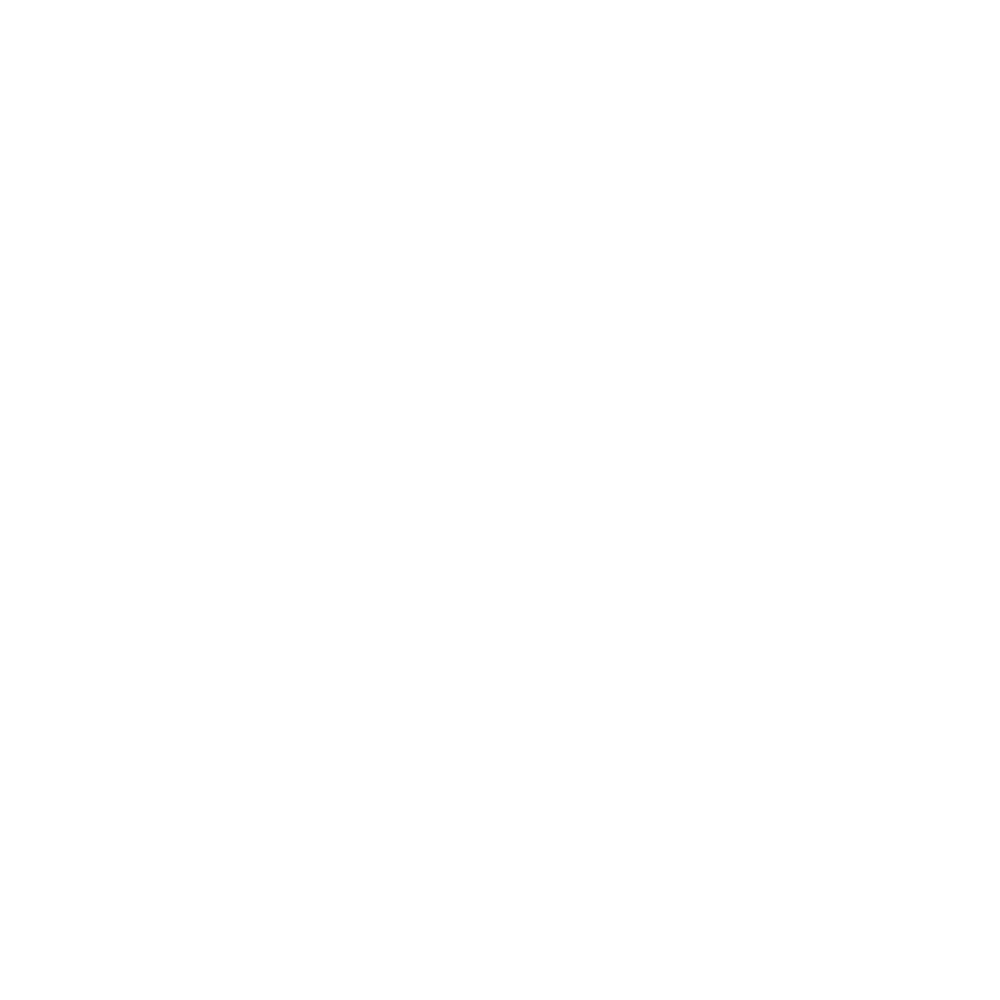

<IPython.core.display.Javascript object>


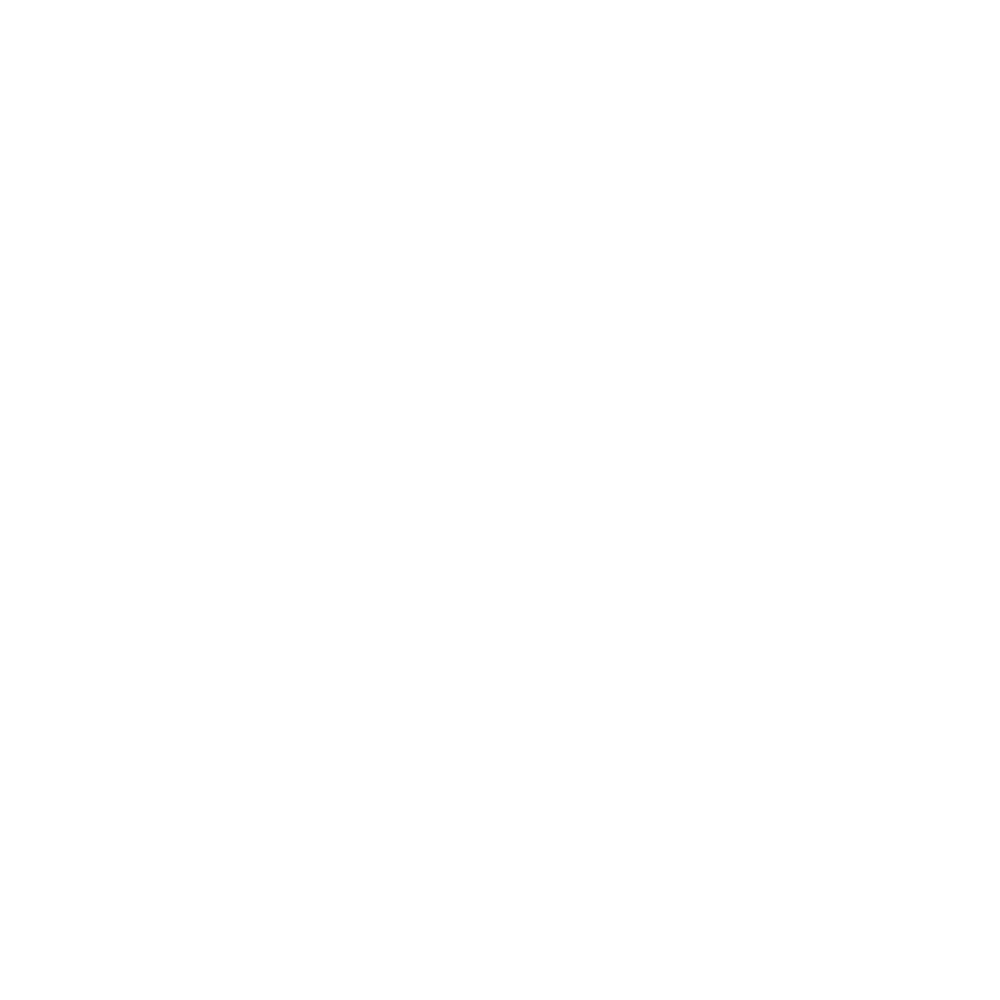

<IPython.core.display.Javascript object>


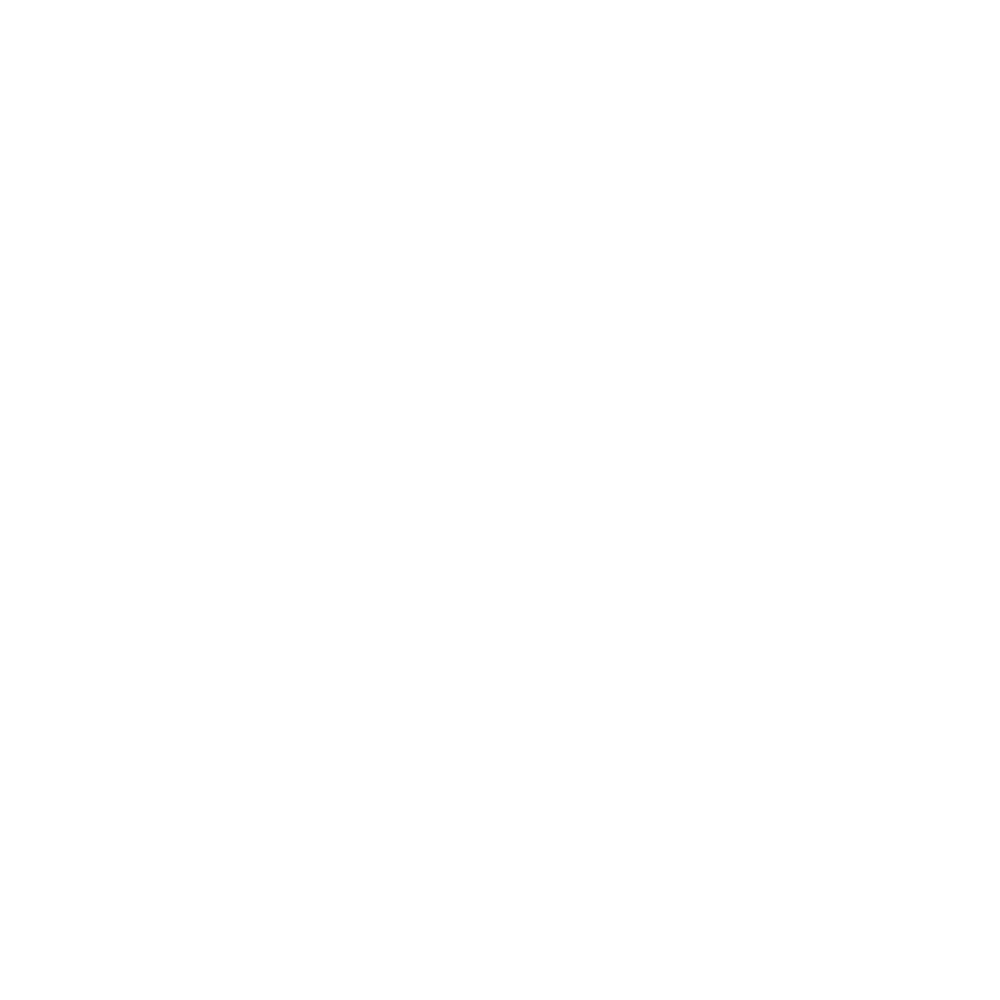

<IPython.core.display.Javascript object>


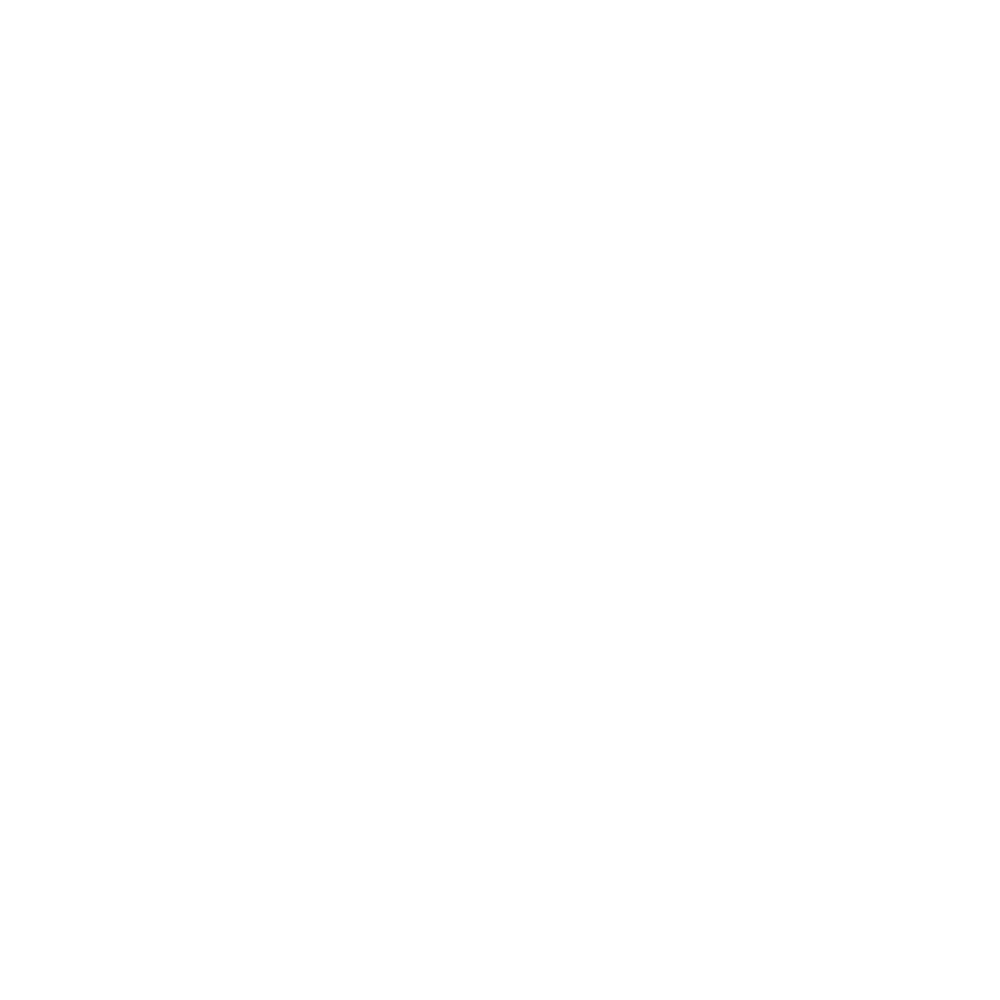

<IPython.core.display.Javascript object>


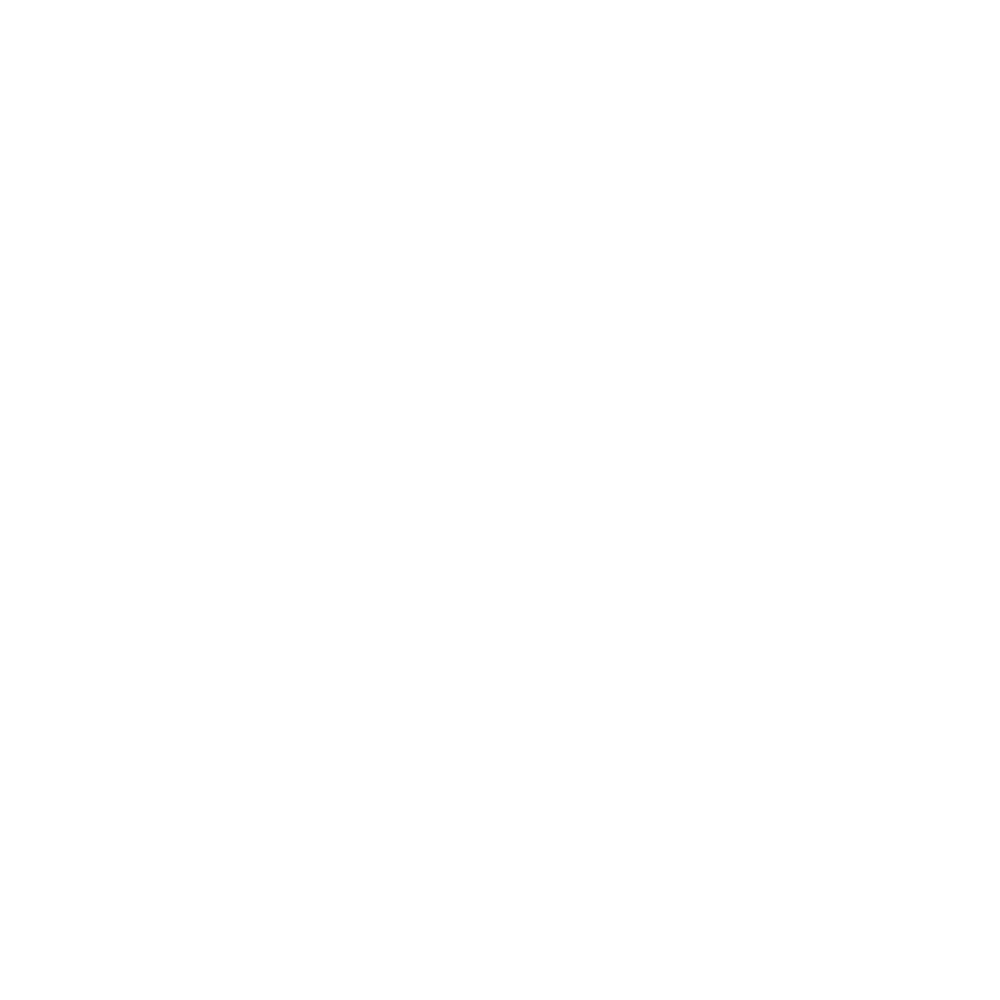

<IPython.core.display.Javascript object>


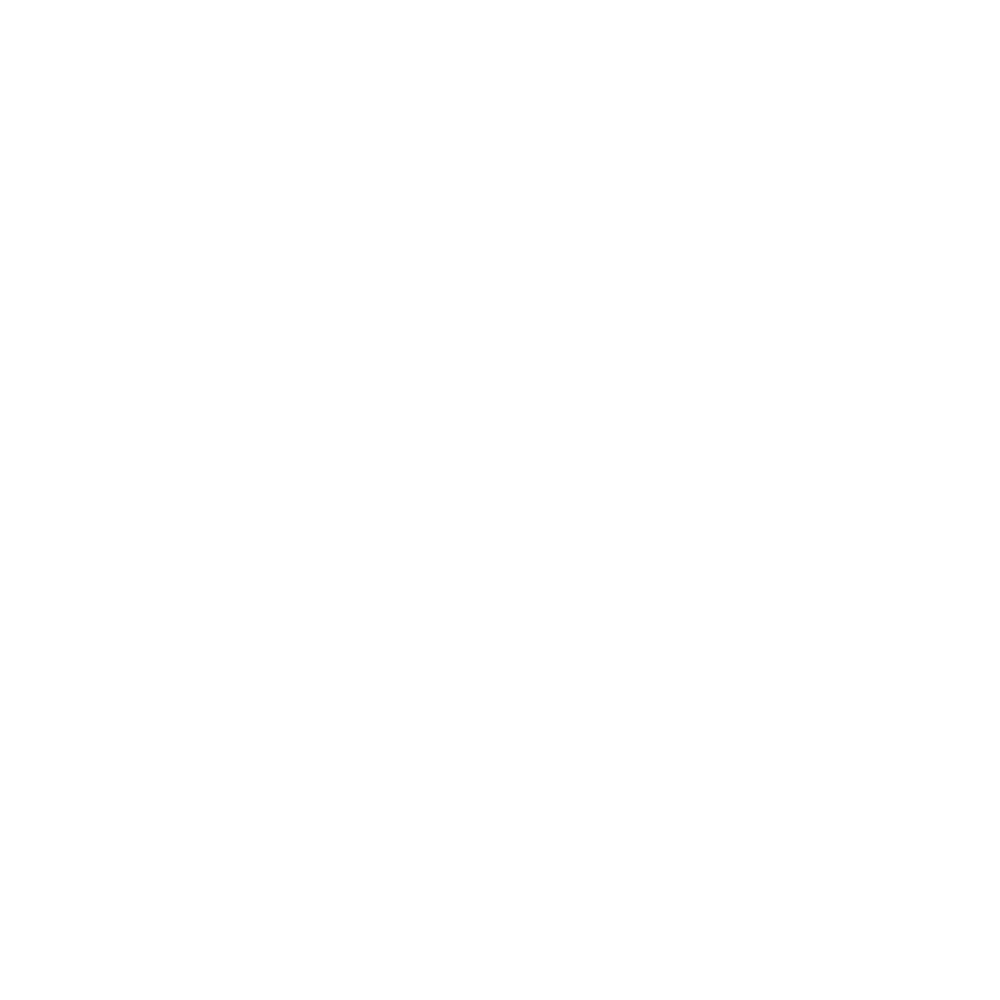

<IPython.core.display.Javascript object>


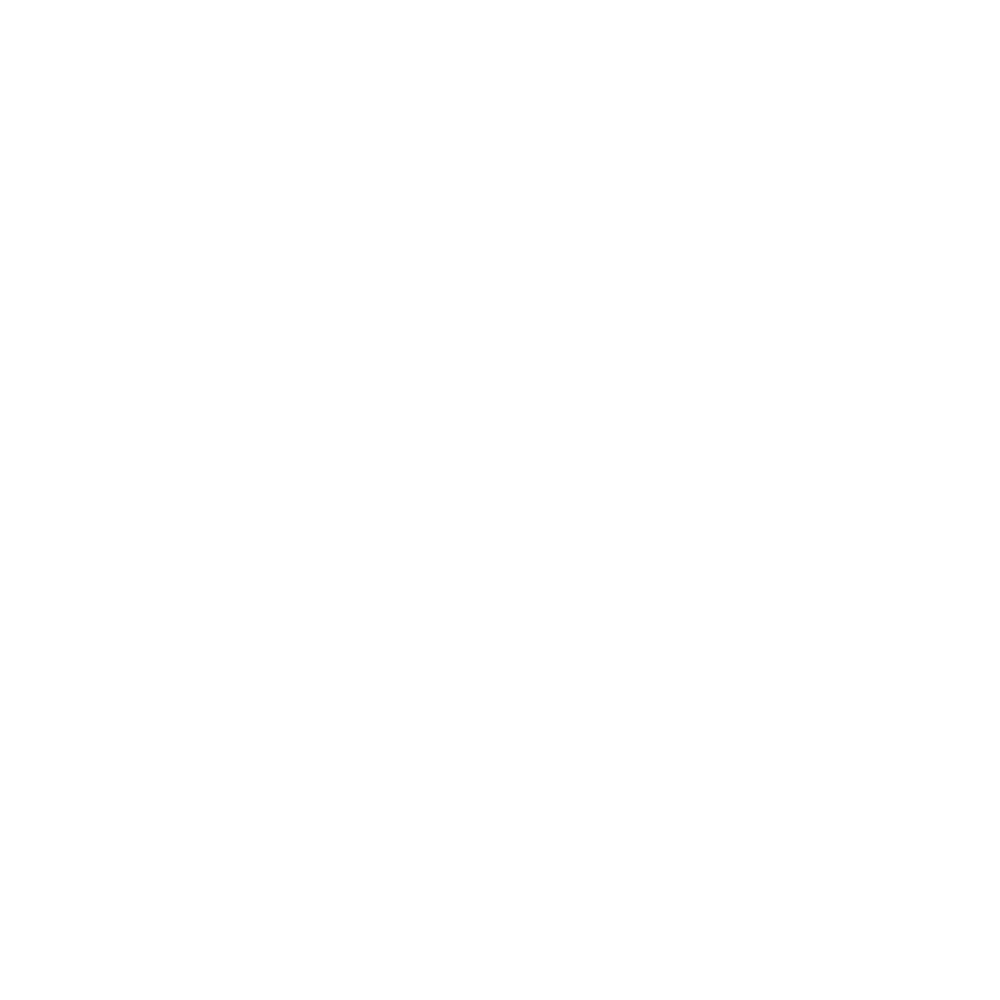

<IPython.core.display.Javascript object>


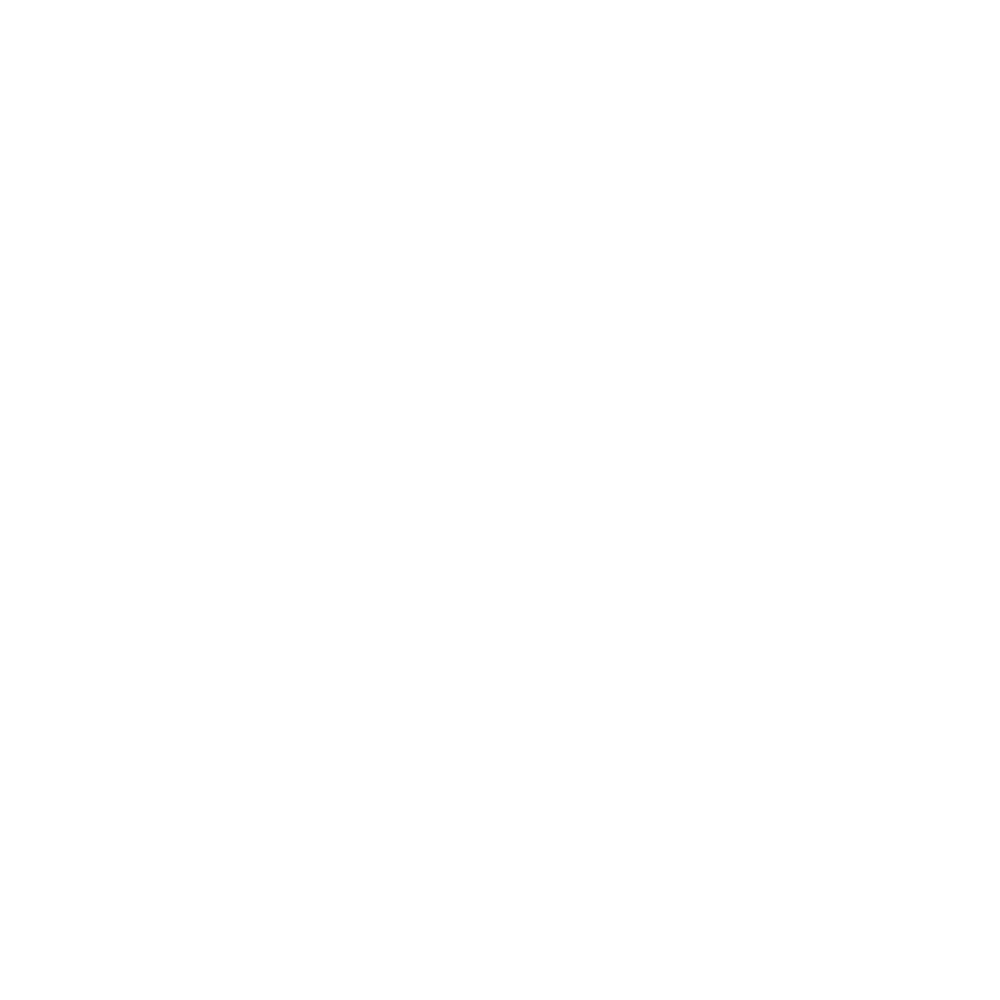

<IPython.core.display.Javascript object>


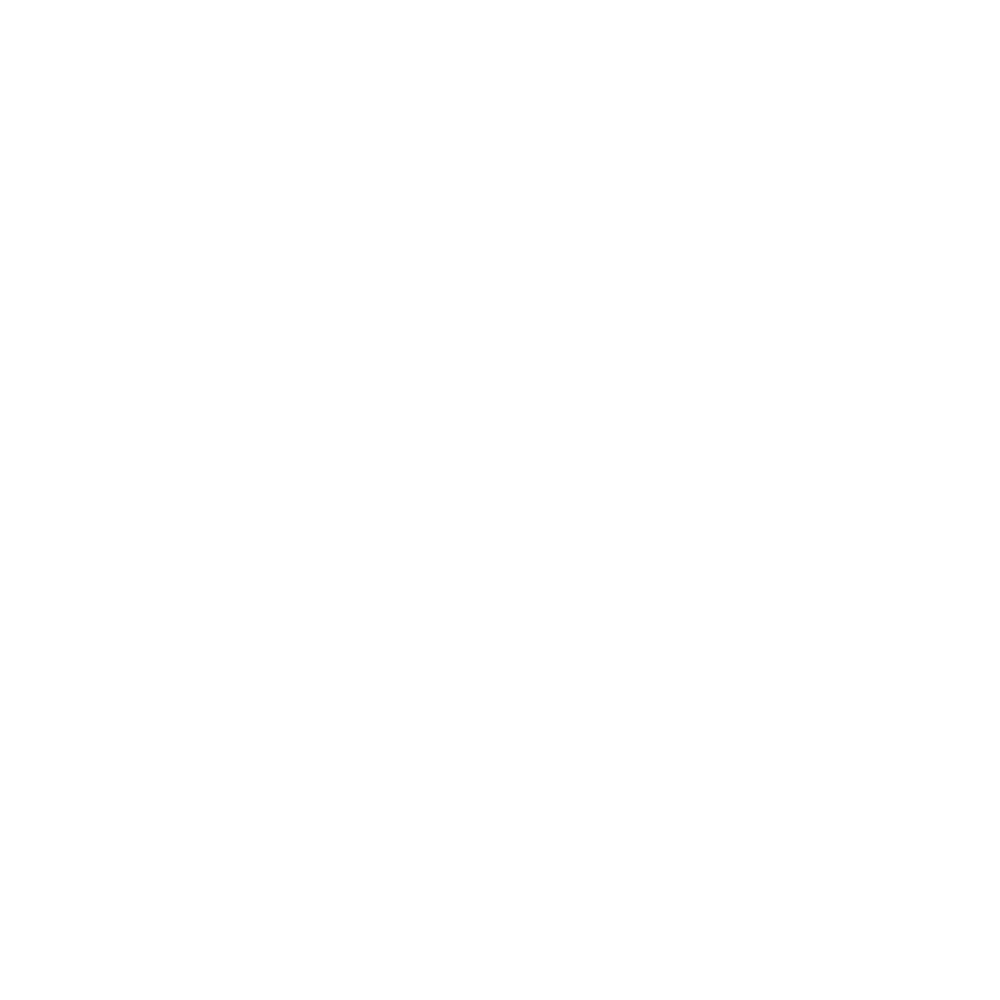

In [68]:
for iI in range( NumPlotTypes ):
    cVar = PlotColumnsList[iI]
    cCMapr = PlotCmapsList[iI]
    # do a plot for each month
    Monther = "Jan"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdJanDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdJanDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdJanDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdJanDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Feb"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdFebDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdFebDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdFebDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdFebDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Mar"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdMarDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdMarDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdMarDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdMarDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Apr"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdAprDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdAprDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdAprDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdAprDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "May"
    cFigName = "DP_LOCA%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdMayDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdMayDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdMayDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdMayDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Jun"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdJunDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdJunDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdJunDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdJunDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Jul"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdJulDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdJulDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdJulDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdJulDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Aug"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdAugDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdAugDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdAugDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdAugDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Sep"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdSepDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdSepDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdSepDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdSepDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Oct"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdOctDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdOctDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdOctDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdOctDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Nov"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdNovDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdNovDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdNovDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdNovDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Dec"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdDecDF[:BCCA_START], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdDecDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdDecDF[BCCA_START:], scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdDecDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
# end of plot for

### Correlation Functions, Covariance Functions, and Variograms

This portion of the analysis is borrowed from the equivalent named section in Isaaks and Srivastava. It involves make three plots for each month.

1. Correlogram
2. Covariance Function
3. Variogram or moment of inertia offset plot

Moment of inertia: calculated for each offset $h$.

\begin{equation*}
    \gamma \left( h \right) = \frac{1}{2N} \sum_{i=1}^{N} \left( x_{i} - y_{i} \right)^{2}
\end{equation*}

First determine the offsets from each grid point

In [69]:
LOCAOffsetDict = dict()
BCCAOffsetDict = dict()

In [70]:
for iI in range( NumGIDs ):
    tID = mGridIds[iI]
    if tID < BCCA_START:
        cRow = gpdGLOCA[gpdGLOCA['Grid_Id'] == tID]
        cUTMx = float( cRow.at[cRow.index[0], 'utm_x'] )
        cUTMy = float( cRow.at[cRow.index[0], 'utm_y'] )
        LocalDict = dict()
        for jJ in range( 0, (BCCA_START - 1), 1):
            nID = mGridIds[jJ]
            nRow = gpdGLOCA[gpdGLOCA['Grid_Id'] == nID ]
            nUTMx = float( nRow.at[nRow.index[0], 'utm_x'] )
            nUTMy = float( nRow.at[nRow.index[0], 'utm_y'] )
            absDist = sqrt( pow( (cUTMx - nUTMx), 2.0 ) + pow( ( cUTMy - nUTMy ), 2.0 ) )
            LocalDict[nID] = absDist
        # end for
        LOCAOffsetDict[tID] = LocalDict
    else:
        cRow = gpdGBCCA[gpdGBCCA['Grid_Id'] == tID]
        cUTMx = float( cRow.at[cRow.index[0], 'utm_x'] )
        cUTMy = float( cRow.at[cRow.index[0], 'utm_y'] )
        LocalDict = dict()
        for jJ in range( (BCCA_START - 1), NumGIDs, 1):
            nID = mGridIds[jJ]
            nRow = gpdGBCCA[gpdGBCCA['Grid_Id'] == nID ]
            nUTMx = float( nRow.at[nRow.index[0], 'utm_x'] )
            nUTMy = float( nRow.at[nRow.index[0], 'utm_y'] )
            absDist = sqrt( pow( (cUTMx - nUTMx), 2.0 ) + pow( ( cUTMy - nUTMy ), 2.0 ) )
            LocalDict[nID] = absDist
        # end for
        BCCAOffsetDict[tID] = LocalDict
# end of outer for

Determine our grid cell to grid cell combinations

In [71]:
BCompList = list( itertools.combinations( mGridIds[:BCCA_START], 2 ) )
LCompList = list( itertools.combinations( mGridIds[BCCA_START:], 2 ) )

In [72]:
BNumComps = len( BCompList )
LNumComps = len( LCompList )
BNumComps, LNumComps

(14196, 820)

Need to process through each month and get the correlation, covariance, moment of inertia, and offset among each pair of grid cells. Do this by month and then by grid cell combination.

Because we have realizations and not data, we have multiple values at each time for each grid cell. To do this effectively, need to do this for each model run and grid. This is probably too much to process at this point and there is not a good way to just use it.